In [1]:
import boto3
s3 = boto3.client('s3')
s3_connection = boto3.resource('s3')

In [2]:
s3.list_buckets()

{'ResponseMetadata': {'RequestId': 'FD77CBAD8E19E765',
  'HostId': 'uddXnIN3/nlWJ5/jZu5sBE1/qJTbJqWFj8bNiLmhKsiU4r+a8/Kwc0RqiqIsRnRtgHDlk8Phizo=',
  'HTTPStatusCode': 200,
  'HTTPHeaders': {'x-amz-id-2': 'uddXnIN3/nlWJ5/jZu5sBE1/qJTbJqWFj8bNiLmhKsiU4r+a8/Kwc0RqiqIsRnRtgHDlk8Phizo=',
   'x-amz-request-id': 'FD77CBAD8E19E765',
   'date': 'Fri, 21 Aug 2020 20:28:11 GMT',
   'content-type': 'application/xml',
   'transfer-encoding': 'chunked',
   'server': 'AmazonS3'},
  'RetryAttempts': 0},
 'Buckets': [{'Name': 'heck-nlp-case-study',
   'CreationDate': datetime.datetime(2020, 8, 21, 17, 11, 38, tzinfo=tzutc())}],
 'Owner': {'DisplayName': 'hientha34',
  'ID': '5f9269682b4edea5666cb801c5aed7a16dafbb345956eecab8bca29b1308a327'}}

In [3]:
response1 = s3.list_objects_v2(Bucket='heck-nlp-case-study')

In [4]:
response1 = s3.list_objects_v2(Bucket='heck-nlp-case-study')

text_files = []
for i in response1['Contents']:
    if "text/" in i['Key']:
        text_files.append(i['Key'])

wiki_files = []
for i in response1['Contents']:
    if "wiki/" in i['Key']:
        wiki_files.append(i['Key'])

In [42]:
s3_resource = boto3.resource('s3')

all_text = []
for file in text_files:
    obj = s3_resource.Object('jgartner-test-data', f'{file}')
    all_text.append(obj.get()['Body'].read().decode('utf-8'))

In [6]:
all_wiki = []
for file in wiki_files:
    obj = s3_resource.Object('jgartner-test-data', f'{file}')
    all_wiki.append(obj.get()['Body'].read().decode('utf-8'))

In [7]:
test_text = all_text[0]

In [8]:
import unicodedata
def remove_accents(input_str):
    nfkd_form = unicodedata.normalize('NFKD', input_str)
    only_ascii = nfkd_form.encode('ASCII', 'ignore')
    return only_ascii.decode()

In [9]:
remove_accents(test_text)

'\'\'\'Zero-based numbering\'\'\' or \'\'index origin = 0\'\'<ref>{{cite journal|last1=Brown|first1=Jim|title=In Defense of Index Origin 0|journal=ACM SIGAPL APL Quote Quad |date=December 1978 |volume=9 |issue=2 |page=7 |doi=10.1145/586050.586053 }}</ref><ref>{{cite web|last1=Hui|first1=Roger|title=Is Index Origin 0 a Hindrance?|url=http://www.jsoftware.com/papers/indexorigin.htm|website=jsoftware.com|publisher=JSoftware|accessdate=19 January 2015}}</ref> is a way of [[numbering]] in which the initial element of a [[sequence]] is assigned the [[Indexed family|index]] 0, rather than the index 1 as is typical in everyday \'\'non-mathematical\'\'/\'\'non-programming\'\' circumstances. Under zero-based numbering, the initial element is sometimes termed the [[0 (number)|\'\'zeroth\'\']] element, rather than the \'\'first\'\' element; \'\'zeroth\'\' is a [[word coinage|coined]] [[ordinal number (linguistics)|ordinal number]] corresponding to the number [[zero]]. In some cases, an object or v

In [43]:
all_text[20]

"In [[mathematics]], particularly [[linear algebra]], a '''zero matrix''' or '''null matrix''' is a [[matrix (mathematics)|matrix]] all of whose entries are [[0 (number)|zero]].<ref>{{citation|title=Linear Algebra|series=[[Undergraduate Texts in Mathematics]]|first=Serge|last=Lang|authorlink=Serge Lang|publisher=Springer|year=1987|isbn=9780387964126|page=25|url=https://books.google.com/books?id=0DUXym7QWfYC&pg=PA25|quotation=We have a zero matrix in which ''a<sub>ij</sub>''&nbsp;=&nbsp;0 for all ''i'',&nbsp;''j''. ... We shall write it&nbsp;''O''.}}</ref> Some examples of zero matrices are\n\n:<math>\n0_{1,1} = \\begin{bmatrix}\n0 \\end{bmatrix}\n,\\ \n0_{2,2} = \\begin{bmatrix}\n0 & 0 \\\\\n0 & 0 \\end{bmatrix}\n,\\ \n0_{2,3} = \\begin{bmatrix}\n0 & 0 & 0 \\\\\n0 & 0 & 0 \\end{bmatrix}\n.\\ \n</math>\n\n==Properties==\n\nThe set of ''m''&times;''n'' matrices with entries in a [[ring (mathematics)|ring]] K forms a ring <math>K_{m,n} \\,</math>.  The zero matrix <math>0_{K_{m,n}} \\, </

In [12]:
# initial shape document_tf_matrix.shape

(40, 12532)

In [48]:
from string import punctuation

for i, doc in enumerate(all_text):
    all_text[i] = remove_accents(doc)
    all_text[i]=doc.translate(str.maketrans('!#$%&\'()*+,./:\";<=>?@[\\]^_`{|}~\n', ''))


In [49]:
all_text[10]

'  distinguish Zero-sum game      about combinatorial game theory the novel entitled  The Zero Game  Brad Meltzer   In   combinatorial game theory    the    zero game    is the game where neither player has any legal options  Therefore  under the   normal play convention    the first player automatically loses  and it is a second-player win  The zero game has a   Sprague–Grundy value   of zero   The combinatorial notation of the zero game is         ref name  conway-p72    citation first J  H  last Conway authorlink John Horton Conway title On numbers and games publisher Academic Press year 1976 page 72     ref   A zero game should be contrasted with the   star  game theory  star game    0 0   which is a first-player win since either player must  if first to move in the game  move to a zero game  and therefore win  ref name  conway-p72       Examples   Simple examples of zero games include   Nim   with no piles ref   harvtxt Conway 1976    p  122   ref  or a   Hackenbush   diagram with

In [69]:
from nltk.stem.snowball import SnowballStemmer
from nltk.tokenize import word_tokenize
stemmer = SnowballStemmer('english')

In [72]:
 def tokenize(text):
        tokens = word_tokenize(text)
        stems = [stemmer.stem(token) for token in tokens]
        return stems

In [74]:
stems = all_text.copy()
for i, text in enumerate(stems):
    stems[i] = tokenize(text)
    

In [80]:
stems[0]

['zero-bas',
 'number',
 'or',
 'index',
 'origin',
 '0',
 'ref',
 'cite',
 'journal',
 'last1',
 'brown',
 'first1',
 'jim',
 'titl',
 'in',
 'defens',
 'of',
 'index',
 'origin',
 '0',
 'journal',
 'acm',
 'sigapl',
 'apl',
 'quot',
 'quad',
 'date',
 'decemb',
 '1978',
 'volum',
 '9',
 'issu',
 '2',
 'page',
 '7',
 'doi',
 '10',
 '1145',
 '586050',
 '586053',
 'ref',
 'ref',
 'cite',
 'web',
 'last1',
 'hui',
 'first1',
 'roger',
 'titl',
 'is',
 'index',
 'origin',
 '0',
 'a',
 'hindranc',
 'url',
 'http',
 'www',
 'jsoftwar',
 'com',
 'paper',
 'indexorigin',
 'htm',
 'websit',
 'jsoftwar',
 'com',
 'publish',
 'jsoftwar',
 'accessd',
 '19',
 'januari',
 '2015',
 'ref',
 'is',
 'a',
 'way',
 'of',
 'number',
 'in',
 'which',
 'the',
 'initi',
 'element',
 'of',
 'a',
 'sequenc',
 'is',
 'assign',
 'the',
 'index',
 'famili',
 'index',
 '0',
 'rather',
 'than',
 'the',
 'index',
 '1',
 'as',
 'is',
 'typic',
 'in',
 'everyday',
 'non-mathemat',
 'non-program',
 'circumst',
 'under'

In [81]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
cv = CountVectorizer(stop_words='english')
vectorized = cv.fit_transform(all_text)
tfidf = TfidfVectorizer(stop_words='english')
tfidfed = tfidf.fit_transform(all_text)

In [60]:
print(tfidfed.todense())

[[0.02207337 0.01361471 0.         ... 0.         0.         0.        ]
 [0.00342717 0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


In [57]:
cv.vocabulary_

{'zero': 12051,
 'based': 2549,
 'numbering': 8155,
 'index': 6316,
 'origin': 8331,
 'ref': 9425,
 'cite': 3285,
 'journal': 6702,
 'last1': 6936,
 'brown': 2881,
 'first1': 5310,
 'jim': 6669,
 'title': 11108,
 'defense': 4079,
 'acm': 1827,
 'sigapl': 10269,
 'apl': 2194,
 'quote': 9272,
 'quad': 9214,
 'date': 3997,
 'december': 4040,
 '1978': 564,
 'volume': 11682,
 'issue': 6583,
 'page': 8426,
 'doi': 4469,
 '10': 147,
 '1145': 238,
 '586050': 1370,
 '586053': 1371,
 'web': 11782,
 'hui': 6117,
 'roger': 9793,
 'hindrance': 6010,
 'url': 11492,
 'http': 6109,
 'www': 11956,
 'jsoftware': 6715,
 'com': 3436,
 'papers': 8452,
 'indexorigin': 6319,
 'htm': 6105,
 'website': 11786,
 'publisher': 9160,
 'accessdate': 1799,
 '19': 433,
 'january': 6627,
 '2015': 776,
 'way': 11768,
 'initial': 6389,
 'element': 4720,
 'sequence': 10129,
 'assigned': 2342,
 'indexed': 6317,
 'family': 5173,
 'typical': 11325,
 'everyday': 4980,
 'non': 8069,
 'mathematical': 7430,
 'programming': 9049,

In [61]:
print(vectorized.todense())

[[2 1 0 ... 0 0 0]
 [1 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [62]:
vectorized.shape

(40, 12154)

In [50]:
from nltk.stem.porter import PorterStemmer
from nltk.stem.snowball import SnowballStemmer
from nltk.stem.wordnet import WordNetLemmatizer

In [ ]:
porter = PorterStemmer()
snowball = SnowballStemmer('english')
wordnet = WordNetLemmatizer()
docs_porter = [[porter.stem(word) for word in text] for text in all_text]
docs_snowball = [[snowball.stem(word) for word in text] for text in all_text]
docs_wordnet = [[wordnet.lemmatize(word) for word in text] for text in all_text]


In [91]:
for i, doc in enumerate(all_wiki):
    all_wiki[i] = remove_accents(doc)
    all_wiki[i]=doc.translate(str.maketrans('!#$%&\'()*+,./:\";<=>?@[\\]^_`{|}~\n','                                '))


955

In [120]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
cv = CountVectorizer(stop_words='english')
vectorized = cv.fit_transform(all_wiki)
tfidf = TfidfVectorizer(stop_words='english')
tfidfed = tfidf.fit_transform(all_wiki)

In [122]:
all_wiki[44]

'  Redirect  223      Infobox firearm cartridge   name    223 Remington   image   223 Remington jpg   image size   300px   caption   A variety of  223 Remington cartridges and a    308 Winchester    right  for comparison  Bullets in  223 cartridges  left to right   Montana Gold 55 grain Full Metal Jacket  Sierra 55 grain Spitzer Boat Tail  Nosler Winchester 55 grain Combined Technology  Hornady 60 grain V-MAX  Barnes 62 grain Tipped Triple-Shock X  Nosler 69 grain Hollow Point Boat Tail  Swift 75 grain Scirocco II    origin     United States     type   Rifle   -- Production info --    designer     Remington Arms     design date   1962   variants    223 Ackley Improved    5 56×45mm NATO     production date   1964–present   -- Specifications --    parent      222 Remington     case type   Rimless  bottleneck   bullet   0 224   neck   0 253   shoulder   0 354   base   0 376   rim dia   0 378   rim thick   0 045   case length   1 76   length   2 26   rifling   1 in 12 inch  military style 

In [95]:
tfidf.vocabulary_

{'zero': 57360,
 'based': 12489,
 'numbering': 39314,
 'index': 29598,
 'origin': 40140,
 'ref': 44813,
 'cite': 16566,
 'journal': 31164,
 'last1': 32878,
 'brown': 14354,
 'first1': 24153,
 'jim': 31006,
 'title': 52610,
 'defense': 19453,
 'acm': 9090,
 'sigapl': 48664,
 'apl': 10711,
 'quote': 43956,
 'quad': 43805,
 'date': 19162,
 'december': 19335,
 '1978': 2839,
 'volume': 55425,
 'issue': 30529,
 'page': 40723,
 'doi': 20725,
 '10': 676,
 '1145': 1228,
 '586050': 6672,
 '586053': 6673,
 'web': 55906,
 'hui': 28744,
 'roger': 46194,
 'hindrance': 28188,
 'url': 54444,
 'http': 28702,
 'www': 56758,
 'jsoftware': 31217,
 'com': 17129,
 'papers': 40926,
 'indexorigin': 29608,
 'htm': 28698,
 'website': 55930,
 'publisher': 43533,
 'accessdate': 8972,
 '19': 2693,
 'january': 30785,
 '2015': 3826,
 'way': 55849,
 'initial': 29817,
 'element': 21935,
 'sequence': 47930,
 'assigned': 11374,
 'indexed': 29605,
 'family': 23531,
 'typical': 53732,
 'everyday': 22958,
 'non': 38958,
 '

In [121]:
import operator
sorted_d = dict(sorted(tfidf.vocabulary_.items(), key=operator.itemgetter(1), reverse = True))
sorted_d

{'ｓｏｕｎｄｔｒａｃｋ': 58054,
 'ｐｌｕｓ': 58053,
 'ｏｒｉｇｉｎａｌ': 58052,
 'ｌｉｍｉｎａｌｉｔｙ': 58051,
 'ｈａｃｋ': 58050,
 'ｇｒｅｅｎ': 58049,
 'ｅｍｅｒａｌｄ': 58048,
 '홈페이지': 58047,
 '한국음반산업협회': 58046,
 '한국어': 58045,
 '판매량집계': 58044,
 '지원': 58043,
 '열한': 58042,
 '속속': 58041,
 '사용': 58040,
 '문서': 58039,
 '무제': 58038,
 '도메인': 58037,
 '개설': 58036,
 '黄昏の鍵': 58035,
 '黄昏の腕輪伝説': 58034,
 '黄昏の海': 58033,
 '高速鉄道物語': 58032,
 '香港': 58031,
 '開催': 58030,
 '長承': 58029,
 '鉄道館': 58028,
 '鉄道博物館における０系新幹線車両の公開について': 58027,
 '鉄道のテクノロジーvol1': 58026,
 '鉄道のテクノロジー': 58025,
 '重要': 58024,
 '運転終了': 58023,
 '車両の動き2008': 58022,
 '設定資料集': 58021,
 '記憶': 58020,
 '裏話が次々と披露': 58019,
 '网络': 58018,
 '網路': 58017,
 '網絡': 58016,
 '組織': 58015,
 '猴貓圖': 58014,
 '無住': 58013,
 '澳门': 58012,
 '澳門': 58011,
 '楊惟德': 58010,
 '桑原騭藏': 58009,
 '李綱': 58008,
 '曾公亮': 58007,
 '明王慎德': 58006,
 '日本語対応': 58005,
 '日本機械学会': 58004,
 '日本': 58003,
 '新法': 58002,
 '新幹線電車データブック2011': 58001,
 '新幹線公園ｓｅｃ': 58000,
 '新幹線': 57999,
 '新加坡': 57998,
 '新下関の100系訓練用車両が使用終了に': 57997,
 '教育': 57996,
 '政府

In [112]:
dictionary= {u'asielzoekers': 0.0034861170591325486,.. u'samsom': 0.0019304632325980841} 
from PIL import Image
import matplotlib.pyplot as plt
wc = WordCloud(background_color="white",width=1000,height=1000, max_words=10,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(dictionary)
plt.imshow(wc)

ValueError: If using all scalar values, you must pass an index

In [97]:
!pip install wordcloud


     |████████████████████████████████| 161 kB 2.6 MB/s eta 0:00:01


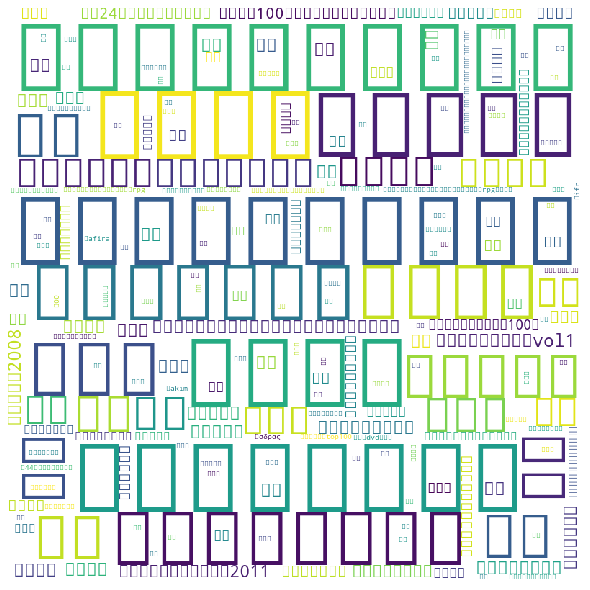

In [109]:
from wordcloud import WordCloud
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                 
                min_font_size = 10).generate_from_frequencies(tfidf.vocabulary_) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

In [119]:
# importing all necessery modules 
from wordcloud import WordCloud, STOPWORDS 
  
  
comment_words = '' 
stopwords = "" 
   
for val in tfidf.vocabulary_.values(): 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    comment_words += " ".join(tokens)+" "
  
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

'  Unreferenced date August 2009   The    1060s BC    is a   List of decades decade   which lasted from 1069 BC to 1060 BC    Decadebox BC 106      Events and trends     c    1069 BC   – End of   New Kingdom   in   Ancient Egypt      c  1069 BC –   Third Intermediate Period of Egypt   starts    1069 BC –   Ramses XI   dies  ending the   Twentieth dynasty of Egypt Twentieth Dynasty    He is succeeded by   Smendes I    who founds the   Twenty-first dynasty of Egypt Twenty-first Dynasty        1068 BC   –   Codrus    legendary   Kings of Athens King of Athens    dies in battle against   Dorians Dorian   invaders after a reign of 21 years    Athenian   tradition considers him the last   Monarch King   to have held absolute power  Modern historians consider him the last King whose life account is part of   Greek mythology    He is succeeded by his son   Medon       Category 11th century BC    '

In [103]:
from sklearn.metrics.pairwise import linear_kernel
cosine_similarities = linear_kernel(tfidfed, tfidfed)

cs = []
for i, doc1 in enumerate(all_wiki):
    for j, doc2 in enumerate(all_wiki):
        print(i, j, cosine_similarities[i, j])

0 0 1.0000000000000018
0 1 0.046078451977668
0 2 0.02876964194062754
0 3 0.04884333095361772
0 4 0.023894564381640438
0 5 0.011185840997298233
0 6 0.01950596815242389
0 7 0.021377993934156167
0 8 0.03638902970462806
0 9 0.03330825218797558
0 10 0.10354546581047565
0 11 0.023918120975901444
0 12 0.06860791585230713
0 13 0.049828789595358344
0 14 0.007386375196174425
0 15 0.013587027865154654
0 16 0.05261395343631816
0 17 0.0319602927603988
0 18 0.05548034153874734
0 19 0.04146880037590188
0 20 0.03871516991381443
0 21 0.020154339675952905
0 22 0.04492174823534101
0 23 0.027452743024277595
0 24 0.04431472332361748
0 25 0.06044333227737782
0 26 0.029452822739262696
0 27 0.027843094674740478
0 28 0.04630863997965157
0 29 0.04339660249913174
0 30 0.03025551151365736
0 31 0.017435948701662957
0 32 0.03280019722138347
0 33 0.020072821562964298
0 34 0.02022723200794172
0 35 0.018319849937842705
0 36 0.021632166268206014
0 37 0.04240181141588413
0 38 0.05318283653228573
0 39 0.02950423797638499

0 496 0.06917319722828576
0 497 0.03769163358889105
0 498 0.020610022962464225
0 499 0.019723338352214813
0 500 0.017610575055519235
0 501 0.0056962480267523504
0 502 0.022810791652549324
0 503 0.013087367884567117
0 504 0.023313596318051744
0 505 0.02015206466894933
0 506 0.0254223618906773
0 507 0.05386336893340115
0 508 0.012297176556120516
0 509 0.012093189576451568
0 510 0.008332289698210232
0 511 0.014250114891095195
0 512 0.0331399621735268
0 513 0.020195649610960115
0 514 0.023701860710715162
0 515 0.05366621982537287
0 516 0.034747782665396125
0 517 0.061315904140384556
0 518 0.051040451647620874
0 519 0.03196350737266352
0 520 0.023294822391615316
0 521 0.030478925465267256
0 522 0.021980011082458166
0 523 0.039944683903824774
0 524 0.01856069451209357
0 525 0.006532225189715151
0 526 0.018890733504812122
0 527 0.017679019891007522
0 528 0.02287097967304989
0 529 0.012914634308238342
0 530 0.011844405128891948
0 531 0.013835388295268801
0 532 0.020966904826288484
0 533 0.0109

0 829 0.0972897013813136
0 830 0.025207917287368653
0 831 0.04157557080082252
0 832 0.01817717571960577
0 833 0.027988509351351176
0 834 0.007577039412565261
0 835 0.03927296410352294
0 836 0.025100814568354644
0 837 0.042051519274555735
0 838 0.019426921007486032
0 839 0.01445262323364271
0 840 0.02435546382913475
0 841 0.029947158574139498
0 842 0.01921386417644399
0 843 0.01754355159697768
0 844 0.02939329179757491
0 845 0.021726642308512366
0 846 0.007162551876196784
0 847 0.02151374576590496
0 848 0.04421131014422706
0 849 0.07237030827638694
0 850 0.02436545081692676
0 851 0.032789223761257875
0 852 0.01927132744351262
0 853 0.0066987897300140094
0 854 0.012787197949812588
0 855 0.03320432410581181
0 856 0.020531628378189053
0 857 0.02820623070926495
0 858 0.023428127383025535
0 859 0.03540810136737605
0 860 0.02121106096300348
0 861 0.03142220766973373
0 862 0.023370541022830055
0 863 0.02532669118524385
0 864 0.03713927207743392
0 865 0.06528360414904177
0 866 0.016908492163636

1 207 0.013804559515130717
1 208 0.0374340592353051
1 209 0.029992979324217024
1 210 0.026282687748799743
1 211 0.002551505329022257
1 212 0.03618382936725064
1 213 0.011289551896656556
1 214 0.04014616540287559
1 215 0.034170684590888366
1 216 0.05708313268610363
1 217 0.0452196873307412
1 218 0.02004865629005951
1 219 0.08574634534147794
1 220 0.008099209641989647
1 221 0.05906533708630851
1 222 0.008784002879382989
1 223 0.044874979614063434
1 224 0.020768102569389293
1 225 0.02293926356212526
1 226 0.03158040008624367
1 227 0.006825891387318151
1 228 0.016610067111760222
1 229 0.03521728981449097
1 230 0.032350953211497675
1 231 0.03159902520422931
1 232 0.0462792315191338
1 233 0.06728213249080514
1 234 0.020013727816948382
1 235 0.06614894736478764
1 236 0.022959390376441558
1 237 0.027491653551708885
1 238 0.049837714662848955
1 239 0.017869455714122347
1 240 0.02077652187611938
1 241 0.07057879233563435
1 242 0.0286859417162243
1 243 0.03927292214265828
1 244 0.0542756067291629

1 540 0.004043016773802404
1 541 0.0013446280123986154
1 542 0.04714813987536055
1 543 0.09923809675311253
1 544 0.015490195380113918
1 545 0.014673768649349588
1 546 0.024583743570700138
1 547 0.010020801225538584
1 548 0.010602199605995772
1 549 0.0019842540183590772
1 550 0.004221481342469829
1 551 0.0024450808882419406
1 552 0.0030939998416913525
1 553 0.020124630409060203
1 554 0.021456710995659215
1 555 0.009743454801196545
1 556 0.01294571795326643
1 557 0.026020820199415855
1 558 0.02896461131892796
1 559 0.0022526839155183396
1 560 0.034392454350356864
1 561 0.019616373144083557
1 562 0.001482032662433783
1 563 0.009008566064744237
1 564 0.013054052357100734
1 565 0.01003841274268476
1 566 0.006722316570526951
1 567 0.07515735992843532
1 568 0.021252532248319796
1 569 0.009514766407455823
1 570 0.011075872764430835
1 571 0.018226563952333512
1 572 0.03581830560609576
1 573 0.034810971446217295
1 574 0.026868419707402523
1 575 0.0
1 576 0.024154762541181048
1 577 0.010546029671

1 894 0.012237524724154854
1 895 0.01577719174324234
1 896 0.03969387552502418
1 897 0.0009079464180949191
1 898 0.01081908110951737
1 899 0.00207623621513272
1 900 0.009433183055298482
1 901 0.03948767042026773
1 902 0.009255857554244044
1 903 0.007444110370667068
1 904 0.007119903730301868
1 905 0.011740716393501851
1 906 0.023301810835053092
1 907 0.010120952623325139
1 908 0.017374521484812885
1 909 0.015607262578386131
1 910 0.014511914471489258
1 911 0.008377947746632709
1 912 0.0058029582484057495
1 913 0.029790585641515474
1 914 0.015081526332920439
1 915 0.02565459998077317
1 916 0.028231189546906812
1 917 0.017719255961125096
1 918 0.013279232470511293
1 919 0.005110388149768239
1 920 0.0023310251639450733
1 921 0.010350761969190504
1 922 0.01656457564819337
1 923 0.016272300391189723
1 924 0.008321040536283637
1 925 0.021056003719512228
1 926 0.010909559766860744
1 927 0.0023550595259911704
1 928 0.05899180324925288
1 929 0.0010901609423588506
1 930 0.25563856166660964
1 931

2 395 0.007068285028279617
2 396 0.026371128586259764
2 397 0.003750107017713688
2 398 0.05876515424480151
2 399 0.006202787017336609
2 400 0.01529181655757841
2 401 0.005844638792097335
2 402 0.028958855980949858
2 403 0.020064806092420326
2 404 0.012454302020238912
2 405 0.02467891423747391
2 406 0.01930749702236834
2 407 0.0168631779106371
2 408 0.007079148454986922
2 409 0.031243152644543304
2 410 0.02519614623810537
2 411 0.0062132884182430495
2 412 0.005627819266304776
2 413 0.06734942237695721
2 414 0.008692756604317703
2 415 0.03074507738477559
2 416 0.007526776374121996
2 417 0.005306580755134757
2 418 0.001402131377557835
2 419 0.017119173038851104
2 420 0.006920926414175472
2 421 0.004669341789515799
2 422 0.0232488491890029
2 423 0.02846164055494334
2 424 0.013712839413414883
2 425 0.00927231832658706
2 426 0.010999861571676931
2 427 0.004243895417487646
2 428 0.005329178236210882
2 429 0.012041054789559216
2 430 0.02242274022464811
2 431 0.00814918837247093
2 432 0.0065627

2 751 0.0060377812472748385
2 752 0.013439637494337839
2 753 0.010605588069284189
2 754 0.004763563776430082
2 755 0.01367751729736787
2 756 0.041694932802150406
2 757 0.006054227774060161
2 758 0.014341414068870736
2 759 0.0025999442986426495
2 760 0.005113871771785951
2 761 0.017417439492045786
2 762 0.01650457187639775
2 763 0.006129135858387352
2 764 0.022048536785913064
2 765 0.027193920659614585
2 766 0.010014983128361476
2 767 0.029385509532405818
2 768 0.005134016503917417
2 769 0.012056850043436394
2 770 0.03853055220643681
2 771 0.004515343654152333
2 772 0.026780205678053507
2 773 0.005265914739414545
2 774 0.011186577309920677
2 775 0.0005571082416117803
2 776 0.007814236219149057
2 777 0.026106803588329317
2 778 0.0053084084968599
2 779 0.013259321413490894
2 780 0.03151874551410226
2 781 0.00440294470595181
2 782 0.007711965599546322
2 783 0.01939454337323222
2 784 0.016913865174502128
2 785 0.029746936817921003
2 786 0.03328520016778447
2 787 0.019279914060152455
2 788 0

3 129 0.008117845329313495
3 130 0.002882951223161393
3 131 0.004467872658051028
3 132 0.006501140340137473
3 133 0.007497961490709241
3 134 0.0045877936339679725
3 135 0.015655473420652488
3 136 0.011763458099886336
3 137 0.0065216011138561625
3 138 0.004125159012846648
3 139 0.0059432164287265615
3 140 0.002593684266978416
3 141 0.006567566180010549
3 142 0.003944646225608338
3 143 0.002717852751274743
3 144 0.007130090408226044
3 145 0.00764342298613856
3 146 0.005091975320065057
3 147 0.006138932233370428
3 148 0.004348365793928139
3 149 0.005816684272510674
3 150 0.008160486799012108
3 151 0.0026112039948700343
3 152 0.0029366472543063253
3 153 0.0181242308254468
3 154 0.007882088605899293
3 155 0.010519930788719295
3 156 0.005915211277021625
3 157 0.00440954765036675
3 158 0.003962876665779121
3 159 0.007326644171148254
3 160 0.009684659928331221
3 161 0.010239148837502555
3 162 0.005309979944868333
3 163 0.002102054603384465
3 164 0.00346098258341652
3 165 0.005384040252201058
3

3 629 0.0017656157098515672
3 630 0.0017451716153370055
3 631 0.0010762178579169267
3 632 0.006624670646232426
3 633 0.013745046241521917
3 634 0.0022392734629155826
3 635 0.015700607119922168
3 636 0.012974953897320255
3 637 0.044238821081649525
3 638 0.014767611919261257
3 639 0.0011997306086386423
3 640 0.0012825346367137157
3 641 0.0009971275113324924
3 642 0.001982626418703548
3 643 0.0037750120421269242
3 644 0.0014590541929050424
3 645 0.002090693328079448
3 646 0.002472966733465488
3 647 0.00208216465399114
3 648 0.003751076667831767
3 649 0.013109670768256943
3 650 0.006791005273379267
3 651 0.0034155246723708175
3 652 0.0035626255151372742
3 653 0.00936677656408947
3 654 0.001589751309696456
3 655 0.0004663568934876875
3 656 0.010488302219526372
3 657 0.07355370935934427
3 658 0.0030782183876615766
3 659 0.004051014900068666
3 660 0.0008008334336308314
3 661 0.001994269699527317
3 662 0.0064433864093448884
3 663 0.005507048195324493
3 664 0.0058468882179096605
3 665 0.0009489

4 7 0.004982705545284659
4 8 0.008241159102978872
4 9 0.01116168681789734
4 10 0.0815882352604413
4 11 0.0049633984877506905
4 12 0.08030464455065896
4 13 0.36262091357853543
4 14 0.0006910215404877575
4 15 0.0029836121230307064
4 16 0.004407943075761705
4 17 0.005956298214399958
4 18 0.015922805407773105
4 19 0.00835356874727957
4 20 0.010918252897160707
4 21 0.004033406046514316
4 22 0.011267393411223058
4 23 0.006104053134241874
4 24 0.012013644675946717
4 25 0.01679468189796645
4 26 0.004993130432232862
4 27 0.004106471132789719
4 28 0.013883127847802596
4 29 0.009823544930672744
4 30 0.004459686587000255
4 31 0.003135495545538075
4 32 0.007812660515050552
4 33 0.002365603712160339
4 34 0.004982242453254659
4 35 0.0019010926964441424
4 36 0.002665913739403711
4 37 0.008504314921146469
4 38 0.009871033330901129
4 39 0.004689997393743713
4 40 0.004585046448095344
4 41 0.006526774628944239
4 42 0.00941569591397631
4 43 0.00678090518940958
4 44 0.0071992071540732646
4 45 0.006565871491

4 445 0.0028769254051876853
4 446 0.01219689366418435
4 447 0.0033420436518871574
4 448 0.0017457825745130408
4 449 0.0030917295291823504
4 450 0.0016193710085592897
4 451 0.007926077344307673
4 452 0.00606729286878723
4 453 0.006553594940054737
4 454 0.008273535600623149
4 455 0.004865038248290521
4 456 0.0038445520386080527
4 457 0.003518749074127458
4 458 0.01399651684533636
4 459 0.007811213658399017
4 460 0.007560224073803879
4 461 0.0034350236197106367
4 462 0.0015910938197606546
4 463 0.0023202470960069586
4 464 0.0020737403858466347
4 465 0.00225589983998757
4 466 0.003844693685659638
4 467 0.0011777885473581696
4 468 0.003318187629423878
4 469 0.0017277596082690566
4 470 0.004674094788507114
4 471 0.0016312165006844319
4 472 0.006276566451070466
4 473 0.0036825361463674443
4 474 0.007242102559332233
4 475 0.003507509251094414
4 476 0.014155470024815925
4 477 0.00406115157178291
4 478 0.0021020535384950966
4 479 0.4077331082455459
4 480 0.005513600993457915
4 481 0.001259332110

4 840 0.0052782007176438665
4 841 0.008132897707186424
4 842 0.004725339143720906
4 843 0.00271566322615895
4 844 0.005036849496058772
4 845 0.0009141479007690772
4 846 0.002573312405488252
4 847 0.0024344156004044203
4 848 0.010951449147084173
4 849 0.08502929897882149
4 850 0.008967268756663257
4 851 0.00631714316347712
4 852 0.000255616455761265
4 853 0.002910684973661349
4 854 0.002203754025605592
4 855 0.008700798284109097
4 856 0.005552510439341633
4 857 0.0070569119725396355
4 858 0.004731885791615018
4 859 0.008163466839295147
4 860 0.006616736419454387
4 861 0.008672879560064035
4 862 0.00829434602170667
4 863 0.0026027467659916572
4 864 0.007616345423003263
4 865 0.003724034069823394
4 866 0.0026148772394361973
4 867 0.004452925114173531
4 868 0.0024604293338600903
4 869 0.0040663238125597445
4 870 0.008381476733940397
4 871 0.0021905879551158977
4 872 0.0038862261906835705
4 873 0.0074041406426494484
4 874 0.003086661810112736
4 875 0.005053839175419664
4 876 0.0071154992653

5 385 0.00023038017752335252
5 386 0.002917706756942927
5 387 0.021064459408220288
5 388 0.004651002041522466
5 389 0.012667612743007015
5 390 0.018591131326664196
5 391 0.013552083849837079
5 392 0.018147834492305996
5 393 0.0067856037220869045
5 394 0.009939335867181386
5 395 0.006683914042509971
5 396 0.01381620059947161
5 397 0.0074483981980822175
5 398 0.019437816537567734
5 399 0.02258545649904787
5 400 0.008598103881396866
5 401 0.0038083173976315786
5 402 0.011650778002653897
5 403 0.01114084282169495
5 404 0.00468718223868002
5 405 0.015925200262742772
5 406 0.011587514980425859
5 407 0.007641331621324229
5 408 0.007837390931170076
5 409 0.020373229773848575
5 410 0.007797296725861066
5 411 0.008094837229858749
5 412 0.003301603505495856
5 413 0.022849203401791692
5 414 0.003167760727501202
5 415 0.019732652678629316
5 416 0.0036592398778890825
5 417 0.014417943806613315
5 418 0.004197588872504647
5 419 0.00785538649267889
5 420 0.012592525510379619
5 421 0.002765110434544747


5 817 0.019755457192148797
5 818 0.06916108079545341
5 819 0.016846037512162827
5 820 0.01701181098815316
5 821 0.02040474358513392
5 822 0.051749772535014
5 823 0.000591498473544475
5 824 0.003327981932677576
5 825 0.014927340435198999
5 826 0.012032000183092728
5 827 0.010034897151917951
5 828 0.00885490074095819
5 829 0.021475008735905028
5 830 0.007133823856391971
5 831 0.030217195820809423
5 832 0.006223578107685204
5 833 0.00297978617095468
5 834 0.0022688916449868273
5 835 0.022073074728466095
5 836 0.004000397307301047
5 837 0.010923652472759372
5 838 0.00690495576481287
5 839 0.007405996453913152
5 840 0.015540010660177508
5 841 0.012093618002454244
5 842 0.00905324171556164
5 843 0.01127564327352754
5 844 0.012430093176689873
5 845 0.002608435305876209
5 846 0.004827027686262546
5 847 0.0015105436825415066
5 848 0.038438510312423325
5 849 0.004172630779237583
5 850 0.004421680931335071
5 851 0.0095280997510616
5 852 0.0034490973768623316
5 853 0.002657360261378648
5 854 0.004

6 479 0.019973664870071708
6 480 0.006757913805989705
6 481 0.0039237080625196125
6 482 0.00021062429147114802
6 483 0.001151837180448605
6 484 0.007933931168306476
6 485 0.007023004844134921
6 486 0.00254642429338089
6 487 0.01326698876048967
6 488 0.008681978195314573
6 489 0.001770181113101378
6 490 0.009517480067207727
6 491 0.004389046644413996
6 492 0.003140003246104849
6 493 0.0031815656685019247
6 494 0.004779139581515307
6 495 0.04335609016205464
6 496 0.020688154239672185
6 497 0.00892335683067963
6 498 0.0027619195065149748
6 499 0.0035093290965522387
6 500 0.0007427211645567628
6 501 0.0012405053678815137
6 502 0.010041272834404168
6 503 0.006992632450058222
6 504 0.013946077207464797
6 505 0.009671348617392814
6 506 0.00856731336032459
6 507 0.011042990809765778
6 508 0.005279320481042738
6 509 0.0033816940269507535
6 510 0.003463347252502132
6 511 0.006456634419713225
6 512 0.016348247112534447
6 513 0.0031384367776899954
6 514 0.0017683418075848407
6 515 0.03576800228384

6 929 0.04348712541305381
6 930 0.04529857613288933
6 931 0.07045981184968139
6 932 0.05217654737248338
6 933 0.050626964425363914
6 934 0.0038882593032039696
6 935 0.01356236705745029
6 936 0.00786222789804366
6 937 0.018021495144886233
6 938 0.007675206692605172
6 939 0.014154166058642028
6 940 0.006521855970592731
6 941 0.0030352076033236157
6 942 0.0035351602172526103
6 943 0.004778636500096634
6 944 0.0027108596706553537
6 945 0.005935658758218854
6 946 0.0025009822585239224
6 947 0.018815042608032462
6 948 0.07066509340671484
6 949 0.04987120993166393
6 950 0.0061475661836157686
6 951 0.004462666147471712
6 952 0.0003293327885171418
6 953 0.007227798313181168
6 954 0.008309574025135614
7 0 0.021377993934156167
7 1 0.07818212441842809
7 2 0.004320187257930618
7 3 0.0033636927709853968
7 4 0.004982705545284659
7 5 0.11144435281805834
7 6 0.0030360446674285698
7 7 1.0000000000000004
7 8 0.015160978498128207
7 9 0.006333178168329362
7 10 0.011675022989128207
7 11 0.05770473073653498


7 307 0.004928414645964093
7 308 0.011387052150837925
7 309 0.016058727221500504
7 310 0.007174002454984257
7 311 0.02604242316904395
7 312 0.010399934471105262
7 313 0.012120428154702061
7 314 0.015676034509243025
7 315 0.012546635359540887
7 316 0.024230992886918778
7 317 0.03469635965899876
7 318 0.016027913516607224
7 319 0.04162258427142326
7 320 0.010464711490527691
7 321 0.040956460960761325
7 322 0.004528538069875091
7 323 0.028710984658446147
7 324 0.07696528700080413
7 325 0.018793625275591024
7 326 0.00892577193554985
7 327 0.0045608602767369345
7 328 0.0729280463496687
7 329 0.017566887064272344
7 330 0.017259177658354597
7 331 0.05139775812810578
7 332 0.024061387890397266
7 333 0.011298084558682323
7 334 0.01596397042973248
7 335 0.03183989198086506
7 336 0.027338892510351494
7 337 0.01383104094745587
7 338 0.01863857625160619
7 339 0.022465236895014205
7 340 0.013140865334447548
7 341 0.03717576053083391
7 342 0.010325185149494098
7 343 0.019507855558732707
7 344 0.01787

7 620 0.005297698416860001
7 621 0.010663673450100152
7 622 0.006211461077722596
7 623 0.005461023250359504
7 624 0.009317359397477498
7 625 0.00548919140556796
7 626 0.006954509599713008
7 627 0.005117362232524925
7 628 0.007296670782032539
7 629 0.0579296295481941
7 630 0.007043452056302271
7 631 0.006551727881581079
7 632 0.006249565565862776
7 633 0.020867680846208516
7 634 0.005826710185729383
7 635 0.013218880486080721
7 636 0.01658439038860063
7 637 0.013668240181233254
7 638 0.013949711889288915
7 639 0.005189865095199661
7 640 0.007826554458369677
7 641 0.0035145292000333815
7 642 0.007411666737176071
7 643 0.010201563361196502
7 644 0.007370231152945041
7 645 0.009285298606479812
7 646 0.010795869050073126
7 647 0.013897019779089904
7 648 0.01155970297127285
7 649 0.0070092037889517966
7 650 0.01819866948841021
7 651 0.009475242091763538
7 652 0.006518165825869809
7 653 0.007249866654556411
7 654 0.0015914328883013238
7 655 0.011557684860834387
7 656 0.02112465830424361
7 657

8 18 0.06095951888896897
8 19 0.040002417750289336
8 20 0.030475739593461598
8 21 0.022473465838189714
8 22 0.045502210391092035
8 23 0.03231482257525694
8 24 0.06113064758746202
8 25 0.06909743728591053
8 26 0.014069242465395967
8 27 0.02826267077710067
8 28 0.046314812319306425
8 29 0.04423479116841145
8 30 0.019399702292767582
8 31 0.02144712781317558
8 32 0.036807874953648685
8 33 0.006494427165130497
8 34 0.018953885861953772
8 35 0.011017066980409544
8 36 0.012458944792811216
8 37 0.06288660432085624
8 38 0.04603399266835243
8 39 0.023900869583733872
8 40 0.020322217689833708
8 41 0.032698952119202304
8 42 0.05651779733652241
8 43 0.03261209674081557
8 44 0.034490460350774854
8 45 0.03854424991814965
8 46 0.02326490137793833
8 47 0.03212165678517559
8 48 0.02707508796505427
8 49 0.035944563412215094
8 50 0.0011471048134819074
8 51 0.03316991863435465
8 52 0.04009744408746719
8 53 0.04126209843479952
8 54 0.06581346412642756
8 55 0.03194744382906701
8 56 0.05697101307135497
8 57 0

8 348 0.051043519206704496
8 349 0.04257528332214614
8 350 0.025921371940397307
8 351 0.046686041581461474
8 352 0.020705991961892083
8 353 0.01439414771840314
8 354 0.00927187043762068
8 355 0.029781021550244435
8 356 0.007245323643787552
8 357 0.028958565526931608
8 358 0.04165096198903987
8 359 0.04424377374154326
8 360 0.07244171933452043
8 361 0.01495941537387084
8 362 0.023558390343459332
8 363 0.00955209597426659
8 364 0.041041042340064296
8 365 0.05162716647572137
8 366 0.06535286954466346
8 367 0.04667861411600405
8 368 0.00733394239529556
8 369 0.0054111458513937845
8 370 0.02548476782887142
8 371 0.01873616507233679
8 372 0.006912342350650005
8 373 0.011314293262442612
8 374 0.026070756619996593
8 375 0.015999179767443552
8 376 0.03284304850994538
8 377 0.007806094560708628
8 378 0.0028878891268444926
8 379 0.014264266383334334
8 380 0.01283336185892205
8 381 0.00848857201239354
8 382 0.016620216426171383
8 383 0.029783088697424853
8 384 0.0018070915349434416
8 385 0.0001279

8 851 0.020841486113051873
8 852 0.0020856045491658495
8 853 0.014978067080298975
8 854 0.009807055454668232
8 855 0.028433386690029996
8 856 0.027335252544546215
8 857 0.03398928483221316
8 858 0.01885680482221791
8 859 0.03236449274315174
8 860 0.024134174897186726
8 861 0.03299733989993001
8 862 0.025030797530604967
8 863 0.007244902642810648
8 864 0.026452648068320855
8 865 0.010624650711245435
8 866 0.008272128300751358
8 867 0.03935795694235622
8 868 0.01117524563266521
8 869 0.021515778034869606
8 870 0.05032543692887993
8 871 0.010778904145669576
8 872 0.024868824730029035
8 873 0.0170227636597381
8 874 0.01353315541347527
8 875 0.0411259821974672
8 876 0.031672448946385615
8 877 0.02825434850010452
8 878 0.00729560390178308
8 879 0.0056658051184386585
8 880 0.03146319833062369
8 881 0.01015490910760973
8 882 0.0312667460860625
8 883 0.008898231150276235
8 884 0.03582525078705424
8 885 0.03608524875515463
8 886 0.01609500933884615
8 887 0.02733344560022058
8 888 0.0355375985250

9 395 0.009378998196244883
9 396 0.024272055330767803
9 397 0.0020223697482009842
9 398 0.04769268278995645
9 399 0.0033079296268440157
9 400 0.016118029768242722
9 401 0.0032823175456061743
9 402 0.022631148217410205
9 403 0.01716331356576528
9 404 0.011721437424899592
9 405 0.02388707758911707
9 406 0.01748407493937268
9 407 0.014250095624619213
9 408 0.004412252596507726
9 409 0.027019279367505797
9 410 0.017902113651606603
9 411 0.006131082435938175
9 412 0.0036118943698661794
9 413 0.04650556952051051
9 414 0.004357453640818153
9 415 0.017585095311940403
9 416 0.004119013873246388
9 417 0.003264797708027409
9 418 0.001930233737262733
9 419 0.03144792404466664
9 420 0.003961940516109318
9 421 0.012620073167611191
9 422 0.013875657508037575
9 423 0.02165101632426906
9 424 0.006914445462260303
9 425 0.005600422244957607
9 426 0.007556958508998063
9 427 0.004127321530293624
9 428 0.00371786974532134
9 429 0.017227352861501215
9 430 0.014310056709916485
9 431 0.00641645642770096
9 432 

9 737 0.004333226235832731
9 738 0.03732911784407756
9 739 0.017591788984556093
9 740 0.004953562960292563
9 741 0.010518651704098395
9 742 0.03128416934534441
9 743 0.005959991208762507
9 744 0.027550995475440064
9 745 0.025734669730963017
9 746 0.010720444808002147
9 747 0.012756623665355113
9 748 0.006947541267545069
9 749 0.006204170304816952
9 750 0.004249114797649357
9 751 0.0050970511599727555
9 752 0.007350421002744037
9 753 0.006472394375461314
9 754 0.0032541434431656497
9 755 0.005737403476799775
9 756 0.031946189088909255
9 757 0.00443629465576219
9 758 0.008168409177291561
9 759 0.0020027767904593533
9 760 0.002315829953277415
9 761 0.013383686893510594
9 762 0.0097280053526629
9 763 0.004410901847946393
9 764 0.017110321472914275
9 765 0.019811219607328113
9 766 0.004586452236618569
9 767 0.018642345121357116
9 768 0.003768398293069165
9 769 0.006373280911528582
9 770 0.03007593369731888
9 771 0.005191228249588506
9 772 0.013122781701883371
9 773 0.00960575017408124
9 774

10 225 0.034906128672622196
10 226 0.013892710886227132
10 227 0.006718736751399147
10 228 0.01339893422061264
10 229 0.019374440509713382
10 230 0.017167179653334325
10 231 0.02098770051871935
10 232 0.027158809681922053
10 233 0.02812901064065597
10 234 0.015010944955233705
10 235 0.03908284558501863
10 236 0.021471322436602613
10 237 0.024597537334754095
10 238 0.034586867022749254
10 239 0.019194033020589824
10 240 0.021414318390944268
10 241 0.030377436836453702
10 242 0.02126185861452294
10 243 0.021458360258306407
10 244 0.026597985759811045
10 245 0.01623400703589312
10 246 0.025565066163580664
10 247 0.009455669634753083
10 248 0.01064636066741888
10 249 0.030273457350601565
10 250 0.019875277671624725
10 251 0.035982103736276604
10 252 0.013528359676438981
10 253 0.014925134331212023
10 254 0.01225099391324788
10 255 0.017818482790230204
10 256 0.016583479753816247
10 257 0.021459847044337822
10 258 0.026332758847011174
10 259 0.01981597500723486
10 260 0.020697973678989
10 2

10 773 0.008449555190436
10 774 0.007736291418954667
10 775 0.00038609980756715534
10 776 0.00663777479987298
10 777 0.01766297345589446
10 778 0.011980706993255713
10 779 0.005605579596836944
10 780 0.010105992852876198
10 781 0.0030114267119334026
10 782 0.0049630159483426235
10 783 0.0062039081324345765
10 784 0.007498058179240931
10 785 0.006868952923554132
10 786 0.01946004136639122
10 787 0.0023546282649055117
10 788 0.015345307287364893
10 789 0.016112494526328874
10 790 0.004570203555548162
10 791 0.005007290578945322
10 792 0.0060776671007706905
10 793 0.011875789844004586
10 794 0.016434468974387783
10 795 0.008903385821018057
10 796 0.004823659485497323
10 797 0.0021352597222094993
10 798 0.0047831978545692455
10 799 0.0176231588194906
10 800 0.009142704289655424
10 801 0.004428863067648747
10 802 0.03064083342680325
10 803 0.014242004393730415
10 804 0.009079099827044756
10 805 0.01367281372094473
10 806 0.020963560950117765
10 807 0.001664905463879316
10 808 0.020781076783

11 259 0.005707784117924709
11 260 0.006020377634030431
11 261 0.006779694930578296
11 262 0.011090862286675432
11 263 0.03103775254513954
11 264 0.005933256339426698
11 265 0.00618099492287987
11 266 0.014079801401655285
11 267 0.007425762139113774
11 268 0.004711670326769249
11 269 0.004277902151049515
11 270 0.024483833513802865
11 271 0.016292049528182372
11 272 0.017123191233502345
11 273 0.012671803353851445
11 274 0.01689245069335558
11 275 0.025969049560389434
11 276 0.032820984083940775
11 277 0.014411299029488206
11 278 0.036516222297056505
11 279 0.04742515538788796
11 280 0.007277139481914978
11 281 0.0030483372870406178
11 282 0.0027346215397610384
11 283 0.02978149521486718
11 284 0.00405632221353181
11 285 0.000693578203346282
11 286 0.006751848751719675
11 287 0.01336084572456097
11 288 0.0020473388756902747
11 289 0.006969789635501389
11 290 0.06284184310425148
11 291 0.011038742905378162
11 292 0.012071168071717953
11 293 0.0515638936123833
11 294 0.00832377584555741


11 650 0.03589606144386334
11 651 0.02633257899895331
11 652 0.04166963448007992
11 653 0.03045834007965397
11 654 0.01848289406647773
11 655 0.006433566732309427
11 656 0.019716662163374057
11 657 0.017044199338706875
11 658 0.0044912345380808015
11 659 0.04173299291692812
11 660 0.0027915186660546374
11 661 0.006999321574041095
11 662 0.029846426330365182
11 663 0.022673551832506064
11 664 0.022449938281967712
11 665 0.00789346028639336
11 666 0.01534366450796997
11 667 0.020023565417957585
11 668 0.02927000185919276
11 669 0.031112850408371927
11 670 0.021487942687266243
11 671 0.02077099735769579
11 672 0.0028898603336288283
11 673 0.0194281101714637
11 674 0.005553147164959807
11 675 0.016266173505281836
11 676 0.005579695436658206
11 677 0.046279418255741674
11 678 0.012709381559658135
11 679 0.02101763872150915
11 680 0.023469962067917377
11 681 0.013571819408317289
11 682 0.02438807926216667
11 683 0.022411377805775793
11 684 0.06603492595490805
11 685 0.05833463012333684
11 68

12 36 0.009551632286071863
12 37 0.008755334324274267
12 38 0.030082338753294878
12 39 0.008968045805560286
12 40 0.011788102164394224
12 41 0.012972898153305958
12 42 0.013543046332856362
12 43 0.01858494086710469
12 44 0.024852575083760466
12 45 0.012052839678571573
12 46 0.018328640752512674
12 47 0.021248556505590193
12 48 0.0115113573815955
12 49 0.029272466622935065
12 50 0.00011524754239103389
12 51 0.027182137280642105
12 52 0.017128837921891977
12 53 0.012828076954399968
12 54 0.007698625974788363
12 55 0.025122304518848955
12 56 0.050307081851588664
12 57 0.016724831173703908
12 58 0.01335948370478327
12 59 0.015341668935870684
12 60 0.015702756315767584
12 61 0.015276264245764405
12 62 0.01842150835690943
12 63 0.008891509706651075
12 64 0.028011648635014454
12 65 0.010435252812949379
12 66 0.011126359068326984
12 67 0.031826478710504154
12 68 0.011787804114128808
12 69 0.015375633074347935
12 70 0.008561701684964835
12 71 0.014403646063951557
12 72 0.010967296425087127
12 7

12 569 0.002424240473249707
12 570 0.004221736990689339
12 571 0.003271960836284969
12 572 0.0017797598021850982
12 573 0.001765464665630185
12 574 0.002981725906059616
12 575 0.0022025403819372923
12 576 0.0047196384441352286
12 577 0.010073253244184396
12 578 0.006007983048322602
12 579 0.00641454235307418
12 580 0.03251170328492551
12 581 0.009822665142135334
12 582 0.003949856619949696
12 583 0.004819912898453735
12 584 0.006174181879578033
12 585 0.0017149483384729573
12 586 0.006288422302451071
12 587 0.0021840831060062783
12 588 0.0029795508190268625
12 589 0.0035807606499876172
12 590 0.005050044821976373
12 591 2.9399068997597733e-05
12 592 0.004743136667127761
12 593 0.01751815541072848
12 594 7.246967121592574e-05
12 595 0.020066692158606788
12 596 0.004377488226229963
12 597 0.0033917929116650805
12 598 0.01857256880647481
12 599 0.009532857788213311
12 600 0.007504951161371954
12 601 0.006695734529986498
12 602 0.009581280881077377
12 603 0.0014398717164610432
12 604 0.070

12 861 0.007065941485137428
12 862 0.017227035654135907
12 863 0.004410643982305673
12 864 0.003968537708880004
12 865 0.023867632546065387
12 866 0.0019900154411417303
12 867 0.002215439698784048
12 868 0.0010995888826058025
12 869 0.002778066216034006
12 870 0.003916756802358107
12 871 0.002204911435683743
12 872 0.004112373203542497
12 873 0.003636965965333323
12 874 0.0024153446573202063
12 875 0.0024567197329427837
12 876 0.0077293640467964745
12 877 0.006540767521777591
12 878 0.004299767663495753
12 879 0.002832815569410941
12 880 0.007515286828572443
12 881 0.031103570963553522
12 882 0.024008837346218212
12 883 0.0009489070481397586
12 884 0.005004144201088414
12 885 0.002285031266841657
12 886 0.0011361948177324376
12 887 0.003083748864114346
12 888 0.0038239240865754064
12 889 0.001799113831566056
12 890 0.004656768481249857
12 891 0.005928439804255573
12 892 0.004150784284925129
12 893 0.0017684630202502761
12 894 0.0026732407315478547
12 895 0.0026691673490018583
12 896 0.

13 239 0.0032464506306017233
13 240 0.0037932101394977055
13 241 0.0037190200029692108
13 242 0.003817847418071248
13 243 0.004573226088970404
13 244 0.00898341391343966
13 245 0.00310557646845238
13 246 0.004671542487303882
13 247 0.0011485022794952625
13 248 0.0009784653180324385
13 249 0.008513510320635492
13 250 0.002590191236275295
13 251 0.009285396573522366
13 252 0.001029575846723116
13 253 0.0008837614636943715
13 254 0.0011006695053187672
13 255 0.006689876175779436
13 256 0.0017715808869726434
13 257 0.0022068639379432004
13 258 0.002088480351304381
13 259 0.009646600842850461
13 260 0.00273435380041932
13 261 0.0022471059965235053
13 262 0.001666135316959233
13 263 0.003881186187422675
13 264 0.0012979996542526308
13 265 0.0021197817421512513
13 266 0.0048313875497578325
13 267 0.00121740241062783
13 268 0.008229205078701174
13 269 0.001901221804239261
13 270 0.055649892371734434
13 271 0.004536880893052925
13 272 0.005921255747151345
13 273 0.008715421476445225
13 274 0.00

13 569 0.0005404488819608814
13 570 0.0018543619153151758
13 571 0.004482715823451326
13 572 0.0013136207475614747
13 573 0.002274622745123001
13 574 0.002620016378602637
13 575 0.0006008549371617143
13 576 0.0036804364476156607
13 577 0.005225113888505608
13 578 0.004227355890247251
13 579 0.006495456212008896
13 580 0.009964420385719165
13 581 0.0036285215351030287
13 582 0.003365098919775776
13 583 0.0008954389330916855
13 584 0.0026665270065313967
13 585 0.0016370836088866537
13 586 0.0028508108692846595
13 587 0.005423673932706149
13 588 0.0025868583123739275
13 589 0.000668093167965903
13 590 0.0028341596324158247
13 591 5.422424768995211e-05
13 592 0.0017470713079077616
13 593 0.0128686949192598
13 594 0.00026727412573470923
13 595 0.0025123363539142117
13 596 0.0022915353637946493
13 597 0.002881736587274449
13 598 0.014447930067220931
13 599 0.008019682378176147
13 600 0.0039776125091764945
13 601 0.004895472052037111
13 602 0.0032625197014270785
13 603 0.0013537546612017322
1

14 3 0.0010577637823506755
14 4 0.0006910215404877575
14 5 0.0060912118156575025
14 6 0.002385808437318658
14 7 0.0067124429105210924
14 8 0.003950013374517869
14 9 0.00117677303443082
14 10 0.003690072113160063
14 11 0.005137947737256512
14 12 0.0003016528899915054
14 13 0.0005225267875893138
14 14 1.0
14 15 0.029746057995345167
14 16 0.004852513178324035
14 17 0.004627154349201636
14 18 0.0059583394798560785
14 19 0.007992904120658575
14 20 0.0027043552338750438
14 21 0.003349338440737146
14 22 0.004401048255715358
14 23 0.00579073701465608
14 24 0.01008191872783411
14 25 0.007700449468222707
14 26 0.007253733015525536
14 27 0.025395786280572277
14 28 0.005708587878003258
14 29 0.005550668891334202
14 30 0.0061951381168545774
14 31 0.006684077432290727
14 32 0.002168303124202073
14 33 0.0035061658600761252
14 34 0.001560064904247468
14 35 0.004696250243076454
14 36 0.003943752391073535
14 37 0.0032353240522986796
14 38 0.004157068727535274
14 39 0.001973140832256677
14 40 0.004322116

14 450 0.01627107504459663
14 451 0.005540729952376427
14 452 0.003418240350279486
14 453 0.0025250974524788842
14 454 0.004232145382486909
14 455 0.03337375915086628
14 456 0.0007366927248485782
14 457 0.007264144670431018
14 458 0.008878840463389263
14 459 0.0025537817145553044
14 460 0.005394580620473498
14 461 0.008108275795511868
14 462 0.011553466834292689
14 463 0.0034562055342760465
14 464 0.01862939648452984
14 465 0.007075099780354784
14 466 0.008038973092837161
14 467 0.017791973933820694
14 468 0.013427516020753967
14 469 0.010906589301726027
14 470 0.007917458360370562
14 471 0.01212252219013929
14 472 0.021132550854667954
14 473 0.026491606273796382
14 474 0.0025687731779830713
14 475 0.0011802564875136022
14 476 0.009145952623909806
14 477 0.009251635251123698
14 478 0.010249487483619561
14 479 0.0030858027486964416
14 480 0.005267545365997672
14 481 0.015162136362606667
14 482 0.006718145432341745
14 483 0.015147981035653669
14 484 0.013886920928980391
14 485 0.01591291

14 783 0.007319754629802034
14 784 0.015756618616736127
14 785 0.005746876486006453
14 786 0.004287511583577257
14 787 0.0034911219358829586
14 788 0.005352416981826893
14 789 0.007024497061583057
14 790 0.0015243028728055502
14 791 0.000813148904512404
14 792 0.009090220716262707
14 793 0.007586315500401729
14 794 0.012427393067808752
14 795 0.000878247605683807
14 796 0.0025590679504059696
14 797 0.0
14 798 0.004211425972577801
14 799 0.003723037926922461
14 800 0.006386106684532239
14 801 0.0003614323219625821
14 802 0.006524859563350053
14 803 0.0057482254883400976
14 804 0.007215139255453619
14 805 0.0014400419953878695
14 806 0.0050005069329058125
14 807 0.0
14 808 0.005344530848658943
14 809 0.004193978307219507
14 810 0.006655647419438519
14 811 0.0039525343177366605
14 812 0.010632437354235587
14 813 0.002480380842883099
14 814 0.0052126584745138755
14 815 0.0004638179575858596
14 816 0.008156193534968784
14 817 0.00788329379996533
14 818 0.00395999460413758
14 819 0.006230333

15 161 0.012465276754187467
15 162 0.007553153129064402
15 163 0.0030323438530316304
15 164 0.004636154702916087
15 165 0.009264346561649534
15 166 0.0067723715876089234
15 167 0.004756896587788169
15 168 0.005373943905701989
15 169 0.007109058963241945
15 170 0.006763004869795385
15 171 0.01304402715826898
15 172 0.015221730526327996
15 173 0.0039002144571769815
15 174 0.026436467247074078
15 175 0.02500928883145641
15 176 0.02835639871306729
15 177 0.0650089990824276
15 178 0.00517570780577969
15 179 0.0033964030329193783
15 180 0.015081158018518203
15 181 0.007279379285558704
15 182 0.01187110233072184
15 183 0.034288607101497316
15 184 0.009920123497671633
15 185 0.007706194365830067
15 186 0.02041654315240543
15 187 0.012333406018680992
15 188 0.021954616813437838
15 189 0.007182763845553997
15 190 0.008623924572994452
15 191 0.008146772981976544
15 192 0.015129925618247334
15 193 0.012797551733075563
15 194 0.013223793464983397
15 195 0.0064319122332602546
15 196 0.00423478930605

15 494 0.008969555964366596
15 495 0.02731982276506529
15 496 0.00971078539990243
15 497 0.06286575714128682
15 498 0.00898183166773507
15 499 0.030043609322888763
15 500 0.010531729534758078
15 501 0.006982263857640883
15 502 0.017665344492042163
15 503 0.009758948395437032
15 504 0.011234533178243404
15 505 0.010247433177999393
15 506 0.018654644736033562
15 507 0.016732368887585034
15 508 0.025554128612603415
15 509 0.02926336133148618
15 510 0.0115308429177729
15 511 0.015003033473510714
15 512 0.01101125446805783
15 513 0.0062134059332512055
15 514 0.013530707729104524
15 515 0.02010429781040613
15 516 0.009588508408142099
15 517 0.010112936315975696
15 518 0.00956830873605631
15 519 0.019923840508602936
15 520 0.0239288057581438
15 521 0.010407996656926826
15 522 0.015424274989082432
15 523 0.017972601511751722
15 524 0.014254572443611528
15 525 0.011298814523451396
15 526 0.012099403480402645
15 527 0.025017097962418813
15 528 0.008605785498615159
15 529 0.01150498698483033
15 5

15 888 0.01605905041725342
15 889 0.0163965996205796
15 890 0.04664346552910948
15 891 0.008217810433173572
15 892 0.012625811252373973
15 893 0.01789383007153386
15 894 0.01759049634635585
15 895 0.010800267496879554
15 896 0.02685386919237017
15 897 0.010487655389008383
15 898 0.012386958471190392
15 899 0.016465157541666504
15 900 0.034640301806995254
15 901 0.014677540814466844
15 902 0.011705753792864546
15 903 0.021700006769829205
15 904 0.015773356448957013
15 905 0.017218847052533133
15 906 0.013069621121140887
15 907 0.019390562241573248
15 908 0.012202752221507388
15 909 0.010202581035783836
15 910 0.01989980644264098
15 911 0.020515926021220248
15 912 0.01784911853497304
15 913 0.027794686108188256
15 914 0.02176812401353336
15 915 0.012962760321628904
15 916 0.047963075030507736
15 917 0.006670252574433275
15 918 0.009583264073732629
15 919 0.013070097996342896
15 920 0.028611148902367316
15 921 0.011849262074836244
15 922 0.03556125013136114
15 923 0.015595828584231565
15 

16 372 0.009229800226753772
16 373 0.008317819231402259
16 374 0.0021859148046670875
16 375 0.003559733383277463
16 376 0.006177527956523068
16 377 0.0161192988079272
16 378 0.004222064516033252
16 379 0.001162250900282475
16 380 0.009950029350899845
16 381 0.0012708742075197815
16 382 0.016756051321360696
16 383 0.011728782844911786
16 384 0.0038656006470478748
16 385 0.001873697816928231
16 386 0.019389343339273436
16 387 0.008741762602067465
16 388 0.0027884140094294745
16 389 0.011161288403058552
16 390 0.007266525584741571
16 391 0.006611542905815892
16 392 0.018527522614178095
16 393 0.005472150977622996
16 394 0.015467343352053025
16 395 0.006072099305135884
16 396 0.009147540206510598
16 397 0.0033522482443901665
16 398 0.008355678262578246
16 399 0.005016936630665754
16 400 0.0053410430768000335
16 401 0.0016239737123653
16 402 0.009823060416662715
16 403 0.0038708882300084284
16 404 0.0014374659967434547
16 405 0.005878965898145036
16 406 0.0023371822130212223
16 407 0.004003

16 705 0.008866940029474895
16 706 0.009916918203722713
16 707 0.006429310041958325
16 708 0.0032964232551909297
16 709 0.0029210150238418125
16 710 0.016467570520600657
16 711 0.001500652408202433
16 712 0.005444543301897895
16 713 0.006119548330090116
16 714 0.006730156791871519
16 715 0.006149878815454135
16 716 0.008402747902964743
16 717 0.0016244982875789522
16 718 0.004826617179092108
16 719 0.0015116888179418002
16 720 0.0022346456870731626
16 721 0.011411030899157458
16 722 0.00732935937294904
16 723 0.00520381501940078
16 724 0.007134806889815557
16 725 0.001667397025351925
16 726 0.016199752675044126
16 727 0.005186169253835523
16 728 0.004704813130462236
16 729 0.0033779254905752097
16 730 0.004427928234533694
16 731 0.00143890517086191
16 732 0.0041030823702350215
16 733 0.0051395628501291375
16 734 0.006926333676080067
16 735 0.0028076666289244216
16 736 0.004289101581726362
16 737 0.0024409562358373976
16 738 0.011191447840479827
16 739 0.030903887759334024
16 740 0.0031

17 161 0.035890957989494904
17 162 0.022185320670112064
17 163 0.004854237516113343
17 164 0.005704333583976743
17 165 0.016832032014956082
17 166 0.007336336089283515
17 167 0.017123927042592635
17 168 0.020539550370628632
17 169 0.039216584848877536
17 170 0.018437241429012437
17 171 0.03229384586621931
17 172 0.025537117211407733
17 173 0.00782871702982083
17 174 0.09568224268508024
17 175 0.08189056903700528
17 176 0.055526850369789264
17 177 0.11790068063890687
17 178 0.024556208662850982
17 179 0.006757782809703851
17 180 0.024079713082969967
17 181 0.04117454475963073
17 182 0.03809218793544148
17 183 0.0859643485038634
17 184 0.034696092747654665
17 185 0.011697925121049878
17 186 0.052324785286467314
17 187 0.03654103070025294
17 188 0.049927761616734775
17 189 0.03413718819086353
17 190 0.020564133107505597
17 191 0.02163424515513676
17 192 0.050564928616817294
17 193 0.02176155176360788
17 194 0.037982973680849165
17 195 0.015284468979887705
17 196 0.011341626540926407
17 19

17 583 0.023953217035890473
17 584 0.01811438047853207
17 585 0.06087462350771993
17 586 0.03019201715122031
17 587 0.011700712606484122
17 588 0.01603923395953623
17 589 0.007442263620417378
17 590 0.025737701639833754
17 591 0.0079839650091729
17 592 0.01756289667210954
17 593 0.0404329571316098
17 594 0.0010375667753601716
17 595 0.018483394062211844
17 596 0.01818627444121504
17 597 0.030695649064115312
17 598 0.036253598628349704
17 599 0.032217945936765933
17 600 0.06619817504403958
17 601 0.021467335749025603
17 602 0.013289393893419148
17 603 0.008771642045248542
17 604 0.009931861392629969
17 605 0.04382476719953121
17 606 0.06220591435402662
17 607 0.05046878013785453
17 608 0.05253667378842537
17 609 0.18079456226636437
17 610 0.003930699418797427
17 611 0.03009753465440347
17 612 0.04103193511132093
17 613 0.05357438530648118
17 614 0.041870526707612446
17 615 0.007453789439222766
17 616 0.054369252448018
17 617 0.04832110714134043
17 618 0.0015673107972471456
17 619 0.0079

18 51 0.05695462598577937
18 52 0.06697817126362925
18 53 0.07023624755251612
18 54 0.08986785997835807
18 55 0.04764240925288054
18 56 0.09834378669974506
18 57 0.056302499270977004
18 58 0.06986824713408572
18 59 0.061125538357941614
18 60 0.05069468266442408
18 61 0.05453098111187227
18 62 0.056732556728579464
18 63 0.06327281892188734
18 64 0.05600660796233522
18 65 0.04472154482134944
18 66 0.04800095816740913
18 67 0.10301060419175526
18 68 0.0656332848476665
18 69 0.049358401685905884
18 70 0.051216182799792176
18 71 0.10635650989318156
18 72 0.07413498191581182
18 73 0.07843093493943197
18 74 0.0412968185110215
18 75 0.05687440721865215
18 76 0.021331629019148757
18 77 0.04145548113831718
18 78 0.025767261575020357
18 79 0.060110663391876526
18 80 0.02658583254721424
18 81 0.0548910308957514
18 82 0.021962461488529806
18 83 0.029307349320791275
18 84 0.050877087293497665
18 85 0.10620239832532827
18 86 0.05712390543848932
18 87 0.013938966852591609
18 88 0.028778760140660803
18

18 400 0.03405507457766804
18 401 0.010564301018148823
18 402 0.06848669084347994
18 403 0.047208937272197334
18 404 0.025732490744539448
18 405 0.06002834834578281
18 406 0.04326609399499492
18 407 0.03586870212174422
18 408 0.03061486509788325
18 409 0.07958361268674864
18 410 0.06032512759020238
18 411 0.025055565935443825
18 412 0.0096574926978457
18 413 0.11367145810859035
18 414 0.01370850170499209
18 415 0.10775688336761054
18 416 0.012332303746874662
18 417 0.016717396433894305
18 418 0.00585946951643118
18 419 0.029805461778303573
18 420 0.013915116225263747
18 421 0.03178494855137683
18 422 0.01849064464887472
18 423 0.037518081806618975
18 424 0.01938745592634942
18 425 0.01822205804293426
18 426 0.030936345691243896
18 427 0.011259448896285926
18 428 0.010203577566992318
18 429 0.030110222569065943
18 430 0.051222447854500947
18 431 0.021120798367573246
18 432 0.021967901236539637
18 433 0.009330805355003876
18 434 0.0816365745527016
18 435 0.04760213311840999
18 436 0.0708

19 101 0.027408668553030674
19 102 0.012350592896646136
19 103 0.02067916195797034
19 104 0.006551768719017069
19 105 0.007047846178600823
19 106 0.011367981299950886
19 107 0.008873927905125784
19 108 0.031914392484426804
19 109 0.00714123442465213
19 110 0.018486599228274392
19 111 0.007014026328955644
19 112 0.01321286403815613
19 113 0.006652745951407189
19 114 0.009463695353341857
19 115 0.006155314367469939
19 116 0.0057377118293239614
19 117 0.021506138479986562
19 118 0.007009388443979645
19 119 0.007092558858440047
19 120 0.04037715912985745
19 121 0.018539707508004166
19 122 0.013948887180990693
19 123 0.018362114225965155
19 124 0.03934365611776816
19 125 0.03726623936073509
19 126 0.013980184902926145
19 127 0.00925331961094564
19 128 0.011065420694901575
19 129 0.029388618875045885
19 130 0.010994003780478274
19 131 0.007007226371717977
19 132 0.026087656847841624
19 133 0.03642868204090789
19 134 0.0199021117622912
19 135 0.062169627457606944
19 136 0.060692188782945425
1

19 494 0.007740397198116025
19 495 0.04122672141184605
19 496 0.024118861936800656
19 497 0.02725587188625444
19 498 0.009652191532978843
19 499 0.0192727991930405
19 500 0.005112048572850551
19 501 0.004533272446066709
19 502 0.018915152302636712
19 503 0.021225248828922676
19 504 0.0260637362609231
19 505 0.024866961838157342
19 506 0.020974918430178128
19 507 0.07372478034326146
19 508 0.018051034735405185
19 509 0.013221409431505028
19 510 0.014087909683189482
19 511 0.021998100799774625
19 512 0.04407371215984184
19 513 0.029243220189514783
19 514 0.009462883074296987
19 515 0.05043972136748114
19 516 0.0436952191774738
19 517 0.024222046561563987
19 518 0.040214191300031545
19 519 0.010664873032602343
19 520 0.024882510556241775
19 521 0.019253554878454208
19 522 0.013789579473070064
19 523 0.04584111117480545
19 524 0.003506171484525305
19 525 0.006106223821100275
19 526 0.031753420017764884
19 527 0.019201526443775804
19 528 0.03014937525982714
19 529 0.008103657431120204
19 53

19 802 0.22632892160294063
19 803 0.061481033981203775
19 804 0.01389991175749049
19 805 0.029277151806934337
19 806 0.037220260366865154
19 807 0.009515632218684957
19 808 0.0530242359649847
19 809 0.039297533699345896
19 810 0.04711634162312577
19 811 0.01287044758452529
19 812 0.0156089823375719
19 813 0.035066538606037596
19 814 0.04694348887069076
19 815 0.05064973441167299
19 816 0.1884890186754558
19 817 0.0713769216897778
19 818 0.0798365993235388
19 819 0.03734279583209639
19 820 0.0653153701357308
19 821 0.03811843051911782
19 822 0.02763809602215166
19 823 0.00807076788019645
19 824 0.006857609473352837
19 825 0.015771353107456677
19 826 0.03237621973757441
19 827 0.1413225460819411
19 828 0.036910612117425724
19 829 0.06999620756996408
19 830 0.031648367013281546
19 831 0.0652560518008059
19 832 0.027307196051961916
19 833 0.016103350044218895
19 834 0.010587117173627323
19 835 0.055608537817406586
19 836 0.04019535172491871
19 837 0.0627236096377766
19 838 0.05629768778849

20 201 0.005998519187829592
20 202 0.02812065084602587
20 203 0.019558408925559934
20 204 0.019336690726689077
20 205 0.00843889694687486
20 206 0.017809583181326576
20 207 0.007871832546842076
20 208 0.022461584726753185
20 209 0.01654321511458571
20 210 0.014135420842934874
20 211 0.00808705266753202
20 212 0.03018367108592222
20 213 0.007667537513080469
20 214 0.027802528540610938
20 215 0.022714536119630195
20 216 0.03686698375806626
20 217 0.027332183281801294
20 218 0.009815196179802825
20 219 0.05616520283354147
20 220 0.005340272577472014
20 221 0.03149641313743194
20 222 0.003318015815464399
20 223 0.026078475908491997
20 224 0.013068056457915223
20 225 0.015219780970147832
20 226 0.013156970535266911
20 227 0.004860734707221529
20 228 0.007617328209648724
20 229 0.014807926036654318
20 230 0.019444107874504887
20 231 0.015059967093644232
20 232 0.029704726391086487
20 233 0.04473339961016387
20 234 0.010573009879055916
20 235 0.04222645762596883
20 236 0.008484550785461344
20

20 789 0.023386485348358327
20 790 0.016378990028609996
20 791 0.009520514003235956
20 792 0.004560944955234991
20 793 0.03139328740315383
20 794 0.03202901936046611
20 795 0.004047799366743935
20 796 0.01148000462114144
20 797 0.005978373382433822
20 798 0.010315453006305401
20 799 0.042719710564061666
20 800 0.022557116550582044
20 801 0.011244386420008622
20 802 0.04297606287056617
20 803 0.04316697335560465
20 804 0.012677347009488358
20 805 0.02713208458709248
20 806 0.033623094088506694
20 807 0.07708945390242293
20 808 0.19031505607976643
20 809 0.11460408289776298
20 810 0.06450180998602224
20 811 0.008825431318806136
20 812 0.14663830810375317
20 813 0.07383022948946205
20 814 0.24634287227127444
20 815 0.039684694454865624
20 816 0.08484012310311775
20 817 0.06128866913907919
20 818 0.19234885014517825
20 819 0.17090141732072622
20 820 0.11310237095912949
20 821 0.034507931389784835
20 822 0.015695417963577273
20 823 0.008547681939632188
20 824 0.01510187776901657
20 825 0.04

21 227 0.0032162779590127347
21 228 0.004226044730640684
21 229 0.010282757794349881
21 230 0.00768573362890531
21 231 0.011231214558390596
21 232 0.020147397724564798
21 233 0.02551822130727953
21 234 0.008401322300562635
21 235 0.028256365532617785
21 236 0.006669826420574827
21 237 0.012959253599889815
21 238 0.01998603095571198
21 239 0.005457760935385799
21 240 0.008820733312866922
21 241 0.01738758306183809
21 242 0.009740395050314769
21 243 0.010759333269599033
21 244 0.018160303581100098
21 245 0.007995806005878712
21 246 0.003492130036706578
21 247 0.004599092191715872
21 248 0.0035556597075348173
21 249 0.022228257521945988
21 250 0.010188820595911245
21 251 0.02986539489460887
21 252 0.0028579943164840473
21 253 0.007463309626185879
21 254 0.0077427417951849275
21 255 0.003805583293031904
21 256 0.004740346173487184
21 257 0.011984097797174513
21 258 0.005712200622916642
21 259 0.00655685350611678
21 260 0.011289701976163833
21 261 0.00963684812171393
21 262 0.01262387348795

21 642 0.00963180552232172
21 643 0.022658830932939304
21 644 0.009173381263811918
21 645 0.013754159383946408
21 646 0.013269095042760018
21 647 0.0070939783461582495
21 648 0.02416332979364994
21 649 0.0030609954033871682
21 650 0.024288297343112504
21 651 0.019465157612732004
21 652 0.02364394099959129
21 653 0.026159322641404935
21 654 0.002645797776233141
21 655 0.005759725948461542
21 656 0.02638306239861895
21 657 0.020546005879376356
21 658 0.01673501349831161
21 659 0.01959288976065695
21 660 0.0008669291641192715
21 661 0.009688369792563645
21 662 0.027453274493449753
21 663 0.020451760870509324
21 664 0.02461321675081344
21 665 0.006539954987447559
21 666 0.020211449194286496
21 667 0.021430179141878475
21 668 0.0310026964122956
21 669 0.01934777996484603
21 670 0.019303590691960977
21 671 0.024983328994464322
21 672 0.013384501402877882
21 673 0.021031191522754903
21 674 0.016858006058849382
21 675 0.013994347922889673
21 676 0.0015580050392348997
21 677 0.02542727889288965

22 82 0.0140789884909442
22 83 0.025829523584610967
22 84 0.039638174808010934
22 85 0.06919838244380637
22 86 0.03859894647187163
22 87 0.011599248336755684
22 88 0.020443265859774885
22 89 0.023425202338533877
22 90 0.01604197454475802
22 91 0.01201488873114858
22 92 0.024854252835685667
22 93 0.021662263691782424
22 94 0.032199926556560246
22 95 0.05323524090505339
22 96 0.014343949031023342
22 97 0.012771902144707878
22 98 0.0325466349045059
22 99 0.02399766892646965
22 100 0.023151086047067566
22 101 0.039113061092477044
22 102 0.009139805260890138
22 103 0.023669061112152355
22 104 0.005374042316074329
22 105 0.006516911834261615
22 106 0.015074936015400168
22 107 0.012725345578405847
22 108 0.03928777699176254
22 109 0.007419946207065307
22 110 0.02497962539169056
22 111 0.005673309901096273
22 112 0.00948082813619189
22 113 0.005839256347338877
22 114 0.012559473852251696
22 115 0.005208462901935116
22 116 0.003954417100112918
22 117 0.03862119764164649
22 118 0.005737937391289

22 806 0.05067770504075485
22 807 0.09211125756907998
22 808 0.23474577643107442
22 809 0.16152289687230262
22 810 0.060758114954208534
22 811 0.012032470550661738
22 812 0.13067118870876887
22 813 0.09768777436575903
22 814 0.23615452471795736
22 815 0.0332359111445086
22 816 0.08851147066116102
22 817 0.08153480193732401
22 818 0.23312572790033864
22 819 0.19282838235974203
22 820 0.153755577994941
22 821 0.04461990382288977
22 822 0.016538378850363217
22 823 0.007907520955970937
22 824 0.01003262498676228
22 825 0.013054054203557694
22 826 0.10136865542415334
22 827 0.020498432900389177
22 828 0.056570599317261674
22 829 0.05732868172930429
22 830 0.011164669965304914
22 831 0.13689242680917563
22 832 0.019946686250550336
22 833 0.018140735221457763
22 834 0.01966982471106547
22 835 0.05056474107994259
22 836 0.016481555165089506
22 837 0.03157027738988583
22 838 0.02140028365143419
22 839 0.01398475292416718
22 840 0.03313568508144633
22 841 0.0318519882161397
22 842 0.025283808835

23 277 0.024172131336582997
23 278 0.047092898270266303
23 279 0.05607220360554195
23 280 0.0
23 281 0.00018611117176988007
23 282 0.0
23 283 0.14410488327346596
23 284 0.086815214007622
23 285 0.0
23 286 0.010302981161767658
23 287 0.013325999695712807
23 288 0.0
23 289 0.00618790625326852
23 290 0.05530291025514345
23 291 0.021819755202564507
23 292 0.013141533402681161
23 293 0.17548782754083528
23 294 0.00028372119914604386
23 295 0.000278156397209149
23 296 0.013061588883638123
23 297 0.02527380240689353
23 298 0.07038754718598585
23 299 0.006604645603097887
23 300 0.012843443410872056
23 301 0.012241319291649604
23 302 0.0163625854957721
23 303 0.018666613313282794
23 304 0.01578067444299481
23 305 0.03203982569790301
23 306 0.05922276755637265
23 307 0.013959439360360443
23 308 0.03285585728222793
23 309 0.01742228951899971
23 310 0.017027400605200298
23 311 0.023225800163006727
23 312 0.02894708926895237
23 313 0.01650800775052359
23 314 0.027670021213530592
23 315 0.0193560407

23 677 0.031899695165740274
23 678 0.008340858182026857
23 679 0.028079004833073413
23 680 0.01495416502937559
23 681 0.007243636727096089
23 682 0.014914329246440206
23 683 0.018223586097297937
23 684 0.02090518817781172
23 685 0.012012739489541872
23 686 0.014466094122631045
23 687 0.011642675336646317
23 688 0.005889603167767133
23 689 0.028703974155860224
23 690 0.02348486764646964
23 691 0.00758728943849606
23 692 0.011362340183119254
23 693 0.005500392911237089
23 694 0.004129748525103328
23 695 0.005019255193591713
23 696 0.02844881876637275
23 697 0.019325679772617517
23 698 0.015795826712958448
23 699 0.018464612769289235
23 700 0.034522247483211296
23 701 0.026004282077920438
23 702 0.02452535462629782
23 703 0.023538913949887403
23 704 0.004509618629903341
23 705 0.03404691402989346
23 706 0.032349708846166905
23 707 0.004915659679015648
23 708 0.008338159771764792
23 709 0.01131607248480796
23 710 0.004112240986627316
23 711 0.009655688420177708
23 712 0.016804532024595933


24 270 0.04897731775411835
24 271 0.05375245010239067
24 272 0.03135027583018886
24 273 0.021467122841228828
24 274 0.042354009201206515
24 275 0.06111115072041767
24 276 0.0781509857306051
24 277 0.02808119376385858
24 278 0.09137447933469177
24 279 0.1193707609820597
24 280 0.0037910657036646827
24 281 0.0020212594843393742
24 282 0.012756139145177176
24 283 0.15438504568917275
24 284 0.07115758730766594
24 285 0.00016617960590827296
24 286 0.020271826892040913
24 287 0.02102172672508338
24 288 0.0015912603543523716
24 289 0.00826306337652148
24 290 0.07160222395005732
24 291 0.03432689462490448
24 292 0.020965536404803153
24 293 0.20268288613258345
24 294 0.006802618654833237
24 295 0.005691938756322479
24 296 0.03578193159578874
24 297 0.03876461828413328
24 298 0.11169953335712335
24 299 0.012476118651220322
24 300 0.02237433322762181
24 301 0.016327055431093637
24 302 0.039846691750472285
24 303 0.0371198181717415
24 304 0.044988995554092054
24 305 0.1009213688787421
24 306 0.114

24 728 0.015768337440286134
24 729 0.01502950876751436
24 730 0.03592421126573396
24 731 0.03151485504823528
24 732 0.030807852518649335
24 733 0.023401086688992812
24 734 0.020189486251307197
24 735 0.027483395755345225
24 736 0.035308602581158144
24 737 0.010653688855352969
24 738 0.047436950330782206
24 739 0.06545225251614098
24 740 0.008404727957923274
24 741 0.03651563293077409
24 742 0.0582502357611841
24 743 0.014763776868276925
24 744 0.025752246169068134
24 745 0.022997813849557673
24 746 0.031987552716624595
24 747 0.03529138298964572
24 748 0.03875160492822887
24 749 0.0026713170743356746
24 750 0.01769937605272852
24 751 0.016057142328340025
24 752 0.019152363781445976
24 753 0.020021595547922044
24 754 0.009527741485882688
24 755 0.018106907510780448
24 756 0.05637600943464167
24 757 0.015444221555913303
24 758 0.031140057501281466
24 759 0.012946276048294701
24 760 0.010046427706699907
24 761 0.030229836204917475
24 762 0.025848312052153453
24 763 0.01477312323788033
24 

25 273 0.031405737412049176
25 274 0.039201284852869896
25 275 0.07632909167823208
25 276 0.09851983805048918
25 277 0.02555143353581135
25 278 0.11136371000528371
25 279 0.14936543685267126
25 280 0.0017887608008068548
25 281 0.005154697869414067
25 282 0.0037867029285796445
25 283 0.24679733969232587
25 284 0.07283052757859682
25 285 0.004824970633155537
25 286 0.020878595521498167
25 287 0.029735674500347083
25 288 0.004158073242787308
25 289 0.012208460837155342
25 290 0.07066787919593523
25 291 0.04943373620384621
25 292 0.036556001387192255
25 293 0.3009629890689096
25 294 0.005426451648817075
25 295 0.004745722370747899
25 296 0.036695685423219195
25 297 0.03487736959768963
25 298 0.11294814775600126
25 299 0.018033361180326134
25 300 0.033957848059908015
25 301 0.019982820860055373
25 302 0.04310003460606285
25 303 0.04749567514833319
25 304 0.06410856820810046
25 305 0.08262518047466513
25 306 0.12102687144411045
25 307 0.032366525248063695
25 308 0.07426973160445113
25 309 0.

25 773 0.02544134661950308
25 774 0.027985019669895913
25 775 0.005973355979669545
25 776 0.014761310650399036
25 777 0.05839687279619869
25 778 0.019619581690688802
25 779 0.03299002874712757
25 780 0.070882232632087
25 781 0.01559711104335949
25 782 0.01669285103949046
25 783 0.0387823230348235
25 784 0.0316418607042815
25 785 0.049849829979072516
25 786 0.06380670980890485
25 787 0.08082133563841418
25 788 0.0449404766026056
25 789 0.04634455368299204
25 790 0.01861845255159322
25 791 0.015326096115511154
25 792 0.006106767325321533
25 793 0.07284245244387905
25 794 0.042680569393412596
25 795 0.00390499118251304
25 796 0.029265546673676167
25 797 0.003316934570982181
25 798 0.030739812976339247
25 799 0.0761195491847367
25 800 0.031536899616539604
25 801 0.017664347618109522
25 802 0.09043802857950566
25 803 0.07111264284303898
25 804 0.018744512782564005
25 805 0.05189129710202261
25 806 0.07516009571831211
25 807 0.062334523948919626
25 808 0.15029930329424512
25 809 0.0997975808

26 151 0.004317790369447346
26 152 0.0038117024970958364
26 153 0.023598141123209376
26 154 0.009975347734237878
26 155 0.014172101505803532
26 156 0.010868815394817965
26 157 0.004011254976392909
26 158 0.005061543713332719
26 159 0.00777657433388141
26 160 0.01727946254918433
26 161 0.010945084990507446
26 162 0.009021795419732716
26 163 0.003542480949867439
26 164 0.0031074538471169847
26 165 0.018812805029625818
26 166 0.004660989434210564
26 167 0.007809723959923078
26 168 0.00479507050461125
26 169 0.017600272886585274
26 170 0.010926805615189947
26 171 0.010419294744820784
26 172 0.01246771807251305
26 173 0.0024242119164445963
26 174 0.04357377828000428
26 175 0.03280114193580982
26 176 0.038900298087596576
26 177 0.058330964694065526
26 178 0.00925196715342033
26 179 0.002432438980410718
26 180 0.008881330297963449
26 181 0.011672110040309807
26 182 0.015910671678973472
26 183 0.02450953764080863
26 184 0.011125278167788178
26 185 0.0042642142125895515
26 186 0.017062437417180

26 651 0.021513809471640513
26 652 0.021458172417543844
26 653 0.02354921522566947
26 654 0.019477324117474396
26 655 0.005183129342454156
26 656 0.025049727534054995
26 657 0.016939341862267733
26 658 0.00538083400528109
26 659 0.01925124412953703
26 660 0.0005597419525611662
26 661 0.005230441000950109
26 662 0.014711022020705705
26 663 0.017121207595104514
26 664 0.020532148667254783
26 665 0.012715304798642389
26 666 0.016599380941580467
26 667 0.017543159485676425
26 668 0.01896329090183462
26 669 0.014790262388571163
26 670 0.015478842842726805
26 671 0.04012559209515731
26 672 0.003642658742935015
26 673 0.0108610200934704
26 674 0.007564290792233063
26 675 0.019806049782816654
26 676 0.0009822247589348753
26 677 0.016943831243480117
26 678 0.012811113256615922
26 679 0.021078379030680064
26 680 0.012541734092230545
26 681 0.016696948313973524
26 682 0.017684630158204276
26 683 0.012081369676822114
26 684 0.027734518235157286
26 685 0.01835064826548135
26 686 0.01052512422853777

27 196 0.013020648782626593
27 197 0.009851157605046248
27 198 0.008427694173652005
27 199 0.005452134715538808
27 200 0.0277451424699224
27 201 0.005170498449753781
27 202 0.02088173459386023
27 203 0.021435785182335545
27 204 0.017619334054266172
27 205 0.009178225090994844
27 206 0.009922523315834812
27 207 0.007189048000416322
27 208 0.019563163587641774
27 209 0.0131052027365821
27 210 0.0151229569601348
27 211 0.012777008465049613
27 212 0.027721062994137995
27 213 0.02895506864624328
27 214 0.02712071536398556
27 215 0.018033599774466197
27 216 0.03696991411791177
27 217 0.02105033160294474
27 218 0.01069074692015758
27 219 0.04333882053144417
27 220 0.00521355841562629
27 221 0.04517982379085508
27 222 0.004462130581259087
27 223 0.03831038857810707
27 224 0.010674932747327469
27 225 0.02174804390718333
27 226 0.014425664870022557
27 227 0.0033339649443839352
27 228 0.0060883050315267955
27 229 0.012935514628001668
27 230 0.01615969883451255
27 231 0.01493398731850416
27 232 0.

27 683 0.013023678710269517
27 684 0.017919267764130133
27 685 0.026415881054492735
27 686 0.009740618729304965
27 687 0.005577269876810335
27 688 0.003331829765884417
27 689 0.03594478149253788
27 690 0.02414565958870947
27 691 0.00650841291517546
27 692 0.008176210468948116
27 693 0.0025548592131506773
27 694 0.012937240673898315
27 695 0.004932657816413693
27 696 0.022191920658663204
27 697 0.01897480949234031
27 698 0.038209553183395785
27 699 0.01719052082584532
27 700 0.03443938750935358
27 701 0.025786816974828146
27 702 0.023739866029945846
27 703 0.023673194195831002
27 704 0.0034857440278582954
27 705 0.040780854983971854
27 706 0.035788366906476396
27 707 0.004063877889917721
27 708 0.010615919909770908
27 709 0.020436355098086875
27 710 0.012882394903630493
27 711 0.004498835732862202
27 712 0.013616233917744578
27 713 0.03872683491062558
27 714 0.02716656278423989
27 715 0.012233862974548197
27 716 0.016958506925159864
27 717 0.03759367173385612
27 718 0.014262877546249744

28 369 0.004792293967549461
28 370 0.05333303450439932
28 371 0.02891370003588514
28 372 0.02037804620620043
28 373 0.021604195073240337
28 374 0.03082992026227685
28 375 0.032330978673587474
28 376 0.04542600505180062
28 377 0.011666686558516654
28 378 0.013535226648926478
28 379 0.028191135411717312
28 380 0.0075001840531368396
28 381 0.006371380227600035
28 382 0.018693886705403187
28 383 0.04716144870988118
28 384 0.03793962340866741
28 385 0.002890409279853617
28 386 0.01515586052809131
28 387 0.2594944874594916
28 388 0.009505245815252123
28 389 0.06239274843136404
28 390 0.05447745429895581
28 391 0.026192777253520844
28 392 0.06552382467470456
28 393 0.029801408557568625
28 394 0.03872979705116304
28 395 0.018508935200283124
28 396 0.032441048778632485
28 397 0.006635119513925802
28 398 0.0896241076131653
28 399 0.08524310734809873
28 400 0.024817777339229973
28 401 0.012467937165594304
28 402 0.05886580566896362
28 403 0.04019077948157366
28 404 0.02213965331219682
28 405 0.03

28 740 0.029193817271906165
28 741 0.039033617308444075
28 742 0.04288153080406605
28 743 0.01627278330848506
28 744 0.024873616248690507
28 745 0.0203791014150296
28 746 0.030235241531421358
28 747 0.03368519836771693
28 748 0.023911389606893672
28 749 0.006977983373307579
28 750 0.015014243144577846
28 751 0.01637734611679785
28 752 0.021038377233953656
28 753 0.01737724439824704
28 754 0.014492922411993086
28 755 0.03421581563548612
28 756 0.04475399552812618
28 757 0.020347458451869756
28 758 0.028804435092686046
28 759 0.007949346469479977
28 760 0.01064890188647237
28 761 0.03489924593335604
28 762 0.026886474615076844
28 763 0.01782011091634261
28 764 0.04628203260881544
28 765 0.032444881586298116
28 766 0.014812980080139974
28 767 0.03834657737058953
28 768 0.012920589907924955
28 769 0.027100044783446825
28 770 0.04370655728516964
28 771 0.010827400292740945
28 772 0.05147581138878545
28 773 0.029984185168232712
28 774 0.02217934083707185
28 775 0.005329087286628897
28 776 0.

29 211 0.05136188060463747
29 212 0.05068864911906456
29 213 0.010157297383843321
29 214 0.04738227191602905
29 215 0.030359749704550062
29 216 0.05565442341962894
29 217 0.04298755419723525
29 218 0.014544451812617574
29 219 0.0831477601498106
29 220 0.005675642861896587
29 221 0.04804434014304929
29 222 0.004669199627599811
29 223 0.03758469173041771
29 224 0.020185748915447152
29 225 0.01788917847110804
29 226 0.02090714322726519
29 227 0.020017951670604536
29 228 0.011825586267747334
29 229 0.025362115969607964
29 230 0.020851877531038496
29 231 0.026432720066273667
29 232 0.04348132028044337
29 233 0.05937966229408259
29 234 0.016677256815679702
29 235 0.07085407277254674
29 236 0.011293849203434767
29 237 0.029795912681583832
29 238 0.04616606930706418
29 239 0.012595204784867062
29 240 0.017875429685258428
29 241 0.04136963649830297
29 242 0.026532266882872465
29 243 0.023569057156091436
29 244 0.052465061577913176
29 245 0.021808265248570664
29 246 0.008195962823263379
29 247 0

29 618 0.002640798691872968
29 619 0.011173832031761168
29 620 0.028736573263414094
29 621 0.03825978201491252
29 622 0.015939618213682782
29 623 0.010326296099299834
29 624 0.01763008661261746
29 625 0.024107911890854854
29 626 0.04706469447421771
29 627 0.047591989994938
29 628 0.032015017277229836
29 629 0.01929079509488621
29 630 0.015766694061659495
29 631 0.009787697508235807
29 632 0.026367082647279737
29 633 0.06763952763911324
29 634 0.005450244846211237
29 635 0.04021995893032289
29 636 0.04764241636158281
29 637 0.036270244750504055
29 638 0.06659015774802535
29 639 0.007891873531768939
29 640 0.011454606140786508
29 641 0.0018935887994567485
29 642 0.012326372877022077
29 643 0.03858937586811972
29 644 0.019554184478091464
29 645 0.02644417827617468
29 646 0.03700158160920394
29 647 0.014063655737743333
29 648 0.03669931538612855
29 649 0.0036826575868650273
29 650 0.04986755000366991
29 651 0.04392834234979548
29 652 0.048562355284799574
29 653 0.05212143509786378
29 654 0

30 8 0.019399702292767582
30 9 0.010733887975024342
30 10 0.02201890174252754
30 11 0.034620689648129324
30 12 0.010057088198412122
30 13 0.005245011641922482
30 14 0.0061951381168545774
30 15 0.026385279502241378
30 16 0.006093688019238982
30 17 0.10655013095627566
30 18 0.12948559974556542
30 19 0.02792011552222711
30 20 0.1344452281846115
30 21 0.10146740621950309
30 22 0.15235737236108046
30 23 0.1500003035594836
30 24 0.11712026354432058
30 25 0.12355005213429006
30 26 0.24789977338119146
30 27 0.20681070591181988
30 28 0.1444596589599747
30 29 0.1324950080072884
30 30 1.000000000000001
30 31 0.019798198298153106
30 32 0.0365146332714964
30 33 0.02631904493463794
30 34 0.017013542399874404
30 35 0.010726362616773176
30 36 0.026700896007739776
30 37 0.029135672950752547
30 38 0.07654215879255596
30 39 0.028506047012448743
30 40 0.04762229307961143
30 41 0.0234247233812479
30 42 0.03957480842707675
30 43 0.0235802693760647
30 44 0.01995580429200685
30 45 0.03640754405307103
30 46 0.

30 469 0.0037919501814873318
30 470 0.006294043952473424
30 471 0.007602778345988279
30 472 0.013805900941369211
30 473 0.006449988251453454
30 474 0.02282583400196258
30 475 0.02051937029348475
30 476 0.037013969757966544
30 477 0.005206144730874138
30 478 0.01834367518051444
30 479 0.009166865002319592
30 480 0.012379592531820673
30 481 0.0036872860036495994
30 482 0.00038913937709848524
30 483 0.005185035124247802
30 484 0.004817006416932355
30 485 0.008066165375869001
30 486 0.00448559638764135
30 487 0.026619998625267455
30 488 0.008408683995953554
30 489 0.0032540488153544843
30 490 0.0066756815349259735
30 491 0.0045039833985382385
30 492 0.010071012314735915
30 493 0.02335568462785497
30 494 0.005699637760555591
30 495 0.04777516766165203
30 496 0.01208830059641932
30 497 0.021497407671872703
30 498 0.007841559077135641
30 499 0.004515477793718452
30 500 0.0006036152214378776
30 501 0.002359730823846393
30 502 0.0069363043696999156
30 503 0.006899708885550297
30 504 0.013639950

30 829 0.02101690061670821
30 830 0.006576016716216596
30 831 0.10693530215673822
30 832 0.00797799827096893
30 833 0.009882571568869111
30 834 0.0051609092859348765
30 835 0.02455808969316192
30 836 0.007354324821270965
30 837 0.00923155553718617
30 838 0.009554313351708654
30 839 0.00768512086734189
30 840 0.010441229081214054
30 841 0.00722509119549734
30 842 0.006010413574308475
30 843 0.005598095928390679
30 844 0.008820255329073025
30 845 0.0016843959120648015
30 846 0.0019408633506545019
30 847 0.0038416008816617303
30 848 0.030248433215603245
30 849 0.007567430889027218
30 850 0.007047341349743382
30 851 0.008747514106261229
30 852 0.006045359631957153
30 853 0.005512364581530523
30 854 0.006850900652716764
30 855 0.01258598032680956
30 856 0.011154053381903752
30 857 0.01050060236310256
30 858 0.008220570918222862
30 859 0.024131926701626765
30 860 0.00676904845821205
30 861 0.01759029883494293
30 862 0.010722453624277489
30 863 0.006921523341953267
30 864 0.03313033624202218


31 311 0.02451092451231395
31 312 0.014042052666714195
31 313 0.011770184386252188
31 314 0.02257511953985
31 315 0.015553825163825948
31 316 0.033490527637010305
31 317 0.013567644804858824
31 318 0.03541048561610033
31 319 0.05771646962056295
31 320 0.024119285056281827
31 321 0.020874385542058643
31 322 0.0023338473103231166
31 323 0.03613442865550043
31 324 0.10808759940064881
31 325 0.025860579385537916
31 326 0.007961779375488396
31 327 0.013231685090119894
31 328 0.08027268499919143
31 329 0.017204568888070933
31 330 0.03695394218857246
31 331 0.07187670515352221
31 332 0.02236666312542777
31 333 0.00975073181826091
31 334 0.03634414090477128
31 335 0.04094662517479428
31 336 0.013329631680759685
31 337 0.019516440871219277
31 338 0.029811441818815745
31 339 0.03259040261962608
31 340 0.022734469838948286
31 341 0.046755983058125214
31 342 0.028303665893942367
31 343 0.028850384255420893
31 344 0.03013417576347649
31 345 0.006535506616929835
31 346 0.011348444089739397
31 347 0.

31 707 0.004026812357473766
31 708 0.003562109922761576
31 709 0.010363568543356244
31 710 0.005128888596115157
31 711 0.0021660740154461075
31 712 0.013599561456646193
31 713 0.01860442587507897
31 714 0.01737576026328248
31 715 0.008543480272518502
31 716 0.010585169391101556
31 717 0.006875550126807311
31 718 0.010504973531319742
31 719 0.005160748225647952
31 720 0.0034171928976527875
31 721 0.007081518675309212
31 722 0.015745356163469584
31 723 0.006407673368705677
31 724 0.010843356723562658
31 725 0.0009355778283840252
31 726 0.003912514540397348
31 727 0.006373678125936453
31 728 0.004978684446943484
31 729 0.002889197493768211
31 730 0.010710653911537919
31 731 0.009892249016055135
31 732 0.017448475378818093
31 733 0.00862857604642363
31 734 0.009270910144057318
31 735 0.013273550139039532
31 736 0.012939305695767534
31 737 0.0027107058008018227
31 738 0.017027955348939437
31 739 0.023450521097220213
31 740 0.0044740901674550975
31 741 0.010978142724067124
31 742 0.017043495

32 183 0.05770740966811096
32 184 0.025779650905470634
32 185 0.010908345447576616
32 186 0.040013033173813946
32 187 0.032049128949410616
32 188 0.033440020485797195
32 189 0.025574482762048805
32 190 0.016382643171946258
32 191 0.019530917132655777
32 192 0.0303987638180711
32 193 0.024523296707421746
32 194 0.026081982149295833
32 195 0.012518000364369397
32 196 0.01303202577548709
32 197 0.013998660218925839
32 198 0.006941982213337997
32 199 0.007691149847127719
32 200 0.036073032282982476
32 201 0.00884370370320216
32 202 0.025078474003891404
32 203 0.020119571556055482
32 204 0.01668847229758898
32 205 0.012911096637251249
32 206 0.040397833804038295
32 207 0.00969889872956204
32 208 0.022272381299337864
32 209 0.021115359439256284
32 210 0.020497504520827284
32 211 0.005941154942323085
32 212 0.03510988338366304
32 213 0.013958573088630499
32 214 0.027227820441581188
32 215 0.01830178410248502
32 216 0.03737060899788217
32 217 0.023559576484348334
32 218 0.013757916934656122
32

32 585 0.01044578031016019
32 586 0.025942342893444242
32 587 0.008510058099477247
32 588 0.015826889848960746
32 589 0.009057697854434226
32 590 0.02360445362595482
32 591 0.00018815442556480014
32 592 0.0077949290603301575
32 593 0.03646666706693009
32 594 0.0024993208323720287
32 595 0.007569029451087531
32 596 0.012480569844396308
32 597 0.02247121544440136
32 598 0.038224547517355836
32 599 0.024802817118833292
32 600 0.05356687933270699
32 601 0.030745406596121114
32 602 0.008097014886405112
32 603 0.009029963134344798
32 604 0.010865317734876727
32 605 0.033020892060238796
32 606 0.10509291602087407
32 607 0.03848140322790537
32 608 0.04956960424149081
32 609 0.00982476706532461
32 610 0.00724019513229182
32 611 0.05451058342132576
32 612 0.029649241036981574
32 613 0.06081074832265346
32 614 0.038901169843492144
32 615 0.008993382320518023
32 616 0.06157174671482232
32 617 0.039972890228656764
32 618 0.002778988467039377
32 619 0.007373482215078444
32 620 0.020572535638699666
3

33 45 0.15801606963417875
33 46 0.15567184541380544
33 47 0.1480466133179873
33 48 0.12612842851799108
33 49 0.13040850052680425
33 50 0.02332710174274051
33 51 0.10537191946008675
33 52 0.14339040372927733
33 53 0.09826842534137233
33 54 0.08263252829049854
33 55 0.1598363380031605
33 56 0.09924038767745288
33 57 0.11500802061724268
33 58 0.13840192791353934
33 59 0.08227406701631959
33 60 0.17127354021643537
33 61 0.11718539901924455
33 62 0.1410415312287386
33 63 0.12092947201012658
33 64 0.10689801031182375
33 65 0.14367078375629047
33 66 0.1030715001543842
33 67 0.10683595542880317
33 68 0.11844394886672395
33 69 0.19443725166666653
33 70 0.1007665025089731
33 71 0.13792989936093
33 72 0.10954840930246107
33 73 0.11062293395229429
33 74 0.08974978773566654
33 75 0.08566442882343515
33 76 0.08118158006195537
33 77 0.16146102570563992
33 78 0.08041755792631924
33 79 0.10908206920585412
33 80 0.07470590634316747
33 81 0.08434292573731106
33 82 0.11599611134922172
33 83 0.111455659757

33 463 0.0030598738765240715
33 464 0.0033900200922431234
33 465 0.0010229563157063174
33 466 0.002917190666930032
33 467 0.0011561775070082162
33 468 0.0027342750445395296
33 469 0.002651207847066481
33 470 0.0029853900481457214
33 471 0.0034729127327054994
33 472 0.0020910989190816016
33 473 0.0023254013999963576
33 474 0.02007513901400041
33 475 0.01561356691291208
33 476 0.00896313770254609
33 477 0.004468125734143926
33 478 0.002632585746638108
33 479 0.007096394762978608
33 480 0.009469785447621875
33 481 0.0019500591192181697
33 482 0.00341587573727956
33 483 0.002106288576422443
33 484 0.003445443259118378
33 485 0.0022844422492064916
33 486 0.0023543724175838425
33 487 0.0024122275817793563
33 488 0.0037398300205936253
33 489 0.0017209371772307228
33 490 0.0006537699666282063
33 491 0.0026400033440819007
33 492 0.002617554647504557
33 493 0.016106661640588462
33 494 0.00310796100896557
33 495 0.01675380407882806
33 496 0.006538143307345839
33 497 0.01215308753327651
33 498 0.0

33 825 0.003736480678842551
33 826 0.00844242180439068
33 827 0.02274313857195347
33 828 0.01385200439847337
33 829 0.016851692419250292
33 830 0.008943688106095719
33 831 0.009489306423571002
33 832 0.004938902478591989
33 833 0.0022707547837092033
33 834 0.004825454985370561
33 835 0.014156969608552573
33 836 0.0011139023084131127
33 837 0.0017408178047314121
33 838 0.003734904441238145
33 839 0.0033085321730604036
33 840 0.001508203586033958
33 841 0.0025680809294330665
33 842 0.00283109401418647
33 843 0.0019156772642021766
33 844 0.006101915731322612
33 845 0.001020900497633983
33 846 0.003292943018060262
33 847 0.0016250577466339088
33 848 0.010353523518664006
33 849 0.010981034192467383
33 850 0.005261226704582131
33 851 0.0041505363518922886
33 852 0.0004472187351835964
33 853 0.0035740338756958135
33 854 0.002247557223663944
33 855 0.003462613133578342
33 856 0.0014217212866018446
33 857 0.0026052487020092386
33 858 0.0025806690469448823
33 859 0.0033874462071060373
33 860 0.0

34 226 0.008092425645350537
34 227 0.002777107135534542
34 228 0.0057204479308563564
34 229 0.011304792706413899
34 230 0.010491691742296123
34 231 0.0095170441532608
34 232 0.043122685675476474
34 233 0.01669648855178714
34 234 0.012733478155603429
34 235 0.020870029717684275
34 236 0.012132806686112845
34 237 0.012040535592769266
34 238 0.016247300264764564
34 239 0.009853536385841683
34 240 0.01107486812408415
34 241 0.01480017579275318
34 242 0.010929640256589844
34 243 0.01365802955201269
34 244 0.015051358504537815
34 245 0.011149085975096134
34 246 0.0029067944649225934
34 247 0.006160208367096089
34 248 0.009327519444132047
34 249 0.015875516806038156
34 250 0.02149303952041206
34 251 0.027071724090329676
34 252 0.008927545437660086
34 253 0.010398073850826438
34 254 0.011124236278848242
34 255 0.007426675926011688
34 256 0.008374631551170223
34 257 0.010869690992180967
34 258 0.006368415348131651
34 259 0.006628316716640184
34 260 0.0065959695556953
34 261 0.008382273479609239

34 674 0.004011603794134399
34 675 0.0067769351340340265
34 676 0.00177843077299615
34 677 0.010655316043094066
34 678 0.0032415434699720872
34 679 0.01226033412773235
34 680 0.007352591090839619
34 681 0.004563816592688636
34 682 0.005579250893302815
34 683 0.007947306140630692
34 684 0.006957004100694022
34 685 0.011941440526432893
34 686 0.007772053224108555
34 687 0.012526721748448055
34 688 0.002633673443118834
34 689 0.024484887714583455
34 690 0.01765843228758195
34 691 0.004595984995040598
34 692 0.0059641444487504225
34 693 0.0015759752488674322
34 694 0.005720944946517903
34 695 0.014044936669898058
34 696 0.008155523985065298
34 697 0.008557824900910671
34 698 0.008774140857608578
34 699 0.008623657838028967
34 700 0.012093464478956217
34 701 0.013119796257762903
34 702 0.00812208846244065
34 703 0.012823086320403732
34 704 0.0020165811661421547
34 705 0.013929399584968683
34 706 0.023591919634328776
34 707 0.002861376927639947
34 708 0.005717111028169396
34 709 0.0079717952

35 100 0.012709914440190791
35 101 0.0072977088310746605
35 102 0.003614401744982888
35 103 0.012107377422490479
35 104 0.003464089916299141
35 105 0.0020439349187903006
35 106 0.3299373321101415
35 107 0.003914586875918821
35 108 0.0074190460511873585
35 109 0.0035798135344283547
35 110 0.004729624825555142
35 111 0.005323456447624718
35 112 0.006717757959746782
35 113 0.0035913386742013487
35 114 0.004099273262077922
35 115 0.003924595990158496
35 116 0.0023246337571382844
35 117 0.006320478019525965
35 118 0.003172846655870954
35 119 0.005451533390101728
35 120 0.0068683424981685415
35 121 0.003545046580622278
35 122 0.008472843572222943
35 123 0.009337526262615407
35 124 0.007868276644766171
35 125 0.00844940606723226
35 126 0.006801126437004626
35 127 0.004601975145516017
35 128 0.00485361337530933
35 129 0.0205969293721035
35 130 0.0031079671163603585
35 131 0.004137291008820984
35 132 0.006059640246106372
35 133 0.006174319565899927
35 134 0.0038628310733224837
35 135 0.01545632

35 604 0.004490245366044064
35 605 0.01567971920526451
35 606 0.0827385909925134
35 607 0.02681053666784154
35 608 0.015773190328171198
35 609 0.023303290672034568
35 610 0.003001143777296706
35 611 0.029501750936020768
35 612 0.016414122755012826
35 613 0.01537198663389502
35 614 0.027644440359066456
35 615 0.005812710070431798
35 616 0.020257325154809144
35 617 0.017469722775332423
35 618 0.0033946135544301557
35 619 0.01892183236988934
35 620 0.021991924044883454
35 621 0.007834307883907024
35 622 0.004185653084044115
35 623 0.006462116538556427
35 624 0.0035597427122061793
35 625 0.004590322366396945
35 626 0.014136004769354645
35 627 0.007756217541602415
35 628 0.005873797306160323
35 629 0.005916660218834852
35 630 0.017826137689264762
35 631 0.013714909103727269
35 632 0.009212044061999986
35 633 0.028998485179562113
35 634 0.0020668293664101597
35 635 0.015092052915693167
35 636 0.015346660411045099
35 637 0.022971317393865244
35 638 0.012428872584208325
35 639 0.00426070195586

36 97 0.0034033705957125866
36 98 0.005523378544817116
36 99 0.008920692185194739
36 100 0.0114327874930797
36 101 0.009382055772318315
36 102 0.0021208495308804396
36 103 0.013842022951016287
36 104 0.0027920304358739086
36 105 0.001765844997026093
36 106 0.12464808058179244
36 107 0.0038204326149268893
36 108 0.006928806507381702
36 109 0.0016278564696957148
36 110 0.006932189538125766
36 111 0.002296966108769624
36 112 0.005137783918812882
36 113 0.0012806485792323206
36 114 0.003080515458753757
36 115 0.0017298667278332117
36 116 0.001900666351742404
36 117 0.007152829900095211
36 118 0.0024616504753978965
36 119 0.0019501779461149529
36 120 0.008219916362919215
36 121 0.0037564209252383953
36 122 0.007819179652628754
36 123 0.009078104268628507
36 124 0.008823141366104556
36 125 0.010753668871278961
36 126 0.0055420325645678175
36 127 0.003480309075104735
36 128 0.007493073925406517
36 129 0.023861311199194237
36 130 0.003192363321243062
36 131 0.003969015815249816
36 132 0.006802

36 597 0.014122161004884995
36 598 0.016731723361819995
36 599 0.009972209249263854
36 600 0.020691136003069127
36 601 0.03959731600036262
36 602 0.005553682268759334
36 603 0.0024242234946768
36 604 0.010884773045118704
36 605 0.01615101481244051
36 606 0.08630595701277691
36 607 0.029944058355440766
36 608 0.018596270984423565
36 609 0.027490396394878838
36 610 0.003298539071901677
36 611 0.02956032067859525
36 612 0.01286930191440002
36 613 0.019507191810820553
36 614 0.02810120122167088
36 615 0.008369220854943191
36 616 0.02374460349916542
36 617 0.01916134835726125
36 618 0.0012859810789437609
36 619 0.030481709306738512
36 620 0.02553588011607652
36 621 0.015449943234769451
36 622 0.00112791753773818
36 623 0.008493886752201434
36 624 0.0038947344625318027
36 625 0.006046063861566638
36 626 0.02014154610456226
36 627 0.013269810553442167
36 628 0.0072873524076692495
36 629 0.007118659587011741
36 630 0.028390318437210026
36 631 0.02106262526327433
36 632 0.00868071324006809
36 6

37 40 0.30720661592322596
37 41 0.3676192549651909
37 42 0.36536559377612815
37 43 0.1567035111876194
37 44 0.16896532309072046
37 45 0.21615358430708817
37 46 0.19297894528523807
37 47 0.22137416196528525
37 48 0.1769804427515784
37 49 0.20883873638953757
37 50 0.09167652063876155
37 51 0.18804084946208188
37 52 0.24344261278447898
37 53 0.14552609750017836
37 54 0.20808825548813628
37 55 0.20779489744965113
37 56 0.17651297027040075
37 57 0.1574135966855494
37 58 0.1784197935132815
37 59 0.12552205854626253
37 60 0.2215657859814653
37 61 0.17524337390811348
37 62 0.1909234530147327
37 63 0.16787329138971838
37 64 0.1296637918255956
37 65 0.1404538933912695
37 66 0.12168385813621274
37 67 0.1718414100049353
37 68 0.15084203941987634
37 69 0.15438873981955117
37 70 0.20927176925066268
37 71 0.21021696635057996
37 72 0.15994839188272322
37 73 0.17245977148534586
37 74 0.12137282815972741
37 75 0.16745824320474637
37 76 0.09896555666866565
37 77 0.159228985797477
37 78 0.1172378044935262

37 407 0.04376987601636574
37 408 0.004469545506810066
37 409 0.0660393071599519
37 410 0.028692789552505666
37 411 0.027729764855253983
37 412 0.005953748478506188
37 413 0.08801501575602261
37 414 0.009930280177688383
37 415 0.0606806365676152
37 416 0.007084099781220222
37 417 0.008746446725942799
37 418 0.0039034621490586815
37 419 0.0167802192487264
37 420 0.007590060424363497
37 421 0.006167163964909768
37 422 0.009810991275642911
37 423 0.02094116657930631
37 424 0.014504968270623472
37 425 0.014162744324506735
37 426 0.021830603947373982
37 427 0.01898807194284501
37 428 0.007000076128001441
37 429 0.0309574203554799
37 430 0.0395234575087226
37 431 0.01804157049143982
37 432 0.025777827812192428
37 433 0.005409369157417313
37 434 0.05869380918081781
37 435 0.03296183243145901
37 436 0.035875445326583315
37 437 0.00992397360747372
37 438 0.025285791431117824
37 439 0.0032732910869312046
37 440 0.012536260061590396
37 441 0.01361337788987855
37 442 0.006688066168613855
37 443 0.

37 812 0.014498701664774918
37 813 0.0420848484677648
37 814 0.05630017542503075
37 815 0.1443327195415659
37 816 0.06858682695711872
37 817 0.03902748863289532
37 818 0.07584429309338363
37 819 0.039370745652997655
37 820 0.06667187721023257
37 821 0.04807955433020804
37 822 0.13678913183688501
37 823 0.011883804124205654
37 824 0.01084363686772877
37 825 0.01321041290172948
37 826 0.04278528041626864
37 827 0.020367537073155646
37 828 0.05607140927259463
37 829 0.05739530947464683
37 830 0.011778893046222252
37 831 0.06516528164237832
37 832 0.028007712886043562
37 833 0.013349717880721843
37 834 0.03251714156945633
37 835 0.047297684464621216
37 836 0.016922784194000524
37 837 0.035401389855110044
37 838 0.015332284767908759
37 839 0.010544312810443832
37 840 0.026180844245186123
37 841 0.02723129378016488
37 842 0.01863645868707144
37 843 0.021888017801484937
37 844 0.03823770340219741
37 845 0.004135187622993831
37 846 0.006321731570807167
37 847 0.0038190951263566988
37 848 0.060

38 214 0.03720385369866962
38 215 0.02618614312271591
38 216 0.058151551048720176
38 217 0.039897803672703465
38 218 0.01584939076504869
38 219 0.07498618907724097
38 220 0.007103724150076528
38 221 0.04639692566322098
38 222 0.008492698131904937
38 223 0.03845193621970923
38 224 0.02179754603095513
38 225 0.02633991543645609
38 226 0.020156241418734476
38 227 0.0070275569984015315
38 228 0.012253577316406644
38 229 0.02352692523884786
38 230 0.0233113645924664
38 231 0.023088105994926177
38 232 0.0415002945227616
38 233 0.05181912311977266
38 234 0.015327155584568196
38 235 0.058152292245440294
38 236 0.01720213083910164
38 237 0.02438784436535311
38 238 0.04682522114433017
38 239 0.019821550140365084
38 240 0.01940912350492043
38 241 0.036672307534631444
38 242 0.030277715216525853
38 243 0.029036879760029465
38 244 0.03978616471739551
38 245 0.021347545533856545
38 246 0.018138319866286685
38 247 0.011815934771403733
38 248 0.010678093736115219
38 249 0.057406731046275555
38 250 0.0

38 852 0.010353433162707532
38 853 0.03362508147624208
38 854 0.024766257598228553
38 855 0.034618350738690976
38 856 0.04030343985737676
38 857 0.02981335692858008
38 858 0.025424469898472767
38 859 0.04722556034249784
38 860 0.028170459516202836
38 861 0.04301227369070853
38 862 0.02838591400747801
38 863 0.013144502939127138
38 864 0.09090868231935327
38 865 0.01773893101820309
38 866 0.024135830512339883
38 867 0.030208924905197467
38 868 0.0348022572407221
38 869 0.050297687395782144
38 870 0.04554945579097021
38 871 0.017148908916904924
38 872 0.019762259642687355
38 873 0.038890313913334064
38 874 0.01607269334414668
38 875 0.0293333382761191
38 876 0.04473780719823989
38 877 0.03586275445132404
38 878 0.017535850366913245
38 879 0.009543251212640524
38 880 0.08970927690864354
38 881 0.008794523257364868
38 882 0.03825594290910255
38 883 0.01604136421411513
38 884 0.036954516299829404
38 885 0.028752797144912697
38 886 0.03614088154594396
38 887 0.0266004046091232
38 888 0.03260

39 230 0.014228930408712207
39 231 0.014181175451915714
39 232 0.041866297702315924
39 233 0.028461097943119622
39 234 0.010218857547041407
39 235 0.032976223075464696
39 236 0.008628783448408504
39 237 0.018690785661957983
39 238 0.027109485567593978
39 239 0.014709455778346175
39 240 0.0115897535694672
39 241 0.022405783395954153
39 242 0.024786972153431067
39 243 0.015880830161118922
39 244 0.025430235615067416
39 245 0.012140208232687712
39 246 0.00619843683283074
39 247 0.006755393909080204
39 248 0.005276470598839197
39 249 0.02650043341472365
39 250 0.015901243943928514
39 251 0.03615489636053435
39 252 0.014623195871604426
39 253 0.012837249724888991
39 254 0.011766801568892343
39 255 0.007458634511149659
39 256 0.007817951181637372
39 257 0.016203898735954174
39 258 0.006480962149556731
39 259 0.008781614673708919
39 260 0.005625128494643949
39 261 0.01104475907417493
39 262 0.01449357104119572
39 263 0.044391335481422656
39 264 0.009790654277363642
39 265 0.007551359633401118

39 614 0.0422949979243035
39 615 0.005178332015982324
39 616 0.04170135193943944
39 617 0.03422902230501086
39 618 0.0015664673463110556
39 619 0.07953008524722655
39 620 0.03305725179195061
39 621 0.01694698433732774
39 622 0.0025611363749216895
39 623 0.007423557971692106
39 624 0.0058047997015118966
39 625 0.01061280027112358
39 626 0.025843897035989744
39 627 0.02026588997558311
39 628 0.007298099127268018
39 629 0.008410130692838242
39 630 0.07639778665600515
39 631 0.058200660371520066
39 632 0.016118288940057533
39 633 0.05370814750026055
39 634 0.003247946196159098
39 635 0.02550473857328358
39 636 0.029627226432494345
39 637 0.0268876509898745
39 638 0.03269140289095149
39 639 0.003974103285511178
39 640 0.001843798343216244
39 641 0.0009123061612165886
39 642 0.07770302944115123
39 643 0.02919332480979793
39 644 0.008327356196726032
39 645 0.009022581068970572
39 646 0.009962504440590807
39 647 0.018887218695029045
39 648 0.013322292460076449
39 649 0.0029478845078912018
39 6

40 108 0.011334407563277107
40 109 0.004017059354925294
40 110 0.009702225259177792
40 111 0.005074792939811871
40 112 0.007110362491287483
40 113 0.003108794705483438
40 114 0.006759403940056155
40 115 0.003924131771326186
40 116 0.0036112595569567814
40 117 0.007985100682031034
40 118 0.0034871784712004884
40 119 0.005902044352040581
40 120 0.013682242525484476
40 121 0.0068089284799807154
40 122 0.006211886415014001
40 123 0.0112881994401063
40 124 0.00900257394100105
40 125 0.011460547055093646
40 126 0.005604408802129562
40 127 0.004391282016319012
40 128 0.005767822206855336
40 129 0.020960274095414705
40 130 0.0055295920327194156
40 131 0.0047364275768506875
40 132 0.010345160389521138
40 133 0.028254016503131668
40 134 0.006173022504370919
40 135 0.019604278434085673
40 136 0.017024659844658726
40 137 0.006525677313442013
40 138 0.009694331875828667
40 139 0.010899594552161362
40 140 0.005884608963852398
40 141 0.007400954810294313
40 142 0.005153259588420855
40 143 0.002891055

40 608 0.027477685043788322
40 609 0.016825411928881553
40 610 0.0030374926289732894
40 611 0.037281728878897795
40 612 0.021322906959396294
40 613 0.036047671007538834
40 614 0.0364531247779036
40 615 0.004863972856003363
40 616 0.03665466678522085
40 617 0.01903523910549692
40 618 0.004049665578342606
40 619 0.0021891426213202893
40 620 0.021133392107391923
40 621 0.01147490315820992
40 622 0.001285104779491518
40 623 0.0070213158868568225
40 624 0.00505297752219382
40 625 0.008375894435597643
40 626 0.02136780348451348
40 627 0.013667528720093854
40 628 0.011573837353041006
40 629 0.006195488064723417
40 630 0.0021586055845684653
40 631 0.003025272515693829
40 632 0.013552574875459121
40 633 0.047759522810841684
40 634 0.0025779770066233095
40 635 0.023685614150833298
40 636 0.020109928945699226
40 637 0.022146894767098108
40 638 0.021186682897805776
40 639 0.0033156480178819035
40 640 0.0013024901299654055
40 641 0.002587508883387307
40 642 0.0025449770715752097
40 643 0.0174524911

41 215 0.01277986360069959
41 216 0.032960606428320126
41 217 0.025997334791384732
41 218 0.007476944120192774
41 219 0.030386838700714826
41 220 0.002500418558743634
41 221 0.023117695137011066
41 222 0.004298816727430211
41 223 0.020108889283688643
41 224 0.011973748994767785
41 225 0.013750801447734402
41 226 0.007918176950340515
41 227 0.0026003658901985137
41 228 0.004746271428544814
41 229 0.009450582248227543
41 230 0.01238737032169827
41 231 0.009179357887235317
41 232 0.031288534560844156
41 233 0.021110156362359214
41 234 0.007904862082705865
41 235 0.023921829497709008
41 236 0.010029655275548286
41 237 0.01219434434402541
41 238 0.020728653124540135
41 239 0.009716140186240644
41 240 0.007579737786341807
41 241 0.015679218037139578
41 242 0.01825416554884479
41 243 0.01930429122546912
41 244 0.020276233564366263
41 245 0.008371339368778874
41 246 0.00859414094783955
41 247 0.005160297840324067
41 248 0.004704778229600869
41 249 0.021420055290719633
41 250 0.0138123699712811

41 653 0.02938442120253213
41 654 0.0006297401963458701
41 655 0.005216267993956948
41 656 0.059231985836241924
41 657 0.02063085638067754
41 658 0.007042456806134619
41 659 0.016243248033905307
41 660 0.0011976573671874109
41 661 0.059019980132325275
41 662 0.024953060905521216
41 663 0.01621812663889773
41 664 0.045867629002685845
41 665 0.006849930247444696
41 666 0.020328931129587266
41 667 0.007981181552335202
41 668 0.05168697741932216
41 669 0.01039138513571187
41 670 0.015976991405258437
41 671 0.05190512698586066
41 672 0.0037929219033086734
41 673 0.015350835616495116
41 674 0.004008639075996082
41 675 0.019976717042387643
41 676 0.0018584030459333262
41 677 0.04129995509004045
41 678 0.007563277716037788
41 679 0.020574964126108323
41 680 0.015915883593525245
41 681 0.006322008329894284
41 682 0.019143794719606737
41 683 0.019960081883561843
41 684 0.01749778424600135
41 685 0.029999775682605163
41 686 0.02317703162458966
41 687 0.018750177281116012
41 688 0.0055868542542739

42 160 0.047880469327084244
42 161 0.047905287904126424
42 162 0.030753139877120247
42 163 0.008302251917837102
42 164 0.008927361962784104
42 165 0.020328601631079465
42 166 0.011589812907621384
42 167 0.024112875626351216
42 168 0.03003261048379214
42 169 0.05161417231796554
42 170 0.03510990110716288
42 171 0.0407483404026565
42 172 0.03103570827806664
42 173 0.01262264168959687
42 174 0.10743262976845357
42 175 0.08582567332856927
42 176 0.044449840111774136
42 177 0.1217252531802459
42 178 0.03478969662518389
42 179 0.011963296234135171
42 180 0.03240335096677542
42 181 0.05294990259262244
42 182 0.05880229323129286
42 183 0.09925436767806467
42 184 0.05086453652846033
42 185 0.018678120328243827
42 186 0.06963476172526568
42 187 0.045276500315226
42 188 0.07460446413633949
42 189 0.04355885234768897
42 190 0.028993198418814013
42 191 0.031324811296913974
42 192 0.07051054434167482
42 193 0.033267289303495824
42 194 0.04321403749123199
42 195 0.021061025287571627
42 196 0.02080588

42 531 0.015740976926368794
42 532 0.04210609165339915
42 533 0.007130776494604572
42 534 0.02116434204943543
42 535 0.019938834341255846
42 536 0.0028045554881431585
42 537 0.08585062568804674
42 538 0.032760817981927495
42 539 0.04444364203236462
42 540 0.0019577601602963853
42 541 0.005169131428790439
42 542 0.04915788956654912
42 543 0.10458557636087482
42 544 0.035364589667918216
42 545 0.028079257711567003
42 546 0.02765599428831681
42 547 0.021630751086481128
42 548 0.011500720706619713
42 549 0.004914798241472175
42 550 0.0094942086481427
42 551 0.00427094253335538
42 552 0.009405255772149415
42 553 0.028247727891309818
42 554 0.03130676750780788
42 555 0.022629724717912206
42 556 0.01804051521275842
42 557 0.061028906106394734
42 558 0.01671449982417098
42 559 0.004323886950602308
42 560 0.05666809216446701
42 561 0.04003527028826755
42 562 0.017706645356296444
42 563 0.013359517841376832
42 564 0.014705200249460652
42 565 0.021668767042996993
42 566 0.02012677511956342
42 567

43 40 0.3123966880862488
43 41 0.2006106980517615
43 42 0.20326106461937843
43 43 1.0000000000000013
43 44 0.3365002297572394
43 45 0.2086957083699388
43 46 0.1857696918636375
43 47 0.19032298423008653
43 48 0.14190220858108918
43 49 0.16686407768068126
43 50 0.06713277743675823
43 51 0.17559273777728754
43 52 0.20349045231171445
43 53 0.17016365738644437
43 54 0.1496221613930587
43 55 0.17521706532729556
43 56 0.15112700399321732
43 57 0.1425720020562396
43 58 0.2612360195484863
43 59 0.14949969563595314
43 60 0.15992838829942552
43 61 0.1416760269624982
43 62 0.19786275360291808
43 63 0.14050680716976371
43 64 0.13747388187706286
43 65 0.12724745046601987
43 66 0.142236666570509
43 67 0.18830941802163875
43 68 0.21754592706166592
43 69 0.12602898849140606
43 70 0.1874624956490887
43 71 0.20448217377480818
43 72 0.19197211050409704
43 73 0.20239273006399383
43 74 0.12863167562960282
43 75 0.1454302235851009
43 76 0.13574389927691863
43 77 0.17889266428440506
43 78 0.13245545302192993


43 408 0.001744624502944856
43 409 0.03890787688359048
43 410 0.026434833009929035
43 411 0.012677839622630794
43 412 0.0025324321561532915
43 413 0.05550194110787445
43 414 0.007929951168978213
43 415 0.039728399287736825
43 416 0.004111810700302599
43 417 0.0030847833312759613
43 418 0.00352087599924112
43 419 0.01278097719179046
43 420 0.002487919087414675
43 421 0.001794188658302087
43 422 0.01970284171733661
43 423 0.012646720746449125
43 424 0.018367114028871537
43 425 0.006386756389687597
43 426 0.010296790714297826
43 427 0.0042445012849022246
43 428 0.00451578633670417
43 429 0.01867147101096152
43 430 0.023835517001824694
43 431 0.0065852016977779836
43 432 0.012400183583366746
43 433 0.002382244127747276
43 434 0.04293826729759354
43 435 0.022330780039858167
43 436 0.02569042890186463
43 437 0.004957205285192677
43 438 0.008344056179617618
43 439 0.0019820722728646316
43 440 0.005998706659859834
43 441 0.007875419090348309
43 442 0.002805822426690363
43 443 0.035698345434108

43 811 0.01639261678633333
43 812 0.013741673677861676
43 813 0.03768280169494043
43 814 0.040645906763172125
43 815 0.11950102360968322
43 816 0.04860583887560764
43 817 0.04144766385505978
43 818 0.040791121082286746
43 819 0.02654707201178033
43 820 0.04115149152311665
43 821 0.04336298026594474
43 822 0.11842676828751894
43 823 0.0056357022024480525
43 824 0.004278620743533026
43 825 0.017129070718018113
43 826 0.029548490578657164
43 827 0.02414127497212686
43 828 0.03565250346249217
43 829 0.030132377909543206
43 830 0.005416145425695633
43 831 0.04357070302753124
43 832 0.009937201667322688
43 833 0.0066302259427881
43 834 0.008183606131474962
43 835 0.03817049985817678
43 836 0.011986902296054642
43 837 0.015435270241341805
43 838 0.010636290274153035
43 839 0.007633973957457121
43 840 0.012048093477749107
43 841 0.012559456296239162
43 842 0.01160615737379007
43 843 0.0072011952022537525
43 844 0.015339959389541169
43 845 0.004162760026411989
43 846 0.010133003715614979
43 847

44 286 0.01180786921509392
44 287 0.012697799135820928
44 288 0.0011970884223256768
44 289 0.014246244879506799
44 290 0.0023581354510031445
44 291 0.024729567165482424
44 292 0.020180725473665187
44 293 0.04604398527265148
44 294 0.0064147960350590455
44 295 0.006288978614619105
44 296 0.019011508058530333
44 297 0.04030882180015698
44 298 0.02198108704609611
44 299 0.01668955889767596
44 300 0.029112582551962585
44 301 0.022172774346661622
44 302 0.023743327619396633
44 303 0.026525136851261902
44 304 0.02075349723739357
44 305 0.014306925762374703
44 306 0.036146104134974925
44 307 0.019678145457524582
44 308 0.036928219260403315
44 309 0.026786856189558367
44 310 0.02064751355992491
44 311 0.01121405934395494
44 312 0.029188964642655166
44 313 0.017494242949083815
44 314 0.028688300106384446
44 315 0.020414924484357163
44 316 0.08821888946305562
44 317 0.009309746335826818
44 318 0.054903510074215414
44 319 0.013558355306260443
44 320 0.02771354519939585
44 321 0.026517753345401927

44 620 0.014498427862417578
44 621 0.01851109376614135
44 622 0.006141604834084128
44 623 0.006377117982816773
44 624 0.007268531196987402
44 625 0.014807773680158134
44 626 0.027679409771885845
44 627 0.020038785792760225
44 628 0.009501603674022207
44 629 0.005711187351135962
44 630 0.012293954775094176
44 631 0.008319975854257028
44 632 0.01641700487472302
44 633 0.07483534998921686
44 634 0.004732101651545277
44 635 0.030514506103383847
44 636 0.046342215890198504
44 637 0.030901497131285423
44 638 0.04612333957423773
44 639 0.00582437898791514
44 640 0.003534790144634166
44 641 0.0010639109192872452
44 642 0.015793286570709022
44 643 0.017546384447009837
44 644 0.008171409320414262
44 645 0.011187321266470887
44 646 0.012906973289100074
44 647 0.005573720880058348
44 648 0.016809293570151075
44 649 0.0020143105045580907
44 650 0.029593036109440557
44 651 0.02320314955665368
44 652 0.02500776766868329
44 653 0.028729161333241666
44 654 0.0016672327896544142
44 655 0.003185974348814

45 29 0.032592930095949546
45 30 0.03640754405307103
45 31 0.017520564537873838
45 32 0.19195785789177583
45 33 0.15801606963417875
45 34 0.2843647971404013
45 35 0.21447618919055397
45 36 0.18943770723101636
45 37 0.21615358430708817
45 38 0.3267609430283517
45 39 0.25400908716782133
45 40 0.21937574634330625
45 41 0.27753692698775495
45 42 0.26226278864119085
45 43 0.2086957083699388
45 44 0.1747692319578774
45 45 1.0000000000000009
45 46 0.2505906964550011
45 47 0.28192631639258425
45 48 0.22057538522265221
45 49 0.222734795302531
45 50 0.09876181170405864
45 51 0.1868744050112177
45 52 0.2906232038394324
45 53 0.5215622766464573
45 54 0.3251915486579657
45 55 0.32640620241137996
45 56 0.157368826077556
45 57 0.1964217899640598
45 58 0.23898366934906018
45 59 0.17933744400728438
45 60 0.268680731830786
45 61 0.3121568523340842
45 62 0.32458834977973416
45 63 0.2632679092109172
45 64 0.29308847322909193
45 65 0.2572222603357877
45 66 0.3934605035137737
45 67 0.3396294790100977
45 68 

45 408 0.0035090837482232157
45 409 0.03936635949662702
45 410 0.021129560837198774
45 411 0.016636570624830482
45 412 0.006332617840415243
45 413 0.05195694984857308
45 414 0.007666989339241444
45 415 0.02798640052367467
45 416 0.00609663998781788
45 417 0.0070071802839423904
45 418 0.003161091909547529
45 419 0.007234103481858817
45 420 0.007416213850612058
45 421 0.0027339570353976652
45 422 0.01060696178863405
45 423 0.014215525103971147
45 424 0.021054123794732597
45 425 0.006173969392317532
45 426 0.012152132979032991
45 427 0.00583294065550773
45 428 0.0072233224039464005
45 429 0.020860467937328032
45 430 0.020848849231624826
45 431 0.011893168593781459
45 432 0.017115008612541865
45 433 0.006248301016099485
45 434 0.03600716602285729
45 435 0.022818210443151084
45 436 0.021877154136537215
45 437 0.009254391065286478
45 438 0.010733700491103832
45 439 0.004889488731296836
45 440 0.008357342180608032
45 441 0.007254919680046528
45 442 0.011327624613878103
45 443 0.02373457239188

45 760 0.005202300922776436
45 761 0.020367401833537496
45 762 0.02037160819768113
45 763 0.01597429629788079
45 764 0.009735814795981325
45 765 0.04464418711581231
45 766 0.0061757821038006125
45 767 0.016469337509592445
45 768 0.007743468658070303
45 769 0.02092930154610547
45 770 0.02306263589343071
45 771 0.006919774105893098
45 772 0.01886478095828842
45 773 0.007697362407568473
45 774 0.016477544185129245
45 775 0.004175480417158238
45 776 0.009930773576563579
45 777 0.028072485545388284
45 778 0.012840816334311151
45 779 0.014068332040390836
45 780 0.03151575826166917
45 781 0.003607364358697439
45 782 0.007865470142943387
45 783 0.019624422649618938
45 784 0.017629462598358247
45 785 0.035723059873477236
45 786 0.03283719369605549
45 787 0.019217519740146113
45 788 0.029020340015981683
45 789 0.035167345421841065
45 790 0.01385282530893503
45 791 0.007763209981884379
45 792 0.017048553744599963
45 793 0.029099286296786656
45 794 0.027894948976552984
45 795 0.0023848241767751395

46 130 0.007601482365469427
46 131 0.004912680187488394
46 132 0.014110592567778803
46 133 0.014676186421583108
46 134 0.012608647950536985
46 135 0.028297526265074265
46 136 0.0400521707295422
46 137 0.009284547572831803
46 138 0.010331295981712504
46 139 0.008972067039533972
46 140 0.006293882114841538
46 141 0.007650930619564485
46 142 0.009386654049091694
46 143 0.005953432571353857
46 144 0.01523222462122533
46 145 0.015411926613546836
46 146 0.009186793176714966
46 147 0.011315189935828963
46 148 0.009717915025795377
46 149 0.017655062791907566
46 150 0.019115256097183595
46 151 0.007973899720770658
46 152 0.005341700136779871
46 153 0.020082829207275003
46 154 0.014491865025898547
46 155 0.018717462650124934
46 156 0.0115200899546322
46 157 0.007915005872894338
46 158 0.009128247227628523
46 159 0.01527615212427052
46 160 0.017204805587760958
46 161 0.017154538138481924
46 162 0.012787506665011961
46 163 0.0034283567111628756
46 164 0.005242549657509028
46 165 0.0077288004209524

46 482 0.003413780946267349
46 483 0.0019685154051439623
46 484 0.008229565491703143
46 485 0.005847835145918099
46 486 0.005980620593498694
46 487 0.010343926716164985
46 488 0.009700305708720786
46 489 0.005044408668018508
46 490 0.006737549540540358
46 491 0.006053933189400386
46 492 0.004680187504690051
46 493 0.018325722238739857
46 494 0.004712088081860995
46 495 0.030778273891483136
46 496 0.010574790189029251
46 497 0.012316660316415871
46 498 0.006731359344764837
46 499 0.010761215430651287
46 500 0.0016562055137989344
46 501 0.002748428627057293
46 502 0.007314359690935279
46 503 0.00500082866713644
46 504 0.011129986483159455
46 505 0.008850241002799594
46 506 0.014528111743315645
46 507 0.018374279048622797
46 508 0.0069070791706426285
46 509 0.028385880735673646
46 510 0.004689038032493906
46 511 0.005953882852856593
46 512 0.024262487147135012
46 513 0.021866297575277877
46 514 0.0049685876705539995
46 515 0.027823218519598247
46 516 0.015659112976329447
46 517 0.01158202

46 777 0.012214280924446985
46 778 0.006853485429987134
46 779 0.009248456697194055
46 780 0.02299661185616991
46 781 0.029804081574211664
46 782 0.008114871508103983
46 783 0.007987736624918355
46 784 0.01590543727530177
46 785 0.01640954869869006
46 786 0.026171840295035335
46 787 0.012033910779034667
46 788 0.02535575041297055
46 789 0.01991507870806729
46 790 0.006233296519132925
46 791 0.007114760252196243
46 792 0.018643573312399114
46 793 0.014113884563407118
46 794 0.01745811728458875
46 795 0.0016093335363636578
46 796 0.0068231158553224485
46 797 0.003028799035728681
46 798 0.004846029202759688
46 799 0.01884746661121731
46 800 0.014801446008299378
46 801 0.013090377016767641
46 802 0.021543978878527475
46 803 0.018313932726046648
46 804 0.006747398463558379
46 805 0.008003491004042754
46 806 0.02634198932913044
46 807 0.027078805696611
46 808 0.031119886213427896
46 809 0.010377446979193527
46 810 0.03662387477472289
46 811 0.008932148733197438
46 812 0.024563408366996824
46

47 193 0.028695498661171576
47 194 0.02627165779327106
47 195 0.017777690284418838
47 196 0.012361471074828812
47 197 0.017762796910296016
47 198 0.011340336889095241
47 199 0.01078252067342314
47 200 0.033740529612652635
47 201 0.007470202113891013
47 202 0.029508587194792397
47 203 0.021485676031281545
47 204 0.0575882132986664
47 205 0.03361072104185025
47 206 0.01548230186983569
47 207 0.010662172605115781
47 208 0.023052948257434938
47 209 0.018887964452529847
47 210 0.02455410747981731
47 211 0.009326015309667462
47 212 0.046830325933523084
47 213 0.010051396832713045
47 214 0.03647178988747579
47 215 0.02121763946493653
47 216 0.050512843298035626
47 217 0.029697331540551136
47 218 0.01209577148384365
47 219 0.059967624270129916
47 220 0.006531173912768349
47 221 0.033928646517726965
47 222 0.0044418507093997445
47 223 0.027156972375337186
47 224 0.015349841726259252
47 225 0.023303702839393283
47 226 0.015288369746933528
47 227 0.007165740162597129
47 228 0.010267221076272823
4

47 803 0.031182249035048362
47 804 0.010842259602444353
47 805 0.03237928838926977
47 806 0.04842662566220663
47 807 0.009223018833871206
47 808 0.028038548876854537
47 809 0.02279651174566807
47 810 0.05307946682851666
47 811 0.056537856066456386
47 812 0.013434134958123128
47 813 0.05847495954026302
47 814 0.03926842370939296
47 815 0.1394752079220635
47 816 0.05063440091491732
47 817 0.04158323826378714
47 818 0.05041820755521002
47 819 0.0253784781419186
47 820 0.046168704110723144
47 821 0.09771106712234591
47 822 0.2708407879960288
47 823 0.0074633557017150754
47 824 0.011170541442159253
47 825 0.019726933355614658
47 826 0.06477646307064606
47 827 0.044725259975016654
47 828 0.09016973641052517
47 829 0.04478345371624944
47 830 0.016483087891095163
47 831 0.04627252265400851
47 832 0.01494654628214629
47 833 0.022329603150895515
47 834 0.02446217988136018
47 835 0.054572537413339124
47 836 0.018929662764478647
47 837 0.021393630559932132
47 838 0.01382427679855894
47 839 0.02694

48 250 0.02073012398485609
48 251 0.0329921268585637
48 252 0.009477376387739806
48 253 0.009580769076230553
48 254 0.008564282899564428
48 255 0.013108680172500272
48 256 0.010362258792026659
48 257 0.014111705134534514
48 258 0.007694721657493888
48 259 0.03313049471071945
48 260 0.0044701612343689395
48 261 0.013527118861930615
48 262 0.01756456586587311
48 263 0.03453313970177127
48 264 0.009080349906775503
48 265 0.006111700005866109
48 266 0.029477051523192882
48 267 0.011500680017880217
48 268 0.009726433848476216
48 269 0.006048458598356863
48 270 0.039251286134095356
48 271 0.02224926370344584
48 272 0.03761251751727018
48 273 0.03898578887965986
48 274 0.026408605734013692
48 275 0.04519804894635163
48 276 0.04258552864263239
48 277 0.0031147220626176874
48 278 0.03946115762803375
48 279 0.06878480333220731
48 280 0.008054171960325766
48 281 0.0017591376177127432
48 282 0.010060700987308668
48 283 0.03030217007503564
48 284 0.0031988038915669002
48 285 0.0019020594191468574
4

48 900 0.02022605365215352
48 901 0.028816620784982656
48 902 0.005717046561507523
48 903 0.011014012987298667
48 904 0.021442451883447157
48 905 0.014467688536078396
48 906 0.022532028483355053
48 907 0.01839879728702843
48 908 0.023698069299235177
48 909 0.024988735139574392
48 910 0.024623010421964228
48 911 0.022101352919818407
48 912 0.015735584743514386
48 913 0.04769461933282807
48 914 0.021547626675397582
48 915 0.011811862748404504
48 916 0.0358861773403364
48 917 0.015574741855473497
48 918 0.018293744711851197
48 919 0.010220953693582635
48 920 0.012721645599042866
48 921 0.024189968491562137
48 922 0.019847740778920476
48 923 0.018058342590342794
48 924 0.027400404602626965
48 925 0.031119996964004235
48 926 0.030435114649823077
48 927 0.015700108220849544
48 928 0.029370164239785376
48 929 0.005921029522613612
48 930 0.05917703697642789
48 931 0.026672934299346984
48 932 0.026629201540140014
48 933 0.024881510199266346
48 934 0.022780064360798012
48 935 0.01176640376858914

49 360 0.011291627982689942
49 361 0.031047614458109683
49 362 0.04854460487867246
49 363 0.018785264542247524
49 364 0.04997433169375676
49 365 0.057878134031422265
49 366 0.07279083827723876
49 367 0.06044137256696265
49 368 0.010471305429197596
49 369 0.005647233356440007
49 370 0.03257159194994211
49 371 0.02353582756652739
49 372 0.01477857232677999
49 373 0.01936697626247945
49 374 0.025873388659930684
49 375 0.027199785659055703
49 376 0.03171979630976229
49 377 0.01000195070612656
49 378 0.013026276771815736
49 379 0.021607107031293045
49 380 0.012560327641703409
49 381 0.003271874362798364
49 382 0.010116891406073514
49 383 0.06204786522865199
49 384 0.013418415773768132
49 385 0.001894983439395002
49 386 0.017379519927627346
49 387 0.04781564161646999
49 388 0.006626835644572089
49 389 0.04123934485668863
49 390 0.05961143466637531
49 391 0.03089747969509723
49 392 0.04315992557740051
49 393 0.028579880829047243
49 394 0.031339452370097
49 395 0.013197972126358487
49 396 0.02

49 764 0.02003950796964749
49 765 0.044887604355470706
49 766 0.01730037499951657
49 767 0.03517596148280104
49 768 0.010972725257017823
49 769 0.024130027185471296
49 770 0.04859411296324046
49 771 0.01376708646144212
49 772 0.03377008103672775
49 773 0.012164214972130376
49 774 0.0169506259215099
49 775 0.013488110942264585
49 776 0.01050835501344974
49 777 0.035751125546210676
49 778 0.0171781764965503
49 779 0.019016908600043122
49 780 0.068069501519355
49 781 0.017966914439280536
49 782 0.013856072234910408
49 783 0.028179328118658253
49 784 0.03558227140510649
49 785 0.04764846707008667
49 786 0.06003019588743854
49 787 0.013071430833004584
49 788 0.054786761399870536
49 789 0.04761598670383174
49 790 0.06085196594160011
49 791 0.007991576755261149
49 792 0.009886900807953012
49 793 0.040023350888354424
49 794 0.051160372480637865
49 795 0.003936844446915138
49 796 0.021266354655996203
49 797 0.03216142107524205
49 798 0.007800245992381219
49 799 0.10691842261502651
49 800 0.0799

50 193 0.003297786654228912
50 194 0.0
50 195 0.0
50 196 0.0
50 197 0.0027082249751873514
50 198 0.0
50 199 0.0
50 200 0.0
50 201 0.0
50 202 0.0010147632679036315
50 203 0.00240095240515313
50 204 0.0
50 205 0.0
50 206 0.0
50 207 0.003003567318769402
50 208 0.0
50 209 0.0
50 210 0.0
50 211 0.02103960717077632
50 212 0.0012684218742263823
50 213 0.0
50 214 0.0004806718253383074
50 215 0.0
50 216 0.0024856284080635557
50 217 0.0020204478823110114
50 218 0.0
50 219 0.0
50 220 0.0
50 221 0.004667769794111412
50 222 0.0
50 223 0.0
50 224 0.0
50 225 0.0
50 226 0.0004885917964580726
50 227 0.00032592491483340874
50 228 0.0
50 229 0.0
50 230 0.00041920965128228134
50 231 0.0
50 232 0.0
50 233 0.0
50 234 0.0
50 235 0.0
50 236 0.0
50 237 0.0
50 238 0.000546315334434231
50 239 0.0008438994036349983
50 240 0.0
50 241 0.0
50 242 0.009029264520060185
50 243 0.0
50 244 0.0013512544328687106
50 245 0.0
50 246 0.0
50 247 0.0
50 248 0.0
50 249 0.004141311975692744
50 250 0.0
50 251 0.0
50 252 0.0
50 253

50 887 0.0013809605942267152
50 888 0.0012670770878798684
50 889 0.0
50 890 0.0
50 891 0.0
50 892 0.001425274619056162
50 893 0.0
50 894 0.0
50 895 0.0
50 896 0.0018215438347399199
50 897 0.0
50 898 0.0
50 899 0.0
50 900 0.0
50 901 0.001140060812564901
50 902 0.06905598559607758
50 903 0.0
50 904 0.0
50 905 0.0
50 906 0.0
50 907 0.0016845517364057606
50 908 0.0029263585317949865
50 909 0.0
50 910 0.0
50 911 0.0017334143622952907
50 912 0.0
50 913 0.0014324830665894705
50 914 0.0013445025309334333
50 915 0.0026184606363144377
50 916 0.0012382120845442603
50 917 0.0
50 918 0.0006457532463368178
50 919 0.0
50 920 0.0
50 921 0.004381953367241632
50 922 0.002180973041637822
50 923 0.0
50 924 0.0
50 925 0.00235743906673399
50 926 0.002367998365440051
50 927 0.0015928834366500217
50 928 0.0019888364486443325
50 929 0.0
50 930 0.21017320742333637
50 931 0.01936402837872892
50 932 0.0021050324914171797
50 933 0.0
50 934 0.0
50 935 0.0
50 936 0.0
50 937 0.0009373166314774698
50 938 0.00182841618

51 267 0.01733171870218233
51 268 0.01290613927257735
51 269 0.01316585676808957
51 270 0.04665996048506447
51 271 0.023206299895256074
51 272 0.03550010723747217
51 273 0.036071245012288936
51 274 0.025142833132853686
51 275 0.046463116326509867
51 276 0.05338950718814626
51 277 0.004421151670754774
51 278 0.04693055413684843
51 279 0.07578690152590142
51 280 0.004566298210600296
51 281 0.0027303716032837226
51 282 0.0
51 283 0.03504742013829254
51 284 0.004852606875068615
51 285 0.0011260695011919197
51 286 0.010515491771310777
51 287 0.014264963555059941
51 288 0.002216781461716055
51 289 0.012591885811867782
51 290 0.004463463850216296
51 291 0.03059839346066275
51 292 0.017858422215863045
51 293 0.0440088765056459
51 294 0.007684526027323054
51 295 0.010695810818526677
51 296 0.018464008342845565
51 297 0.042549460256687405
51 298 0.0192030018620948
51 299 0.017581149640681984
51 300 0.030969736926433816
51 301 0.020178345739872348
51 302 0.023499751418354094
51 303 0.028996406744

51 598 0.04199358273726977
51 599 0.02916086676543508
51 600 0.05593198059334592
51 601 0.034143199879380234
51 602 0.012347598660477542
51 603 0.006510245693690703
51 604 0.010634479058706113
51 605 0.034242948958327406
51 606 0.097509622791324
51 607 0.0537201514241719
51 608 0.05176525047586387
51 609 0.012194008663548576
51 610 0.006941843773345562
51 611 0.06474510168966705
51 612 0.0273187075362954
51 613 0.05934868971904479
51 614 0.05271235674365891
51 615 0.011003008101853905
51 616 0.04363215830210555
51 617 0.03676310390605094
51 618 0.0031151155665751686
51 619 0.009814463180946866
51 620 0.01463065374279555
51 621 0.017798363235722377
51 622 0.003876817724997455
51 623 0.004509522929368953
51 624 0.008953175681556718
51 625 0.014162109032506589
51 626 0.05925283902145763
51 627 0.01811269712924922
51 628 0.011006974772620404
51 629 0.008019821398274504
51 630 0.008433197819531344
51 631 0.007201185871744895
51 632 0.018201125807644596
51 633 0.05227261622573476
51 634 0.00

51 931 0.041062721802350516
51 932 0.039025657752755044
51 933 0.005137932659728908
51 934 0.022044113166072053
51 935 0.01248972223885532
51 936 0.007374834916739805
51 937 0.031934314342790926
51 938 0.010654796229662537
51 939 0.0185898574377456
51 940 0.023653676014598692
51 941 0.007414971893395496
51 942 0.006614421428259612
51 943 0.006658837879329316
51 944 0.00768173100054167
51 945 0.011343792631186556
51 946 0.002459373117786044
51 947 0.04585666033151442
51 948 0.05877302662762393
51 949 0.01870766237740234
51 950 0.004817036600023363
51 951 0.00917348677132204
51 952 0.0045679710270409134
51 953 0.007146222317449243
51 954 0.012858780048321083
52 0 0.03686670405090915
52 1 0.04578108418502491
52 2 0.039191996205341036
52 3 0.011825825684721692
52 4 0.009876199768175574
52 5 0.012549600173263266
52 6 0.020129678193918924
52 7 0.00993110730043795
52 8 0.04009744408746719
52 9 0.018775543335129027
52 10 0.039774473061872734
52 11 0.03337472148192212
52 12 0.017128837921891977

52 309 0.0444643491789992
52 310 0.020413167034143753
52 311 0.012928607744319871
52 312 0.033738094585674984
52 313 0.01891194276822902
52 314 0.03251417119005085
52 315 0.026143704938955865
52 316 0.07242662328912289
52 317 0.008244828092832177
52 318 0.054623415931000244
52 319 0.018163202580225395
52 320 0.034521959871340616
52 321 0.0378787534501486
52 322 0.016259695246685333
52 323 0.07813294143158117
52 324 0.04231544580992471
52 325 0.057114932142262646
52 326 0.017861486494227877
52 327 0.22512573919588535
52 328 0.04175568541010441
52 329 0.05740415567252636
52 330 0.06268221495294315
52 331 0.027066239734436604
52 332 0.046921055019405425
52 333 0.03615136740539045
52 334 0.07200826870764278
52 335 0.052317104728373844
52 336 0.03724424442989754
52 337 0.042244606173887284
52 338 0.04994689782857906
52 339 0.04737076234246916
52 340 0.06105423103744656
52 341 0.057368906330373254
52 342 0.061623803446372485
52 343 0.018761137302334762
52 344 0.05179268755388118
52 345 0.028

52 855 0.02423037523467845
52 856 0.03269857261024979
52 857 0.030002060389424167
52 858 0.016710887437682793
52 859 0.02964422536500691
52 860 0.028866192457321582
52 861 0.026130522794898886
52 862 0.02913364871304161
52 863 0.0102818022811982
52 864 0.04666665670031859
52 865 0.010557664315757453
52 866 0.011309066726382204
52 867 0.025980633847980713
52 868 0.01131331547180532
52 869 0.03195478664701522
52 870 0.05384407886711854
52 871 0.005543891322648724
52 872 0.012287475403961004
52 873 0.018585915752773234
52 874 0.013584957663723154
52 875 0.022985984297920217
52 876 0.028727882974004387
52 877 0.02841669038945736
52 878 0.010691848744784307
52 879 0.00432650795766247
52 880 0.05173270550593907
52 881 0.00905783530942281
52 882 0.027764572463246623
52 883 0.006103515616020358
52 884 0.028481744388255816
52 885 0.021909133300094766
52 886 0.012907132326352867
52 887 0.02916739187993542
52 888 0.026450376393723864
52 889 0.0142275399773659
52 890 0.011204545897670923
52 891 0.

53 509 0.007586560781987322
53 510 0.003853549700841784
53 511 0.012355629193172495
53 512 0.04362964420246609
53 513 0.02004401155218348
53 514 0.007285311229536852
53 515 0.05659982454375275
53 516 0.03388399239934166
53 517 0.02626546654307349
53 518 0.058660084826526904
53 519 0.005994646927949068
53 520 0.021990226046666526
53 521 0.019799315199647064
53 522 0.0075941394014082874
53 523 0.04052578342735008
53 524 0.0038039250097446587
53 525 0.006604039677286961
53 526 0.015195457346658909
53 527 0.005549811124605425
53 528 0.022087208227036442
53 529 0.002683979812523143
53 530 0.008304031075547762
53 531 0.009065372115504578
53 532 0.021237974430992016
53 533 0.005534472187417719
53 534 0.006923849084370082
53 535 0.02004520212325897
53 536 0.005350995987787704
53 537 0.05480554142718463
53 538 0.024799193376135887
53 539 0.03171538780193423
53 540 0.010100190701984762
53 541 0.004613013851686367
53 542 0.024440327193351437
53 543 0.06790863973729626
53 544 0.021933164994404557


54 231 0.01731559627852934
54 232 0.049305672799037276
54 233 0.04132325787467657
54 234 0.013350276107214412
54 235 0.05104381744774985
54 236 0.009400874688563156
54 237 0.027723548075257065
54 238 0.03379033257460887
54 239 0.012814931881227435
54 240 0.011482623777877315
54 241 0.029836540040027056
54 242 0.02640854273611805
54 243 0.02071275034559836
54 244 0.03801842786795849
54 245 0.01471110979843471
54 246 0.01045877193981219
54 247 0.008617111620866492
54 248 0.006737213273774966
54 249 0.04450781945332605
54 250 0.022674997903850955
54 251 0.05084053552439057
54 252 0.005932494735405806
54 253 0.009937014007631285
54 254 0.008777341038298676
54 255 0.006414855066701555
54 256 0.009275322784093291
54 257 0.024419837929410774
54 258 0.009483888712930946
54 259 0.01086812752030197
54 260 0.004007410594313077
54 261 0.011767609798364335
54 262 0.02896849478034491
54 263 0.0622274154631266
54 264 0.013368855269614944
54 265 0.006084392355042421
54 266 0.02720879916662484
54 267 0

54 622 0.00922264836211403
54 623 0.009365062042843025
54 624 0.010919638047655654
54 625 0.03131596383246667
54 626 0.07561716760958526
54 627 0.06787390403897949
54 628 0.017769729788170232
54 629 0.009886896117351895
54 630 0.04463814422235821
54 631 0.03755405294967613
54 632 0.02523148739410188
54 633 0.07089390424574601
54 634 0.009160271718206292
54 635 0.07690706743824526
54 636 0.0456722624954489
54 637 0.049074979483815256
54 638 0.0668282975399431
54 639 0.008764458362215998
54 640 0.01048764937960639
54 641 0.001917948441688688
54 642 0.04421136503632168
54 643 0.04426422431924111
54 644 0.021225088310246793
54 645 0.046840083094792
54 646 0.023637758733073586
54 647 0.009827231887877748
54 648 0.032397380582257114
54 649 0.0026397817844106366
54 650 0.03774558444284925
54 651 0.0489240575043092
54 652 0.04129657949781366
54 653 0.05272542403705291
54 654 0.005149017576688509
54 655 0.01558413045314462
54 656 0.05477732536415436
54 657 0.04787993774994803
54 658 0.018495494

55 109 0.004722340981492413
55 110 0.014144617604668359
55 111 0.0051003414239124
55 112 0.010966960641943637
55 113 0.0029534227370054977
55 114 0.007005733259955741
55 115 0.004667221763996771
55 116 0.0038738108071906096
55 117 0.013370576704958155
55 118 0.0040781083565534
55 119 0.00579298403481033
55 120 0.024629620070919393
55 121 0.010527012573258887
55 122 0.015166113820779646
55 123 0.009190960562284545
55 124 0.01638041180082512
55 125 0.027400702899541485
55 126 0.010397103512925046
55 127 0.008234679106208733
55 128 0.006190626036628303
55 129 0.02218145148956608
55 130 0.008101822874883912
55 131 0.006641910032392044
55 132 0.014173420344304508
55 133 0.018607579050205866
55 134 0.008879788420225042
55 135 0.03639107194610754
55 136 0.037168715455693474
55 137 0.009321907464094982
55 138 0.011787293973127992
55 139 0.03087915054301982
55 140 0.005947006009221819
55 141 0.013742335346267448
55 142 0.009379279449918284
55 143 0.004642958475299051
55 144 0.020559755582376132

55 609 0.020405289023471548
55 610 0.007862173825039216
55 611 0.057954198570847285
55 612 0.03412293161405135
55 613 0.03827041689006724
55 614 0.036633723142004714
55 615 0.00855475645764234
55 616 0.040916317039742085
55 617 0.02917371520618879
55 618 0.004595378900643699
55 619 0.029409749721097812
55 620 0.02011240972483167
55 621 0.026377473671802914
55 622 0.003355448941541038
55 623 0.00837719217661674
55 624 0.006988794752860012
55 625 0.01596355646836429
55 626 0.03516686810312446
55 627 0.02424045524616105
55 628 0.010782722573944966
55 629 0.011551172436767398
55 630 0.027203187851176452
55 631 0.02897204837165522
55 632 0.011507180642628359
55 633 0.04983380187894797
55 634 0.00788390365890094
55 635 0.0340406276985573
55 636 0.02728820418630149
55 637 0.03481129556539416
55 638 0.041028593636409184
55 639 0.008956609393330468
55 640 0.0036562193427765273
55 641 0.005750866899716564
55 642 0.028910386388341133
55 643 0.022318126649609107
55 644 0.010967268580103964
55 645 

56 115 0.013457963240665055
56 116 0.015912863873174362
56 117 0.03852829105263958
56 118 0.01821848588984827
56 119 0.013897725770692341
56 120 0.07333819223243881
56 121 0.03265716386218641
56 122 0.035075281403506575
56 123 0.0320841783601859
56 124 0.047076351054664296
56 125 0.051981628530854994
56 126 0.023666698152155045
56 127 0.022004840897317697
56 128 0.02702492349425342
56 129 0.05700803904101606
56 130 0.023783870063069517
56 131 0.011064183400436193
56 132 0.051620381363139935
56 133 0.06635241930945905
56 134 0.041184555606386626
56 135 0.10755279858570195
56 136 0.10200133820917638
56 137 0.03834854530779433
56 138 0.028455254074252104
56 139 0.027294169498862084
56 140 0.020243661389347953
56 141 0.04715260622111701
56 142 0.027938315128295803
56 143 0.013997767415635666
56 144 0.06211606180270735
56 145 0.0407414559666086
56 146 0.02130448178920109
56 147 0.04070275051908569
56 148 0.02384830949588182
56 149 0.042082475226252275
56 150 0.059652211306373396
56 151 0.02

56 487 0.029773175633646877
56 488 0.015057203022679433
56 489 0.010604762586051303
56 490 0.012749204032431167
56 491 0.008710908111207656
56 492 0.007539605020014711
56 493 0.013493721992425366
56 494 0.010529396042081118
56 495 0.08845098195474889
56 496 0.03994857249439598
56 497 0.046283273674716914
56 498 0.010408118160343673
56 499 0.011134115771469694
56 500 0.010502102465515938
56 501 0.004840880059098248
56 502 0.019587611702979846
56 503 0.011499594342066318
56 504 0.02288929573014431
56 505 0.018388010134630928
56 506 0.03429481739849349
56 507 0.028980483750845634
56 508 0.010363572091464284
56 509 0.009883202863284396
56 510 0.01089494622858637
56 511 0.012580165194753714
56 512 0.06763072940655326
56 513 0.019101072263248527
56 514 0.025470005192648047
56 515 0.08281123579614244
56 516 0.06036293037333384
56 517 0.05280635759043678
56 518 0.08314540185931649
56 519 0.020764533026150497
56 520 0.051666522320123455
56 521 0.03425928993220687
56 522 0.021675327985440942
56 

56 820 0.06222137039618627
56 821 0.08082169045835681
56 822 0.17723290716864423
56 823 0.01516679837069256
56 824 0.014690984748355878
56 825 0.020455552741101217
56 826 0.05492188940469623
56 827 0.04592842480775579
56 828 0.07567842879535057
56 829 0.056606252705782206
56 830 0.008576865148110908
56 831 0.07992167507926208
56 832 0.015406559147730734
56 833 0.02364800450755731
56 834 0.017295770762672153
56 835 0.05921155118409192
56 836 0.011948687217946785
56 837 0.02452185672378732
56 838 0.011791108098596598
56 839 0.009014673835741
56 840 0.021583420569518813
56 841 0.024140676735014063
56 842 0.01657257739889796
56 843 0.013033162228897612
56 844 0.030403477084447954
56 845 0.0121889275233752
56 846 0.0071862414146013276
56 847 0.008746573008212145
56 848 0.07488157460134007
56 849 0.027812650947434035
56 850 0.006918452487737649
56 851 0.018829038373157515
56 852 0.009692412676765426
56 853 0.013923203718666012
56 854 0.012338912283031364
56 855 0.02641786003736292
56 856 0.0

57 403 0.022826421916599903
57 404 0.008520148830105247
57 405 0.017601334947967784
57 406 0.011994650269596164
57 407 0.011252618819294232
57 408 0.004206743089688653
57 409 0.049309803957516586
57 410 0.049373887336722065
57 411 0.01961093472637885
57 412 0.019489255114576123
57 413 0.1040341379071935
57 414 0.018879873057412195
57 415 0.041989439646110495
57 416 0.021203562507134763
57 417 0.0041701578805936786
57 418 0.0055228523030529
57 419 0.010914420819044476
57 420 0.00535762541195391
57 421 0.004594426549075122
57 422 0.01897593151686246
57 423 0.016429325400132394
57 424 0.008605086671761917
57 425 0.007389567282181618
57 426 0.009881550539828858
57 427 0.004046110674256956
57 428 0.005973566694341651
57 429 0.02415552594551938
57 430 0.030483863259290832
57 431 0.008921682654885094
57 432 0.018373597563792865
57 433 0.0078066748274290935
57 434 0.10569751137051113
57 435 0.022828887429705607
57 436 0.02881243353045941
57 437 0.009100837198432042
57 438 0.010428298348710039


57 865 0.00773685211271757
57 866 0.01085034237555582
57 867 0.015101094079375356
57 868 0.018319262999621153
57 869 0.05944900395378922
57 870 0.03089892368099833
57 871 0.006738228142644118
57 872 0.011003309334186931
57 873 0.01559272230299399
57 874 0.009954603088482209
57 875 0.018474962295427715
57 876 0.030291191986468673
57 877 0.02541818283078422
57 878 0.009847886898703497
57 879 0.0061031893759812
57 880 0.09295889500733329
57 881 0.010983065667635615
57 882 0.03172918520915899
57 883 0.011907949383988765
57 884 0.025411254712931253
57 885 0.013593257209625264
57 886 0.018665478782021627
57 887 0.01572673779422285
57 888 0.021338680752283325
57 889 0.00985159602951896
57 890 0.009223508284190064
57 891 0.007137134465381353
57 892 0.010608267690472727
57 893 0.005591402470074709
57 894 0.011530849561457775
57 895 0.01210345143512472
57 896 0.09651228242681838
57 897 0.006549524518603241
57 898 0.012736552434153026
57 899 0.008644877363303148
57 900 0.013845549369411445
57 901

58 409 0.041554876924021586
58 410 0.04592840407030581
58 411 0.014323442576144133
58 412 0.011761172961290298
58 413 0.09195226374332972
58 414 0.008286904949888756
58 415 0.037296831006122085
58 416 0.014511477390717042
58 417 0.008487156853095462
58 418 0.005083226847288654
58 419 0.019420956169624845
58 420 0.010001000525756528
58 421 0.006745059528191743
58 422 0.02195533155031437
58 423 0.024990818529694758
58 424 0.013244265592127463
58 425 0.012451410346474526
58 426 0.018442757271889956
58 427 0.010108875194073183
58 428 0.012706161116338818
58 429 0.01930647020586212
58 430 0.027706299292058104
58 431 0.013158976692166164
58 432 0.014879322886043902
58 433 0.01300867632332308
58 434 0.08899018172668477
58 435 0.0365248296324301
58 436 0.024439361577682173
58 437 0.014405446329516415
58 438 0.014856226729962988
58 439 0.005713943907857352
58 440 0.012658595662850176
58 441 0.013104056099841478
58 442 0.013103528484903882
58 443 0.03586459110881298
58 444 0.021605319621350115
5

58 909 0.02257850730519586
58 910 0.017151132959636477
58 911 0.017733391549207556
58 912 0.029179234103203375
58 913 0.07900605824385712
58 914 0.029184615697126073
58 915 0.011230900689845313
58 916 0.029897129772215647
58 917 0.012078439327836182
58 918 0.009533885588119614
58 919 0.006706725797195726
58 920 0.01006957340380126
58 921 0.0290433640770095
58 922 0.023844359545313408
58 923 0.01981491353394083
58 924 0.011283215550434857
58 925 0.024096189675746536
58 926 0.020233653691261996
58 927 0.007472174220177925
58 928 0.030990517960847345
58 929 0.013513008465438466
58 930 0.055319019498286555
58 931 0.03725959546523261
58 932 0.04374034120164884
58 933 0.017259253014389984
58 934 0.014150379943413184
58 935 0.013051910816253388
58 936 0.014600633502953493
58 937 0.026471355281482173
58 938 0.030186309733028556
58 939 0.03032554157113509
58 940 0.01709752949240329
58 941 0.009657460181859189
58 942 0.010608987061399644
58 943 0.009478619645372648
58 944 0.019115101727773136
58

59 454 0.04540146850854123
59 455 0.028369701060308027
59 456 0.020849426152817756
59 457 0.005344357330210515
59 458 0.09700646132042018
59 459 0.018725538316276148
59 460 0.03513775021533953
59 461 0.07193500961755721
59 462 0.009889265553906294
59 463 0.012079721307399073
59 464 0.014189985578098533
59 465 0.01233726143549331
59 466 0.018653853047090132
59 467 0.006805639647924582
59 468 0.006364277279275931
59 469 0.0038539245861416516
59 470 0.01643235280997201
59 471 0.0056786955397431305
59 472 0.016605578468371372
59 473 0.011721773098100638
59 474 0.04710534048784416
59 475 0.020373380522497566
59 476 0.09196784616981868
59 477 0.0037180353486485334
59 478 0.007892917267070669
59 479 0.025317017836497067
59 480 0.011292404224002421
59 481 0.007109926883207167
59 482 0.0046695878717406495
59 483 0.010208324175198498
59 484 0.006137391142953686
59 485 0.018006759016228276
59 486 0.007585051573831596
59 487 0.020854672320502074
59 488 0.013796775982366175
59 489 0.005056747682092

60 165 0.01010832687073806
60 166 0.009331199282293692
60 167 0.011424334453812902
60 168 0.010765953044692524
60 169 0.02410588335217971
60 170 0.01333414597115542
60 171 0.015911627941936745
60 172 0.01783443275507823
60 173 0.005040672809738083
60 174 0.059575722950175825
60 175 0.03421934217773655
60 176 0.03038325273758199
60 177 0.05682482167331378
60 178 0.01608117274093724
60 179 0.005240428771084368
60 180 0.01696271293664362
60 181 0.022106936032337286
60 182 0.02103576536567159
60 183 0.041541654813682695
60 184 0.019202573482201387
60 185 0.016881683355669527
60 186 0.030227484623984734
60 187 0.022598570806692732
60 188 0.02726090456737204
60 189 0.020395190073072614
60 190 0.01390120303072556
60 191 0.012441618371099132
60 192 0.024840747089134807
60 193 0.016957318800523022
60 194 0.019728184539272126
60 195 0.009334744495139706
60 196 0.007375490876543987
60 197 0.011083051386209256
60 198 0.006195644255453819
60 199 0.007687418966507399
60 200 0.031930081164967726
60 2

60 665 0.004011263880894044
60 666 0.02842981458645718
60 667 0.009172116221293158
60 668 0.03476027219182995
60 669 0.013149778597820487
60 670 0.03613048780974769
60 671 0.03784354310883228
60 672 0.004826209698024275
60 673 0.024242682904907054
60 674 0.002884991254445036
60 675 0.007615369061533973
60 676 0.003181300475029088
60 677 0.04421986783682695
60 678 0.008956755052053136
60 679 0.01898777775689177
60 680 0.01704024257103807
60 681 0.0067153959391124405
60 682 0.01786994546919877
60 683 0.015760225976291346
60 684 0.02187830332026454
60 685 0.031297585291648805
60 686 0.01284913403968486
60 687 0.005784949105495709
60 688 0.00731888535318776
60 689 0.05268204165150639
60 690 0.03455036904125243
60 691 0.011054241744068024
60 692 0.013420944703973401
60 693 0.005671635309973696
60 694 0.011723362001860842
60 695 0.0172786019052035
60 696 0.02657836194899478
60 697 0.014491145410255231
60 698 0.01614234731091824
60 699 0.020380284115812365
60 700 0.03575145680848875
60 701 0.

61 43 0.1416760269624982
61 44 0.17430041561423426
61 45 0.3121568523340842
61 46 0.21117876759473844
61 47 0.32351021839909055
61 48 0.22384985732368942
61 49 0.19624516320961055
61 50 0.08310126401343013
61 51 0.16734122674155347
61 52 0.272403214322929
61 53 0.19323130502434024
61 54 0.4142041657862188
61 55 0.256768742213807
61 56 0.1778309726890457
61 57 0.35919433396263933
61 58 0.2763288133634122
61 59 0.20047818814660393
61 60 0.325319452809996
61 61 1.000000000000002
61 62 0.6612489436951897
61 63 0.5514548533595233
61 64 0.37520382804274327
61 65 0.5325285397880234
61 66 0.273245411498158
61 67 0.2714977526035238
61 68 0.20656614752277289
61 69 0.199556390222792
61 70 0.27226420769922377
61 71 0.27348932334567166
61 72 0.24811455149376194
61 73 0.41198040176279815
61 74 0.39946432643088947
61 75 0.6397727383459085
61 76 0.18202408214455168
61 77 0.2246548842459506
61 78 0.45703497104897706
61 79 0.26479638943831574
61 80 0.23058721207578847
61 81 0.17914731755264526
61 82 0.1

61 400 0.018146649772044252
61 401 0.011720911944806855
61 402 0.03339018216633942
61 403 0.024572054007889692
61 404 0.019181076619338114
61 405 0.02763629780306331
61 406 0.019635618511411594
61 407 0.032468526253714276
61 408 0.004453223194472979
61 409 0.0761839302177305
61 410 0.03000120633836499
61 411 0.025579646460328488
61 412 0.005278689093875071
61 413 0.0710614100577962
61 414 0.01691546191919254
61 415 0.034286789540831614
61 416 0.008857676559738773
61 417 0.0065162703903726945
61 418 0.0024581868517268087
61 419 0.010310178723703683
61 420 0.00841221441468287
61 421 0.002984625039182546
61 422 0.018173463317645376
61 423 0.013947443293311844
61 424 0.007880255084993817
61 425 0.009260411548127642
61 426 0.009504978152177155
61 427 0.004025765396414721
61 428 0.004010780398936492
61 429 0.06982357455942938
61 430 0.03902246607345439
61 431 0.03422333048403288
61 432 0.023432438939864356
61 433 0.004401318079130587
61 434 0.07993860553908505
61 435 0.02869756034195312
61 4

61 802 0.032919568326925275
61 803 0.04796840297673077
61 804 0.011787142170738287
61 805 0.022255705140890633
61 806 0.034928512283395316
61 807 0.006246787882630295
61 808 0.024325302331410968
61 809 0.015803486731064305
61 810 0.0340825736231165
61 811 0.024709818565463195
61 812 0.008096150905210174
61 813 0.04736324948885562
61 814 0.04541036641050649
61 815 0.13128814254428395
61 816 0.047821225222862
61 817 0.03431536860717533
61 818 0.041505702509656815
61 819 0.024844426461596084
61 820 0.029405753111202422
61 821 0.05800077641478369
61 822 0.12154264451703192
61 823 0.023327564389629234
61 824 0.007480114816350366
61 825 0.010833671081715941
61 826 0.03653714103547657
61 827 0.02549191192925481
61 828 0.05826066900537347
61 829 0.04584417938132885
61 830 0.009899447642456944
61 831 0.045403252450232245
61 832 0.018058628783939195
61 833 0.008476623773407268
61 834 0.02461948971123492
61 835 0.04636406561033825
61 836 0.010018697791039578
61 837 0.02088614811589712
61 838 0.01

62 421 0.007149869415425351
62 422 0.01347068785947483
62 423 0.016964995069194144
62 424 0.008668442990344605
62 425 0.009363090575064204
62 426 0.020846265022691633
62 427 0.008482284466455414
62 428 0.011493300639599463
62 429 0.029731660900488212
62 430 0.02761532759205887
62 431 0.013095185207641963
62 432 0.021156437857106684
62 433 0.00986228084748888
62 434 0.05928944668488453
62 435 0.030968215038890065
62 436 0.0221418444088174
62 437 0.012520608889847518
62 438 0.01583482765316871
62 439 0.0044708618726445465
62 440 0.03047538819978191
62 441 0.010157516752178962
62 442 0.013732015939656103
62 443 0.03791207331246874
62 444 0.01565490574884493
62 445 0.01769656846541035
62 446 0.04550281380592178
62 447 0.019949297361923128
62 448 0.008809089151801912
62 449 0.02419304590184984
62 450 0.009527825409971215
62 451 0.03706605591832582
62 452 0.035848301131647185
62 453 0.01130795383989176
62 454 0.031107745500848525
62 455 0.024269284660780766
62 456 0.01850692369060154
62 457 

62 892 0.018292362090918952
62 893 0.012080648255244707
62 894 0.012866162067517473
62 895 0.02619591254307065
62 896 0.043351511547129906
62 897 0.01051013096588351
62 898 0.015003308768238821
62 899 0.012790874693770679
62 900 0.02304957105451719
62 901 0.054177549508531916
62 902 0.02907752641792434
62 903 0.00827340869829382
62 904 0.026813181150966682
62 905 0.022032982552473268
62 906 0.04087449985346552
62 907 0.02390573984599525
62 908 0.023854064398520183
62 909 0.02784543286813293
62 910 0.015103350118245037
62 911 0.019897295457684986
62 912 0.030912762868437325
62 913 0.04337627324368354
62 914 0.03897997425165562
62 915 0.012886890404603706
62 916 0.034491686309620434
62 917 0.011425352517476894
62 918 0.009647615255849265
62 919 0.0108159850179617
62 920 0.009790799574412206
62 921 0.029002010319814867
62 922 0.022181665588008888
62 923 0.01739292162483721
62 924 0.010273719400713673
62 925 0.023402826266609215
62 926 0.01811762058380965
62 927 0.01653326375358676
62 928 

63 507 0.02638770487832137
63 508 0.010392332106812882
63 509 0.007838720163023468
63 510 0.0075218834399005405
63 511 0.013064691770566262
63 512 0.055798806533980574
63 513 0.025371964563049763
63 514 0.00990202025495993
63 515 0.046992640606398725
63 516 0.02703868149957941
63 517 0.021914303239532897
63 518 0.05619722610547008
63 519 0.010368991449102806
63 520 0.02204249736966202
63 521 0.019439870110787072
63 522 0.007601971463856543
63 523 0.03786960094513061
63 524 0.0029593192887289368
63 525 0.03280361061019675
63 526 0.015644593735977576
63 527 0.009932214225084487
63 528 0.02473595305100169
63 529 0.007764108619448118
63 530 0.008225744669503796
63 531 0.010172878121750113
63 532 0.02248129083720611
63 533 0.00992579275587067
63 534 0.006271239846878378
63 535 0.025159001971456988
63 536 0.00459735997279365
63 537 0.08846354802407613
63 538 0.025514836288038613
63 539 0.03127807247026736
63 540 0.000656278785703084
63 541 0.004456641309906051
63 542 0.02446485646552142
63 5

64 176 0.03435810492418829
64 177 0.06666499209008811
64 178 0.018330703369013143
64 179 0.006623877002510917
64 180 0.014141375035399957
64 181 0.03234003621148432
64 182 0.03243395938651195
64 183 0.05169305165860647
64 184 0.025466037173321777
64 185 0.010040143530234222
64 186 0.036373645048242795
64 187 0.027963250268702722
64 188 0.03697791024275354
64 189 0.021950456758322995
64 190 0.018593066457959363
64 191 0.020404909822060568
64 192 0.032080172798605824
64 193 0.01970509254803347
64 194 0.024329886116080605
64 195 0.01144596516682733
64 196 0.008913070477210823
64 197 0.011411544071954428
64 198 0.009304270058364712
64 199 0.00782115569222781
64 200 0.026917732131662313
64 201 0.0064676275628060866
64 202 0.020228558197353128
64 203 0.01682534488092285
64 204 0.03404788461329758
64 205 0.009400050496005223
64 206 0.011785117333716368
64 207 0.010727915047241092
64 208 0.022306284714535742
64 209 0.01892598066996946
64 210 0.019305940970077658
64 211 0.01726196985526627
64 2

64 812 0.014350832849910244
64 813 0.03689001700450762
64 814 0.04581822872257987
64 815 0.13876995086722654
64 816 0.046127833162473944
64 817 0.03616148159467865
64 818 0.049309840828602305
64 819 0.023356050218602657
64 820 0.03651023965721391
64 821 0.05054403492725152
64 822 0.11477041350326142
64 823 0.0028772584365853084
64 824 0.006097173460762469
64 825 0.016439245598947536
64 826 0.03160971197073756
64 827 0.03514058686321235
64 828 0.05027711551445751
64 829 0.03471708193323669
64 830 0.005809404942757093
64 831 0.050245606700364966
64 832 0.009521508420916518
64 833 0.008203011481741025
64 834 0.007110027938316854
64 835 0.033399726518094926
64 836 0.007810186414890476
64 837 0.01665490458782868
64 838 0.00887519945909576
64 839 0.005994679609750347
64 840 0.015381402440185033
64 841 0.013545187255606677
64 842 0.008784538851410485
64 843 0.006810316472155212
64 844 0.016223139604461506
64 845 0.0015401523332011
64 846 0.0035543861738573483
64 847 0.0041569307381945355
64 8

65 221 0.018751792208612783
65 222 0.004111024675307924
65 223 0.012342028158923636
65 224 0.005713145953799501
65 225 0.013248723455565398
65 226 0.007528919483955333
65 227 0.002458537582942358
65 228 0.00452713940361262
65 229 0.006621553836500111
65 230 0.00891634912760153
65 231 0.00834309727087611
65 232 0.04205036980445744
65 233 0.01827779363854749
65 234 0.007461964109702652
65 235 0.021721068751874198
65 236 0.0076806324461933416
65 237 0.011765546759133714
65 238 0.015605966819136563
65 239 0.006195030708533809
65 240 0.005593636983550122
65 241 0.013930829392316975
65 242 0.009026051554469651
65 243 0.009188360417453008
65 244 0.013156937731226672
65 245 0.006501513162095517
65 246 0.005789051370962978
65 247 0.006480271705548136
65 248 0.004936764373684568
65 249 0.028606313266532422
65 250 0.01408142619337337
65 251 0.020434977141130857
65 252 0.004686873808986651
65 253 0.004337983748913167
65 254 0.003740494139515972
65 255 0.00477378956930167
65 256 0.00556659518840027

65 554 0.013787749494793368
65 555 0.00939964578741863
65 556 0.008767847055352712
65 557 0.012798427146707347
65 558 0.0189234057702922
65 559 0.0030233095062235428
65 560 0.05543213513069114
65 561 0.02290529470647713
65 562 0.009518577056298935
65 563 0.005478941394167997
65 564 0.005380361421170978
65 565 0.011661402155999121
65 566 0.010893875650204722
65 567 0.014267060784069514
65 568 0.0197086066116432
65 569 0.006465201606721783
65 570 0.010694106223015348
65 571 0.012356892814132882
65 572 0.017869163025292137
65 573 0.021083067027772538
65 574 0.011927554656712564
65 575 0.004130421906922971
65 576 0.014941041322642897
65 577 0.025100922764652422
65 578 0.02949649459506811
65 579 0.018433212391925982
65 580 0.020126335789379095
65 581 0.20716675657937106
65 582 0.004570547896687394
65 583 0.004197558370013125
65 584 0.014063093720253213
65 585 0.00868309949637848
65 586 0.019857140920992562
65 587 0.005558774504786745
65 588 0.018822022595769688
65 589 0.007032851567157327
6

65 861 0.018278982503449767
65 862 0.006875965508981505
65 863 0.00645533193782883
65 864 0.054671609262434966
65 865 0.025185579750211587
65 866 0.00537965176321613
65 867 0.021096265475041488
65 868 0.009454717155199133
65 869 0.037869865330846686
65 870 0.032827724001519995
65 871 0.007161451994029232
65 872 0.0052512542478776476
65 873 0.010106220189388712
65 874 0.010861706234855202
65 875 0.014166439423404426
65 876 0.020118313638010095
65 877 0.0192013668692999
65 878 0.005105346624726667
65 879 0.0020833737739882788
65 880 0.05444693379694879
65 881 0.005327032679625283
65 882 0.026720833699824142
65 883 0.007405728240970576
65 884 0.018924588902366642
65 885 0.02232916820918676
65 886 0.011473337002571896
65 887 0.020052797998784035
65 888 0.016512073996524303
65 889 0.011910778113055517
65 890 0.009600069286458941
65 891 0.0033766610262514407
65 892 0.009152759917077999
65 893 0.005925216651222989
65 894 0.007526005810959402
65 895 0.01295584690755415
65 896 0.061176804286108

66 598 0.02627491770642674
66 599 0.020185344839941305
66 600 0.058088570964567744
66 601 0.029051868783830474
66 602 0.0133926867159532
66 603 0.00848506319686673
66 604 0.013179068827011736
66 605 0.0326441676978108
66 606 0.07667230015654271
66 607 0.05012572789220786
66 608 0.09659288346399914
66 609 0.018457311856454748
66 610 0.00537453643372545
66 611 0.058909864073952434
66 612 0.02207459359589661
66 613 0.07758378558392162
66 614 0.03423995482338639
66 615 0.021686097442130972
66 616 0.03946233759293988
66 617 0.029000695249459082
66 618 0.008161731480067082
66 619 0.01794588495458074
66 620 0.0150487820078208
66 621 0.023284816435947382
66 622 0.005477644433688075
66 623 0.010327074292527483
66 624 0.00605123216210252
66 625 0.015981170799711893
66 626 0.02534176345792266
66 627 0.022880000114597624
66 628 0.015517332991712573
66 629 0.014779720863341056
66 630 0.01806803853979277
66 631 0.016050030281625466
66 632 0.018035969619563025
66 633 0.11292533051080803
66 634 0.0070

67 0 0.05707409027456119
67 1 0.08452804312700549
67 2 0.05288539356486473
67 3 0.016443314574312376
67 4 0.013061876913009939
67 5 0.015534484655897032
67 6 0.03131076675114151
67 7 0.01580421103017376
67 8 0.05982941909776272
67 9 0.025926121633837156
67 10 0.051224772770016545
67 11 0.030840693840590367
67 12 0.031826478710504154
67 13 0.014658899393699899
67 14 0.007398477556346287
67 15 0.021173603816611906
67 16 0.013060738377691837
67 17 0.06536006421873809
67 18 0.10301060419175526
67 19 0.06291338275632541
67 20 0.05915321037009988
67 21 0.037374268143216045
67 22 0.07846272252264104
67 23 0.0674545683692152
67 24 0.12312255954426764
67 25 0.12431870189152794
67 26 0.030604866399884863
67 27 0.05296848255036413
67 28 0.08427881564935849
67 29 0.08078361358009856
67 30 0.03959382899995342
67 31 0.031238537176597195
67 32 0.17845280122509416
67 33 0.10683595542880317
67 34 0.20310915136503227
67 35 0.1405359802228706
67 36 0.127678661398597
67 37 0.1718414100049353
67 38 0.35739

67 464 0.005789765707590107
67 465 0.014181904045843833
67 466 0.020028928833000968
67 467 0.006948574804256174
67 468 0.011073282742808208
67 469 0.006618770805746455
67 470 0.018448674232498456
67 471 0.018266869289417696
67 472 0.024828668459466716
67 473 0.01642301045307379
67 474 0.06794111335535342
67 475 0.026430530999929373
67 476 0.10520930485753512
67 477 0.008717299175721392
67 478 0.01185657659936281
67 479 0.043563062077582475
67 480 0.02075397558365649
67 481 0.010476379387980881
67 482 0.0071094049931941065
67 483 0.01673824430181892
67 484 0.011234229275812191
67 485 0.017659739284071743
67 486 0.007095555136599402
67 487 0.028433431096186484
67 488 0.0150627053330921
67 489 0.0052611318403816875
67 490 0.014344287004632791
67 491 0.010066817881331878
67 492 0.0051858076379619564
67 493 0.02524793308969519
67 494 0.008671142954240684
67 495 0.09830309316437333
67 496 0.040648230588763774
67 497 0.042122791974179036
67 498 0.010659620722784266
67 499 0.009401767984081778

68 21 0.03077969576013176
68 22 0.04923062456995441
68 23 0.05378284607536548
68 24 0.057612999549974286
68 25 0.06977727610557483
68 26 0.032845245728367924
68 27 0.042929868933076376
68 28 0.04196768827498778
68 29 0.050556277183697235
68 30 0.03702085220350235
68 31 0.02195953276871875
68 32 0.27511457541204143
68 33 0.11844394886672395
68 34 0.171997128852135
68 35 0.14123013686652755
68 36 0.11481309051423172
68 37 0.15084203941987634
68 38 0.2156764851002306
68 39 0.15659197598827027
68 40 0.27448656497931323
68 41 0.21464986855744858
68 42 0.28074266156701616
68 43 0.21754592706166592
68 44 0.21316562370360936
68 45 0.19803864533630208
68 46 0.36751812381365845
68 47 0.18996739671613472
68 48 0.1698074988195753
68 49 0.17389777265950135
68 50 0.03357605843334304
68 51 0.18408653836343816
68 52 0.22133381792900655
68 53 0.19076565735540849
68 54 0.23668366558363932
68 55 0.27132435708231173
68 56 0.27027603206145095
68 57 0.47612922811031383
68 58 0.3476369615973441
68 59 0.21012

68 354 0.018425329538982575
68 355 0.03348080713015816
68 356 0.023208538044177756
68 357 0.03560251132839791
68 358 0.036168651857581766
68 359 0.05259032330721676
68 360 0.007269859001833878
68 361 0.02336376848512043
68 362 0.03609459314959961
68 363 0.020400115711087977
68 364 0.043003813278301814
68 365 0.052268034827974486
68 366 0.06158188974872333
68 367 0.04946491163811351
68 368 0.008564972175087393
68 369 0.003920533753030761
68 370 0.027505351594291676
68 371 0.01370500842486514
68 372 0.006157518141912485
68 373 0.009847980034620661
68 374 0.016223875608801036
68 375 0.021950328061815214
68 376 0.02830763151154933
68 377 0.007149233334218216
68 378 0.0027803304824947058
68 379 0.017857164621829638
68 380 0.01650682311419321
68 381 0.009422876357835435
68 382 0.013753495110974866
68 383 0.05000933073648384
68 384 0.007750426027497731
68 385 0.001033856481630019
68 386 0.02028788842667257
68 387 0.050031204806936375
68 388 0.004275528281261691
68 389 0.04199659397583855
68 3

68 687 0.006951052937327143
68 688 0.00522837021439781
68 689 0.04368158813797166
68 690 0.0326185052598229
68 691 0.005504353983413524
68 692 0.018732423744112055
68 693 0.0014276488807614615
68 694 0.010180185971614518
68 695 0.007155991497012712
68 696 0.02156917953237171
68 697 0.023183128381241605
68 698 0.019655807647317385
68 699 0.02242001565420889
68 700 0.03954524610642082
68 701 0.023606451919474733
68 702 0.03181024561241465
68 703 0.027564736789255022
68 704 0.008660497911513711
68 705 0.03956303795881425
68 706 0.04982017310333019
68 707 0.004636908098294807
68 708 0.003583549038009213
68 709 0.018432415286863353
68 710 0.010137028380660107
68 711 0.005975967913515134
68 712 0.014887104255236962
68 713 0.03733792068075543
68 714 0.029618331617127867
68 715 0.012271924766357568
68 716 0.016802818898761555
68 717 0.00863293107395427
68 718 0.024822655143724347
68 719 0.008946754092679341
68 720 0.004462596305633218
68 721 0.03376107078004033
68 722 0.03225609903915083
68 72

69 65 0.17758981314361688
69 66 0.13109008397606892
69 67 0.16174330592619862
69 68 0.16411552188364728
69 69 1.0000000000000009
69 70 0.16272485027683392
69 71 0.17923192077483516
69 72 0.14949829640288936
69 73 0.2128537870728461
69 74 0.19703949103386348
69 75 0.27643994211850237
69 76 0.12916948044164514
69 77 0.20817472099493736
69 78 0.16903020820126316
69 79 0.19196973196170014
69 80 0.09770269687172649
69 81 0.10427144262505153
69 82 0.1279513542577547
69 83 0.09798000113760337
69 84 0.15041634509517152
69 85 0.13187085661420997
69 86 0.02512434813752567
69 87 0.013598459144175514
69 88 0.015524245329499977
69 89 0.015263090197945313
69 90 0.015703232514208153
69 91 0.026299754707439855
69 92 0.016656935517384144
69 93 0.016172165728036585
69 94 0.022559264030909906
69 95 0.04194694852407744
69 96 0.01205354604963347
69 97 0.009383371571708935
69 98 0.02247358076524381
69 99 0.01740776123876362
69 100 0.02074904691816783
69 101 0.03268359392509556
69 102 0.011006858736192468
69

69 565 0.013567148428123031
69 566 0.010530145830034743
69 567 0.03387017772088235
69 568 0.01933557622091916
69 569 0.007891164584604326
69 570 0.011179499029311292
69 571 0.010608382742688867
69 572 0.021741096884954715
69 573 0.025985241607702457
69 574 0.022192717505529497
69 575 0.004007156822214847
69 576 0.021560848871670278
69 577 0.02000463096758061
69 578 0.027387183240767964
69 579 0.02567313804593361
69 580 0.030245502249712453
69 581 0.13664771618221172
69 582 0.0035745546514057815
69 583 0.003877185596904513
69 584 0.02037971826866592
69 585 0.007433589755810321
69 586 0.02228787047468056
69 587 0.004894348008648094
69 588 0.021915075404191083
69 589 0.005956815257784591
69 590 0.017389336670464918
69 591 0.0024150428605001326
69 592 0.005713843461163028
69 593 0.02820820245807447
69 594 0.002350230853019394
69 595 0.00624995031651472
69 596 0.011965870115093622
69 597 0.01707338925998427
69 598 0.027286950265546936
69 599 0.02447590553650053
69 600 0.04598462045893149
69

70 7 0.013707149078289087
70 8 0.027282602769627348
70 9 0.010424062180291516
70 10 0.02684627070995145
70 11 0.022822580001843774
70 12 0.008561701684964835
70 13 0.0033544833036100135
70 14 0.002368162767935547
70 15 0.015159534579692047
70 16 0.0076329374596815335
70 17 0.029923342759119217
70 18 0.051216182799792176
70 19 0.02822681141682231
70 20 0.030388353514502153
70 21 0.020537630919460592
70 22 0.037093245603836304
70 23 0.030610014800675676
70 24 0.04256434133642979
70 25 0.0521287582474609
70 26 0.02256143029219751
70 27 0.03056163322929495
70 28 0.037932705696465244
70 29 0.03249219412586125
70 30 0.032347881451807656
70 31 0.01812939609928364
70 32 0.2024475006750574
70 33 0.1007665025089731
70 34 0.38228211532853645
70 35 0.14897348620044867
70 36 0.138186598321334
70 37 0.20927176925066268
70 38 0.3367382141027123
70 39 0.18916848780909074
70 40 0.17647727971013324
70 41 0.3213440387246491
70 42 0.28684179610587884
70 43 0.1874624956490887
70 44 0.2076178879630863
70 45

70 443 0.027591757674065378
70 444 0.006424764257996008
70 445 0.008504318311195948
70 446 0.050313779613417854
70 447 0.009216411070160855
70 448 0.005051622197398649
70 449 0.014419905590067957
70 450 0.002302797582730891
70 451 0.032328354628190906
70 452 0.03696076972773207
70 453 0.019158915400306165
70 454 0.03876633364004613
70 455 0.020476120636399385
70 456 0.018459622799781555
70 457 0.007606386236345846
70 458 0.0639461962008771
70 459 0.019657311905726196
70 460 0.021175765429450648
70 461 0.05870360427064428
70 462 0.0024503806032931475
70 463 0.006664271880374538
70 464 0.009018927698165763
70 465 0.005223598664992127
70 466 0.010638190355794306
70 467 0.03020425838651006
70 468 0.005287289560230308
70 469 0.005052173556663026
70 470 0.011669406516901312
70 471 0.0029312432340380798
70 472 0.00957053117430413
70 473 0.007826822114930616
70 474 0.04258149012436377
70 475 0.017617010435189335
70 476 0.059520139154081934
70 477 0.006153382439639511
70 478 0.02292658026632777

70 943 0.01242034116971496
70 944 0.00834779218774982
70 945 0.005300771897550216
70 946 0.005664393929964259
70 947 0.03358567194521996
70 948 0.06583844083783945
70 949 0.012655961765807118
70 950 0.010607460775737938
70 951 0.013047735841694216
70 952 0.006294091041995928
70 953 0.009528092243599247
70 954 0.009912216281636526
71 0 0.057423863220301345
71 1 0.06984228732370651
71 2 0.054069659177218794
71 3 0.013370779376962915
71 4 0.013553990034996086
71 5 0.014439727344954882
71 6 0.030240719049540586
71 7 0.017583460534518015
71 8 0.05685497502410532
71 9 0.0345504257942988
71 10 0.03195499565865377
71 11 0.031303765056273226
71 12 0.014403646063951557
71 13 0.004995222374768552
71 14 0.004501828098663796
71 15 0.01634492731569153
71 16 0.009962461263627076
71 17 0.061636812832832025
71 18 0.10635650989318156
71 19 0.06165296670751975
71 20 0.054370230412615975
71 21 0.03715549011259729
71 22 0.07220601054888788
71 23 0.06693648636748906
71 24 0.08789562237276492
71 25 0.1054229

71 488 0.01824931848872175
71 489 0.006092063156715169
71 490 0.01618298071308668
71 491 0.008791594440997716
71 492 0.006758582596776105
71 493 0.01792995102858676
71 494 0.013082572276896227
71 495 0.08950122177455697
71 496 0.03025024277877872
71 497 0.05166043366607352
71 498 0.008234417176819678
71 499 0.007656290859337401
71 500 0.006476113050998986
71 501 0.0065057584248555565
71 502 0.027395616555949853
71 503 0.011633770935815215
71 504 0.03673031243275869
71 505 0.031102095439772007
71 506 0.03161243115185462
71 507 0.04499471457023818
71 508 0.023259700959710854
71 509 0.009876923730885149
71 510 0.006727302022195802
71 511 0.018514618696481196
71 512 0.053737910303412226
71 513 0.018352782795057997
71 514 0.008175507118676109
71 515 0.10077579117888398
71 516 0.043278146185643795
71 517 0.033062740020583764
71 518 0.07444833794272389
71 519 0.025025724403974384
71 520 0.033673008577632405
71 521 0.02852229053027653
71 522 0.009356636674182042
71 523 0.057037048282883834
71 

72 33 0.10954840930246107
72 34 0.1957056622242164
72 35 0.14022724434538486
72 36 0.11727740579900882
72 37 0.15994839188272322
72 38 0.25004144456769883
72 39 0.1550993650753607
72 40 0.20443941503266047
72 41 0.19781399710136896
72 42 0.23796653309404261
72 43 0.19197211050409704
72 44 0.20372343512541716
72 45 0.26127308953429484
72 46 0.26782579990150907
72 47 0.22846168957867893
72 48 0.17140790900258204
72 49 0.20666460120889601
72 50 0.046394603071975876
72 51 0.20027935697060004
72 52 0.2732002167437537
72 53 0.18100006286768966
72 54 0.24308037719495262
72 55 0.25815055776218343
72 56 0.22420710079407505
72 57 0.42600460590527084
72 58 0.28726924589879993
72 59 0.2004697018944111
72 60 0.33476929672606554
72 61 0.24811455149376194
72 62 0.263070731957825
72 63 0.4088764151708499
72 64 0.1915004303880441
72 65 0.26693578670413304
72 66 0.1725252756805594
72 67 0.32649299059103964
72 68 0.46259293538471347
72 69 0.14949829640288936
72 70 0.4520251209428009
72 71 0.6492323569666

72 533 0.003729250833927506
72 534 0.008841995590345667
72 535 0.024299024363422603
72 536 0.004332239344730915
72 537 0.06359479237154922
72 538 0.031228454388401185
72 539 0.04458406748499069
72 540 0.002033341362032444
72 541 0.0038138128687049194
72 542 0.026630480473997103
72 543 0.08212744122433643
72 544 0.020924995415858825
72 545 0.020466151032887066
72 546 0.02311945625533829
72 547 0.026482014280830735
72 548 0.00734256975794022
72 549 0.0031004401612579704
72 550 0.010779939643685878
72 551 0.0032912385975036916
72 552 0.00839862409358327
72 553 0.018437133438623507
72 554 0.02852206030902213
72 555 0.018380419220022915
72 556 0.014564113016105135
72 557 0.029164934539765965
72 558 0.020544969906998736
72 559 0.005702361874534082
72 560 0.06412662270436614
72 561 0.041323843215844376
72 562 0.011107783634495594
72 563 0.010922379730398427
72 564 0.021749500255905396
72 565 0.026528556312558047
72 566 0.014132847671391995
72 567 0.04822500716955541
72 568 0.02475290581500358

72 866 0.012774483167927066
72 867 0.026101093014501007
72 868 0.024961435173552687
72 869 0.03412905818452157
72 870 0.037844025883134715
72 871 0.00884032674664404
72 872 0.022200222040683476
72 873 0.023724932166753948
72 874 0.014544030123392192
72 875 0.022301215316112597
72 876 0.037625319516048826
72 877 0.036287132027430766
72 878 0.014256106472223107
72 879 0.006231410637912933
72 880 0.04694502476074961
72 881 0.009752304397488629
72 882 0.04282717828965518
72 883 0.0046051491389253974
72 884 0.02746973419682921
72 885 0.02455552436535126
72 886 0.02610072637012206
72 887 0.0200429327284848
72 888 0.02771294584920942
72 889 0.011244261412143276
72 890 0.01111989635441064
72 891 0.004142288833658035
72 892 0.01741012477393486
72 893 0.006549662602111951
72 894 0.011864373346988581
72 895 0.015001143857912635
72 896 0.050052655515413554
72 897 0.0039455024452661695
72 898 0.011944635539881902
72 899 0.00520057652812703
72 900 0.01518005595669144
72 901 0.04242381365096245
72 90

73 339 0.048017816259940144
73 340 0.045751713971924096
73 341 0.06682621559751419
73 342 0.07232819545788177
73 343 0.01574636373761377
73 344 0.0492022712297331
73 345 0.011389240531309519
73 346 0.03535277185186206
73 347 0.037635445738242325
73 348 0.048720234405560656
73 349 0.0513082180548734
73 350 0.04321167202589072
73 351 0.04515453413864535
73 352 0.02164732221145859
73 353 0.019734198219906584
73 354 0.02171661271934809
73 355 0.03978646346477998
73 356 0.02411508350144177
73 357 0.039356737371546206
73 358 0.03690174247388752
73 359 0.05513639827305211
73 360 0.009938683271158055
73 361 0.02749622645700684
73 362 0.0449205935360905
73 363 0.01788334023229152
73 364 0.04889452853910053
73 365 0.06033903282808118
73 366 0.07047541201695831
73 367 0.057127441591660444
73 368 0.01042696951658608
73 369 0.004986125512076227
73 370 0.036454352206094345
73 371 0.019709302395035464
73 372 0.011534805086184744
73 373 0.014072890861035848
73 374 0.020843711773290186
73 375 0.0223326

73 907 0.023943807815038198
73 908 0.02155958363473511
73 909 0.02243244200465671
73 910 0.02172996748524046
73 911 0.018453880495118914
73 912 0.012783304299610896
73 913 0.05352446842980821
73 914 0.016019888913549173
73 915 0.013594175736175848
73 916 0.03646084916212723
73 917 0.013017453193136432
73 918 0.01663141059437083
73 919 0.0076618548830379865
73 920 0.007933290665145773
73 921 0.024335805136981897
73 922 0.024782245861914923
73 923 0.022759708646639683
73 924 0.016523760797789652
73 925 0.027200873739619852
73 926 0.03383746762735984
73 927 0.01435809637402968
73 928 0.046669792946046805
73 929 0.0060828331410922015
73 930 0.07672367037454811
73 931 0.036409707242108756
73 932 0.04413647569520965
73 933 0.008203615244722663
73 934 0.019556284979023453
73 935 0.012532982360130583
73 936 0.014359832459992053
73 937 0.03064369118848413
73 938 0.01868584526504777
73 939 0.02550050366915556
73 940 0.02037720750442083
73 941 0.015514281902269174
73 942 0.014458584110946129
73 9

74 288 0.0006415717707785346
74 289 0.00542813973254185
74 290 0.007210672958915451
74 291 0.019857103822832876
74 292 0.016705231321388493
74 293 0.03253919506602964
74 294 0.0
74 295 0.0
74 296 0.013590700543831078
74 297 0.029009483617221193
74 298 0.01940587971925795
74 299 0.013726995748347917
74 300 0.018749536644591468
74 301 0.008972651729018077
74 302 0.01723729997650329
74 303 0.017778463223098756
74 304 0.0137247900493709
74 305 0.011794778855375374
74 306 0.029365678083556186
74 307 0.020623085409993656
74 308 0.024204897824234614
74 309 0.017269195807155753
74 310 0.014029085139120656
74 311 0.010876924467047097
74 312 0.021857570327382215
74 313 0.015507153383500331
74 314 0.02307234293287516
74 315 0.01754921968775225
74 316 0.046222635878938004
74 317 0.00997808154907802
74 318 0.03896297516963093
74 319 0.02844256961577978
74 320 0.028277891901166603
74 321 0.01882164377764222
74 322 0.012749053150068962
74 323 0.04783676187395248
74 324 0.03917099127389959
74 325 0.03

74 726 0.004545146292848012
74 727 0.007456873530571641
74 728 0.004839349161501473
74 729 0.0029442988439927972
74 730 0.016711296611118105
74 731 0.011645049922795908
74 732 0.012794729881242653
74 733 0.010523317009233693
74 734 0.0061187256250113346
74 735 0.012691861513151523
74 736 0.012150037438164665
74 737 0.011715835632664933
74 738 0.027009270510418855
74 739 0.030161076700498418
74 740 0.00884725083465138
74 741 0.013909764117358798
74 742 0.020886061548329598
74 743 0.005878490262826004
74 744 0.013206757629496992
74 745 0.012965997584264893
74 746 0.010793630622802228
74 747 0.013346605050567097
74 748 0.008723026328000623
74 749 0.0034049893140895584
74 750 0.0030378469862770265
74 751 0.0035064750698309433
74 752 0.006368745697801532
74 753 0.008083031972139842
74 754 0.006344775348319818
74 755 0.018304877064729323
74 756 0.025951914899343044
74 757 0.006367005878775087
74 758 0.011371920764050329
74 759 0.0031681158280190904
74 760 0.005268876649701924
74 761 0.012063

75 166 0.0056336603948866325
75 167 0.010756535678561416
75 168 0.009895934475064991
75 169 0.021500179484768265
75 170 0.011731908125487002
75 171 0.016801220454570102
75 172 0.01942760580969105
75 173 0.0034256764401642886
75 174 0.054049274324912744
75 175 0.04354966172013791
75 176 0.03173096961606887
75 177 0.05585102358986298
75 178 0.015489483625786692
75 179 0.005417779226742642
75 180 0.014805781085764014
75 181 0.02425669004581122
75 182 0.02100577281766134
75 183 0.048018183185961724
75 184 0.019489356066141734
75 185 0.007916221502797615
75 186 0.03502240506305004
75 187 0.021366944382107435
75 188 0.028989164409738494
75 189 0.020083533665830565
75 190 0.013108854303126156
75 191 0.011879115627579699
75 192 0.026358388634628967
75 193 0.01619555695411054
75 194 0.018009987251880428
75 195 0.007993562317590814
75 196 0.00826157928373476
75 197 0.009807666140296727
75 198 0.004698265455490009
75 199 0.006579472121029839
75 200 0.029894088401617856
75 201 0.004570238797337308

75 560 0.04392403799829265
75 561 0.02409635069347191
75 562 0.012041293581058486
75 563 0.013760427250662509
75 564 0.012433697219680875
75 565 0.014016486600737423
75 566 0.012639447953519442
75 567 0.027153939248003342
75 568 0.019604938960402125
75 569 0.008954235716565197
75 570 0.012176274015615048
75 571 0.014694987109923095
75 572 0.030673630238888007
75 573 0.030788930487092494
75 574 0.01716672877841653
75 575 0.011122321902480149
75 576 0.02356331577636837
75 577 0.019107255963040554
75 578 0.034107773679932715
75 579 0.02151260071757847
75 580 0.033235556755442666
75 581 0.20042320071785755
75 582 0.007285824000363749
75 583 0.00934700962666226
75 584 0.01794232902821387
75 585 0.008778599434036458
75 586 0.06448964339549451
75 587 0.006335740838456813
75 588 0.022075143933626872
75 589 0.010846878968092331
75 590 0.028426683984180523
75 591 0.0034853834737776563
75 592 0.006189649961373574
75 593 0.050566872186057134
75 594 0.010761358902031486
75 595 0.005825489674146612


76 44 0.11194631243450545
76 45 0.24999516784803258
76 46 0.13540372895992733
76 47 0.1567403784410679
76 48 0.12796912921105966
76 49 0.11130451672648878
76 50 0.04457303935284359
76 51 0.11518882379377929
76 52 0.13933831523424103
76 53 0.19873837705079378
76 54 0.13533668682022718
76 55 0.1453929476446292
76 56 0.0929910832858853
76 57 0.1570597810638491
76 58 0.15771131128774432
76 59 0.25006628388646573
76 60 0.17295379858876578
76 61 0.18202408214455168
76 62 0.15734040677928746
76 63 0.1644325742265507
76 64 0.19159608837679493
76 65 0.1295353376573972
76 66 0.212200233995455
76 67 0.3618227677752465
76 68 0.1437770578026971
76 69 0.12916948044164514
76 70 0.17448342371411624
76 71 0.14269377593576676
76 72 0.15297403597696818
76 73 0.49300001273552874
76 74 0.540028269493387
76 75 0.3281490837399424
76 76 0.9999999999999994
76 77 0.3880422123274939
76 78 0.29482692913644426
76 79 0.234798513401232
76 80 0.11156333005869255
76 81 0.0927297984907108
76 82 0.1303110190318412
76 83

76 427 0.003214225821472846
76 428 0.0032471085232631683
76 429 0.021308198269268334
76 430 0.01043243570337886
76 431 0.005706134766503192
76 432 0.029520709903626086
76 433 0.0022117012763176406
76 434 0.031089257780991766
76 435 0.018705128825546875
76 436 0.01828705037755042
76 437 0.0058684801361154745
76 438 0.003164787913245416
76 439 0.006696152470910374
76 440 0.0023605247718845868
76 441 0.002737428311430232
76 442 0.0017144013571924542
76 443 0.009917461315257024
76 444 0.004995202109012683
76 445 0.004152889439683731
76 446 0.029108610622347916
76 447 0.0037042090096606264
76 448 0.001782104747442574
76 449 0.004042197474785085
76 450 0.0019275072147998974
76 451 0.02114976908924469
76 452 0.02173916520673393
76 453 0.017577144124047824
76 454 0.032526467856479904
76 455 0.012700719037701529
76 456 0.025959542159307042
76 457 0.003473819704429384
76 458 0.020917414673456276
76 459 0.01463224425530001
76 460 0.017653057630740213
76 461 0.008493930486171223
76 462 0.003813420

76 755 0.011921320959120366
76 756 0.021278822645603337
76 757 0.005910731655633291
76 758 0.004318735702681254
76 759 0.0037895599495465526
76 760 0.003822226783143722
76 761 0.006600391660872278
76 762 0.006095264611493375
76 763 0.0034871217740786425
76 764 0.006607997922198914
76 765 0.007151315009162969
76 766 0.0020227954966302204
76 767 0.00889367679976653
76 768 0.0036635082820552804
76 769 0.007554565362091217
76 770 0.018477202213273505
76 771 0.002428798609676264
76 772 0.01957821568088345
76 773 0.010358351623333087
76 774 0.004954853293969715
76 775 0.0023122260152390944
76 776 0.0038977571833131957
76 777 0.009719989691571765
76 778 0.008132789565208538
76 779 0.005518603039047106
76 780 0.00871868351819861
76 781 0.007693525128211564
76 782 0.0041145705591896205
76 783 0.005053530477786416
76 784 0.009432097548768453
76 785 0.012340795838972744
76 786 0.02505954497377847
76 787 0.0027623514822262252
76 788 0.02276340474063486
76 789 0.015903076441874366
76 790 0.01216115

77 184 0.01873485605070811
77 185 0.008917883734369206
77 186 0.028526081882097307
77 187 0.01986683148322497
77 188 0.027160135859836503
77 189 0.018924609144078886
77 190 0.013535491409511486
77 191 0.013631284662446147
77 192 0.025089579104127725
77 193 0.016042469017816648
77 194 0.017687263977720635
77 195 0.009610330643799559
77 196 0.007697845156086739
77 197 0.010458824608336949
77 198 0.006053781646641768
77 199 0.005528787603641658
77 200 0.022995220901831898
77 201 0.006449740311770905
77 202 0.01999622494961426
77 203 0.013559824028531366
77 204 0.017918026538753715
77 205 0.006563121362586633
77 206 0.011071971976744505
77 207 0.00858060649257316
77 208 0.015541278948393538
77 209 0.014562686081712118
77 210 0.01619074556431931
77 211 0.0033826636456812486
77 212 0.023845110171533238
77 213 0.00732721982554152
77 214 0.01910991705952014
77 215 0.013940892580437752
77 216 0.0264042717554649
77 217 0.018439750875806096
77 218 0.007973776317682271
77 219 0.03816598701970957
7

77 516 0.016181816178217314
77 517 0.018841053206039342
77 518 0.024077720906686625
77 519 0.010483194957752491
77 520 0.019323722769318097
77 521 0.01087927469864184
77 522 0.011997537862147592
77 523 0.023054786475994578
77 524 0.005845770912055098
77 525 0.0046384576536368325
77 526 0.007622288287226217
77 527 0.020406769603673266
77 528 0.015958834953546466
77 529 0.008801850209573392
77 530 0.0066540108891878025
77 531 0.006488187849707988
77 532 0.013035010153787852
77 533 0.012282281831018906
77 534 0.00866475330935631
77 535 0.00895199551411741
77 536 0.004736178809129035
77 537 0.036850923551772025
77 538 0.02320820182984636
77 539 0.021021382275858105
77 540 0.0007408332535289389
77 541 0.005564460635084466
77 542 0.0197410908063163
77 543 0.038637628669762614
77 544 0.0095013097535591
77 545 0.013921156690527285
77 546 0.01145187856793121
77 547 0.005559039939756149
77 548 0.009220508224354499
77 549 0.005042437088476295
77 550 0.006539748924931094
77 551 0.00761581794756041

78 10 0.012892215436804102
78 11 0.014082990815247574
78 12 0.00921451112448782
78 13 0.002871847276215437
78 14 0.001665278622139352
78 15 0.007985394164302646
78 16 0.007128038502923028
78 17 0.015471770376086635
78 18 0.025767261575020357
78 19 0.020216309395772118
78 20 0.022830271193831735
78 21 0.012067295162717092
78 22 0.024115265576851643
78 23 0.02146178003595475
78 24 0.02015409848441744
78 25 0.027115872870701944
78 26 0.013582564412645243
78 27 0.022525664966682526
78 28 0.0191348398078324
78 29 0.024315449758496074
78 30 0.009008770899281442
78 31 0.011624342532578831
78 32 0.1327050636514413
78 33 0.08041755792631924
78 34 0.17273931695404918
78 35 0.13110266143971297
78 36 0.11021734022795757
78 37 0.11723780449352625
78 38 0.1385032207511007
78 39 0.12037541168486011
78 40 0.18943314656995974
78 41 0.14843997932551858
78 42 0.12170025238205409
78 43 0.13245545302192993
78 44 0.12053748460412199
78 45 0.22990566871285703
78 46 0.18400555900918386
78 47 0.181803454711766

78 426 0.005580929075661829
78 427 0.003640200153176443
78 428 0.0034931976743808415
78 429 0.05029055468421162
78 430 0.030547804401302676
78 431 0.026632384160753107
78 432 0.014745518288794194
78 433 0.0068026793835493544
78 434 0.026700262512312153
78 435 0.012718482196250793
78 436 0.017563483735097134
78 437 0.005462717349170165
78 438 0.008892864895997598
78 439 0.0025655978882446525
78 440 0.0062354053468566
78 441 0.008808906296561524
78 442 0.002304467317720318
78 443 0.015975379540945023
78 444 0.006732510424269332
78 445 0.0066754202173810555
78 446 0.024091886588251926
78 447 0.00772158084731988
78 448 0.004071938948144938
78 449 0.006692688917299711
78 450 0.0029778530629782514
78 451 0.021500384458790822
78 452 0.06865453926991756
78 453 0.007213912693477169
78 454 0.019085457159702987
78 455 0.020662717683582042
78 456 0.0128344214971394
78 457 0.004538048440956526
78 458 0.01971865419728531
78 459 0.007674599016047361
78 460 0.014172071257322085
78 461 0.00619918230631

78 763 0.00602992323980797
78 764 0.014818132378222083
78 765 0.013765329729949018
78 766 0.004444676797474681
78 767 0.011337609108642389
78 768 0.004239103191941604
78 769 0.006597245021132733
78 770 0.015717034668409416
78 771 0.016134729622832262
78 772 0.0111281194499846
78 773 0.015611124028744308
78 774 0.012584323828857949
78 775 0.0017358036623007836
78 776 0.0061156087118634265
78 777 0.018125928768334357
78 778 0.005759100220816196
78 779 0.007124880738137402
78 780 0.015152372857068159
78 781 0.004011909443357267
78 782 0.005021528609992516
78 783 0.009029530660952138
78 784 0.008129273502659075
78 785 0.014955652608909692
78 786 0.03970016036556743
78 787 0.010729788002965137
78 788 0.03505705819937632
78 789 0.04827407151201473
78 790 0.062165309904929515
78 791 0.009084235059082218
78 792 0.006653181022797871
78 793 0.01118338815681846
78 794 0.020092516294971618
78 795 0.001481563547097815
78 796 0.00858232055877459
78 797 0.017948239301038824
78 798 0.00217867402034725

79 260 0.006649160680776742
79 261 0.012873918992379321
79 262 0.016104804620952522
79 263 0.05271244231386828
79 264 0.010294523958514521
79 265 0.007929041574991344
79 266 0.02940732418797737
79 267 0.013861926993558316
79 268 0.00965501130205415
79 269 0.008407020303079521
79 270 0.029765688173287546
79 271 0.014945412480765244
79 272 0.025411354539474542
79 273 0.021539183604046983
79 274 0.01789758436529446
79 275 0.03364178154183378
79 276 0.04404151795663106
79 277 0.004679819617538597
79 278 0.04221651271999655
79 279 0.06534089730098114
79 280 0.006984341651578242
79 281 0.005987003876202034
79 282 0.0012831512419696376
79 283 0.03721823065396116
79 284 0.0010762220738957725
79 285 0.0
79 286 0.010146398253028923
79 287 0.014072128409147091
79 288 0.0014925698657227932
79 289 0.010668070936571745
79 290 0.0008273174151036851
79 291 0.025026635546919966
79 292 0.011045425411817985
79 293 0.03984967418994808
79 294 0.004444553172838813
79 295 0.005912177979212709
79 296 0.014619

79 561 0.02421928048458953
79 562 0.001178625489186087
79 563 0.010124159703533274
79 564 0.01082736149693604
79 565 0.008323718677035066
79 566 0.009700690766839989
79 567 0.03484753369967919
79 568 0.01757478657442341
79 569 0.007175312155321836
79 570 0.009015703340079237
79 571 0.012020349766176296
79 572 0.028270429073620373
79 573 0.028588699166913208
79 574 0.01797175430349996
79 575 0.004813336374062461
79 576 0.020432515176423346
79 577 0.02202849690063565
79 578 0.03144147244649474
79 579 0.037114682703104286
79 580 0.033517995904898394
79 581 0.1754077057691668
79 582 0.0036292837621161454
79 583 0.0067535291712214444
79 584 0.01633662648441367
79 585 0.009340642594735193
79 586 0.023134302141836652
79 587 0.005973263627198358
79 588 0.014780775996069126
79 589 0.007091097859505815
79 590 0.02200942654970356
79 591 0.0018807684834601839
79 592 0.009424679125161286
79 593 0.035542612538469714
79 594 0.003574535823020753
79 595 0.0041425556940378186
79 596 0.014924534243077792

79 879 0.0016259307325051562
79 880 0.03240173946848399
79 881 0.008956937089785434
79 882 0.02568782550197826
79 883 0.0017661322271670505
79 884 0.017762432382119556
79 885 0.016249596163676
79 886 0.008189480837610553
79 887 0.01558775750247303
79 888 0.022011175015350777
79 889 0.00868820975649446
79 890 0.008059224350961347
79 891 0.003306260732408879
79 892 0.012594321630432444
79 893 0.0035850872990539095
79 894 0.009593928935381484
79 895 0.012237032508667622
79 896 0.02977057293559862
79 897 0.0008904017223144123
79 898 0.008179011902922834
79 899 0.0014144945365336839
79 900 0.009659021218407785
79 901 0.035605055247353974
79 902 0.007674834296127195
79 903 0.003117910317532104
79 904 0.016007295446257237
79 905 0.009757349036309763
79 906 0.02036516852876575
79 907 0.009976104762002176
79 908 0.010954511613354267
79 909 0.012092589141639838
79 910 0.011310969869696917
79 911 0.00939586938207934
79 912 0.007407496330776566
79 913 0.03370524075216762
79 914 0.00970616538109373

80 389 0.013443071161517713
80 390 0.03401536628596175
80 391 0.016495573811674498
80 392 0.015746727624992775
80 393 0.03383856252447236
80 394 0.011598936113234527
80 395 0.008337697329697948
80 396 0.010277894963819778
80 397 0.0027183235718551
80 398 0.024289433001009882
80 399 0.02030659165007712
80 400 0.017149403382969844
80 401 0.01052123140579218
80 402 0.019490398556045972
80 403 0.024754186717127667
80 404 0.009119316872405699
80 405 0.014601892384980301
80 406 0.01052795777106757
80 407 0.018754583179884328
80 408 0.004430201756039994
80 409 0.03235225656893197
80 410 0.017006852429589
80 411 0.016347304138717503
80 412 0.0044827154352333224
80 413 0.029671363805466852
80 414 0.0057472741306862606
80 415 0.014855215236867487
80 416 0.0034657411900515804
80 417 0.009677238332164238
80 418 0.0014764444308185667
80 419 0.007145889169274809
80 420 0.011076443935125399
80 421 0.009518163660883268
80 422 0.012547839788307941
80 423 0.012977481598039936
80 424 0.01394478761424294


80 722 0.024124298322570695
80 723 0.014968139205231165
80 724 0.013253125028884611
80 725 0.0016154524243898087
80 726 0.004872373015848976
80 727 0.014269560722590599
80 728 0.01293039226631791
80 729 0.010025617109490313
80 730 0.019050872551695634
80 731 0.01704252497458035
80 732 0.0206978471238655
80 733 0.01654860324657322
80 734 0.0054623205855476135
80 735 0.015716372910532933
80 736 0.01027057783527613
80 737 0.002410602638913141
80 738 0.02624905740756965
80 739 0.01651442001609117
80 740 0.0053648783882061565
80 741 0.018377348583184114
80 742 0.012017048019933953
80 743 0.005748805920474672
80 744 0.014618706148106769
80 745 0.018826788817408156
80 746 0.016447656119027515
80 747 0.021344737580296157
80 748 0.01888722804161383
80 749 0.004865145277671898
80 750 0.00841318204462931
80 751 0.014056983408514672
80 752 0.006214857906841277
80 753 0.01360294155996838
80 754 0.004245629500017298
80 755 0.00817687928991436
80 756 0.021643480911034147
80 757 0.005898608810411969
8

81 264 0.010565609530609517
81 265 0.006760753594764393
81 266 0.02316612165815314
81 267 0.01729167488039765
81 268 0.008201323380526265
81 269 0.007532886159992396
81 270 0.040095312322865694
81 271 0.01759322754187882
81 272 0.024865281137581054
81 273 0.02080688822752926
81 274 0.014237341442644873
81 275 0.054779822230428925
81 276 0.04203205928263033
81 277 0.0018080085551493191
81 278 0.049869828306725
81 279 0.06542131653842788
81 280 0.0012021582955451546
81 281 0.00486416396689399
81 282 0.003041297793667794
81 283 0.03293620359148364
81 284 0.0013567308819404556
81 285 9.948489555911761e-05
81 286 0.006818490182010735
81 287 0.01011824512467412
81 288 0.0036830434841936158
81 289 0.004512341296497966
81 290 0.0016350039290924261
81 291 0.02208593474562924
81 292 0.014089517593998088
81 293 0.034795251000128966
81 294 0.002244558156883662
81 295 0.008259611784900627
81 296 0.013984930904717432
81 297 0.03590586974055696
81 298 0.01602843969046374
81 299 0.016739744129554077
8

81 600 0.043154924625891836
81 601 0.03104996372964248
81 602 0.007637116733177718
81 603 0.004979331864317359
81 604 0.010840325523758123
81 605 0.026086057998202856
81 606 0.10501257931210797
81 607 0.04684764004081055
81 608 0.08731702416031144
81 609 0.00923660973298238
81 610 0.003388904016483892
81 611 0.04677008895356542
81 612 0.022817986607188086
81 613 0.07357481441244286
81 614 0.03219313846439735
81 615 0.01837455834812308
81 616 0.03731806129793806
81 617 0.031984131238588266
81 618 0.0018888432717539202
81 619 0.002749604814298049
81 620 0.01125084135319397
81 621 0.01609621064466819
81 622 0.0023495349833319336
81 623 0.005634283881935394
81 624 0.004780722843830982
81 625 0.012800657079764051
81 626 0.027666144957504073
81 627 0.017959197076546748
81 628 0.010005516481719602
81 629 0.005177544802985151
81 630 0.002974514029278282
81 631 0.002580742772192651
81 632 0.01428985780131178
81 633 0.10145357520593053
81 634 0.003937783800159655
81 635 0.021356440903450465
81 6

81 934 0.00678575967896842
81 935 0.00629981502799507
81 936 0.0073351398892897365
81 937 0.014438022685068344
81 938 0.009094546956483701
81 939 0.016302458772963623
81 940 0.012654917585759241
81 941 0.005135604027412971
81 942 0.004675319152142353
81 943 0.007345849940495846
81 944 0.007632875431993738
81 945 0.008401415638637843
81 946 0.0035595955657553922
81 947 0.03163282201172416
81 948 0.10235840441339773
81 949 0.02627477948328785
81 950 0.0036607154230532397
81 951 0.007144542444910861
81 952 0.002216288771793413
81 953 0.006342244450620708
81 954 0.008047804242062489
82 0 0.015579672783845649
82 1 0.011533447944281204
82 2 0.009593075260492856
82 3 0.004378458007539566
82 4 0.0027918155683403856
82 5 0.005257212192068529
82 6 0.0030534008444320694
82 7 0.008322636326511576
82 8 0.010781945850900709
82 9 0.0053099802368655165
82 10 0.01434602656841423
82 11 0.009378681654838013
82 12 0.007356751223293985
82 13 0.002359943795913097
82 14 0.002054794452045364
82 15 0.008935646

82 312 0.011977332366502834
82 313 0.006594050213119593
82 314 0.008998211189579625
82 315 0.007257731781206763
82 316 0.015892018847321252
82 317 0.00354403259816789
82 318 0.012151945039803713
82 319 0.01647494412416442
82 320 0.013002564458425556
82 321 0.012730057490917691
82 322 0.004363819996965692
82 323 0.023263417781590304
82 324 0.011557143558061943
82 325 0.02655897856882055
82 326 0.007491125296488496
82 327 0.11487715258348495
82 328 0.01121095007229654
82 329 0.03075477878453463
82 330 0.015084941730273381
82 331 0.012014051829970503
82 332 0.01944382267946948
82 333 0.012330552970520329
82 334 0.010606354165101233
82 335 0.0311551553783941
82 336 0.010377242194381197
82 337 0.01335880992415803
82 338 0.013016847914755974
82 339 0.013737641287986622
82 340 0.00988191009783204
82 341 0.013377582439775241
82 342 0.03933903130170519
82 343 0.008304085928310027
82 344 0.016950933049928268
82 345 0.004879811905402783
82 346 0.013884038748469564
82 347 0.007924955670408492
82 3

82 799 0.014564510988439371
82 800 0.006508836417965278
82 801 0.007786228456681038
82 802 0.013786567498174569
82 803 0.010528838817519948
82 804 0.009931500523516663
82 805 0.005791175555063752
82 806 0.008014377058770825
82 807 0.006365764276652787
82 808 0.009615005611564732
82 809 0.009021830674364687
82 810 0.01424987986666161
82 811 0.031565962936883456
82 812 0.014467489117553795
82 813 0.017850200029131447
82 814 0.016694210653356675
82 815 0.2588666808746045
82 816 0.017845951885738662
82 817 0.018442068940758158
82 818 0.015219776816512825
82 819 0.011105072894275002
82 820 0.0101895975252599
82 821 0.03877322351716895
82 822 0.09668358329105944
82 823 0.005294304603626938
82 824 0.003574819005868787
82 825 0.00639789087812535
82 826 0.029435056888892655
82 827 0.017676302429136048
82 828 0.032978899137094536
82 829 0.014817091052921508
82 830 0.006353116747955116
82 831 0.013917224427779231
82 832 0.009124228143760963
82 833 0.0033885735298219964
82 834 0.00780787204412171


83 189 0.00939497192974402
83 190 0.008719227590768586
83 191 0.011869429653797774
83 192 0.012753828823618371
83 193 0.007039697537197232
83 194 0.011618962061875952
83 195 0.004279937311453234
83 196 0.005571022873959978
83 197 0.007030709761750958
83 198 0.0037900721418665435
83 199 0.005883241023756548
83 200 0.025683640749423194
83 201 0.0033905824089800964
83 202 0.012065319221915194
83 203 0.008184078952416752
83 204 0.008136916920145915
83 205 0.005934310716750738
83 206 0.007129931202664911
83 207 0.006754931528234355
83 208 0.008265369146713235
83 209 0.008923422627543389
83 210 0.01226689658207873
83 211 0.003896405912707024
83 212 0.012105012916186592
83 213 0.0044485283027849406
83 214 0.013924438648162453
83 215 0.009463728540960864
83 216 0.017460466820005457
83 217 0.012911205963660516
83 218 0.006376981055989473
83 219 0.02040365756789907
83 220 0.0028785098396906968
83 221 0.013319390475806568
83 222 0.004209132006586107
83 223 0.012386532166884826
83 224 0.0073466665

83 689 0.0335855583601037
83 690 0.015793801567475254
83 691 0.004212234754080262
83 692 0.007677024722906666
83 693 0.001394796889772113
83 694 0.006889711444432128
83 695 0.002707891567120965
83 696 0.009141415004975938
83 697 0.006976813642191843
83 698 0.007767820031315971
83 699 0.007398065295266017
83 700 0.012708203138599147
83 701 0.011521266088701557
83 702 0.009037845711869802
83 703 0.009537553356514326
83 704 0.0018801167950686537
83 705 0.01978833477357013
83 706 0.03052644607755785
83 707 0.0025376812491280398
83 708 0.010909116789874742
83 709 0.008160474731612731
83 710 0.006860503397630054
83 711 0.004924807298342665
83 712 0.006646629297275994
83 713 0.013322501252342935
83 714 0.010665373002716777
83 715 0.007731157991867063
83 716 0.009556229548135875
83 717 0.006595635609118294
83 718 0.007519434083799404
83 719 0.006294492602170701
83 720 0.0016091847788587436
83 721 0.010688429474425718
83 722 0.03393926859693707
83 723 0.016182724754977534
83 724 0.0077940921010

84 136 0.04162678430681881
84 137 0.01037581313285339
84 138 0.01151960514900585
84 139 0.013373089557401234
84 140 0.00797402507278842
84 141 0.01394858335922423
84 142 0.011387270279341171
84 143 0.005347563128781785
84 144 0.019503325982595184
84 145 0.01560875637805082
84 146 0.013923165692810423
84 147 0.015059756431892885
84 148 0.010324899524910508
84 149 0.0162214526025019
84 150 0.027881834050217706
84 151 0.009198603868167217
84 152 0.006497149352122292
84 153 0.029391007705561776
84 154 0.016833272410288428
84 155 0.022239945849387807
84 156 0.022337979060595307
84 157 0.012624243350970477
84 158 0.012026980947837489
84 159 0.01539309863613273
84 160 0.02261573285449186
84 161 0.019308108152779738
84 162 0.013391523833038104
84 163 0.003613305791708983
84 164 0.0044474469802698105
84 165 0.01096864651666206
84 166 0.013828268783804647
84 167 0.011229441998718013
84 168 0.01201263275023359
84 169 0.01737002778620438
84 170 0.015400596939297597
84 171 0.01755187679404416
84 17

84 746 0.014169123822736935
84 747 0.01739100530199595
84 748 0.013411523198821421
84 749 0.003930699313604856
84 750 0.006517371290272243
84 751 0.0036186097552740773
84 752 0.012637626326672547
84 753 0.010483765706903913
84 754 0.0033310719791126587
84 755 0.024623942590409963
84 756 0.03549213686549711
84 757 0.0027703898477814803
84 758 0.012523031279585425
84 759 0.003347556512753061
84 760 0.004230100986763994
84 761 0.016079617657559248
84 762 0.014238762038397159
84 763 0.002935330520030353
84 764 0.011267885685768291
84 765 0.01704396659777971
84 766 0.0032473246972400446
84 767 0.017397177293711034
84 768 0.002234214769214598
84 769 0.008205448630516442
84 770 0.031825676924761626
84 771 0.014803208197535674
84 772 0.01317385206669662
84 773 0.006192443274678868
84 774 0.01314836080938147
84 775 0.0023072130784018165
84 776 0.006248029319016488
84 777 0.023234511637105257
84 778 0.00569402364127568
84 779 0.013849984417442712
84 780 0.036006792779913525
84 781 0.002710997141

85 276 0.08312652237678034
85 277 0.005657514196377429
85 278 0.06986551253942329
85 279 0.10438244407648913
85 280 0.0120422721855045
85 281 0.002080974863381585
85 282 0.0035590622354612104
85 283 0.060045323975515666
85 284 0.010970360390192327
85 285 0.0002870561488059221
85 286 0.02075483213703904
85 287 0.03183412900160469
85 288 0.002874503399658867
85 289 0.01849290499656106
85 290 0.027874960689339444
85 291 0.036621612488392505
85 292 0.025098358710553596
85 293 0.08226449934949782
85 294 0.014972366034331474
85 295 0.013246043532168128
85 296 0.030578368185733156
85 297 0.04761303895345287
85 298 0.04298903225214131
85 299 0.01899290681661113
85 300 0.03604708839494974
85 301 0.03822459065266805
85 302 0.03900022217463009
85 303 0.04536450022980802
85 304 0.03229675478336973
85 305 0.04562526721305265
85 306 0.06861042073641739
85 307 0.02544427442594247
85 308 0.08699505257916493
85 309 0.03427417680333652
85 310 0.02710331985684229
85 311 0.019638360718767667
85 312 0.0562

85 612 0.032266142339460915
85 613 0.07665287210494687
85 614 0.0731673275910537
85 615 0.01520194960048275
85 616 0.07471720989779282
85 617 0.06029605653804266
85 618 0.004784002627445547
85 619 0.01797023765762785
85 620 0.029258001276597737
85 621 0.03419943315335461
85 622 0.012723173372771799
85 623 0.012195126039865587
85 624 0.010609719746078227
85 625 0.02845478078341126
85 626 0.049923126733704595
85 627 0.03495698200007452
85 628 0.02028453216489881
85 629 0.01531111169116263
85 630 0.019586393141164636
85 631 0.015183828425908851
85 632 0.027494654172019472
85 633 0.06865374563730132
85 634 0.00853213292625396
85 635 0.06030322395823119
85 636 0.06576530730342088
85 637 0.04584153479401728
85 638 0.0721217993034296
85 639 0.011058719023469919
85 640 0.008319547830405599
85 641 0.0021234574703869165
85 642 0.019804161401280596
85 643 0.03508668480740428
85 644 0.01825949437635491
85 645 0.021564630889159556
85 646 0.020434911079689505
85 647 0.0108560317610629
85 648 0.02982

86 32 0.031100444124802548
86 33 0.007011169766022164
86 34 0.0154760588045599
86 35 0.006397187983011166
86 36 0.008023152285766106
86 37 0.037778448606873155
86 38 0.035928726788309905
86 39 0.024439492795695194
86 40 0.013729421558516735
86 41 0.01708364714407916
86 42 0.04679170627119997
86 43 0.029342446888356043
86 44 0.02996307553932957
86 45 0.019921464601741795
86 46 0.016221534787550472
86 47 0.029089817484983963
86 48 0.023590828992170007
86 49 0.03935260848300197
86 50 0.0013528176105533274
86 51 0.030553887845188265
86 52 0.03627330144549891
86 53 0.03348277656235715
86 54 0.03517178410533031
86 55 0.017889126900938326
86 56 0.05292801259044146
86 57 0.026985245712048068
86 58 0.0267621418511806
86 59 0.03316145693636707
86 60 0.020935050807326907
86 61 0.028524379119353745
86 62 0.02271847966280416
86 63 0.027291613038920436
86 64 0.023483256188243026
86 65 0.016060811924534502
86 66 0.02080754854114975
86 67 0.050230714912268486
86 68 0.031338245986554575
86 69 0.0251243

86 490 0.02061395325124725
86 491 0.00819162058185832
86 492 0.005307000861320755
86 493 0.019848317920188444
86 494 0.0024735858309461577
86 495 0.036812715227562895
86 496 0.024697922516980907
86 497 0.027476452560980198
86 498 0.0022738590512550103
86 499 0.005905032872406463
86 500 0.001548598106502273
86 501 0.00266067191946048
86 502 0.012378075873085948
86 503 0.007943276029109337
86 504 0.015241072766818955
86 505 0.017685671469257536
86 506 0.020599479223723818
86 507 0.020149005754737718
86 508 0.005036973097455523
86 509 0.0038349071278761574
86 510 0.003159452783248392
86 511 0.007040913029452279
86 512 0.0361200767107771
86 513 0.023444839873375065
86 514 0.002761802275747322
86 515 0.046875952434248164
86 516 0.03383956051788187
86 517 0.027418201790375393
86 518 0.04047520508580406
86 519 0.01359427609135625
86 520 0.06219029820077645
86 521 0.03823260522643734
86 522 0.0021017833934988085
86 523 0.04120189532080422
86 524 0.001814318712121327
86 525 0.002480792627886585

87 12 0.005382544873126795
87 13 0.0033962918952156417
87 14 0.010074193465502906
87 15 0.008538211899767055
87 16 0.006411695606012828
87 17 0.01157905257306765
87 18 0.013938966852591609
87 19 0.011274384037195046
87 20 0.007750373832412274
87 21 0.00538942848293615
87 22 0.011599248336755684
87 23 0.011739254898554104
87 24 0.019978034219600253
87 25 0.024036381657858284
87 26 0.003744606056807479
87 27 0.010046227547665891
87 28 0.015032100478234556
87 29 0.010652733235162538
87 30 0.009698711494628035
87 31 0.009696538657241141
87 32 0.015312144164086834
87 33 0.012806202853722661
87 34 0.01102522255581926
87 35 0.005611488350041726
87 36 0.00416191529972715
87 37 0.011265500629934321
87 38 0.015791270734479678
87 39 0.009029697215289234
87 40 0.005796386521651283
87 41 0.006934028159142083
87 42 0.019911782882028158
87 43 0.013164172992966287
87 44 0.012540011828496213
87 45 0.01170755595930909
87 46 0.008099658814585868
87 47 0.013277661427021815
87 48 0.00838442322402059
87 49 

87 368 0.0037519863259641243
87 369 0.002448250554081555
87 370 0.01107549485212815
87 371 0.00636915445222369
87 372 0.0025271921284181842
87 373 0.004436226468603225
87 374 0.005598452152214676
87 375 0.003141780612671493
87 376 0.009915479490534321
87 377 0.004056460367239657
87 378 0.005554023339419617
87 379 0.004494189293103861
87 380 0.008085560055283698
87 381 0.004685283709389867
87 382 0.05902431692103563
87 383 0.01470475786913716
87 384 0.01101291862749702
87 385 0.00031179284796409437
87 386 0.003245597152497724
87 387 0.013587647942237418
87 388 0.013142204547524374
87 389 0.02043303846506887
87 390 0.014276929351334995
87 391 0.012621646867647354
87 392 0.023302195148802045
87 393 0.010501400771968051
87 394 0.0099072780961932
87 395 0.06889581647562537
87 396 0.00603640398021723
87 397 0.005085896164374978
87 398 0.015217608003926531
87 399 0.001917778312083496
87 400 0.004713406976991608
87 401 0.0031358430837191255
87 402 0.011852858240017704
87 403 0.0240272506524462

87 753 0.005520971502021054
87 754 0.013599706164745786
87 755 0.013485535077880664
87 756 0.019735176222667888
87 757 0.0124840726205756
87 758 0.00610048642870112
87 759 0.0011343803713191984
87 760 0.008745844102682743
87 761 0.005052645669760199
87 762 0.0028118482677892986
87 763 0.004460526062645239
87 764 0.020376721442555704
87 765 0.004422538836797836
87 766 0.028587711700312303
87 767 0.006754123237574233
87 768 0.0031776280060998273
87 769 0.001892110598577257
87 770 0.011363269826253642
87 771 0.014240043235036063
87 772 0.014465596836954595
87 773 0.08642272260624488
87 774 0.003226104190845037
87 775 0.0008504720261120607
87 776 0.0086883204297635
87 777 0.0031841325059714385
87 778 0.026203350561627214
87 779 0.0047871503184649675
87 780 0.01737803451564334
87 781 0.003920588821403262
87 782 0.002443088609941006
87 783 0.003984049992763631
87 784 0.004641493973877174
87 785 0.0025039798275789476
87 786 0.006687007285654189
87 787 0.005341411832363284
87 788 0.01671067728

88 136 0.12165521887753368
88 137 0.09872377782140222
88 138 0.06743381439933305
88 139 0.07460985325313606
88 140 0.0661957161561586
88 141 0.059598130303338874
88 142 0.07036375963933116
88 143 0.053653917154281874
88 144 0.09050766504080346
88 145 0.10082031012455518
88 146 0.08824454192951293
88 147 0.05064844896040222
88 148 0.0780518446852491
88 149 0.12202871173190837
88 150 0.025091300361023444
88 151 0.06633779076941784
88 152 0.058814208908747646
88 153 0.12570427051408678
88 154 0.07782333861448348
88 155 0.18476164751392246
88 156 0.08078512815497625
88 157 0.06073514548005874
88 158 0.0767181837039702
88 159 0.12236219934293817
88 160 0.10393438995392407
88 161 0.017640085237840938
88 162 0.09022452411468251
88 163 0.06149327898923801
88 164 0.07180446416515242
88 165 0.06560368067907911
88 166 0.08145508813731775
88 167 0.09530331903263053
88 168 0.05588210738151099
88 169 0.06375965565590767
88 170 0.09364160088191148
88 171 0.10430334358435545
88 172 0.06119417239575216

88 494 0.0035337816732970086
88 495 0.01690576103590278
88 496 0.011814249920354111
88 497 0.018137729341472435
88 498 0.0038809000017164556
88 499 0.00406058896909336
88 500 0.003943358540304373
88 501 0.0020794298407428814
88 502 0.0070131453669912205
88 503 0.004774505715030757
88 504 0.010400333012418191
88 505 0.004835843707429753
88 506 0.010991669868617814
88 507 0.010953746500991408
88 508 0.0029817859883885015
88 509 0.004548149864875742
88 510 0.004303987138250488
88 511 0.010130703468642463
88 512 0.023513096527710168
88 513 0.01627256202446184
88 514 0.007012508069300561
88 515 0.023924647797889463
88 516 0.02240308702186796
88 517 0.016203704740676637
88 518 0.01857673174201611
88 519 0.014276501666312336
88 520 0.021189768193470817
88 521 0.017322603909512187
88 522 0.008152000185352181
88 523 0.015918925307030984
88 524 0.0038417235394280352
88 525 0.005833002454646243
88 526 0.006921705845290041
88 527 0.003664430823243257
88 528 0.011518038929394856
88 529 0.0040602489

88 823 0.0031946631708725335
88 824 0.0033432319226370157
88 825 0.006434572051326644
88 826 0.015503840627777767
88 827 0.007598451960435439
88 828 0.014219510332116483
88 829 0.018417644065510875
88 830 0.004674924671944802
88 831 0.025123543073712628
88 832 0.0048648377989130975
88 833 0.0062674630918586405
88 834 0.004367795841212821
88 835 0.02283214179812028
88 836 0.005493499711529541
88 837 0.012124449283561305
88 838 0.01072292789712958
88 839 0.004287964259266018
88 840 0.008822530615119813
88 841 0.010847754513607387
88 842 0.006671188373586786
88 843 0.005554999270822725
88 844 0.009735259651270117
88 845 0.0011291819276597705
88 846 0.0028665732984654337
88 847 0.004293087516767918
88 848 0.02198144443293862
88 849 0.01246511043992711
88 850 0.006507577853467763
88 851 0.007607002473179482
88 852 0.0008827917658293307
88 853 0.004244792857855728
88 854 0.004700250158778898
88 855 0.008811082022287958
88 856 0.007419716967072769
88 857 0.008486534701344865
88 858 0.00837149

89 290 0.005888775888615324
89 291 0.01092361697850553
89 292 0.009365415539697065
89 293 0.03080259329647873
89 294 0.0031826380873792724
89 295 0.003120215009208201
89 296 0.011237383773062567
89 297 0.015615430152551986
89 298 0.022454064224170386
89 299 0.003154068278908349
89 300 0.009383015452474799
89 301 0.00784364597595308
89 302 0.013545913390698666
89 303 0.013332003892521899
89 304 0.013040101710152425
89 305 0.016687767431092432
89 306 0.02473669532094057
89 307 0.008084015745221914
89 308 0.017874231635714558
89 309 0.013151624071507318
89 310 0.013455559525494315
89 311 0.00721652965603719
89 312 0.018017682784177723
89 313 0.00993582033971368
89 314 0.01894338169299178
89 315 0.011115694384042672
89 316 0.04735967013578575
89 317 0.015413336224791085
89 318 0.03714881276911934
89 319 0.006834631245515495
89 320 0.01475645280120333
89 321 0.010782113538410725
89 322 0.008863786597849095
89 323 0.028657334688747205
89 324 0.027482774781258344
89 325 0.030126847920434848
8

89 587 0.004064482407608982
89 588 0.010103852783814503
89 589 0.0035797794864055716
89 590 0.007253517955053585
89 591 0.001119631975107636
89 592 0.0033137168648580137
89 593 0.01830653728744632
89 594 0.0009687303126009189
89 595 0.0036628846264644774
89 596 0.01263101106615356
89 597 0.016435221080770657
89 598 0.019780451776430404
89 599 0.020642345100003418
89 600 0.03381343685449689
89 601 0.013596369899505563
89 602 0.007156495377758816
89 603 0.0062690901731085125
89 604 0.009071666141365016
89 605 0.022667949572701074
89 606 0.01342203841176158
89 607 0.02602147220671194
89 608 0.02312500936306398
89 609 0.00798974515366653
89 610 0.002883537114023981
89 611 0.013854291531127147
89 612 0.01353998560052507
89 613 0.03055213959142338
89 614 0.01850894764047807
89 615 0.005526722000347558
89 616 0.02352852226277227
89 617 0.020113001487252376
89 618 0.004096710504078668
89 619 0.003528765475319387
89 620 0.008861659363241736
89 621 0.013361850988548862
89 622 0.00567959203968959

90 2 0.01955840693032496
90 3 0.005613311209301859
90 4 0.006520659735190306
90 5 0.010878347787051755
90 6 0.004423708723522254
90 7 0.012261607211274032
90 8 0.014773203660180916
90 9 0.010701999433646268
90 10 0.022683455135732656
90 11 0.007436116158364637
90 12 0.003208385266759919
90 13 0.002205086438482736
90 14 0.007698446846641879
90 15 0.007380575128227124
90 16 0.003399190815715025
90 17 0.01767031802456308
90 18 0.022978602822863337
90 19 0.01685222420778553
90 20 0.011877940055363571
90 21 0.008970293778510992
90 22 0.01604197454475802
90 23 0.01777232693694483
90 24 0.029398270703442475
90 25 0.034584182922820436
90 26 0.006449483237132309
90 27 0.013827643740810167
90 28 0.0202537253918791
90 29 0.01633165563385879
90 30 0.010843417782493597
90 31 0.010569384636078576
90 32 0.018152542650909667
90 33 0.007625863323516974
90 34 0.010337543101181871
90 35 0.004330113152081675
90 36 0.005591588832840033
90 37 0.017610577297837517
90 38 0.020655828308156893
90 39 0.013888596

90 392 0.023526773337726823
90 393 0.01302189662553871
90 394 0.013230812965214866
90 395 0.010254380535254301
90 396 0.00969350676844585
90 397 0.0037884648966370733
90 398 0.021369063262693666
90 399 0.00324753869386023
90 400 0.008121288400969554
90 401 0.001962458079787818
90 402 0.014596624121663538
90 403 0.010132732240268207
90 404 0.003487825538108592
90 405 0.009412889513228958
90 406 0.004523419707332854
90 407 0.0066875408645116746
90 408 0.0020699789661760798
90 409 0.04416997485914359
90 410 0.014609257432328559
90 411 0.004185224809611234
90 412 0.005018017378972907
90 413 0.0307527047365771
90 414 0.00566776931325102
90 415 0.02899861188856572
90 416 0.003600750216893793
90 417 0.005429524562680354
90 418 0.0035224398314255235
90 419 0.009192100993003507
90 420 0.0032006885755969825
90 421 0.002375239408089708
90 422 0.005346779205016784
90 423 0.007868821300295235
90 424 0.004682304939953547
90 425 0.0036100264877959023
90 426 0.013809822017457217
90 427 0.0031352718910

90 762 0.008828777429653349
90 763 0.008763293388902645
90 764 0.008189016906999122
90 765 0.010839686265962947
90 766 0.008270263595828362
90 767 0.013116125601552557
90 768 0.0035538321693895487
90 769 0.00808291195398963
90 770 0.014694289953920341
90 771 0.00975200551547842
90 772 0.03216310086079312
90 773 0.0015088301562908234
90 774 0.006913643621007503
90 775 0.0005133707312519223
90 776 0.002857701605891019
90 777 0.010530600334302188
90 778 0.009220604858805213
90 779 0.0038642371904068643
90 780 0.00954607383056029
90 781 0.003816083773943029
90 782 0.0035009676389435155
90 783 0.007590478816928727
90 784 0.004070283581354542
90 785 0.010746800560611086
90 786 0.012000923272755988
90 787 0.004587606272613387
90 788 0.0193614145767326
90 789 0.016544503767630097
90 790 0.013146226335815976
90 791 0.004334786888075255
90 792 0.0014177740329630625
90 793 0.01431242562558406
90 794 0.02192609803828322
90 795 0.0018080396025600758
90 796 0.007741422564897803
90 797 0.0
90 798 0.0

91 213 0.08452201690336852
91 214 0.015091244044761979
91 215 0.0732871254420448
91 216 0.07964920421810542
91 217 0.07093726813845792
91 218 0.059216082971986
91 219 0.13226041227918683
91 220 0.03765952913312602
91 221 0.06627313323269582
91 222 0.0627768837940138
91 223 0.08300476207594197
91 224 0.0656198160960003
91 225 0.12629951235997566
91 226 0.04889855241822148
91 227 0.02938418211830974
91 228 0.05505521376793341
91 229 0.08614542852385576
91 230 0.0556616455421914
91 231 0.08814707077654836
91 232 0.08595069580617157
91 233 0.06208490039723459
91 234 0.08280349022113195
91 235 0.0825939973137444
91 236 0.09305063374690879
91 237 0.0797325556633187
91 238 0.07342625781740805
91 239 0.06516892717698144
91 240 0.11567113050898252
91 241 0.11204225040460501
91 242 0.05903654809379818
91 243 0.08516515344661217
91 244 0.06607096297409124
91 245 0.06258557230771024
91 246 0.011138056716119655
91 247 0.036380077604508634
91 248 0.058744658107201794
91 249 0.0740570653745516
91 250

91 624 0.002504266275304332
91 625 0.005788881603502457
91 626 0.006726089045686352
91 627 0.006264926221896792
91 628 0.00355127949519052
91 629 0.0062636922644828605
91 630 0.0022733239080475315
91 631 0.002022306529535463
91 632 0.011891411285654813
91 633 0.013866369496816515
91 634 0.004116059006659574
91 635 0.01395400433500749
91 636 0.01443628225174157
91 637 0.009849054855067398
91 638 0.015410919987050077
91 639 0.002520013169434376
91 640 0.001346336699337468
91 641 0.001271770360744692
91 642 0.0022160903745335205
91 643 0.004178138318676796
91 644 0.007972494314833078
91 645 0.003474089352025073
91 646 0.007890537664935571
91 647 0.0013385257159432879
91 648 0.007824501531009335
91 649 0.003626458631260318
91 650 0.011367769462788953
91 651 0.00700985116959007
91 652 0.008082491272256576
91 653 0.012636118622722313
91 654 0.001750389341498745
91 655 0.0023845166431114596
91 656 0.013777409884806007
91 657 0.014239617099022633
91 658 0.0019100773700296608
91 659 0.003656214

91 952 0.0010099631055297948
91 953 0.010009182299920285
91 954 0.007529802917212002
92 0 0.028231397599158513
92 1 0.028048897713382485
92 2 0.014963132262060225
92 3 0.00520377469806413
92 4 0.0073467781632151116
92 5 0.008240261026837942
92 6 0.0075218374315061485
92 7 0.008011007972352666
92 8 0.021606015237875077
92 9 0.010855810343367656
92 10 0.021877404947302184
92 11 0.010208597259713034
92 12 0.005070067677949213
92 13 0.002567784103533211
92 14 0.006109917862646529
92 15 0.009209908206936807
92 16 0.0037085020675722458
92 17 0.022448919594117912
92 18 0.03570201687963212
92 19 0.019010399823223518
92 20 0.0235621107482482
92 21 0.014746535956132886
92 22 0.024854252835685667
92 23 0.018588463953506187
92 24 0.038301567932908835
92 25 0.045830072332977596
92 26 0.010405163863163919
92 27 0.019266435703059553
92 28 0.026417558618862663
92 29 0.030207288341464595
92 30 0.00970107042131394
92 31 0.01017672161367651
92 32 0.020973299935877914
92 33 0.0060058548224926345
92 34 0.0

92 595 0.004530288927628852
92 596 0.007181912911036956
92 597 0.012755318953929944
92 598 0.019494820166082002
92 599 0.015994636300680896
92 600 0.031289773385617475
92 601 0.014383388337835312
92 602 0.003656561089556492
92 603 0.006576291832317985
92 604 0.004013240963010138
92 605 0.022494796063815027
92 606 0.011810170607679799
92 607 0.0266650731964212
92 608 0.02781580683169388
92 609 0.006771951871073189
92 610 0.0068892421020797755
92 611 0.019386484551462288
92 612 0.013207667108471823
92 613 0.03080810628978717
92 614 0.02518536111528067
92 615 0.006496632608018475
92 616 0.027079642074009293
92 617 0.021725029980807276
92 618 0.001560558880930646
92 619 0.006698248268649757
92 620 0.011551811047914015
92 621 0.013124207229742113
92 622 0.003898739435064336
92 623 0.007860535839118632
92 624 0.004341697795865308
92 625 0.011489510199477677
92 626 0.015877249604208714
92 627 0.014044284102763548
92 628 0.006215660807291092
92 629 0.008655894953481232
92 630 0.009578223720719

93 103 0.09977621506288256
93 104 0.08086051044944478
93 105 0.08064188709613637
93 106 0.0698232615583687
93 107 0.08696950403084226
93 108 0.13050995629138973
93 109 0.08195184730198546
93 110 0.08763521601030876
93 111 0.09067384845791218
93 112 0.08335350869785878
93 113 0.07709623310122732
93 114 0.08023604621681366
93 115 0.0802157865204655
93 116 0.08864828410387297
93 117 0.0801909432792915
93 118 0.08624254456285378
93 119 0.07270266122345258
93 120 0.0888863111714365
93 121 0.06082010032174248
93 122 0.14829685587797398
93 123 0.08297708683662246
93 124 0.10237448480803665
93 125 0.08856692175977071
93 126 0.1132040059132893
93 127 0.09942948998467349
93 128 0.10462528400225524
93 129 0.1205759159553812
93 130 0.07840450400710802
93 131 0.07877553554528866
93 132 0.07554818599456087
93 133 0.08604560512858227
93 134 0.08960343396922994
93 135 0.19958601725393552
93 136 0.1216663621835553
93 137 0.08715881735778067
93 138 0.0785053208411106
93 139 0.07966868341748616
93 140 0.

93 420 0.02015926384439061
93 421 0.020419156982044363
93 422 0.008275851218879065
93 423 0.02225013005629483
93 424 0.003784974543344459
93 425 0.0030768830077240253
93 426 0.07278595049194898
93 427 0.021802490783918202
93 428 0.05930875933720164
93 429 0.008216460701411037
93 430 0.015285974034785203
93 431 0.00503984224439406
93 432 0.01263760329493425
93 433 0.002689739453336307
93 434 0.020077781424437738
93 435 0.0130195177029423
93 436 0.020675616873517263
93 437 0.0024102949207186644
93 438 0.009295922827177304
93 439 0.0012786332039584785
93 440 0.0022421095063912253
93 441 0.0038622928945962237
93 442 0.0017859870448093315
93 443 0.03737455905172079
93 444 0.026904739018030616
93 445 0.005173565718899136
93 446 0.012477506067243346
93 447 0.00461376580894798
93 448 0.0023667006723023807
93 449 0.043799503168748026
93 450 0.0021075371677292355
93 451 0.02193470472122231
93 452 0.012588838945710487
93 453 0.010604198612315338
93 454 0.022165530168535088
93 455 0.01644933935393

93 806 0.019068219723077963
93 807 0.001339977687141168
93 808 0.018228699878906282
93 809 0.00974291235887472
93 810 0.02037054783495297
93 811 0.004359673561929991
93 812 0.00413325512136511
93 813 0.013199705671421357
93 814 0.019045324660795296
93 815 0.0057113216473780835
93 816 0.027493494883990485
93 817 0.019025553336690718
93 818 0.03614081117267172
93 819 0.008709075132309932
93 820 0.02479764354027533
93 821 0.02087608207645391
93 822 0.008845825949365482
93 823 0.003055893263125586
93 824 0.0015158004717931613
93 825 0.00882935704397772
93 826 0.01771339252232034
93 827 0.00811802328268527
93 828 0.01569244330627987
93 829 0.0164006093608482
93 830 0.0028622798572163705
93 831 0.028517435033645455
93 832 0.0530433986935687
93 833 0.005553217739337193
93 834 0.0022001466189554794
93 835 0.018369585466117753
93 836 0.03385878328267866
93 837 0.0067801403289557485
93 838 0.005679316702425422
93 839 0.014124349978442674
93 840 0.021181717104842464
93 841 0.0387878225769634
93 8

94 508 0.004734649386930763
94 509 0.005733800433699046
94 510 0.0031681545051020885
94 511 0.0063423844326232805
94 512 0.022722205078215846
94 513 0.008525411154390577
94 514 0.003669376597600228
94 515 0.033367928972007854
94 516 0.05265594305811945
94 517 0.030840454004817847
94 518 0.023565541735527558
94 519 0.04437230973667484
94 520 0.04389825887590583
94 521 0.043255204861301515
94 522 0.005859114721496679
94 523 0.024137639632968524
94 524 0.004171312693482707
94 525 0.006525730496968398
94 526 0.009713302181037987
94 527 0.003663217576769014
94 528 0.019702969957825386
94 529 0.0028597688011570864
94 530 0.00376836454295521
94 531 0.0032337304060758823
94 532 0.014665719330345045
94 533 0.010141224237778971
94 534 0.005254453156256627
94 535 0.009533906502432913
94 536 0.005802911759407849
94 537 0.04500019243249426
94 538 0.02777939776987259
94 539 0.027997328999301345
94 540 0.0007966252479995144
94 541 0.003440630144682073
94 542 0.030006117654914306
94 543 0.057570691000

94 837 0.010104838134690985
94 838 0.00809260525165601
94 839 0.007462585276854237
94 840 0.010329427359142346
94 841 0.015561170198681334
94 842 0.010458430660045556
94 843 0.007318590111295676
94 844 0.01106996010429519
94 845 0.003173037412062674
94 846 0.009239458489748963
94 847 0.004102217815106348
94 848 0.0408993321808212
94 849 0.022556292458619023
94 850 0.00472823886365949
94 851 0.008760790764797457
94 852 0.0034710257329444434
94 853 0.008956714291346713
94 854 0.004771277966347114
94 855 0.011833239415578655
94 856 0.01112410101427504
94 857 0.013199567089290577
94 858 0.00794808473537993
94 859 0.009853506065127481
94 860 0.01038679055192112
94 861 0.023343849160032817
94 862 0.04623138601458245
94 863 0.005889211600908812
94 864 0.021732702455668586
94 865 0.007990929496022538
94 866 0.004294528160246326
94 867 0.02394294763040959
94 868 0.006229888470996708
94 869 0.013793846376568403
94 870 0.026109480610315726
94 871 0.0045012240503487025
94 872 0.008856853480846255


95 322 0.004448687490356261
95 323 0.057725585970072754
95 324 0.05921321770393878
95 325 0.07025516953743713
95 326 0.007621695050069471
95 327 0.026792865750514972
95 328 0.04326276838888709
95 329 0.032147489168901894
95 330 0.047838843735350814
95 331 0.0340352214642668
95 332 0.04194157750286174
95 333 0.019104724893708767
95 334 0.04199804709562569
95 335 0.04534051213635411
95 336 0.05495086612039304
95 337 0.0368708837353198
95 338 0.05220154212298949
95 339 0.05358601435822133
95 340 0.04419128513967051
95 341 0.07520702699388286
95 342 0.05533787001288992
95 343 0.01348241566926508
95 344 0.05694399301934671
95 345 0.014772160468819039
95 346 0.018396511083245047
95 347 0.037718531686575144
95 348 0.04404276032744545
95 349 0.03206290151949889
95 350 0.03751302074596633
95 351 0.048145881479107346
95 352 0.02758405279902894
95 353 0.021915200581192715
95 354 0.008790572744287455
95 355 0.060490038045645476
95 356 0.007809880824371453
95 357 0.04143155627921583
95 358 0.052124

95 724 0.015338725347141466
95 725 0.006197284228664119
95 726 0.012972974670609011
95 727 0.012466026795741818
95 728 0.011587902048638006
95 729 0.0060498262441549214
95 730 0.022245109939038735
95 731 0.02048495188109529
95 732 0.017805567494928336
95 733 0.018093458784269975
95 734 0.016714075953796807
95 735 0.01776957845581974
95 736 0.033286517404214455
95 737 0.003920029695557636
95 738 0.03179498243719563
95 739 0.04915085264550562
95 740 0.0032997911345707
95 741 0.028665971402482438
95 742 0.0469289054283025
95 743 0.012656582637605402
95 744 0.01826191545060767
95 745 0.01696379731424353
95 746 0.013680410238643168
95 747 0.020751557150143363
95 748 0.016133681832654557
95 749 0.003199885397547348
95 750 0.00927103475258527
95 751 0.008896622034663189
95 752 0.015143617922904373
95 753 0.010287090184703824
95 754 0.004467102827211616
95 755 0.014814856788165558
95 756 0.046553677633535656
95 757 0.005546738973232216
95 758 0.016399658318921005
95 759 0.0049380183526421505
9

96 158 0.08950338746019049
96 159 0.12272356253646956
96 160 0.06862619949531111
96 161 0.02129557670396656
96 162 0.06423565590812064
96 163 0.05994717528140268
96 164 0.08058266207917478
96 165 0.046415164997236656
96 166 0.0814820255502347
96 167 0.09421567920903663
96 168 0.049756437460476005
96 169 0.06496759541823834
96 170 0.07245581160448192
96 171 0.09574499611481074
96 172 0.053277917692017826
96 173 0.0770622839910935
96 174 0.018308535568907228
96 175 0.023820970842363277
96 176 0.011521752574994326
96 177 0.03014526302671234
96 178 0.056556534080603744
96 179 0.09962207450422697
96 180 0.08447877174142608
96 181 0.023466839899467733
96 182 0.10191199829863118
96 183 0.1327921456958345
96 184 0.11981051764717877
96 185 0.07095199046196027
96 186 0.12306323521512126
96 187 0.10113128520978193
96 188 0.07576404054503577
96 189 0.06467039601208015
96 190 0.07315781660242768
96 191 0.0674708715123419
96 192 0.08234067126179882
96 193 0.09485121571696013
96 194 0.106810062192563

96 470 0.0043276952165805585
96 471 0.0012196840899999877
96 472 0.005856829979670294
96 473 0.0029650199151028908
96 474 0.012201425581759092
96 475 0.0032640893251453386
96 476 0.012819561087498467
96 477 0.001212108862604844
96 478 0.00796724631443586
96 479 0.0059966772274590435
96 480 0.0021757894096901724
96 481 0.0016202746649198964
96 482 0.00036441492739615886
96 483 0.0034258019257508354
96 484 0.0017777985091789717
96 485 0.0023812936822924626
96 486 0.0016791938056272466
96 487 0.0061995439528615155
96 488 0.00595971083891121
96 489 0.0014299007043969217
96 490 0.008281344031935941
96 491 0.0025111222658858036
96 492 0.004724729528687549
96 493 0.002041345932676029
96 494 0.0013270052601950372
96 495 0.010538060319574603
96 496 0.006513249599391657
96 497 0.013846624515772487
96 498 0.0014685887875587958
96 499 0.0020235065271986628
96 500 0.00040886808492897846
96 501 0.002363138622513475
96 502 0.004831710534998252
96 503 0.0020454242658788447
96 504 0.0027477955632919733

97 147 0.046620114726963056
97 148 0.09431067745554216
97 149 0.16899593683822672
97 150 0.01947772728983518
97 151 0.08449200081397337
97 152 0.08325598861768412
97 153 0.09470200087777202
97 154 0.07914290670356751
97 155 0.2010745615960883
97 156 0.07950940373542875
97 157 0.09178685700534515
97 158 0.10047574375119796
97 159 0.157461059574918
97 160 0.07753495434293227
97 161 0.017016957177378552
97 162 0.08880710379291475
97 163 0.07399524079547798
97 164 0.10117605387896644
97 165 0.06329355322934137
97 166 0.09627409484460699
97 167 0.10187612280521331
97 168 0.0596921434173425
97 169 0.07176717109344757
97 170 0.08626629576911223
97 171 0.10644350047706806
97 172 0.04678497165995409
97 173 0.09476809488704432
97 174 0.014358207995988461
97 175 0.01920484976753072
97 176 0.012702728773844282
97 177 0.03158865656003249
97 178 0.06625316949895144
97 179 0.23879651875181995
97 180 0.08449597715567941
97 181 0.01866777766563025
97 182 0.13544038086323737
97 183 0.15054224842160438
9

97 602 0.005409571985029412
97 603 0.0028960069659907926
97 604 0.005312299372832765
97 605 0.013189556679749217
97 606 0.001789237511829902
97 607 0.016146790094697928
97 608 0.011102947712792532
97 609 0.0023460152403501165
97 610 0.0012456983057119104
97 611 0.009368427312967288
97 612 0.008599483810947155
97 613 0.019984492899485437
97 614 0.010396736618560026
97 615 0.005574480520632772
97 616 0.010927750237918846
97 617 0.0119990738402512
97 618 0.0023612644881513068
97 619 0.006019834314661959
97 620 0.0040544568527862345
97 621 0.002368353897968698
97 622 0.0009398187624363276
97 623 0.005202556626818771
97 624 0.0015863312897851341
97 625 0.004974122451831285
97 626 0.003947723035512186
97 627 0.004965978600779684
97 628 0.0007801988944826709
97 629 0.005322468395337801
97 630 0.004856974307806638
97 631 0.004159658929910954
97 632 0.021000848992037496
97 633 0.01070171544725078
97 634 0.004189738767169613
97 635 0.030655775046750194
97 636 0.014590712561275008
97 637 0.008314

98 18 0.04603618898941914
98 19 0.02353528198670899
98 20 0.02138717297088988
98 21 0.012549907805858108
98 22 0.0325466349045059
98 23 0.02680797065816606
98 24 0.05220635295366473
98 25 0.056734774589703565
98 26 0.009676375215134918
98 27 0.018316264906068504
98 28 0.048432786920796264
98 29 0.03165601581341205
98 30 0.015733474032924955
98 31 0.013247226231849242
98 32 0.02470332181741009
98 33 0.006341052983436483
98 34 0.012050073148180712
98 35 0.005602436103773766
98 36 0.005523378544817116
98 37 0.0424481196534653
98 38 0.03591206791244963
98 39 0.020142597249516794
98 40 0.00913154216087396
98 41 0.012951212571996235
98 42 0.042772184927374536
98 43 0.02540192051994935
98 44 0.09402204065381944
98 45 0.015962209369275043
98 46 0.012372492956418794
98 47 0.02273830610685963
98 48 0.023032777283041865
98 49 0.02813933102657703
98 50 0.0018847665030106158
98 51 0.030982276097636357
98 52 0.022898768012305323
98 53 0.027935070005512066
98 54 0.03467610496255539
98 55 0.0105340757

98 691 0.0044823022380053555
98 692 0.008066230117130032
98 693 0.003160588319084149
98 694 0.011662560572048498
98 695 0.0037039280986665324
98 696 0.019926643638272633
98 697 0.022012779489859285
98 698 0.023412273508888998
98 699 0.01949255971843862
98 700 0.028635848862677844
98 701 0.023018878171184913
98 702 0.02318634536664688
98 703 0.012297805594548648
98 704 0.001921677419293597
98 705 0.02007919010324296
98 706 0.0287290445519624
98 707 0.003508943694343112
98 708 0.007362766080349203
98 709 0.008010345513846929
98 710 0.011613118644361424
98 711 0.0049380883386019
98 712 0.012637816156124188
98 713 0.022670339967134225
98 714 0.026363150369448918
98 715 0.00907265601525478
98 716 0.01629073490615768
98 717 0.007389319694720167
98 718 0.011841129995610862
98 719 0.006959140260361937
98 720 0.0022621663003150544
98 721 0.007011040966732867
98 722 0.016494016017099968
98 723 0.007629564916054701
98 724 0.012595983980139872
98 725 0.0028917972508409997
98 726 0.0100380038344297

99 62 0.017834103902932198
99 63 0.02601794613523091
99 64 0.018279225658822097
99 65 0.010222513846596887
99 66 0.01825881766629994
99 67 0.03686875670517506
99 68 0.025183515386998638
99 69 0.01740776123876362
99 70 0.012344223591040163
99 71 0.029854528563874255
99 72 0.026249008743936614
99 73 0.023435458366092315
99 74 0.018378666000349524
99 75 0.016722854890060125
99 76 0.011745859405137421
99 77 0.014948100188234621
99 78 0.009347330634071086
99 79 0.021106093286212952
99 80 0.009559207984429264
99 81 0.016909467268074203
99 82 0.00611201870907183
99 83 0.008255713018530187
99 84 0.015002833480032323
99 85 0.03673837444845613
99 86 0.15219570484296951
99 87 0.09268595377522637
99 88 0.11455901864096914
99 89 0.06828443656274424
99 90 0.13178037018626615
99 91 0.07802821299862069
99 92 0.09968327684842225
99 93 0.0994260831909288
99 94 0.21642907080919063
99 95 0.13779959853641127
99 96 0.07926646312786535
99 97 0.09887946161705118
99 98 0.11921521255750564
99 99 1.0000000000000

99 569 0.00566576473048817
99 570 0.007910260516073325
99 571 0.006045843584937234
99 572 0.02046545984418262
99 573 0.023449817100588955
99 574 0.01732410076097192
99 575 0.0
99 576 0.014759007678886299
99 577 0.015045630879679382
99 578 0.024701630124069916
99 579 0.03603384171413126
99 580 0.024815792445368468
99 581 0.03110364249074747
99 582 0.0065441768842941905
99 583 0.004409517874701039
99 584 0.010375981448514838
99 585 0.005188461979589705
99 586 0.019294292806680904
99 587 0.0072362331682518455
99 588 0.01012814335304204
99 589 0.0055482251078782215
99 590 0.011598923498637241
99 591 0.003358147160989957
99 592 0.008686084820028918
99 593 0.025240849275311093
99 594 0.0030586684235564595
99 595 0.008962280417865412
99 596 0.010608361027533045
99 597 0.015297497989169226
99 598 0.020586948608723156
99 599 0.021418961783492854
99 600 0.04478895312514258
99 601 0.016420692562181278
99 602 0.011370486071664012
99 603 0.008165588249287146
99 604 0.005914608460258236
99 605 0.024

100 113 0.1474911796686111
100 114 0.1397932257651407
100 115 0.14422785090776621
100 116 0.1701185095736307
100 117 0.17177304382611733
100 118 0.14640508564632873
100 119 0.1558933389610137
100 120 0.1657974102410705
100 121 0.09591489577529004
100 122 0.29558528720138616
100 123 0.1657767407945117
100 124 0.1705350574165275
100 125 0.14780414809094838
100 126 0.23589802296143791
100 127 0.18772821334214104
100 128 0.20687274781273918
100 129 0.2560133735161213
100 130 0.1499901361538799
100 131 0.1643827252014805
100 132 0.15744260114295272
100 133 0.13421971474925048
100 134 0.15945668820582617
100 135 0.3469892416587835
100 136 0.20222493789292875
100 137 0.18004208331387236
100 138 0.15420073110992352
100 139 0.15830562171753942
100 140 0.1464554855595273
100 141 0.10572423313124649
100 142 0.1330311122160607
100 143 0.12159490397341587
100 144 0.19575560688101556
100 145 0.1865979043274382
100 146 0.1893934318264801
100 147 0.09199964829604393
100 148 0.16570339289073283
100 149

100 446 0.012098836141391027
100 447 0.0038267294526898804
100 448 0.0018746358395704127
100 449 0.012275715220040359
100 450 0.0020275879468251456
100 451 0.023905033492944785
100 452 0.012820066197777832
100 453 0.02417544998491786
100 454 0.02432115225448688
100 455 0.013103992253391834
100 456 0.007473569474532346
100 457 0.009400184512549885
100 458 0.01629583990977878
100 459 0.006987917928281901
100 460 0.020093250601147833
100 461 0.007384680523671535
100 462 0.004184575378012564
100 463 0.004947450954302971
100 464 0.01706908198545804
100 465 0.0022576404556974364
100 466 0.013977625681140863
100 467 0.009098732437740585
100 468 0.002714354069623524
100 469 0.002506783787631826
100 470 0.008299298272765751
100 471 0.01708198982047805
100 472 0.010887086873722165
100 473 0.004478836916607271
100 474 0.018523426637541925
100 475 0.00726600019216992
100 476 0.024301146721031557
100 477 0.010072307703646297
100 478 0.01724564628601551
100 479 0.014300813638149749
100 480 0.0056633

100 779 0.00844994534037306
100 780 0.011916316018242471
100 781 0.0016592771952596763
100 782 0.005794472735647583
100 783 0.01170693888803973
100 784 0.005497067288377738
100 785 0.010676888733918304
100 786 0.017312319998535216
100 787 0.006330778879972841
100 788 0.021316191190366752
100 789 0.016410415337367278
100 790 0.010736392673862779
100 791 0.005910416582907603
100 792 0.0015287779363517438
100 793 0.02539073124215809
100 794 0.019979366819965608
100 795 0.0003993839220096053
100 796 0.0066773713114323605
100 797 0.00044063594602061724
100 798 0.00638421424177156
100 799 0.01828741868018315
100 800 0.008238404153649606
100 801 0.005100086290486053
100 802 0.03491896772203646
100 803 0.017603257940993718
100 804 0.004982634792485868
100 805 0.010111882966365076
100 806 0.022365382151292225
100 807 0.007376780765336632
100 808 0.03004942107949767
100 809 0.008467334291878131
100 810 0.03373621250877424
100 811 0.0075097591061125
100 812 0.007186979830145658
100 813 0.02387582

101 157 0.0760699325927484
101 158 0.09086012003515816
101 159 0.1369404770602845
101 160 0.12625861588221335
101 161 0.032032443025297064
101 162 0.10714955178561998
101 163 0.0704787599797317
101 164 0.08649613089954455
101 165 0.0681258041130868
101 166 0.08709514703813727
101 167 0.10147681987083011
101 168 0.06582006205996675
101 169 0.08051684323297516
101 170 0.09474966241638075
101 171 0.11519506026763876
101 172 0.12541288157349237
101 173 0.08178628569843324
101 174 0.05390496464773022
101 175 0.07946888684087457
101 176 0.01919592946879339
101 177 0.07360378967199452
101 178 0.09490631880327983
101 179 0.15235561821605945
101 180 0.09813824372059868
101 181 0.04569330293166799
101 182 0.14411728230104762
101 183 0.242041168725143
101 184 0.15172139227709408
101 185 0.09592271168590982
101 186 0.19547363072689697
101 187 0.1767865019985705
101 188 0.13766569526034364
101 189 0.11196768406513717
101 190 0.09202832237698255
101 191 0.09204680374615332
101 192 0.1349874469491608

101 490 0.010575530835448904
101 491 0.006064208488982778
101 492 0.006720067651466607
101 493 0.01767273425235784
101 494 0.00510056955600294
101 495 0.08780538858161212
101 496 0.029769453266291046
101 497 0.030895000479842158
101 498 0.009191460165580314
101 499 0.01059948370009955
101 500 0.0038949318518633003
101 501 0.004869698315251488
101 502 0.01539477742743037
101 503 0.041402339375990284
101 504 0.013016559072871118
101 505 0.014393503441978678
101 506 0.024687466950749918
101 507 0.024027828838682243
101 508 0.006995660446042766
101 509 0.009135712991814343
101 510 0.00656375524206017
101 511 0.01552898400807076
101 512 0.031900273287797314
101 513 0.02107593822668956
101 514 0.004986064611811847
101 515 0.07023646969292986
101 516 0.038734560926512944
101 517 0.02908961086164991
101 518 0.04940185154964208
101 519 0.020885396443770677
101 520 0.03158166265613319
101 521 0.03134729209200244
101 522 0.008784044976244772
101 523 0.03519898321108104
101 524 0.00393148365173097

101 823 0.004170015366405664
101 824 0.0065542223357209165
101 825 0.009659027759136019
101 826 0.13323812025790804
101 827 0.014314323750114388
101 828 0.08167038048510615
101 829 0.03578312151412976
101 830 0.007676852266922752
101 831 0.09795794725160589
101 832 0.012650609180378171
101 833 0.011951756195557441
101 834 0.007463667914624574
101 835 0.04408877084946233
101 836 0.00976104742292526
101 837 0.0184603278103639
101 838 0.011773372834530893
101 839 0.009837462787255093
101 840 0.018729239080447685
101 841 0.01793849226250945
101 842 0.012272355094176636
101 843 0.010513727101173598
101 844 0.019479364750823222
101 845 0.0019811735568688654
101 846 0.006664217367392663
101 847 0.004081312673232114
101 848 0.07327228295624572
101 849 0.020734298176761357
101 850 0.007269573539791706
101 851 0.012460992516210061
101 852 0.001310103712119396
101 853 0.006272207715333982
101 854 0.008430119157965573
101 855 0.016671962690930582
101 856 0.02194957254178085
101 857 0.0188319138518

102 247 0.044937213897856765
102 248 0.08313062055765279
102 249 0.07483620204971896
102 250 0.08170281204617523
102 251 0.10378399726522332
102 252 0.09807908600733789
102 253 0.10197372857110122
102 254 0.03279593039014142
102 255 0.0867749946817538
102 256 0.08452484805944516
102 257 0.09735804747811884
102 258 0.16867536143678777
102 259 0.09082139733586339
102 260 0.12670124855138545
102 261 0.09349401883790928
102 262 0.08212212327186542
102 263 0.06099099300166209
102 264 0.11032845132793297
102 265 0.12438615523975784
102 266 0.09507693113219226
102 267 0.04119390115264919
102 268 0.08281108960440718
102 269 0.08991172997061629
102 270 0.007682595754630407
102 271 0.011891902343694694
102 272 0.004251602614388001
102 273 0.004393993819620751
102 274 0.009173521270784128
102 275 0.00632567193323381
102 276 0.01670639909168174
102 277 0.0013508417140754717
102 278 0.015309305907038618
102 279 0.01927774051443248
102 280 0.0
102 281 4.6593320986428e-05
102 282 0.005329692494622192

102 557 0.0064174580577365395
102 558 0.0019630894219487185
102 559 0.0013370340670599613
102 560 0.0049262721823342525
102 561 0.002063276896196409
102 562 0.0029605390390105503
102 563 0.0005151996532498138
102 564 0.0004060160876125552
102 565 0.0009321073136703188
102 566 0.0003860692905802855
102 567 0.012834721230259178
102 568 0.002054848201913068
102 569 0.0005126803363639208
102 570 0.002565233857386203
102 571 0.0053329754153629404
102 572 0.005935872826808888
102 573 0.009149711919131217
102 574 0.004242621818161044
102 575 0.0
102 576 0.005243905353512068
102 577 0.011567531164907378
102 578 0.010120009077307774
102 579 0.01118184461560369
102 580 0.013138624244066015
102 581 0.021311348871913834
102 582 0.0025174947720010415
102 583 0.0012179068130071303
102 584 0.006652789391821226
102 585 0.004764205304488413
102 586 0.00916229362242647
102 587 0.0034977648776803403
102 588 0.009450371492559352
102 589 0.0024754687193244097
102 590 0.003597297702122361
102 591 0.00033242

102 868 0.0008875287480319412
102 869 0.005647129911586359
102 870 0.0024114393079802806
102 871 0.0004315691568870302
102 872 0.003450695959889356
102 873 0.00269433514810047
102 874 0.00048667459307637716
102 875 0.002498506450452684
102 876 0.006134544190834781
102 877 0.0017961031834787694
102 878 0.0003960829160880987
102 879 0.0010652983176375674
102 880 0.00934608408284341
102 881 0.002303338085089535
102 882 0.004779934512175019
102 883 0.0011844075127886281
102 884 0.005966243788990376
102 885 0.005281136483631098
102 886 0.0009170750814729352
102 887 0.0008796022757855601
102 888 0.00259772242514561
102 889 0.00196662216186572
102 890 0.00033558741636831313
102 891 0.00037462243285810403
102 892 0.00037211079852988646
102 893 0.0004716253096596189
102 894 0.0003653261884036588
102 895 0.003317319473046409
102 896 0.007885203935611021
102 897 0.0012903849193906707
102 898 0.002080746535271122
102 899 0.0012387908173377828
102 900 0.0004770201094519435
102 901 0.009199423429420

103 246 0.06299794541362591
103 247 0.03443819368976365
103 248 0.05466517850698046
103 249 0.09275528353979139
103 250 0.13548409218581875
103 251 0.11877542524524776
103 252 0.06766074478332117
103 253 0.0922782501060601
103 254 0.034753051532047115
103 255 0.062402995364918425
103 256 0.06852587414981996
103 257 0.11685981526815695
103 258 0.1483147253013801
103 259 0.07094228054472551
103 260 0.08736288328230925
103 261 0.08543397194853784
103 262 0.07837782595872644
103 263 0.11584278291865892
103 264 0.08487512389858862
103 265 0.09460145480503712
103 266 0.14545205446672044
103 267 0.04605421389218339
103 268 0.06702565676171249
103 269 0.06925355325958252
103 270 0.02536480141096613
103 271 0.015902737811429483
103 272 0.0194713218759342
103 273 0.020093732582718224
103 274 0.013459017593678168
103 275 0.024989312168253175
103 276 0.034974785204852095
103 277 0.001086365608771193
103 278 0.028129496988362226
103 279 0.03905576375627965
103 280 0.005855793140661474
103 281 0.000

103 579 0.0428104034624231
103 580 0.023995312188292844
103 581 0.036278873157295215
103 582 0.0072736575650324915
103 583 0.010902231209518597
103 584 0.013515391015817023
103 585 0.005304212515464502
103 586 0.016483348852796405
103 587 0.0041106048126672325
103 588 0.01095025102410922
103 589 0.0045141030938867024
103 590 0.009906425072826831
103 591 0.0010745965065707247
103 592 0.004296814731901181
103 593 0.02611962226131559
103 594 0.0
103 595 0.0047132258322719394
103 596 0.01167232816344462
103 597 0.019602660038003244
103 598 0.027118191185339972
103 599 0.024596206170963236
103 600 0.040781025607231534
103 601 0.014638088673829788
103 602 0.005401379431880697
103 603 0.004534286690374969
103 604 0.0046788190802357025
103 605 0.026922669584068862
103 606 0.01865585505908598
103 607 0.022829108102221104
103 608 0.029945463454739658
103 609 0.008665530381578003
103 610 0.0045984914426431015
103 611 0.03308275252800521
103 612 0.01025051453854528
103 613 0.03789846077349695
103 

103 912 0.006356722671391734
103 913 0.0209061660375792
103 914 0.005424687743801127
103 915 0.005631504930989485
103 916 0.013675502189044089
103 917 0.00788893399788476
103 918 0.011351137106780033
103 919 0.005717156735790647
103 920 0.00752058296859219
103 921 0.009183886954687324
103 922 0.010872788975524874
103 923 0.008746743414368431
103 924 0.00690563016449656
103 925 0.01469995084911018
103 926 0.010482273652745138
103 927 0.005143197619805278
103 928 0.032720088450307286
103 929 0.0048915955565288875
103 930 0.03487622253347038
103 931 0.01665382244890544
103 932 0.02222757006287379
103 933 0.008303633880948482
103 934 0.006827914903488326
103 935 0.004926344277796894
103 936 0.005927527762325703
103 937 0.011780556630955513
103 938 0.00804002631277867
103 939 0.013118385497944668
103 940 0.005861693304085468
103 941 0.01676987378108284
103 942 0.007853753264078327
103 943 0.007928190638350928
103 944 0.004342859745562505
103 945 0.008543827541015455
103 946 0.00627917565860

104 290 0.0007330726228348184
104 291 0.006310218421526225
104 292 0.002821398870782401
104 293 0.007842811665801913
104 294 0.00033000607829417717
104 295 0.0003235334619750377
104 296 0.0060836232590200726
104 297 0.00980802904073495
104 298 0.011014911488420221
104 299 0.0006038301562881249
104 300 0.002517957918756994
104 301 0.0025873673579711073
104 302 0.006729324943862714
104 303 0.00499333851769204
104 304 0.0033861160275274116
104 305 0.002813283908793587
104 306 0.010482971884962134
104 307 0.003222829882993196
104 308 0.012117418329421936
104 309 0.0045697567049708355
104 310 0.0044716777548373
104 311 0.00634749907166319
104 312 0.010837071971264906
104 313 0.0048194247805542515
104 314 0.007418483972701457
104 315 0.004662826181374002
104 316 0.020691816341088458
104 317 0.008319034576909039
104 318 0.009664579974231183
104 319 0.00558024788702592
104 320 0.0032756696864933163
104 321 0.00620144359458375
104 322 0.0015971115242966508
104 323 0.010896052336918127
104 324 0

104 643 0.001170176641266884
104 644 0.0022276804518644674
104 645 0.0011230423158641925
104 646 0.0020203043456620638
104 647 0.0008525442273443188
104 648 0.0027292903083906733
104 649 0.006884234863520636
104 650 0.005810216953309914
104 651 0.002048578074919009
104 652 0.0040214285684349255
104 653 0.008976783000877496
104 654 0.001976423327952371
104 655 0.001256624754585167
104 656 0.004972670076925323
104 657 0.009844292332594616
104 658 0.0010065983449040698
104 659 0.0034695034140877646
104 660 0.000797797844298814
104 661 0.0013780307968133084
104 662 0.005996301890577726
104 663 0.0027781086453493066
104 664 0.007501209640899199
104 665 0.0008830080092751277
104 666 0.0006451270101629263
104 667 0.0006748598193892991
104 668 0.0032159066272210565
104 669 0.0008677498130519427
104 670 0.005143577901568453
104 671 0.005930201206165033
104 672 0.000793003892261691
104 673 0.0035425542421386102
104 674 0.0009885157728268393
104 675 0.0007364403775921929
104 676 0.000835952394631

105 1 0.0159396926714891
105 2 0.004110112898303801
105 3 0.003751278970260007
105 4 0.004132035375539683
105 5 0.005544405702008714
105 6 0.0009531342881848725
105 7 0.005513470997258792
105 8 0.009086662660845518
105 9 0.0034179427961586843
105 10 0.014214004928797867
105 11 0.0033893003065933857
105 12 0.00816586689240663
105 13 0.0022305590941666693
105 14 0.0028922232224327313
105 15 0.0051220663918708125
105 16 0.005524433397348186
105 17 0.008899547438344455
105 18 0.010945756380913793
105 19 0.007047846178600823
105 20 0.007802839604881703
105 21 0.00237995743885103
105 22 0.006516911834261615
105 23 0.00895091152048082
105 24 0.016409957808542694
105 25 0.016927211957628616
105 26 0.0033135302502559803
105 27 0.006421202339301518
105 28 0.010730475263829677
105 29 0.010796676501341092
105 30 0.006474038143507485
105 31 0.005124362867516352
105 32 0.011067780541337321
105 33 0.004425241084217768
105 34 0.007499591741558271
105 35 0.0020439349187903006
105 36 0.00176584499702609

105 334 0.006818405284044223
105 335 0.00823263998256353
105 336 0.014809258210067221
105 337 0.01036532211344258
105 338 0.010033858420249238
105 339 0.011486917558372441
105 340 0.004230128740649514
105 341 0.012825958632964717
105 342 0.010877244873281667
105 343 0.004796850970038382
105 344 0.010349935763259963
105 345 0.0011955865104713856
105 346 0.006336513199387069
105 347 0.006423232742673161
105 348 0.008351333791193882
105 349 0.004517671301127916
105 350 0.010515463785157584
105 351 0.00852493306115811
105 352 0.006957057500925415
105 353 0.0060290188242394585
105 354 0.0013966567255071479
105 355 0.010790536816756603
105 356 0.0009811157362725528
105 357 0.0075925701984799745
105 358 0.012720912062583835
105 359 0.0033632190178689734
105 360 0.0
105 361 0.0028438462751617473
105 362 0.006253052548848301
105 363 0.007941530803575268
105 364 0.015680073146243714
105 365 0.008483713767189316
105 366 0.0059903116063840574
105 367 0.005390816834567445
105 368 0.0020866743940665

105 667 0.0007582809219538318
105 668 0.0050311593755611155
105 669 0.00040501441455916573
105 670 0.0039904637882166956
105 671 0.004882295694062162
105 672 0.0003459486813421073
105 673 0.0025883479734715486
105 674 0.0006082546422538174
105 675 0.0003437269174846585
105 676 0.00030862750320144813
105 677 0.0018531560583710499
105 678 0.00035177768814861107
105 679 0.006271896326793678
105 680 0.0013810207845895948
105 681 0.0012151016979181637
105 682 0.0012211812794532082
105 683 0.054673228900209335
105 684 0.00037433168009113867
105 685 0.0048657253022232234
105 686 0.0008631410397885769
105 687 0.002188963962309879
105 688 0.0006281870919052329
105 689 0.002660205818734806
105 690 0.0045651915233176936
105 691 0.0004723372753324233
105 692 0.0003663368028803219
105 693 0.0012696568243865884
105 694 0.002101368391946974
105 695 0.0006011352629955517
105 696 0.0037346331541916423
105 697 0.0027240541146101027
105 698 0.0006502318819224785
105 699 0.0030490610574116024
105 700 0.00

106 133 0.06711707168271255
106 134 0.07191174573603408
106 135 0.16267968840917227
106 136 0.08204260562184244
106 137 0.07719340812805557
106 138 0.06417880095996716
106 139 0.07522359226000198
106 140 0.06814912888790021
106 141 0.06237553115357387
106 142 0.06310050227638817
106 143 0.05988262624232162
106 144 0.07425136406380045
106 145 0.09568014355788475
106 146 0.08255856994436159
106 147 0.04506526376886968
106 148 0.07855238167832379
106 149 0.14425618030574058
106 150 0.025920488728448935
106 151 0.06457525720365972
106 152 0.07270220119501362
106 153 0.09168644078408511
106 154 0.06129669502279759
106 155 0.15705777312263283
106 156 0.06642238628603196
106 157 0.06793364991514023
106 158 0.08003615268922301
106 159 0.12573037652812386
106 160 0.07335062231160801
106 161 0.017389107105960276
106 162 0.06546771073609114
106 163 0.055773757403999535
106 164 0.08177153511840649
106 165 0.04511676125468529
106 166 0.06580112961677625
106 167 0.07152460969104922
106 168 0.0493019

106 532 0.007501929359984246
106 533 0.005539403196852935
106 534 0.0028853739444474036
106 535 0.01351448650307006
106 536 0.0013165689635048165
106 537 0.02386788245478677
106 538 0.022468889838856386
106 539 0.015068589704565113
106 540 0.00039569122733093857
106 541 0.0013414417340469088
106 542 0.010561992569366845
106 543 0.0291018907376801
106 544 0.004339516855881301
106 545 0.014129233184199145
106 546 0.006883463763066025
106 547 0.0007779861019691619
106 548 0.004037355314802738
106 549 0.0015349813828955579
106 550 0.0033725289345005478
106 551 0.0013228950063117867
106 552 0.006058587255788073
106 553 0.004390741956582528
106 554 0.006240681564792417
106 555 0.003858312356732665
106 556 0.004549520014592155
106 557 0.013363909165547158
106 558 0.008294998075353104
106 559 0.0015115936469869554
106 560 0.012774901870345069
106 561 0.008170378947500063
106 562 0.0013442896341759973
106 563 0.002886428467487689
106 564 0.003119972916239169
106 565 0.0007793534093596525
106 56

106 877 0.010455008313181741
106 878 0.005143557099094346
106 879 0.001658181133055902
106 880 0.010819718024999425
106 881 0.012222032994224799
106 882 0.012440897038005515
106 883 0.012633350750035806
106 884 0.010128551124738453
106 885 0.0035946224107658254
106 886 0.0007667846619187752
106 887 0.007176778951815616
106 888 0.010958434948363273
106 889 0.003955011526537952
106 890 0.0038978175914098725
106 891 0.0040621336988182636
106 892 0.004054044664244338
106 893 0.0015482218839585151
106 894 0.005557828739928081
106 895 0.004575474791633053
106 896 0.011657191404531378
106 897 0.0022282298360566427
106 898 0.002594174458010943
106 899 0.0014005240222122128
106 900 0.005327704020971727
106 901 0.009295713850445902
106 902 0.0007185980818236537
106 903 0.00284097850804542
106 904 0.0051645221033654026
106 905 0.0038942693735627342
106 906 0.005080876704660692
106 907 0.0052039720397937085
106 908 0.004929585558224991
106 909 0.004817072076006146
106 910 0.008017584140835471
106 

107 255 0.08948126392394454
107 256 0.08231253427279744
107 257 0.10167126484293425
107 258 0.1526976714699097
107 259 0.10040470435408588
107 260 0.10534193663667436
107 261 0.0880280795738888
107 262 0.08780637300147896
107 263 0.080721058772141
107 264 0.10539756417222891
107 265 0.10152325202150637
107 266 0.11238362329894365
107 267 0.045427127650436064
107 268 0.08599580198796451
107 269 0.08326711683600499
107 270 0.015476606451497166
107 271 0.01197752641240104
107 272 0.010861121420894626
107 273 0.013485507069522193
107 274 0.010533996795300793
107 275 0.012066456550183246
107 276 0.01890610806862489
107 277 0.0018233933253053673
107 278 0.015526795590087501
107 279 0.018707415791455677
107 280 0.0
107 281 0.00011696510215232579
107 282 0.00397939465461362
107 283 0.011495703313255501
107 284 0.0005677598874386927
107 285 0.011736442909098135
107 286 0.0033060160788039123
107 287 0.001452219293051159
107 288 0.0016704918604515933
107 289 0.014722941920456223
107 290 0.0025122

107 588 0.009377458632838346
107 589 0.003176412308051553
107 590 0.007104626297483533
107 591 0.00014892042043723532
107 592 0.005633678874248271
107 593 0.015706025430699547
107 594 0.0129161883528853
107 595 0.007525750302530673
107 596 0.013465326333174031
107 597 0.013857296999024198
107 598 0.008877294694359248
107 599 0.012049734299867885
107 600 0.023396635602004015
107 601 0.011416797180236003
107 602 0.002921351066105738
107 603 0.0026912530238567475
107 604 0.005139022233667939
107 605 0.01755580646497749
107 606 0.005571282083224866
107 607 0.019723216527583045
107 608 0.014773150812852133
107 609 0.0070510247171867105
107 610 0.001451647976313905
107 611 0.011514497824102271
107 612 0.007064939930372641
107 613 0.019115412496607375
107 614 0.014184339196810334
107 615 0.0018595489945686234
107 616 0.011583608725775138
107 617 0.012241396882219549
107 618 0.00016270649259652296
107 619 0.0014357605826910945
107 620 0.00325579003626614
107 621 0.004637175958705266
107 622 0.

107 922 0.002474262553095242
107 923 0.00426776138316675
107 924 0.005269396862467328
107 925 0.007452287906475246
107 926 0.0017101503874885514
107 927 0.0019497515801834662
107 928 0.02396450489941594
107 929 0.0014796190620351203
107 930 0.012927075653373003
107 931 0.007018407032208502
107 932 0.0098583392614071
107 933 0.001408552341638251
107 934 0.0017391505635678806
107 935 0.001894500047358921
107 936 0.0035708765648753585
107 937 0.0031072598376008106
107 938 0.0014378701427719047
107 939 0.004294712173801552
107 940 0.0030498617612186667
107 941 0.0017002024742199437
107 942 0.005635936724024829
107 943 0.0040607065926908156
107 944 0.002128818772136623
107 945 0.003424673919150599
107 946 0.0026591705599129096
107 947 0.013570040810198662
107 948 0.010992653239678876
107 949 0.005498484084756232
107 950 0.0011935947859064633
107 951 0.004654598190729626
107 952 0.0010351771185459332
107 953 0.004345876822414916
107 954 0.004090738387753974
108 0 0.0370163441803678
108 1 0.0

108 300 0.016152798068293873
108 301 0.006236325760607712
108 302 0.02256102260803911
108 303 0.024014449039401857
108 304 0.01673559450584784
108 305 0.015308472224548807
108 306 0.046488283614308165
108 307 0.015116850932880075
108 308 0.030880241260004264
108 309 0.02095425303011358
108 310 0.020306477330452707
108 311 0.010951155715829075
108 312 0.03199960531664035
108 313 0.015465317032701908
108 314 0.030461657898176293
108 315 0.020637671554877075
108 316 0.07406129291860256
108 317 0.016061886226008334
108 318 0.0595760751639097
108 319 0.01813341171882415
108 320 0.021497175466552783
108 321 0.02845138867800696
108 322 0.004383943150888348
108 323 0.06801712956601749
108 324 0.03962540813339793
108 325 0.04884742604147616
108 326 0.010274181658679719
108 327 0.01998495154770219
108 328 0.034017955737190325
108 329 0.025061138867017926
108 330 0.0380181414219622
108 331 0.02760889100498548
108 332 0.040131231886607485
108 333 0.013182325112062871
108 334 0.028550431817194216
1

108 585 0.008665346640996194
108 586 0.02177897423896215
108 587 0.009164998840268713
108 588 0.02980554501702839
108 589 0.00810556375974066
108 590 0.016823573294488404
108 591 0.007334670685834577
108 592 0.007392488408346809
108 593 0.030299354749409046
108 594 0.0011396075469246108
108 595 0.008021896918073384
108 596 0.01801739474583401
108 597 0.036292059892378464
108 598 0.028181766684851894
108 599 0.03483347352780675
108 600 0.05571759695406254
108 601 0.02032186164340643
108 602 0.010545600159765824
108 603 0.002233926239690127
108 604 0.007674710826025077
108 605 0.04492402005548494
108 606 0.01974646738230904
108 607 0.04242713078012813
108 608 0.04320371862304556
108 609 0.007922731960707136
108 610 0.0023393487189501813
108 611 0.026869769142286747
108 612 0.016494222501674524
108 613 0.04837535678115207
108 614 0.03597969244359915
108 615 0.003698609311672817
108 616 0.04545179038645072
108 617 0.035715890825040446
108 618 0.0027361866573510285
108 619 0.004756668149172

109 178 0.058830312646372326
109 179 0.11069783090044881
109 180 0.07336172271460621
109 181 0.018152139643946876
109 182 0.10583819110399571
109 183 0.1277463901507197
109 184 0.13519172300901558
109 185 0.07718691604139283
109 186 0.12783076773903554
109 187 0.11227568676397502
109 188 0.07208512103071282
109 189 0.06085810498238466
109 190 0.07048133771143397
109 191 0.07636935528618861
109 192 0.07985701958874768
109 193 0.10382659784342146
109 194 0.11760373568510446
109 195 0.07636632202440784
109 196 0.09530347935276584
109 197 0.08772723163299934
109 198 0.08291215861647568
109 199 0.06074085099914019
109 200 0.016773655046003637
109 201 0.0894796846216396
109 202 0.034468799884950184
109 203 0.08892305088891107
109 204 0.08908736094923266
109 205 0.07071210516845926
109 206 0.08734366807537892
109 207 0.08938966035146333
109 208 0.05940263189350816
109 209 0.06595369243637844
109 210 0.17131689269710906
109 211 0.024515906807201848
109 212 0.10298065416635832
109 213 0.0853225

109 511 0.0006669098172789754
109 512 0.0065328288682108115
109 513 0.0025010586113312595
109 514 0.0011300075883356408
109 515 0.0095790494172877
109 516 0.015156506689556013
109 517 0.003862406303474655
109 518 0.005657691796250615
109 519 0.007996669875767783
109 520 0.015467424868742636
109 521 0.012694422434772765
109 522 0.0021190877134823834
109 523 0.0062391734406107
109 524 0.00185507410163048
109 525 0.01666449944057527
109 526 0.0010598159629685027
109 527 0.002080689477337628
109 528 0.006072990564879177
109 529 0.001081078525589204
109 530 0.0007131005318757133
109 531 0.0006386643841959442
109 532 0.005038083144179452
109 533 0.000810169259042052
109 534 0.0030734865719500314
109 535 0.002657847228813957
109 536 0.0009057423036882451
109 537 0.017304343432608338
109 538 0.023710469355901674
109 539 0.012500232100395626
109 540 0.0
109 541 0.0009228536902653158
109 542 0.01008355599548431
109 543 0.016981000190173436
109 544 0.0007306090761250574
109 545 0.0094058212091232

110 24 0.034602922207250766
110 25 0.04155881628255806
110 26 0.009431428459696063
110 27 0.019443253695901653
110 28 0.021927156104599693
110 29 0.0284787741061692
110 30 0.010917290210932708
110 31 0.01371714435087754
110 32 0.023882811161940645
110 33 0.005155624467151299
110 34 0.015757394284702898
110 35 0.004729624825555142
110 36 0.006932189538125766
110 37 0.02500615560319836
110 38 0.027793491814101106
110 39 0.016650075822347746
110 40 0.009702225259177792
110 41 0.015186180172162205
110 42 0.03189782802850756
110 43 0.020109621441578327
110 44 0.021192404914771697
110 45 0.02130944424982731
110 46 0.013032546873304044
110 47 0.023336397109588146
110 48 0.018172113444161992
110 49 0.023565808973230528
110 50 0.0027763473529825943
110 51 0.025210560408898047
110 52 0.023637437189414193
110 53 0.023588001025723063
110 54 0.023619870161270106
110 55 0.014144617604668359
110 56 0.037548622157252146
110 57 0.022009933646114404
110 58 0.02099625110443368
110 59 0.023481083323392563

110 716 0.014956396370037178
110 717 0.007685688252704466
110 718 0.012223652717300422
110 719 0.009304653787236255
110 720 0.005278387124949976
110 721 0.010542212569311498
110 722 0.01979424619444856
110 723 0.01097480170418322
110 724 0.012519750278949315
110 725 0.0030766229464640883
110 726 0.0029917295990288134
110 727 0.007673919981252508
110 728 0.008667980225315827
110 729 0.006764224503521892
110 730 0.018358900304871764
110 731 0.011707157192771942
110 732 0.011755015754353615
110 733 0.010374282300517118
110 734 0.010158008070330092
110 735 0.013103515596427069
110 736 0.03229493295786121
110 737 0.008988025696960682
110 738 0.02462601627428484
110 739 0.0215048353410678
110 740 0.006045342360392005
110 741 0.011849757990916138
110 742 0.019744583050139305
110 743 0.003305597923362246
110 744 0.01064037380016912
110 745 0.01112909878673061
110 746 0.010506330325177395
110 747 0.013375690574052704
110 748 0.009741898719209028
110 749 0.005264169336346898
110 750 0.0071053859

111 100 0.16678530058266844
111 101 0.07846930657422664
111 102 0.12476390071008861
111 103 0.08236085047952474
111 104 0.10531211670429629
111 105 0.08606727642350304
111 106 0.08344466738576836
111 107 0.10202441507534275
111 108 0.13410556462491036
111 109 0.11011748287314067
111 110 0.08390248943928386
111 111 0.9999999999999998
111 112 0.10043122010943427
111 113 0.09939023227653429
111 114 0.10406962365792233
111 115 0.1222943967028247
111 116 0.11777220051963946
111 117 0.07217929058398534
111 118 0.11635999387661247
111 119 0.0955480990437786
111 120 0.07305645755473868
111 121 0.06680841597233392
111 122 0.1728072156491969
111 123 0.09602636137390415
111 124 0.08630321908964664
111 125 0.07470217254076933
111 126 0.12975884558487355
111 127 0.12119863208208873
111 128 0.1241841393920221
111 129 0.10037738419564991
111 130 0.08838363475983164
111 131 0.10407442569464441
111 132 0.06088022356768901
111 133 0.06875486294751153
111 134 0.08501572935678826
111 135 0.163856692397413

111 494 0.0015698437188198262
111 495 0.006617916042661586
111 496 0.0032457694273609894
111 497 0.01234295114481461
111 498 0.0018822948291632418
111 499 0.0012546362634419629
111 500 0.0051576799444148225
111 501 0.0018784416995385523
111 502 0.0024038124492495464
111 503 0.0014926435394883592
111 504 0.0009031735679297342
111 505 0.0010559057813330666
111 506 0.0062596473914544645
111 507 0.00438165583833938
111 508 0.0004173001171355379
111 509 0.0035250107412665667
111 510 0.0012466625838004938
111 511 0.001013120089798393
111 512 0.005451060274922011
111 513 0.001956111971769455
111 514 0.0017166239867909669
111 515 0.005733591843645381
111 516 0.009175593094551899
111 517 0.00768427789775987
111 518 0.00519196485413157
111 519 0.0062315372178681355
111 520 0.011242898713316834
111 521 0.00869862373878314
111 522 0.0013711478518239205
111 523 0.005404392861395237
111 524 0.00408835161171262
111 525 0.001751446424508787
111 526 0.0014920711600600997
111 527 0.0009680812163244076
1

111 911 0.0008156537671039076
111 912 0.0013021793694489429
111 913 0.008194582393101174
111 914 0.0014586241186748034
111 915 0.0015978425381737243
111 916 0.0027889810171170064
111 917 0.002709214319993745
111 918 0.0024465310229263813
111 919 0.0009893312282775054
111 920 0.0009506574319717567
111 921 0.0013440069203245278
111 922 0.005328807529356317
111 923 0.002007954311507543
111 924 0.005540328007325564
111 925 0.003793699630920516
111 926 0.0006513409058620794
111 927 0.0030818752049926626
111 928 0.01693236744751524
111 929 0.0018306154305190382
111 930 0.01025778026166962
111 931 0.0007691552473753537
111 932 0.007155762836621584
111 933 0.0017426902082148918
111 934 0.0019261181219043107
111 935 0.00482302665956248
111 936 0.002130232645340709
111 937 0.0014962875030470671
111 938 0.00121055863882286
111 939 0.0018333009750339754
111 940 0.002608928732139199
111 941 0.0014401135046641824
111 942 0.0048365380239383336
111 943 0.001761616965406253
111 944 0.001711541448293122

112 311 0.008670083157062965
112 312 0.014918035403116137
112 313 0.017424446530169096
112 314 0.008691898374465561
112 315 0.0077555590870511965
112 316 0.030994771890136805
112 317 0.010476253569753052
112 318 0.016043342121658467
112 319 0.021463527833255006
112 320 0.0058135349518428255
112 321 0.016755317205436878
112 322 0.004771042838695641
112 323 0.021814645177217325
112 324 0.014025323366144204
112 325 0.016466175204254502
112 326 0.004384488001760388
112 327 0.005215721892528958
112 328 0.011693962366474053
112 329 0.009824791756519244
112 330 0.011890876863348302
112 331 0.01751485902564567
112 332 0.021442153380266248
112 333 0.006757549235855264
112 334 0.019469467019778777
112 335 0.012903832836899507
112 336 0.018408833794989775
112 337 0.01256290710257371
112 338 0.011031424848636779
112 339 0.025159905161165185
112 340 0.009207407534217756
112 341 0.01981717930379784
112 342 0.0113470597609173
112 343 0.013429501601737084
112 344 0.012804050454535943
112 345 0.0013340

112 690 0.015206710968603925
112 691 0.00451886502412424
112 692 0.0020256282798383624
112 693 0.0022442892948796134
112 694 0.007822379208466047
112 695 0.0027155498118246356
112 696 0.00787283813661509
112 697 0.007038402386834053
112 698 0.00518884280110544
112 699 0.005824068594057133
112 700 0.01594351779354214
112 701 0.006894496403977533
112 702 0.005028694446338603
112 703 0.0038044514932196053
112 704 0.0055461886997357325
112 705 0.007895590937429007
112 706 0.00940759612743847
112 707 0.0034457020887727592
112 708 0.007001184651469131
112 709 0.0032587864566337634
112 710 0.00778921723646371
112 711 0.0064511032133502105
112 712 0.0030471807568800123
112 713 0.007341484535781106
112 714 0.00664833549851012
112 715 0.003849083672595376
112 716 0.0077371672394052175
112 717 0.003820660094385381
112 718 0.006800059704522989
112 719 0.0033468737452875
112 720 0.0039915027794896465
112 721 0.0069260091098126645
112 722 0.005948061416832323
112 723 0.005693273102946589
112 724 0.0

113 156 0.06002377747576301
113 157 0.07065558601088524
113 158 0.08594501194013207
113 159 0.1267127326087859
113 160 0.06361774991820189
113 161 0.016209660302784815
113 162 0.06618453535606736
113 163 0.05910286541258633
113 164 0.07862463147857451
113 165 0.0477565855943891
113 166 0.081738988977181
113 167 0.07563776890708089
113 168 0.04716492867939695
113 169 0.04528940832433591
113 170 0.07581552247953352
113 171 0.08753035147549282
113 172 0.05443072331095606
113 173 0.07201800723792968
113 174 0.007937119797553502
113 175 0.010780643674339426
113 176 0.007750254064865654
113 177 0.013458299289662853
113 178 0.05027025912123484
113 179 0.09069690172950434
113 180 0.07193362868160409
113 181 0.00880248626407627
113 182 0.10279851789277719
113 183 0.11585188969040264
113 184 0.12169842279726055
113 185 0.08264852427867964
113 186 0.11802677546841954
113 187 0.08852618496990075
113 188 0.06444865024387621
113 189 0.06935027222375342
113 190 0.05921886247616011
113 191 0.070639397

113 543 0.011276397908110535
113 544 0.0014157440908931168
113 545 0.009493013133454901
113 546 0.0028542005677860216
113 547 0.0007788019317003892
113 548 0.0010637094862101242
113 549 0.0008201793690638481
113 550 0.001691801884572014
113 551 0.0007068562548737715
113 552 0.0013623455079700417
113 553 0.000982004067144892
113 554 0.001506573376054718
113 555 0.0025226230244657847
113 556 0.0047886660486557734
113 557 0.0039208259249947
113 558 0.0023913415350023965
113 559 0.000807682710345314
113 560 0.005569101627011368
113 561 0.002023087878124847
113 562 0.0007182879455630247
113 563 0.005175307535571507
113 564 0.0014041856616458664
113 565 0.0007801706729082939
113 566 0.0011664755191358402
113 567 0.007167858280931622
113 568 0.0012741353320992674
113 569 0.0006647136311000473
113 570 0.0016792042153972384
113 571 0.0022694928107219103
113 572 0.003577532755409999
113 573 0.004482664828090817
113 574 0.0036566607298037443
113 575 0.0
113 576 0.0035263759436154614
113 577 0.014

113 943 0.004500766403977808
113 944 0.001061959764163406
113 945 0.0025579073612490297
113 946 0.002367838797850716
113 947 0.005583543606653803
113 948 0.005212927737429742
113 949 0.003406510122876291
113 950 0.0007550139674558727
113 951 0.0028944787022398403
113 952 0.0008007928659506808
113 953 0.00383983009698912
113 954 0.0023015965635529625
114 0 0.01003221740940945
114 1 0.01994953470992422
114 2 0.006915052186717452
114 3 0.0030640930202869435
114 4 0.004058335569826912
114 5 0.006375656626791731
114 6 0.003657707900199381
114 7 0.00642536202631075
114 8 0.00946199728224527
114 9 0.005411079276334798
114 10 0.01416072097539901
114 11 0.0049329037745536805
114 12 0.0024454253511595712
114 13 0.0011368627417877974
114 14 0.005347396826416981
114 15 0.004519007354178658
114 16 0.0020610347734595965
114 17 0.01005643395272544
114 18 0.014688364536590434
114 19 0.009463695353341857
114 20 0.0084906035476899
114 21 0.006007139536983599
114 22 0.012559473852251696
114 23 0.01058023

114 400 0.003506401230784489
114 401 0.0007770933924012608
114 402 0.0068718571142133734
114 403 0.00682041071915109
114 404 0.001425190052935909
114 405 0.00382533154219583
114 406 0.001950727764410632
114 407 0.002478885507511223
114 408 0.004468359982094165
114 409 0.012916886862836385
114 410 0.010527727330848146
114 411 0.00198343996757809
114 412 0.0020607682276540993
114 413 0.020333623994460693
114 414 0.0007958693609007011
114 415 0.017448704232675985
114 416 0.003137585297371552
114 417 0.0010775291129022286
114 418 0.0027605811120003793
114 419 0.003590900117509031
114 420 0.0022672617103044576
114 421 0.001423306408042465
114 422 0.0029542550324529993
114 423 0.0037775457974708847
114 424 0.0022288673897651935
114 425 0.001970935159622853
114 426 0.00340853579673518
114 427 0.0016873820382686605
114 428 0.004412300690814579
114 429 0.00791634448763428
114 430 0.014827663107085599
114 431 0.0036812502417728618
114 432 0.002393134362790238
114 433 0.0026865509616501556
114 43

114 820 0.01121793338256409
114 821 0.010631582558707265
114 822 0.005944708203073647
114 823 0.0
114 824 0.0010266250949274543
114 825 0.009085005382667675
114 826 0.009833235018365956
114 827 0.005168910437176326
114 828 0.008454474630081994
114 829 0.006893957827912087
114 830 0.0012081634334470996
114 831 0.013581271463842977
114 832 0.0026845386383452215
114 833 0.0044242096997820154
114 834 0.0035684935972449443
114 835 0.01182288268559221
114 836 0.002066157031744492
114 837 0.004571855281555851
114 838 0.0026666869736694165
114 839 0.002271459938547525
114 840 0.007235016574230123
114 841 0.002466968264382248
114 842 0.00498881456869281
114 843 0.002806519448904417
114 844 0.003466579256794981
114 845 0.001574286693751344
114 846 0.0031757802801804023
114 847 0.0028943673075365094
114 848 0.01735259150420168
114 849 0.008128329657075373
114 850 0.001548516759455223
114 851 0.0025237055907013795
114 852 0.0012937746297138506
114 853 0.0036600598888816157
114 854 0.00234097723965

115 288 0.0
115 289 0.018728531007079097
115 290 0.0015776434039827506
115 291 0.0026800341797728004
115 292 0.002390725980545221
115 293 0.0073091528595070395
115 294 0.0004377063765656235
115 295 0.0004291213667058216
115 296 0.005437981206971084
115 297 0.008499268696281809
115 298 0.010193792215627473
115 299 0.000520132641027123
115 300 0.002388291606530626
115 301 0.0017258858609447527
115 302 0.006546441700681274
115 303 0.0038698944340085427
115 304 0.002757402456013998
115 305 0.002901181945785404
115 306 0.008313273405342894
115 307 0.0037133685586191486
115 308 0.005382341593203533
115 309 0.006899257620054541
115 310 0.005010067075506078
115 311 0.006846737400922616
115 312 0.010759926337220104
115 313 0.004735010163450694
115 314 0.0053709411666203076
115 315 0.00476445299729124
115 316 0.0159034895845684
115 317 0.0070646705602298646
115 318 0.008371751702241154
115 319 0.007778973525369396
115 320 0.0025705067107435623
115 321 0.003213025144296132
115 322 0.0026121075285

115 692 0.0007896591216829338
115 693 0.004669810054452047
115 694 0.0012595521092100609
115 695 0.0012957801128836717
115 696 0.002770069379708856
115 697 0.001751983459298612
115 698 0.001401610574564324
115 699 0.002657650656925352
115 700 0.004470925585948278
115 701 0.0034264452635741033
115 702 0.002654059283444487
115 703 0.0019254646117986473
115 704 0.0018946851208792505
115 705 0.0030686902834056707
115 706 0.006849116305895261
115 707 0.00150571906002055
115 708 0.0022775526758631757
115 709 0.0009622790907869876
115 710 0.001254212399811173
115 711 0.0009986739053411315
115 712 0.0007703286543648936
115 713 0.005153172165547852
115 714 0.002876359652082913
115 715 0.0013509176605862269
115 716 0.003335626288658351
115 717 0.0033312036511534892
115 718 0.001263991306458128
115 719 0.001203182143939113
115 720 0.0016216537532380778
115 721 0.0006924592213030194
115 722 0.006894495288698828
115 723 0.0013847599847956664
115 724 0.0012319254048474657
115 725 0.00331159380670304

116 151 0.10663677832691841
116 152 0.12039128286561349
116 153 0.13954130814372606
116 154 0.07557746535169879
116 155 0.22575523876387116
116 156 0.06732844591978199
116 157 0.08670091868965987
116 158 0.13050281114199153
116 159 0.18744219573280899
116 160 0.07349453313585966
116 161 0.009792134363456856
116 162 0.07755646699347776
116 163 0.07552325954143556
116 164 0.12549176231799455
116 165 0.054553729943330735
116 166 0.10809849163501968
116 167 0.08315238726791638
116 168 0.06637230462306122
116 169 0.053112147746054425
116 170 0.0796521972738692
116 171 0.10015321434356626
116 172 0.06386672893776445
116 173 0.08524070959459541
116 174 0.006592891762853226
116 175 0.00868953801735333
116 176 0.005119260313310052
116 177 0.013729978539819058
116 178 0.061953595760798834
116 179 0.10580049874541606
116 180 0.08922835785409916
116 181 0.008252627110406566
116 182 0.14230374688197125
116 183 0.12697947972729104
116 184 0.15241306216788744
116 185 0.10064447182722264
116 186 0.148

116 491 0.0037549539728992717
116 492 0.0030942922261672137
116 493 0.004176252211503654
116 494 0.004871990177455672
116 495 0.004447314295177833
116 496 0.003710302382233539
116 497 0.01194935101010659
116 498 0.005397785476138782
116 499 0.003356489967800417
116 500 0.00030087825305453157
116 501 0.0016456575507202231
116 502 0.003294630484184976
116 503 0.0036435418973840535
116 504 0.002802987774349457
116 505 0.002927227794550258
116 506 0.006942101239545847
116 507 0.002983487725427493
116 508 0.0011098523352288106
116 509 0.008642199320418889
116 510 0.003043102546462722
116 511 0.002808615445149886
116 512 0.010764632832246468
116 513 0.004729320093184317
116 514 0.005327520887440813
116 515 0.009324126962858618
116 516 0.010068109136524929
116 517 0.003778830106615885
116 518 0.00479815554858055
116 519 0.003490939637291058
116 520 0.00943481613351699
116 521 0.006584419022797958
116 522 0.0056178936464064385
116 523 0.005730846816294674
116 524 0.0019302985802672568
116 525 

116 942 0.007761820703590022
116 943 0.006751264344006641
116 944 0.004171363043028757
116 945 0.004114618278512001
116 946 0.011678276404248341
116 947 0.004792026861451104
116 948 0.004700282029208372
116 949 0.003419668366569639
116 950 0.005561367518427171
116 951 0.0046327227652732525
116 952 0.002288203328084965
116 953 0.003822699728625272
116 954 0.0038972818314874707
117 0 0.02642645808452292
117 1 0.02339553174840888
117 2 0.018455374536114753
117 3 0.0152919045872891
117 4 0.006786602241638084
117 5 0.2366259712183531
117 6 0.008058752910165933
117 7 0.013355512337786054
117 8 0.024049592223010736
117 9 0.01299013761004259
117 10 0.0217401094003621
117 11 0.030387965163070584
117 12 0.022745755046730372
117 13 0.00460503885881276
117 14 0.0071959940733026095
117 15 0.00555852783483998
117 16 0.009516191634637412
117 17 0.039507993689181224
117 18 0.036618714451241
117 19 0.021506138479986562
117 20 0.020447306823614866
117 21 0.04669319485839795
117 22 0.03862119764164649
11

117 328 0.024552374231600716
117 329 0.052421397053464366
117 330 0.03944416895708584
117 331 0.11947702262109675
117 332 0.022515806494321843
117 333 0.013054676069545683
117 334 0.054231776321332845
117 335 0.04909273711396722
117 336 0.02331355689577478
117 337 0.02138008774252961
117 338 0.0323810374840541
117 339 0.03261365026424298
117 340 0.030872711438485415
117 341 0.02881416390627186
117 342 0.08104934564393174
117 343 0.1441629486081467
117 344 0.027171072653611496
117 345 0.07937674010768261
117 346 0.016782092844477983
117 347 0.04600003219087628
117 348 0.02823534564564332
117 349 0.06476253457479828
117 350 0.01989989584906106
117 351 0.024033783501850155
117 352 0.014406558938104825
117 353 0.02759871829545113
117 354 0.006113988513329328
117 355 0.05423292955170431
117 356 0.01845314908252946
117 357 0.050622401177626716
117 358 0.030270071509803625
117 359 0.023066584588217542
117 360 0.006725814667149297
117 361 0.019376196819851567
117 362 0.0365381705154673
117 363

117 778 0.00684136676506193
117 779 0.006631534087389874
117 780 0.01335771994784564
117 781 0.008556791295566914
117 782 0.004591623582043389
117 783 0.007531569785986313
117 784 0.008403333033554242
117 785 0.010353493650993736
117 786 0.10846652171400145
117 787 0.00628710750546901
117 788 0.061897579653774605
117 789 0.01859812405319876
117 790 0.009878915473211082
117 791 0.01370223319433794
117 792 0.0031545507796014094
117 793 0.01872928073124211
117 794 0.015032590111114349
117 795 0.00028235515216582484
117 796 0.008455776577328069
117 797 0.0001846592509251859
117 798 0.005866056497809224
117 799 0.024306797768085357
117 800 0.01795133540789871
117 801 0.05069107465121311
117 802 0.02483088187037275
117 803 0.022539016993203938
117 804 0.0051031957788513285
117 805 0.01741444876775112
117 806 0.06383864863129088
117 807 0.002710430904836685
117 808 0.0230798989805111
117 809 0.008953295020123354
117 810 0.10447748746365346
117 811 0.12028776776383036
117 812 0.004197626227384

118 239 0.07916818891849145
118 240 0.12097450939931895
118 241 0.11692784144231154
118 242 0.060701654752030175
118 243 0.08963176487225205
118 244 0.0636143568468745
118 245 0.0766199798356247
118 246 0.006612231915073619
118 247 0.04740297450447696
118 248 0.09275856521432177
118 249 0.07018276474801236
118 250 0.07680734136691536
118 251 0.10372549450931827
118 252 0.10235596239433602
118 253 0.0951565760819359
118 254 0.031780018250106915
118 255 0.08201142132493545
118 256 0.0870060061720846
118 257 0.08808123053337216
118 258 0.1652150803535035
118 259 0.0976162928177702
118 260 0.1270215811210794
118 261 0.09068212234906861
118 262 0.07355745378880112
118 263 0.05111700871286201
118 264 0.11026432448390577
118 265 0.11733788857177024
118 266 0.08928904080960937
118 267 0.041313893920927304
118 268 0.08630366041247484
118 269 0.08750785640255317
118 270 0.005474360075071721
118 271 0.01043330982709814
118 272 0.003948746102672384
118 273 0.004690183063214169
118 274 0.0098967665

118 638 0.011129718064658033
118 639 0.0013283468680003667
118 640 0.000510620953422438
118 641 0.0013222993261841295
118 642 0.0008249424184918619
118 643 0.0008663748542969055
118 644 0.00039834828756846343
118 645 0.0022516131874184865
118 646 0.00036899025631708174
118 647 0.00039731113805330004
118 648 0.0030541979582244614
118 649 0.003326720185646651
118 650 0.006328720377655253
118 651 0.001812293650921971
118 652 0.0031735643086468496
118 653 0.011341857449049675
118 654 0.0022370437344638684
118 655 0.0012569240720606242
118 656 0.004562948680190114
118 657 0.010909639958378079
118 658 0.0010068381081860653
118 659 0.0010566785166795756
118 660 0.0003611996769551288
118 661 0.0008297870206576198
118 662 0.007682938776840679
118 663 0.001573893404593226
118 664 0.007823449715719008
118 665 0.0012744113991776695
118 666 0.00030064850406081765
118 667 0.0009798241184864596
118 668 0.00519965638176432
118 669 0.0012598797131081528
118 670 0.0054101784398173924
118 671 0.004540403

119 79 0.0074512234278065964
119 80 0.005089618720235595
119 81 0.00588025519678918
119 82 0.004550925066415529
119 83 0.003813921627465836
119 84 0.006560946293630509
119 85 0.009530833676074412
119 86 0.12450203596619555
119 87 0.11170398295676563
119 88 0.06353714198564524
119 89 0.05800971838101683
119 90 0.14012449046725028
119 91 0.07217536807820464
119 92 0.10267613552970015
119 93 0.07270266122345258
119 94 0.13655843207834198
119 95 0.09586154513654827
119 96 0.07066096785502292
119 97 0.0944652136363879
119 98 0.1158802400926633
119 99 0.06825563687113119
119 100 0.1558933389610137
119 101 0.07841548899417913
119 102 0.0858660865494426
119 103 0.07039868188526846
119 104 0.0843965048997296
119 105 0.08036885764547275
119 106 0.07377596218020926
119 107 0.09334638922656013
119 108 0.10246940257356606
119 109 0.08212247483723982
119 110 0.06832910913916773
119 111 0.0955480990437786
119 112 0.08271793541161737
119 113 0.07657391129805051
119 114 0.08418832274797247
119 115 0.08

119 520 0.014572640133707572
119 521 0.010479883196650169
119 522 0.0005915565429557394
119 523 0.0051317802142683885
119 524 0.004059259237273195
119 525 0.0010171390273762601
119 526 0.0007578169552746332
119 527 0.0016633074966846111
119 528 0.005666563160087118
119 529 0.0014012103771127674
119 530 0.00046736539388747545
119 531 0.0008277873821792518
119 532 0.004148332731789202
119 533 0.0010500787372210306
119 534 0.0023063611810353107
119 535 0.004956875414662163
119 536 0.001173953126324746
119 537 0.011507000959306653
119 538 0.01612011813756679
119 539 0.005092013344750554
119 540 0.000924536380705447
119 541 0.000604837409554103
119 542 0.007802618592373799
119 543 0.013522950508465621
119 544 0.002961013225483537
119 545 0.020766285381350988
119 546 0.004966729124930853
119 547 0.001018010697620064
119 548 0.0011382851099987438
119 549 0.0013687062685295709
119 550 0.0028420550417694044
119 551 0.0005964749481259988
119 552 0.0029141999210514974
119 553 0.002488138532728868

119 920 0.000776862796590854
119 921 0.0016936840888056716
119 922 0.0021020201310467993
119 923 0.0019538356777060585
119 924 0.0026110047939437472
119 925 0.0051429514602073165
119 926 0.0011191005396542035
119 927 0.002118606697338876
119 928 0.014364462142406696
119 929 0.0007897853861046196
119 930 0.009738596683500229
119 931 0.0008929574286680891
119 932 0.005184783139073106
119 933 0.0007518516647516177
119 934 0.002994435985192162
119 935 0.003945804774158892
119 936 0.0023096583674873735
119 937 0.0014517591680948514
119 938 0.0015434308357602474
119 939 0.002518290945347776
119 940 0.0019925388730211574
119 941 0.001193503198918649
119 942 0.0041029764530393625
119 943 0.0021513764660225235
119 944 0.0015304589745753633
119 945 0.000815244156167383
119 946 0.0015264707108099012
119 947 0.006623556289858571
119 948 0.0048482165758494695
119 949 0.002969142949094688
119 950 0.0006371124453769853
119 951 0.00232625636757581
119 952 0.0006800646253693277
119 953 0.00307769119255

120 347 0.03738565555597084
120 348 0.04669486674430962
120 349 0.03825452679518851
120 350 0.037884240119099785
120 351 0.041349078264052666
120 352 0.015031498233389172
120 353 0.01774709115082031
120 354 0.011607709473340395
120 355 0.05232020724320059
120 356 0.0071349107105457485
120 357 0.03253944767064301
120 358 0.051139844543168986
120 359 0.05812571647918616
120 360 0.003364450215485939
120 361 0.022669287592699365
120 362 0.029406348820434164
120 363 0.013975453374508775
120 364 0.060199482255334766
120 365 0.06053704613783275
120 366 0.06865472916516473
120 367 0.049009933245468
120 368 0.00990534863589196
120 369 0.005634020950264503
120 370 0.026922531109483148
120 371 0.019780648621031308
120 372 0.01343060678288532
120 373 0.023839882050446647
120 374 0.019306594578938303
120 375 0.01827764883414371
120 376 0.04677496513305099
120 377 0.006673026714975078
120 378 0.01634764977098674
120 379 0.01897972515706681
120 380 0.010263051907563821
120 381 0.008364623360682255
12

120 735 0.02006776126707019
120 736 0.02410159278650156
120 737 0.004055022739185474
120 738 0.0319920343803143
120 739 0.05307063354593766
120 740 0.013208944171793847
120 741 0.028631572186263977
120 742 0.03436962241831844
120 743 0.015840209486943802
120 744 0.016035572230671168
120 745 0.014723679515066538
120 746 0.019372416144605522
120 747 0.0242629849557957
120 748 0.013750672862522118
120 749 0.0028208619205901957
120 750 0.012520959746400922
120 751 0.021677815366947607
120 752 0.028641393758069247
120 753 0.018885667290769674
120 754 0.004005850483530546
120 755 0.01669015124248948
120 756 0.03541082400838122
120 757 0.009277811645208165
120 758 0.023724847554147836
120 759 0.004701955949311001
120 760 0.014481178587771726
120 761 0.024923087945121714
120 762 0.019557958376461976
120 763 0.011432839988076236
120 764 0.0271268405550704
120 765 0.026876813677172862
120 766 0.016547570400033282
120 767 0.031255574916304416
120 768 0.005927980834886154
120 769 0.026241339280996

121 168 0.04140893726612908
121 169 0.051293345809868676
121 170 0.05427441936679425
121 171 0.06740706826435797
121 172 0.05435639471197469
121 173 0.05586445071113921
121 174 0.031259669305406045
121 175 0.031217591873169782
121 176 0.010594380919729696
121 177 0.04316657295965528
121 178 0.04714925105010596
121 179 0.0656533211610724
121 180 0.05659318186340977
121 181 0.02555635602560727
121 182 0.08405901868141183
121 183 0.112194752473355
121 184 0.09710968870292999
121 185 0.0563167557608832
121 186 0.10546918265589753
121 187 0.08733039078476013
121 188 0.06513531705113612
121 189 0.05785433465098433
121 190 0.05491248160109652
121 191 0.06313543826344549
121 192 0.07185584575862003
121 193 0.07723597841946517
121 194 0.0911329843984718
121 195 0.05849010684420159
121 196 0.06217039822467585
121 197 0.062025724584066376
121 198 0.06101497052679129
121 199 0.04607063227900757
121 200 0.019932210127887758
121 201 0.060573070284339406
121 202 0.03572905744179813
121 203 0.06413406

121 597 0.015264430505508693
121 598 0.016096751866607237
121 599 0.01748906124129995
121 600 0.030232060262815195
121 601 0.011720570641695648
121 602 0.0018105815712345175
121 603 0.0013011399666490381
121 604 0.005302786763378276
121 605 0.023358417595838447
121 606 0.009867737599933002
121 607 0.02062206133465513
121 608 0.02164789399157595
121 609 0.001570441247083926
121 610 0.0009064739159210002
121 611 0.01412470454582964
121 612 0.00920096512459508
121 613 0.02884881585182609
121 614 0.016722257082520012
121 615 0.0013182222435856815
121 616 0.02165714602451939
121 617 0.01928777678327666
121 618 0.00025787118718268646
121 619 0.0017370947688331575
121 620 0.009347909664578822
121 621 0.008453603498306766
121 622 0.0016936768507226957
121 623 0.0015088293559145111
121 624 0.0026223367969484433
121 625 0.006180260726654443
121 626 0.011127702001740198
121 627 0.01175856561489566
121 628 0.005692818376743177
121 629 0.005954451854592225
121 630 0.0017128634892990416
121 631 0.00

121 944 0.001581218980532191
121 945 0.003481606092081473
121 946 0.0022566156297602656
121 947 0.014008680930484504
121 948 0.019449376850056266
121 949 0.010359013083779801
121 950 0.0010743784253287548
121 951 0.0035046623489865397
121 952 0.00035755963202566804
121 953 0.002308915968436506
121 954 0.007055205572068246
122 0 0.02471473825975993
122 1 0.024748266619188008
122 2 0.011032787992636808
122 3 0.004585075869466878
122 4 0.0147137105069093
122 5 0.013159502317078487
122 6 0.004177801547719805
122 7 0.012181882135573021
122 8 0.02062975332348267
122 9 0.009181591925620972
122 10 0.03940636425372741
122 11 0.009387265840915704
122 12 0.006992987507198198
122 13 0.003004917628781834
122 14 0.0038517609533823194
122 15 0.013090444296995081
122 16 0.003582401751477897
122 17 0.016397709696114086
122 18 0.02324891644640367
122 19 0.013948887180990693
122 20 0.014173319757952975
122 21 0.01343330363433185
122 22 0.020131623477103892
122 23 0.012954132327215538
122 24 0.03168876430

122 517 0.008957243462769944
122 518 0.020757798738953573
122 519 0.019275656130208065
122 520 0.020133446035827424
122 521 0.02069835940827507
122 522 0.008913589115064445
122 523 0.020343761006170188
122 524 0.0010343927155241337
122 525 0.005227215510917942
122 526 0.008662602340697012
122 527 0.011038767454245464
122 528 0.012783998528727124
122 529 0.011079177562150811
122 530 0.006988809757269682
122 531 0.00874780064886269
122 532 0.010497528984026526
122 533 0.009176630804546908
122 534 0.006084658372453528
122 535 0.011341771010124081
122 536 0.016770666277036744
122 537 0.028647211098891807
122 538 0.023528863051293408
122 539 0.017067868334200365
122 540 0.005278582321323718
122 541 0.007564720100818096
122 542 0.026056974287045648
122 543 0.04062112135701268
122 544 0.007904291654532807
122 545 0.023936610330523262
122 546 0.008431110957499599
122 547 0.006964191968590225
122 548 0.0057549361922848
122 549 0.009164466703514985
122 550 0.010745542798254258
122 551 0.00785336

123 135 0.19466719892215217
123 136 0.11907117806379278
123 137 0.09892658107069206
123 138 0.07549680943120964
123 139 0.07290284943166285
123 140 0.07493601677873742
123 141 0.06647152086083429
123 142 0.06382448058545279
123 143 0.061764171631170955
123 144 0.07897896157210238
123 145 0.08868757620985225
123 146 0.09985718787856375
123 147 0.045363771767440525
123 148 0.08133356690558784
123 149 0.14337164685596349
123 150 0.025422115501605284
123 151 0.07109485696849284
123 152 0.0714629161677258
123 153 0.10860449530756076
123 154 0.06897743053062322
123 155 0.20427017307406312
123 156 0.09756269350144414
123 157 0.072347263243232
123 158 0.09062671696749569
123 159 0.13329643643467096
123 160 0.08013105550062254
123 161 0.024655599390317508
123 162 0.07599620322436688
123 163 0.06484580985017635
123 164 0.08532978516048521
123 165 0.05407638517110226
123 166 0.08066422159549483
123 167 0.08315751523949401
123 168 0.053415278382524925
123 169 0.06305876360435773
123 170 0.07435355

123 547 0.0022147426544938398
123 548 0.00515824870656873
123 549 0.0022169396496091094
123 550 0.002936403340909011
123 551 0.0036709489503695025
123 552 0.001869980986736199
123 553 0.007337311738031287
123 554 0.007409906362489357
123 555 0.004915474647670053
123 556 0.005797601335213971
123 557 0.016894587133174297
123 558 0.004453896912231631
123 559 0.0020743691608533757
123 560 0.009641196914056616
123 561 0.0064446632318012325
123 562 0.0020916895717223833
123 563 0.0029432792071024646
123 564 0.0015416865149135224
123 565 0.002218635055645813
123 566 0.003772088031356747
123 567 0.028629484448331587
123 568 0.008513651230352753
123 569 0.0021908787920465037
123 570 0.004761602558911217
123 571 0.01692580880789342
123 572 0.014979405285773273
123 573 0.016214366223258867
123 574 0.011166764432290022
123 575 0.0
123 576 0.012824505388418742
123 577 0.011859173191731949
123 578 0.018421125535343093
123 579 0.02395923079481984
123 580 0.021013512388204095
123 581 0.029792003272855

124 180 0.09245656492296118
124 181 0.0357677649875616
124 182 0.13057631475660594
124 183 0.22642860638070797
124 184 0.14744395217914566
124 185 0.08945178477770496
124 186 0.18403637761275707
124 187 0.14497602917020128
124 188 0.12019675317203704
124 189 0.0975420582286311
124 190 0.0690039832413001
124 191 0.0839100144093575
124 192 0.11767328225775123
124 193 0.12933863579008298
124 194 0.14397041061933
124 195 0.08167491463351141
124 196 0.07864634334289433
124 197 0.10053282835156198
124 198 0.08426524248031879
124 199 0.054846920980224194
124 200 0.031043414090703866
124 201 0.07679766398986397
124 202 0.049708510520936965
124 203 0.12043514631490429
124 204 0.12777551891238256
124 205 0.06957315031626041
124 206 0.11207521692631268
124 207 0.08701390541999894
124 208 0.0817031561545646
124 209 0.08787236237793636
124 210 0.20765534371327068
124 211 0.03164874449246412
124 212 0.15545196161929375
124 213 0.10085519345233966
124 214 0.029576290156650725
124 215 0.11568154564595

124 679 0.02704098865959353
124 680 0.014507891596426849
124 681 0.0078439963472147
124 682 0.01179202329436319
124 683 0.015503427798792244
124 684 0.01359967238802999
124 685 0.012715099794505977
124 686 0.007078355388899985
124 687 0.007376672150125493
124 688 0.005516820256901014
124 689 0.02418071950801453
124 690 0.021651883181631096
124 691 0.005352239854414026
124 692 0.008585337494721365
124 693 0.006622906709663278
124 694 0.004591030740080404
124 695 0.005477631788225871
124 696 0.018012113359040707
124 697 0.019185598026393202
124 698 0.011501216180690013
124 699 0.014497612050369086
124 700 0.02500770279220621
124 701 0.018229650643248302
124 702 0.017861561620151234
124 703 0.016785304559744106
124 704 0.0055648580441833885
124 705 0.02103564096313084
124 706 0.032518378572272244
124 707 0.006792418515878196
124 708 0.03528544639252106
124 709 0.012288170527164063
124 710 0.004571567654897875
124 711 0.009153576313564508
124 712 0.020022674692817516
124 713 0.024667710526

125 183 0.18737194531799312
125 184 0.12812183494544477
125 185 0.07788766840641348
125 186 0.1530550779498727
125 187 0.13980638412442745
125 188 0.12564332714885512
125 189 0.09761517651604568
125 190 0.07511483476227919
125 191 0.0784801482466381
125 192 0.10384502287820598
125 193 0.10536252228384428
125 194 0.1345661892282226
125 195 0.07023308291116637
125 196 0.07445343010929469
125 197 0.08357031009781077
125 198 0.07039022205772882
125 199 0.056716945478241736
125 200 0.03964503815614429
125 201 0.06684251851464258
125 202 0.059546217773682186
125 203 0.09996495106335945
125 204 0.13631408453789362
125 205 0.06925294387011048
125 206 0.09542409326552133
125 207 0.07347165816579596
125 208 0.08710565161416489
125 209 0.08249001369814289
125 210 0.22766300906731352
125 211 0.04133292740974181
125 212 0.2336033880405139
125 213 0.08402283013982033
125 214 0.035462782973491584
125 215 0.097274345922019
125 216 0.11305770726559904
125 217 0.09098403929668963
125 218 0.0684307629553

125 724 0.018823040748818624
125 725 0.004383299672690263
125 726 0.006734838896733468
125 727 0.009799603665846252
125 728 0.010054905688180708
125 729 0.0068262861626698385
125 730 0.021264076481867566
125 731 0.019035118910434162
125 732 0.0140881912670716
125 733 0.009717086104086586
125 734 0.009369551014376136
125 735 0.016533334085016532
125 736 0.028291412146179643
125 737 0.005963443254695229
125 738 0.03334684635472439
125 739 0.0441988116440719
125 740 0.006822366596320841
125 741 0.020146472610984886
125 742 0.030960259787316112
125 743 0.01165844025704221
125 744 0.016248104577653095
125 745 0.012184522602179934
125 746 0.01482115591929439
125 747 0.02313878397275665
125 748 0.013755594407760193
125 749 0.004483178713138915
125 750 0.013396444602341415
125 751 0.010155105759150436
125 752 0.023281888982112336
125 753 0.014760309573960682
125 754 0.007033872147407161
125 755 0.014929996190746529
125 756 0.03807381866297621
125 757 0.015071829585531209
125 758 0.017485465609

126 135 0.22166735459818887
126 136 0.11938351039231912
126 137 0.10820437302315443
126 138 0.11400536157193442
126 139 0.12690818670798767
126 140 0.11854971242945365
126 141 0.09033753323976221
126 142 0.10155923973389598
126 143 0.08603106122015401
126 144 0.1505175573516915
126 145 0.12017023385977392
126 146 0.24139183059530708
126 147 0.057461470427712144
126 148 0.13337280725184827
126 149 0.26408669147843356
126 150 0.020356250859942502
126 151 0.11697484107755646
126 152 0.10968292397218114
126 153 0.11469201814413713
126 154 0.08772643155665252
126 155 0.2523681778742392
126 156 0.10595808699224664
126 157 0.10129206068776407
126 158 0.11622182092116237
126 159 0.16956172125290814
126 160 0.10194326106154222
126 161 0.015013307073526964
126 162 0.11086442353329447
126 163 0.08666371339925909
126 164 0.1129778254571407
126 165 0.14316021951787397
126 166 0.1316845042354517
126 167 0.11423022960487057
126 168 0.07499765459836151
126 169 0.08000057267620762
126 170 0.11000395691

126 512 0.010918201462085378
126 513 0.008838558576158742
126 514 0.007666632817773188
126 515 0.012136392923701375
126 516 0.033590605802438285
126 517 0.006598482866784636
126 518 0.011844053424570202
126 519 0.02824822219518628
126 520 0.019762426893987238
126 521 0.0156305565961462
126 522 0.0044380946363259816
126 523 0.008325412713241949
126 524 0.001961502606633997
126 525 0.002287843669431121
126 526 0.004932502287368423
126 527 0.0019717662004896004
126 528 0.0061105221680447675
126 529 0.0018043327309828698
126 530 0.0011901731462507668
126 531 0.001065938343275948
126 532 0.007185489031779384
126 533 0.0013521819896746192
126 534 0.0037520794010686706
126 535 0.01329633062547635
126 536 0.015091906036303612
126 537 0.018950151262053492
126 538 0.020005182636076816
126 539 0.012414193000407043
126 540 0.0
126 541 0.00322256470122069
126 542 0.017868744242725988
126 543 0.024264093450666217
126 544 0.004349797873718288
126 545 0.011541216455892213
126 546 0.008853634993074629


126 935 0.0036911348831878453
126 936 0.0046389863018833155
126 937 0.003942571398187398
126 938 0.007201993033133316
126 939 0.007343405301832202
126 940 0.005993448266865619
126 941 0.003919958723206786
126 942 0.009041778205378406
126 943 0.0013803389349525642
126 944 0.003191922497324572
126 945 0.001049786483701539
126 946 0.005329534775928595
126 947 0.01235513144374172
126 948 0.009453670526007046
126 949 0.005384146787320431
126 950 0.0033945256109305082
126 951 0.0020385670191384727
126 952 0.00094961483055803
126 953 0.0033174069943678786
126 954 0.006814668314212589
127 0 0.014218367839233638
127 1 0.017533152355632443
127 2 0.008283121512242581
127 3 0.004510055997264647
127 4 0.007331287035162768
127 5 0.012248135183005314
127 6 0.0008676974615320498
127 7 0.00582247458688412
127 8 0.010880528827600612
127 9 0.006827245532253828
127 10 0.020029011728722564
127 11 0.006603804111096205
127 12 0.020701367659494263
127 13 0.007687332339452875
127 14 0.006333156053562715
127 15

127 390 0.013275681826572976
127 391 0.008304827182376998
127 392 0.013902346614484166
127 393 0.007608894670500378
127 394 0.010541488714290594
127 395 0.004621221973165846
127 396 0.004899410870566388
127 397 0.002547629563191236
127 398 0.011672241790381833
127 399 0.0017966969633597513
127 400 0.004871909840136117
127 401 0.0026473536599974385
127 402 0.006692662000787458
127 403 0.006870591965729507
127 404 0.0027316334828849207
127 405 0.007576424956337307
127 406 0.002756117800314033
127 407 0.0025805240073873675
127 408 0.002094035777683375
127 409 0.017309646485505224
127 410 0.013694770084395123
127 411 0.0029598262996186724
127 412 0.009335748163194536
127 413 0.018868625452377684
127 414 0.0009552405866325485
127 415 0.019700582928260896
127 416 0.0037102249119162984
127 417 0.003775741301815101
127 418 0.002624966170468146
127 419 0.005128072953315715
127 420 0.002673228915179112
127 421 0.0024028438850717477
127 422 0.004391764441413678
127 423 0.005533516480157839
127 42

128 73 0.014204576673798198
128 74 0.015130562785691764
128 75 0.010012654365742444
128 76 0.005158062270592434
128 77 0.0076188190866814465
128 78 0.008018580396922586
128 79 0.010949038136434337
128 80 0.004770295960360723
128 81 0.00996532997110956
128 82 0.0046276138292492995
128 83 0.004444009198971158
128 84 0.009691335753634314
128 85 0.01684031270134026
128 86 0.17262593663876583
128 87 0.15456899768822568
128 88 0.09214634626095834
128 89 0.06977970385962529
128 90 0.1898532156387199
128 91 0.1040403045144311
128 92 0.13854828863764637
128 93 0.10462528400225524
128 94 0.18667843065710696
128 95 0.12607887443655985
128 96 0.09626292382022977
128 97 0.11414704786485619
128 98 0.14488656565271033
128 99 0.09106362380578226
128 100 0.20687274781273918
128 101 0.10053503629231161
128 102 0.1191608769221817
128 103 0.09213138132292542
128 104 0.10648167393998736
128 105 0.10993429864506193
128 106 0.08305616700896253
128 107 0.10288188423455592
128 108 0.13992279531133558
128 109 0

128 521 0.011698897169678164
128 522 0.006007200944754142
128 523 0.013197586208502008
128 524 0.0022257174720756627
128 525 0.005071027238302745
128 526 0.007892107453877032
128 527 0.0020139962957963498
128 528 0.008715107732041542
128 529 0.003416629853797064
128 530 0.0022536758508242983
128 531 0.003046129194397365
128 532 0.008142119304749298
128 533 0.003106172241264538
128 534 0.005139220030648261
128 535 0.003643708776441619
128 536 0.026187682668659285
128 537 0.023243497971102842
128 538 0.01995175803048188
128 539 0.012752555237366724
128 540 0.0
128 541 0.004684728366998808
128 542 0.010306848429341929
128 543 0.026119607411258336
128 544 0.00498551950093599
128 545 0.007718366230497277
128 546 0.00804018659507449
128 547 0.006481975740664501
128 548 0.0026051200331068153
128 549 0.003337373726686985
128 550 0.005887657959567151
128 551 0.002876253149664924
128 552 0.0028858244082253857
128 553 0.003979381117510282
128 554 0.013762399755000312
128 555 0.004108183741882883


128 858 0.003883181852135088
128 859 0.005702030698785686
128 860 0.003423761580843737
128 861 0.009537225526770856
128 862 0.007631733423499834
128 863 0.009352860660218778
128 864 0.010958663164529476
128 865 0.002449920615015236
128 866 0.003262480853553922
128 867 0.005974338417499014
128 868 0.004841133746281576
128 869 0.00631333522181542
128 870 0.006356743846476838
128 871 0.0025194875059791995
128 872 0.011194168334760677
128 873 0.006880959727545254
128 874 0.003874873517067625
128 875 0.0072736484839789044
128 876 0.012180709091779672
128 877 0.00602707161543579
128 878 0.009571874011303267
128 879 0.014124536742213464
128 880 0.01285121220590457
128 881 0.004386534071961451
128 882 0.009602021999558338
128 883 0.004676342794068029
128 884 0.0056392412384957
128 885 0.0054031154552283064
128 886 0.0063886482859923195
128 887 0.004181420093582246
128 888 0.01291536955607689
128 889 0.0032386104278224045
128 890 0.0026719266032090745
128 891 0.002397655534983915
128 892 0.0037

129 342 0.03624660171213451
129 343 0.013851934181266373
129 344 0.03708792514565812
129 345 0.004957302616022906
129 346 0.009278239920818178
129 347 0.01982207090641141
129 348 0.0418606915089405
129 349 0.024774678210347494
129 350 0.0230323021539658
129 351 0.033870467380572346
129 352 0.014600022905062186
129 353 0.012056831722030564
129 354 0.007400203034781963
129 355 0.027247780117854885
129 356 0.0077912698860517484
129 357 0.02112044310546766
129 358 0.03684387146909274
129 359 0.045507293352206275
129 360 0.03571190610335217
129 361 0.015692714765672425
129 362 0.020249389095858925
129 363 0.016142911212617846
129 364 0.03603706722151889
129 365 0.046395279678357805
129 366 0.05943331104615361
129 367 0.04640992444126585
129 368 0.012366006910137596
129 369 0.005818891994588952
129 370 0.020202399728467508
129 371 0.014841052022700597
129 372 0.008762536194324273
129 373 0.009301846461445135
129 374 0.016692647275330177
129 375 0.011116353036229366
129 376 0.0316207617770441

129 736 0.016259600343081895
129 737 0.00770526179691713
129 738 0.03105542824313577
129 739 0.048769857508168035
129 740 0.00815390605076194
129 741 0.01713941457964579
129 742 0.02609377459862291
129 743 0.011940935547703056
129 744 0.010128387776111678
129 745 0.011678475683223586
129 746 0.014167699146735541
129 747 0.01825640240403875
129 748 0.009591488663355921
129 749 0.005238254625025724
129 750 0.014743601080877715
129 751 0.01203263119781579
129 752 0.015963230556810766
129 753 0.007716413316109466
129 754 0.0037867976074663105
129 755 0.02377139116652915
129 756 0.048441708120630714
129 757 0.012322074986525688
129 758 0.017821277600308966
129 759 0.008500888919025285
129 760 0.008909839012877303
129 761 0.016597901605144356
129 762 0.011246105283138328
129 763 0.006961116317678168
129 764 0.011417334176907663
129 765 0.016063877229485702
129 766 0.008154202466519302
129 767 0.016169876284730024
129 768 0.006371012378143981
129 769 0.013364689536693553
129 770 0.02764714823

130 218 0.05819924483241848
130 219 0.12825848195099196
130 220 0.03975324323044201
130 221 0.06714035303186619
130 222 0.0644530992054635
130 223 0.07942223921182671
130 224 0.06463479082947714
130 225 0.13631750609935098
130 226 0.05083867069550035
130 227 0.03134603927172747
130 228 0.05557946622810788
130 229 0.08635845159072444
130 230 0.049327018853878246
130 231 0.09171838420821088
130 232 0.08278934286234779
130 233 0.05886093092119439
130 234 0.09152225087849422
130 235 0.07838675888049992
130 236 0.09499282217043674
130 237 0.07817629785098747
130 238 0.06800018659671345
130 239 0.07131900587302366
130 240 0.12279912703092473
130 241 0.10873761899039996
130 242 0.07403321763759221
130 243 0.08243802069673137
130 244 0.06307498637460196
130 245 0.06227409279352427
130 246 0.003790062330065031
130 247 0.03959614292616435
130 248 0.06125519964265423
130 249 0.07338056575641588
130 250 0.07850429039902898
130 251 0.12151809557162538
130 252 0.07671945053324049
130 253 0.073913653

130 614 0.013019178633909093
130 615 0.00109986130056303
130 616 0.010794958739037165
130 617 0.012159186972015297
130 618 0.0008821892948350097
130 619 0.0022275588117447896
130 620 0.004213954204602299
130 621 0.00404760304435438
130 622 0.003328717130785024
130 623 0.0012093363168379806
130 624 0.003058108317312804
130 625 0.00422990243989203
130 626 0.005775414006613703
130 627 0.0058458333721757814
130 628 0.004470825884582671
130 629 0.0036757854301943255
130 630 0.0021964858955087177
130 631 0.0015392259020498252
130 632 0.010645876976991544
130 633 0.011655165140012549
130 634 0.0012008394155337205
130 635 0.015306277333929336
130 636 0.01609618551762541
130 637 0.007073146054982693
130 638 0.016159074808519365
130 639 0.001165647860738735
130 640 0.0014815648611795082
130 641 0.000886529914168705
130 642 0.002141186846979544
130 643 0.0038464631209796296
130 644 0.0016936088574690798
130 645 0.002613591839525191
130 646 0.003728090700178933
130 647 0.0017856447010793698
130 64

130 947 0.008631412736968932
130 948 0.011360238170849458
130 949 0.005443584687542772
130 950 0.0009752882242638547
130 951 0.003885315291144827
130 952 0.0006510809367199596
130 953 0.0030825408590453977
130 954 0.0058316111446019316
131 0 0.013618062598920429
131 1 0.010777841013061637
131 2 0.017244232034742246
131 3 0.004467872658051028
131 4 0.00664714522973248
131 5 0.004285792846822822
131 6 0.0006765345738629925
131 7 0.008782053066345668
131 8 0.008408642353922326
131 9 0.0051339957431436375
131 10 0.01445302674832377
131 11 0.0026907378198611585
131 12 0.002678634074880055
131 13 0.0025759732858264646
131 14 0.004398168626696665
131 15 0.003092595975165929
131 16 0.0031458675660862453
131 17 0.004355016297191855
131 18 0.005703107161311183
131 19 0.007007226371717977
131 20 0.010316801861312732
131 21 0.00707680383123817
131 22 0.004545730221587818
131 23 0.0040941513136331376
131 24 0.009431740468325555
131 25 0.009580493019200133
131 26 0.0040970458598502
131 27 0.00317556

131 325 0.007725162453780958
131 326 0.0041526892578937664
131 327 0.001854988798660546
131 328 0.006307893580596047
131 329 0.007917425546109108
131 330 0.00923443009343044
131 331 0.009233506576791704
131 332 0.009166656749362994
131 333 0.0028151220218730565
131 334 0.012551919238641237
131 335 0.006936659709590186
131 336 0.007068783778606725
131 337 0.012130636529959209
131 338 0.00829719235718086
131 339 0.007672806532733993
131 340 0.0023493336526900894
131 341 0.01522098909930802
131 342 0.0077366725043700665
131 343 0.00487441763131682
131 344 0.006213531937167299
131 345 0.003160559395194055
131 346 0.009022233600083774
131 347 0.004442856303586515
131 348 0.010098936783791623
131 349 0.010133517048804884
131 350 0.010893013226800774
131 351 0.006351324596036984
131 352 0.005087832952331012
131 353 0.008617391054049402
131 354 0.0024881662005549906
131 355 0.007221073208053559
131 356 0.0020679639505651127
131 357 0.003965507534579225
131 358 0.015750941929032047
131 359 0.00

131 658 0.0023970477889092684
131 659 0.001566339146797542
131 660 0.0018353425434357146
131 661 0.0027212007512290404
131 662 0.005749282021099802
131 663 0.004705738341441913
131 664 0.005802626841288011
131 665 0.001889089663646794
131 666 0.008370448495353684
131 667 0.0021437422197227683
131 668 0.0015306683362477705
131 669 0.0027564715766888724
131 670 0.0027274995499514724
131 671 0.004914001010498465
131 672 0.0030541141104244046
131 673 0.006151889133334235
131 674 0.0043943376471938175
131 675 0.0009805731122731153
131 676 0.001923117497895963
131 677 0.002348398390638881
131 678 0.001779884182949064
131 679 0.003872383137610738
131 680 0.00357834643273381
131 681 0.0029991119347550737
131 682 0.0019217725923078733
131 683 0.0027029404776557258
131 684 0.003977473367545624
131 685 0.008852057833565184
131 686 0.0017856551720577061
131 687 0.002485865822987098
131 688 0.004515342729792391
131 689 0.006394108187627911
131 690 0.009110532432129444
131 691 0.0024098873899153304


132 36 0.006802840711628188
132 37 0.033040008058146025
132 38 0.029553111438309944
132 39 0.020195690214848024
132 40 0.010345160389521138
132 41 0.013946962486084694
132 42 0.0405309051444471
132 43 0.02349507895367694
132 44 0.02523797810804774
132 45 0.01774421694737278
132 46 0.014110592567778803
132 47 0.025223568009002988
132 48 0.018009594995845403
132 49 0.02672891419768232
132 50 0.0
132 51 0.024571059319850447
132 52 0.04096135355947052
132 53 0.029404179094622233
132 54 0.025408691112066548
132 55 0.014173420344304508
132 56 0.051620381363139935
132 57 0.021905511672880736
132 58 0.020454039884597437
132 59 0.026872089431772245
132 60 0.01874679765910331
132 61 0.020581738161785105
132 62 0.019459926329351618
132 63 0.021873734988455597
132 64 0.020297063715323947
132 65 0.011814602838587217
132 66 0.01910313966190315
132 67 0.041447657252108125
132 68 0.025111372350658287
132 69 0.022395423359071402
132 70 0.016165773594785823
132 71 0.04178332027867018
132 72 0.0287051367

132 476 0.030943307753083737
132 477 0.001740102380920884
132 478 0.008418537337875984
132 479 0.025676579737551716
132 480 0.0062365701531833665
132 481 0.004814795341919653
132 482 0.0007083576874661434
132 483 0.00334669841026524
132 484 0.002440746304838229
132 485 0.009196547418016534
132 486 0.0036174356184007083
132 487 0.015687977222089856
132 488 0.007438715923934906
132 489 0.002915044188962999
132 490 0.009608231676459989
132 491 0.00383189082165623
132 492 0.0031330700122197564
132 493 0.003994923265939451
132 494 0.0062671763017351145
132 495 0.032078180976666634
132 496 0.02579888240363821
132 497 0.026415885477110497
132 498 0.003937400645055581
132 499 0.0029007627768053734
132 500 0.0006257472814828652
132 501 0.006064062646736083
132 502 0.01235320362109024
132 503 0.00703679285338619
132 504 0.013174711218905382
132 505 0.007318803258441211
132 506 0.01746557702346107
132 507 0.012297079822128628
132 508 0.003930947327236023
132 509 0.003906629772614812
132 510 0.002

132 869 0.01347464917882128
132 870 0.026391844287636374
132 871 0.0038691933261782436
132 872 0.012328273015189569
132 873 0.017346063760269516
132 874 0.013677710027243868
132 875 0.015571799521809366
132 876 0.020250960202595557
132 877 0.016966817237193784
132 878 0.010334520194645713
132 879 0.0015179940700841697
132 880 0.022832843320894095
132 881 0.007764980441037772
132 882 0.030277177290882765
132 883 0.004029712543524943
132 884 0.017857503642880683
132 885 0.013076614868334755
132 886 0.00783981698659935
132 887 0.016064943590836295
132 888 0.023705607108786754
132 889 0.007453023510892506
132 890 0.004778329317477033
132 891 0.003518431392212121
132 892 0.013748420950260562
132 893 0.002965397887140286
132 894 0.005745674175950132
132 895 0.011919330435819941
132 896 0.02365081242591075
132 897 0.0014114547835117077
132 898 0.008306902002063028
132 899 0.005741858378357218
132 900 0.00829366426440405
132 901 0.027954590174025545
132 902 0.007347144156902241
132 903 0.00399

133 356 0.02543691517512022
133 357 0.03746145950067582
133 358 0.0376673658422431
133 359 0.033183815764187004
133 360 0.0024313127929798126
133 361 0.022397652780812898
133 362 0.03869624806321741
133 363 0.021923139075714977
133 364 0.05937209134005942
133 365 0.04812064001571436
133 366 0.059980943736769474
133 367 0.04325046984779782
133 368 0.009263535138073636
133 369 0.006109940273767354
133 370 0.017346006104933212
133 371 0.01813231779220586
133 372 0.005782242136535555
133 373 0.009711085084113594
133 374 0.01193973130175663
133 375 0.0070738792537637435
133 376 0.029916067069922066
133 377 0.004586564050104187
133 378 0.002331837563371905
133 379 0.03173742258521565
133 380 0.009306167563932297
133 381 0.0038993186427940816
133 382 0.004450446309299986
133 383 0.03811599342910259
133 384 0.007580773502443781
133 385 0.0019359798213099072
133 386 0.007064707855019157
133 387 0.049136130553732976
133 388 0.0012405356384511757
133 389 0.0413245841716682
133 390 0.0390857802813

133 747 0.01492431752729212
133 748 0.010111672638190737
133 749 0.004344567983724966
133 750 0.00562990464590695
133 751 0.009562526397775628
133 752 0.008914018911238214
133 753 0.004279995156738129
133 754 0.0024804724898413815
133 755 0.012259617441232697
133 756 0.0433795155439608
133 757 0.0039019559320638817
133 758 0.01462290865649317
133 759 0.007987908814531474
133 760 0.0019989964555751794
133 761 0.013549080420800774
133 762 0.014126933210142554
133 763 0.0073390108819835365
133 764 0.010430524789486974
133 765 0.015072782903203252
133 766 0.005217872399631898
133 767 0.01731330600176492
133 768 0.0037102948767502386
133 769 0.008559709926706665
133 770 0.029574238184108613
133 771 0.0027633475482805067
133 772 0.02404266364598083
133 773 0.0022545806566846107
133 774 0.006791317757574123
133 775 0.007290063839911724
133 776 0.0035366260441202085
133 777 0.019812125537546972
133 778 0.007091707596701834
133 779 0.0073199160507877135
133 780 0.016049292191702907
133 781 0.00

134 189 0.08180327966266963
134 190 0.06610017994077888
134 191 0.0856978533636086
134 192 0.09792520991809398
134 193 0.10638420186197978
134 194 0.1312222755674428
134 195 0.06783083180198755
134 196 0.08880197099028422
134 197 0.10048346253986236
134 198 0.07966678519174988
134 199 0.0582406089132526
134 200 0.025207976811872364
134 201 0.07801829053099452
134 202 0.051685465458740205
134 203 0.09293836440883646
134 204 0.1174780802862266
134 205 0.07599357527607488
134 206 0.09900997864487682
134 207 0.12609603249553428
134 208 0.07311048327635666
134 209 0.08716320277231328
134 210 0.20130875115225297
134 211 0.05628827837385887
134 212 0.16549707172545478
134 213 0.09145175714145452
134 214 0.02414435555771258
134 215 0.08441129709959383
134 216 0.09824493430774357
134 217 0.09010272232746526
134 218 0.07142497379294056
134 219 0.17721748656870479
134 220 0.04738645948250116
134 221 0.09282909387237841
134 222 0.05998516990321114
134 223 0.10929796227504031
134 224 0.087207339827

134 559 0.007364453862160752
134 560 0.01635472868468188
134 561 0.009919440441986147
134 562 0.0030465619295865862
134 563 0.010514514098101753
134 564 0.0059075701547078256
134 565 0.006171527216047037
134 566 0.00443718911380484
134 567 0.031223691425276198
134 568 0.008957939866971475
134 569 0.005130078282961229
134 570 0.014248007797672756
134 571 0.010158648452930233
134 572 0.01671021209319418
134 573 0.02004119906977784
134 574 0.01371134610606678
134 575 0.001428302991011425
134 576 0.01257824364202727
134 577 0.016617817275555922
134 578 0.016913078861941697
134 579 0.02527801127332669
134 580 0.028248036319245967
134 581 0.036300093690754105
134 582 0.006232022455950118
134 583 0.006595373789320201
134 584 0.011653786650118507
134 585 0.00455301440352601
134 586 0.015306128264323874
134 587 0.004939874016662956
134 588 0.06444559082341635
134 589 0.01195088067156706
134 590 0.022664431098893607
134 591 0.0003697670810439592
134 592 0.005535809534511222
134 593 0.02048221607

135 86 0.2893456941792058
135 87 0.18802484888703108
135 88 0.22920297490608138
135 89 0.15509270592791638
135 90 0.27887821222989295
135 91 0.1554268525803939
135 92 0.19752525461503123
135 93 0.19958601725393552
135 94 0.37867866465395994
135 95 0.30801878063567145
135 96 0.15761874591322156
135 97 0.18003048980066477
135 98 0.2430643339911894
135 99 0.2609094138526036
135 100 0.3469892416587835
135 101 0.27219185847459065
135 102 0.1692862849217454
135 103 0.19913005448906443
135 104 0.1492704866236219
135 105 0.16712524217517816
135 106 0.16267968840917227
135 107 0.19954567494257994
135 108 0.2840165312643229
135 109 0.14375911045148493
135 110 0.18527297169197107
135 111 0.1638566923974136
135 112 0.1568165765338899
135 113 0.14291565884490676
135 114 0.15133374764708096
135 115 0.1490619872180295
135 116 0.18052050344760082
135 117 0.18379221575892987
135 118 0.1616317414686907
135 119 0.14101446324159958
135 120 0.2501185097963952
135 121 0.13134742021221402
135 122 0.331631793

135 532 0.03759150565561124
135 533 0.0128923139978212
135 534 0.010190566300421755
135 535 0.030072453774941072
135 536 0.006930471822776534
135 537 0.0900384419700454
135 538 0.04104783235937637
135 539 0.048090940586347185
135 540 0.001413797453588199
135 541 0.006779092880225808
135 542 0.051710135126979556
135 543 0.11620063262201268
135 544 0.030245456649819348
135 545 0.03764406391490389
135 546 0.03693479304332784
135 547 0.017323366713301418
135 548 0.014433842935672965
135 549 0.007791552004962543
135 550 0.01130536017227019
135 551 0.013436217344732236
135 552 0.011419966501494114
135 553 0.02419557631704603
135 554 0.042379839855474624
135 555 0.024595720823562386
135 556 0.025401149534483997
135 557 0.043140400368286744
135 558 0.022499033264260438
135 559 0.034322335926895126
135 560 0.05728253412867844
135 561 0.06534092269091227
135 562 0.030420773670032247
135 563 0.02076606846379301
135 564 0.020404413111864687
135 565 0.02913908049348256
135 566 0.018378746671978946


135 947 0.04114494982267801
135 948 0.06605942312568899
135 949 0.03353896007550816
135 950 0.012346879861610907
135 951 0.019647419810929063
135 952 0.0037759786433197435
135 953 0.01716848247035671
135 954 0.019629570667718754
136 0 0.05103557119201407
136 1 0.07734111158110576
136 2 0.030703578673694103
136 3 0.011763458099886336
136 4 0.011676852676447622
136 5 0.012272988571640026
136 6 0.011673991611240143
136 7 0.0195634099565504
136 8 0.07722226609712683
136 9 0.01842249166502869
136 10 0.06635318961310502
136 11 0.030152485874940575
136 12 0.015265012779879175
136 13 0.012250964946843232
136 14 0.09235237134125424
136 15 0.01688192739393721
136 16 0.008836849352563864
136 17 0.08711729507781629
136 18 0.10311918423940618
136 19 0.060692188782945425
136 20 0.060565967938959506
136 21 0.03168724644570018
136 22 0.06954045803582609
136 23 0.0752719338999989
136 24 0.13003016162436115
136 25 0.1251208150578442
136 26 0.04278733489322774
136 27 0.06389645107225508
136 28 0.07989018

136 430 0.03733792449501068
136 431 0.011813934459442633
136 432 0.03567411522094496
136 433 0.005788111374407552
136 434 0.04322803860456844
136 435 0.04715557013199424
136 436 0.04838730436927293
136 437 0.010163759589262415
136 438 0.02726489706099359
136 439 0.0038662560809896796
136 440 0.01561900144976142
136 441 0.015331404288139283
136 442 0.013837189638340621
136 443 0.044205862980455694
136 444 0.029262547943783142
136 445 0.027781322691968167
136 446 0.04073045860023793
136 447 0.014586320779944694
136 448 0.012607295722825974
136 449 0.03080159060973316
136 450 0.015164978151958242
136 451 0.07141584675723447
136 452 0.04991450644368843
136 453 0.02550097788933978
136 454 0.06441591619016027
136 455 0.03332290035523597
136 456 0.0300640743816644
136 457 0.00467162870417974
136 458 0.04314648313663801
136 459 0.02699179367101185
136 460 0.05351271283010728
136 461 0.008568759251058858
136 462 0.019144486752743325
136 463 0.012860470863603167
136 464 0.015207341578458856
136 

136 881 0.01186059484892323
136 882 0.042292611964018054
136 883 0.011506685002621708
136 884 0.034373010286888224
136 885 0.020127509941876655
136 886 0.019058524035957494
136 887 0.028144340450648772
136 888 0.023758117357343997
136 889 0.023988989421310426
136 890 0.012453237549355506
136 891 0.011348763108501221
136 892 0.018323885241022787
136 893 0.012622739186808559
136 894 0.015332323708399615
136 895 0.03883386415176436
136 896 0.04303319950505443
136 897 0.004512416429673755
136 898 0.01781455746718698
136 899 0.01352445147508815
136 900 0.022656303414027548
136 901 0.07018964482609415
136 902 0.017860840852447567
136 903 0.024483967566441316
136 904 0.019839139168643768
136 905 0.03133091291654063
136 906 0.04877743285700826
136 907 0.020526627018229267
136 908 0.023270985923207324
136 909 0.027771983309618477
136 910 0.032280335826193066
136 911 0.02146587899994799
136 912 0.01102724340028488
136 913 0.03767386880453231
136 914 0.02382561623265747
136 915 0.0109574355999505

137 366 0.028079350140432446
137 367 0.02163652557240004
137 368 0.004753454369599417
137 369 0.0012371320937326533
137 370 0.01521695852723102
137 371 0.009468194333911705
137 372 0.0026652330010538154
137 373 0.004929339378924674
137 374 0.007116218147544658
137 375 0.004103422739299215
137 376 0.017854246485088154
137 377 0.0016185979261717374
137 378 0.0029811378374096776
137 379 0.00473882442189578
137 380 0.007477118634396905
137 381 0.0014852019200762834
137 382 0.002063313981278377
137 383 0.02662207273289748
137 384 0.00492589786954329
137 385 0.00015224968547099079
137 386 0.011131547435932188
137 387 0.023494815851563804
137 388 0.002059404896310147
137 389 0.019643698202865576
137 390 0.01919572020163015
137 391 0.011461219663301776
137 392 0.022799525219747235
137 393 0.012472653062822978
137 394 0.016541680741663883
137 395 0.0023357333903927307
137 396 0.0072786361137157935
137 397 0.0014475456240988975
137 398 0.03133234558558682
137 399 0.0031599374869371827
137 400 0.

137 828 0.01570000936484615
137 829 0.02625117761417854
137 830 0.002494882549256798
137 831 0.029620351127790052
137 832 0.0037482199178601283
137 833 0.007013178686622938
137 834 0.002007770685879975
137 835 0.021372838438720208
137 836 0.005417782855098204
137 837 0.007256341712089971
137 838 0.003677777671512655
137 839 0.004130139441567494
137 840 0.009262777693115343
137 841 0.007959190051821191
137 842 0.00558164586999158
137 843 0.004620468943281209
137 844 0.008414996121755941
137 845 0.0008871632114886021
137 846 0.004090253768855307
137 847 0.0032324118279844797
137 848 0.02824157199870019
137 849 0.011548901901315873
137 850 0.0018032832674887342
137 851 0.0063863412531380455
137 852 0.0007440774172072551
137 853 0.002220118113110552
137 854 0.002629243887490796
137 855 0.009753127712301534
137 856 0.006664932755070715
137 857 0.005162748750204388
137 858 0.005966087578694521
137 859 0.008947316290705557
137 860 0.005033608014067436
137 861 0.016865345354090282
137 862 0.01

138 292 0.005711872324331269
138 293 0.017086496660247558
138 294 0.0003472218517093734
138 295 0.0003404115716219488
138 296 0.009199263240020867
138 297 0.010232895684468259
138 298 0.012314712465128143
138 299 0.00466337305820015
138 300 0.007228652997713184
138 301 0.005965981790702953
138 302 0.011228416345215273
138 303 0.009585606288235113
138 304 0.009912766503930585
138 305 0.004978020618936881
138 306 0.017194695653817055
138 307 0.0077751710937127485
138 308 0.028538904508722977
138 309 0.009835201175229584
138 310 0.009115737781663986
138 311 0.006620391651721361
138 312 0.01575563508470075
138 313 0.007962678851470102
138 314 0.015135878025124555
138 315 0.007611981443661138
138 316 0.04172379827189719
138 317 0.006828310387972948
138 318 0.022549506432818587
138 319 0.006615779508875545
138 320 0.009459542294355498
138 321 0.009386228585606058
138 322 0.0020530146634732834
138 323 0.026878459787131985
138 324 0.017564948333516666
138 325 0.021389202429895733
138 326 0.003

138 690 0.020210791882083898
138 691 0.0037275731354194054
138 692 0.0032246292208828187
138 693 0.002221830139974549
138 694 0.006635005558135102
138 695 0.001552630596117576
138 696 0.009831662488837576
138 697 0.008154368454627315
138 698 0.00802180679859262
138 699 0.008352095010404223
138 700 0.0162022054124177
138 701 0.011455625765740614
138 702 0.011909116792125415
138 703 0.01001015200515038
138 704 0.0014430686687367852
138 705 0.013821179429697607
138 706 0.015783356629195153
138 707 0.0017700913177252395
138 708 0.00395203987561031
138 709 0.00810858168234218
138 710 0.006606877304225333
138 711 0.0024086856636788326
138 712 0.0054643907833023
138 713 0.01804105713339583
138 714 0.013314412115444041
138 715 0.0056402675828043265
138 716 0.00898126425212617
138 717 0.004991752215638812
138 718 0.007330297771089603
138 719 0.0035788111831588244
138 720 0.0012351169579836606
138 721 0.005743644784469531
138 722 0.013449094064980193
138 723 0.006811103463236413
138 724 0.009277

139 203 0.0891256617039525
139 204 0.0958043170870352
139 205 0.07376430156415965
139 206 0.08656886837554832
139 207 0.08683339296423688
139 208 0.05935420063177472
139 209 0.06222428661713654
139 210 0.14969659527882498
139 211 0.03787996561620973
139 212 0.12162290787781657
139 213 0.07833908406280465
139 214 0.021698604050272848
139 215 0.08334417861512404
139 216 0.08198021809098441
139 217 0.07209457400096739
139 218 0.058646338420678
139 219 0.13965494917364063
139 220 0.05477472291452394
139 221 0.06611358891426589
139 222 0.05781821005181095
139 223 0.08549291256297457
139 224 0.07705492960462307
139 225 0.12870851723318916
139 226 0.05397616265859225
139 227 0.03819797277511972
139 228 0.05215796402959675
139 229 0.0913548843424563
139 230 0.05865820794420663
139 231 0.0920214640190865
139 232 0.11418908580238679
139 233 0.09310925740814355
139 234 0.23784788279644478
139 235 0.13321821885928484
139 236 0.09033373047973607
139 237 0.07817830961168973
139 238 0.074415656606347

139 682 0.01054691158266956
139 683 0.011997115859024346
139 684 0.015817342851065546
139 685 0.01409353998976934
139 686 0.009800082654210283
139 687 0.008057538121711571
139 688 0.030060814620612754
139 689 0.027083582404785696
139 690 0.03590138808576103
139 691 0.025567915983945304
139 692 0.007679116306192746
139 693 0.009934344948265417
139 694 0.013822926460780743
139 695 0.007014014810539746
139 696 0.011720908586603974
139 697 0.014326303023160528
139 698 0.0061259320802216945
139 699 0.008710003175077821
139 700 0.01593543525327359
139 701 0.011606809806306259
139 702 0.012224918768501247
139 703 0.01509670826248534
139 704 0.007522050552308033
139 705 0.02020954269438826
139 706 0.02194820680615846
139 707 0.006075474032291567
139 708 0.014219022942547191
139 709 0.006188197859881085
139 710 0.004863598624108307
139 711 0.005159521888949421
139 712 0.007828283874380493
139 713 0.011523068322090014
139 714 0.016602572372038386
139 715 0.00932755613403186
139 716 0.01295188913

140 139 0.06858131872743344
140 140 0.9999999999999997
140 141 0.05304442205196269
140 142 0.07153469479196581
140 143 0.06032229986024044
140 144 0.10210664697526431
140 145 0.072497393232476
140 146 0.08780917118867665
140 147 0.03732684898443275
140 148 0.09222491269494189
140 149 0.17217205361390328
140 150 0.015426506791671324
140 151 0.09072005626083819
140 152 0.08216640021795502
140 153 0.08414505224852095
140 154 0.057070344787349334
140 155 0.17279529932874868
140 156 0.05934066239070988
140 157 0.06549953174646157
140 158 0.09176228534774351
140 159 0.12428788576347946
140 160 0.05787570214035842
140 161 0.011775723379973213
140 162 0.07067190847182873
140 163 0.05560127578033328
140 164 0.07722522437752873
140 165 0.04740571327413616
140 166 0.09023219724049157
140 167 0.07584935300757382
140 168 0.045002861766589276
140 169 0.047024178350212324
140 170 0.07445133862752931
140 171 0.08789127736245161
140 172 0.04985362446228107
140 173 0.0706352558326581
140 174 0.012326893

140 529 0.00375065649286434
140 530 0.0024149212919679754
140 531 0.0015095444400703285
140 532 0.004880912545583032
140 533 0.002912066639805568
140 534 0.0040329822226673395
140 535 0.001997564158660689
140 536 0.000870330052686234
140 537 0.017114279675137588
140 538 0.01574049625096122
140 539 0.008403013957753998
140 540 0.0
140 541 0.0010240202183129407
140 542 0.009800783920747798
140 543 0.019554391355287963
140 544 0.003876464424947167
140 545 0.0058682066892381856
140 546 0.007213093472307894
140 547 0.003017108315200869
140 548 0.0025108698147699657
140 549 0.002627163149944681
140 550 0.0016473271269537525
140 551 0.0026962321029761777
140 552 0.0025935465154487843
140 553 0.0040935747990283825
140 554 0.0033742487065816533
140 555 0.0021876116018310155
140 556 0.002300655298933033
140 557 0.008099220900036877
140 558 0.0016477502516921113
140 559 0.0009992529179179003
140 560 0.009417376064881276
140 561 0.004314068119552017
140 562 0.0011637333983507915
140 563 0.00233948

140 891 0.0022626426262699678
140 892 0.002482480432831723
140 893 0.0028710207388865094
140 894 0.0016785319387602163
140 895 0.003917165838990005
140 896 0.010643468452753095
140 897 0.0009643889618861569
140 898 0.0018490511588973696
140 899 0.001355707464814707
140 900 0.002284539412014448
140 901 0.013659959909556499
140 902 0.0027867956027362033
140 903 0.0013953651665489745
140 904 0.004397468658671825
140 905 0.002391901382676396
140 906 0.004525659219721968
140 907 0.002526561991690246
140 908 0.004235164963381104
140 909 0.004098174527163991
140 910 0.0034938216732984793
140 911 0.004603032198357114
140 912 0.0015106869411598864
140 913 0.009685992034321755
140 914 0.0011864574071047116
140 915 0.0013276044054903538
140 916 0.005453566456395034
140 917 0.0046431339961640564
140 918 0.003355104401503534
140 919 0.003560474483371013
140 920 0.0016499412757289091
140 921 0.005432290580990103
140 922 0.002069593638895721
140 923 0.004195862181389305
140 924 0.0022532617357950008


141 392 0.03361255335438633
141 393 0.018303680494198556
141 394 0.025752767797078358
141 395 0.004713297114893701
141 396 0.009054335061068208
141 397 0.004619559697075172
141 398 0.043860611611060134
141 399 0.0044912481600420705
141 400 0.010055221783126195
141 401 0.0034981635161353596
141 402 0.02381792259859833
141 403 0.01935638604733273
141 404 0.006749668305005418
141 405 0.016219915344334066
141 406 0.012345661503902922
141 407 0.010937755510880814
141 408 0.004443023227521764
141 409 0.03360788898134536
141 410 0.022752357767301425
141 411 0.006648691639834644
141 412 0.0016598076594798888
141 413 0.04755807280945627
141 414 0.005317685894847653
141 415 0.042291406982337035
141 416 0.0023698509499801516
141 417 0.0046806164703932255
141 418 0.004502255828836413
141 419 0.011189671092742132
141 420 0.004425885221282399
141 421 0.005097538843533108
141 422 0.005035874556606287
141 423 0.010513865442276168
141 424 0.005067939133590662
141 425 0.0039618841614472294
141 426 0.007

141 861 0.028123587482160255
141 862 0.017376843754309562
141 863 0.0009083892009663903
141 864 0.018952441148387324
141 865 0.008800033975968484
141 866 0.011424152830547462
141 867 0.015046279523668868
141 868 0.001563958353834726
141 869 0.01207010913033109
141 870 0.029592670238922675
141 871 0.006404146066572502
141 872 0.012981146977460906
141 873 0.01792127286164208
141 874 0.010852476651933257
141 875 0.01945856650575926
141 876 0.023301386812880163
141 877 0.020818229681411685
141 878 0.006232006378113927
141 879 0.0013181859016773829
141 880 0.02195563080093292
141 881 0.007279028774453622
141 882 0.03202895483868424
141 883 0.005553101998122575
141 884 0.019749484841195406
141 885 0.017773317869945172
141 886 0.0018868440481208022
141 887 0.014657147763600952
141 888 0.02246264508034581
141 889 0.00902259782002736
141 890 0.006857924695949464
141 891 0.00452169828607576
141 892 0.01224198196814609
141 893 0.003358251331970554
141 894 0.006861584288552476
141 895 0.0085694222

142 386 0.011769836334108578
142 387 0.015705558876226416
142 388 0.0025245433740904554
142 389 0.013039789684137552
142 390 0.019131881666178283
142 391 0.010225991349543051
142 392 0.018334303665512343
142 393 0.01099208743247526
142 394 0.010745727894682673
142 395 0.002797696273020018
142 396 0.004185656178470882
142 397 0.0018538321862725362
142 398 0.02022682096731231
142 399 0.002058853133707465
142 400 0.004469101774034179
142 401 0.0014034697885959067
142 402 0.012229539533346642
142 403 0.011805271867806302
142 404 0.002352409284281809
142 405 0.004838860088303047
142 406 0.011496364567600077
142 407 0.0034125956094891575
142 408 0.0011197456163435124
142 409 0.021633475490384035
142 410 0.009355593250994157
142 411 0.012136805078653893
142 412 0.0022988906773637584
142 413 0.027952727826937192
142 414 0.0014490684088589165
142 415 0.025015854969935074
142 416 0.0022976489227396046
142 417 0.005270783601569014
142 418 0.0013649545931379444
142 419 0.011011980079310974
142 420

142 729 0.0026232417630946974
142 730 0.007312048534959818
142 731 0.0069428829878726275
142 732 0.005221811240716921
142 733 0.004439230114309506
142 734 0.014077896373009735
142 735 0.00363109470057203
142 736 0.015014230825483442
142 737 0.0025780309196588714
142 738 0.010432878760875447
142 739 0.01495393931003862
142 740 0.004523410887229176
142 741 0.012470113865881333
142 742 0.009258184427462181
142 743 0.0028292996417132476
142 744 0.0037018144813370036
142 745 0.004289888727447467
142 746 0.0031792304504124087
142 747 0.004262832609701553
142 748 0.003627366505565932
142 749 0.0042990413331255774
142 750 0.0042178017844790704
142 751 0.003956525943163646
142 752 0.005227860419172725
142 753 0.0038798344835889167
142 754 0.0029465492279048544
142 755 0.00497793844239125
142 756 0.016529468634691454
142 757 0.001989284688395841
142 758 0.00424818304440224
142 759 0.00041494792743563007
142 760 0.003328208295976281
142 761 0.006416958779214419
142 762 0.004532145507513137
142 76

143 360 0.0
143 361 0.0036889873616762544
143 362 0.005595392036683826
143 363 0.01251639955878412
143 364 0.015544080844233815
143 365 0.010355700862548873
143 366 0.010354129850156569
143 367 0.007650152113963715
143 368 0.001962906159897042
143 369 0.0003373240803377579
143 370 0.006746786714973003
143 371 0.003771794482494214
143 372 0.0006069833248673116
143 373 0.0009995704566830997
143 374 0.0014453941247523573
143 375 0.0013567267975647679
143 376 0.005085957846592064
143 377 0.0006424365965211467
143 378 0.002012703273778294
143 379 0.0005048628837255167
143 380 0.009500648415821818
143 381 0.00102161567930593
143 382 0.0009359532958045095
143 383 0.007691113965399081
143 384 0.005444973308245207
143 385 0.00015280115506343243
143 386 0.005033823700264214
143 387 0.008492841502523038
143 388 0.0005700772901644592
143 389 0.007057201336478888
143 390 0.0070569575022790525
143 391 0.004432205951820177
143 392 0.012801280358435337
143 393 0.004936935905103541
143 394 0.0047393994

143 860 0.009691406586069276
143 861 0.01970042688211138
143 862 0.003277264321427589
143 863 0.0016742931512727962
143 864 0.003974151619120917
143 865 0.005901107450407391
143 866 0.0026402004964598018
143 867 0.0043521575422517484
143 868 0.0008771750540447407
143 869 0.003705780136779984
143 870 0.004231512185463032
143 871 0.03126978848916707
143 872 0.002335886291783375
143 873 0.0049712005385890365
143 874 0.0016401263149183071
143 875 0.0019640218103354427
143 876 0.002386048993219111
143 877 0.0034369695900215084
143 878 0.0052112165031946225
143 879 0.0018085252862222669
143 880 0.005009742670584645
143 881 0.01825715696414882
143 882 0.010207973653176498
143 883 0.00299131004828565
143 884 0.005679618436496213
143 885 0.0015894745362855008
143 886 0.0009063767071634689
143 887 0.004679032115046995
143 888 0.01601626678142374
143 889 0.0007435233671813583
143 890 0.0013343514995967825
143 891 0.0013650128352547548
143 892 0.0032510374325209253
143 893 0.002677747462211063
143

144 405 0.02039168478324365
144 406 0.012771912308887528
144 407 0.011070010207157697
144 408 0.003987733581510717
144 409 0.037253245818955526
144 410 0.029559178743537924
144 411 0.008673890487850763
144 412 0.009033143915029438
144 413 0.05959097210600626
144 414 0.013511683295328066
144 415 0.05998034719541251
144 416 0.004760903602864664
144 417 0.005742539241249543
144 418 0.0033046299819291004
144 419 0.026051424145392812
144 420 0.01011433906581566
144 421 0.005557902576127557
144 422 0.01290383670476933
144 423 0.02107730299102012
144 424 0.006312597310705287
144 425 0.011561065659643486
144 426 0.007700423056365112
144 427 0.00791187493627912
144 428 0.00750114549139988
144 429 0.015506654810217515
144 430 0.025953284079353427
144 431 0.007746159872241492
144 432 0.00844596131705638
144 433 0.00633694644105716
144 434 0.042528732597382546
144 435 0.02994951453992374
144 436 0.06886247712290075
144 437 0.006038778465946345
144 438 0.01696375864178671
144 439 0.0040517987387907

144 905 0.027605158003628547
144 906 0.016987134389708728
144 907 0.016813126455535603
144 908 0.013173226798007488
144 909 0.01004205947761777
144 910 0.015325619752289141
144 911 0.00860592158122465
144 912 0.010782024786741765
144 913 0.034545406602139284
144 914 0.010837687684648635
144 915 0.0038314794789335994
144 916 0.028296843198884564
144 917 0.010208039628497556
144 918 0.010202153881409028
144 919 0.007149835279340109
144 920 0.007712960813878721
144 921 0.014030637772271322
144 922 0.012549599645274264
144 923 0.016890104543853816
144 924 0.01207604430948306
144 925 0.022094004392734113
144 926 0.013261490282664023
144 927 0.007545512455275731
144 928 0.04485506134352091
144 929 0.0031183899957421823
144 930 0.018171577844907062
144 931 0.030933487662762982
144 932 0.02968667894182284
144 933 0.006756152275034129
144 934 0.008754992247591319
144 935 0.008612089315358415
144 936 0.010581161813652686
144 937 0.01659070033784971
144 938 0.01530870382991391
144 939 0.025570882

145 450 0.016354432266466195
145 451 0.030006419983812562
145 452 0.018151385762277792
145 453 0.01266699780142838
145 454 0.02494946850186744
145 455 0.022124610416600424
145 456 0.012489275796080394
145 457 0.00473814600563759
145 458 0.024909010686780874
145 459 0.020927733939415712
145 460 0.03232372011938098
145 461 0.00792492085402892
145 462 0.010618584224921885
145 463 0.00743472557767833
145 464 0.00968773870590224
145 465 0.003920926958995969
145 466 0.01727045282076409
145 467 0.007407097939622833
145 468 0.006622103145238155
145 469 0.015374732345595228
145 470 0.011713615896286406
145 471 0.011712830864881315
145 472 0.02055729852935879
145 473 0.01024290835305446
145 474 0.02214197108977196
145 475 0.012934718563136431
145 476 0.025579915374523955
145 477 0.005133374178345166
145 478 0.008473240994616856
145 479 0.025016883839070643
145 480 0.008469926480220715
145 481 0.0056209246752071795
145 482 0.0030328504970890593
145 483 0.006487179400175418
145 484 0.0034182402148

145 949 0.01790009309312899
145 950 0.008168082613561594
145 951 0.015360544437527119
145 952 0.0017624230137966582
145 953 0.015479701940667508
145 954 0.008485057389539967
146 0 0.013863609837351241
146 1 0.021702057371993527
146 2 0.006281560000439309
146 3 0.005091975320065057
146 4 0.005703880341520865
146 5 0.01837792701221679
146 6 0.0006549401378130945
146 7 0.008567356575192525
146 8 0.011463007462681684
146 9 0.005865217481717452
146 10 0.026871901112935834
146 11 0.0070567436365813925
146 12 0.009040603900121633
146 13 0.004519914734537419
146 14 0.007758129494711607
146 15 0.008988960695912023
146 16 0.0024332463844857466
146 17 0.039391139329896976
146 18 0.02002899789996071
146 19 0.009491180072726056
146 20 0.017406234244279326
146 21 0.0053729782370590526
146 22 0.010469298651924796
146 23 0.018817034344360366
146 24 0.02245376475143299
146 25 0.029491071454305785
146 26 0.012653851229617983
146 27 0.011231343152278899
146 28 0.015463550545621844
146 29 0.01727677681629

146 488 0.004230128449120863
146 489 0.0032267640736423886
146 490 0.008660181497560765
146 491 0.002458135079139761
146 492 0.0036429066712787652
146 493 0.002487339662343394
146 494 0.003175962952067558
146 495 0.011521093232520008
146 496 0.0038035275974177144
146 497 0.020156460301254033
146 498 0.004024361576144728
146 499 0.0020917409449314065
146 500 0.0006801957719695302
146 501 0.001947698311174614
146 502 0.005042792443798682
146 503 0.0027906237053838354
146 504 0.0016885595938094839
146 505 0.006243586118336122
146 506 0.011397164194086103
146 507 0.00969978259471934
146 508 0.0007284463801716454
146 509 0.004630547271371351
146 510 0.002078447153994685
146 511 0.004910332497684915
146 512 0.007853391674181328
146 513 0.0028133643344732655
146 514 0.005739046740786884
146 515 0.011203663347241268
146 516 0.031259041846522354
146 517 0.006250039192459483
146 518 0.008007296624254798
146 519 0.030826274187779508
146 520 0.01735267489399893
146 521 0.015569118567285448
146 522

146 827 0.006576705325219832
146 828 0.008628300034939628
146 829 0.007886453080942447
146 830 0.0038593713738622765
146 831 0.11736174231080967
146 832 0.0024575008306569187
146 833 0.0032935102888653426
146 834 0.005535282153678498
146 835 0.00970767387452321
146 836 0.0018838404448337993
146 837 0.004600963000681065
146 838 0.0038476390027633663
146 839 0.006412263609884392
146 840 0.0047418870030041405
146 841 0.001917056245133397
146 842 0.004322372819323712
146 843 0.0020345460819692295
146 844 0.004402626689547847
146 845 0.0010977549299574824
146 846 0.00476764420518863
146 847 0.003152204746653003
146 848 0.018038811145732907
146 849 0.006944418268098787
146 850 0.0040023591442651515
146 851 0.0027828633029471582
146 852 0.0009426606866226459
146 853 0.002546662147266279
146 854 0.003298538178004811
146 855 0.005717417364561072
146 856 0.0023289275150440818
146 857 0.0044452210402661455
146 858 0.0036643053554406817
146 859 0.0024722602687841555
146 860 0.0013230423491102459
1

147 372 0.014844040232839445
147 373 0.013979287752903025
147 374 0.015987204227491714
147 375 0.016859981353461884
147 376 0.020316387345012163
147 377 0.0041098564125031396
147 378 0.004688113607262564
147 379 0.012056635794282343
147 380 0.011388886545947698
147 381 0.003637554366523461
147 382 0.008935630438709687
147 383 0.023223103806044847
147 384 0.002325291278432737
147 385 0.0003748165267215268
147 386 0.007302438285359661
147 387 0.028548077944457496
147 388 0.0025683356971897193
147 389 0.026152814641192988
147 390 0.026318312401657315
147 391 0.012697828852791474
147 392 0.026670291300913914
147 393 0.020592642195769513
147 394 0.017082071870662446
147 395 0.007106109360222823
147 396 0.014134799381957677
147 397 0.002861623045128108
147 398 0.041030090330780145
147 399 0.004510722297304758
147 400 0.011927550501431551
147 401 0.014088503007382775
147 402 0.023069905664216506
147 403 0.023656222117230414
147 404 0.011058424925737706
147 405 0.01879016070804359
147 406 0.01

147 872 0.021607018766264835
147 873 0.018884653463056515
147 874 0.00913064133711639
147 875 0.01656988612284159
147 876 0.024673598390782037
147 877 0.020786672021085154
147 878 0.00770465918077229
147 879 0.0027955519296010665
147 880 0.020258662276066257
147 881 0.00881191453071118
147 882 0.024455876490672768
147 883 0.006125276704538077
147 884 0.016363274889066824
147 885 0.014257248732009242
147 886 0.00840685180273198
147 887 0.014985283511085367
147 888 0.019159954145176922
147 889 0.0070653172799676894
147 890 0.005811056408561566
147 891 0.005593712993492065
147 892 0.01250606618148924
147 893 0.005510756109473141
147 894 0.013490503572639114
147 895 0.009446797484191524
147 896 0.020955283303375757
147 897 0.0031808793337497984
147 898 0.0066501245496506664
147 899 0.005751921056863686
147 900 0.008442635853878428
147 901 0.02288687843617558
147 902 0.007878545150475192
147 903 0.010687542843161877
147 904 0.009028440179081474
147 905 0.01042723292941552
147 906 0.01677687

148 417 0.0029048203071855754
148 418 0.0017154882890966275
148 419 0.006941093980638618
148 420 0.0006852583196652551
148 421 0.0007732346327616264
148 422 0.008428057054200251
148 423 0.0034819046436556406
148 424 0.00243538595499099
148 425 0.0008645900324893843
148 426 0.0021930106676183864
148 427 0.0015214972094176236
148 428 0.004033406382289359
148 429 0.004823869009177256
148 430 0.011161696331634663
148 431 0.0030397486428954306
148 432 0.0058906846207919345
148 433 0.0030653781354083452
148 434 0.012029332800909088
148 435 0.0055342619032000715
148 436 0.01481337419406537
148 437 0.0020348885240295965
148 438 0.007455012806357873
148 439 0.0018772201096132752
148 440 0.0009919468936809125
148 441 0.0008918450829664205
148 442 0.0008887157826377078
148 443 0.015249767457116346
148 444 0.0007384665209560104
148 445 0.0008199783448221837
148 446 0.0049138725395281874
148 447 0.0007697181204643663
148 448 0.0009526737370283509
148 449 0.002657120215045534
148 450 0.0010304026764

148 896 0.00946476375335049
148 897 0.0020304833002726228
148 898 0.0030041069371679286
148 899 0.0019492974765414994
148 900 0.0007177935517104781
148 901 0.0077492548537598255
148 902 0.0009078239411273075
148 903 0.00040717416495359235
148 904 0.0011079376247612263
148 905 0.0014636782728741067
148 906 0.0029617813492728196
148 907 0.003107811202727726
148 908 0.002343123825210994
148 909 0.002074534060464893
148 910 0.002850033157829228
148 911 0.0035452005474275743
148 912 0.0017342172923585323
148 913 0.007284254362081462
148 914 0.001872799218280298
148 915 0.0009703544612318116
148 916 0.004280419051400151
148 917 0.004454361195735549
148 918 0.006219889557535613
148 919 0.0005870397782450182
148 920 0.0011639181804316654
148 921 0.0008537924734301212
148 922 0.0010411849294222697
148 923 0.007020873391486773
148 924 0.001910897259145759
148 925 0.005537733316532425
148 926 0.00038648635564138105
148 927 0.002048972673693017
148 928 0.02280568653967216
148 929 0.002437978215403

149 295 0.006912414179781524
149 296 0.01602656517652241
149 297 0.03011152968776408
149 298 0.029682129538270936
149 299 0.00400203286371076
149 300 0.010767766568034668
149 301 0.004997046516315679
149 302 0.02007913601702195
149 303 0.017303780200507362
149 304 0.021286811711154333
149 305 0.011669572221066902
149 306 0.02212233382308053
149 307 0.009362104577842145
149 308 0.032044698356631846
149 309 0.009371533607792524
149 310 0.015121419916178049
149 311 0.013163050134677681
149 312 0.030042884374926825
149 313 0.008642214127214257
149 314 0.018687948947674934
149 315 0.013991162962000241
149 316 0.06264246650759
149 317 0.022075603488750376
149 318 0.03484512451384444
149 319 0.011738687258295428
149 320 0.006446776684613855
149 321 0.010114685164892584
149 322 0.007510088136980234
149 323 0.033607623477629876
149 324 0.024194960005046416
149 325 0.026670468650851438
149 326 0.0023401217196629613
149 327 0.01260744650600669
149 328 0.018835111955872147
149 329 0.02556847311373

149 769 0.0016945146300980018
149 770 0.018743382247973055
149 771 0.01470233352960499
149 772 0.019233235462046434
149 773 0.0
149 774 0.023554000606794037
149 775 0.0007474890712947169
149 776 0.0030135208037866566
149 777 0.0017368258554156214
149 778 0.010287528318824186
149 779 0.004224310540245765
149 780 0.0015130707677878542
149 781 0.001700041401656297
149 782 0.005343128597686688
149 783 0.007164089861068417
149 784 0.003362807534172425
149 785 0.002278408696218484
149 786 0.013744456306661396
149 787 0.008751116165943488
149 788 0.02692555595659479
149 789 0.022122417900044204
149 790 0.015491360879043077
149 791 0.0074857929002845386
149 792 0.0018396093835507678
149 793 0.022116899259630018
149 794 0.011824052192370661
149 795 0.0005697280836032729
149 796 0.020885919730852753
149 797 0.0012880067409450696
149 798 0.019070147906030916
149 799 0.0176954256795899
149 800 0.00955061347172621
149 801 0.0027179700480814946
149 802 0.022065690719368383
149 803 0.0120439748892823

150 173 0.015105080751881557
150 174 0.06184682265600793
150 175 0.06332993031507898
150 176 0.021007732485685406
150 177 0.08794342530682514
150 178 0.029922415281822854
150 179 0.01408517724145971
150 180 0.023178573113034957
150 181 0.07014776355236127
150 182 0.041096673635338234
150 183 0.08389940329485782
150 184 0.05228966100173019
150 185 0.02887820290036815
150 186 0.05483626649322147
150 187 0.05465995154408783
150 188 0.05481256475470049
150 189 0.03541113711181537
150 190 0.02453876875239859
150 191 0.028187785096030805
150 192 0.04772896135701787
150 193 0.03237288266789467
150 194 0.04136050684498207
150 195 0.022856744299168404
150 196 0.023805845692374858
150 197 0.01774009740434425
150 198 0.0163068441003117
150 199 0.013075424537886647
150 200 0.04514032873106363
150 201 0.015230500775663453
150 202 0.03578131525232461
150 203 0.03014499843326802
150 204 0.026655974261828624
150 205 0.016343216164508463
150 206 0.020155709617959598
150 207 0.024088704189988423
150 208

150 661 0.007322790697333672
150 662 0.027652663648454274
150 663 0.015036212437286428
150 664 0.02894228803215111
150 665 0.005974918606443771
150 666 0.016354960964868766
150 667 0.008968670110979904
150 668 0.02906702785865349
150 669 0.008203265935197743
150 670 0.013294729891959341
150 671 0.023107916814899987
150 672 0.0019952838315178563
150 673 0.026147931899944302
150 674 0.005327625252343024
150 675 0.005147991725143102
150 676 0.002924762064713207
150 677 0.0293085664813836
150 678 0.005334039105187999
150 679 0.027703516938496278
150 680 0.010474752164807297
150 681 0.00827054120005223
150 682 0.011702819572687713
150 683 0.016424518540511066
150 684 0.01020306041968235
150 685 0.018759792485449026
150 686 0.008745972257891439
150 687 0.004133058851865343
150 688 0.0025879057366560917
150 689 0.0341740354287977
150 690 0.032780094559404394
150 691 0.0034961087912160358
150 692 0.008635978343740684
150 693 0.002761405247593121
150 694 0.007561993038505081
150 695 0.004180271

151 84 0.009198603868167217
151 85 0.017487513887797877
151 86 0.13526274073036434
151 87 0.11210281003774451
151 88 0.06633779076941784
151 89 0.05498005090991093
151 90 0.14158882847710824
151 91 0.07505681552233143
151 92 0.09623963640822353
151 93 0.07255851056240319
151 94 0.13814436176352118
151 95 0.099407541819189
151 96 0.06600258203168503
151 97 0.08449200081397337
151 98 0.1243801991702408
151 99 0.07442568492094007
151 100 0.14343004632561576
151 101 0.07745335677564118
151 102 0.08210062168459185
151 103 0.07111216819030264
151 104 0.08091953478665893
151 105 0.08414002508868801
151 106 0.06457525720365972
151 107 0.07503271976285288
151 108 0.10270472135731995
151 109 0.07196243650113641
151 110 0.06723594561057168
151 111 0.08496070419163096
151 112 0.08272090734145575
151 113 0.0763662681337957
151 114 0.08252702232761942
151 115 0.07451797871707708
151 116 0.10663677832691841
151 117 0.07821652611807667
151 118 0.0880858552496093
151 119 0.0846632251310805
151 120 0.06

151 549 0.004445489348616131
151 550 0.002964053191137558
151 551 0.005147622711022344
151 552 0.004350347199032342
151 553 0.0044351822337568465
151 554 0.004400463073333458
151 555 0.0035069291807029515
151 556 0.0034272943144587776
151 557 0.010149333381123381
151 558 0.010205499911824109
151 559 0.003662821450633603
151 560 0.010416937000658188
151 561 0.003777913689022235
151 562 0.002538657335101528
151 563 0.029859466528844955
151 564 0.0031128926560460733
151 565 0.002247252744148746
151 566 0.0028485559207476097
151 567 0.01777036283031443
151 568 0.005183631193781491
151 569 0.0032802034100099077
151 570 0.008687714222017247
151 571 0.0049045696182467464
151 572 0.010632175656878538
151 573 0.013215897868074717
151 574 0.010031733962860846
151 575 0.002018984510306623
151 576 0.006598368752382474
151 577 0.012587166106729936
151 578 0.01090686752030787
151 579 0.019476932942666867
151 580 0.012055528625344092
151 581 0.018439081672423384
151 582 0.0021418519348125444
151 583 

151 947 0.010070313871230033
151 948 0.01116341640455906
151 949 0.005210555738047412
151 950 0.002805726800219754
151 951 0.006252801851901077
151 952 0.0005235839850484909
151 953 0.005807635462343123
151 954 0.0051016417523715735
152 0 0.011140981696468742
152 1 0.02014222825252567
152 2 0.02696589147913897
152 3 0.0029366472543063253
152 4 0.0034537066953960025
152 5 0.0055422548210800554
152 6 0.0032731664334704393
152 7 0.006585753960254351
152 8 0.010214866566885418
152 9 0.004361855133619026
152 10 0.01241463328084812
152 11 0.003727800177776692
152 12 0.001696223459251187
152 13 0.0013532231950111888
152 14 0.005392975334805383
152 15 0.004494917088853242
152 16 0.001597262438590825
152 17 0.008691134690816976
152 18 0.01282886307539324
152 19 0.0072671600146685
152 20 0.007225367055733898
152 21 0.004177099629836908
152 22 0.009347803085636975
152 23 0.008582826404689641
152 24 0.017361370272959996
152 25 0.018036923355987323
152 26 0.0038117024970958364
152 27 0.008256489673

152 429 0.008803350932707756
152 430 0.012703957411481956
152 431 0.00368799917270561
152 432 0.005311332320658976
152 433 0.002726303386386449
152 434 0.01153327900232336
152 435 0.005436203525101498
152 436 0.013967130230561892
152 437 0.0016605835526664432
152 438 0.010384675341203882
152 439 0.0027596926825545153
152 440 0.002757758889554626
152 441 0.0048413187017350865
152 442 0.0011245600791564715
152 443 0.016830829754276782
152 444 0.0035697874482420074
152 445 0.002545392510232317
152 446 0.006813648655383477
152 447 0.0027270789117920706
152 448 0.0017024594681904438
152 449 0.0035995178428910824
152 450 0.0018413636530347768
152 451 0.010122675972378887
152 452 0.011596549521065865
152 453 0.009730397613511766
152 454 0.01095313829833786
152 455 0.00953329292969918
152 456 0.003898054875965203
152 457 0.00325056868667814
152 458 0.008305034423592478
152 459 0.0031597814203508444
152 460 0.014473864485192157
152 461 0.0012030607862400663
152 462 0.001200322611865541
152 463 

152 907 0.004597259563683724
152 908 0.004436316671912999
152 909 0.0026515705006945074
152 910 0.004437074592740974
152 911 0.0029358879018078574
152 912 0.0027063135157811063
152 913 0.010011598081503746
152 914 0.0017438115484227543
152 915 0.0013368620855177243
152 916 0.0048669143052226345
152 917 0.003289434387161897
152 918 0.01066577716640654
152 919 0.0007428263482976035
152 920 0.002796709961589975
152 921 0.0022074599736177404
152 922 0.0037280572990890702
152 923 0.0034670135064571064
152 924 0.003295659217477572
152 925 0.005027648543505785
152 926 0.0021755659785127304
152 927 0.0034080226930379535
152 928 0.02033247231170008
152 929 0.0013744935331286973
152 930 0.0076648324589191266
152 931 0.0035916223366926235
152 932 0.008339940759916873
152 933 0.0018939695937645194
152 934 0.0014831712594186406
152 935 0.0035024561874034505
152 936 0.0028351480080453483
152 937 0.004514780645721013
152 938 0.004372733528799943
152 939 0.0057485582059233955
152 940 0.003492526270880

153 368 0.01233608329573592
153 369 0.0035247092028390815
153 370 0.027002763936795644
153 371 0.01857023834925852
153 372 0.014362123991884756
153 373 0.018869412783825534
153 374 0.026033660255480685
153 375 0.028572850522293188
153 376 0.06824912654845103
153 377 0.00908675275056182
153 378 0.009912723569921067
153 379 0.026097127984758377
153 380 0.012281406733934236
153 381 0.00596526434119643
153 382 0.01180846092702563
153 383 0.06352193526730106
153 384 0.010412860925481963
153 385 0.0011507111814304722
153 386 0.051112603787952696
153 387 0.06965340787718888
153 388 0.008587989847731504
153 389 0.0504646438547162
153 390 0.05740603923113871
153 391 0.03349390961552861
153 392 0.07303376874222395
153 393 0.05190662265580805
153 394 0.040571866058133566
153 395 0.016119186771115332
153 396 0.02454551049428469
153 397 0.003702628405559069
153 398 0.07697277942660287
153 399 0.012151914315486357
153 400 0.025169873502693653
153 401 0.007067382113724497
153 402 0.046470193300662835

153 741 0.03874410010860826
153 742 0.06389592387637975
153 743 0.010077814936785513
153 744 0.027984225422595134
153 745 0.02732315794716103
153 746 0.02584879850959019
153 747 0.034134213206344424
153 748 0.023703084725854764
153 749 0.002575124989515859
153 750 0.014274952520384441
153 751 0.011967813073418963
153 752 0.024237233094734814
153 753 0.021663519293188258
153 754 0.009604697228741965
153 755 0.02303953272481558
153 756 0.056649317927042885
153 757 0.013721784563843448
153 758 0.02466457776498398
153 759 0.00612714047569126
153 760 0.005680546448134169
153 761 0.027213009168773478
153 762 0.02972902359180702
153 763 0.016967408761022686
153 764 0.02296384227063289
153 765 0.04003910363464761
153 766 0.01284251394799119
153 767 0.03521951328993328
153 768 0.010807975524951462
153 769 0.02136568688977442
153 770 0.038117748300589796
153 771 0.010576334152405166
153 772 0.042455883021746035
153 773 0.02646099302516823
153 774 0.027224284299545917
153 775 0.004077512809181951

154 245 0.06861270719232383
154 246 0.009936189441085166
154 247 0.038163508972617895
154 248 0.050128597034834514
154 249 0.09256142691233893
154 250 0.07735790290083525
154 251 0.11069257391411248
154 252 0.06341439224807915
154 253 0.06283661595285199
154 254 0.029151004551554095
154 255 0.050927736718096556
154 256 0.05833546196999367
154 257 0.08836402965812509
154 258 0.10111987883947868
154 259 0.07079713145191621
154 260 0.07187811763396218
154 261 0.06353206845488878
154 262 0.07400074908554072
154 263 0.10064322758088004
154 264 0.07762869366609751
154 265 0.06974203923384227
154 266 0.11796836777166379
154 267 0.045415498454116965
154 268 0.06721465522045819
154 269 0.06105252877998454
154 270 0.023167647593005644
154 271 0.017575988253099226
154 272 0.01831287017803964
154 273 0.012567186826232993
154 274 0.01402593964216793
154 275 0.027418398458811246
154 276 0.039202585394485165
154 277 0.0018505727071558677
154 278 0.03866739386860027
154 279 0.05189069151521415
154 280

154 685 0.011971732230040813
154 686 0.021094724382840775
154 687 0.019053076824092807
154 688 0.002961371141934077
154 689 0.0252669792737258
154 690 0.039972062017606176
154 691 0.0030606589185353944
154 692 0.017612359517830984
154 693 0.002490997605154209
154 694 0.006209802747345186
154 695 0.021655793550492842
154 696 0.023670027919972903
154 697 0.032057550907483814
154 698 0.01923739755404712
154 699 0.018612845590062023
154 700 0.03042585904430902
154 701 0.03064480681579285
154 702 0.02278179535088835
154 703 0.022076122559809216
154 704 0.0022674964834323574
154 705 0.027067363533592105
154 706 0.029860331541278318
154 707 0.003326034060772168
154 708 0.0050722893061598525
154 709 0.012623157693971102
154 710 0.00618347708614167
154 711 0.011101536839196735
154 712 0.018298695774236425
154 713 0.02311739101542419
154 714 0.03520389691277475
154 715 0.022320423778763733
154 716 0.024079872611164115
154 717 0.00518901820863604
154 718 0.014399739392373097
154 719 0.01372396560

155 120 0.16467550969122421
155 121 0.1295081650387969
155 122 0.3181796829034
155 123 0.20427017307406312
155 124 0.18498540175604564
155 125 0.1762951259872503
155 126 0.2523681778742392
155 127 0.18060825267731587
155 128 0.22440621521247495
155 129 0.2308655763708868
155 130 0.18189754503901706
155 131 0.1701610582023528
155 132 0.1844586022589669
155 133 0.17422976188652542
155 134 0.19080894746571184
155 135 0.37469159744534836
155 136 0.20510404771122537
155 137 0.16591217989058774
155 138 0.18932000441344052
155 139 0.15794516837989803
155 140 0.17279529932874868
155 141 0.13811705966206517
155 142 0.15075184014728166
155 143 0.13714958350320156
155 144 0.213266565669351
155 145 0.19413472030819778
155 146 0.214646743290792
155 147 0.10009676824274527
155 148 0.1853749552982999
155 149 0.3456959890721554
155 150 0.05579544293068094
155 151 0.17830129646058138
155 152 0.16990680955010487
155 153 0.22353275956496851
155 154 0.15259860665921665
155 155 1.0000000000000004
155 156 0

155 484 0.00540998963780085
155 485 0.009115823411990954
155 486 0.003669488853002984
155 487 0.027956195715094372
155 488 0.013851992597156013
155 489 0.003208028227179642
155 490 0.019567202999348426
155 491 0.0035321432758196863
155 492 0.00351773691862541
155 493 0.005552322480219711
155 494 0.006514926190376519
155 495 0.03508710065666164
155 496 0.018519034427524672
155 497 0.0521379440138588
155 498 0.0033824936681559736
155 499 0.014700568320511637
155 500 0.06498787780477172
155 501 0.004334031878008285
155 502 0.016287467045430895
155 503 0.009477033033837873
155 504 0.010667832034028072
155 505 0.009262000302137648
155 506 0.03079916379966665
155 507 0.014720493854964583
155 508 0.009624791232045371
155 509 0.007283928864925168
155 510 0.004009835286441789
155 511 0.005511679969504245
155 512 0.032446775820851405
155 513 0.006971058057574994
155 514 0.003483100947512227
155 515 0.05242331651089983
155 516 0.05347190502951173
155 517 0.021754027390883057
155 518 0.03971633610

156 274 0.010161736946817374
156 275 0.020367872023790548
156 276 0.029570145666683135
156 277 0.0025704578688169246
156 278 0.028002752681197788
156 279 0.03855510077959498
156 280 0.0
156 281 2.5692518072372597e-05
156 282 0.003918536472302715
156 283 0.022066327272624267
156 284 0.024584588961308655
156 285 0.01155695365401374
156 286 0.003966250094058052
156 287 0.0032769233297083866
156 288 0.0031604953336047434
156 289 0.01890099793467197
156 290 0.002292603644644382
156 291 0.01476444218658049
156 292 0.011465656745615047
156 293 0.0362008373193939
156 294 0.005720224482030448
156 295 0.005608030129359989
156 296 0.019980459541566842
156 297 0.01339442593048474
156 298 0.01747332084072692
156 299 0.005784110455384086
156 300 0.009781212285744677
156 301 0.006166782075954475
156 302 0.018732199914336986
156 303 0.015687747716470267
156 304 0.013137637745365274
156 305 0.04608298215941648
156 306 0.034187383619787445
156 307 0.009448890601418377
156 308 0.031275302240122385
156 30

156 774 0.0048851706601925875
156 775 0.0012544184289804878
156 776 0.0061293506321449835
156 777 0.01557964226011954
156 778 0.011453782317909543
156 779 0.01888380438260393
156 780 0.01412593729870433
156 781 0.0029607088268604614
156 782 0.006572175730617217
156 783 0.022415102321004722
156 784 0.013246314578676505
156 785 0.014264143430794508
156 786 0.022139820469147576
156 787 0.014896669784402029
156 788 0.01782607087184112
156 789 0.025307477911023356
156 790 0.00984228046228296
156 791 0.0043031015409034585
156 792 0.0010456329867433358
156 793 0.027074849531311125
156 794 0.030822168912444367
156 795 0.0015924023755109079
156 796 0.004913156808786626
156 797 0.0009807997861216286
156 798 0.001745729807553726
156 799 0.03077043750166525
156 800 0.027468628003410236
156 801 0.007162247737178795
156 802 0.024251035212120513
156 803 0.017138010275559258
156 804 0.0023210829135523812
156 805 0.01713510382876681
156 806 0.022373641182155596
156 807 0.005438626593181758
156 808 0.02

157 204 0.09153172333886296
157 205 0.06425550449762328
157 206 0.06679366701550893
157 207 0.07588237595043999
157 208 0.053452001845074947
157 209 0.0530189966036526
157 210 0.13952124184502396
157 211 0.0642798041923057
157 212 0.10744809848358737
157 213 0.07877157051991185
157 214 0.024068116323591224
157 215 0.06653623594415604
157 216 0.06640591161291856
157 217 0.06508786354725604
157 218 0.05148469363003069
157 219 0.1346849122454285
157 220 0.03395948803700215
157 221 0.06294197832437992
157 222 0.05736306017412676
157 223 0.07703690426409518
157 224 0.06693603795638492
157 225 0.10915323403681643
157 226 0.051605766468979214
157 227 0.029119634498548264
157 228 0.05159059968386909
157 229 0.09162802982027171
157 230 0.04821241451911136
157 231 0.08297776809836512
157 232 0.08152465821521589
157 233 0.07165783395766011
157 234 0.06263187063338203
157 235 0.07930958372600903
157 236 0.08314305093418708
157 237 0.06570065389502337
157 238 0.06953353416945511
157 239 0.059195049

157 655 0.002054465695374278
157 656 0.012020737302628768
157 657 0.021638641919761472
157 658 0.0030820872857608797
157 659 0.004987132145894033
157 660 0.0004971909678306166
157 661 0.002703794541259181
157 662 0.012557854991698187
157 663 0.006294165665633081
157 664 0.014270374427498927
157 665 0.002887065803396373
157 666 0.00723764336669134
157 667 0.0028991416269968312
157 668 0.0100524697451692
157 669 0.00340843858475361
157 670 0.008264783230073595
157 671 0.013571517333251158
157 672 0.0011444891736665547
157 673 0.0163309888175477
157 674 0.006129437585913933
157 675 0.007502072259805579
157 676 0.0017932098090138015
157 677 0.01240983452825291
157 678 0.004178107072212712
157 679 0.011851473505189686
157 680 0.011399043180684859
157 681 0.006068928633137521
157 682 0.006792742110420149
157 683 0.00712900792786883
157 684 0.005560044482508742
157 685 0.008954951121178924
157 686 0.009683610072671689
157 687 0.003183282962354866
157 688 0.002200423832471608
157 689 0.0113913

158 54 0.007134204666810159
158 55 0.007248274587678504
158 56 0.029169807972896037
158 57 0.014501912401726179
158 58 0.011841070601308847
158 59 0.011823255423945878
158 60 0.008866061922251062
158 61 0.0101432175843816
158 62 0.010685824073457957
158 63 0.011237405345898939
158 64 0.010810466395380072
158 65 0.003350294851198354
158 66 0.011385369392447924
158 67 0.020524772798310192
158 68 0.01586834938581747
158 69 0.011870010829831504
158 70 0.011177891832246519
158 71 0.017987092137052983
158 72 0.01984635914342486
158 73 0.015544983320862309
158 74 0.010393366201240165
158 75 0.007676812460678534
158 76 0.0048719330607182535
158 77 0.010801399390032681
158 78 0.006319525558174833
158 79 0.010589664612885135
158 80 0.006563063333419541
158 81 0.010943175324814642
158 82 0.007570917202249986
158 83 0.006417801126498529
158 84 0.012026980947837489
158 85 0.016551841873506723
158 86 0.14161770674215746
158 87 0.1256451520235195
158 88 0.0767181837039702
158 89 0.07031050956751914
1

158 436 0.013583021362214499
158 437 0.0035771024436563954
158 438 0.010963376299170114
158 439 0.0018457733499673919
158 440 0.003310616089277366
158 441 0.0011279963667001035
158 442 0.0008744496109157048
158 443 0.01701979042308628
158 444 0.002532105732425743
158 445 0.002087804721109336
158 446 0.004993855092499763
158 447 0.00106423453895225
158 448 0.0017443770022443218
158 449 0.005660135269300461
158 450 0.0018867012514174857
158 451 0.012335952625147457
158 452 0.00907834258246426
158 453 0.012836370619900433
158 454 0.01273451351575565
158 455 0.00916877577868805
158 456 0.005586089410893028
158 457 0.010698731161728054
158 458 0.006093022183775673
158 459 0.008389858088054446
158 460 0.020322067581043
158 461 0.0028950813758270607
158 462 0.000890372319710394
158 463 0.002096045130204991
158 464 0.0031531813705535537
158 465 0.0025242345811983314
158 466 0.004755569839044218
158 467 0.01140976459552083
158 468 0.0024833342827564084
158 469 0.0011872077146949564
158 470 0.00

158 869 0.0051453645896233505
158 870 0.008239190342765495
158 871 0.0024536083928655677
158 872 0.004046394843075942
158 873 0.008549740635401088
158 874 0.0037008201896368436
158 875 0.004516777985994612
158 876 0.0047450538543950364
158 877 0.0114205255906271
158 878 0.0077858108917334525
158 879 0.007128980518782999
158 880 0.007542807282213191
158 881 0.00942198732197603
158 882 0.06317971663894607
158 883 0.003808871821351697
158 884 0.005885502473952086
158 885 0.0879228158320977
158 886 0.003405376182064802
158 887 0.0072186772495449626
158 888 0.013613416487010704
158 889 0.0076696712617828275
158 890 0.001552158696007893
158 891 0.004761963946299324
158 892 0.002884603684947381
158 893 0.0023871309128912486
158 894 0.006658851739764101
158 895 0.010164340834974217
158 896 0.008622445390102582
158 897 0.0022507524162912696
158 898 0.004207876887132909
158 899 0.0031827309263610833
158 900 0.0013092401272762585
158 901 0.038728129029799614
158 902 0.003191374206933397
158 903 0

159 310 0.013576110048885346
159 311 0.010579717987766548
159 312 0.022828078450464667
159 313 0.007655496776372228
159 314 0.014424980683872605
159 315 0.007931028431163525
159 316 0.059556107294447436
159 317 0.01267136229093471
159 318 0.027598658759233192
159 319 0.010935448091966855
159 320 0.009312561857124736
159 321 0.016101223573830217
159 322 0.0077644544003732255
159 323 0.029210571584941683
159 324 0.02193750610252972
159 325 0.02833850896117935
159 326 0.0048236116660421765
159 327 0.011493011016327822
159 328 0.019650645354209628
159 329 0.018883849055379494
159 330 0.024897081311437426
159 331 0.01971888873523681
159 332 0.02908911334964731
159 333 0.005767518071700565
159 334 0.01463546970930113
159 335 0.018802447379357327
159 336 0.02683235138675226
159 337 0.022203278464762787
159 338 0.022241385099198194
159 339 0.02130835297984964
159 340 0.01628530942756006
159 341 0.02836750416329005
159 342 0.02849850558763641
159 343 0.011616011629641933
159 344 0.0211873893133

159 714 0.010934819531044172
159 715 0.004481114701166837
159 716 0.03085273715632535
159 717 0.0044049892138235975
159 718 0.005619476312477681
159 719 0.0020298080822439757
159 720 0.002386755488603195
159 721 0.012957465177132648
159 722 0.014784455200084767
159 723 0.005127419864841106
159 724 0.022390742624023834
159 725 0.0023516376547958475
159 726 0.005260685486387776
159 727 0.003416817450345777
159 728 0.026922499146182152
159 729 0.0026510497360164973
159 730 0.02770323202577543
159 731 0.008404021248418705
159 732 0.006566032570092712
159 733 0.004678053355171565
159 734 0.0036566585346771447
159 735 0.006642105934979568
159 736 0.026717138611743036
159 737 0.0036379361460236103
159 738 0.018001339123260133
159 739 0.02642142117334746
159 740 0.00296955213088574
159 741 0.009090795296353753
159 742 0.015122499567762415
159 743 0.005630009314480612
159 744 0.004579332758482914
159 745 0.00447528082777111
159 746 0.003923563234012441
159 747 0.006082506794051437
159 748 0.026

160 221 0.11446280543456241
160 222 0.05001539928790163
160 223 0.13554143586733333
160 224 0.10988644270886794
160 225 0.17594738582157193
160 226 0.06412986270575831
160 227 0.0359106371052272
160 228 0.06239991137749429
160 229 0.09980269057527909
160 230 0.08556082089920121
160 231 0.10137990636126373
160 232 0.1326205412456051
160 233 0.10597126100668558
160 234 0.06521220085940738
160 235 0.1298516874731354
160 236 0.1136004452856353
160 237 0.08978713028036928
160 238 0.11069969110501364
160 239 0.06057060153077961
160 240 0.07940585996134113
160 241 0.14758671053894962
160 242 0.07127492841418755
160 243 0.12659860549649618
160 244 0.09638806283941814
160 245 0.08238608757552515
160 246 0.017602277388665755
160 247 0.05005849747784604
160 248 0.05967535611881743
160 249 0.14678046638291015
160 250 0.10148421077794857
160 251 0.14558718107598426
160 252 0.06654087118568744
160 253 0.09033577491358724
160 254 0.03559409792333599
160 255 0.06655187539789141
160 256 0.0600713592650

160 622 0.008215520952906796
160 623 0.007916800019996794
160 624 0.00729479048981803
160 625 0.012085325502799622
160 626 0.019467655184252784
160 627 0.013607412972211252
160 628 0.009824990270971227
160 629 0.008881711734151457
160 630 0.00849003863445286
160 631 0.008184892872469759
160 632 0.01950126637067114
160 633 0.03311702941052732
160 634 0.005912642856805621
160 635 0.03878221478956614
160 636 0.040007124987356535
160 637 0.02982994358526655
160 638 0.03509709274868846
160 639 0.006076615587905419
160 640 0.004380852975765473
160 641 0.0015809695955593232
160 642 0.010226282620547474
160 643 0.014419377545559886
160 644 0.011203735395267821
160 645 0.012082851944661617
160 646 0.009532085137174216
160 647 0.006692175095554271
160 648 0.01969460092626843
160 649 0.005633109364040107
160 650 0.033317471490224015
160 651 0.017443340725490766
160 652 0.0193641359763172
160 653 0.02837057904566918
160 654 0.0014621692907659267
160 655 0.005523508656492817
160 656 0.0231390682263

161 41 0.021019708809793744
161 42 0.047905287904126424
161 43 0.02722446308557501
161 44 0.032315687993822687
161 45 0.025324363710456137
161 46 0.017154538138481924
161 47 0.0347768127174876
161 48 0.027314515776592368
161 49 0.03534090736926956
161 50 0.0
161 51 0.029418596000586057
161 52 0.06152581914319528
161 53 0.05883701902549887
161 54 0.06583344464909101
161 55 0.05135389909646003
161 56 0.04827952120875369
161 57 0.03109630793161042
161 58 0.0256595727321484
161 59 0.02940799408594746
161 60 0.02434220281838477
161 61 0.021249062998860323
161 62 0.02443430256558022
161 63 0.028486483789179777
161 64 0.026742112240136298
161 65 0.015622049123420507
161 66 0.025829426551923794
161 67 0.051309392272645984
161 68 0.02896244979738244
161 69 0.023355335412231837
161 70 0.01966006689608352
161 71 0.04480256099117295
161 72 0.033731704809216376
161 73 0.040637954839964935
161 74 0.02097643370243366
161 75 0.025203630655007875
161 76 0.013825305676352154
161 77 0.0196048993631322
16

161 467 0.0033985383083302264
161 468 0.005115680976462269
161 469 0.0036057344192304236
161 470 0.011310730746901596
161 471 0.0038073731815031348
161 472 0.010874266103218785
161 473 0.014207630495227094
161 474 0.024472752154258107
161 475 0.006584957628343332
161 476 0.04252289339978331
161 477 0.004663622960713378
161 478 0.012332918500547104
161 479 0.01891182105414441
161 480 0.006500160016524192
161 481 0.007903573610028237
161 482 0.002681381218265908
161 483 0.006814338483364992
161 484 0.004446504165939321
161 485 0.00933968329032416
161 486 0.005689827060998627
161 487 0.01698843137191653
161 488 0.01309800655059085
161 489 0.005193511480005901
161 490 0.010752414652783714
161 491 0.004968583754402019
161 492 0.005501318989404697
161 493 0.006234610516784551
161 494 0.006068716486261074
161 495 0.044759483551521206
161 496 0.027469245796513924
161 497 0.028270379861149757
161 498 0.0076464031781312445
161 499 0.004588389942900879
161 500 0.0031465266443511507
161 501 0.0121

161 905 0.01392378939644687
161 906 0.019587979378888096
161 907 0.01275511619154638
161 908 0.012088292835833257
161 909 0.01512738820754398
161 910 0.01273328676822658
161 911 0.01241243445132983
161 912 0.010573364864112957
161 913 0.030799635032162785
161 914 0.005632195200014416
161 915 0.007271453493437398
161 916 0.031183033399982754
161 917 0.0100549758121308
161 918 0.009843438620639739
161 919 0.019956439030534533
161 920 0.01804531969962145
161 921 0.010109566488884813
161 922 0.014024780251781601
161 923 0.010367110766932634
161 924 0.010471783312920799
161 925 0.018160646629782128
161 926 0.0111732443455738
161 927 0.0070046521763725885
161 928 0.03826228718542436
161 929 0.005953812433060778
161 930 0.038397506507685863
161 931 0.02261580008648001
161 932 0.028094207498224846
161 933 0.00786713189768337
161 934 0.012221564910772543
161 935 0.013237246940266654
161 936 0.0060669550126160625
161 937 0.020409542051817116
161 938 0.012283895260360994
161 939 0.020744411392656

162 288 0.0
162 289 0.012342220466373635
162 290 0.0028097208341237735
162 291 0.017325620692715246
162 292 0.008799234907545441
162 293 0.03033696553586017
162 294 0.00016180312703889017
162 295 0.00015862958076370267
162 296 0.011315724967059508
162 297 0.015552794260505794
162 298 0.019935034725308054
162 299 0.005446135317401169
162 300 0.009214306209025646
162 301 0.006798495750721603
162 302 0.016941910077011384
162 303 0.015051052845220451
162 304 0.01646951592709333
162 305 0.01763371938817626
162 306 0.029212590526421615
162 307 0.008949254589391425
162 308 0.02331361422146709
162 309 0.015167859523818418
162 310 0.012264617175533654
162 311 0.005341031449229813
162 312 0.022333452952446816
162 313 0.00857831459608692
162 314 0.02060674692471659
162 315 0.012904479166716545
162 316 0.04958734286174436
162 317 0.00946066968568774
162 318 0.032903178040841585
162 319 0.01131231831077534
162 320 0.01518034311995601
162 321 0.013534088998517052
162 322 0.00342578836819859
162 323 

162 875 0.016135730477234454
162 876 0.022633033379688215
162 877 0.015497345939121082
162 878 0.012635267009019457
162 879 0.006046855120501633
162 880 0.019809980730056985
162 881 0.007207367030263165
162 882 0.027400878534515234
162 883 0.008508914338685256
162 884 0.015918378702944116
162 885 0.014355002916438615
162 886 0.01838351957994749
162 887 0.01342460599921273
162 888 0.017164147724113704
162 889 0.0058468923915703545
162 890 0.004631509494814091
162 891 0.007198990709916539
162 892 0.008862527680677641
162 893 0.004360165574473748
162 894 0.008503522770997909
162 895 0.007637469929069785
162 896 0.022789735571623497
162 897 0.0040011658989824095
162 898 0.008891945117191128
162 899 0.010741378253822216
162 900 0.006902912253546407
162 901 0.024742580254309515
162 902 0.0172282552891195
162 903 0.007455546196720182
162 904 0.00787787931824797
162 905 0.009477725970002238
162 906 0.01133845109282081
162 907 0.019432220495927657
162 908 0.0146898984103255
162 909 0.0069274904

163 420 0.0002878087424037298
163 421 0.000324758825762006
163 422 0.002174907211112194
163 423 0.002527823561464022
163 424 0.0032656162060258993
163 425 0.00036312812672909233
163 426 0.003809345917846086
163 427 0.0009066945721045684
163 428 0.0018021825141687794
163 429 0.0035968692770445496
163 430 0.005462573657940017
163 431 0.002109898172774074
163 432 0.0035906356222483384
163 433 0.0007872152401333353
163 434 0.004454616502214784
163 435 0.00324893831126135
163 436 0.006435534722526437
163 437 0.001598406280675408
163 438 0.003893440080715838
163 439 0.0013275598599833901
163 440 0.0005934947058232492
163 441 0.00037457525779898993
163 442 0.00037326095052775485
163 443 0.0094810295637372
163 444 0.0003101562062134907
163 445 0.0003443912017541762
163 446 0.0033180908145152926
163 447 0.00032328188932376456
163 448 0.0004001233145321468
163 449 0.0011897198836704312
163 450 0.00043276949723473744
163 451 0.004953809657625971
163 452 0.005385764826232291
163 453 0.007168658213

163 853 0.0008432777470607928
163 854 0.0014338270504565594
163 855 0.0018464154319304358
163 856 0.00028568032962688293
163 857 0.002474098254737471
163 858 0.001781473589639686
163 859 0.002306647198200471
163 860 0.002486118108268023
163 861 0.006132024776477385
163 862 0.0022374757043779527
163 863 0.0003391499504238819
163 864 0.0031303156406537382
163 865 0.0016267742404192467
163 866 0.00022848887875314447
163 867 0.0015936324905340704
163 868 0.0005609122939555582
163 869 0.003669273559240404
163 870 0.002561503953380091
163 871 0.0013413690055704892
163 872 0.001971911152263777
163 873 0.00347766626071607
163 874 0.00030757512138923323
163 875 0.0021034375138927275
163 876 0.003502269481302848
163 877 0.0016812329050188417
163 878 0.0031925769015926915
163 879 0.0003136852946839063
163 880 0.004152702203065671
163 881 0.005780402433351773
163 882 0.006459895102168517
163 883 0.0003487579145894555
163 884 0.0038383863339680737
163 885 0.0014412608958237064
163 886 0.00057958538

164 298 0.013355902541042061
164 299 0.00445188481767602
164 300 0.02051286607715398
164 301 0.001017367622476915
164 302 0.005609046641201524
164 303 0.004312562005784607
164 304 0.002304300316907698
164 305 0.0045862377483940125
164 306 0.006742628929653088
164 307 0.004224609616134469
164 308 0.005182657203050976
164 309 0.003340680336010971
164 310 0.004425032931136465
164 311 0.0051431292487079715
164 312 0.009089921516094387
164 313 0.0038777683936740293
164 314 0.009244116936687042
164 315 0.0032284650917659787
164 316 0.018630516633786703
164 317 0.007995398525823004
164 318 0.008266437040298903
164 319 0.0047108730118797576
164 320 0.0020129848183776428
164 321 0.002646320110275822
164 322 0.0013997113527673293
164 323 0.01890295217520106
164 324 0.012171088840214664
164 325 0.006921202199378968
164 326 0.0029157874801067516
164 327 0.0025333632674683086
164 328 0.0056959416070331195
164 329 0.008628150408767979
164 330 0.009709811656515969
164 331 0.0077903448249160324
164 33

164 658 0.000758911372868331
164 659 0.0032902743665141534
164 660 0.00033919304639826756
164 661 0.0013424176839889818
164 662 0.005949221263517413
164 663 0.002720266124262412
164 664 0.004892824472000223
164 665 0.001901411382470725
164 666 0.009192022653926137
164 667 0.001758368875004401
164 668 0.002765419110908988
164 669 0.0022609499317090592
164 670 0.005036912064565787
164 671 0.0038160471976477327
164 672 0.00024529625165076483
164 673 0.004104280955779084
164 674 0.0036709592684137458
164 675 0.0005552293830240961
164 676 0.00035541489790349507
164 677 0.001637380891902992
164 678 0.0005682339636991444
164 679 0.008852649089180051
164 680 0.0023387573036837664
164 681 0.0003772447896775499
164 682 0.0017569051088965817
164 683 0.0015178034573489823
164 684 0.0078067425242524646
164 685 0.0058685298477087495
164 686 0.0005736799603128512
164 687 0.001715203081032643
164 688 0.001014723938452714
164 689 0.004215535732319509
164 690 0.0061211942815942
164 691 0.000762976422915

165 59 0.013502716933194953
165 60 0.01010832687073806
165 61 0.014759379139569479
165 62 0.013367054399050678
165 63 0.01169624966166975
165 64 0.012027326876560095
165 65 0.007139450201921152
165 66 0.0114747938182625
165 67 0.023089282347653173
165 68 0.013278114851042836
165 69 0.010115461293689723
165 70 0.01068466985812527
165 71 0.018319177706981698
165 72 0.02287175950179838
165 73 0.017147449295239654
165 74 0.01581790174345169
165 75 0.010643292997650525
165 76 0.00786797976753351
165 77 0.00914917794334932
165 78 0.006899306562938152
165 79 0.010827821304640257
165 80 0.005461203652510434
165 81 0.010797242803204972
165 82 0.005435510432771616
165 83 0.0066836701510591436
165 84 0.01096864651666206
165 85 0.020238992650692178
165 86 0.08245437982145451
165 87 0.06488599859839227
165 88 0.06560368067907911
165 89 0.047285532285152976
165 90 0.07917419298996914
165 91 0.04914278392637358
165 92 0.061996153143019116
165 93 0.06545222915376653
165 94 0.15959641572284447
165 95 0

165 509 0.002507903034549339
165 510 0.002830448051621581
165 511 0.0047682479970715345
165 512 0.01860682493038088
165 513 0.015249286640647806
165 514 0.0012978041483911883
165 515 0.01759886732759931
165 516 0.36240553997435043
165 517 0.014747244103964116
165 518 0.0137331772023536
165 519 0.41536316262081924
165 520 0.1521925346886898
165 521 0.16096532007317108
165 522 0.002196726087788584
165 523 0.011628592540525024
165 524 0.0028931274318702038
165 525 0.005377719551048748
165 526 0.0044795630057975645
165 527 0.0038848438221733444
165 528 0.007663046693621265
165 529 0.004034307552975572
165 530 0.0014037848694116342
165 531 0.0021915667485887832
165 532 0.007574624302227433
165 533 0.0021494433918122545
165 534 0.003707031004661665
165 535 0.01609710429839683
165 536 0.001290507731338464
165 537 0.018405941542597858
165 538 0.017176644839486742
165 539 0.011826251195690583
165 540 0.0
165 541 0.0015662039727722544
165 542 0.01827740138163195
165 543 0.028413779103664265
165 

166 19 0.010894017508677863
166 20 0.0056202340717284895
166 21 0.003993459566880739
166 22 0.00646913135914666
166 23 0.010997423006707072
166 24 0.012655277171025466
166 25 0.014610687845848472
166 26 0.004660989434210564
166 27 0.005093571941503056
166 28 0.010315360049281623
166 29 0.009423422128850898
166 30 0.006994075567038167
166 31 0.004944766819990166
166 32 0.011559126994724488
166 33 0.007937341803625155
166 34 0.009905666493680972
166 35 0.007217559232706433
166 36 0.0026674878161040746
166 37 0.009938826526716626
166 38 0.01092804318679158
166 39 0.00649989948282592
166 40 0.00656433677035821
166 41 0.006510420276368302
166 42 0.011589812907621384
166 43 0.00981253635973596
166 44 0.008357237627033123
166 45 0.008436604816075359
166 46 0.005950816395064615
166 47 0.008858611340422241
166 48 0.005558022162231542
166 49 0.012476378465255547
166 50 0.0
166 51 0.009291356324325333
166 52 0.01624603978069578
166 53 0.00795139663360265
166 54 0.006119697553821521
166 55 0.00640

166 387 0.010089346935013717
166 388 0.0007598477695259043
166 389 0.008490699046188209
166 390 0.0105682614498684
166 391 0.008343509260829336
166 392 0.011998936003461863
166 393 0.00618350978828982
166 394 0.005141042849740973
166 395 0.0022028138512973717
166 396 0.0026135610034789198
166 397 0.0038400789030225654
166 398 0.008083048197229811
166 399 0.002210476606846747
166 400 0.004640590400109642
166 401 0.004310529271538601
166 402 0.004720099403505338
166 403 0.007117173679162241
166 404 0.002326267240881988
166 405 0.0035491580402461924
166 406 0.0037658300840530887
166 407 0.006635833931698663
166 408 0.0005899343310537822
166 409 0.012398242548737316
166 410 0.008110997743582909
166 411 0.002347683093852006
166 412 0.0008276664476035059
166 413 0.01510800851172315
166 414 0.0005557757160934633
166 415 0.011958471414576316
166 416 0.0007434082445814022
166 417 0.0013561069186070922
166 418 0.0035704295150868646
166 419 0.0034577526699816237
166 420 0.0011343672761128607
166 

166 887 0.005008843272267665
166 888 0.005378041230481882
166 889 0.0012416879819103085
166 890 0.0028757379726616506
166 891 0.0004935037707124141
166 892 0.0029482337293818862
166 893 0.0015515310714382983
166 894 0.0038625599053217787
166 895 0.0039627654958722626
166 896 0.010155399795268496
166 897 0.0007920021549214951
166 898 0.004148658433072781
166 899 0.0007603351388295661
166 900 0.0015734127610897354
166 901 0.007505246166067653
166 902 0.0007308866107703239
166 903 0.0009408921914204731
166 904 0.0024185721629217606
166 905 0.0025731433732268895
166 906 0.002936638861766274
166 907 0.004753851705221719
166 908 0.004969247201639631
166 909 0.0027849011861473057
166 910 0.0032869123268612563
166 911 0.002775341301056658
166 912 0.0006764418266654372
166 913 0.009108411896020924
166 914 0.0016929523267986797
166 915 0.00120163643520102
166 916 0.004581583764138903
166 917 0.0027637515401202047
166 918 0.005159531734013949
166 919 0.0008986723285884944
166 920 0.00259718375523

167 265 0.46787557613006825
167 266 0.12469244719471728
167 267 0.04470410532482513
167 268 0.07494996422469578
167 269 0.07334753014781636
167 270 0.014355455831185417
167 271 0.014708792931031826
167 272 0.008843112766546257
167 273 0.007290606292241401
167 274 0.013812087252911498
167 275 0.01345525728069577
167 276 0.01979679035241565
167 277 0.001426426530521235
167 278 0.024501501711106925
167 279 0.023899458960744496
167 280 0.0
167 281 3.057755199804081e-05
167 282 0.004663585422049326
167 283 0.019645228522868353
167 284 0.018382884345121354
167 285 0.013754329190276963
167 286 0.003353674973665986
167 287 0.0023576817331170926
167 288 0.0
167 289 0.012227588000254773
167 290 0.0018661112459783568
167 291 0.008828355141189008
167 292 0.0039527325463793155
167 293 0.022455666478736133
167 294 0.0002756608282250517
167 295 0.00027025411940156615
167 296 0.010039297270420081
167 297 0.016329351341820945
167 298 0.030708625758273014
167 299 0.002484443939250512
167 300 0.006437267

167 598 0.014890469322870574
167 599 0.014245368236768013
167 600 0.024400537086229062
167 601 0.009418723086603359
167 602 0.0036616964200655985
167 603 0.0021515567185795433
167 604 0.004633785673402922
167 605 0.018528652940824807
167 606 0.005479338667506969
167 607 0.016965302403683727
167 608 0.01908795762693051
167 609 0.004302268354248025
167 610 0.0017449381117567479
167 611 0.015281070324633543
167 612 0.008636763004661534
167 613 0.02279290519380203
167 614 0.014141513277212196
167 615 0.001904070352840973
167 616 0.030238273080043575
167 617 0.014226590623000107
167 618 0.0017249410952639192
167 619 0.0028150921249946257
167 620 0.014213491038706533
167 621 0.01891949728358135
167 622 0.005355968546927606
167 623 0.005863553648205802
167 624 0.012089167157983551
167 625 0.004930709127439301
167 626 0.011630470183291993
167 627 0.02108438294991638
167 628 0.0032461991218915498
167 629 0.0140867576671783
167 630 0.0014421791864700575
167 631 0.002816953747830362
167 632 0.013

167 931 0.005514416019263923
167 932 0.013542068986507588
167 933 0.0031204271604756803
167 934 0.010043267022624112
167 935 0.004031670488298315
167 936 0.01027264035225602
167 937 0.007194621065143051
167 938 0.017402607603230553
167 939 0.017728502521343337
167 940 0.008911087124489812
167 941 0.007000865885980461
167 942 0.014660251437756892
167 943 0.007694083154927823
167 944 0.018914867331385556
167 945 0.009005603736128175
167 946 0.0018517189803001128
167 947 0.01165894954397173
167 948 0.01607920107406811
167 949 0.006466310924387652
167 950 0.0018416487489644612
167 951 0.0264916522098565
167 952 0.0009241563875793828
167 953 0.013544671388977358
167 954 0.02716855970015224
168 0 0.02044886471408079
168 1 0.023975316853248684
168 2 0.012126912790501558
168 3 0.005408966179407894
168 4 0.0058974505589462186
168 5 0.011292217502075014
168 6 0.005364672698833705
168 7 0.007135030160244905
168 8 0.02296826831340325
168 9 0.007356366981193773
168 10 0.01678934654903768
168 11 0.0

168 309 0.009692880822395803
168 310 0.008810103702770038
168 311 0.00725203708865174
168 312 0.017923723319456224
168 313 0.006318850067315709
168 314 0.014835946184547276
168 315 0.00838971868917895
168 316 0.04035372194886552
168 317 0.007755861855059727
168 318 0.02522288831407551
168 319 0.00789718731544414
168 320 0.009552631063951118
168 321 0.011259180408090676
168 322 0.002574085916622052
168 323 0.029026416467626198
168 324 0.020322539132525172
168 325 0.03368319999584744
168 326 0.0028600160788592693
168 327 0.009890982808693912
168 328 0.015528901520636258
168 329 0.01372636085400752
168 330 0.016457441742155247
168 331 0.01283148703980758
168 332 0.014018355182581429
168 333 0.005807109164405365
168 334 0.013202576612600594
168 335 0.01577360645909899
168 336 0.02116441004332164
168 337 0.017870765434230173
168 338 0.018356699740812648
168 339 0.018549223764371136
168 340 0.01853190214793695
168 341 0.024532894286148237
168 342 0.02446760409665314
168 343 0.007232381068392

168 642 0.006029265335127229
168 643 0.00991078379621197
168 644 0.0036930521942515
168 645 0.004989942412548975
168 646 0.00424048389257828
168 647 0.0028128382001410684
168 648 0.010583284250085295
168 649 0.00560572693905978
168 650 0.01735830782030494
168 651 0.007249008680560281
168 652 0.011128302996743014
168 653 0.017101693537040524
168 654 0.0012449377195262066
168 655 0.002560017761324799
168 656 0.01664808055298951
168 657 0.015536251183399281
168 658 0.004326396250581361
168 659 0.010653713261099958
168 660 0.0014867767351552953
168 661 0.006064673129957185
168 662 0.019890291973910214
168 663 0.010598972874237417
168 664 0.016516370362309137
168 665 0.0019986952192750838
168 666 0.018395182426271067
168 667 0.0030011081061294773
168 668 0.015090167634905047
168 669 0.003031683536406065
168 670 0.007937528153576727
168 671 0.012746496614505868
168 672 0.0016936990533545852
168 673 0.011743157430354475
168 674 0.0029755267577949774
168 675 0.002705800955198441
168 676 0.0015

168 953 0.005372672522853863
168 954 0.016006082208071808
169 0 0.0360687439832418
169 1 0.06269469289909578
169 2 0.019661316297625478
169 3 0.008816179097959946
169 4 0.010427645295942402
169 5 0.009391769851234093
169 6 0.012011662523286882
169 7 0.010907088131179419
169 8 0.040955323529927166
169 9 0.012567084119927279
169 10 0.024406745987733864
169 11 0.015760506753362827
169 12 0.005166809760075623
169 13 0.003593102523223497
169 14 0.002478766096649959
169 15 0.007109058963241945
169 16 0.005109973539575463
169 17 0.039216584848877536
169 18 0.06284302240386545
169 19 0.03546238666257803
169 20 0.0303811115247677
169 21 0.023167013314657363
169 22 0.04708461199766321
169 23 0.03103592406796822
169 24 0.07347092829887374
169 25 0.07899751961170032
169 26 0.017600272886585274
169 27 0.024946075123308608
169 28 0.05490532610210826
169 29 0.05351358274038654
169 30 0.017939779505704637
169 31 0.020224975205023477
169 32 0.02593112799162602
169 33 0.006152909636849517
169 34 0.01161

169 449 0.023685048186395843
169 450 0.005755079123757074
169 451 0.04713860804324498
169 452 0.02901764838532921
169 453 0.01759094293219226
169 454 0.03895050766654629
169 455 0.04440769607945447
169 456 0.009534160024764957
169 457 0.004938548997491391
169 458 0.03201259246596473
169 459 0.016920882800675316
169 460 0.058363745459913234
169 461 0.005600748377640608
169 462 0.0065633435869881926
169 463 0.006737332983414892
169 464 0.00931477119196215
169 465 0.005821879698263936
169 466 0.017123360798849203
169 467 0.004134762553345354
169 468 0.0032863945613846183
169 469 0.004161497066969647
169 470 0.01562037077775548
169 471 0.0043678566474669705
169 472 0.013560798762138938
169 473 0.012677308466371641
169 474 0.0355284584974759
169 475 0.010269991108573075
169 476 0.04044401860838173
169 477 0.005596371579314501
169 478 0.008245657837073865
169 479 0.030227526974138406
169 480 0.009324922032337278
169 481 0.004486762006029686
169 482 0.0010427917837576338
169 483 0.00637577556

169 802 0.03596629325925311
169 803 0.05527494564806184
169 804 0.006066224327871098
169 805 0.03524716224203001
169 806 0.03725726903965676
169 807 0.0012797542021900032
169 808 0.031243597522428293
169 809 0.0194969418408312
169 810 0.03767337742189976
169 811 0.005615470803772662
169 812 0.008958658305779316
169 813 0.014643845747215547
169 814 0.040483064288559
169 815 0.021791074923365468
169 816 0.056610905798600376
169 817 0.023693797325411325
169 818 0.04884235568625996
169 819 0.026958433921562545
169 820 0.03194068703587076
169 821 0.03405388675304846
169 822 0.012917816145396974
169 823 0.004261336008342376
169 824 0.006048476795686982
169 825 0.0059389752437347685
169 826 0.02440957408159826
169 827 0.012256417132580442
169 828 0.03287551930638286
169 829 0.04174193744959125
169 830 0.015480407967066536
169 831 0.048753210906802576
169 832 0.009604431596451206
169 833 0.010994741702145667
169 834 0.013346490997511978
169 835 0.029018356306702003
169 836 0.009105295992999026

170 231 0.09460869941205335
170 232 0.10106363473901196
170 233 0.07798600133917666
170 234 0.07792598791185948
170 235 0.09638781129971544
170 236 0.09692507779303904
170 237 0.08225550653709915
170 238 0.07687683182823747
170 239 0.06684546672463126
170 240 0.11076768398304014
170 241 0.11373705746244783
170 242 0.07198945128503834
170 243 0.09697148670962183
170 244 0.0716937806971573
170 245 0.06681272622212078
170 246 0.0048178017888978325
170 247 0.03997555507126131
170 248 0.05875025578778886
170 249 0.07765304895458748
170 250 0.10437155566212007
170 251 0.1080695354605216
170 252 0.0690160250104976
170 253 0.08172101599302097
170 254 0.03733571980819161
170 255 0.07268464304911672
170 256 0.0930274383804781
170 257 0.5467108368867394
170 258 0.13888529590969254
170 259 0.06620749378882891
170 260 0.08645287647936466
170 261 0.08322107259437177
170 262 0.07535335812082264
170 263 0.07308426616438402
170 264 0.08098017098749713
170 265 0.11392436079250745
170 266 0.0899661671173

170 686 0.0056660342082908875
170 687 0.0020910585962695886
170 688 0.0011069782921344412
170 689 0.01707495727015671
170 690 0.012776902861989292
170 691 0.0028354574001154954
170 692 0.005290688901150331
170 693 0.0027765806918150174
170 694 0.004679018958337983
170 695 0.0030480622464864916
170 696 0.014592541427636618
170 697 0.010591050358610705
170 698 0.010604551294321906
170 699 0.010627268409733385
170 700 0.02154771034588276
170 701 0.01604281706857542
170 702 0.01316912504861511
170 703 0.006937329883422263
170 704 0.0008476037836349928
170 705 0.017828196659546776
170 706 0.02362727776658086
170 707 0.0012139549393002478
170 708 0.00420381086544688
170 709 0.00614782468861097
170 710 0.004659182858404744
170 711 0.0022859279051866193
170 712 0.0124356984231827
170 713 0.022997141450303064
170 714 0.020759963471563832
170 715 0.006767284666133307
170 716 0.011111315113133414
170 717 0.004080277964185249
170 718 0.01070006994527516
170 719 0.0009836087166064668
170 720 0.0007

171 110 0.090026436413112
171 111 0.10884892031061623
171 112 0.0992489654902289
171 113 0.08753035147549282
171 114 0.09155334694723648
171 115 0.0954998155285158
171 116 0.10015321434356626
171 117 0.12435913342835186
171 118 0.09300566044867509
171 119 0.0879786313870827
171 120 0.10323711906934566
171 121 0.06740706826435797
171 122 0.1711848800946141
171 123 0.10497762719614238
171 124 0.10518139957939256
171 125 0.10333914475331175
171 126 0.13479154084356673
171 127 0.10740943148379599
171 128 0.1199336763836246
171 129 0.14448243721899307
171 130 0.0851031290898669
171 131 0.095649411259706
171 132 0.0992170041620071
171 133 0.11534536693182716
171 134 0.09619694518303298
171 135 0.2228350946863839
171 136 0.12549189061391908
171 137 0.0964719450760404
171 138 0.09218191428531093
171 139 0.09433097141618871
171 140 0.08789127736245161
171 141 0.0745070835669403
171 142 0.07768373764601628
171 143 0.06830805869834054
171 144 0.12247211924042058
171 145 0.1099085626252105
171 146

171 541 0.0029794432459505586
171 542 0.018440447901233576
171 543 0.043653832861268796
171 544 0.012847899826942125
171 545 0.02249926525012985
171 546 0.014114541630712234
171 547 0.004808203129013695
171 548 0.006841233426057135
171 549 0.004483356095334826
171 550 0.004329417076973742
171 551 0.0039020206723687223
171 552 0.012144976375191938
171 553 0.015651397186129463
171 554 0.013806397955756724
171 555 0.006499524393403783
171 556 0.006718512612837582
171 557 0.01539379210750879
171 558 0.005970287809573992
171 559 0.004451779294720979
171 560 0.01919517561211958
171 561 0.013970426237563859
171 562 0.005976730992236539
171 563 0.005960745302657112
171 564 0.005768764210471473
171 565 0.004816653526336527
171 566 0.00895510653857777
171 567 0.03200364011655249
171 568 0.015226910321105243
171 569 0.008839345853351608
171 570 0.005651301530797169
171 571 0.011502179953946612
171 572 0.02346376690481368
171 573 0.022782038768443695
171 574 0.017489540460026744
171 575 0.00549186

171 917 0.010024076361750508
171 918 0.015735587117217717
171 919 0.0037251002099131752
171 920 0.004815321536611041
171 921 0.007100380324503254
171 922 0.008960544633314185
171 923 0.008173896883107653
171 924 0.006687250291637161
171 925 0.02083693740881118
171 926 0.006286274934037215
171 927 0.003750499792009525
171 928 0.039182774623762934
171 929 0.003219635914148192
171 930 0.015487373008986179
171 931 0.012823071109299613
171 932 0.01941005569650058
171 933 0.005549575240010458
171 934 0.0051658321250921
171 935 0.010699668833924413
171 936 0.0162962424571263
171 937 0.030935405430588626
171 938 0.006236532478234794
171 939 0.015082269589267944
171 940 0.01600607523633844
171 941 0.00477634569128633
171 942 0.008156576812306807
171 943 0.006281387104410766
171 944 0.006642279892566687
171 945 0.006017096800188771
171 946 0.004061854256527297
171 947 0.018753074242111544
171 948 0.02640776546012492
171 949 0.01287157950653214
171 950 0.0036796116359199267
171 951 0.005144145212

172 410 0.015750972573839277
172 411 0.09624881063432224
172 412 0.015527351959290768
172 413 0.04936281420217634
172 414 0.018317104169863947
172 415 0.03344956738422164
172 416 0.020799420701745872
172 417 0.00362464507100107
172 418 0.0038941598764304503
172 419 0.010138732854559265
172 420 0.007470020178913353
172 421 0.009071092268054208
172 422 0.0055886621429035895
172 423 0.010377009973363074
172 424 0.008971521094811646
172 425 0.006071838768490007
172 426 0.014525771494376699
172 427 0.003918715465456227
172 428 0.005083882814363304
172 429 0.04663037083061123
172 430 0.02678446434004165
172 431 0.01164657450925374
172 432 0.09745401132728017
172 433 0.0038025696758963758
172 434 0.04930046410908194
172 435 0.018447024596265023
172 436 0.024267279306987122
172 437 0.005417067952816292
172 438 0.013158028462406428
172 439 0.010226359910932126
172 440 0.002520322795455206
172 441 0.009294964657412851
172 442 0.004845918630013481
172 443 0.025091014327696216
172 444 0.0082321901

172 820 0.025714077112093375
172 821 0.03421222386856952
172 822 0.013463038598277475
172 823 0.0007337838065320896
172 824 0.005728989535829551
172 825 0.005859762323742352
172 826 0.020532634218213008
172 827 0.008182451429815446
172 828 0.050107634432142494
172 829 0.02255551373097754
172 830 0.005349074930233219
172 831 0.03763483980552453
172 832 0.014193153276705783
172 833 0.00846128185497208
172 834 0.003005449606161412
172 835 0.039794326021656244
172 836 0.010460215923587795
172 837 0.012871625727875627
172 838 0.007656273369504189
172 839 0.010825097781073741
172 840 0.01344283159135392
172 841 0.011059628118977852
172 842 0.024180782838444333
172 843 0.030057454182565443
172 844 0.01488760984728352
172 845 0.0009470301848207654
172 846 0.004724573423203392
172 847 0.006265118533685844
172 848 0.02153570958863022
172 849 0.015564820325682861
172 850 0.004157389271657382
172 851 0.011579740616728852
172 852 0.001745315057504396
172 853 0.002903566079742694
172 854 0.008761666

173 220 0.03857955326608053
173 221 0.06611006881470688
173 222 0.0598410204575864
173 223 0.08666717685627426
173 224 0.07199012320546355
173 225 0.1131995730266073
173 226 0.04959772017590107
173 227 0.02855094031996955
173 228 0.05400177940298198
173 229 0.08354581174940695
173 230 0.04895083276561997
173 231 0.08377545487288743
173 232 0.09608954258265291
173 233 0.0634531159221956
173 234 0.06709977778038831
173 235 0.07113064854171729
173 236 0.08585239451578247
173 237 0.07075320588938735
173 238 0.06769898046806606
173 239 0.0627320431449544
173 240 0.09218596506667888
173 241 0.10833609135754134
173 242 0.057223198086437096
173 243 0.08228584889833046
173 244 0.06310875044423675
173 245 0.05999381832654534
173 246 0.0005707621694718546
173 247 0.03329702282667929
173 248 0.064235989221834
173 249 0.062308583461836396
173 250 0.08830666584835192
173 251 0.0809277734992305
173 252 0.07267395798462334
173 253 0.08341254724113166
173 254 0.028758655115365236
173 255 0.073421251711

173 695 0.00027257914034601325
173 696 0.003170566730817644
173 697 0.002118090586872274
173 698 0.0008420705118470141
173 699 0.002449959504987147
173 700 0.0059863124988963085
173 701 0.0066926390108710395
173 702 0.001119549179192731
173 703 0.0007801964779912484
173 704 0.0004390184771766426
173 705 0.0021350439494857054
173 706 0.03833240380162482
173 707 0.00034889094842276743
173 708 0.002541488030165524
173 709 0.0006194788372604915
173 710 0.0007565380152414272
173 711 0.00042286778916446354
173 712 0.002243120282350998
173 713 0.007580716494361775
173 714 0.0052062757882814685
173 715 0.0007176861813736372
173 716 0.003327383041965907
173 717 0.002787060620119988
173 718 0.004206417907646627
173 719 0.0005094625687610195
173 720 0.0003757542366321986
173 721 0.0011569154828619528
173 722 0.005519206720179584
173 723 0.00032086345803888764
173 724 0.001891147623539785
173 725 0.0013657545738688722
173 726 0.000752263074327321
173 727 0.0003137191380456282
173 728 0.00037144136

174 130 0.01508603055620641
174 131 0.009130545743634704
174 132 0.05839818893404039
174 133 0.07096794353275866
174 134 0.03745050532850531
174 135 0.1077385268516131
174 136 0.08870688849464892
174 137 0.034732230459654456
174 138 0.023046611115166662
174 139 0.02766775877497798
174 140 0.01232689374037621
174 141 0.0431217780262015
174 142 0.020761870384470072
174 143 0.008958540662989735
174 144 0.05452705130600122
174 145 0.036778136987527604
174 146 0.04249401758152386
174 147 0.03838624680057685
174 148 0.03190167458421204
174 149 0.021478678706158612
174 150 0.06184682265600793
174 151 0.015218573231040531
174 152 0.013828166179359412
174 153 0.09288746997833595
174 154 0.05068073362590317
174 155 0.05891869511804149
174 156 0.03694562512071234
174 157 0.02644403168099401
174 158 0.03828940167288402
174 159 0.027860408017385773
174 160 0.05067035888415441
174 161 0.0538818014206996
174 162 0.0406920975952718
174 163 0.005493334052433008
174 164 0.007091298209530056
174 165 0.03

174 575 0.013490307838881369
174 576 0.03656131895949294
174 577 0.02656079021491408
174 578 0.049204605917283414
174 579 0.05614857449030466
174 580 0.07417658399899497
174 581 0.0887358599461064
174 582 0.011935137576546375
174 583 0.012582820471834498
174 584 0.027538858014146628
174 585 0.01963569177961344
174 586 0.04158425178707426
174 587 0.008175713033307323
174 588 0.03948561469023753
174 589 0.01171920092226328
174 590 0.03716128144087131
174 591 0.004393567286747844
174 592 0.03740719579118907
174 593 0.07222017370642492
174 594 0.0027234622949375287
174 595 0.010884708482362044
174 596 0.023662097465278614
174 597 0.04116025451647391
174 598 0.052411961782082885
174 599 0.046188831095326996
174 600 0.10397567201744395
174 601 0.03517475723748471
174 602 0.010475635922836207
174 603 0.0102670870079977
174 604 0.01332771135560863
174 605 0.06392849033855334
174 606 0.06866538891278623
174 607 0.08792436299077432
174 608 0.07190802255706798
174 609 0.03697886941717272
174 610 

175 52 0.051458622347973715
175 53 0.05831094445936473
175 54 0.0660204041418736
175 55 0.034880691197162764
175 56 0.08909334313207669
175 57 0.051578996279591935
175 58 0.04651476638940138
175 59 0.04975659975148208
175 60 0.03421934217773655
175 61 0.042360849189674116
175 62 0.04090337167364777
175 63 0.049786511772016706
175 64 0.043952434311624426
175 65 0.02375032377190697
175 66 0.045572531655271586
175 67 0.09239817982532246
175 68 0.054645711438701824
175 69 0.040842720814592885
175 70 0.03633072372537152
175 71 0.08610561882629077
175 72 0.06267642282496104
175 73 0.0626668870778494
175 74 0.04201029842362748
175 75 0.04354966172013791
175 76 0.022950699754510376
175 77 0.034315441555749567
175 78 0.0211374305534304
175 79 0.05750091415220975
175 80 0.021892840668561443
175 81 0.041876519781521036
175 82 0.015590933190844966
175 83 0.021681270307382875
175 84 0.03517360141384704
175 85 0.0893497257068805
175 86 0.048213438572816784
175 87 0.039849273926822026
175 88 0.033188

175 447 0.02678696118980661
175 448 0.007995394284066771
175 449 0.021593770954847637
175 450 0.006876340323433549
175 451 0.08523709591968051
175 452 0.04329665373216056
175 453 0.027782744817081855
175 454 0.05902112037696773
175 455 0.04644313130856918
175 456 0.011302158092073656
175 457 0.0041102385410092725
175 458 0.05527346031944853
175 459 0.018117504081537283
175 460 0.06441461772633614
175 461 0.005329475798941058
175 462 0.008398274665887278
175 463 0.011143224193430029
175 464 0.006060931719520819
175 465 0.01236442717415277
175 466 0.026239617996148407
175 467 0.009301062738690032
175 468 0.008062778954062334
175 469 0.006828800684159322
175 470 0.02390731050033959
175 471 0.008300688939483563
175 472 0.0238653352903025
175 473 0.01698179705681257
175 474 0.054800100376147125
175 475 0.013176605297338021
175 476 0.07489707660979267
175 477 0.0054666973094533635
175 478 0.01554109261092786
175 479 0.03550820762279925
175 480 0.010750962433976635
175 481 0.00923449668539068

175 816 0.09914692877710998
175 817 0.056353286030175656
175 818 0.08906875674287783
175 819 0.048061119307540014
175 820 0.08667731043742588
175 821 0.06098559453416348
175 822 0.02716172621338294
175 823 0.005581988546021007
175 824 0.008219416329270895
175 825 0.02098324762699488
175 826 0.046185265961695435
175 827 0.019322653477086196
175 828 0.06210233147818463
175 829 0.05432966147864931
175 830 0.007573978229190797
175 831 0.09017811412940242
175 832 0.02147752059408115
175 833 0.021685824741098723
175 834 0.007327302407739895
175 835 0.0602468985912622
175 836 0.018357470075754317
175 837 0.03266873214676182
175 838 0.018189784868846558
175 839 0.014647656091492097
175 840 0.02891371943198633
175 841 0.027466587012085417
175 842 0.018569790460628198
175 843 0.016479194604628086
175 844 0.03231405319660755
175 845 0.002486346076187869
175 846 0.010438065766519832
175 847 0.0035906023157084893
175 848 0.0703505729445523
175 849 0.022388519826970106
175 850 0.005964700263092115
1

176 193 0.036418733037265366
176 194 0.018755400116749966
176 195 0.010461993686984325
176 196 0.007948010630161815
176 197 0.05239246789720512
176 198 0.005656634680325149
176 199 0.008504092782577036
176 200 0.0671969596281214
176 201 0.005978433195320855
176 202 0.018280048594187002
176 203 0.025929885298811378
176 204 0.013437860187439997
176 205 0.005803876526978823
176 206 0.01919765086841345
176 207 0.006931716974147717
176 208 0.020835546751643834
176 209 0.013476706850706732
176 210 0.024221866206104562
176 211 0.0011828702473223682
176 212 0.018302655735329274
176 213 0.007530028396065389
176 214 0.02320299237903955
176 215 0.012776220043239347
176 216 0.033607185964039304
176 217 0.019012990350576953
176 218 0.008280335351036821
176 219 0.038267796133313325
176 220 0.005598219476125103
176 221 0.020383433489064896
176 222 0.0031292073785624836
176 223 0.01713802895338575
176 224 0.010106252705684434
176 225 0.016572244192102976
176 226 0.009186034166092134
176 227 0.00435830

176 665 0.005099005349532913
176 666 0.015268982784425702
176 667 0.011633470722197807
176 668 0.021478089643958496
176 669 0.011573502102853711
176 670 0.00942648580249651
176 671 0.022796013584277595
176 672 0.0049891807483816875
176 673 0.014414121090954177
176 674 0.009180103258540757
176 675 0.008976025879320126
176 676 0.003665008786112523
176 677 0.0279061125988991
176 678 0.010093638943726257
176 679 0.020443098902062855
176 680 0.011336973656909225
176 681 0.015101162925538817
176 682 0.016891965637428875
176 683 0.011440175777982684
176 684 0.010812526978081126
176 685 0.07116042458964976
176 686 0.013373371135926525
176 687 0.0050802998685744215
176 688 0.004620898646511406
176 689 0.023121358942811587
176 690 0.016164643068638386
176 691 0.0046054003946378345
176 692 0.014533902836242753
176 693 0.0014575183319981897
176 694 0.006090124402083984
176 695 0.008147548946804518
176 696 0.01511799873771938
176 697 0.014526815659594516
176 698 0.014281633494190246
176 699 0.01703

177 210 0.05570318782262167
177 211 0.011296319488875604
177 212 0.07500992496533425
177 213 0.019814772980084952
177 214 0.07280041977966446
177 215 0.05339065658898333
177 216 0.11063493971263852
177 217 0.06877902713816525
177 218 0.027959237277274757
177 219 0.13906862704650746
177 220 0.013052524488375189
177 221 0.08256494335983713
177 222 0.011263084300923905
177 223 0.067424340430485
177 224 0.03486255651134211
177 225 0.04923825232972228
177 226 0.04386075142871544
177 227 0.011366559220451735
177 228 0.023521149072491993
177 229 0.04686869124826958
177 230 0.04633554607013531
177 231 0.04644164997859235
177 232 0.10190418448987054
177 233 0.10330063435907216
177 234 0.025279835186482618
177 235 0.11919539060746982
177 236 0.02670456999451783
177 237 0.04785920908031907
177 238 0.09115415093377771
177 239 0.023232609446322418
177 240 0.03494525579981356
177 241 0.09986648377165645
177 242 0.04680440303213121
177 243 0.06116120274792188
177 244 0.10084077266623237
177 245 0.045

177 710 0.013284058805824442
177 711 0.011185853919418912
177 712 0.025272955417134944
177 713 0.06433122972743158
177 714 0.07047099003315381
177 715 0.033052583025431966
177 716 0.04637494206163565
177 717 0.01647204052275593
177 718 0.034060098917557964
177 719 0.011015160081074577
177 720 0.005390948762706972
177 721 0.033757623726915785
177 722 0.057328922379551416
177 723 0.021977169581408336
177 724 0.03425231595370562
177 725 0.005076853165881201
177 726 0.0128492459791278
177 727 0.024913502925180277
177 728 0.02014256764856276
177 729 0.0077985511558013604
177 730 0.05110968653524725
177 731 0.035230458924715866
177 732 0.03578784101295869
177 733 0.02582798512019987
177 734 0.022766902948592294
177 735 0.047627487975144794
177 736 0.03335068366775169
177 737 0.005333012938284506
177 738 0.06855121998233024
177 739 0.08709694331557158
177 740 0.0065482791466815295
177 741 0.04508672738097178
177 742 0.060031461655616125
177 743 0.012090791702152562
177 744 0.03076649450866480

178 88 0.07649630001700829
178 89 0.057702921823173235
178 90 0.09119265382727974
178 91 0.05789059743934217
178 92 0.06770760104253505
178 93 0.06937385476019972
178 94 0.1359615188090752
178 95 0.09643956189161067
178 96 0.056556534080603744
178 97 0.06625316949895144
178 98 0.08012191855053252
178 99 0.08602553215820377
178 100 0.1263498098386525
178 101 0.09490631880327983
178 102 0.06183015168698411
178 103 0.07224132969295795
178 104 0.04926285242401191
178 105 0.06255802432827866
178 106 0.056155509576663584
178 107 0.07729108427501301
178 108 0.11023752319515476
178 109 0.058830312646372326
178 110 0.07922879870817041
178 111 0.05768416347368522
178 112 0.06479331816685108
178 113 0.05027025912123484
178 114 0.053405705582893086
178 115 0.04859158863027478
178 116 0.061953595760798834
178 117 0.06586317953171804
178 118 0.05649147113518725
178 119 0.04971774330138436
178 120 0.08422605824662376
178 121 0.04714925105010596
178 122 0.12367643141235146
178 123 0.06820970300479795


178 421 0.001480253065834128
178 422 0.008919976347403682
178 423 0.008765741059178432
178 424 0.006417581214280922
178 425 0.004393056430251981
178 426 0.006982339699192338
178 427 0.0032623971108064246
178 428 0.002766670019752269
178 429 0.016877841530497636
178 430 0.022011499230133465
178 431 0.005702720100729985
178 432 0.006154669248238943
178 433 0.004294810029133153
178 434 0.02801675862408478
178 435 0.018553360804418096
178 436 0.02660840974986861
178 437 0.027827527788563733
178 438 0.015001961273987889
178 439 0.0010527808244073194
178 440 0.00377404631882445
178 441 0.00520036065665259
178 442 0.0053127757715400415
178 443 0.03199066298385889
178 444 0.005944337421756967
178 445 0.005481601658352736
178 446 0.020446431126172917
178 447 0.00980924588776485
178 448 0.005960331619589101
178 449 0.011546538933268284
178 450 0.002218218191319541
178 451 0.029773829777377595
178 452 0.020054218147482258
178 453 0.013342002910086208
178 454 0.02569072810347074
178 455 0.01771906

178 768 0.0019221627331894163
178 769 0.00726671188780191
178 770 0.020650583809860543
178 771 0.009525289880547377
178 772 0.020907338792100705
178 773 0.00880760507589373
178 774 0.007060101058733087
178 775 0.001176895568451123
178 776 0.004363246788059198
178 777 0.015110919465788252
178 778 0.003981536998601656
178 779 0.00892842947368924
178 780 0.017581137561977003
178 781 0.0030072970894874005
178 782 0.005347781384279148
178 783 0.01046872823586441
178 784 0.010823940361819207
178 785 0.013602284347939553
178 786 0.02194968997684832
178 787 0.006345895295657335
178 788 0.014960139861231053
178 789 0.01741831275817802
178 790 0.011979624482413805
178 791 0.003910524695366598
178 792 0.001177029427319101
178 793 0.016096742752655116
178 794 0.020044801431725795
178 795 0.0021360569410887923
178 796 0.005200768692796988
178 797 0.0013255668590417748
178 798 0.005985995274803985
178 799 0.026172582359844154
178 800 0.008752881076442768
178 801 0.0032201991669634066
178 802 0.02463

179 299 0.0003435609487697186
179 300 0.002764249794676326
179 301 0.0015825802287627883
179 302 0.0066911368528463095
179 303 0.006893460937362626
179 304 0.0038613515938896283
179 305 0.00775852399940917
179 306 0.008158277879575581
179 307 0.004358520550738641
179 308 0.006128291010944949
179 309 0.002887365038034839
179 310 0.005481305906708024
179 311 0.01992456432139251
179 312 0.012399031746880201
179 313 0.005013788124039839
179 314 0.006490240996281763
179 315 0.004515961788898043
179 316 0.020543199496284362
179 317 0.01725943178820977
179 318 0.010862424646187462
179 319 0.004167684054305515
179 320 0.004130413050776617
179 321 0.002810588737084813
179 322 0.0014974559641050499
179 323 0.012276749377916991
179 324 0.010042624364875352
179 325 0.007646486798324454
179 326 0.0007812103882513676
179 327 0.003540616513248781
179 328 0.007701337338075426
179 329 0.009792379925256313
179 330 0.009543342578253575
179 331 0.012722492528743834
179 332 0.008201258169412383
179 333 0.0

179 632 0.008732860633465015
179 633 0.005792766949359032
179 634 0.0007122703475112115
179 635 0.00883616959439305
179 636 0.011360038292928745
179 637 0.003832668871655723
179 638 0.012321536480162786
179 639 0.003854455564502686
179 640 0.0008385593012373471
179 641 0.0014018472884315225
179 642 0.0008745699778976706
179 643 0.0005265616336556859
179 644 0.000654181265836448
179 645 0.0006468597798028998
179 646 0.0008207487199287332
179 647 0.0006524780232121788
179 648 0.021430472820365826
179 649 0.0035268517341509797
179 650 0.0054504034917818335
179 651 0.0023077294668104936
179 652 0.0036383723128445193
179 653 0.008986003829779782
179 654 0.0005929054093808513
179 655 0.0009617331388721915
179 656 0.003804330689697329
179 657 0.009656414769507632
179 658 0.0007703803241944913
179 659 0.0022627516470023236
179 660 0.00038292902196592415
179 661 0.0008797060255951279
179 662 0.0052759302958659314
179 663 0.009008579511907932
179 664 0.005382657134255159
179 665 0.00067579288193

180 10 0.02055450785672991
180 11 0.011505773714198069
180 12 0.007260185005208042
180 13 0.0031643114314009306
180 14 0.007520114991720623
180 15 0.015081158018518203
180 16 0.004627011362215154
180 17 0.024079713082969967
180 18 0.03144939084460704
180 19 0.019895586595816125
180 20 0.017353530358724008
180 21 0.011354239447308376
180 22 0.022269969752902612
180 23 0.018809095253835957
180 24 0.03719163648813333
180 25 0.042389202099153964
180 26 0.008881330297963449
180 27 0.014886414559510428
180 28 0.027690550612608396
180 29 0.02434813268091697
180 30 0.012498911371366932
180 31 0.011648599235840603
180 32 0.018008287688971444
180 33 0.009051950035743056
180 34 0.015221468361679069
180 35 0.009346673377230863
180 36 0.007988798437001765
180 37 0.0257773128199704
180 38 0.02606720356823424
180 39 0.018670945784756105
180 40 0.008636188742989158
180 41 0.014594985857530912
180 42 0.03240335096677542
180 43 0.02223196327331922
180 44 0.020907818204211438
180 45 0.01464791174690136
1

180 343 0.01539742055955227
180 344 0.02062996858756582
180 345 0.006493440667356687
180 346 0.011788319679332146
180 347 0.02281424884801944
180 348 0.04177500230633548
180 349 0.019597664023913646
180 350 0.021345658164268026
180 351 0.02796402083258857
180 352 0.014414639312022654
180 353 0.012129106457865359
180 354 0.004101768667430231
180 355 0.018574451951510546
180 356 0.014345516597980676
180 357 0.016235426926943897
180 358 0.028526626803766445
180 359 0.028418529164621974
180 360 0.00040813914900950457
180 361 0.013834071670800328
180 362 0.02199115116770101
180 363 0.025845987354313815
180 364 0.028680634452501762
180 365 0.0314983243269469
180 366 0.034122566937060644
180 367 0.030306369686611018
180 368 0.006066286373783658
180 369 0.00430897763000438
180 370 0.019585861281651407
180 371 0.012432736623852766
180 372 0.006885433524620458
180 373 0.006450555656790999
180 374 0.008804942985810693
180 375 0.007499002699158229
180 376 0.01652733083426647
180 377 0.005382877467

180 676 0.001195167729021558
180 677 0.017854435154698575
180 678 0.004879511610386173
180 679 0.018732529121430242
180 680 0.008376084414407885
180 681 0.003582446520390386
180 682 0.006685224030568091
180 683 0.012356449642577767
180 684 0.008516705801722656
180 685 0.011814670741126939
180 686 0.005309004136319237
180 687 0.009979640837298529
180 688 0.0011548045472330173
180 689 0.019038051476977954
180 690 0.02263976190612261
180 691 0.0068898662857081764
180 692 0.00502929413748098
180 693 0.004581602622883425
180 694 0.012699010797926744
180 695 0.02689673573691482
180 696 0.016034346354630597
180 697 0.011772367761400107
180 698 0.008163645777004036
180 699 0.009420286451126133
180 700 0.017225499400987124
180 701 0.011480915631291394
180 702 0.01280803677009404
180 703 0.009591493434401811
180 704 0.0018001367857144218
180 705 0.019125149779667946
180 706 0.018403700427274666
180 707 0.003668781806943194
180 708 0.007651853742941504
180 709 0.009697451342556701
180 710 0.01264

181 54 0.03945862293593408
181 55 0.023738421088741177
181 56 0.06478907663087757
181 57 0.03752442045750898
181 58 0.02797055578696009
181 59 0.03620206204267272
181 60 0.022106936032337286
181 61 0.027494551883951487
181 62 0.029981491312606582
181 63 0.037404632348248146
181 64 0.03234003621148432
181 65 0.01792180648057557
181 66 0.03174301540530852
181 67 0.06355772277400752
181 68 0.03866216223739279
181 69 0.0304019577507774
181 70 0.02506577908302062
181 71 0.05278811750239012
181 72 0.04002825056672153
181 73 0.04181525202581375
181 74 0.025594393214146943
181 75 0.02425669004581122
181 76 0.014614975344428578
181 77 0.023903063162278283
181 78 0.013499412824350035
181 79 0.030181002367496424
181 80 0.01054065433895125
181 81 0.0293489948318745
181 82 0.011403857807613348
181 83 0.011894702853160037
181 84 0.022449521769798565
181 85 0.05635761240281242
181 86 0.036944865913069794
181 87 0.018364127759326675
181 88 0.030307476958348543
181 89 0.025898373421085214
181 90 0.0270

181 387 0.04184572849100527
181 388 0.0021271457801499763
181 389 0.034944627992030276
181 390 0.0421956697732165
181 391 0.01688577059364928
181 392 0.04254359745362594
181 393 0.026643254548813652
181 394 0.03228991032057169
181 395 0.004394581710286122
181 396 0.01222236069558287
181 397 0.0034818468067201683
181 398 0.05380478640500256
181 399 0.007142482765562747
181 400 0.008763721485185384
181 401 0.002393963952309646
181 402 0.02830045570309825
181 403 0.022596147971148603
181 404 0.005708179737204227
181 405 0.017945186613171744
181 406 0.012355021669613511
181 407 0.008128608688389738
181 408 0.0022022407389802935
181 409 0.04838370297204714
181 410 0.025457876101107512
181 411 0.006138216165846504
181 412 0.003248966963523964
181 413 0.06556951832346851
181 414 0.0003496379836339953
181 415 0.051955985209932554
181 416 0.0029317780432206115
181 417 0.0033617200854420457
181 418 0.0024476762554497032
181 419 0.011753396634916369
181 420 0.0025580320177129023
181 421 0.0020075

181 720 0.0019164465502998955
181 721 0.01401949225547602
181 722 0.02556530450340338
181 723 0.010109998184405118
181 724 0.0129050738618048
181 725 0.0025053206975322404
181 726 0.003451155093830642
181 727 0.00916252290360562
181 728 0.004902105557844623
181 729 0.002988256418229661
181 730 0.02180273961853015
181 731 0.016674540875847278
181 732 0.012802553790020654
181 733 0.009735262872904448
181 734 0.007876934101058981
181 735 0.015351993750387002
181 736 0.01684366595682026
181 737 0.002598339012931863
181 738 0.03258291673088544
181 739 0.04504258474942447
181 740 0.005921050929556042
181 741 0.0215737629662019
181 742 0.028583214814998807
181 743 0.0035733836658386653
181 744 0.011364929589517438
181 745 0.0119075647484199
181 746 0.009931138007065136
181 747 0.015580993524417892
181 748 0.009273589521202273
181 749 0.004343192550893028
181 750 0.00275884164846109
181 751 0.003345991469351957
181 752 0.009973093251969802
181 753 0.00877272047264347
181 754 0.0020446651494569

182 98 0.17892324575621413
182 99 0.1514806353681941
182 100 0.23813730790177176
182 101 0.14411728230104762
182 102 0.13298992011345465
182 103 0.11666501444739973
182 104 0.11042689626373779
182 105 0.11677736946488498
182 106 0.10119189331767443
182 107 0.13203702193982522
182 108 0.18720830978224437
182 109 0.10583819110399571
182 110 0.12057734755965652
182 111 0.12169302683005173
182 112 0.1104254767274352
182 113 0.10279851789277719
182 114 0.11345193565658886
182 115 0.10511985159005409
182 116 0.14230374688197125
182 117 0.11321181107103724
182 118 0.11960852845810642
182 119 0.11437632131928788
182 120 0.13307618955448536
182 121 0.08405901868141183
182 122 0.2065773495600936
182 123 0.12090741216717056
182 124 0.13057631475660594
182 125 0.1269695629283816
182 126 0.16047674943831042
182 127 0.1233692716114456
182 128 0.14758378947159997
182 129 0.17678787741333024
182 130 0.1146330075343108
182 131 0.11263152689674197
182 132 0.13175168608242033
182 133 0.10701548083745197


182 597 0.025184467747421547
182 598 0.027053135267059478
182 599 0.025951626104036743
182 600 0.054029006025666515
182 601 0.024679440642540677
182 602 0.007745274799381888
182 603 0.006114529964221786
182 604 0.010684191971966905
182 605 0.035994331610706295
182 606 0.030111164977979662
182 607 0.04652941951152355
182 608 0.03529899572876898
182 609 0.014039966144187224
182 610 0.0014491608735006313
182 611 0.025009999410564036
182 612 0.014318974156569566
182 613 0.046059209795716455
182 614 0.03175536144388951
182 615 0.023380335254192395
182 616 0.036955559466923686
182 617 0.03251173464782511
182 618 0.0013878564973111014
182 619 0.006543755341061162
182 620 0.01915927218884725
182 621 0.020467060986612672
182 622 0.007396345759929415
182 623 0.002263006851021239
182 624 0.004110255946156157
182 625 0.008227092744208133
182 626 0.011746698309879938
182 627 0.023569860521477765
182 628 0.005217105134120995
182 629 0.010225677298482462
182 630 0.00956589013192633
182 631 0.00670346

183 142 0.12498936978116185
183 143 0.11315223755829402
183 144 0.21252195425019135
183 145 0.20982854996476882
183 146 0.155849022087167
183 147 0.11772630034403815
183 148 0.13873735957305902
183 149 0.22109917381356642
183 150 0.08389940329485782
183 151 0.11437232093860333
183 152 0.0939042045404185
183 153 0.2881744842813494
183 154 0.17925738902058128
183 155 0.3130862942113193
183 156 0.1644354655745198
183 157 0.11806342270608668
183 158 0.14508372564866612
183 159 0.20413470134550607
183 160 0.2160132712058081
183 161 0.07375380607394681
183 162 0.17969295114456377
183 163 0.11215333877485176
183 164 0.1264860323390201
183 165 0.11358503641206161
183 166 0.14863212386939517
183 167 0.173444067185592
183 168 0.10845718204435541
183 169 0.15482588430044944
183 170 0.16489337398602957
183 171 0.2019431987602603
183 172 0.13648372881669035
183 173 0.13271031847281253
183 174 0.11933356517816077
183 175 0.11564277549930574
183 176 0.04402065687375866
183 177 0.1525698732423727
183 

183 642 0.03453676367398331
183 643 0.04695959137293251
183 644 0.019745579510429927
183 645 0.02797425173677462
183 646 0.025550075771553125
183 647 0.012933842522581984
183 648 0.045638605075542286
183 649 0.00492131522832013
183 650 0.06621648613007586
183 651 0.052088139924922075
183 652 0.061538238586883905
183 653 0.06316493442927568
183 654 0.001614758906484299
183 655 0.007941263806411329
183 656 0.057030159630600735
183 657 0.07315041794313298
183 658 0.015138489745784002
183 659 0.03135601832271155
183 660 0.004872549510550925
183 661 0.03473958616964202
183 662 0.05407150154833608
183 663 0.03684442460027378
183 664 0.06319811122863687
183 665 0.02731103320471067
183 666 0.03384491084108629
183 667 0.01971314846402607
183 668 0.06706970767808469
183 669 0.023918521465736503
183 670 0.028371791397567184
183 671 0.05311770060908192
183 672 0.006144603670812873
183 673 0.06962785935796774
183 674 0.014548381978001465
183 675 0.012773265334121136
183 676 0.0037056814799188748
18

184 13 0.0020402578156101464
184 14 0.0038712288415944244
184 15 0.009920123497671633
184 16 0.00310948100340735
184 17 0.034696092747654665
184 18 0.05364409517266188
184 19 0.026551496085842768
184 20 0.02517689455136163
184 21 0.01567597413394396
184 22 0.03512636926555335
184 23 0.028583023334797352
184 24 0.05823293550162853
184 25 0.06551757197840319
184 26 0.011125278167788178
184 27 0.02182761870732679
184 28 0.04414027049534863
184 29 0.040339395608652115
184 30 0.019505913614838267
184 31 0.014506801629554433
184 32 0.025779650905470634
184 33 0.006330749786580776
184 34 0.013880583211781053
184 35 0.0053130201307318384
184 36 0.02002840463565222
184 37 0.035854097931530056
184 38 0.0379371689925674
184 39 0.021220998127517692
184 40 0.056144645681410005
184 41 0.013454726128109416
184 42 0.05086453652846033
184 43 0.026840190941849553
184 44 0.029473160817909738
184 45 0.022444665286618214
184 46 0.015364664876494537
184 47 0.02654653018665428
184 48 0.027673676226366233
184

184 353 0.013176135259901802
184 354 0.0032849465396933685
184 355 0.04340643987782644
184 356 0.005966624666024069
184 357 0.025250301763420645
184 358 0.03904171743933673
184 359 0.04027324800742225
184 360 0.0008651802989169592
184 361 0.010081154649043994
184 362 0.027200866822873482
184 363 0.017054076064382032
184 364 0.04772831365463638
184 365 0.050696535153140695
184 366 0.04794617842714848
184 367 0.037584751631977914
184 368 0.043535517504409704
184 369 0.0008665287323892983
184 370 0.017194174899345216
184 371 0.012307124969644983
184 372 0.004702565785154142
184 373 0.008818564481626004
184 374 0.012605864906499755
184 375 0.012181393609011893
184 376 0.025809612041041263
184 377 0.0035827118237917164
184 378 0.0053454653427267495
184 379 0.011119573575965758
184 380 0.008676704963000166
184 381 0.007076307988622874
184 382 0.007600124852358501
184 383 0.03510964301722715
184 384 0.009072335955708019
184 385 0.00010266158116401716
184 386 0.009365778019467825
184 387 0.036

184 852 0.020201782369706885
184 853 0.003476030992900896
184 854 0.008101004793417644
184 855 0.01385635216380641
184 856 0.018882671815017307
184 857 0.013532164495503807
184 858 0.010802360091154643
184 859 0.018171462918018636
184 860 0.01373783839200009
184 861 0.027647728678946114
184 862 0.01926605977534084
184 863 0.0030649622976224393
184 864 0.021118961415967308
184 865 0.007739309959744868
184 866 0.006704057607733041
184 867 0.01786306901496598
184 868 0.0026169092672002573
184 869 0.01336469150358019
184 870 0.028444331292525455
184 871 0.007541776643515832
184 872 0.014067286497926167
184 873 0.016738786448560795
184 874 0.007118647128041716
184 875 0.01604290988006568
184 876 0.022487574749556184
184 877 0.01995063649132421
184 878 0.00557553375006924
184 879 0.0022724967255444957
184 880 0.02700595043576424
184 881 0.010196160019957181
184 882 0.030990174574799006
184 883 0.004819629532683181
184 884 0.016956662632647584
184 885 0.05378034741889857
184 886 0.00341019075

185 230 0.06203470470447384
185 231 0.09786158925987691
185 232 0.09200614872676777
185 233 0.06783812607199256
185 234 0.09512814073308916
185 235 0.08755529742644387
185 236 0.1110361161650836
185 237 0.07827594642357935
185 238 0.0826076350450047
185 239 0.07524601959222187
185 240 0.11855480967429304
185 241 0.12271891650926281
185 242 0.06792360813833517
185 243 0.09007807794989031
185 244 0.07915193732953134
185 245 0.06695012691004143
185 246 0.010022431880847166
185 247 0.04416042656949732
185 248 0.06623144073178806
185 249 0.11589207100874588
185 250 0.08225424769552489
185 251 0.106208051191649
185 252 0.08064460747620443
185 253 0.07481731292406997
185 254 0.03190662208494603
185 255 0.07026770171341323
185 256 0.07600067867053796
185 257 0.09634802161521086
185 258 0.16578560869676257
185 259 0.07519434808958582
185 260 0.09981659117659006
185 261 0.08277844652113912
185 262 0.08179615390015257
185 263 0.06024488621784538
185 264 0.0955518245640816
185 265 0.10460042071636

185 563 0.0037631248822315735
185 564 0.00179405140846354
185 565 0.0036792178666824145
185 566 0.003055642277081114
185 567 0.019612691857577767
185 568 0.005280858661930775
185 569 0.0023815165649691563
185 570 0.006536414064614522
185 571 0.002720935649180902
185 572 0.009829352824017363
185 573 0.022933513565446796
185 574 0.007721897242469104
185 575 0.009899114308815883
185 576 0.005232983690083796
185 577 0.010400996863513964
185 578 0.010491128531750736
185 579 0.011742495564932457
185 580 0.017355790448068897
185 581 0.02082170811958665
185 582 0.0009347238723441363
185 583 0.0013803842268427268
185 584 0.008039502173592093
185 585 0.00382478559909234
185 586 0.009874758666881214
185 587 0.0036081102558797344
185 588 0.011089670839437037
185 589 0.0030655340628876217
185 590 0.005210004510823066
185 591 0.0001786570005942177
185 592 0.0024646267277011608
185 593 0.01011677761614687
185 594 0.0027380239875587427
185 595 0.004258844844953574
185 596 0.031236135594364563
185 597 

186 108 0.22183751351470948
186 109 0.12783076773903554
186 110 0.14930852260035576
186 111 0.13862106688349268
186 112 0.1470081036762293
186 113 0.11802677546841954
186 114 0.20790535543319014
186 115 0.12264351638577181
186 116 0.14838754301090262
186 117 0.1873975592130945
186 118 0.1361178122425923
186 119 0.13096729325795814
186 120 0.33143008218515757
186 121 0.10546918265589753
186 122 0.24800822868942843
186 123 0.14507191460920044
186 124 0.18403637761275707
186 125 0.1530550779498727
186 126 0.17128871385319305
186 127 0.1508323792397342
186 128 0.15976231422205142
186 129 0.22754041647244122
186 130 0.13187191479308247
186 131 0.13557133571498992
186 132 0.1429211953313463
186 133 0.14832087496328958
186 134 0.16181904733614116
186 135 0.3689925425342461
186 136 0.19561837622075026
186 137 0.20789108961328256
186 138 0.1474041910299536
186 139 0.1558258795309782
186 140 0.14144759894719025
186 141 0.1146810142835202
186 142 0.1189331628287442
186 143 0.10209970946132016
186

186 441 0.016766284322611916
186 442 0.009962186950939525
186 443 0.09382353527543381
186 444 0.012262452260954449
186 445 0.014425282855056024
186 446 0.04301078146396965
186 447 0.018734360717714157
186 448 0.010816797021283926
186 449 0.01700587575415447
186 450 0.011710995006823403
186 451 0.06209915689640638
186 452 0.03639267637110991
186 453 0.030568568831521
186 454 0.05785323030365459
186 455 0.038826997176659224
186 456 0.008820431292712157
186 457 0.005433880581152319
186 458 0.04847646103119406
186 459 0.02704740733467297
186 460 0.04691035966873942
186 461 0.02173966935421557
186 462 0.012037084664933393
186 463 0.010788473212263526
186 464 0.016831767777164882
186 465 0.015314769624583703
186 466 0.027830401290360577
186 467 0.010179698953762535
186 468 0.010793399280522814
186 469 0.012114914297105503
186 470 0.02018510569894106
186 471 0.014279809733461378
186 472 0.0235380406160113
186 473 0.012361244373358393
186 474 0.04638856056987269
186 475 0.009709515872370874
18

186 774 0.018266182070229946
186 775 0.0036941280924800493
186 776 0.019570552659548976
186 777 0.030178875377870798
186 778 0.025909189187343293
186 779 0.0293504092080238
186 780 0.0380627027046065
186 781 0.013597581248930377
186 782 0.009754228833742504
186 783 0.021370125582346453
186 784 0.022494627289269674
186 785 0.029475169814558146
186 786 0.04167864609374401
186 787 0.008497756332014852
186 788 0.03212582664077293
186 789 0.032839886630771774
186 790 0.06064068266499116
186 791 0.00663003881004097
186 792 0.02106650867401812
186 793 0.0449524997009059
186 794 0.0523000622592588
186 795 0.0035035453163151714
186 796 0.014771385443314602
186 797 0.012134105867974025
186 798 0.008566202964749782
186 799 0.05878407298730971
186 800 0.020440117715933296
186 801 0.005417201918427503
186 802 0.05440784896859271
186 803 0.04371262676570162
186 804 0.037241382771625496
186 805 0.03588025956994664
186 806 0.04919000449540483
186 807 0.0028417694953592346
186 808 0.044268470472861
186

187 152 0.0887909788907164
187 153 0.19963712644217596
187 154 0.10266962784748701
187 155 0.2806597645398257
187 156 0.11906691693959945
187 157 0.08701819960599338
187 158 0.11636141499088315
187 159 0.1548985826201977
187 160 0.16110976790475776
187 161 0.03322150828132164
187 162 0.13095973946799203
187 163 0.09591209808539934
187 164 0.09805059410315538
187 165 0.07610933051976122
187 166 0.10563439994772303
187 167 0.1172420172991527
187 168 0.07136711905300766
187 169 0.08521233384853043
187 170 0.10866475023937743
187 171 0.13079604101617637
187 172 0.07537350055406238
187 173 0.09891122971684711
187 174 0.0520254389425323
187 175 0.050212735971431555
187 176 0.02256288350882497
187 177 0.06757241943959717
187 178 0.11489272335269672
187 179 0.1475413492006859
187 180 0.10592665235505751
187 181 0.041583537022094975
187 182 0.16987587136679375
187 183 0.246648840390943
187 184 0.17060855418003462
187 185 0.1105556947331218
187 186 0.4143044280641167
187 187 1.0000000000000004
1

187 485 0.0067772137378957105
187 486 0.004190353490508276
187 487 0.017539753750794935
187 488 0.008959270894725667
187 489 0.003059074031748904
187 490 0.01256268072557938
187 491 0.006609600991579022
187 492 0.006262360877588438
187 493 0.019477068474151107
187 494 0.0049420089967725815
187 495 0.029088403852695385
187 496 0.0192833060275979
187 497 0.024186805168490286
187 498 0.0041848013833343505
187 499 0.0055101360459176435
187 500 0.004258813134129446
187 501 0.004485341659485065
187 502 0.00915391438257283
187 503 0.006497983828462455
187 504 0.013834073157876447
187 505 0.0088489749159733
187 506 0.0204436105000207
187 507 0.02165502981185753
187 508 0.006249058910601105
187 509 0.005549572815622722
187 510 0.003310331187868349
187 511 0.0075201542517162896
187 512 0.02993958014088103
187 513 0.023492538388458058
187 514 0.005395341323501866
187 515 0.046454677370016746
187 516 0.030377059399361705
187 517 0.030163148625775727
187 518 0.031331849466750265
187 519 0.013212221

187 819 0.015351508918551336
187 820 0.03746057997871648
187 821 0.029894471841324096
187 822 0.013820647556546734
187 823 0.003187831434444344
187 824 0.004176657539960375
187 825 0.007610942335154855
187 826 0.02347659630092354
187 827 0.011694271626393636
187 828 0.025994429007521348
187 829 0.03439850790118075
187 830 0.00529152442712419
187 831 0.046600096711640705
187 832 0.00553724336303273
187 833 0.010527203234255648
187 834 0.004505086309567457
187 835 0.03891573794413326
187 836 0.011979568795688764
187 837 0.01321600105260989
187 838 0.007522623719309642
187 839 0.007970710718461322
187 840 0.012805335126498455
187 841 0.011424504604423596
187 842 0.011389363218849721
187 843 0.005535705671028899
187 844 0.017885600961335412
187 845 0.0029346615440511955
187 846 0.004787924837489693
187 847 0.008771716754928644
187 848 0.0424678480768396
187 849 0.0232842888592534
187 850 0.010484599854136748
187 851 0.00897012675100814
187 852 0.0022375475318300183
187 853 0.00450931622026

188 197 0.09190714512945583
188 198 0.07632508474478315
188 199 0.05254319527800379
188 200 0.043930807444586065
188 201 0.06518279825502363
188 202 0.07273268363836452
188 203 0.10689111099916333
188 204 0.15204100975282028
188 205 0.06795840640780619
188 206 0.10595420376015052
188 207 0.07408127490212849
188 208 0.10445046963068058
188 209 0.1223317828209689
188 210 0.19633291135104433
188 211 0.02212430714771457
188 212 0.19077606569749478
188 213 0.07266866701085394
188 214 0.047702454584873204
188 215 0.09738265619005285
188 216 0.15296450032892983
188 217 0.11063481581772608
188 218 0.07906167387574185
188 219 0.23788793144245768
188 220 0.050871901581728614
188 221 0.22407680478728473
188 222 0.07285348428569
188 223 0.13896844549369672
188 224 0.09523174862431523
188 225 0.14482800351526137
188 226 0.0664747286295792
188 227 0.04981829341678679
188 228 0.06910881868241621
188 229 0.11018977142801925
188 230 0.07363083974745273
188 231 0.10123074121063266
188 232 0.126945665225

188 530 0.007163370699748545
188 531 0.008650092094270017
188 532 0.03378486109693481
188 533 0.00710607341526787
188 534 0.005857989222863198
188 535 0.02746287685931501
188 536 0.00569312738410417
188 537 0.06360167160037072
188 538 0.023301403906856675
188 539 0.039082374282546115
188 540 0.0004991818263896682
188 541 0.006842224348395948
188 542 0.0295294546730909
188 543 0.07932131516307647
188 544 0.021567551306689678
188 545 0.01801898789588794
188 546 0.027381271397859036
188 547 0.004942740002810673
188 548 0.006845948225941574
188 549 0.005544713862727119
188 550 0.01045828089678351
188 551 0.006150082770254244
188 552 0.003830596696659069
188 553 0.014718810330511983
188 554 0.02027073380609896
188 555 0.011722027538341066
188 556 0.019022377405424055
188 557 0.04627759728885852
188 558 0.023614427475916085
188 559 0.006253842142989325
188 560 0.04319235863285932
188 561 0.03760253999445593
188 562 0.008614202916321045
188 563 0.00836627475057571
188 564 0.009148947290978792

188 863 0.008285760939107385
188 864 0.030731607959979333
188 865 0.01624864992998061
188 866 0.018906293272369284
188 867 0.029644603246309593
188 868 0.003978227258502742
188 869 0.017893076177786307
188 870 0.04384881540565644
188 871 0.005221117808935619
188 872 0.01894280817686329
188 873 0.02335631423385994
188 874 0.010575250189265296
188 875 0.030445501950235265
188 876 0.03836860564692452
188 877 0.03243561561627191
188 878 0.016614269150453925
188 879 0.006700053869389276
188 880 0.04056774177995636
188 881 0.010700743603552509
188 882 0.058010167863756845
188 883 0.00709411252715818
188 884 0.025531177959920506
188 885 0.026879221494044984
188 886 0.004871574456683313
188 887 0.023075118518390815
188 888 0.03410747335136039
188 889 0.016805571096290915
188 890 0.010975474434102614
188 891 0.004645840707874881
188 892 0.018648389238953813
188 893 0.007200476555009053
188 894 0.01635373574963771
188 895 0.0241703426116621
188 896 0.03671999070466044
188 897 0.00560122942333216

189 241 0.13200291140896528
189 242 0.07052857303310507
189 243 0.09954056268692282
189 244 0.08776704160781174
189 245 0.06740128431202524
189 246 0.0067585367284404355
189 247 0.04407784921244105
189 248 0.05421734442661054
189 249 0.13925419179747142
189 250 0.08993543970787643
189 251 0.12138429266220503
189 252 0.06627810603075876
189 253 0.0628208388957211
189 254 0.027936706096475424
189 255 0.058619019766945564
189 256 0.07955623634561286
189 257 0.10526116145215268
189 258 0.1510401921282392
189 259 0.07187108280240356
189 260 0.08054160010399554
189 261 0.08255967926282677
189 262 0.08929105101986869
189 263 0.09171422439556144
189 264 0.08926551966882884
189 265 0.0942050579942228
189 266 0.11395543753879346
189 267 0.043848338093464105
189 268 0.06677063145319963
189 269 0.05350571489987611
189 270 0.022208944307147354
189 271 0.018625006733477195
189 272 0.019975962733549145
189 273 0.018405452921729782
189 274 0.016078618008408537
189 275 0.021603780514309192
189 276 0.04

189 574 0.016982717144322257
189 575 0.003146852080148669
189 576 0.019419429305717276
189 577 0.023114128711382763
189 578 0.03109828051410003
189 579 0.0347853528485634
189 580 0.03184569870200137
189 581 0.04576559369979729
189 582 0.003576735482985889
189 583 0.005848953517303438
189 584 0.010519101017249836
189 585 0.0055074154401222085
189 586 0.017199453664758866
189 587 0.00499074538045049
189 588 0.017417418027473278
189 589 0.0063484704028865715
189 590 0.01454074992163176
189 591 0.0007597499396392461
189 592 0.005717660906560916
189 593 0.03052844394945692
189 594 0.005168601848440621
189 595 0.004171096351897788
189 596 0.009757400094530386
189 597 0.023398643588898357
189 598 0.027219430812518028
189 599 0.023818662811048365
189 600 0.0452834441385758
189 601 0.027017007439737086
189 602 0.006568712577081543
189 603 0.003544977044946821
189 604 0.005291761337570175
189 605 0.03556118904966337
189 606 0.01811783474078301
189 607 0.03259349077336694
189 608 0.03245723757579

189 922 0.011270591521243371
189 923 0.010321830978645473
189 924 0.006044796246354496
189 925 0.02336010562470833
189 926 0.006870703879425842
189 927 0.006595013498890228
189 928 0.03809020110592061
189 929 0.002815510200764624
189 930 0.015474286135950583
189 931 0.020975895871426488
189 932 0.021655806658026713
189 933 0.004081325245147293
189 934 0.005889501736707054
189 935 0.006012167521526849
189 936 0.00676023691084863
189 937 0.013529638208313259
189 938 0.008222859364401267
189 939 0.01628309849600095
189 940 0.010088129988356714
189 941 0.005466253687006168
189 942 0.008685612507197207
189 943 0.006539721769195818
189 944 0.006498358699242126
189 945 0.0060847843460932974
189 946 0.003847718635275902
189 947 0.020259963810218416
189 948 0.03179901504694735
189 949 0.015805924504491274
189 950 0.0034627128965186277
189 951 0.005123539463444088
189 952 0.0011256254964740696
189 953 0.008048421782428051
189 954 0.00987282041276445
190 0 0.015059969862323544
190 1 0.02840476663

190 286 0.005650670118922757
190 287 0.0041227325608999285
190 288 0.0005425883576600143
190 289 0.009822146156501826
190 290 0.0030219310462561775
190 291 0.011546025665081528
190 292 0.006807362763472219
190 293 0.022737817413063
190 294 0.0042343989263958996
190 295 0.004151347002824039
190 296 0.012827560590832269
190 297 0.01655294590782306
190 298 0.018256787835808513
190 299 0.0030028581227803976
190 300 0.008192195488611522
190 301 0.004733568674593333
190 302 0.014028638001207733
190 303 0.017194508038814987
190 304 0.014281737113949576
190 305 0.023522534253305676
190 306 0.030842506787316995
190 307 0.007232601170351122
190 308 0.017321158169437613
190 309 0.010481228224210423
190 310 0.011916044471050631
190 311 0.006782477761398369
190 312 0.01844281211825136
190 313 0.007740378252748342
190 314 0.014780281394459338
190 315 0.008947295748702802
190 316 0.048659333836826336
190 317 0.01399046647151129
190 318 0.02932776800570653
190 319 0.012965999142891786
190 320 0.009580

190 666 0.00555301541988002
190 667 0.002108783692863877
190 668 0.014090982044760888
190 669 0.0037595965360722994
190 670 0.008580690524591313
190 671 0.010154399216606703
190 672 0.0018274420992560408
190 673 0.01172583486575333
190 674 0.0057617737512296084
190 675 0.0015260480201977993
190 676 0.0014277884016739232
190 677 0.009639250376117021
190 678 0.002382829347080336
190 679 0.028042291192367737
190 680 0.003333368936622408
190 681 0.0015487165396909494
190 682 0.00492631501413486
190 683 0.006907632376239672
190 684 0.005999610883966273
190 685 0.009738787007194195
190 686 0.002158171526894198
190 687 0.002579224400924889
190 688 0.0023466141074437083
190 689 0.011287497213552855
190 690 0.0145780019910119
190 691 0.003311333166263931
190 692 0.0021160171949479315
190 693 0.002625156574038947
190 694 0.0032675696576806423
190 695 0.0017961135790153708
190 696 0.013872137065751623
190 697 0.011858104549075913
190 698 0.006098583276976024
190 699 0.009369597289809902
190 700 0

191 50 0.0
191 51 0.022961420431242285
191 52 0.022773083263164396
191 53 0.023697934336589288
191 54 0.015431649955935912
191 55 0.009370637680396181
191 56 0.04465682867607716
191 57 0.01797208668125963
191 58 0.014103823303676998
191 59 0.02420636377373548
191 60 0.012441618371099132
191 61 0.013923963501886981
191 62 0.015523992266670505
191 63 0.022191530188066567
191 64 0.020404909822060568
191 65 0.011711081738107846
191 66 0.027805492316975062
191 67 0.034379814197261264
191 68 0.022927069369249688
191 69 0.017196366763041992
191 70 0.013044396529998132
191 71 0.02594065172627591
191 72 0.023624034244561408
191 73 0.028638753667391256
191 74 0.01641876448214867
191 75 0.011879115627579699
191 76 0.009461942252118619
191 77 0.013631284662446147
191 78 0.007931766266255033
191 79 0.020187897623133413
191 80 0.01203201835082213
191 81 0.01570258436518074
191 82 0.005534002346287216
191 83 0.011869429653797774
191 84 0.0217672644682985
191 85 0.036499288475484254
191 86 0.157156752

191 362 0.021252402760247514
191 363 0.014920089947603497
191 364 0.034744371385404885
191 365 0.03428506114062317
191 366 0.032308542049487805
191 367 0.024361837879250933
191 368 0.011221875077595433
191 369 0.026385405256955697
191 370 0.01984929658119761
191 371 0.019052997886071007
191 372 0.012944169784421353
191 373 0.010485318807015271
191 374 0.00884554159367025
191 375 0.007334405294860932
191 376 0.018176816014286234
191 377 0.0027130148132034574
191 378 0.003031515605541857
191 379 0.005025427201364322
191 380 0.007743109228439149
191 381 0.005553429800581305
191 382 0.009295730899643771
191 383 0.021676343122619818
191 384 0.00631568272489321
191 385 0.00015247800031012855
191 386 0.00994161462792107
191 387 0.029908091436685467
191 388 0.004384048182760969
191 389 0.020716929499883123
191 390 0.02826372860450396
191 391 0.013258422876976029
191 392 0.030408387385348963
191 393 0.019292321897440807
191 394 0.017536088266853135
191 395 0.013243983741049577
191 396 0.0213372

191 691 0.004068698984505225
191 692 0.004922859650648013
191 693 0.005788206895568243
191 694 0.00718162918355896
191 695 0.004602384520497176
191 696 0.016097051613297962
191 697 0.012581464383019334
191 698 0.004497071526500963
191 699 0.007754897635173726
191 700 0.022383664475681363
191 701 0.013891405256330196
191 702 0.009807920911570374
191 703 0.013637163077802744
191 704 0.00410492899406567
191 705 0.021226001958515737
191 706 0.021818865664927137
191 707 0.002174241852350245
191 708 0.004993060289652218
191 709 0.006344700139625233
191 710 0.007151183588993741
191 711 0.007341141991864473
191 712 0.006779815693776019
191 713 0.01689084140184438
191 714 0.014380800011144406
191 715 0.007638686526000082
191 716 0.011278968911623317
191 717 0.007092293637310641
191 718 0.008707689748791317
191 719 0.003300762138467735
191 720 0.0020022248072057197
191 721 0.008554293197583263
191 722 0.01337296723784177
191 723 0.00839380499385889
191 724 0.00878375195373311
191 725 0.004460293

192 118 0.07834757109192995
192 119 0.06957166526992328
192 120 0.13131374296325488
192 121 0.07185584575862003
192 122 0.16456508760748834
192 123 0.09362242201788114
192 124 0.11767328225775123
192 125 0.10384502287820598
192 126 0.11443882068782102
192 127 0.10653251278340432
192 128 0.10145250906223646
192 129 0.16970942510031387
192 130 0.07935413563994623
192 131 0.08649957255510878
192 132 0.09153686578928498
192 133 0.11295772548758455
192 134 0.09792520991809398
192 135 0.23788501287784278
192 136 0.1649290307497111
192 137 0.09741905712122868
192 138 0.08607170084564145
192 139 0.08723407971419456
192 140 0.07717757350547355
192 141 0.0876054489550505
192 142 0.0712653605610827
192 143 0.06470987735027012
192 144 0.13128187706667416
192 145 0.12912297051530414
192 146 0.09923667282076862
192 147 0.067720855257994
192 148 0.08290844716529766
192 149 0.14066427412229848
192 150 0.04772896135701787
192 151 0.07468296082595158
192 152 0.06070203943605077
192 153 0.154241104906184

192 508 0.011488411173196615
192 509 0.008276510847690235
192 510 0.008041168048763862
192 511 0.006787711216192792
192 512 0.03469947256202617
192 513 0.005956455397249146
192 514 0.004316544602979533
192 515 0.06702187632653502
192 516 0.04325764309776927
192 517 0.031687899344667494
192 518 0.03954999361463062
192 519 0.010109473955485586
192 520 0.03432296573520241
192 521 0.02970090502528533
192 522 0.005673458790121491
192 523 0.04260852820255265
192 524 0.0036855322286903397
192 525 0.006273066940097914
192 526 0.016667313935906237
192 527 0.00898086997115473
192 528 0.032089521832539436
192 529 0.008265364340631118
192 530 0.008802845945391276
192 531 0.008768475842061899
192 532 0.03069761661069978
192 533 0.006035914129969358
192 534 0.010128697425588798
192 535 0.007229861664344331
192 536 0.003733932092191159
192 537 0.06438357704209208
192 538 0.0275767975448729
192 539 0.030521810635084197
192 540 0.0
192 541 0.004405241253610661
192 542 0.025751254778431345
192 543 0.078

192 875 0.02423396493798312
192 876 0.03812446364087067
192 877 0.029489103795820364
192 878 0.01004202062863778
192 879 0.006165342317393841
192 880 0.03511699641073008
192 881 0.009303212939609538
192 882 0.038623751741720315
192 883 0.008343229144229268
192 884 0.022034276111664978
192 885 0.031500603005945094
192 886 0.007423039946778091
192 887 0.01722031362832558
192 888 0.026273757520336574
192 889 0.010368413818957575
192 890 0.007807755917383429
192 891 0.006795824853548864
192 892 0.01590170248340068
192 893 0.008859533266994232
192 894 0.029857311069826736
192 895 0.013451457069625134
192 896 0.034899612462118146
192 897 0.0039811831212723265
192 898 0.011197127050799498
192 899 0.005773314213013597
192 900 0.012973530955553127
192 901 0.05520444887420597
192 902 0.006956558381993478
192 903 0.02572867709069027
192 904 0.009537035131977904
192 905 0.01565926058112571
192 906 0.022614289400225807
192 907 0.0124986869793695
192 908 0.015249459781970242
192 909 0.01160848329124

193 239 0.10755815510731567
193 240 0.19109860294694841
193 241 0.17124015298760478
193 242 0.09412742815781518
193 243 0.11448881946320816
193 244 0.09681358526210376
193 245 0.0860884635773851
193 246 0.012141615782600958
193 247 0.057842598094629744
193 248 0.0749982901186766
193 249 0.11474724002257183
193 250 0.11339977699457728
193 251 0.19146478601894099
193 252 0.10670270261444051
193 253 0.09336066291811865
193 254 0.046959527282601256
193 255 0.09010142013741815
193 256 0.10687638196702631
193 257 0.11936910539267968
193 258 0.21442519523252798
193 259 0.09593106896358446
193 260 0.1281518392333139
193 261 0.12188766033092366
193 262 0.10147997858668749
193 263 0.08646061758984482
193 264 0.11757329902707062
193 265 0.1433070197540647
193 266 0.15417649067567465
193 267 0.054054842722524775
193 268 0.09927993978115583
193 269 0.07846346162521875
193 270 0.020788125121588924
193 271 0.029992641612947398
193 272 0.02039211906837322
193 273 0.0176473298337953
193 274 0.017434618

193 578 0.017036350954459614
193 579 0.024584223781687342
193 580 0.023729051074291366
193 581 0.037898799409446744
193 582 0.0017369425894520755
193 583 0.002299642605644189
193 584 0.016205701173080456
193 585 0.006812471361827466
193 586 0.014424256369188912
193 587 0.01114849783806812
193 588 0.011356795056104796
193 589 0.009392643845285665
193 590 0.012110567538272225
193 591 0.001322649809017116
193 592 0.005880742282527002
193 593 0.018146837509126636
193 594 0.005317795157113445
193 595 0.004764491123316591
193 596 0.01244215417326004
193 597 0.01723701821596816
193 598 0.021983354398171392
193 599 0.03227816014429433
193 600 0.043565487767029856
193 601 0.02164110967945744
193 602 0.0033455096055135494
193 603 0.01007868945051634
193 604 0.006627594069259489
193 605 0.03092908118969444
193 606 0.008290081223325337
193 607 0.031892145200638
193 608 0.030021064430541367
193 609 0.0017987588072659985
193 610 0.015477321104698996
193 611 0.020379049686065354
193 612 0.01661072487

193 919 0.015026172450291062
193 920 0.01073341861131374
193 921 0.019024683174885818
193 922 0.013177080528214367
193 923 0.014572443087933592
193 924 0.005446437299589222
193 925 0.017362702962069328
193 926 0.020416710906938456
193 927 0.015572143661657897
193 928 0.033287246122822654
193 929 0.015775545937728824
193 930 0.027153547804724117
193 931 0.018203288813409477
193 932 0.015028270012389808
193 933 0.017481965694124364
193 934 0.01612371037739089
193 935 0.006312722797447452
193 936 0.010369110052316532
193 937 0.009845970765660841
193 938 0.006208852998062834
193 939 0.009627119123127458
193 940 0.015728189898309125
193 941 0.013193069368355926
193 942 0.010138284117387944
193 943 0.012828142777594552
193 944 0.015405837733276615
193 945 0.008245612922726873
193 946 0.019976274100023145
193 947 0.024384018999188663
193 948 0.021358378193358105
193 949 0.014948564759883702
193 950 0.02414873285049315
193 951 0.006736872260942739
193 952 0.0012465279692922384
193 953 0.010750

194 297 0.019698780313869926
194 298 0.03504592032493158
194 299 0.008953712893928467
194 300 0.02781147120780913
194 301 0.004798399856308228
194 302 0.022044099871714448
194 303 0.018026384015573025
194 304 0.024619955741286365
194 305 0.01747108116640475
194 306 0.03322203211143636
194 307 0.013977944120503114
194 308 0.028567773750777608
194 309 0.024118343461054112
194 310 0.01827357811597019
194 311 0.010897922681759991
194 312 0.028403513801441196
194 313 0.011447709394683222
194 314 0.02706297805714636
194 315 0.014192907595985271
194 316 0.06273063497496739
194 317 0.013163312533186415
194 318 0.04857060946418431
194 319 0.017750114893135573
194 320 0.01660620171824395
194 321 0.01622225748999027
194 322 0.005146363456067908
194 323 0.04743551634387157
194 324 0.03448281058225619
194 325 0.043920135011707245
194 326 0.005294055529140048
194 327 0.01824927235734142
194 328 0.02757292236864569
194 329 0.022527541936377335
194 330 0.035318779106052446
194 331 0.027852242732337166

194 630 0.010706176982223628
194 631 0.008627150499175616
194 632 0.032659616922250584
194 633 0.032997551968205155
194 634 0.005763570226269839
194 635 0.04002274929576235
194 636 0.03467556832572762
194 637 0.026668731691931326
194 638 0.04676630032732601
194 639 0.0068422808078969655
194 640 0.003532451251681985
194 641 0.006816222908329999
194 642 0.0146986112479725
194 643 0.017033370470222506
194 644 0.008772235593387107
194 645 0.009420241519498634
194 646 0.008602448382045474
194 647 0.004619089883548009
194 648 0.025182835766339926
194 649 0.00677344714921054
194 650 0.0312705349917561
194 651 0.017087766287430486
194 652 0.021621067822467428
194 653 0.03720985713524962
194 654 0.004271840723282306
194 655 0.003199948507757835
194 656 0.021361875291642747
194 657 0.0382657652634867
194 658 0.00843571538626234
194 659 0.017998067395374323
194 660 0.006179584013355574
194 661 0.014784931119868215
194 662 0.027276692062422846
194 663 0.019496567951289023
194 664 0.033592889300944

195 175 0.022410548745065133
195 176 0.010461993686984325
195 177 0.03455624508919814
195 178 0.05951841903014591
195 179 0.08180553597692151
195 180 0.06382094883622444
195 181 0.022751459564893585
195 182 0.10059759818446765
195 183 0.14092128029144943
195 184 0.10913565384101527
195 185 0.06388798910384988
195 186 0.11696794899704188
195 187 0.10746369361952351
195 188 0.07545750321819585
195 189 0.06345205581700901
195 190 0.058543193247777424
195 191 0.06125356674808544
195 192 0.07850788365929193
195 193 0.08343687402394884
195 194 0.10306047365497545
195 195 0.9999999999999998
195 196 0.07168996840650423
195 197 0.07152840207906257
195 198 0.06948129937672788
195 199 0.05282555607803971
195 200 0.02025621012620748
195 201 0.07764412783318793
195 202 0.03550674733387311
195 203 0.0847157762814112
195 204 0.092664275795527
195 205 0.05660536267906758
195 206 0.07993772741557607
195 207 0.07444738371862876
195 208 0.051519448956209524
195 209 0.06175716261535933
195 210 0.161466132

195 675 0.0013034710760768276
195 676 0.0009316768703521166
195 677 0.011903989720636245
195 678 0.0030080286224333295
195 679 0.011293700320045631
195 680 0.005023031159575722
195 681 0.002998705099676543
195 682 0.005069348940657947
195 683 0.009440937652209207
195 684 0.004125129672832938
195 685 0.007552896549502135
195 686 0.0015626256389673692
195 687 0.0011141976042826427
195 688 0.0015861482426137899
195 689 0.010106534262575833
195 690 0.015669796061148825
195 691 0.0011926334508359038
195 692 0.0031789314452191665
195 693 0.003249919623403498
195 694 0.0010788482405070419
195 695 0.0013940950323296267
195 696 0.008423291848665875
195 697 0.004854641463839923
195 698 0.003878283146076485
195 699 0.006439867476422157
195 700 0.013479932460870245
195 701 0.008749060071022975
195 702 0.007487613473492379
195 703 0.0044988873406454
195 704 0.0012145001048332786
195 705 0.01065646412554197
195 706 0.014545607712440244
195 707 0.0009651714346053427
195 708 0.004015146807799929
195 7

196 87 0.10577380798073804
196 88 0.07670279075701343
196 89 0.0648008541480491
196 90 0.1460207665998879
196 91 0.07829517775874408
196 92 0.09754610089407349
196 93 0.0805882912948892
196 94 0.15206416798828454
196 95 0.1153405165215765
196 96 0.09507310389984566
196 97 0.09755622077261415
196 98 0.10089767311694783
196 99 0.0848244412985437
196 100 0.1509567625173842
196 101 0.08927222730264085
196 102 0.0973502547653495
196 103 0.07567424473657822
196 104 0.08825592365082638
196 105 0.08322629299872393
196 106 0.08722572981683516
196 107 0.09649324794513098
196 108 0.17220493742443654
196 109 0.09530347935276584
196 110 0.08250417671066759
196 111 0.103313716913502
196 112 0.08205355654717425
196 113 0.0791847873601784
196 114 0.08779786635698272
196 115 0.09298977140275286
196 116 0.111274847862774
196 117 0.07541313930312929
196 118 0.10827992001213115
196 119 0.09784868860085474
196 120 0.07182162391277751
196 121 0.06217039822467585
196 122 0.14820472845849372
196 123 0.0865774

196 682 0.002621476483701992
196 683 0.002576683824799991
196 684 0.006177725881956856
196 685 0.008322229030137775
196 686 0.0003858758261136813
196 687 0.0014060398601769522
196 688 0.0012875240423334284
196 689 0.004678942536971526
196 690 0.004410654201814054
196 691 0.0009680962979298258
196 692 0.0024355590586655432
196 693 0.003353170707386206
196 694 0.0009044250596452299
196 695 0.0003244810955266952
196 696 0.00568555569738397
196 697 0.00465087964075343
196 698 0.002148127817088898
196 699 0.007121301142867849
196 700 0.021605488392247667
196 701 0.007444731706361822
196 702 0.01561686587791983
196 703 0.0015728957448341702
196 704 0.0009858461160052235
196 705 0.002088312317274211
196 706 0.01043633885686458
196 707 0.0016161224133146549
196 708 0.001352419565450853
196 709 0.0006909673031520714
196 710 0.0009005908657629253
196 711 0.0031361061032778017
196 712 0.001801349827359562
196 713 0.010765981007004577
196 714 0.0030881169381320687
196 715 0.0007683419484591585
196

197 136 0.11828067898797978
197 137 0.09073574722960585
197 138 0.09463548965566487
197 139 0.084327532965262
197 140 0.08275191869176925
197 141 0.06050882185997757
197 142 0.06606660696360618
197 143 0.07254813492378169
197 144 0.0934019203114797
197 145 0.09956970636434409
197 146 0.097300498057572
197 147 0.050438440802357855
197 148 0.08266765599683067
197 149 0.15479082466139893
197 150 0.01774009740434425
197 151 0.08222504162917754
197 152 0.08264980361370648
197 153 0.11302066058147238
197 154 0.07746674385389744
197 155 0.20050922358917622
197 156 0.07534459287162402
197 157 0.07133889411228483
197 158 0.10931968797522407
197 159 0.14841531849474243
197 160 0.0866361642542891
197 161 0.014889289072460012
197 162 0.08391589509013993
197 163 0.06691875857674891
197 164 0.09647802777062742
197 165 0.06051467252379641
197 166 0.08678019991131337
197 167 0.09383430135577284
197 168 0.0595854974601164
197 169 0.05798598295380879
197 170 0.08654231322888667
197 171 0.101611124453141

197 498 0.006539082996210614
197 499 0.00239523081271457
197 500 0.002291665003964468
197 501 0.003111126421486598
197 502 0.004633613153578194
197 503 0.0033469969966829546
197 504 0.0052102502196087926
197 505 0.004964893546310895
197 506 0.008155709891899211
197 507 0.0057881341162676365
197 508 0.002865610994740653
197 509 0.0067099351320986655
197 510 0.016615560002762816
197 511 0.005380525531449561
197 512 0.01429650309153317
197 513 0.009626162622052197
197 514 0.0013254621344104944
197 515 0.022825776397675263
197 516 0.015633914160867134
197 517 0.007775519412187349
197 518 0.019325435696433694
197 519 0.006826823907159025
197 520 0.010481077744260285
197 521 0.013526717347597118
197 522 0.010389456761384268
197 523 0.014861719479246105
197 524 0.0027469091512143376
197 525 0.005483651160816119
197 526 0.003771495784880694
197 527 0.0028539228574470804
197 528 0.020577093808249736
197 529 0.015307429325243541
197 530 0.0036278258083980996
197 531 0.00879752931985526
197 532 0

197 868 0.005235051487585435
197 869 0.007135320575524364
197 870 0.018270332192286076
197 871 0.0037218579935124453
197 872 0.007678055506529876
197 873 0.010446966546970016
197 874 0.009176810445492777
197 875 0.009979620391859047
197 876 0.016605989880339567
197 877 0.00793243159735237
197 878 0.004689061372625719
197 879 0.005333132539619587
197 880 0.016720313454434633
197 881 0.012173064866264089
197 882 0.019210258790022947
197 883 0.008788824163046443
197 884 0.00939492705383782
197 885 0.006095718287422236
197 886 0.00593803336166078
197 887 0.01788409166495951
197 888 0.011976436671702376
197 889 0.005203410700355845
197 890 0.015482515755037061
197 891 0.003625786518605288
197 892 0.00702044020331028
197 893 0.004098401460147383
197 894 0.004856105209206815
197 895 0.013671290332788164
197 896 0.0159858851996229
197 897 0.002269515855150156
197 898 0.003662266394398038
197 899 0.003376512133624756
197 900 0.008737798931062217
197 901 0.011728222603107063
197 902 0.0055648731

198 224 0.07250540416427527
198 225 0.12627776789137465
198 226 0.04926521521740783
198 227 0.030085548937727614
198 228 0.06051292382784318
198 229 0.09382890357261969
198 230 0.053530147804175386
198 231 0.09152881648494661
198 232 0.08215230453186037
198 233 0.06989992782370605
198 234 0.07511781374447314
198 235 0.07540306675895818
198 236 0.08565148408177033
198 237 0.07437476349492686
198 238 0.06952216243659251
198 239 0.06334827622311712
198 240 0.08742835973164166
198 241 0.107893055743947
198 242 0.05390360056628839
198 243 0.08571519096464643
198 244 0.06296574151370554
198 245 0.06826635395502102
198 246 0.0028264970767322784
198 247 0.0498138298596571
198 248 0.06770742991745518
198 249 0.07110986117133304
198 250 0.07404019827726652
198 251 0.09384015137702838
198 252 0.08386610988573416
198 253 0.07575556273261098
198 254 0.024952304460934698
198 255 0.07718766233250823
198 256 0.06886761689792084
198 257 0.09436033358739024
198 258 0.1369236618856768
198 259 0.081426169

198 547 0.0020323925465958238
198 548 0.0010769532853897085
198 549 0.0017214745961579084
198 550 0.0019943136328706593
198 551 0.0013403099497501024
198 552 0.002229820907512931
198 553 0.0033283599653875437
198 554 0.004147937246676275
198 555 0.0012046242215901647
198 556 0.0018266137917232752
198 557 0.008269624289177276
198 558 0.00379692307185744
198 559 0.0011198134555680276
198 560 0.008503508422405045
198 561 0.002330721954973686
198 562 0.0027099182683767457
198 563 0.0004909517732277697
198 564 0.0019068510001472635
198 565 0.0020359644681793906
198 566 0.0010506182952110875
198 567 0.011851534539765016
198 568 0.0024827237951361688
198 569 0.001377521684581229
198 570 0.0027997483513758897
198 571 0.005381799763614399
198 572 0.0068595167464356715
198 573 0.007250598343080015
198 574 0.0046530392240050605
198 575 0.0
198 576 0.00446945122218278
198 577 0.010501469654046885
198 578 0.007191659415664154
198 579 0.013024233389409409
198 580 0.010300473304432725
198 581 0.01370

199 120 0.057253242273961884
199 121 0.04607063227900757
199 122 0.10639616053276141
199 123 0.05894350017211447
199 124 0.054846920980224194
199 125 0.056716945478241736
199 126 0.0865597269937809
199 127 0.06823954499447024
199 128 0.07807680838744292
199 129 0.07166472037653383
199 130 0.05971701892303107
199 131 0.07110283100128785
199 132 0.05739606823115093
199 133 0.0510243843180416
199 134 0.0582406089132526
199 135 0.11678904563666355
199 136 0.06282978052990217
199 137 0.053023634422550446
199 138 0.06210242217884844
199 139 0.05451549195927066
199 140 0.06158148195274435
199 141 0.044617840542709765
199 142 0.05219047820657125
199 143 0.04942509845666116
199 144 0.0682136593853096
199 145 0.05633496993604198
199 146 0.07118678666089806
199 147 0.031747098582716744
199 148 0.06457001980860333
199 149 0.12477559425983553
199 150 0.013075424537886647
199 151 0.060319478398079766
199 152 0.06368157604786957
199 153 0.07748137285070682
199 154 0.046550452382225375
199 155 0.13542

199 686 0.0010738542995078746
199 687 0.001096487748870107
199 688 0.003124975826198166
199 689 0.005061599296272187
199 690 0.009346220934351838
199 691 0.002329984726436129
199 692 0.00025033527820298736
199 693 0.000363011217873887
199 694 0.0005688232011285925
199 695 0.0009155517634861746
199 696 0.003223188554985982
199 697 0.0043494395356599
199 698 0.0018889352322616067
199 699 0.0034913213403834856
199 700 0.010335919278701124
199 701 0.005430207026489424
199 702 0.0032649543543913874
199 703 0.0017435069805337164
199 704 0.0023927671869212828
199 705 0.005146670396699428
199 706 0.007481565242629436
199 707 0.0018856042478489195
199 708 0.0017766563434480085
199 709 0.000641330693232089
199 710 0.0005664117482231016
199 711 0.0009070415058727748
199 712 0.0029219004952179385
199 713 0.00726158454207028
199 714 0.004013578169183327
199 715 0.0010003048118190335
199 716 0.0029231747082604665
199 717 0.0014000198733660038
199 718 0.004517028466371083
199 719 0.000381429060288627

200 64 0.026917732131662313
200 65 0.022529392237347283
200 66 0.026568047724337025
200 67 0.05188457260612504
200 68 0.038360085231584636
200 69 0.029761008232962852
200 70 0.0285217805508043
200 71 0.06077461807517627
200 72 0.04260705925902129
200 73 0.03846930839823342
200 74 0.0314179454464048
200 75 0.029894088401617856
200 76 0.01568075899391891
200 77 0.022995220901831898
200 78 0.015064890703429054
200 79 0.036080806861960316
200 80 0.012097625934068074
200 81 0.040312413021176774
200 82 0.018569151350664476
200 83 0.025683640749423194
200 84 0.03788468213160329
200 85 0.05593900026329621
200 86 0.037371706467929956
200 87 0.023980647096196666
200 88 0.023754915235871327
200 89 0.026705388546890585
200 90 0.024102941454062315
200 91 0.029146510463939842
200 92 0.026744398218547606
200 93 0.025947322137585247
200 94 0.05308486391325092
200 95 0.05336679799083394
200 96 0.021588861876487633
200 97 0.020272749562802242
200 98 0.03192204992621758
200 99 0.027756122244255603
200 10

200 564 0.008719428684569755
200 565 0.004396851927557858
200 566 0.0060390436683592005
200 567 0.03408661240332995
200 568 0.018570172740237742
200 569 0.0052459399568047845
200 570 0.008019634102375403
200 571 0.012614782377882527
200 572 0.02221616199340619
200 573 0.023476374032422958
200 574 0.01660848553767414
200 575 0.017650273672850963
200 576 0.018552631320608488
200 577 0.012824282908046535
200 578 0.023263099029303028
200 579 0.030956587762498246
200 580 0.041042518341318175
200 581 0.0470072805579055
200 582 0.0022012757209035
200 583 0.0019971022748134512
200 584 0.019938417861049877
200 585 0.008003573497454473
200 586 0.025294949796496526
200 587 0.01067419184930156
200 588 0.013406589174437772
200 589 0.008176087398071142
200 590 0.014438734935289133
200 591 0.003995185540975086
200 592 0.017046279105341657
200 593 0.023601448397846687
200 594 0.005737178239851146
200 595 0.004366673039911707
200 596 0.032549147715816976
200 597 0.018837709093594314
200 598 0.028891572

200 897 0.0038153459347048746
200 898 0.008688429408462374
200 899 0.00471740632413763
200 900 0.006793546416800281
200 901 0.03000987084402465
200 902 0.004054090638804979
200 903 0.005737370037296782
200 904 0.017910997934337845
200 905 0.009338538799999732
200 906 0.017690584689722955
200 907 0.009183541782785805
200 908 0.01108428577915349
200 909 0.012029341129155022
200 910 0.011084675153763011
200 911 0.00996904616018652
200 912 0.006752554276300711
200 913 0.025628006755436902
200 914 0.0049088455050046165
200 915 0.013620055690217793
200 916 0.02439019319228674
200 917 0.010733067034871079
200 918 0.012487570045373375
200 919 0.012487512824485217
200 920 0.010435778992497508
200 921 0.011221559662784127
200 922 0.014379755016791215
200 923 0.00949214045638985
200 924 0.01201268962511392
200 925 0.017212403521936117
200 926 0.011213269756822653
200 927 0.006556121642062327
200 928 0.0365261946117679
200 929 0.004581042489632959
200 930 0.019182894739531494
200 931 0.01604325991

201 275 0.006979050910555614
201 276 0.014531559268361763
201 277 0.0012682465138498017
201 278 0.009873727760235134
201 279 0.012401065874485723
201 280 0.0009437579906602355
201 281 0.00038744915307212664
201 282 0.003756395706035183
201 283 0.007260353772472067
201 284 0.0
201 285 0.01107875131127046
201 286 0.0023555582594296147
201 287 0.001427720806191759
201 288 0.0
201 289 0.02171547030075444
201 290 0.0011568022756818777
201 291 0.002096450194807559
201 292 0.0028483137068250892
201 293 0.009890137119538692
201 294 0.0011262557156275404
201 295 0.0011041657554602107
201 296 0.006446928218310474
201 297 0.008979890815828583
201 298 0.01320992207376543
201 299 0.0005963480007712589
201 300 0.0029427290845123215
201 301 0.0068659876058559735
201 302 0.007223370967169008
201 303 0.004617148127192871
201 304 0.004162893263093506
201 305 0.005472239512341185
201 306 0.009661965187300956
201 307 0.0023781198995336665
201 308 0.008411112226434283
201 309 0.004645645213614122
201 310 0

201 608 0.01024645184716044
201 609 0.0022047990857937704
201 610 0.0018159950683647613
201 611 0.008314411126940632
201 612 0.00488036921611181
201 613 0.012693606577955263
201 614 0.0052857749479873
201 615 0.0029790722181794907
201 616 0.011340030726372722
201 617 0.007324082560349545
201 618 0.0008885730744919841
201 619 0.0024575024118423886
201 620 0.0073603425794213735
201 621 0.00404412039717641
201 622 0.0018084794967235304
201 623 0.0015478577918768676
201 624 0.0014228503852528995
201 625 0.002934399423647907
201 626 0.00474777241686106
201 627 0.006553930766255737
201 628 0.001442905873873061
201 629 0.0033013087539896686
201 630 0.0024232219402380004
201 631 0.0016981151504120644
201 632 0.00980729605379571
201 633 0.007529685576838322
201 634 0.0023139959799155147
201 635 0.009795461723747739
201 636 0.012704699022160778
201 637 0.00421736902466925
201 638 0.010442718385894579
201 639 0.002141026515196656
201 640 0.004620584597835027
201 641 0.0020050280481943945
201 642 

202 90 0.06146770730566713
202 91 0.03407035017938482
202 92 0.050732098992733926
202 93 0.04225863962685336
202 94 0.08275273923068029
202 95 0.07702437507524353
202 96 0.03667349598395264
202 97 0.04254166763738888
202 98 0.05866913267556245
202 99 0.07537627368646034
202 100 0.07387355319997604
202 101 0.06781852515075779
202 102 0.03813891635185214
202 103 0.053744580468737695
202 104 0.0332431646335587
202 105 0.03328207727659445
202 106 0.05701927537100546
202 107 0.04603134137009287
202 108 0.06961958512263601
202 109 0.034468799884950184
202 110 0.04219310075749024
202 111 0.037452560487364124
202 112 0.04112161069280304
202 113 0.029028373643614193
202 114 0.06162921418318547
202 115 0.036335580186741136
202 116 0.03729679857844852
202 117 0.05863220577844428
202 118 0.036697299188278534
202 119 0.038951266311831656
202 120 0.09649156654978334
202 121 0.03572905744179813
202 122 0.07324786009595881
202 123 0.06353594778715722
202 124 0.049708510520936965
202 125 0.059546217773

202 486 0.0074677316096181156
202 487 0.02126594139782744
202 488 0.009895115998398948
202 489 0.008460249146740366
202 490 0.01970541914114953
202 491 0.007941554978177416
202 492 0.00553721117703689
202 493 0.01273557563458064
202 494 0.0069997001786734235
202 495 0.0343806126868075
202 496 0.0245690508389907
202 497 0.021823069458213603
202 498 0.007712538892028307
202 499 0.005903100483486187
202 500 0.0036192978304617662
202 501 0.008006177114237763
202 502 0.011902038316657454
202 503 0.027378721063421884
202 504 0.0178077963675256
202 505 0.009304854958990121
202 506 0.020911407032849404
202 507 0.027777838493566364
202 508 0.019789841277050798
202 509 0.010511473669464574
202 510 0.00750235102998207
202 511 0.022538486330983643
202 512 0.02716223568985322
202 513 0.015502686712296923
202 514 0.016943687303404766
202 515 0.04999948462270761
202 516 0.026583669665508507
202 517 0.025308611038525674
202 518 0.04691293302068515
202 519 0.006215982911171097
202 520 0.020517917089736

203 31 0.010836427636645014
203 32 0.020119571556055482
203 33 0.007497761715175295
203 34 0.012241025523036537
203 35 0.010358016723623426
203 36 0.010111961495872195
203 37 0.024596900403584383
203 38 0.03136351773216574
203 39 0.03168085269118755
203 40 0.010906389482851494
203 41 0.018317956256571257
203 42 0.036120908155609206
203 43 0.023152227074144084
203 44 0.02144088317620813
203 45 0.015624745076845761
203 46 0.013660540315214117
203 47 0.021485676031281545
203 48 0.01852995881571817
203 49 0.02388155706510914
203 50 0.00240095240515313
203 51 0.021670891698719656
203 52 0.021862898600048933
203 53 0.0259920544650012
203 54 0.03310776555699227
203 55 0.01735597720367494
203 56 0.038135640316425065
203 57 0.021647378986506444
203 58 0.01846247014480166
203 59 0.022881717812053358
203 60 0.015678196437429747
203 61 0.025039529330183524
203 62 0.020198547866623878
203 63 0.02178840423794081
203 64 0.01682534488092285
203 65 0.016673610990489123
203 66 0.020490512055829406
203 6

203 364 0.022681279170553865
203 365 0.03111743394523448
203 366 0.030036466393397732
203 367 0.021711450205165843
203 368 0.004499983443071814
203 369 0.002069768227387481
203 370 0.014680548739253335
203 371 0.01418926112125866
203 372 0.005048651077093492
203 373 0.005704069165447415
203 374 0.04865442999372077
203 375 0.012123587414113462
203 376 0.01653415253585113
203 377 0.004674298516163816
203 378 0.004696458897821826
203 379 0.00996033589320794
203 380 0.00952534594123622
203 381 0.0028016764094428766
203 382 0.012471072299794822
203 383 0.02433145197037139
203 384 0.012009732351474619
203 385 0.00019026967726050567
203 386 0.006772785016831394
203 387 0.02627474130232125
203 388 0.002029724338769131
203 389 0.019106882990382275
203 390 0.02916076339665471
203 391 0.015346860662896188
203 392 0.03288695277685608
203 393 0.014743507913412057
203 394 0.01731547823317414
203 395 0.006216276263141873
203 396 0.008646825944110911
203 397 0.0013708259138126271
203 398 0.02893146554

204 10 0.024399229659848014
204 11 0.013465800790066776
204 12 0.004969140371270916
204 13 0.004443916551158258
204 14 0.00527717179114868
204 15 0.009640426627047434
204 16 0.011279976989256438
204 17 0.02268616633099213
204 18 0.03972436767571986
204 19 0.04107356061581845
204 20 0.019336690726689077
204 21 0.010200530258415937
204 22 0.028541735657755474
204 23 0.019571889538542997
204 24 0.03629354520177432
204 25 0.04432005708852166
204 26 0.03143847325643104
204 27 0.017619334054266172
204 28 0.03258278840374707
204 29 0.029456596819241093
204 30 0.019738127292520266
204 31 0.030418514788729728
204 32 0.01668847229758898
204 33 0.039857521072934166
204 34 0.019769408801305753
204 35 0.012890981680408108
204 36 0.008454869360459801
204 37 0.04375247817861294
204 38 0.040205604749776754
204 39 0.016653574963752027
204 40 0.020205491388888268
204 41 0.02357905939234181
204 42 0.03470342978415984
204 43 0.02758915009193011
204 44 0.034106080592799
204 45 0.027724550790332987
204 46 0

204 355 0.03343708106582822
204 356 0.005939424303789733
204 357 0.017233778740659164
204 358 0.036560383669226794
204 359 0.02138322147099216
204 360 0.0006112351552747926
204 361 0.024093495446775377
204 362 0.022840985712578567
204 363 0.014727647163630177
204 364 0.028956102895161828
204 365 0.02832587214295459
204 366 0.024745018427465643
204 367 0.026913249925912583
204 368 0.019179178807190975
204 369 0.002653611437071301
204 370 0.018764685315334137
204 371 0.016911157654445872
204 372 0.01361383345170063
204 373 0.010570529288813036
204 374 0.01190845664595592
204 375 0.028889433852671852
204 376 0.018857406324672896
204 377 0.005020897337739879
204 378 0.004623936519895411
204 379 0.007000218168350992
204 380 0.01182279617814805
204 381 0.003023984454090475
204 382 0.004778235409237006
204 383 0.2077323750805728
204 384 0.027581664993713263
204 385 0.00020962904471726916
204 386 0.19594490838051803
204 387 0.03221520129793745
204 388 0.004180108436119113
204 389 0.03147799246

204 915 0.003134457858795758
204 916 0.02251128972049482
204 917 0.011035985829846273
204 918 0.01761632574450004
204 919 0.005568444196126814
204 920 0.006911163189454973
204 921 0.017163823991262917
204 922 0.013980733748838948
204 923 0.025730188710862127
204 924 0.017855908792463987
204 925 0.015731990512410386
204 926 0.008759613247063982
204 927 0.007989712130804722
204 928 0.03446905374214566
204 929 0.002305270104420582
204 930 0.012471121561942165
204 931 0.011983389001927053
204 932 0.016074375915602263
204 933 0.0025547153487628926
204 934 0.016579316312276236
204 935 0.008692193438227058
204 936 0.014083258228363697
204 937 0.010384662916326708
204 938 0.010410124497197693
204 939 0.012980153415544095
204 940 0.00765692276690544
204 941 0.01304743308709821
204 942 0.017533177114114427
204 943 0.019432259468728535
204 944 0.017854759129676438
204 945 0.014439537110055169
204 946 0.0036009587275663917
204 947 0.01787171966032075
204 948 0.022573535712513262
204 949 0.04116993

205 387 0.0142139216442909
205 388 0.004541687802865159
205 389 0.012479380788245908
205 390 0.012220470757131861
205 391 0.007534825241123123
205 392 0.015160860942732909
205 393 0.00972144927792355
205 394 0.008303204828715832
205 395 0.0024777968789839394
205 396 0.004366282423326225
205 397 0.002797708681554625
205 398 0.015284156270829491
205 399 0.001753556221258766
205 400 0.0033595918581196763
205 401 0.002155280639825649
205 402 0.007591737214273244
205 403 0.0084060398302723
205 404 0.0021404064055886305
205 405 0.007407003313699262
205 406 0.003385689847526451
205 407 0.0032632711329128802
205 408 0.0023557300559673092
205 409 0.016672001674238726
205 410 0.010954996023296
205 411 0.0026781284619605897
205 412 0.004947046975300003
205 413 0.021376157091107927
205 414 0.0006035498192375126
205 415 0.017222719828668624
205 416 0.0018690780178273725
205 417 0.0023172579685210894
205 418 0.0029250426204308886
205 419 0.004085790342533542
205 420 0.003917266212529569
205 421 0.00

205 716 0.006393662754398788
205 717 0.004317294911368425
205 718 0.0031327825923358607
205 719 0.003171158468951585
205 720 0.0008056654165932054
205 721 0.0025203704502570834
205 722 0.00849499555953745
205 723 0.004312423609998513
205 724 0.004827226147960034
205 725 0.0025938743855016327
205 726 0.006757855803883751
205 727 0.0027199509025917913
205 728 0.0016673531226905907
205 729 0.005118768082124786
205 730 0.010698858419490642
205 731 0.006575633760254924
205 732 0.002974394666478208
205 733 0.002416090891182417
205 734 0.0022051269527693946
205 735 0.0034074756971329383
205 736 0.013211585940685635
205 737 0.0012280098881602998
205 738 0.009643521867339053
205 739 0.011840504635022325
205 740 0.002431925754668756
205 741 0.0062810008651145825
205 742 0.011161027087402901
205 743 0.008726556949506931
205 744 0.014154352970259496
205 745 0.0035294102925669197
205 746 0.0037312354181130267
205 747 0.002767485601704012
205 748 0.0019894807454263496
205 749 0.003966431616811987
20

206 362 0.010752498238894782
206 363 0.010532681098544418
206 364 0.018756838536169988
206 365 0.016523026642318476
206 366 0.022333964131199948
206 367 0.01286039177552973
206 368 0.0034263306025697233
206 369 0.0026824636419853047
206 370 0.00780147464598407
206 371 0.005948579140785803
206 372 0.003532899500145517
206 373 0.003972884581285104
206 374 0.0064970513285773305
206 375 0.004410625630794743
206 376 0.010794056780663778
206 377 0.0022940162342872687
206 378 0.003937083016148478
206 379 0.00488153286709403
206 380 0.008700604437511241
206 381 0.0029353797413305452
206 382 0.003821394442057255
206 383 0.014909983742814707
206 384 0.0072509174289671074
206 385 0.0001475795352869838
206 386 0.015188897359200844
206 387 0.015038784419125545
206 388 0.0031532176450917273
206 389 0.014551460313533979
206 390 0.016816445625675677
206 391 0.013435258087353474
206 392 0.01743470684574617
206 393 0.010691300420588652
206 394 0.008888584164080959
206 395 0.00915096205895095
206 396 0.0

206 815 0.004725697265989374
206 816 0.022759817990765235
206 817 0.012169620126973814
206 818 0.01468985998144471
206 819 0.006647467565239713
206 820 0.015894099116297793
206 821 0.01611230534192548
206 822 0.007580211253179577
206 823 0.005137159209258757
206 824 0.004437673409241866
206 825 0.006392462663411368
206 826 0.013294453305274548
206 827 0.007184312000877168
206 828 0.015449968285565416
206 829 0.009379625614517988
206 830 0.004427094442007882
206 831 0.01973442352720356
206 832 0.004323308275868227
206 833 0.005406690657464704
206 834 0.002100674991640251
206 835 0.016645883740939536
206 836 0.004581340284782232
206 837 0.008648764934064603
206 838 0.005151030974037086
206 839 0.003811465355195656
206 840 0.0070625075424472095
206 841 0.017750940792450178
206 842 0.005636670059017752
206 843 0.005831070343744776
206 844 0.008138029339667119
206 845 0.0017585211549117018
206 846 0.0018694953575564225
206 847 0.005485031158957883
206 848 0.022998342706386572
206 849 0.0102

207 205 0.0756158131549438
207 206 0.09076218502312426
207 207 1.0000000000000007
207 208 0.06969092231297899
207 209 0.07658878354762919
207 210 0.18025157029590794
207 211 0.04251088760567971
207 212 0.1830721674337683
207 213 0.09531655663266998
207 214 0.03169864600888166
207 215 0.07878859740849115
207 216 0.06947870710631096
207 217 0.07760710262094578
207 218 0.06600803430689116
207 219 0.1486456307709312
207 220 0.10668097590881835
207 221 0.06659047418194816
207 222 0.07514460896617012
207 223 0.09321943912187992
207 224 0.06989282691083078
207 225 0.134719447606723
207 226 0.05523178127246124
207 227 0.03407556681111001
207 228 0.06504045497250717
207 229 0.10069256391334895
207 230 0.05447128829109052
207 231 0.10569223747957006
207 232 0.08278150356906885
207 233 0.1105406772046265
207 234 0.07660489282904488
207 235 0.0772931655751914
207 236 0.09493327779527035
207 237 0.08826030467524311
207 238 0.07296276177250446
207 239 0.06773630887195019
207 240 0.10112822955758614


207 542 0.011188144416139925
207 543 0.019276562702374014
207 544 0.005803093357475457
207 545 0.006133745503472221
207 546 0.006021744454327622
207 547 0.0029004516928972613
207 548 0.0011391594782163143
207 549 0.0012376630330827227
207 550 0.003944762872938201
207 551 0.0069394656852407675
207 552 0.008232297019334494
207 553 0.007883011104615104
207 554 0.006200411445084121
207 555 0.006287748291212258
207 556 0.002873045800190859
207 557 0.009923711523468237
207 558 0.0037693007800574216
207 559 0.0044994604473755405
207 560 0.009146865957455093
207 561 0.006597105286226234
207 562 0.002070080326311517
207 563 0.00483233543956443
207 564 0.0014778558519623218
207 565 0.0029055492248781303
207 566 0.0017703884349552015
207 567 0.012902064750173064
207 568 0.004807837383387172
207 569 0.0024358439464066744
207 570 0.004837464873713896
207 571 0.005451531886677675
207 572 0.006563246675044585
207 573 0.010466075069507311
207 574 0.006422822556508111
207 575 0.003597407201831138
207 5

207 882 0.008447884654316295
207 883 0.014534087834459275
207 884 0.009175219282189943
207 885 0.00510657014391655
207 886 0.0028586910037605305
207 887 0.013426886320302214
207 888 0.008358796624030673
207 889 0.0039456413105361885
207 890 0.0046896189523441744
207 891 0.0027506974841171954
207 892 0.006159674401289534
207 893 0.005096648590795925
207 894 0.004170581503634688
207 895 0.00634386651387049
207 896 0.009811475055831506
207 897 0.0018473849863094645
207 898 0.001471497672605499
207 899 0.004539156717546094
207 900 0.0035573476399869504
207 901 0.006817062118297372
207 902 0.0026790440313299558
207 903 0.001370364201649739
207 904 0.004470507912150221
207 905 0.0040612052323390005
207 906 0.007551573776194105
207 907 0.004964532647055216
207 908 0.005294728904553309
207 909 0.009121534772888303
207 910 0.0036250351073102826
207 911 0.006239370334142426
207 912 0.003591295365980186
207 913 0.009164739056959166
207 914 0.0024463305164664664
207 915 0.002597378466274051
207 91

208 594 0.0007709412254479223
208 595 0.01595681217260853
208 596 0.013965822539296915
208 597 0.020097309353843767
208 598 0.021780368366803096
208 599 0.01978542203782285
208 600 0.04476837259291366
208 601 0.016142050572707067
208 602 0.004782774013211122
208 603 0.007032871129396464
208 604 0.009641617446422246
208 605 0.03806238182697749
208 606 0.04100559801463065
208 607 0.0422099029703231
208 608 0.03974654388874442
208 609 0.010400477882784625
208 610 0.0031776367436611064
208 611 0.018269360077791837
208 612 0.012684505337761373
208 613 0.039522070418636264
208 614 0.03286399294167967
208 615 0.003751384195750832
208 616 0.03412235609397951
208 617 0.0305621053664228
208 618 0.0018858059090755728
208 619 0.007419522785338373
208 620 0.01231383203475468
208 621 0.011563189701866499
208 622 0.0037080304125209256
208 623 0.0029055652422414566
208 624 0.008030361831602575
208 625 0.01106703534609934
208 626 0.019102800766301286
208 627 0.01468982144098637
208 628 0.00928950172479

209 40 0.009330905071711228
209 41 0.011872451565441273
209 42 0.029057450410387244
209 43 0.01893699718410763
209 44 0.018667411375800254
209 45 0.016036450347852962
209 46 0.031072846905351777
209 47 0.018887964452529847
209 48 0.015096363984679301
209 49 0.023190228451540253
209 50 0.0
209 51 0.020958236442707133
209 52 0.028525957804135048
209 53 0.02166631334276224
209 54 0.018490222990915597
209 55 0.012706750596003322
209 56 0.03597786568177796
209 57 0.019483723807004433
209 58 0.01825338010431328
209 59 0.02359854783870751
209 60 0.017193809245485938
209 61 0.01990970203099618
209 62 0.014330313464492008
209 63 0.018768205670997268
209 64 0.01892598066996946
209 65 0.008705277236463686
209 66 0.021186716544352516
209 67 0.03043869860011214
209 68 0.024013477648958222
209 69 0.017580988965933773
209 70 0.018494809648267056
209 71 0.033197770719143364
209 72 0.029776628550415442
209 73 0.02239059028069547
209 74 0.0160011988460959
209 75 0.016989575499005205
209 76 0.00956507028

209 612 0.012248273370598198
209 613 0.02776407252039286
209 614 0.019419256514167645
209 615 0.00411146868092126
209 616 0.025624585347247462
209 617 0.022338730136779658
209 618 0.0016468374192108177
209 619 0.002150304400281189
209 620 0.010148394723072553
209 621 0.011331784549175248
209 622 0.00454731095911762
209 623 0.0038796709539566506
209 624 0.004724788574320038
209 625 0.008800790356303507
209 626 0.015771422087196126
209 627 0.008995451008916074
209 628 0.006045011484861125
209 629 0.02751760831090405
209 630 0.0021203091300509686
209 631 0.003922574152365281
209 632 0.01336810960739599
209 633 0.023089714772501695
209 634 0.0045361410983471165
209 635 0.019716367597250616
209 636 0.025131541779819515
209 637 0.011645247681112799
209 638 0.024185944480623306
209 639 0.0050143902640003655
209 640 0.005462467479385091
209 641 0.0016234514713571715
209 642 0.002412257984915067
209 643 0.00832768109893868
209 644 0.005866581221815303
209 645 0.004849440878947448
209 646 0.0063

210 9 0.010365511765078784
210 10 0.039646235932728285
210 11 0.009820328254833992
210 12 0.02425236568142911
210 13 0.01093290261309246
210 14 0.005312455936888059
210 15 0.016341861301791695
210 16 0.01013633509331681
210 17 0.02057522952292257
210 18 0.030094662943569946
210 19 0.01937923980223718
210 20 0.014135420842934874
210 21 0.012539642841310684
210 22 0.019719397114001936
210 23 0.017676206486179232
210 24 0.03728831543879301
210 25 0.03966300834398433
210 26 0.011751938287882551
210 27 0.0151229569601348
210 28 0.023254348803444562
210 29 0.01714053967473477
210 30 0.01483956629756557
210 31 0.013639095661788862
210 32 0.020497504520827284
210 33 0.007745912230320991
210 34 0.015715394435410535
210 35 0.008787275496177492
210 36 0.006899039426102634
210 37 0.021996801434846856
210 38 0.03331595133535141
210 39 0.01451042113472573
210 40 0.01085804848655543
210 41 0.016160656052725632
210 42 0.03399854774511456
210 43 0.02352415286807795
210 44 0.021067602530454196
210 45 0.

210 307 0.009946995587361849
210 308 0.018990658706814923
210 309 0.01925678817665353
210 310 0.017923480110897654
210 311 0.013704259301575624
210 312 0.04000142726623675
210 313 0.011319186046678566
210 314 0.01845375861220156
210 315 0.011525205385737095
210 316 0.05939107163889697
210 317 0.014122170790335554
210 318 0.03417106417224823
210 319 0.015796380717504582
210 320 0.010047058260514444
210 321 0.011851267809211618
210 322 0.00217708034375203
210 323 0.035914595090235035
210 324 0.02630411573005275
210 325 0.028090287061558784
210 326 0.015901225818269495
210 327 0.012114955909699054
210 328 0.022625659876619436
210 329 0.015865246732260925
210 330 0.028918594561129628
210 331 0.031442464674713025
210 332 0.030864839906519483
210 333 0.009631290104806844
210 334 0.016589896662529375
210 335 0.020954895018805982
210 336 0.03947142263294366
210 337 0.026566573963747477
210 338 0.023528350403283438
210 339 0.02487143564079068
210 340 0.02176169122711117
210 341 0.03740151124949

210 900 0.002747455815150966
210 901 0.01448400324576691
210 902 0.005297448932079862
210 903 0.004100181933038466
210 904 0.0044455344404960425
210 905 0.006474775640521876
210 906 0.008731391081697402
210 907 0.00539261107824285
210 908 0.01094357035958517
210 909 0.014339676153836647
210 910 0.01265961270048668
210 911 0.012234181420971482
210 912 0.006495841921453609
210 913 0.017396090204353593
210 914 0.008551002255745045
210 915 0.013805838728319836
210 916 0.01522840043474066
210 917 0.009806733387963116
210 918 0.011636984947193868
210 919 0.006999423627501746
210 920 0.008432028997036888
210 921 0.009160170327701772
210 922 0.009661789959688064
210 923 0.010383519485975948
210 924 0.008215345087572169
210 925 0.023814136536687094
210 926 0.009673563145894284
210 927 0.009612661046997699
210 928 0.048506242505455856
210 929 0.002120941928080525
210 930 0.022718530789226556
210 931 0.01421606112322053
210 932 0.012925585288543175
210 933 0.0033971258706103494
210 934 0.00589901

211 554 0.0031295811221706236
211 555 0.0003195314803772729
211 556 0.003686128179269822
211 557 0.0003790358776144685
211 558 0.0007057326632881132
211 559 0.002135905565407945
211 560 0.00020427548108398538
211 561 0.009649910410456989
211 562 0.0018995023675046586
211 563 0.00046831934192787536
211 564 0.0
211 565 0.006075463743342206
211 566 0.00035093912614776463
211 567 0.0003702662891743258
211 568 0.0003273931557628254
211 569 0.0004660292689073155
211 570 0.00030500405890595167
211 571 0.003627357246525142
211 572 0.0028414040944672626
211 573 0.004414475561480277
211 574 0.00029322224579227807
211 575 0.012102079345203015
211 576 0.0031896250281539806
211 577 0.005897545897561491
211 578 0.004017397819129717
211 579 0.0035914800662308222
211 580 0.009628896127992205
211 581 0.005393569846526416
211 582 0.0007054725014971593
211 583 0.0006978322318511201
211 584 0.010240555392653457
211 585 5.037462421570363e-05
211 586 0.00034077734992469025
211 587 0.0024063684321985624
211 

212 98 0.16908887895809663
212 99 0.3496466015859968
212 100 0.28762304104013975
212 101 0.19552923198681413
212 102 0.12463966345380596
212 103 0.13412121161186807
212 104 0.10919364185996012
212 105 0.12109661794751315
212 106 0.1674576990286265
212 107 0.16185818214054074
212 108 0.19680240124131237
212 109 0.10298065416635832
212 110 0.13502486919436668
212 111 0.11436266337647084
212 112 0.12991407433559687
212 113 0.10220779530535996
212 114 0.19319323818244696
212 115 0.11012687100606668
212 116 0.1325891777365242
212 117 0.15617094480933433
212 118 0.11595430223383452
212 119 0.10624603152513247
212 120 0.2759684853841685
212 121 0.08566917488146794
212 122 0.2480148056925628
212 123 0.17758833631061777
212 124 0.15545196161929375
212 125 0.2336033880405139
212 126 0.16190511646603448
212 127 0.1355230680892286
212 128 0.12270541148592033
212 129 0.205528442309206
212 130 0.12069103426846269
212 131 0.1367718429355803
212 132 0.10463848664231502
212 133 0.13906584241812014
212 

212 431 0.006375240254004585
212 432 0.014999939945395736
212 433 0.004920007304910078
212 434 0.03638795268345671
212 435 0.015336712497352196
212 436 0.02707219491969042
212 437 0.006043379637683758
212 438 0.014432456987925061
212 439 0.0016509003303815492
212 440 0.009735420865543978
212 441 0.006953177345391037
212 442 0.005548274935047868
212 443 0.03348524914792056
212 444 0.006436566099184809
212 445 0.01298134726821415
212 446 0.02289939789532356
212 447 0.010481616440107033
212 448 0.0030650500338472164
212 449 0.010829172524421275
212 450 0.005512535793521796
212 451 0.03844791460425203
212 452 0.030129174250326633
212 453 0.020630645539440034
212 454 0.042677979506007976
212 455 0.01860686145002174
212 456 0.013384414240683032
212 457 0.004035996057151951
212 458 0.02980109019732817
212 459 0.009150891165207998
212 460 0.04003712739757747
212 461 0.005918269029432581
212 462 0.006354191873450144
212 463 0.006655691959772803
212 464 0.00836892604378602
212 465 0.005387581947

212 765 0.01452729076243876
212 766 0.008229453592833549
212 767 0.01662376638421982
212 768 0.0038525093834038734
212 769 0.008850592095356826
212 770 0.023199456115021774
212 771 0.008787878003384958
212 772 0.025152716002726196
212 773 0.005926315439797733
212 774 0.008606384920052211
212 775 0.003046763122471766
212 776 0.010690208241885187
212 777 0.017904791957531713
212 778 0.0073332192113945574
212 779 0.011652313238038187
212 780 0.018613241843720454
212 781 0.0048855474883328
212 782 0.008723734070294765
212 783 0.01007314212205444
212 784 0.013250862281478582
212 785 0.015124744749398449
212 786 0.028454174944811082
212 787 0.005630585143279817
212 788 0.027188729715553712
212 789 0.02940254525385327
212 790 0.014920028526327834
212 791 0.00290607788850747
212 792 0.005965504252333947
212 793 0.025214157601048236
212 794 0.015117787604341546
212 795 0.004190210452448716
212 796 0.01759918702116905
212 797 0.002033538643899678
212 798 0.005305407395786174
212 799 0.0335676274

213 143 0.06241956383068266
213 144 0.08532042563899722
213 145 0.08998628069610484
213 146 0.10179399629876897
213 147 0.04176618148349202
213 148 0.08830484460677412
213 149 0.13439639696010727
213 150 0.012712410292018476
213 151 0.08079788563257687
213 152 0.08430868918212955
213 153 0.09073005590105952
213 154 0.06520798746507371
213 155 0.18928353291741318
213 156 0.061551518193919796
213 157 0.07877157051991185
213 158 0.10900576133368794
213 159 0.13868101332201294
213 160 0.07507556017852139
213 161 0.011623535163854436
213 162 0.07833783103048361
213 163 0.06831510460946395
213 164 0.09448403562603272
213 165 0.05384941097659494
213 166 0.08423027962869209
213 167 0.07667344124460464
213 168 0.04987224201997116
213 169 0.05093344549381094
213 170 0.07510338273779799
213 171 0.09546875255438653
213 172 0.04697443809955647
213 173 0.0754921482910456
213 174 0.014472657469016227
213 175 0.013424073685311124
213 176 0.007530028396065389
213 177 0.019814772980084952
213 178 0.0528

213 476 0.008666465227592032
213 477 0.0013946976699633772
213 478 0.008615496611655702
213 479 0.003681450419400182
213 480 0.005143339197021222
213 481 0.0019713865016805976
213 482 0.00015063636359113772
213 483 0.00100385347672077
213 484 0.0022278923039050665
213 485 0.002089029142341645
213 486 0.0018681017140570195
213 487 0.007596471535034251
213 488 0.005503241838670918
213 489 0.0013370908094001016
213 490 0.01125220018856077
213 491 0.0015312193923643033
213 492 0.0016042662647564646
213 493 0.0029342101548560625
213 494 0.0015269017507600945
213 495 0.006726106644574639
213 496 0.0039498507190321094
213 497 0.010529540331162515
213 498 0.0022158741903537636
213 499 0.0015472910391317817
213 500 0.0006520239541819987
213 501 0.001081129909310303
213 502 0.002602618087981309
213 503 0.0038856057908350436
213 504 0.0030992062970912762
213 505 0.0034343210042339888
213 506 0.008311253010011371
213 507 0.006413569980065632
213 508 0.0008240459863114416
213 509 0.0040471345303757

214 21 0.023070937272560148
214 22 0.03990713267803951
214 23 0.02767436127406017
214 24 0.05828616770082157
214 25 0.06609611923960969
214 26 0.018704071841670254
214 27 0.02712071536398556
214 28 0.047603177845949966
214 29 0.04738227191602905
214 30 0.016399166747459216
214 31 0.01862750078892658
214 32 0.027227820441581188
214 33 0.009221838236123256
214 34 0.019203948272441627
214 35 0.010320609136803393
214 36 0.008536915931465789
214 37 0.03789011814258529
214 38 0.03720385369866962
214 39 0.023698394143717362
214 40 0.01286127512493173
214 41 0.01773396476575767
214 42 0.04716608590477929
214 43 0.027255445569142264
214 44 0.030345696862883936
214 45 0.023238760717948066
214 46 0.016498633970102036
214 47 0.03647178988747579
214 48 0.024891023096961146
214 49 0.035173618434212496
214 50 0.0004806718253383074
214 51 0.031241722140553794
214 52 0.02934774139349154
214 53 0.03212661567786009
214 54 0.036072000317578505
214 55 0.021750346743194635
214 56 0.04912850960214499
214 57 

214 438 0.011854264808449104
214 439 0.0011303633005761142
214 440 0.006653900549603703
214 441 0.005741544390401058
214 442 0.0033495861195938737
214 443 0.04668294914815849
214 444 0.007612237775390215
214 445 0.00865166522698351
214 446 0.026241319693945483
214 447 0.012293800123149122
214 448 0.0031271116303746
214 449 0.01354380650474813
214 450 0.004630927297497431
214 451 0.04200038818074891
214 452 0.02166026493455324
214 453 0.015334402764903604
214 454 0.03427212116116111
214 455 0.020485498513415076
214 456 0.007291678712410014
214 457 0.005483503261964488
214 458 0.031937979021472815
214 459 0.015809131245236287
214 460 0.034672154623880354
214 461 0.009599087581513593
214 462 0.0038296037423688504
214 463 0.005493339878051538
214 464 0.00498238591511533
214 465 0.0046576157105722975
214 466 0.012304966122792752
214 467 0.002526601800463848
214 468 0.0050144469172178335
214 469 0.003786002548386066
214 470 0.011477922320369097
214 471 0.0031246381474646394
214 472 0.0096573

214 730 0.02041617564246916
214 731 0.019638975458085045
214 732 0.012941318206153775
214 733 0.011187733932993795
214 734 0.010054050193172523
214 735 0.0168635591928705
214 736 0.015333783637504535
214 737 0.006295823505998538
214 738 0.026332010969123458
214 739 0.032689883271437625
214 740 0.00906326212768171
214 741 0.023026628202615838
214 742 0.029487170455470207
214 743 0.007669456071157163
214 744 0.013199136028846866
214 745 0.012243849734937856
214 746 0.011656618229603441
214 747 0.018064584388894148
214 748 0.01035859205345791
214 749 0.0016755290144001218
214 750 0.00558464721548701
214 751 0.006123293032044148
214 752 0.01418308615659094
214 753 0.009993334495640794
214 754 0.004772870056697959
214 755 0.011499131980629108
214 756 0.02753794465395145
214 757 0.007042674445192262
214 758 0.012200178326489931
214 759 0.0029444222365572017
214 760 0.005019210825196557
214 761 0.016694006894771417
214 762 0.014880081958650562
214 763 0.004932355504656401
214 764 0.0114394550

215 128 0.08413750143127306
215 129 0.11351405113864052
215 130 0.06764080048850826
215 131 0.08076211108758963
215 132 0.06973438089820468
215 133 0.08336785944030552
215 134 0.08441129709959383
215 135 0.2078620574157715
215 136 0.1306507884196529
215 137 0.07970694847356474
215 138 0.07724058430307697
215 139 0.08334417861512404
215 140 0.06396423029357762
215 141 0.06387297853795852
215 142 0.056799288560451175
215 143 0.060148217873115965
215 144 0.10315824155485083
215 145 0.10593790338659892
215 146 0.08077097957053404
215 147 0.058092487728488386
215 148 0.07104550489817778
215 149 0.11354128041887798
215 150 0.030872167358210297
215 151 0.06437761461502828
215 152 0.060003911045904315
215 153 0.11760160168421584
215 154 0.081787565536263
215 155 0.16326476393555558
215 156 0.0655517859738817
215 157 0.06653623594415604
215 158 0.08366212070251104
215 159 0.12376929862234279
215 160 0.12822959202722897
215 161 0.026937118007196382
215 162 0.0915007952784684
215 163 0.0561632140

215 565 0.015394308011903337
215 566 0.006302511236546115
215 567 0.032435385309938
215 568 0.012888205379822219
215 569 0.005099128384116544
215 570 0.008951548017432944
215 571 0.008574683128984517
215 572 0.02167457158083596
215 573 0.023169178822860594
215 574 0.016523379050769806
215 575 0.0
215 576 0.017226485453143866
215 577 0.0154842782803846
215 578 0.019694940020474803
215 579 0.024090276979747378
215 580 0.02401369241202335
215 581 0.03750127378769899
215 582 0.01244691205396914
215 583 0.009895171967133232
215 584 0.013192918852774035
215 585 0.0049774524114262215
215 586 0.012236858218953196
215 587 0.00419143805231407
215 588 0.014605903383551841
215 589 0.004896622421164312
215 590 0.01226858938632992
215 591 0.0008335546572833077
215 592 0.004247880846281384
215 593 0.024691528600030346
215 594 0.0007158226828679489
215 595 0.0041739091225155
215 596 0.015547034269304219
215 597 0.017161278867108134
215 598 0.04223429737406332
215 599 0.026983110940704786
215 600 0.037

215 898 0.009175416900636727
215 899 0.00820050325256848
215 900 0.005875266120966154
215 901 0.026762247962509873
215 902 0.014194228286555493
215 903 0.005480189764115005
215 904 0.008978512281147162
215 905 0.008710647361895772
215 906 0.013423679864065386
215 907 0.008271015737873907
215 908 0.007757228105351765
215 909 0.007247181663106679
215 910 0.016507704505932728
215 911 0.004531003929312398
215 912 0.006986074385393637
215 913 0.02360369082670799
215 914 0.005248271661124688
215 915 0.0020447961298730197
215 916 0.017658752493019986
215 917 0.007391822736951476
215 918 0.0067260679811969185
215 919 0.0022912161956637695
215 920 0.002603122050616929
215 921 0.01241136449727987
215 922 0.007399681619532373
215 923 0.007694478158587422
215 924 0.00607288075873799
215 925 0.016070787377013493
215 926 0.006749055367515456
215 927 0.005193633066425174
215 928 0.04006058659346856
215 929 0.002380270993844488
215 930 0.021811108173493323
215 931 0.01881601258450795
215 932 0.0216740

216 425 0.014823837579446367
216 426 0.009718595496938086
216 427 0.005149995317841871
216 428 0.0036220446126731024
216 429 0.017488898364109527
216 430 0.03531953892300922
216 431 0.008329779269688439
216 432 0.005909394073083013
216 433 0.0028007238322781186
216 434 0.051069419873710636
216 435 0.03652393038536099
216 436 0.04746551084243095
216 437 0.005634215234442093
216 438 0.015267149962098799
216 439 0.004190657318130826
216 440 0.012342778993029546
216 441 0.008830146860481733
216 442 0.0037709066397512577
216 443 0.052444210910882444
216 444 0.01064015969018388
216 445 0.01813656634035472
216 446 0.033656741916277086
216 447 0.016184974054675397
216 448 0.0032334644490070678
216 449 0.016642838822179477
216 450 0.005415169497397482
216 451 0.055365625729700906
216 452 0.02935216146247959
216 453 0.019253618875355222
216 454 0.04357454271187179
216 455 0.031322295363579715
216 456 0.004897308986729524
216 457 0.004202385161863446
216 458 0.03800230518739603
216 459 0.01811991

216 776 0.015008368150685288
216 777 0.025983894175613163
216 778 0.00514107244013355
216 779 0.01604277400342863
216 780 0.03010723668332211
216 781 0.004252170775801916
216 782 0.014046013749818984
216 783 0.021572474256130816
216 784 0.017171105076974422
216 785 0.026627032726699123
216 786 0.03466724932883637
216 787 0.007221203989012148
216 788 0.024532143884152886
216 789 0.02744250330895321
216 790 0.01086073950991181
216 791 0.004592625331901522
216 792 0.004133147871894022
216 793 0.03468346412538993
216 794 0.022222156219152654
216 795 0.001573584219091881
216 796 0.01574492734965369
216 797 0.00044455525151453984
216 798 0.005301164532414444
216 799 0.043214794489755355
216 800 0.015432252930222386
216 801 0.005430890201196833
216 802 0.04479093646511505
216 803 0.036075995774770345
216 804 0.004703805671901664
216 805 0.0317216820273504
216 806 0.042572064551807294
216 807 0.003030300529085774
216 808 0.031482457619785124
216 809 0.02463613293257652
216 810 0.05005547094031

217 260 0.08080573733136048
217 261 0.07048706248084845
217 262 0.08620053315320374
217 263 0.09843869791342463
217 264 0.09164060765051364
217 265 0.07886435366198812
217 266 0.12000333202242641
217 267 0.05295935562714192
217 268 0.06875960671358598
217 269 0.05893350596376244
217 270 0.02425008650464141
217 271 0.027321975840803696
217 272 0.018688754474410135
217 273 0.015267611415174253
217 274 0.023977399045994222
217 275 0.031199907485450377
217 276 0.03890781575110474
217 277 0.0012127600458610361
217 278 0.04086017567590387
217 279 0.057282216169145334
217 280 0.005536135582887499
217 281 0.001171376353570617
217 282 0.0015987222629364846
217 283 0.03538443973883135
217 284 0.004933001243876219
217 285 0.0032762059551122965
217 286 0.007420773745843685
217 287 0.010047741281134746
217 288 0.003677298227968861
217 289 0.020719786804405633
217 290 0.004395770555481849
217 291 0.016346895470639278
217 292 0.009831509680065584
217 293 0.04564111816708046
217 294 0.0036965490990530

217 654 0.008516952618627787
217 655 0.003530515809560366
217 656 0.022711214521911112
217 657 0.026344112978653543
217 658 0.004610000401630452
217 659 0.01116409403368683
217 660 0.002189696568310664
217 661 0.009681433591547935
217 662 0.02282050771339783
217 663 0.012588606582361443
217 664 0.025536328941963348
217 665 0.0065738593041487995
217 666 0.0116470640437469
217 667 0.0075435971898487305
217 668 0.021748917207150838
217 669 0.009060290702777023
217 670 0.01198088036727461
217 671 0.02033751823066006
217 672 0.0032042444511227795
217 673 0.03343111029273354
217 674 0.006550250157967508
217 675 0.006531138430736416
217 676 0.0024387282090340364
217 677 0.02653422884914566
217 678 0.007687237569627528
217 679 0.027517082443997493
217 680 0.010342838845824598
217 681 0.007208477530441848
217 682 0.009858918121279807
217 683 0.013836403121801778
217 684 0.013389591087104887
217 685 0.01250747803090398
217 686 0.010403495343348668
217 687 0.009214473595644548
217 688 0.003876375

218 32 0.013757916934656122
218 33 0.0032410240925231535
218 34 0.00943997227023229
218 35 0.0023168441215422105
218 36 0.0014677726241474065
218 37 0.01604098958456533
218 38 0.01584939076504869
218 39 0.009716875950040883
218 40 0.003793168442060248
218 41 0.007476944120192774
218 42 0.020935940017497615
218 43 0.012662879286929643
218 44 0.014002834266003442
218 45 0.010766089253184534
218 46 0.007794485721223902
218 47 0.01209577148384365
218 48 0.009512202768601218
218 49 0.014495120390729449
218 50 0.0
218 51 0.013703379543403582
218 52 0.01383412327064678
218 53 0.01464953190944198
218 54 0.011332413845316313
218 55 0.006078130804965083
218 56 0.02510513680842301
218 57 0.013346911535421922
218 58 0.010647050462628614
218 59 0.013145047078631256
218 60 0.009448652690059924
218 61 0.014115524321464495
218 62 0.011322837357230829
218 63 0.011477773412625687
218 64 0.010105657702101773
218 65 0.007134089571225585
218 66 0.009876121386187299
218 67 0.023478048224715407
218 68 0.0134

218 402 0.007584491356938405
218 403 0.008028744378414132
218 404 0.0017818850924672823
218 405 0.004187284782185743
218 406 0.0021024806814230303
218 407 0.002532416984361968
218 408 0.0025013702016576434
218 409 0.016675141006008497
218 410 0.008113608745791697
218 411 0.010899525433418262
218 412 0.00158738059878168
218 413 0.020678657094758395
218 414 0.0010585188723342658
218 415 0.02361509222051098
218 416 0.0014384259250023337
218 417 0.0022729206002888402
218 418 0.0005910213712495989
218 419 0.006114979982581729
218 420 0.0023394990089161747
218 421 0.0014764061881463782
218 422 0.0034633439582046448
218 423 0.003962401868871049
218 424 0.0014441964761665736
218 425 0.0014377346301580481
218 426 0.0030087584666834088
218 427 0.0018255252920066258
218 428 0.002213563830085895
218 429 0.008035771668998364
218 430 0.012884240515451298
218 431 0.0030066370670821913
218 432 0.010161432772881783
218 433 0.0004924129267747795
218 434 0.011979302275325007
218 435 0.006459250532624966


218 713 0.011762788406775958
218 714 0.007440307600290425
218 715 0.0029356492564047887
218 716 0.007188312709874963
218 717 0.003045442079154741
218 718 0.0033394483724105014
218 719 0.002201353732743271
218 720 0.0003851267284924077
218 721 0.0023237567919113036
218 722 0.008986315788997395
218 723 0.0020340946537555373
218 724 0.003098303191965377
218 725 0.0005241069601722774
218 726 0.006019058758448526
218 727 0.001506110486355672
218 728 0.0014431090397606793
218 729 0.0021234265745271796
218 730 0.004629245700910974
218 731 0.0054782465952966245
218 732 0.003086705496366277
218 733 0.003296176045808537
218 734 0.004830880416569826
218 735 0.005817932449373073
218 736 0.011958826227038597
218 737 0.0011914650568453464
218 738 0.009133131566602868
218 739 0.011033415701255819
218 740 0.0024919747563595597
218 741 0.006601309667477313
218 742 0.010086708324255667
218 743 0.005623693557356318
218 744 0.0033422779882158033
218 745 0.00403916556572611
218 746 0.002984147596466321
218

219 77 0.03816598701970957
219 78 0.021796929761036466
219 79 0.05611820332951776
219 80 0.019750091462716165
219 81 0.04257031739159909
219 82 0.013852133735967921
219 83 0.02040365756789907
219 84 0.03774426417216873
219 85 0.0957876289329065
219 86 0.23821702917146284
219 87 0.1495792188952407
219 88 0.18320710183510946
219 89 0.1638797100221742
219 90 0.221409583070946
219 91 0.13226041227918683
219 92 0.1729722829529501
219 93 0.16547525970398935
219 94 0.30346302911179934
219 95 0.24450677625197273
219 96 0.12758710911659818
219 97 0.15889011070574913
219 98 0.22340990326929458
219 99 0.24781526539065313
219 100 0.3217996548058348
219 101 0.2665615311012131
219 102 0.14610203781347136
219 103 0.1662411357859843
219 104 0.11861790782961917
219 105 0.13894880262925022
219 106 0.13537667795949748
219 107 0.22457800288920052
219 108 0.2621707207237933
219 109 0.12379197015255314
219 110 0.16817293467595157
219 111 0.12946913021421558
219 112 0.15246317469500567
219 113 0.112640452295

219 480 0.01350539166266702
219 481 0.012406546657238785
219 482 0.005202500090571704
219 483 0.005577490660719937
219 484 0.007957100299034882
219 485 0.02168352234162859
219 486 0.013136429986944607
219 487 0.031461923194142205
219 488 0.020869944510937946
219 489 0.008610165920689411
219 490 0.025552370127975843
219 491 0.010968696059643186
219 492 0.014550920312629731
219 493 0.0156218782167479
219 494 0.008223118207614514
219 495 0.08211684128740826
219 496 0.05918956226245702
219 497 0.061419714370585035
219 498 0.008312989676837076
219 499 0.015174891434962087
219 500 0.007151296348291938
219 501 0.007800518909330317
219 502 0.03891444143413933
219 503 0.015903628078430786
219 504 0.029780224648162913
219 505 0.022120136922691568
219 506 0.036423805819696516
219 507 0.03230807021663184
219 508 0.01324923137950556
219 509 0.012602173682599076
219 510 0.0096065800523723
219 511 0.01225267073170722
219 512 0.05946859363007852
219 513 0.01833494916240209
219 514 0.006755141094375505

219 910 0.03476806294331806
219 911 0.0216475913990742
219 912 0.016455958065986757
219 913 0.05739579362792555
219 914 0.012133446466768411
219 915 0.015648878846990854
219 916 0.050834845442776416
219 917 0.02459781203610193
219 918 0.020810496695915795
219 919 0.011836826076399297
219 920 0.019008418477799237
219 921 0.023509480691130645
219 922 0.028740801174294794
219 923 0.024050035111360103
219 924 0.01744839480591228
219 925 0.04946603037203669
219 926 0.025032262387288774
219 927 0.01404899385621774
219 928 0.08492322171459989
219 929 0.005883181997490015
219 930 0.03166696757121659
219 931 0.05034758213025151
219 932 0.05411579509927705
219 933 0.009980505913305057
219 934 0.014469353971296428
219 935 0.013823286886753086
219 936 0.013406588999614538
219 937 0.036066461766021594
219 938 0.019191147213644916
219 939 0.03598991278653171
219 940 0.022811668929115743
219 941 0.015089169509522285
219 942 0.021485469827352166
219 943 0.01653836271358787
219 944 0.013344391069094217

220 355 0.0066467029091798
220 356 0.003011571072397639
220 357 0.005583562625000374
220 358 0.008214707168996102
220 359 0.004332670805772945
220 360 0.006082685935093503
220 361 0.007282137101930193
220 362 0.005746590061165931
220 363 0.006767611026177451
220 364 0.011557155049956799
220 365 0.008046810046677193
220 366 0.013548899210518071
220 367 0.008855910933613964
220 368 0.0024676051180564647
220 369 0.0039883512711778694
220 370 0.00432086078134256
220 371 0.005856130886213938
220 372 0.0015753694575734458
220 373 0.009505793342489873
220 374 0.011929948228479509
220 375 0.001479295119193956
220 376 0.004262622470485726
220 377 0.01229570268930402
220 378 0.005080686594082409
220 379 0.0005264585856737305
220 380 0.0034932904782680996
220 381 0.0013508120259557396
220 382 0.000764609592731503
220 383 0.008058188790932628
220 384 0.0067994117773174855
220 385 0.0017279323570823038
220 386 0.004057474485120736
220 387 0.018483690001247298
220 388 0.0001776541006086332
220 389 0

220 787 0.002853549241259985
220 788 0.007994097628984422
220 789 0.007922734551607758
220 790 0.004531188814852065
220 791 0.003955194110686417
220 792 0.0006028478752866577
220 793 0.005033951538289246
220 794 0.007712751869104295
220 795 0.006149752471910083
220 796 0.003663666785572656
220 797 0.003185686607762147
220 798 0.0025522815983695037
220 799 0.005888257478833023
220 800 0.00251011170368779
220 801 0.0017295092197074323
220 802 0.01001873741028136
220 803 0.0058209482503636
220 804 0.005813654294788652
220 805 0.004971489379505716
220 806 0.006083717360714563
220 807 0.0013032122600736464
220 808 0.006107661103948665
220 809 0.0035410582166250284
220 810 0.008945826422207164
220 811 0.001956171898494906
220 812 0.0016385885093555376
220 813 0.002814586716511715
220 814 0.00651583371097266
220 815 0.0030784600267955353
220 816 0.009373635309901904
220 817 0.008776792478052338
220 818 0.005411529987395894
220 819 0.0020997548097629543
220 820 0.00567647449766828
220 821 0.00

221 217 0.09696368008954295
221 218 0.07495697525625862
221 219 0.22376924467392154
221 220 0.04530439469959895
221 221 0.9999999999999997
221 222 0.047350929551317616
221 223 0.15357435746079282
221 224 0.08542049558105057
221 225 0.13610280413147996
221 226 0.059742660663803786
221 227 0.03621998275062524
221 228 0.057577342851097564
221 229 0.1391726718265815
221 230 0.07399882873134267
221 231 0.10097169876732556
221 232 0.11834287554059832
221 233 0.13493000644000794
221 234 0.058475341815286935
221 235 0.1600454874669323
221 236 0.09732780750446436
221 237 0.08897636064129232
221 238 0.10576497113042664
221 239 0.057392774412753006
221 240 0.09014330245779692
221 241 0.12235331365918803
221 242 0.0652537476719045
221 243 0.2156465723264429
221 244 0.08987879556423997
221 245 0.08321626694878215
221 246 0.0067199528783463604
221 247 0.039194242739684776
221 248 0.05537481062545218
221 249 0.10781082734244735
221 250 0.11543639671324585
221 251 0.15013658676859218
221 252 0.0690479

221 665 0.007502625763483801
221 666 0.018329186453221725
221 667 0.014254590702136579
221 668 0.03304871645198954
221 669 0.011461327339993105
221 670 0.016123092990349887
221 671 0.025263741508664676
221 672 0.00417700297479337
221 673 0.03486058942248097
221 674 0.016398613940661548
221 675 0.00888885699354974
221 676 0.0060137897420149385
221 677 0.030528852369723466
221 678 0.00752216808816024
221 679 0.032173292946759045
221 680 0.012788200266410098
221 681 0.0063315554512535606
221 682 0.016770276066223253
221 683 0.019227188972830718
221 684 0.01744322198453057
221 685 0.015161849987224453
221 686 0.01273470084917195
221 687 0.010586062374008887
221 688 0.003655625671061886
221 689 0.03569580937725944
221 690 0.04146752746524717
221 691 0.005460300849863436
221 692 0.010269422999262484
221 693 0.0077345494720362324
221 694 0.014596916548933307
221 695 0.01102462751311195
221 696 0.02748296705283699
221 697 0.022947324688505338
221 698 0.014477670179689846
221 699 0.019856443472

222 5 0.007567771839370999
222 6 0.0005043844093990384
222 7 0.0044204689685125855
222 8 0.005925132545557828
222 9 0.0036037016943496858
222 10 0.010384206422634133
222 11 0.002173313329709124
222 12 0.017565427748191288
222 13 0.025978919703776047
222 14 0.004431976205532506
222 15 0.003424113775873161
222 16 0.0035667643641798205
222 17 0.004698933270594039
222 18 0.005906284219735091
222 19 0.004388652281364374
222 20 0.003318015815464399
222 21 0.0014179606037960327
222 22 0.0030842953909907436
222 23 0.004886176706580756
222 24 0.007859061880898204
222 25 0.011314909293797588
222 26 0.0019691873485677227
222 27 0.004462130581259087
222 28 0.010162337950326818
222 29 0.004669199627599811
222 30 0.0038345289194473033
222 31 0.0029816608777733376
222 32 0.00531365116227679
222 33 0.007069750347313032
222 34 0.003986041659042098
222 35 0.0028119348413556625
222 36 0.0014225315342268072
222 37 0.006268228866337191
222 38 0.008492698131904937
222 39 0.004329852566312653
222 40 0.002629

222 386 0.006224765675975321
222 387 0.004797189290689112
222 388 0.0003906735084679198
222 389 0.004635490515061147
222 390 0.007715651571013109
222 391 0.006121022697822953
222 392 0.008101664803983763
222 393 0.004267161792589414
222 394 0.0034636930103449236
222 395 0.0019308219745523447
222 396 0.001626241392085042
222 397 0.002460793677875702
222 398 0.006193636020657414
222 399 0.0008392167316730364
222 400 0.0033151809719904773
222 401 0.0002875580278220315
222 402 0.004832484182280256
222 403 0.0024387099284230154
222 404 0.0003669888776223236
222 405 0.0019578776291996895
222 406 0.00025557495460548765
222 407 0.001233494846308547
222 408 0.0021250835308359492
222 409 0.005629104731540045
222 410 0.014270410008850973
222 411 0.008599628359550917
222 412 0.00042554228346052686
222 413 0.01130120880235204
222 414 0.00044264050806145196
222 415 0.005673751204338886
222 416 0.0003822211747963718
222 417 0.00039873218541921715
222 418 0.0030816522849827963
222 419 0.00530750107425

222 764 0.001846886544554872
222 765 0.002802273224172568
222 766 0.0016680542222565287
222 767 0.0011422992084346663
222 768 0.0003678539804370768
222 769 0.0013747761606289189
222 770 0.007133170739411558
222 771 0.00209599139053604
222 772 0.0030472019562433265
222 773 0.0
222 774 0.001274440729208748
222 775 0.0007889758484499089
222 776 0.0018581314176680146
222 777 0.0015335673642232859
222 778 0.0020066559511025955
222 779 0.0025482457554622706
222 780 0.0024769955852740615
222 781 0.00037954862462067973
222 782 0.002403526900260349
222 783 0.001261252513719952
222 784 0.004149155193323537
222 785 0.0026008746294001427
222 786 0.002500434715576898
222 787 0.0024881108755581767
222 788 0.005916616860586422
222 789 0.004394514930431198
222 790 0.003977258340385162
222 791 0.004486723989362914
222 792 0.0028886722532746488
222 793 0.008395525035326168
222 794 0.005387800394286997
222 795 0.000234331328990306
222 796 0.0028583963631961867
222 797 0.0
222 798 0.0020529827288129163
22

223 189 0.10479426005865045
223 190 0.0777706501580606
223 191 0.09382540618241955
223 192 0.12414702836245067
223 193 0.11854293979199541
223 194 0.14485489189429923
223 195 0.07750725422342532
223 196 0.08169270166346342
223 197 0.10732318936772417
223 198 0.0759158306750494
223 199 0.054469316688841814
223 200 0.03450614606980652
223 201 0.0778199903400997
223 202 0.06449252100288504
223 203 0.11165106202753156
223 204 0.13204453216168577
223 205 0.07231478850551007
223 206 0.12767768812850602
223 207 0.09321943912187992
223 208 0.11304848848184525
223 209 0.12889182780571623
223 210 0.27733634510169014
223 211 0.021619759660707272
223 212 0.21970604449547357
223 213 0.09493853470350261
223 214 0.028684406331983877
223 215 0.10187929235946055
223 216 0.1278876458055453
223 217 0.11236640538838187
223 218 0.11593561088339108
223 219 0.25369046815419455
223 220 0.058138526771085525
223 221 0.15357435746079282
223 222 0.10366547317591233
223 223 1.0000000000000002
223 224 0.10568102053

223 510 0.005670771123266996
223 511 0.008570280775013402
223 512 0.03083656543923817
223 513 0.017719456266151408
223 514 0.0020264978811214136
223 515 0.038075818909578486
223 516 0.03193947177432665
223 517 0.02018097296426726
223 518 0.03007513881351192
223 519 0.015556816819126986
223 520 0.027924095829851725
223 521 0.020313606037662937
223 522 0.004670209409569266
223 523 0.03013097213404293
223 524 0.0019135823806369027
223 525 0.006390177160531953
223 526 0.010561876241255746
223 527 0.007944539278588857
223 528 0.022822344811761004
223 529 0.009661097389912082
223 530 0.004178812967873886
223 531 0.006954940541997627
223 532 0.020315609272451504
223 533 0.006668257968538679
223 534 0.01044900202748273
223 535 0.022327888579129738
223 536 0.0018756975089068324
223 537 0.04145114805780969
223 538 0.022606631312853127
223 539 0.02577366704490839
223 540 0.0
223 541 0.002621409242646749
223 542 0.06583884222756312
223 543 0.059292186462896516
223 544 0.013552054473258777
223 545 

223 930 0.015593747472145553
223 931 0.021106655217445536
223 932 0.022295710817190603
223 933 0.004891040844469358
223 934 0.007307992313022157
223 935 0.007237334943064826
223 936 0.006576657585380203
223 937 0.015020562397623637
223 938 0.009315614663322916
223 939 0.01691347486600964
223 940 0.010316860853220734
223 941 0.005742181978880511
223 942 0.011344686972295178
223 943 0.007778318554261656
223 944 0.007795344907097209
223 945 0.009152565494972887
223 946 0.00261115816659058
223 947 0.019983888460333134
223 948 0.025978328876210113
223 949 0.015003428530623324
223 950 0.003534399334671956
223 951 0.011446555606373107
223 952 0.00277946348940586
223 953 0.00791254374527613
223 954 0.016813770709352017
224 0 0.017502028892440246
224 1 0.020768102569389293
224 2 0.010107922530831887
224 3 0.0049653574388566464
224 4 0.007418094024483965
224 5 0.0066823467685362585
224 6 0.004917115061919135
224 7 0.006231255018430774
224 8 0.01613601780101565
224 9 0.007408984933639
224 10 0.01

224 375 0.004524921248914457
224 376 0.014201516655214413
224 377 0.0020647693576482393
224 378 0.0032553359443293186
224 379 0.006619363067595078
224 380 0.0037595899104448526
224 381 0.0014411522072952402
224 382 0.0010772631433149872
224 383 0.016704592625082077
224 384 0.004341303569097072
224 385 9.78949509719129e-05
224 386 0.0036465095643924647
224 387 0.01887485195236476
224 388 0.0010512602607559622
224 389 0.01995899936555482
224 390 0.019205025300298755
224 391 0.008859209142784921
224 392 0.01921794906023855
224 393 0.012759095615737969
224 394 0.01501123724382476
224 395 0.0017402737784840095
224 396 0.007249833170497278
224 397 0.0002979903865380576
224 398 0.025203335787301558
224 399 0.0024679110789155136
224 400 0.006522874704455934
224 401 0.0018898519444083643
224 402 0.012037066985985487
224 403 0.010575401045744469
224 404 0.00378611969680086
224 405 0.00976093487318261
224 406 0.00613532475634827
224 407 0.008309290407137394
224 408 0.004807409422257431
224 409 0.

224 800 0.0061053829710202775
224 801 0.0018754919686830732
224 802 0.01895406640724476
224 803 0.016981934155679664
224 804 0.0015399378091405281
224 805 0.014093685930665777
224 806 0.017136114761571966
224 807 0.00025976135499507246
224 808 0.018137557107419506
224 809 0.008720354845746327
224 810 0.015049612559208541
224 811 0.0019213387931357147
224 812 0.001824623766162786
224 813 0.005621015090555475
224 814 0.015787212697566153
224 815 0.006854019401935571
224 816 0.024892888776416024
224 817 0.012718996263132637
224 818 0.018681407319521125
224 819 0.009506747321946719
224 820 0.015151477893334868
224 821 0.01827989475502735
224 822 0.006306992612197615
224 823 0.0
224 824 0.001022257819301543
224 825 0.00424173200162031
224 826 0.013421538108662912
224 827 0.004861297436697836
224 828 0.015496332316732829
224 829 0.015617097672250268
224 830 0.0011442065068710417
224 831 0.023178758250255654
224 832 0.004875352477649359
224 833 0.004242204032245179
224 834 0.00352181679535367

225 202 0.06441799567524924
225 203 0.17729389189091735
225 204 0.179557258849844
225 205 0.12052263426603303
225 206 0.15428899972773044
225 207 0.134719447606723
225 208 0.10795959377692395
225 209 0.12907256391184824
225 210 0.32255613398839666
225 211 0.038213926349531455
225 212 0.22675985371098026
225 213 0.1597332299064682
225 214 0.022786519507419407
225 215 0.14378621487878415
225 216 0.15033167665623043
225 217 0.13248340934481526
225 218 0.11725215866253005
225 219 0.2712524361224908
225 220 0.07122686587302886
225 221 0.13610280413147996
225 222 0.10666078722152467
225 223 0.169942233504476
225 224 0.14059353125712748
225 225 0.9999999999999992
225 226 0.09162783355503999
225 227 0.05813774102984982
225 228 0.09846426436626497
225 229 0.14510139802190253
225 230 0.11287566925041771
225 231 0.15335546845082848
225 232 0.16699190293229887
225 233 0.11550939087122637
225 234 0.11264239389473843
225 235 0.15748850705426223
225 236 0.4248559544693216
225 237 0.13635142763003238


225 640 0.013454390367265506
225 641 0.0025488930522323903
225 642 0.006996093104917719
225 643 0.006078554609227978
225 644 0.008767446520349173
225 645 0.012702843791361457
225 646 0.013498861104322576
225 647 0.012082395255825346
225 648 0.015836337535488312
225 649 0.004296363436430199
225 650 0.022811697086876557
225 651 0.01050483299195526
225 652 0.011497433174359608
225 653 0.020214533456597107
225 654 0.005605313222837279
225 655 0.007723893235695378
225 656 0.015241691810971543
225 657 0.02886648518863632
225 658 0.009226681277081525
225 659 0.010374714463687136
225 660 0.0016314395228566444
225 661 0.0070371787456220605
225 662 0.02257934540017796
225 663 0.013510318471030543
225 664 0.013484602672912873
225 665 0.012260218497525453
225 666 0.010394463507467063
225 667 0.005563325054749047
225 668 0.01713993146289297
225 669 0.007314074330829519
225 670 0.01412187875969703
225 671 0.01364760435095723
225 672 0.005422893314750199
225 673 0.020909734251705107
225 674 0.0025132

226 62 0.013773128808028612
226 63 0.023134800146320522
226 64 0.014827290749591234
226 65 0.007528919483955333
226 66 0.015015834848347996
226 67 0.03326303244969004
226 68 0.023502099464634246
226 69 0.016428207395481044
226 70 0.014139615256744587
226 71 0.025520000690463677
226 72 0.031243961602688712
226 73 0.020992304523214846
226 74 0.012978913767659774
226 75 0.010482169297898114
226 76 0.006423802120619511
226 77 0.009922977034627564
226 78 0.006764156492942484
226 79 0.015261466055410086
226 80 0.005171035290485666
226 81 0.011690542178178357
226 82 0.005878144140203219
226 83 0.006704062143851899
226 84 0.013496704330194703
226 85 0.02690347683000938
226 86 0.08885458400013553
226 87 0.07309396161443307
226 88 0.05362474307880809
226 89 0.04919467865559109
226 90 0.09555373048645782
226 91 0.04889855241822148
226 92 0.06372426633590114
226 93 0.05719574018200698
226 94 0.10289466367122076
226 95 0.0888663684805219
226 96 0.05734732901631994
226 97 0.06435918548829814
226 98 

226 511 0.005013523880653871
226 512 0.012657287790490891
226 513 0.004172542825889944
226 514 0.0011992287485861448
226 515 0.024795594216925565
226 516 0.021123350292899246
226 517 0.010903046301679552
226 518 0.023457955524950218
226 519 0.005194618103661883
226 520 0.0212246900356953
226 521 0.011669066150531756
226 522 0.0029350398604884595
226 523 0.019266677136054643
226 524 0.0023569818960430112
226 525 0.002893953734385551
226 526 0.005497430047037855
226 527 0.0028680763029163008
226 528 0.012694520276423014
226 529 0.004191873548581743
226 530 0.0032528533942918804
226 531 0.0029573537558602327
226 532 0.00999735275847932
226 533 0.0027058205262683803
226 534 0.003194449399652516
226 535 0.0044422218627855345
226 536 0.001178433318476572
226 537 0.02737402954869413
226 538 0.016334178222492137
226 539 0.016639117210941433
226 540 0.0
226 541 0.0017766627208386835
226 542 0.01357944481509929
226 543 0.03922917471430672
226 544 0.0057781132000481045
226 545 0.00604075754227730

227 41 0.0026003658901985137
227 42 0.007315626668088547
227 43 0.005242217430559668
227 44 0.005247163846516684
227 45 0.004026989760894538
227 46 0.0037532542863311603
227 47 0.007165740162597129
227 48 0.005718668821847814
227 49 0.006316701568301926
227 50 0.00032592491483340874
227 51 0.005979953328893893
227 52 0.006223209354410808
227 53 0.01696149612198729
227 54 0.0060243961876177725
227 55 0.003386693661806106
227 56 0.02823565797573999
227 57 0.005736592782894723
227 58 0.006158306181925077
227 59 0.005868334408728529
227 60 0.0037780345333142534
227 61 0.004432079624966951
227 62 0.005132400952371498
227 63 0.0047889714826695635
227 64 0.014842523940668956
227 65 0.002458537582942358
227 66 0.026187023662012764
227 67 0.008463684993620917
227 68 0.006435614993813811
227 69 0.004704456761551541
227 70 0.004080123872454599
227 71 0.007354229596514592
227 72 0.010094010902550937
227 73 0.006429682625698361
227 74 0.003776250077683526
227 75 0.003893281711168581
227 76 0.002656

227 438 0.004946715634875212
227 439 0.00023764938280065902
227 440 0.0009032918778945898
227 441 0.0013583439652547862
227 442 0.0019685471831825223
227 443 0.007237437388037906
227 444 0.0011027702471897171
227 445 0.0023986764017593126
227 446 0.0038518682720544697
227 447 0.002067226381315658
227 448 0.0016905931290504628
227 449 0.00270997233176396
227 450 0.0005531273469585903
227 451 0.0062211660483335
227 452 0.005767276904629417
227 453 0.0045942595059246605
227 454 0.0059575878243823465
227 455 0.0042586813743
227 456 0.003287449563539897
227 457 0.0022012783229181454
227 458 0.0042961542940935064
227 459 0.0032914653865527047
227 460 0.00571996076751076
227 461 0.0011121234163399222
227 462 0.0006551748569353624
227 463 0.0007896006120462914
227 464 0.001810518109259399
227 465 0.0009756715473284305
227 466 0.0038023152394464762
227 467 0.001693681740584424
227 468 0.0014201792481971752
227 469 0.0007684239354565688
227 470 0.002356566156773203
227 471 0.0011754728056213586


227 806 0.005102889680850547
227 807 0.00108409826331545
227 808 0.00475490697587341
227 809 0.0025897506900205225
227 810 0.006655832913867489
227 811 0.001228866471256164
227 812 0.0009265702526158844
227 813 0.0033635622425843142
227 814 0.008044253700799614
227 815 0.0034057638420639884
227 816 0.008172494671451744
227 817 0.006443022402710319
227 818 0.00671917374064325
227 819 0.0035751274727970797
227 820 0.010025734637102149
227 821 0.005441875168887598
227 822 0.054867015347668295
227 823 0.0007816202983352851
227 824 0.0015815366721884253
227 825 0.00770878934319591
227 826 0.0044044377000014455
227 827 0.0021491183182522034
227 828 0.004877432488950652
227 829 0.006828509080493922
227 830 0.0013818543771582418
227 831 0.008583232803022704
227 832 0.0016423445233292827
227 833 0.0032551700601369323
227 834 0.0014474332895121579
227 835 0.006983199129658214
227 836 0.0015026671688193433
227 837 0.0031169632169412613
227 838 0.001964902795385077
227 839 0.0027380009237988824
22

228 217 0.05763401549497544
228 218 0.06347512668135889
228 219 0.13201795813351805
228 220 0.03193320978324864
228 221 0.057577342851097564
228 222 0.04574850908581845
228 223 0.06501747427266721
228 224 0.06457628723109633
228 225 0.09846426436626497
228 226 0.040361720346615254
228 227 0.024560254383963216
228 228 0.9999999999999996
228 229 0.06652733323029543
228 230 0.043298981099560305
228 231 0.0731239641483185
228 232 0.06534069341154679
228 233 0.055708236307515424
228 234 0.050619205944642864
228 235 0.06351565249838119
228 236 0.06376676502527609
228 237 0.05892710225971945
228 238 0.05517681166770711
228 239 0.045608115446697045
228 240 0.06752459174203693
228 241 0.08782967431424589
228 242 0.04409153596639207
228 243 0.06861796650447012
228 244 0.04971216387132067
228 245 0.05760160928806007
228 246 0.0017362270613536961
228 247 0.028305999146710063
228 248 0.047605324424801934
228 249 0.06662931977235008
228 250 0.058115160350503736
228 251 0.07677464107844852
228 252 0.

228 811 0.0014819116375714473
228 812 0.0027350910189440037
228 813 0.008274626774122397
228 814 0.009166617092453758
228 815 0.003827813704763005
228 816 0.015375917798198462
228 817 0.00732105196384936
228 818 0.009127017551485126
228 819 0.004863545245942534
228 820 0.006914667689681873
228 821 0.009111363869107835
228 822 0.005869583362482763
228 823 0.0014950062644390784
228 824 0.00090816336960624
228 825 0.003577731705989048
228 826 0.011212327327873407
228 827 0.0042085968877650535
228 828 0.008174029327538438
228 829 0.00948300021410736
228 830 0.00103497078950048
228 831 0.014118364807863052
228 832 0.0017547587401873371
228 833 0.0027837083340786026
228 834 0.0044481683789596065
228 835 0.010779806677328101
228 836 0.001014523691320848
228 837 0.0033650982074634626
228 838 0.00197380747580698
228 839 0.0016930491488811124
228 840 0.005434597355645803
228 841 0.003610909172571371
228 842 0.0033546596134837706
228 843 0.0033583161417856796
228 844 0.006698992010581358
228 845 

229 225 0.14510139802190253
229 226 0.06212879794154094
229 227 0.03760837697920237
229 228 0.06652733323029543
229 229 0.9999999999999994
229 230 0.06773673984895141
229 231 0.1398370552893536
229 232 0.1045333810068539
229 233 0.09552294312084532
229 234 0.08483693387143024
229 235 0.1073149729475432
229 236 0.11490968234195481
229 237 0.09083966061123036
229 238 0.09126354722982408
229 239 0.07621156067035388
229 240 0.11325487059338737
229 241 0.14122648315845254
229 242 0.07909351145812894
229 243 0.12951967260043756
229 244 0.07904449849061419
229 245 0.10553994825438309
229 246 0.010872291127781535
229 247 0.04850707317824722
229 248 0.07727745746975381
229 249 0.09137544588703023
229 250 0.11056622236887986
229 251 0.11926690389964889
229 252 0.09775974453396506
229 253 0.09197399004837285
229 254 0.03648626430940051
229 255 0.09709815416341401
229 256 0.08538984670739107
229 257 0.1068430633541377
229 258 0.1593305693495323
229 259 0.10694262103895823
229 260 0.115817984364993

229 684 0.00498142326021825
229 685 0.011844949812571835
229 686 0.0066731030315776785
229 687 0.0058012360485708
229 688 0.0015239553484195502
229 689 0.012819008316115026
229 690 0.018979323675956377
229 691 0.0011285874302814467
229 692 0.004116921694516423
229 693 0.0051101117797515035
229 694 0.0076765552418156975
229 695 0.0027437858770236814
229 696 0.011364012458785783
229 697 0.010488119507833389
229 698 0.00439689973897197
229 699 0.00854468903960173
229 700 0.014010111303505695
229 701 0.01084898618549921
229 702 0.00667704392777433
229 703 0.007399551884027986
229 704 0.0007882215807292152
229 705 0.01311706555424345
229 706 0.01835523354660669
229 707 0.00140465859368747
229 708 0.006138744337876539
229 709 0.005413810815108289
229 710 0.007644011471791359
229 711 0.0023502312027011336
229 712 0.00434028470899975
229 713 0.03426300831900796
229 714 0.03313838781149386
229 715 0.01020514692144704
229 716 0.01357235850033156
229 717 0.010434753977855782
229 718 0.00595980092

230 67 0.034522616346194995
230 68 0.02313294291791971
230 69 0.016914957638867887
230 70 0.016611746332818658
230 71 0.026669206765789603
230 72 0.026108380627228353
230 73 0.02071130038171778
230 74 0.014611602290165181
230 75 0.01115464794124677
230 76 0.009004717808431952
230 77 0.01220988270742833
230 78 0.007771890755064216
230 79 0.017757820751013932
230 80 0.00445640550929182
230 81 0.013355775452863193
230 82 0.00586390359007622
230 83 0.008239631585185049
230 84 0.013004343896350783
230 85 0.028653556608190495
230 86 0.09682352360774975
230 87 0.06511710876965197
230 88 0.06515240339498303
230 89 0.049837909401857776
230 90 0.08204586026584489
230 91 0.0556616455421914
230 92 0.06596813147650815
230 93 0.06420349617070543
230 94 0.12122801417098089
230 95 0.09608306707294281
230 96 0.0683163928456086
230 97 0.05947237309695215
230 98 0.07696943711599985
230 99 0.07905956098639472
230 100 0.12029423541238525
230 101 0.08428025030974476
230 102 0.0638119730932536
230 103 0.0581

230 567 0.02848893117389199
230 568 0.008807057574735383
230 569 0.004736313692503125
230 570 0.021895079328910907
230 571 0.009372690160258115
230 572 0.015471522754502597
230 573 0.013739627769463513
230 574 0.010232787175659832
230 575 0.0010148295742276078
230 576 0.010200451158134175
230 577 0.009290329973222083
230 578 0.013211478292273617
230 579 0.020288663932865346
230 580 0.02090283328257274
230 581 0.03096112329384792
230 582 0.004799042975328742
230 583 0.006622691838907207
230 584 0.012910997765447
230 585 0.005647513046861218
230 586 0.011177136511660581
230 587 0.0028994707812655353
230 588 0.010146073374201299
230 589 0.0049612127169474
230 590 0.013031974195562422
230 591 0.0004682509307147384
230 592 0.004124329967582845
230 593 0.016098603528151244
230 594 0.00020967376540826876
230 595 0.004412142669473875
230 596 0.013482353440590292
230 597 0.018259268636235424
230 598 0.016259459995186267
230 599 0.01899123088086964
230 600 0.02978542695958189
230 601 0.012822156

231 46 0.00902449147789013
231 47 0.01680894591154155
231 48 0.011541428034370176
231 49 0.024560745828156993
231 50 0.0
231 51 0.021012946369119125
231 52 0.017426298123883265
231 53 0.018227519870379405
231 54 0.01731559627852934
231 55 0.008966759932621669
231 56 0.03855645241606102
231 57 0.021774184094108744
231 58 0.014472879760161882
231 59 0.020339256694743478
231 60 0.010544017315738246
231 61 0.01626660142475535
231 62 0.014896898826225479
231 63 0.022323300339332584
231 64 0.017129715686165614
231 65 0.00834309727087611
231 66 0.015642774718586726
231 67 0.03247485823788672
231 68 0.019869631922822303
231 69 0.015596318814476895
231 70 0.013462904218674344
231 71 0.027629414195676147
231 72 0.03169822734317338
231 73 0.022544474338620238
231 74 0.018381311868273166
231 75 0.010691405363689028
231 76 0.00677456408264753
231 77 0.01150198913565018
231 78 0.007620631755671068
231 79 0.01748177223981751
231 80 0.005824294785190875
231 81 0.013190383102093606
231 82 0.00782124129

231 445 0.0035661272887347146
231 446 0.012497115988575797
231 447 0.004734077718237773
231 448 0.005303519619360736
231 449 0.006757590371099384
231 450 0.004088263203279049
231 451 0.02480392879378129
231 452 0.017177552652174567
231 453 0.016519310009747275
231 454 0.025753060793951073
231 455 0.021670816779922587
231 456 0.0033907550603330637
231 457 0.0051573525672516515
231 458 0.01428884323771825
231 459 0.010123194634058785
231 460 0.0316704485190266
231 461 0.0026354261374435155
231 462 0.0029564201592744022
231 463 0.0034873072626163603
231 464 0.0032151161710428124
231 465 0.0030571245198785417
231 466 0.009042689561794374
231 467 0.0029952843894200743
231 468 0.005109572299062439
231 469 0.0043838850713300405
231 470 0.005463815553567021
231 471 0.003659798198338394
231 472 0.005320831149473403
231 473 0.0038988210413464404
231 474 0.018625868489631638
231 475 0.0036397023135931886
231 476 0.020291196866370164
231 477 0.0020244122105103454
231 478 0.008042468300838598
231 4

231 945 0.003999052189508523
231 946 0.004148871669955957
231 947 0.012993683633745404
231 948 0.015626111443220663
231 949 0.010911949344797557
231 950 0.0032796878737488505
231 951 0.004523049572918153
231 952 0.0009148758574328945
231 953 0.0038879813869676237
231 954 0.009151021388713484
232 0 0.03114672027463257
232 1 0.0462792315191338
232 2 0.019896808658938434
232 3 0.008286689564516236
232 4 0.007468878283858041
232 5 0.03507338962940649
232 6 0.009293352436544298
232 7 0.011250110866604308
232 8 0.03503354625089667
232 9 0.011586949155086594
232 10 0.027158809681922053
232 11 0.015285866878025843
232 12 0.015367106831459908
232 13 0.0033265360117287236
232 14 0.008866527128942163
232 15 0.007264795081214844
232 16 0.0048336306956000595
232 17 0.04164598768608284
232 18 0.06098047828194425
232 19 0.03475166462000315
232 20 0.029704726391086487
232 21 0.020147397724564798
232 22 0.03609411286559695
232 23 0.03343125603716474
232 24 0.0695928428940646
232 25 0.07959194971536558


232 656 0.026484770692353016
232 657 0.027667643350586954
232 658 0.00669819604506814
232 659 0.04304204444051458
232 660 0.000932122695652855
232 661 0.010929077601232125
232 662 0.03120303296537103
232 663 0.014740178306550781
232 664 0.03000537856842383
232 665 0.00541641766268117
232 666 0.01155355869036732
232 667 0.008265261011406436
232 668 0.02860155192969335
232 669 0.007637363729531851
232 670 0.015166142167287663
232 671 0.02197876322861216
232 672 0.0026908435824092554
232 673 0.03388055488320786
232 674 0.0049821115796220925
232 675 0.004755462517092773
232 676 0.000976701309849382
232 677 0.031606385778755144
232 678 0.0042905798999222445
232 679 0.02960227621763021
232 680 0.015641056654679616
232 681 0.004822770371076332
232 682 0.01161058593423223
232 683 0.019062994539333907
232 684 0.012438511259267915
232 685 0.013557144160901067
232 686 0.010957849814826698
232 687 0.0065867163854320164
232 688 0.003315611859921013
232 689 0.026802699077569138
232 690 0.03115974728

233 201 0.056182284408761475
233 202 0.09333156291786006
233 203 0.09175469653442238
233 204 0.0980757171196011
233 205 0.06658546770476989
233 206 0.08687020091060985
233 207 0.1105406772046265
233 208 0.10730310707151977
233 209 0.10028539794232008
233 210 0.15110707416348576
233 211 0.02184866731868354
233 212 0.25794661337607594
233 213 0.07028634699753498
233 214 0.03909580393570753
233 215 0.0925398957601708
233 216 0.12131308725195382
233 217 0.09943309034550483
233 218 0.10670411990749214
233 219 0.20441425219580542
233 220 0.19691233810070768
233 221 0.13493000644000794
233 222 0.04608786924646547
233 223 0.11857378808644949
233 224 0.08165442893248166
233 225 0.11550939087122637
233 226 0.060591275488019514
233 227 0.029286852406873634
233 228 0.055708236307515424
233 229 0.09552294312084532
233 230 0.06579702371635403
233 231 0.10356614508239716
233 232 0.12589128879400716
233 233 0.9999999999999993
233 234 0.06547119662831488
233 235 0.1328194743052272
233 236 0.08211087207

233 677 0.04803727691624131
233 678 0.010206617730821682
233 679 0.03405974479099387
233 680 0.028546654554588845
233 681 0.01773015883582417
233 682 0.02241704721541884
233 683 0.029963300094253013
233 684 0.02657044417434833
233 685 0.01636757192044553
233 686 0.011545479293706591
233 687 0.014685599114011332
233 688 0.004493715633412935
233 689 0.0353879652444941
233 690 0.04339155611355637
233 691 0.00850982225255564
233 692 0.014218106713092562
233 693 0.0028281135932664136
233 694 0.01466594534329729
233 695 0.00997259381290139
233 696 0.029844800946519933
233 697 0.03207037466860263
233 698 0.01956093764265974
233 699 0.020795767008392023
233 700 0.0441189609358842
233 701 0.026170450175119386
233 702 0.02788175715397414
233 703 0.02062084659828884
233 704 0.005500029495058289
233 705 0.03366870955699476
233 706 0.04500714664329472
233 707 0.005581589623880003
233 708 0.00942101233857073
233 709 0.013572870669786151
233 710 0.014603770951606346
233 711 0.012067690333581703
233 7

234 79 0.012317929857702983
234 80 0.004627721453209469
234 81 0.009641255142412368
234 82 0.004817736511698248
234 83 0.004705078177814581
234 84 0.008430536102757779
234 85 0.021479467390895565
234 86 0.14779261037154065
234 87 0.12529150318752436
234 88 0.06682396108321437
234 89 0.05336748428745942
234 90 0.14858816962350468
234 91 0.08280349022113195
234 92 0.10998456809949936
234 93 0.0759390446648337
234 94 0.14458961095001596
234 95 0.10115638212779927
234 96 0.06891450219383334
234 97 0.08280977623675266
234 98 0.14133063157795464
234 99 0.06689049595508316
234 100 0.1651720421108322
234 101 0.07817183612759293
234 102 0.08580824543669828
234 103 0.0692861673249838
234 104 0.08849307202503054
234 105 0.09028449750883569
234 106 0.06789336174506404
234 107 0.08175491747916949
234 108 0.11319050852505114
234 109 0.08026975626240714
234 110 0.06905115357060766
234 111 0.09132146000806679
234 112 0.0923910438866948
234 113 0.08435701208414075
234 114 0.08417673095289273
234 115 0.

234 494 0.0038182427459511788
234 495 0.01400421911378842
234 496 0.010480101779588524
234 497 0.01777183237671239
234 498 0.00391654736570408
234 499 0.004196671837558476
234 500 0.0013239930555073204
234 501 0.0026188042126822396
234 502 0.007130845342655907
234 503 0.005837013010612099
234 504 0.004609713525800838
234 505 0.005132818320002855
234 506 0.01195114528298629
234 507 0.009547326671219913
234 508 0.0028113357882017993
234 509 0.006659933348822854
234 510 0.005438060177110051
234 511 0.004114389749768481
234 512 0.011357827463151324
234 513 0.003473291487608972
234 514 0.004175248151464351
234 515 0.01857891847918111
234 516 0.01840379456306693
234 517 0.011602303384052982
234 518 0.010426076473435446
234 519 0.008334306688389043
234 520 0.020841742980043147
234 521 0.011076425399057604
234 522 0.004227242704519693
234 523 0.01581298912354413
234 524 0.0027033756683471346
234 525 0.0024417554592818078
234 526 0.00509534840232488
234 527 0.003115497118976804
234 528 0.010543

234 912 0.007783101868083897
234 913 0.012588416558458156
234 914 0.001697410083419571
234 915 0.0020232567167373103
234 916 0.010663779771582841
234 917 0.007325029403175548
234 918 0.003741258832851675
234 919 0.003994293650062948
234 920 0.005568626005337303
234 921 0.006209868296338197
234 922 0.005759120448948782
234 923 0.008520365106341014
234 924 0.005912813919009044
234 925 0.012209009590193819
234 926 0.005776967812442766
234 927 0.00396624822528255
234 928 0.021974354420232385
234 929 0.004452503140542129
234 930 0.010357999033637613
234 931 0.007320109872180132
234 932 0.010521817320325052
234 933 0.00461666708238293
234 934 0.002651607611467884
234 935 0.006022220381096394
234 936 0.0030931519683285035
234 937 0.006959729141259415
234 938 0.00433879852933821
234 939 0.008156478264378266
234 940 0.005134986352813207
234 941 0.005643053915192219
234 942 0.0076658369296099685
234 943 0.0042140270420466955
234 944 0.016525893225424793
234 945 0.0046243843916325645
234 946 0.00

235 416 0.006132226651303589
235 417 0.05742058432954136
235 418 0.0027478490907759537
235 419 0.021031929194073186
235 420 0.00784597768704063
235 421 0.005673092342059443
235 422 0.011433892831527091
235 423 0.02323871502698655
235 424 0.0199166166068906
235 425 0.010664974348827773
235 426 0.05120485656192422
235 427 0.009304431322698675
235 428 0.009742184187192403
235 429 0.03340627669619684
235 430 0.040085495287271185
235 431 0.0109000342877116
235 432 0.020773681443232325
235 433 0.004120658100618442
235 434 0.055655612658495994
235 435 0.03774566337882845
235 436 0.0501981433412216
235 437 0.00817823870325828
235 438 0.023201458919896684
235 439 0.0023298138650079186
235 440 0.007706467425644227
235 441 0.013476161129594369
235 442 0.007193133573427164
235 443 0.06758121346234719
235 444 0.018085472857155956
235 445 0.01566071893420994
235 446 0.04103880265408491
235 447 0.024125048973077733
235 448 0.05964303651204193
235 449 0.022187979076262913
235 450 0.011798347791528406


235 790 0.02529642200241776
235 791 0.005932280490853976
235 792 0.006027055946129555
235 793 0.03481330155197997
235 794 0.07292094419167601
235 795 0.01486825126126261
235 796 0.011904011418113066
235 797 0.00509137429906423
235 798 0.008714786121190438
235 799 0.05581685294679285
235 800 0.021415784370438593
235 801 0.0137097862147473
235 802 0.05530579566690373
235 803 0.04414207050451131
235 804 0.008928894585735061
235 805 0.03749275385832559
235 806 0.050063207032688274
235 807 0.010495902681572158
235 808 0.041744979080807265
235 809 0.02623395272947222
235 810 0.060960626622412396
235 811 0.00917068811567006
235 812 0.009854176218693179
235 813 0.01933421810866196
235 814 0.055931135556506174
235 815 0.03510495372755662
235 816 0.07785662654806999
235 817 0.05104741954375089
235 818 0.06299554786187067
235 819 0.0319113795917446
235 820 0.062203563713380025
235 821 0.053284245082467104
235 822 0.08576677616763942
235 823 0.005714182006555896
235 824 0.0057317893854961915
235 8

236 246 0.02555199279292476
236 247 0.052109584034121574
236 248 0.07574885675907118
236 249 0.0894741610499462
236 250 0.11213602246640392
236 251 0.12171317549911985
236 252 0.10282839031989917
236 253 0.09535736630806665
236 254 0.03531382673068296
236 255 0.08334136894247225
236 256 0.08855707569072395
236 257 0.10986279411708681
236 258 0.18336030107084447
236 259 0.09317273883604477
236 260 0.12902524607868474
236 261 0.3430592674639067
236 262 0.0869517226772315
236 263 0.09557168459029224
236 264 0.10225959104918678
236 265 0.33126762850364205
236 266 0.11799338330973753
236 267 0.04528906043789352
236 268 0.07988752936197559
236 269 0.07907308539497923
236 270 0.029670830064259548
236 271 0.020756773270943864
236 272 0.021830332816092195
236 273 0.027418157526474703
236 274 0.023159874419853177
236 275 0.012574487812953561
236 276 0.019504333542019935
236 277 0.0037559113685350564
236 278 0.020792039267977507
236 279 0.027906838946321868
236 280 0.0
236 281 3.589114371391816e-

236 668 0.018938081119084745
236 669 0.008092410086396678
236 670 0.006746859680508983
236 671 0.00894526727920143
236 672 0.006546982860396296
236 673 0.010649495042735165
236 674 0.00500404579473937
236 675 0.004572459419145572
236 676 0.0010227234061701525
236 677 0.030914692449612112
236 678 0.022301221584122163
236 679 0.0129842024513866
236 680 0.020109843374305086
236 681 0.004211658325138646
236 682 0.02147931225958264
236 683 0.012754410735254127
236 684 0.023227688138454914
236 685 0.01155948610949371
236 686 0.004665945703102778
236 687 0.008993570732776172
236 688 0.0024643485602395157
236 689 0.009070189935749335
236 690 0.011531937121906956
236 691 0.007261972839486812
236 692 0.0037239903489325755
236 693 0.004870097171885057
236 694 0.012657507739884978
236 695 0.008142327169850003
236 696 0.017583196158926215
236 697 0.010149423276246062
236 698 0.010501368592578095
236 699 0.01460317665997207
236 700 0.01616846717433695
236 701 0.013434081817533979
236 702 0.010198456

237 106 0.07827577425103294
237 107 0.09322381397390846
237 108 0.13382608539094107
237 109 0.07974960995949217
237 110 0.08915496027419444
237 111 0.08454025830647213
237 112 0.07792474821576707
237 113 0.07146006613813044
237 114 0.08718650094988172
237 115 0.07441184994125133
237 116 0.08809109820902651
237 117 0.08857286596415662
237 118 0.08250425360209956
237 119 0.07032020154094966
237 120 0.11666353558148776
237 121 0.06142888206989603
237 122 0.149974844947961
237 123 0.08364627862003629
237 124 0.10172361378015436
237 125 0.09297951971454878
237 126 0.10062549169733095
237 127 0.08963871206810378
237 128 0.09378671892648682
237 129 0.11694775568323015
237 130 0.07817629785098747
237 131 0.08169769738302463
237 132 0.07497513487859894
237 133 0.08062580960425898
237 134 0.08716764044726645
237 135 0.19719475746443366
237 136 0.10432676688180477
237 137 0.08428391878819297
237 138 0.0820002831033939
237 139 0.07817830961168973
237 140 0.07472347554332225
237 141 0.0618828914383

237 471 0.002463986759426111
237 472 0.009463800928362937
237 473 0.0056721321629790815
237 474 0.02296808850091384
237 475 0.0035506579934327007
237 476 0.029390049362808094
237 477 0.001522401615236529
237 478 0.006963432743696488
237 479 0.019629266458029055
237 480 0.0035167219120926354
237 481 0.002298564781696615
237 482 0.0007564005789648788
237 483 0.002324017748653067
237 484 0.004209515176620822
237 485 0.006647896277991219
237 486 0.004065965861281455
237 487 0.01223871775006988
237 488 0.0108222297337855
237 489 0.0026132760114727527
237 490 0.009341120775972515
237 491 0.002520547636230223
237 492 0.002699275388032607
237 493 0.003017111455085146
237 494 0.0016451015932836903
237 495 0.027788550033023135
237 496 0.02160978774186565
237 497 0.021691570016061007
237 498 0.002349022657570363
237 499 0.0034571491856252956
237 500 0.0015232967743316027
237 501 0.0030261907025781677
237 502 0.009946204902991996
237 503 0.005581591175679686
237 504 0.008809667342112706
237 505 0.

237 838 0.007328721863171067
237 839 0.004684679667251205
237 840 0.014247211324167001
237 841 0.01018577009460948
237 842 0.006808545521177139
237 843 0.006320940408721595
237 844 0.011276496286643636
237 845 0.0009670694914792194
237 846 0.0029194089379576847
237 847 0.0021966319911075637
237 848 0.02783585874570066
237 849 0.010837480639585412
237 850 0.0018848322802499868
237 851 0.009242718508383884
237 852 0.0011940707216572261
237 853 0.0033503205290713444
237 854 0.0053185696300769875
237 855 0.01089440213785773
237 856 0.015408463294801864
237 857 0.012723153541045968
237 858 0.009278037346124483
237 859 0.015691120456932658
237 860 0.011042630138595385
237 861 0.019675694925337002
237 862 0.013791185944384646
237 863 0.00231115585216651
237 864 0.016476341617506864
237 865 0.004413831669499591
237 866 0.02429129548597857
237 867 0.015189117530367936
237 868 0.0026936835055990484
237 869 0.011475764581400781
237 870 0.022817483298024587
237 871 0.003611059416142581
237 872 0.0

238 273 0.017486819905515028
238 274 0.02359461051627098
238 275 0.03167484665289495
238 276 0.049708753579862354
238 277 0.003629941598178113
238 278 0.046656348850305875
238 279 0.06445381225545625
238 280 0.0015783002000069506
238 281 0.001054983496694808
238 282 0.004468783346916859
238 283 0.03963370507099918
238 284 0.023650362859811185
238 285 0.01243453767982133
238 286 0.00866453708786639
238 287 0.00911206696782078
238 288 0.0035988410753883516
238 289 0.011777534726593293
238 290 0.007497844219387387
238 291 0.021052997865442513
238 292 0.012073046296246065
238 293 0.04506513310350278
238 294 0.004972457886571511
238 295 0.003138816280394791
238 296 0.018068555010106426
238 297 0.022234588537211233
238 298 0.03220519366543037
238 299 0.00923952867756171
238 300 0.013911430341665015
238 301 0.026690604205185906
238 302 0.01991765778006126
238 303 0.030535750543355854
238 304 0.02455125759908618
238 305 0.02949811203161931
238 306 0.04705128171936179
238 307 0.0146603768461902

238 752 0.012053363525130187
238 753 0.008472793989065747
238 754 0.0030825131163006456
238 755 0.012466973549058732
238 756 0.03405576666681719
238 757 0.004472769262621124
238 758 0.014712652317343365
238 759 0.003009515867510847
238 760 0.0035583272607831225
238 761 0.01523664416221298
238 762 0.01483025208948205
238 763 0.006111458714225611
238 764 0.011295922567312915
238 765 0.01729540830919553
238 766 0.0051147881065599695
238 767 0.023571622963808245
238 768 0.003688356831893471
238 769 0.010027780125607271
238 770 0.030217190506152944
238 771 0.005646269969781613
238 772 0.027710140998062217
238 773 0.020319777220642717
238 774 0.009840626739312543
238 775 0.0013179534128744197
238 776 0.005215329525319789
238 777 0.019327532142307955
238 778 0.008078475726453939
238 779 0.008969150843063985
238 780 0.020104832726712884
238 781 0.002669854125564912
238 782 0.004998845972038319
238 783 0.01639777557824607
238 784 0.012013776095849742
238 785 0.016510518062754803
238 786 0.02997

239 468 0.005105294577332816
239 469 0.004342523720344371
239 470 0.01081872906705328
239 471 0.004132611301563739
239 472 0.0055153732091285075
239 473 0.0038495808788029124
239 474 0.012887165440071773
239 475 0.004001845011283365
239 476 0.011789007506734292
239 477 0.0035292381027221447
239 478 0.007847034977575124
239 479 0.006749045815338708
239 480 0.0037704322619421565
239 481 0.004612582452315637
239 482 0.0018472941429868235
239 483 0.0028014670172977125
239 484 0.004327024983549239
239 485 0.005204051012550036
239 486 0.004318967202138325
239 487 0.017481407646564653
239 488 0.003939249965948858
239 489 0.0044955837670481134
239 490 0.007929572318743867
239 491 0.0033221514252314635
239 492 0.005307690624101209
239 493 0.004188306020434744
239 494 0.0036071743595464854
239 495 0.01156553195118843
239 496 0.007443370288862338
239 497 0.012051787077798288
239 498 0.0048640457432901065
239 499 0.004691277366921725
239 500 0.0004884005033428171
239 501 0.001790890690448584
239 5

240 13 0.0037932101394977055
240 14 0.0058452031209256135
240 15 0.005323627894323088
240 16 0.002039231587410981
240 17 0.018636561575265234
240 18 0.023795617455824
240 19 0.01654116871692085
240 20 0.011748767175994823
240 21 0.008820733312866922
240 22 0.015981469960499588
240 23 0.017360053368466473
240 24 0.027110288636855648
240 25 0.03180946716894206
240 26 0.0061760868857752855
240 27 0.01274921599933525
240 28 0.021976320496526446
240 29 0.017875429685258428
240 30 0.008600056400890914
240 31 0.009267638930805623
240 32 0.017033186325142904
240 33 0.003925347151870734
240 34 0.01107486812408415
240 35 0.004988279125682879
240 36 0.002867540717584956
240 37 0.01726447865012756
240 38 0.01940912350492043
240 39 0.0115897535694672
240 40 0.005385450662656008
240 41 0.007579737786341807
240 42 0.02482476095082772
240 43 0.016618178107014044
240 44 0.01583197541513349
240 45 0.013147161584911221
240 46 0.009351829597672244
240 47 0.020945043320546954
240 48 0.009616331771821232
24

240 409 0.021242088980499278
240 410 0.013397007433448497
240 411 0.0037209354062524395
240 412 0.0015745103214376576
240 413 0.03088319893310308
240 414 0.0009278766575623457
240 415 0.027951728205285804
240 416 0.0020649202731819172
240 417 0.0038903145796746912
240 418 0.0020519900651629476
240 419 0.007401523814507605
240 420 0.00223753107285102
240 421 0.0018802735773610605
240 422 0.010864535360772943
240 423 0.007033775579355216
240 424 0.004774801431997194
240 425 0.003201447670694905
240 426 0.006593309008278823
240 427 0.00409149126194776
240 428 0.0053976507480121595
240 429 0.010497451998545654
240 430 0.01298258240928479
240 431 0.007340895441574782
240 432 0.0035904331852158492
240 433 0.0021206588587665194
240 434 0.01746646544529942
240 435 0.008601980606874586
240 436 0.016931857962374678
240 437 0.0022046694225561574
240 438 0.011834280605370838
240 439 0.002245446407027946
240 440 0.0018496330197965102
240 441 0.0033023690491349824
240 442 0.0014800857777555402
240 4

240 815 0.0051089872203025025
240 816 0.023073791492088783
240 817 0.009738652803695463
240 818 0.01684563113426198
240 819 0.008568681924470902
240 820 0.014939106380437139
240 821 0.015092334954661238
240 822 0.008896175183505951
240 823 0.006166915020522896
240 824 0.0014056168298762187
240 825 0.006249228060966335
240 826 0.014246754170939846
240 827 0.00642481857912427
240 828 0.01237840600752961
240 829 0.011996186033134777
240 830 0.0011379740835041241
240 831 0.022006071995431267
240 832 0.002824177770369673
240 833 0.003960647662349641
240 834 0.0018150156462980647
240 835 0.01814045543740731
240 836 0.005803250520523426
240 837 0.009598933515347274
240 838 0.004679047077411894
240 839 0.004415082302330815
240 840 0.007150423873443909
240 841 0.004115935473721996
240 842 0.005482632696700778
240 843 0.004246611690023968
240 844 0.007965550838782545
240 845 0.0014018292528184964
240 846 0.0016152728709342365
240 847 0.0013949615949048354
240 848 0.026809333885876703
240 849 0.0

241 239 0.0922025508770693
241 240 0.1346554152925514
241 241 1.0000000000000002
241 242 0.09989189478246048
241 243 0.14031946713024207
241 244 0.13079136646023665
241 245 0.10532057627098264
241 246 0.014383159920245149
241 247 0.06260127696819705
241 248 0.08856853213701567
241 249 0.1388049428081275
241 250 0.12940734761875394
241 251 0.17977454558017106
241 252 0.10057789836375267
241 253 0.1071146647774779
241 254 0.05049422440655584
241 255 0.10022968125781288
241 256 0.09317801520900307
241 257 0.13911395274874996
241 258 0.1861283211021262
241 259 0.12203758805094339
241 260 0.1337231758181143
241 261 0.1149684779459886
241 262 0.18715519905981826
241 263 0.11087285370168895
241 264 0.13804687643081165
241 265 0.13794568848815467
241 266 0.16828524069954176
241 267 0.06712999956592366
241 268 0.10716074782807922
241 269 0.08938396040284736
241 270 0.023587321021070452
241 271 0.023282823909391615
241 272 0.02065505370437966
241 273 0.017519052164224117
241 274 0.02282595281523

241 638 0.03642988945015172
241 639 0.007353886224886465
241 640 0.007469681021840839
241 641 0.00238638333162916
241 642 0.003605192075813529
241 643 0.01398808633203202
241 644 0.006552280828838065
241 645 0.009597573765270038
241 646 0.00878414361325889
241 647 0.006800677821134671
241 648 0.01792632441201375
241 649 0.007565668906376877
241 650 0.028976479858237047
241 651 0.016007993639634177
241 652 0.018488523833104502
241 653 0.029997869933589865
241 654 0.0018217194953624026
241 655 0.005245633248409394
241 656 0.02241038228514032
241 657 0.024242624918612614
241 658 0.005572327018257297
241 659 0.011647612629923714
241 660 0.0020788839979885487
241 661 0.0036263641248522847
241 662 0.022509939916234574
241 663 0.014759996989170184
241 664 0.025620095537018946
241 665 0.007152026360822118
241 666 0.013581161997764551
241 667 0.007329169715918832
241 668 0.025674175478287008
241 669 0.008021979515965701
241 670 0.015803716614567215
241 671 0.022109538186871794
241 672 0.0036305

242 280 0.0009065800765730433
242 281 0.0008035997524039825
242 282 0.008528879574477878
242 283 0.01891519077673697
242 284 0.02377243138562878
242 285 0.029365814209621675
242 286 0.008839370808505123
242 287 0.012140975885384543
242 288 0.006524486074142417
242 289 0.026792536645143673
242 290 0.00372559507589909
242 291 0.012715170540617857
242 292 0.010549833821762493
242 293 0.03226040083054832
242 294 0.016481283872525697
242 295 0.018625623025530304
242 296 0.015890646623917593
242 297 0.017224325470829027
242 298 0.02371088556235989
242 299 0.004136750163354495
242 300 0.00912110601946152
242 301 0.005955661597316893
242 302 0.02090115902117299
242 303 0.020588307910853077
242 304 0.014901717748154889
242 305 0.013415564055291963
242 306 0.02669141097135672
242 307 0.009384396295207292
242 308 0.03814460221439016
242 309 0.014134672105112414
242 310 0.012526577510591504
242 311 0.007296499635779475
242 312 0.024944894538457336
242 313 0.0091847289803246
242 314 0.0155711026582

242 709 0.012884234783654427
242 710 0.011526467114878517
242 711 0.0033903948663354774
242 712 0.016005083425861242
242 713 0.027386218294953496
242 714 0.017883930474410198
242 715 0.013397753285877476
242 716 0.016010673778594203
242 717 0.004738351506311861
242 718 0.015242497321300109
242 719 0.004659029035442206
242 720 0.003629871665352543
242 721 0.016026530545991857
242 722 0.011278470287481426
242 723 0.005884699653694634
242 724 0.010559319717808767
242 725 0.0072969458183640866
242 726 0.011357390358130439
242 727 0.01535336245189411
242 728 0.005118876815909553
242 729 0.0047860016408626666
242 730 0.013270919427197665
242 731 0.010079668534345845
242 732 0.008776653615143105
242 733 0.008598009717536778
242 734 0.006740054487952445
242 735 0.01909617179727224
242 736 0.03411189953645954
242 737 0.003313800534983449
242 738 0.017263524275785563
242 739 0.031541523160764515
242 740 0.010752541040002998
242 741 0.03222624730420951
242 742 0.01791887844309422
242 743 0.010411

243 59 0.022092504934439736
243 60 0.013181509912932982
243 61 0.020347391659563663
243 62 0.017735501559958112
243 63 0.02021874648167335
243 64 0.01723142511412547
243 65 0.009188360417453008
243 66 0.016857007012772967
243 67 0.03867342895754931
243 68 0.02315734480207297
243 69 0.018460434264619543
243 70 0.01972205135906051
243 71 0.03362711006114541
243 72 0.03413528037037272
243 73 0.031570784532723384
243 74 0.017748251688724313
243 75 0.013492594155970422
243 76 0.011171996227628671
243 77 0.01368065556247279
243 78 0.008619078806108363
243 79 0.019289403443757056
243 80 0.007163713400960522
243 81 0.01889463451857185
243 82 0.006650513713764418
243 83 0.012860752954243151
243 84 0.015602327625356497
243 85 0.034408586925571485
243 86 0.13622337111277014
243 87 0.10366513608232744
243 88 0.10979063507076432
243 89 0.1793538996643683
243 90 0.15390709977038203
243 91 0.08516515344661217
243 92 0.10736134630654158
243 93 0.09839314974207526
243 94 0.1774472782988641
243 95 0.127

243 480 0.009658314395925896
243 481 0.003755353818785827
243 482 0.00273781279208557
243 483 0.010206980984371502
243 484 0.003889003782145086
243 485 0.00595705739035265
243 486 0.004391711269875831
243 487 0.010776888508058972
243 488 0.012925892692779856
243 489 0.0027671626896372424
243 490 0.00803306187695841
243 491 0.0025019639705864674
243 492 0.004560463477497938
243 493 0.007875637609958276
243 494 0.0032853073077214936
243 495 0.022416954621621216
243 496 0.013654152734843135
243 497 0.019447261176450393
243 498 0.0034869013956392494
243 499 0.009672768530228831
243 500 0.0033301045117484674
243 501 0.011562093334158731
243 502 0.011557940710681764
243 503 0.004029424564652974
243 504 0.005339729692406748
243 505 0.004801638682044824
243 506 0.018653676258324366
243 507 0.012324426707393796
243 508 0.0045138130438220556
243 509 0.005266261372962943
243 510 0.0035764037021165382
243 511 0.004144284815350726
243 512 0.023846813502031265
243 513 0.01009078538565251
243 514 0.0

244 191 0.067180792284573
244 192 0.10602212400112639
244 193 0.09681358526210376
244 194 0.12126087374039812
244 195 0.0649228578593039
244 196 0.05995601879660347
244 197 0.08252335458770743
244 198 0.06296574151370554
244 199 0.05218707598233964
244 200 0.04061389534023868
244 201 0.05879043691939962
244 202 0.05478911889710545
244 203 0.09671179890841487
244 204 0.10699344028002314
244 205 0.05848869864537426
244 206 0.09413168773168969
244 207 0.07197175590512371
244 208 0.0789948634821701
244 209 0.0803463283495889
244 210 0.2453799513209597
244 211 0.03554827253072836
244 212 0.2807446206157196
244 213 0.07622752765797722
244 214 0.047142305986031724
244 215 0.10396957700673072
244 216 0.1251203104393818
244 217 0.09218636124017576
244 218 0.07029629367458808
244 219 0.19848901815392628
244 220 0.043802549422991596
244 221 0.08987879556423997
244 222 0.07483108544324428
244 223 0.10212182866279229
244 224 0.07828971527489206
244 225 0.1265370678924814
244 226 0.05471459044131836

244 633 0.03653618631872747
244 634 0.0042265097488121415
244 635 0.03010515934622074
244 636 0.040393295215792054
244 637 0.021833580220746662
244 638 0.04887928938394933
244 639 0.006431159895466472
244 640 0.007233223114949258
244 641 0.0015020438674633934
244 642 0.009658276805471938
244 643 0.01687657731227862
244 644 0.009599306126342612
244 645 0.014595745492524709
244 646 0.02043294064788692
244 647 0.008854772364638107
244 648 0.020287439842397663
244 649 0.005167812904706444
244 650 0.03165832661285252
244 651 0.01844077104939599
244 652 0.025880182760158688
244 653 0.03212786729566834
244 654 0.005020488768267603
244 655 0.005106271767184908
244 656 0.025120330581259776
244 657 0.026471823357598238
244 658 0.006730820545747227
244 659 0.015689808394340424
244 660 0.002246228101557368
244 661 0.009714996532425512
244 662 0.03382153400858044
244 663 0.017403227295601946
244 664 0.03535799997720269
244 665 0.007950424342826338
244 666 0.019798451913021476
244 667 0.011650155901

244 953 0.009110303676988871
244 954 0.009270279992775791
245 0 0.016786273471226403
245 1 0.026978929633855148
245 2 0.008383835149666704
245 3 0.006672553103169985
245 4 0.006748025299965579
245 5 0.00727810194765759
245 6 0.0068055120544140875
245 7 0.007037918167337063
245 8 0.01862347624715676
245 9 0.006388620654209951
245 10 0.01623400703589312
245 11 0.008559365012704942
245 12 0.002630783627365015
245 13 0.00310557646845238
245 14 0.004443520813181873
245 15 0.010097882153413718
245 16 0.007612190745914799
245 17 0.01718793295610981
245 18 0.026101884989514212
245 19 0.014589961187882578
245 20 0.012674337029448847
245 21 0.007995806005878712
245 22 0.016609329842594476
245 23 0.015205355752075114
245 24 0.03393313973921985
245 25 0.037098698993349756
245 26 0.007674525488698527
245 27 0.01256000507149649
245 28 0.024942326427879954
245 29 0.021808265248570664
245 30 0.010583573146240668
245 31 0.008633726517376405
245 32 0.014144885023382802
245 33 0.005820535109215696
245 34

245 380 0.010144901899407508
245 381 0.004389723182067655
245 382 0.009951986001548849
245 383 0.01681747267255032
245 384 0.0056293747697868605
245 385 9.792686002462507e-05
245 386 0.006430535088922217
245 387 0.021114055992628097
245 388 0.0021512423829497906
245 389 0.016097513808829542
245 390 0.01784431493363813
245 391 0.009860151587015434
245 392 0.01959065278780935
245 393 0.010924330150036552
245 394 0.012796108855002495
245 395 0.008359510102409325
245 396 0.011065024525179396
245 397 0.002942791012560669
245 398 0.029767879667364914
245 399 0.003147849929309756
245 400 0.006664455521304914
245 401 0.004968696007796386
245 402 0.02219880157727925
245 403 0.01487275900490402
245 404 0.004158221698453539
245 405 0.013488894420491511
245 406 0.012288544093931783
245 407 0.008810678244532015
245 408 0.01139456666099659
245 409 0.02192308246133334
245 410 0.015407657403745752
245 411 0.008348843242721248
245 412 0.007062177824783895
245 413 0.028727414027905403
245 414 0.00146260

245 664 0.018458500772941228
245 665 0.004026628984724017
245 666 0.010480198409158219
245 667 0.008457650056134844
245 668 0.01690893515722127
245 669 0.006643248886805182
245 670 0.010331060542116395
245 671 0.010922807324897265
245 672 0.0028974971751097077
245 673 0.014728197881047653
245 674 0.0029321972760441364
245 675 0.008584756868611557
245 676 0.001224890610801764
245 677 0.01750668882336858
245 678 0.005823049954598399
245 679 0.01815934822586045
245 680 0.00915876390866853
245 681 0.006906318591316827
245 682 0.013293809466665214
245 683 0.013540535491982907
245 684 0.009058969733151583
245 685 0.01199862901794643
245 686 0.005746981887335312
245 687 0.009262280070755878
245 688 0.005499758581239343
245 689 0.011844384377985413
245 690 0.015691028846396907
245 691 0.006664710495606638
245 692 0.00613177232797474
245 693 0.0027301639682499193
245 694 0.011372425259767479
245 695 0.0033412440335386507
245 696 0.011969787449447423
245 697 0.008797071951545176
245 698 0.007543

246 85 0.014837189197726343
246 86 0.005069694286409392
246 87 0.004543431632460605
246 88 0.005369719535772304
246 89 0.0074964776433754975
246 90 0.0033099670987966727
246 91 0.011138056716119655
246 92 0.02694048263371907
246 93 0.009716501069637012
246 94 0.01805217424725599
246 95 0.057144805516210734
246 96 0.01243365794519282
246 97 0.0023671869378597814
246 98 0.00615799468063041
246 99 0.004812641778917584
246 100 0.01789526751853716
246 101 0.009368864897660145
246 102 0.0038718987858579303
246 103 0.06299794541362591
246 104 0.0013192004593294312
246 105 0.0003713863363906845
246 106 0.0015860225265792957
246 107 0.006407584725072119
246 108 0.02321214655715844
246 109 0.0011017810403934462
246 110 0.022984142093492428
246 111 0.0015569471771852846
246 112 0.0030994796670693087
246 113 0.005143147240449579
246 114 0.0022768772918128908
246 115 0.0012973663647864481
246 116 0.0005690663015957044
246 117 0.008271596483125919
246 118 0.006612231915073619
246 119 0.0010532919283

246 447 0.0097959358922975
246 448 0.002244703317744397
246 449 0.005586112586510114
246 450 0.0021055767844248407
246 451 0.009778223918473671
246 452 0.010095092224887808
246 453 0.003290695338910854
246 454 0.0068364223988252575
246 455 0.004893406502261296
246 456 0.002409547543240255
246 457 0.005254851253666372
246 458 0.02182966168998372
246 459 0.007966371724059958
246 460 0.004602485416540007
246 461 0.005592542005735988
246 462 0.007453899551994185
246 463 0.002772357598893269
246 464 0.0010206962886912456
246 465 0.0030333189833689415
246 466 0.002807639083331594
246 467 0.0018600763873659542
246 468 0.005574410048270593
246 469 0.001343385948650665
246 470 0.016920257680164887
246 471 0.009382393817865271
246 472 0.007107633092098496
246 473 0.0033970848462234835
246 474 0.0108337331708208
246 475 0.0021755711143019198
246 476 0.017098946089656026
246 477 0.0022529638602368993
246 478 0.0030267080151295473
246 479 0.004604626784464643
246 480 0.004095464653752357
246 481 0.

246 892 0.009454094308998727
246 893 0.024918841710933518
246 894 0.006465400780086966
246 895 0.003047750452626061
246 896 0.019510235380761375
246 897 0.0023954965152830597
246 898 0.0022095465579670954
246 899 0.002299716186623288
246 900 0.006303691000025036
246 901 0.008113107376927319
246 902 0.0037807744494478784
246 903 0.004504946506306221
246 904 0.007621068023198044
246 905 0.006028121158031337
246 906 0.006547210227150977
246 907 0.007150005965562431
246 908 0.011234862057790276
246 909 0.005013665865665772
246 910 0.022232674772044513
246 911 0.0075155330092030554
246 912 0.003377898813205416
246 913 0.017998173970725402
246 914 0.0033533818269824724
246 915 0.0033024474403952025
246 916 0.01676129380529778
246 917 0.0025455129473287005
246 918 0.00715039746410934
246 919 0.007607058980789402
246 920 0.003847724837294283
246 921 0.010397796026761691
246 922 0.0116713038042619
246 923 0.0074006532043326325
246 924 0.010979660707998565
246 925 0.013372822486689832
246 926 0.

247 325 0.012641762529637187
247 326 0.0016925528052246569
247 327 0.008344085246979778
247 328 0.009244014706202031
247 329 0.008398497649641418
247 330 0.012798942697746792
247 331 0.007294304757151311
247 332 0.009631029959657384
247 333 0.00454806815653158
247 334 0.00792306186467097
247 335 0.010504664864254946
247 336 0.011502553134758713
247 337 0.008736165061746971
247 338 0.010136850472711751
247 339 0.010409184656138284
247 340 0.009064385249937829
247 341 0.014889872000619857
247 342 0.011738249458443366
247 343 0.005051314197008049
247 344 0.00986992208811437
247 345 0.0014045985585871864
247 346 0.00554658138214855
247 347 0.007463210442930056
247 348 0.010409913055208435
247 349 0.007358224914385569
247 350 0.008323104994106033
247 351 0.0089343582058146
247 352 0.0051099387195313204
247 353 0.003607543928747549
247 354 0.0017102137636637624
247 355 0.009594746742732344
247 356 0.002917316401825249
247 357 0.007774636353910076
247 358 0.012965596953375999
247 359 0.009317

247 821 0.009587578293623274
247 822 0.0037620440439229174
247 823 0.002412588532852437
247 824 0.0013975840842860802
247 825 0.003133540652930374
247 826 0.007682537041478786
247 827 0.004623248271200924
247 828 0.00881754886540974
247 829 0.008983435329898511
247 830 0.002577475139651412
247 831 0.012874590440116065
247 832 0.002133403428328858
247 833 0.0038054754194144485
247 834 0.0033544217877171352
247 835 0.009719677488001729
247 836 0.002187767350803029
247 837 0.04427295094302216
247 838 0.002637947972607137
247 839 0.003897536671812565
247 840 0.006228823361583513
247 841 0.002290826256163098
247 842 0.002430900749214335
247 843 0.0022776756670785884
247 844 0.0038792555512775057
247 845 0.0007351847609834664
247 846 0.0031100426055942344
247 847 0.0017581498238293737
247 848 0.013227898944066643
247 849 0.004830673284974701
247 850 0.001547077376766591
247 851 0.002526065686666617
247 852 0.0008549024456973182
247 853 0.0032940815559182064
247 854 0.0011429728555732734
247 

248 203 0.0625449754770852
248 204 0.07830703595947235
248 205 0.05581932396807266
248 206 0.06555972554058452
248 207 0.07609192067549028
248 208 0.042561926208458806
248 209 0.04447271810549151
248 210 0.14634821261309272
248 211 0.015371929959738073
248 212 0.08003966432389246
248 213 0.0741165893243678
248 214 0.010060614184838787
248 215 0.059165140893628676
248 216 0.042844818611929535
248 217 0.054474658622025746
248 218 0.04471967308716009
248 219 0.11747846584012107
248 220 0.03301841620797098
248 221 0.05537481062545218
248 222 0.060887302622868705
248 223 0.06753610398289674
248 224 0.06476006512611286
248 225 0.10737280012145119
248 226 0.04256794417036502
248 227 0.025076323483556602
248 228 0.047605324424801934
248 229 0.07727745746975381
248 230 0.040704264637612224
248 231 0.07369528707810223
248 232 0.07045663993083932
248 233 0.05189928306798134
248 234 0.05869537416860355
248 235 0.05221324903091401
248 236 0.07574885675907118
248 237 0.059075974973907895
248 238 0.0

248 703 0.0031593903352393296
248 704 0.0004634689051431647
248 705 0.0034556865652537695
248 706 0.007037423726674578
248 707 0.0003683218686369754
248 708 0.004730164843046122
248 709 0.0012277680259888764
248 710 0.0016888491922818472
248 711 0.00044641873053900637
248 712 0.0003443457750725244
248 713 0.005309461732230551
248 714 0.00287358145253024
248 715 0.002073804190485751
248 716 0.00277121049157453
248 717 0.0017053444935028286
248 718 0.0011596954554973999
248 719 0.0011287929234011645
248 720 0.00039668126447616446
248 721 0.0006132511993208226
248 722 0.004543316934052394
248 723 0.0009165731930570414
248 724 0.003299434216291268
248 725 0.0026994335278900127
248 726 0.0016793060756579762
248 727 0.0009345333788163529
248 728 0.0003921281959503786
248 729 0.001590666655537177
248 730 0.004091373786506031
248 731 0.0024612245986424313
248 732 0.001394852829725515
248 733 0.002628923877907104
248 734 0.00043728557224504317
248 735 0.0008921171072885215
248 736 0.01086436671

249 158 0.08002485622345883
249 159 0.11865113101246558
249 160 0.14678046638291015
249 161 0.040342729426784525
249 162 0.09567656258393738
249 163 0.057049233334188
249 164 0.10479711163978789
249 165 0.06222648582559767
249 166 0.07899930742170991
249 167 0.09089961788368206
249 168 0.057144317317707576
249 169 0.17228420199610683
249 170 0.07765304895458748
249 171 0.10226711797811612
249 172 0.08972843743518591
249 173 0.062308583461836396
249 174 0.06155135509502213
249 175 0.06461022306774257
249 176 0.023074521516253516
249 177 0.08707473357061347
249 178 0.08154161657118603
249 179 0.10626805342581988
249 180 0.08731836260626612
249 181 0.04702152242024769
249 182 0.13812252138629913
249 183 0.22001839306281926
249 184 0.16628209079133688
249 185 0.11589207100874588
249 186 0.1733680858409684
249 187 0.13728924972527246
249 188 0.12393047733493082
249 189 0.13925419179747142
249 190 0.08251061038948469
249 191 0.09586897411388044
249 192 0.12209726570642417
249 193 0.114747240

249 581 0.05849998112209945
249 582 0.00811626913063691
249 583 0.010866474084387222
249 584 0.034259374618821635
249 585 0.008261990034782968
249 586 0.033024554997057705
249 587 0.00982998921568747
249 588 0.03229911936079947
249 589 0.014073978328689774
249 590 0.023550183212629253
249 591 0.006632495975063578
249 592 0.009379904678552788
249 593 0.039811926474468795
249 594 0.008518211994683736
249 595 0.005836244980265015
249 596 0.02087233310558502
249 597 0.038267699027857136
249 598 0.03775086181049459
249 599 0.0344026729725682
249 600 0.07174852156316483
249 601 0.05576714603856835
249 602 0.01961131133231064
249 603 0.006357012583671348
249 604 0.008283142320481164
249 605 0.17488142346485558
249 606 0.022958124817411784
249 607 0.04810978856761726
249 608 0.041657517443749105
249 609 0.010130523100983045
249 610 0.006574191561092583
249 611 0.025990390723430325
249 612 0.028126186699970232
249 613 0.055399409667158644
249 614 0.04415094196941255
249 615 0.007142465206508396

250 126 0.13762987295060025
250 127 0.09925573807179104
250 128 0.11087242336320767
250 129 0.12420028417741691
250 130 0.07850429039902898
250 131 0.10273332428516138
250 132 0.09867337018120492
250 133 0.07978821344275416
250 134 0.09073317122477127
250 135 0.20710769224158782
250 136 0.13640616849371923
250 137 0.10684895283063703
250 138 0.07085944287361494
250 139 0.07838496917842629
250 140 0.07740920300175277
250 141 0.06972014996557059
250 142 0.07623659688380047
250 143 0.06367441147024393
250 144 0.11034116785248615
250 145 0.09149739948639025
250 146 0.10029582315859405
250 147 0.05267221440516205
250 148 0.09144800751399385
250 149 0.16797592770610842
250 150 0.030669692299245235
250 151 0.07677537051996451
250 152 0.0657181253851673
250 153 0.12716430569067103
250 154 0.07735790290083525
250 155 0.1845313477882576
250 156 0.11335513740775274
250 157 0.08054436931115108
250 158 0.0763173566428867
250 159 0.12082902277917436
250 160 0.10148421077794857
250 161 0.021325127726

250 601 0.015468441823705376
250 602 0.0299211118423728
250 603 0.008082473010854718
250 604 0.016412551053773428
250 605 0.031524015949030586
250 606 0.008828532395018194
250 607 0.02743896774114865
250 608 0.0382670072648692
250 609 0.005427866972165589
250 610 0.004691617615715988
250 611 0.015097062090306918
250 612 0.024156972492669588
250 613 0.04200263068317026
250 614 0.015865776387844324
250 615 0.007748293045709787
250 616 0.022134578483736466
250 617 0.025530378715177063
250 618 0.003622808473338868
250 619 0.01007120370702032
250 620 0.008923749446192704
250 621 0.008801364484681985
250 622 0.005660304671205071
250 623 0.005515113267247777
250 624 0.006474787369827897
250 625 0.006763192648081447
250 626 0.01469058596932785
250 627 0.00844595340226358
250 628 0.007287848580145008
250 629 0.019256266496728992
250 630 0.00751446469160082
250 631 0.0074223565822517735
250 632 0.014490799986184053
250 633 0.03183686906242582
250 634 0.006222123497111183
250 635 0.02756361561358

251 4 0.013960433678066342
251 5 0.018701948957231675
251 6 0.03549465568302562
251 7 0.019377456745322746
251 8 0.05482081584386057
251 9 0.02103514340004442
251 10 0.035982103736276604
251 11 0.021811294233869436
251 12 0.01610742632259109
251 13 0.009285396573522366
251 14 0.009716741334167053
251 15 0.03375577162054137
251 16 0.00810690928060939
251 17 0.05830110364733471
251 18 0.08317993770996757
251 19 0.04702451992298155
251 20 0.04429935698556074
251 21 0.02986539489460887
251 22 0.053837320091105395
251 23 0.05094859662025202
251 24 0.0859853813996221
251 25 0.09965001067871847
251 26 0.026728555583625937
251 27 0.0383657577810541
251 28 0.06174396721004959
251 29 0.06198818438297543
251 30 0.029661910161097687
251 31 0.03142684900768173
251 32 0.03867061244855275
251 33 0.014236231142413895
251 34 0.027071724090329676
251 35 0.007387402463213489
251 36 0.01191645325232166
251 37 0.05723774139697356
251 38 0.060562174119234445
251 39 0.03615489636053435
251 40 0.0168347148269

251 451 0.06193909678500194
251 452 0.06928117900002197
251 453 0.03131082787374037
251 454 0.058673805360536985
251 455 0.040083409676617394
251 456 0.067984164443546
251 457 0.015672853059755576
251 458 0.0376559587627265
251 459 0.014467220716356638
251 460 0.06637521264415733
251 461 0.008146184165396553
251 462 0.008687858692287434
251 463 0.009372049387958749
251 464 0.010545383062830281
251 465 0.009214410651891936
251 466 0.021818608231291413
251 467 0.007610948625304681
251 468 0.006023044688922002
251 469 0.006091804550414705
251 470 0.02207118804704915
251 471 0.008521917962747738
251 472 0.020569570708149965
251 473 0.012548955356122111
251 474 0.07088172324717791
251 475 0.06508774950114117
251 476 0.04830420611472092
251 477 0.0051907309226882845
251 478 0.059477764585246146
251 479 0.02779697483905165
251 480 0.010076215470473908
251 481 0.008355427336449844
251 482 0.0026931133820252825
251 483 0.0068198533462952736
251 484 0.00821124238082923
251 485 0.0107908734604166

251 837 0.02712120450641131
251 838 0.014383903691400557
251 839 0.01609871208858258
251 840 0.02768905684868907
251 841 0.02575846876617094
251 842 0.02068198796146618
251 843 0.019102105174850108
251 844 0.028911384270843637
251 845 0.0040778649855889686
251 846 0.01577958722808214
251 847 0.004669137041760677
251 848 0.0623770813167551
251 849 0.03397816205914921
251 850 0.007997977679587695
251 851 0.017304256458143284
251 852 0.001814258103719178
251 853 0.012979881343643765
251 854 0.016701981664999723
251 855 0.026066186363721527
251 856 0.024629676322545875
251 857 0.02236012510614728
251 858 0.023959957273804323
251 859 0.026316384431249496
251 860 0.01763150512123863
251 861 0.050491252694995124
251 862 0.028308920409559787
251 863 0.017236323590902488
251 864 0.02819507111386926
251 865 0.013393112132150279
251 866 0.019306036799821527
251 867 0.021247683799830157
251 868 0.010019326199344446
251 869 0.020070702162639786
251 870 0.04462831137038815
251 871 0.0094335539042304

252 352 0.008810592422067887
252 353 0.0064606664291163235
252 354 0.00276279051717074
252 355 0.012532073723624653
252 356 0.002798246031503025
252 357 0.008727229621918096
252 358 0.01581468302056273
252 359 0.005545294054021327
252 360 0.0008044644053319467
252 361 0.010356893472365476
252 362 0.00709725436345693
252 363 0.009875717149104337
252 364 0.017822838431640935
252 365 0.010812387336135317
252 366 0.008237985444473987
252 367 0.006574202019769992
252 368 0.0011168690913687766
252 369 0.007402710980357748
252 370 0.007636613078001155
252 371 0.007206546599472312
252 372 0.0045656647208136185
252 373 0.0029170201613317693
252 374 0.004167555843915173
252 375 0.0045150617252059265
252 376 0.011420838447104092
252 377 0.0005522440471452083
252 378 0.0022441056501919347
252 379 0.0020755539080055574
252 380 0.0033022738606732585
252 381 0.0008781896617066977
252 382 0.0008045535369761036
252 383 0.01361437835399604
252 384 0.006734311919645909
252 385 0.00019091416654986795
252 

252 715 0.0025738330973529592
252 716 0.004237130907984823
252 717 0.0035820571123067013
252 718 0.0023589204812342543
252 719 0.0010436236436960622
252 720 0.0010970526441779198
252 721 0.0008200394162389028
252 722 0.005939370918934119
252 723 0.0003353530823456186
252 724 0.008025580700642859
252 725 0.002087751335030381
252 726 0.0007862339396712589
252 727 0.0014097827854788866
252 728 0.004624002163344649
252 729 0.002214446815286324
252 730 0.005501812884318387
252 731 0.004741881303526871
252 732 0.0010325150606483443
252 733 0.004196173594928795
252 734 0.0009449525712249254
252 735 0.002410847555474155
252 736 0.020449239686825584
252 737 0.0005985949804225868
252 738 0.0059373635072662995
252 739 0.00838219430241798
252 740 0.00031112499909120926
252 741 0.0036946286163647138
252 742 0.010641777686332276
252 743 0.0011827040614228272
252 744 0.00031504113979213735
252 745 0.0003137096738862038
252 746 0.0016143289684985552
252 747 0.002444086484540528
252 748 0.0022263232788

253 161 0.018272157522363684
253 162 0.06835570910496724
253 163 0.06382527017446658
253 164 0.0868001843651929
253 165 0.04857312484679008
253 166 0.08497230989616833
253 167 0.07667111606144666
253 168 0.05822932520948793
253 169 0.06003635252659547
253 170 0.08172101599302097
253 171 0.0893424584009581
253 172 0.04039699169563049
253 173 0.08341254724113166
253 174 0.018338405754871976
253 175 0.02206104629566833
253 176 0.008744110992428613
253 177 0.03409480546138033
253 178 0.04993920556342486
253 179 0.10114122139681733
253 180 0.07545495764753234
253 181 0.028633061644482843
253 182 0.1071237609419603
253 183 0.1267755803329565
253 184 0.1291041311988302
253 185 0.07481731292406997
253 186 0.12695761033400996
253 187 0.09283519728346475
253 188 0.08304050738258793
253 189 0.0628208388957211
253 190 0.08585886456010956
253 191 0.0757509874744226
253 192 0.08358739807757935
253 193 0.09336066291811865
253 194 0.11552857534729218
253 195 0.07094886194409743
253 196 0.0863002717625

253 593 0.010102010095570454
253 594 0.0
253 595 0.0025656365304384805
253 596 0.00928072980954725
253 597 0.012347580489519668
253 598 0.012696274459955696
253 599 0.016477852923891843
253 600 0.022258822981044046
253 601 0.010554396241496795
253 602 0.0014411500619860038
253 603 0.0020265362693130465
253 604 0.004320016616363933
253 605 0.015983113343026392
253 606 0.0037776133853375795
253 607 0.01555815533593654
253 608 0.01578544008401804
253 609 0.002471447042240762
253 610 0.002026572460766267
253 611 0.011680322171642585
253 612 0.007116534136357593
253 613 0.02047787892267016
253 614 0.01179017525447753
253 615 0.0023041455790080035
253 616 0.011984283964777792
253 617 0.01327480238750742
253 618 0.0002837098259155819
253 619 0.004301963609989
253 620 0.0037002428992544975
253 621 0.004892696603136449
253 622 0.0013432753304801106
253 623 0.0031957452724127077
253 624 0.0029925342252900083
253 625 0.005912775716824494
253 626 0.004147433984524308
253 627 0.007758861637401058
2

254 93 0.03582266852233683
254 94 0.061503187421714546
254 95 0.0556682086624181
254 96 0.03571781023011812
254 97 0.030806428751641548
254 98 0.037474591387523876
254 99 0.029207413020889455
254 100 0.0431034632460564
254 101 0.04106843305078262
254 102 0.03279593039014142
254 103 0.034753051532047115
254 104 0.025927062352076202
254 105 0.02855789039924946
254 106 0.028709668296882755
254 107 0.027829358425115473
254 108 0.053843106635965005
254 109 0.03433626257198863
254 110 0.03343272499585526
254 111 0.02960793757192204
254 112 0.02668036220920521
254 113 0.02320030590658369
254 114 0.027897529970460286
254 115 0.026718229536514336
254 116 0.02423831325062153
254 117 0.02886598534646944
254 118 0.031780018250106915
254 119 0.02638292479588515
254 120 0.03761906529636059
254 121 0.028159920873349526
254 122 0.04767371870795523
254 123 0.03245969726441228
254 124 0.03946746947499541
254 125 0.03085233265462639
254 126 0.04307801325787951
254 127 0.036261138598820665
254 128 0.03697

254 453 0.008685089746248459
254 454 0.017205835595633375
254 455 0.01356602702645796
254 456 0.007273214223706963
254 457 0.0016748453452808019
254 458 0.005750965777204314
254 459 0.0027939911550915087
254 460 0.03483408232197206
254 461 0.0017635997111908012
254 462 0.0015804918257874038
254 463 0.0024076777037143633
254 464 0.002308355731157635
254 465 0.0026587887872024764
254 466 0.0057063791272444035
254 467 0.002137727111604884
254 468 0.0019626693230077527
254 469 0.0007621778322490895
254 470 0.0037640195377615683
254 471 0.001954338632586322
254 472 0.0030243310904406353
254 473 0.002061999528842617
254 474 0.014295079178676782
254 475 0.008549183438852461
254 476 0.010744955479682388
254 477 0.0008434875080792485
254 478 0.005185444482820064
254 479 0.004640319919351216
254 480 0.002590141296416622
254 481 0.002029485313563053
254 482 0.0003805831852712078
254 483 0.0025805371320970607
254 484 0.002599089830744139
254 485 0.0018002569263423389
254 486 0.0019783208227843697


255 5 0.013101229959125566
255 6 0.0022680802343841002
255 7 0.01142021951001803
255 8 0.009314408457294083
255 9 0.009092981341831785
255 10 0.017818482790230204
255 11 0.00894570899728589
255 12 0.013837024016623161
255 13 0.006689876175779436
255 14 0.008962125149477033
255 15 0.0122323233481053
255 16 0.009448413732062368
255 17 0.012097660318142257
255 18 0.013521544766350771
255 19 0.011731785040760313
255 20 0.0072660453393926985
255 21 0.003805583293031904
255 22 0.009763019916903596
255 23 0.006815509177447848
255 24 0.014676650012750586
255 25 0.01753043304314342
255 26 0.008163199897786674
255 27 0.006573421291834162
255 28 0.015676362298826057
255 29 0.0128394955300904
255 30 0.005283203336439623
255 31 0.005565912426107131
255 32 0.007502761067257552
255 33 0.005631728679503841
255 34 0.007426675926011688
255 35 0.009625249562920046
255 36 0.004426914672375648
255 37 0.00809653456001431
255 38 0.015543163828946044
255 39 0.007458634511149659
255 40 0.0039017014586097323
25

255 488 0.00755473598678765
255 489 0.0038779753252824864
255 490 0.013590059654944362
255 491 0.009331363391721978
255 492 0.0038743850914793616
255 493 0.00527290603102137
255 494 0.0025477705862162717
255 495 0.007253553072433544
255 496 0.003788351905128463
255 497 0.0069703230227037265
255 498 0.006557797421391649
255 499 0.0067464177187962545
255 500 0.001057667390775841
255 501 0.008912951596180824
255 502 0.011977379265750028
255 503 0.00567450906847848
255 504 0.013335498481419116
255 505 0.0023699339978350007
255 506 0.013239543268744195
255 507 0.010438655732731962
255 508 0.005278118657650214
255 509 0.006345620927916008
255 510 0.002058417230707438
255 511 0.0040566871055329745
255 512 0.01813012356677403
255 513 0.00640969841115195
255 514 0.0027859869416984283
255 515 0.008803916974837886
255 516 0.01808011528753192
255 517 0.004446822363166259
255 518 0.005106696394518375
255 519 0.01634644495889181
255 520 0.012270986792472705
255 521 0.0087180579895268
255 522 0.00373

255 877 0.01422107369408988
255 878 0.00553624603161546
255 879 0.00360288447065026
255 880 0.010885165742193238
255 881 0.006225401577677705
255 882 0.007357966753975678
255 883 0.006490797704495463
255 884 0.010300663418028617
255 885 0.0021986785491675113
255 886 0.009008101116004013
255 887 0.015266333188311979
255 888 0.01464266504087705
255 889 0.009433934243693303
255 890 0.008786621227710477
255 891 0.007789629828028059
255 892 0.011338881405371327
255 893 0.008318815216421678
255 894 0.014318757179348643
255 895 0.005403128166935041
255 896 0.009310144150297194
255 897 0.006656019112628341
255 898 0.0029941146111515517
255 899 0.003395493191618853
255 900 0.008430165723146235
255 901 0.003192266656076674
255 902 0.008442010520444784
255 903 0.008077709487039087
255 904 0.010752298423225122
255 905 0.007982620447436032
255 906 0.006503040609274299
255 907 0.01058466765000914
255 908 0.006696973168088651
255 909 0.008030573151392828
255 910 0.007461008360968246
255 911 0.0135469

256 292 0.004732030511929115
256 293 0.012583852122052881
256 294 0.0033601478768245157
256 295 0.0032942431877512777
256 296 0.008138031874952682
256 297 0.011361057636486325
256 298 0.012415010231526693
256 299 0.0023966329810743655
256 300 0.005486903829707357
256 301 0.002687996011154261
256 302 0.008455559551376522
256 303 0.009371588681812246
256 304 0.007380596907713524
256 305 0.004385365923813472
256 306 0.011473324164272934
256 307 0.0046136298370895315
256 308 0.012017491916306841
256 309 0.006597254692114921
256 310 0.007141825910883859
256 311 0.004197530422597697
256 312 0.012651985039262886
256 313 0.004188042035465634
256 314 0.008602711695525766
256 315 0.00451763362742091
256 316 0.05991468068780635
256 317 0.020854645552736504
256 318 0.015692669917778623
256 319 0.004657981830388425
256 320 0.0048794434659935205
256 321 0.004351130202831362
256 322 0.0018901386425196733
256 323 0.017535267783811377
256 324 0.011847938976706702
256 325 0.015897152106974545
256 326 0.

256 706 0.01422606607040392
256 707 0.0012348796399511085
256 708 0.001726892746215354
256 709 0.00349480800971557
256 710 0.0008335570984189732
256 711 0.0004659176938230805
256 712 0.003323650879391617
256 713 0.011453120959092861
256 714 0.007201176524912239
256 715 0.0018466245574024055
256 716 0.0048644405790395084
256 717 0.0016368548335368997
256 718 0.003843962824939039
256 719 0.0005613282241130898
256 720 0.0007693200285799409
256 721 0.00804275146665138
256 722 0.011619022093730717
256 723 0.0026673384057855874
256 724 0.005198820157158857
256 725 0.0008734857456558616
256 726 0.0008288469486677569
256 727 0.0011312887950602514
256 728 0.0025498579140778295
256 729 0.0008653126471650169
256 730 0.0061332476215700225
256 731 0.004083607751485577
256 732 0.003801204889174653
256 733 0.0030042022189469076
256 734 0.0014936877458604368
256 735 0.00409130728895485
256 736 0.015258935737498158
256 737 0.0006310381655853536
256 738 0.013545113886825482
256 739 0.015977543880709384


257 166 0.10865330550515405
257 167 0.10656294993724626
257 168 0.06068969920990121
257 169 0.06500116316218575
257 170 0.5467108368867394
257 171 0.1310123648316592
257 172 0.05535436089092809
257 173 0.0878343460088516
257 174 0.03661515452764078
257 175 0.031386263041260985
257 176 0.013736827915945684
257 177 0.040534300137550036
257 178 0.07405089435085128
257 179 0.16066710830910916
257 180 0.08297406763538508
257 181 0.027333217924505753
257 182 0.1455765204474078
257 183 0.21034334313385852
257 184 0.1533687780050648
257 185 0.09634802161521086
257 186 0.17351257877700607
257 187 0.1318367262913997
257 188 0.11194267876191606
257 189 0.10526116145215268
257 190 0.07976825646835863
257 191 0.0905310601566415
257 192 0.11468605361147269
257 193 0.11936910539267968
257 194 0.14755610477952788
257 195 0.07676235721382203
257 196 0.08242934344784479
257 197 0.10287064439736329
257 198 0.09436033358739024
257 199 0.06805624775988536
257 200 0.02882446549123612
257 201 0.0834882397037

257 567 0.023370852121863007
257 568 0.01748427858520546
257 569 0.0060797950416681505
257 570 0.005151787315218503
257 571 0.005233278981274771
257 572 0.017366460916096886
257 573 0.021915511968087976
257 574 0.011736687232856938
257 575 0.0
257 576 0.014361796367802588
257 577 0.013695081513036875
257 578 0.01649216611290179
257 579 0.01586875374352726
257 580 0.027797170274140942
257 581 0.03113095141623659
257 582 0.007973751905596382
257 583 0.0070767879733744455
257 584 0.010722238512070872
257 585 0.005797576647894116
257 586 0.013836050040074259
257 587 0.0042496237377188635
257 588 0.013662575554012136
257 589 0.0044107986639879415
257 590 0.009061352861441923
257 591 0.0017727557733182092
257 592 0.0021300099886509315
257 593 0.027202813233751115
257 594 0.0014765177519950167
257 595 0.009786960541195992
257 596 0.01650072873719015
257 597 0.018578130709767625
257 598 0.03092727528052338
257 599 0.018548633846975866
257 600 0.0355063734169799
257 601 0.019831323706018134
257

258 12 0.004907672387512373
258 13 0.002088480351304381
258 14 0.00703724046850596
258 15 0.008008025567714235
258 16 0.003318510238588453
258 17 0.007304762228436732
258 18 0.010633844140736017
258 19 0.007099877088587809
258 20 0.011717548708062145
258 21 0.005712200622916642
258 22 0.009995517412566407
258 23 0.008412402048324706
258 24 0.016950535763795387
258 25 0.018704995774712362
258 26 0.006817797170730396
258 27 0.009923931130119393
258 28 0.015789027198958094
258 29 0.01602786186206882
258 30 0.006953891434272345
258 31 0.005413901714857464
258 32 0.009938315940366196
258 33 0.010195145463187949
258 34 0.006368415348131651
258 35 0.005842610004875469
258 36 0.002788011757666042
258 37 0.012053172419728047
258 38 0.013865985354030561
258 39 0.006480962149556731
258 40 0.005971102825882383
258 41 0.007817121705152535
258 42 0.011887149268557605
258 43 0.012094097976201715
258 44 0.01107507125888974
258 45 0.008815501727863283
258 46 0.0075667995521263905
258 47 0.0096131235502

258 375 0.0031472051248799433
258 376 0.0051977090033217726
258 377 0.0006990616314704605
258 378 0.004177990708314809
258 379 0.0005493620274392695
258 380 0.0074053639614767765
258 381 0.0011116619560260345
258 382 0.0010184492002608355
258 383 0.028055044980766775
258 384 0.01654455804503351
258 385 0.00031253497142654007
258 386 0.02320702658990802
258 387 0.01941113824107653
258 388 0.0013313999772602164
258 389 0.008488463132308678
258 390 0.010715377776358887
258 391 0.007902615676964965
258 392 0.017107473249986682
258 393 0.006641935907198191
258 394 0.008671308708353915
258 395 0.009234369931461086
258 396 0.0029242022566309885
258 397 0.0039073307372393335
258 398 0.00745526475836396
258 399 0.0009620798799401882
258 400 0.002983393236692885
258 401 0.05447861046479091
258 402 0.007580623014244649
258 403 0.003960396779598785
258 404 0.0005827172487685088
258 405 0.00501816915782478
258 406 0.0016947237309650157
258 407 0.003741585882955482
258 408 0.003047796001278091
258 4

258 801 0.010725900726259832
258 802 0.012852879574949669
258 803 0.016253625463907448
258 804 0.002527368822409243
258 805 0.02222541441236004
258 806 0.008678010116025417
258 807 0.002368172063513265
258 808 0.017110624046615515
258 809 0.004383247684712116
258 810 0.00995379353111497
258 811 0.002020714455416868
258 812 0.006346796272327499
258 813 0.011811878409223561
258 814 0.011325210303280028
258 815 0.005940172999525478
258 816 0.015713999099774577
258 817 0.015949989545625008
258 818 0.009292531349145816
258 819 0.00399029544505042
258 820 0.010710436660872326
258 821 0.00984206723037408
258 822 0.006269778094439642
258 823 0.0
258 824 0.0012946689684564237
258 825 0.01026693366622666
258 826 0.006857454995823873
258 827 0.0064312780320993366
258 828 0.0061924068538545575
258 829 0.010232312506964188
258 830 0.0010481517448465453
258 831 0.013205602557886274
258 832 0.00048396476403400124
258 833 0.0026342182999218177
258 834 0.0009910330991285664
258 835 0.023158586380080354

259 186 0.153629111443134
259 187 0.11191105593499448
259 188 0.09102540374959936
259 189 0.07187108280240356
259 190 0.0648625404790462
259 191 0.07520883597068644
259 192 0.08373465521605593
259 193 0.09593106896358446
259 194 0.12121434757207959
259 195 0.06653958414917022
259 196 0.08911497555952219
259 197 0.1004234394405491
259 198 0.08142616929191097
259 199 0.05893233980720575
259 200 0.017261305919296824
259 201 0.07984878866515083
259 202 0.04110771344527464
259 203 0.08855321448247745
259 204 0.11095651414333335
259 205 0.07552239526035182
259 206 0.0896010120172775
259 207 0.09211760679627644
259 208 0.06012513661468379
259 209 0.06235088482263856
259 210 0.17092039099876574
259 211 0.042153651528547796
259 212 0.13126706814515965
259 213 0.0900206784163471
259 214 0.034659519228714734
259 215 0.07898006441118968
259 216 0.0807543535090145
259 217 0.07359250282687904
259 218 0.0674430448302803
259 219 0.13422639379346885
259 220 0.04182090731753989
259 221 0.072096242024152

259 572 0.00514432012036104
259 573 0.0084840418878589
259 574 0.0037789250468421784
259 575 0.0013283144396489552
259 576 0.006439581024964034
259 577 0.01906809788091067
259 578 0.014436390133855918
259 579 0.023001724670131975
259 580 0.028794244810121897
259 581 0.04781739928376545
259 582 0.0010348121057011303
259 583 0.0013700498920101796
259 584 0.008059845885318355
259 585 0.006182892772596368
259 586 0.00959532450792065
259 587 0.006311355382898194
259 588 0.009094942211047613
259 589 0.0032498033602424937
259 590 0.005273861858609808
259 591 0.021286536965494273
259 592 0.004828289169863287
259 593 0.01021064860923766
259 594 0.00037507769031525876
259 595 0.02224014030774947
259 596 0.006368157146466847
259 597 0.00881554352662645
259 598 0.0050908713810125855
259 599 0.00428320867421961
259 600 0.019341659499283126
259 601 0.011841660607682736
259 602 0.011666969106505344
259 603 0.0029745503832320523
259 604 0.016688075145792864
259 605 0.017193373706251687
259 606 0.01121

259 946 0.0032298203052110357
259 947 0.008911572002370634
259 948 0.0369244645735526
259 949 0.004523248340418423
259 950 0.0005173806233202389
259 951 0.0038774899499766104
259 952 0.002306237652836211
259 953 0.005251160227603607
259 954 0.002694407983958325
260 0 0.012652311031077746
260 1 0.013753527750512322
260 2 0.005587934854729587
260 3 0.0056319369854323014
260 4 0.005544427289554296
260 5 0.007450125487200257
260 6 0.0034977916603532127
260 7 0.005833875959102843
260 8 0.008032742432381465
260 9 0.005312341813647401
260 10 0.020697973678989
260 11 0.006020377634030431
260 12 0.0038805140993142806
260 13 0.00273435380041932
260 14 0.007153411966581279
260 15 0.006459214807454164
260 16 0.006735084057285237
260 17 0.006549307985536314
260 18 0.007038468564513489
260 19 0.005900292726017119
260 20 0.01665151727007734
260 21 0.011289701976163833
260 22 0.005288502957755181
260 23 0.006244388670375354
260 24 0.012378607132549731
260 25 0.012227252268425122
260 26 0.0044474891054

260 455 0.0076503742889371135
260 456 0.0013291219867300264
260 457 0.0033296390160790067
260 458 0.006105567171551997
260 459 0.012656027167450842
260 460 0.013044203410219533
260 461 0.0029207166129529725
260 462 0.0009593390306332356
260 463 0.0006531063799290451
260 464 0.0016666363226624215
260 465 0.002165779097791745
260 466 0.0028887568038979787
260 467 0.0018130702533780594
260 468 0.0015553727587055016
260 469 0.0021843098465973813
260 470 0.0013511920544621782
260 471 0.0018437080722836768
260 472 0.003664130265767795
260 473 0.0020219368193307727
260 474 0.007483433940566091
260 475 0.004890107384895183
260 476 0.0057505914115793064
260 477 0.0012455246871743686
260 478 0.007927359761464374
260 479 0.008788076686687615
260 480 0.005320718924131343
260 481 0.002219848027862774
260 482 0.00042924572761002857
260 483 0.001431560899237847
260 484 0.002781193761398048
260 485 0.0012440839641623997
260 486 0.0021035458558031767
260 487 0.006253584697530131
260 488 0.0044363675986

260 858 0.0022959890114008638
260 859 0.000671422879205517
260 860 0.0008594560010956047
260 861 0.007731563167556831
260 862 0.09713640037721694
260 863 0.0028421940945844368
260 864 0.007200161943986606
260 865 0.009299058120866479
260 866 0.0030385244008682144
260 867 0.003342190328616966
260 868 0.0013723587538443122
260 869 0.0055513873407237934
260 870 0.0016843170427813048
260 871 0.001559630441998355
260 872 0.003058657071572951
260 873 0.002735185579463054
260 874 0.0017587737645203593
260 875 0.007450412127509333
260 876 0.003741261103039988
260 877 0.0010031621466177162
260 878 0.003192249694869908
260 879 0.0010933157902323545
260 880 0.00780163365261868
260 881 0.010179664550728808
260 882 0.008520765817460071
260 883 0.0019942649053612247
260 884 0.005703435728871799
260 885 0.003022634299719578
260 886 0.0014180453520887806
260 887 0.005675995967536511
260 888 0.0028542753411668832
260 889 0.0014699790919283043
260 890 0.002353019886181842
260 891 0.00135383296330865
260

261 251 0.1053848435297232
261 252 0.08971435413405328
261 253 0.08423436006841903
261 254 0.03134517039282584
261 255 0.07021102893987809
261 256 0.07628700477719831
261 257 0.09390984374619266
261 258 0.16180507939700026
261 259 0.08001366915933261
261 260 0.1082503409290436
261 261 0.9999999999999996
261 262 0.07635213843447125
261 263 0.06189822555538851
261 264 0.08834533832983425
261 265 0.4050801045679135
261 266 0.10209974656191576
261 267 0.0369567309660822
261 268 0.06941843633810048
261 269 0.07125434433973049
261 270 0.009775760029677883
261 271 0.011430175863480885
261 272 0.006970829865368077
261 273 0.004666277683983624
261 274 0.010937475644162826
261 275 0.009846032924833326
261 276 0.01758984177815235
261 277 0.0013073572168093976
261 278 0.019599811096440604
261 279 0.02722258578514976
261 280 0.0
261 281 4.509345085513114e-05
261 282 0.005158126132481804
261 283 0.016739115037692678
261 284 0.0
261 285 0.015212879879007074
261 286 0.003225069621698942
261 287 0.0037

261 678 0.0033189173778716205
261 679 0.012202777721009334
261 680 0.009641031087342761
261 681 0.0030834649461451667
261 682 0.005927003863645857
261 683 0.008901904049505326
261 684 0.00709938185845891
261 685 0.008495088827470184
261 686 0.0022362573923328413
261 687 0.002434631194452592
261 688 0.0019990028607177806
261 689 0.012227275631861205
261 690 0.014617435096544474
261 691 0.00420815398381155
261 692 0.0026963953208695925
261 693 0.004645432834942902
261 694 0.006590822666978968
261 695 0.00106823470588269
261 696 0.008610482932638263
261 697 0.010995506268718862
261 698 0.004374563273120008
261 699 0.009563316284035004
261 700 0.016710629144492055
261 701 0.007979305143082899
261 702 0.008321860162687102
261 703 0.004039519440571581
261 704 0.0015306193448243219
261 705 0.008928151997495058
261 706 0.01734742972691762
261 707 0.003023118390274542
261 708 0.0032673078176815046
261 709 0.0037127584929276944
261 710 0.006562881720761713
261 711 0.0016572142967798118
261 712 0

262 50 0.0
262 51 0.017783963794723395
262 52 0.02967226811642438
262 53 0.02103305398242406
262 54 0.02896849478034491
262 55 0.014684714946050635
262 56 0.03379641907740309
262 57 0.017179869712070125
262 58 0.01697981950957889
262 59 0.022144073204275243
262 60 0.015502163374438792
262 61 0.01664775365137953
262 62 0.019459641242983838
262 63 0.017582071827785577
262 64 0.016237267852756285
262 65 0.012079081138135996
262 66 0.015805104046487016
262 67 0.03190540340251261
262 68 0.020998505104243226
262 69 0.015237609038168926
262 70 0.01772270832923563
262 71 0.028879839479325025
262 72 0.025503053816352927
262 73 0.023151331685437242
262 74 0.018271976699938366
262 75 0.0160943883654713
262 76 0.01111059028251136
262 77 0.01362607886544693
262 78 0.010115524028115983
262 79 0.016104804620952522
262 80 0.009095809673407004
262 81 0.01662194857115528
262 82 0.005614774536929303
262 83 0.008133774556616744
262 84 0.013137089418768004
262 85 0.03487004738254445
262 86 0.12198635135082

262 344 0.024776736682223063
262 345 0.0020468395347803306
262 346 0.010057972194723822
262 347 0.02457266193795096
262 348 0.023903444351333528
262 349 0.01589254232219255
262 350 0.016342151892896936
262 351 0.024312090261545682
262 352 0.010595427089297347
262 353 0.007912589953643124
262 354 0.0023066064474638625
262 355 0.023618721784295436
262 356 0.0036969773147325882
262 357 0.014264830469511732
262 358 0.02270397339726613
262 359 0.026850072887847055
262 360 0.00414040052604973
262 361 0.012633519261275773
262 362 0.01214245607787762
262 363 0.011321881154095052
262 364 0.028614106544674972
262 365 0.029862662618151334
262 366 0.033582993401149855
262 367 0.027564900051431432
262 368 0.00495307850884149
262 369 0.0026724816571372717
262 370 0.012034582033260521
262 371 0.009283643084552705
262 372 0.007658878736304908
262 373 0.0059368754431500595
262 374 0.009287464579137391
262 375 0.007957377155159144
262 376 0.022824443582941063
262 377 0.004259449160584214
262 378 0.00494

262 827 0.006106150253949194
262 828 0.021887246687828044
262 829 0.024214497472229566
262 830 0.004920362299759029
262 831 0.026448150574574066
262 832 0.0051255148627577934
262 833 0.008050711560918635
262 834 0.009365465748390617
262 835 0.026354224339058957
262 836 0.008394995895604898
262 837 0.011769683263171534
262 838 0.006161649499053774
262 839 0.00665512166337087
262 840 0.010320515390858818
262 841 0.006642410922785835
262 842 0.008855003483381982
262 843 0.0076487636700739384
262 844 0.010369376580553927
262 845 0.0028147923886676384
262 846 0.009271340538693135
262 847 0.002281113983926421
262 848 0.023370773186545332
262 849 0.00869122921943306
262 850 0.0038721132206996243
262 851 0.008689374832393978
262 852 0.0010095127392813045
262 853 0.008791460437636631
262 854 0.006430022238946183
262 855 0.012172080368313135
262 856 0.013487490339203989
262 857 0.00904725826059196
262 858 0.007500043026638619
262 859 0.011289262650521222
262 860 0.008849974131318047
262 861 0.01

263 372 0.019828955393699395
263 373 0.026521022378968577
263 374 0.035347438450783565
263 375 0.025895148837360986
263 376 0.0583468478475396
263 377 0.008072071725195546
263 378 0.009725211607846231
263 379 0.03362074762778261
263 380 0.01118212610935615
263 381 0.013190367075640207
263 382 0.032150785747893526
263 383 0.06006483749850931
263 384 0.003889886066547695
263 385 0.0004437813585075885
263 386 0.0209965107273436
263 387 0.07979868838066043
263 388 0.00977961369723744
263 389 0.06760336556552615
263 390 0.06401623597813264
263 391 0.03375655270305504
263 392 0.07050674764137994
263 393 0.04190124740052745
263 394 0.05124221498863988
263 395 0.01855578250411089
263 396 0.03365413636779416
263 397 0.0045936206671692015
263 398 0.11177344245745355
263 399 0.016463909364744483
263 400 0.02584293118173075
263 401 0.02232020609869385
263 402 0.061151500943372905
263 403 0.04765107458283414
263 404 0.017683517994022024
263 405 0.043815145962418166
263 406 0.03306702504888852
263 4

263 844 0.03856649725445239
263 845 0.008823176533369535
263 846 0.018239076343741348
263 847 0.007977277374082213
263 848 0.06446146256862084
263 849 0.029934467084042887
263 850 0.016093657632222886
263 851 0.027633894051942644
263 852 0.0016144238141188655
263 853 0.02783869516315742
263 854 0.015859276895342705
263 855 0.0378933106695554
263 856 0.04403624268132629
263 857 0.03271879424095607
263 858 0.02832342781871402
263 859 0.048295398421266504
263 860 0.030549564640207014
263 861 0.06566897248582095
263 862 0.039647191185018665
263 863 0.007634808696925944
263 864 0.039912078102778664
263 865 0.013124865729184084
263 866 0.024126984120543482
263 867 0.036192302547146185
263 868 0.023482671108528586
263 869 0.028166710124999814
263 870 0.06370003935210841
263 871 0.0187500670958158
263 872 0.03518658395007443
263 873 0.04181706720437586
263 874 0.024165422378324745
263 875 0.04564457680389808
263 876 0.06455895636905544
263 877 0.04692012174382208
263 878 0.029302498636930296
2

264 250 0.08677612319160447
264 251 0.11546318068510991
264 252 0.09715263986845744
264 253 0.08325072871096377
264 254 0.02554516999213753
264 255 0.07873473170459315
264 256 0.07537296450104432
264 257 0.09922788649364933
264 258 0.16895629179614816
264 259 0.0979997473167581
264 260 0.11389699437902091
264 261 0.08834533832983425
264 262 0.09187131654963271
264 263 0.06819637690583534
264 264 1.0000000000000004
264 265 0.10919112669021144
264 266 0.10900280401402383
264 267 0.04924939995953487
264 268 0.0878996660120464
264 269 0.07231163926937532
264 270 0.024720423590361473
264 271 0.008677603307835485
264 272 0.0100369299495806
264 273 0.009419995941767182
264 274 0.010450310996112239
264 275 0.009997781441390186
264 276 0.019241546458008945
264 277 0.0011111538107576363
264 278 0.014724429971478891
264 279 0.02292689991483175
264 280 0.005901696386579556
264 281 3.3682767213058675e-05
264 282 0.003852886804652466
264 283 0.010869159326000626
264 284 0.011927337810300745
264 285 

264 750 0.006125095736112725
264 751 0.0025394808865160786
264 752 0.00689752307182576
264 753 0.0038274181295747988
264 754 0.004576123705170134
264 755 0.0036699791161067053
264 756 0.014068313299394479
264 757 0.0031529267725115694
264 758 0.0063571328524036855
264 759 0.0005283530144217039
264 760 0.00588978880720671
264 761 0.005707712067034475
264 762 0.00513015593297726
264 763 0.0052043555955722
264 764 0.005878188899324394
264 765 0.006571890711172462
264 766 0.0051483534289186415
264 767 0.005437244838742554
264 768 0.001859814749559179
264 769 0.003754445857928003
264 770 0.010131990812136072
264 771 0.005679405668215989
264 772 0.01240258898170749
264 773 0.0011981976677434864
264 774 0.003126620184486852
264 775 0.0003542792183663597
264 776 0.006470171931641946
264 777 0.007317934590151473
264 778 0.006106258705026503
264 779 0.003616448440897046
264 780 0.007470991127814812
264 781 0.001918941122794745
264 782 0.002099750438243514
264 783 0.0031621147925868804
264 784 0.

265 267 0.04283871894960587
265 268 0.07971357794226537
265 269 0.09854604243390386
265 270 0.008308933525052903
265 271 0.010007986101068615
265 272 0.005759495207870818
265 273 0.006839432237955223
265 274 0.00994652567922568
265 275 0.00882812099906581
265 276 0.015455471027853891
265 277 0.0018986176866759665
265 278 0.013794181888253737
265 279 0.013911502491400564
265 280 0.0
265 281 5.75534160507428e-05
265 282 0.006583390131277872
265 283 0.0076469467918542835
265 284 0.0021342025457548046
265 285 0.019416416095971493
265 286 0.001841629686017265
265 287 0.0019668065671095405
265 288 0.0
265 289 0.01902906723117012
265 290 0.002231776252091794
265 291 0.0031759587846480427
265 292 0.005760880866380987
265 293 0.012069290633128936
265 294 0.0005188519452683875
265 295 0.0005086753764441984
265 296 0.007916850449063869
265 297 0.008741146207047967
265 298 0.01604552959019129
265 299 0.0026789905068195143
265 300 0.00546434039850459
265 301 0.004281244963558193
265 302 0.011160665

265 574 0.006459812505387723
265 575 0.0
265 576 0.007149909994482448
265 577 0.013853308888378714
265 578 0.01024636642675769
265 579 0.01206764681749891
265 580 0.012099553867585197
265 581 0.012280634697083083
265 582 0.002217397342545467
265 583 0.003629119995442852
265 584 0.011849481890769308
265 585 0.005871584633811121
265 586 0.009921380505923994
265 587 0.007217139870600766
265 588 0.00822008181409547
265 589 0.003239627302286621
265 590 0.007101185347809358
265 591 0.0025298127306352374
265 592 0.0037746712852694663
265 593 0.0058094642356916176
265 594 0.0008649192047896813
265 595 0.00413498686190096
265 596 0.00906482521714818
265 597 0.00799318337836268
265 598 0.01187067502754466
265 599 0.007134749510038608
265 600 0.011733477795571823
265 601 0.007547119907571415
265 602 0.0013730510408117274
265 603 0.003431121405499976
265 604 0.006198098854655339
265 605 0.014865113989434913
265 606 0.0010892952332425044
265 607 0.012082426079436683
265 608 0.012155565263302553
265

265 936 0.004450135899688569
265 937 0.0024314772482838466
265 938 0.0030050869613028955
265 939 0.005452000109174214
265 940 0.003277510528511649
265 941 0.0031122833016358105
265 942 0.006771767763282727
265 943 0.004124480851984187
265 944 0.004182870495221431
265 945 0.003389252821477642
265 946 0.005637359569563305
265 947 0.01146025415567537
265 948 0.01394645206709072
265 949 0.004377714326145284
265 950 0.004093912198704544
265 951 0.008293615487144378
265 952 0.0007491996399376728
265 953 0.007658157851310044
265 954 0.008123789003361147
266 0 0.035216417829085134
266 1 0.06395324604689333
266 2 0.013882447207276046
266 3 0.009749686477246014
266 4 0.010149653290956434
266 5 0.01113749507779221
266 6 0.0064161422764687955
266 7 0.01650540755764753
266 8 0.0294898214113233
266 9 0.010483521517620172
266 10 0.028182555442039348
266 11 0.014079801401655285
266 12 0.007499989016707291
266 13 0.0048313875497578325
266 14 0.008322108724405237
266 15 0.009312106888676694
266 16 0.005

266 672 0.008805759214346084
266 673 0.02839647766819378
266 674 0.009619663593754008
266 675 0.008610729625439973
266 676 0.007697069644268569
266 677 0.0261293709441848
266 678 0.006854916813066545
266 679 0.028660939481498882
266 680 0.016899128823482178
266 681 0.008111319284978427
266 682 0.015552000239841603
266 683 0.021434635438351363
266 684 0.01565164389066434
266 685 0.014818196925288758
266 686 0.010408814406720271
266 687 0.007134166876049905
266 688 0.009151696904999378
266 689 0.025229395993931404
266 690 0.027917065197500656
266 691 0.012948513544538026
266 692 0.011602323552458813
266 693 0.006143636922329161
266 694 0.012250631374833214
266 695 0.011018334766618858
266 696 0.015418469068066477
266 697 0.01894211828603418
266 698 0.01757669753521568
266 699 0.013637579526137169
266 700 0.028097815479139088
266 701 0.0183767183058852
266 702 0.017739348140935456
266 703 0.019057817910113135
266 704 0.007007375825230766
266 705 0.020988452197963164
266 706 0.034064705392

267 51 0.01733171870218233
267 52 0.013312825738496464
267 53 0.013676169409438554
267 54 0.015351098894544075
267 55 0.008928117108692232
267 56 0.0329295434792981
267 57 0.012463656613965054
267 58 0.011723952693347178
267 59 0.01708777066123706
267 60 0.009169662285390697
267 61 0.010878631918344712
267 62 0.01169216820722837
267 63 0.012410962691455956
267 64 0.013589794536582597
267 65 0.006737417525374325
267 66 0.018124271430926295
267 67 0.022150996150761448
267 68 0.013989218087781233
267 69 0.01002848095247783
267 70 0.009958458634528084
267 71 0.01992732619509442
267 72 0.01711311393008321
267 73 0.016846321452514343
267 74 0.012133581671362807
267 75 0.010217600776832293
267 76 0.013246222142722605
267 77 0.01048344488420314
267 78 0.005257457880449522
267 79 0.013861926993558316
267 80 0.005200352598628065
267 81 0.01729167488039765
267 82 0.003861723770182052
267 83 0.004489879528759886
267 84 0.008983919358537484
267 85 0.022162324431556073
267 86 0.0830669549115792
267 

267 422 0.006174211763689409
267 423 0.01274895690578489
267 424 0.01883496569574246
267 425 0.0032847018388806734
267 426 0.012855594938322432
267 427 0.003693701286681437
267 428 0.004715888989752004
267 429 0.008779928254921335
267 430 0.015707747952571793
267 431 0.004616605544285496
267 432 0.007554069552898384
267 433 0.0023191041009156224
267 434 0.01682278301975646
267 435 0.01777270277644082
267 436 0.01671549571676008
267 437 0.002479881924238857
267 438 0.007664905274257748
267 439 0.002988388290926546
267 440 0.003256145815387932
267 441 0.004122772742645913
267 442 0.003344282103966861
267 443 0.025539953437103215
267 444 0.009872816156610602
267 445 0.004218173444759148
267 446 0.011165581601423504
267 447 0.005234291162089958
267 448 0.002985344983572459
267 449 0.006197987768644483
267 450 0.0038755363735077622
267 451 0.02011498498576882
267 452 0.012435680938384173
267 453 0.011208872384752573
267 454 0.019362380644971935
267 455 0.014350143808763653
267 456 0.0065302

267 884 0.012281058224186429
267 885 0.012146924595562622
267 886 0.0037624488679105276
267 887 0.006275805585399677
267 888 0.014209373791831455
267 889 0.0050696051792750545
267 890 0.005409312316508016
267 891 0.006912719182769361
267 892 0.013338853726330483
267 893 0.010731171488815394
267 894 0.007180556339548014
267 895 0.00577899194277563
267 896 0.01248943035257542
267 897 0.0016524322783122065
267 898 0.0047598096716028665
267 899 0.0026217421245534724
267 900 0.004343932781369969
267 901 0.020939472337178716
267 902 0.0035260075921112796
267 903 0.004529911689978131
267 904 0.007010712623928615
267 905 0.005672022236210419
267 906 0.008613836153423243
267 907 0.005002377002664652
267 908 0.005357131680290101
267 909 0.007636373910773108
267 910 0.01073548944485243
267 911 0.007001467216399174
267 912 0.004504089631710135
267 913 0.012226150930060253
267 914 0.004527143947163209
267 915 0.0010356542460090853
267 916 0.014965357866035962
267 917 0.0061047244604295016
267 918 0

268 428 0.0035785936803965626
268 429 0.0054648810796489155
268 430 0.011118964106648862
268 431 0.004043561860907176
268 432 0.002779217739415717
268 433 0.0021227144379598263
268 434 0.012197293058603943
268 435 0.005126537496051213
268 436 0.011360434721868547
268 437 0.0007289148964660119
268 438 0.006763895630827134
268 439 0.0006628376395448236
268 440 0.001303273914873029
268 441 0.0017567705573897144
268 442 0.0007145061732816301
268 443 0.011951823107862018
268 444 0.0019719307745770685
268 445 0.0016152063193412267
268 446 0.00734469283794582
268 447 0.002413570961053011
268 448 0.0007659268345721798
268 449 0.0035606395991959355
268 450 0.0008284190375259055
268 451 0.011565296488900234
268 452 0.008921253307966684
268 453 0.008766664164856698
268 454 0.013250747374072891
268 455 0.007869274367151551
268 456 0.003495245248818168
268 457 0.0026519985235260264
268 458 0.007773415722720416
268 459 0.005047384007293859
268 460 0.01645685544682173
268 461 0.0005280847970801522
26

268 928 0.020391963215435502
268 929 0.0008733051552859592
268 930 0.010551801269761265
268 931 0.00805256676397504
268 932 0.006299528220114212
268 933 0.0008313599446001169
268 934 0.0012234633138199261
268 935 0.0020839762144641335
268 936 0.0038752223145680424
268 937 0.004309393588638104
268 938 0.0014149375294024123
268 939 0.00474540577593437
268 940 0.0041401870339208505
268 941 0.001742134377116751
268 942 0.004853439528499281
268 943 0.0012246556108724532
268 944 0.002485240268689088
268 945 0.0011168294088283125
268 946 0.00269929894737988
268 947 0.008410772986956392
268 948 0.010368714346984095
268 949 0.005478540583711936
268 950 0.0021369911130479473
268 951 0.0026039733565182167
268 952 0.0006530486447944547
268 953 0.0040168518334702235
268 954 0.004074236234553708
269 0 0.012746881183809546
269 1 0.01970676698359228
269 2 0.00577178077810685
269 3 0.004042722709633284
269 4 0.003979223700371947
269 5 0.0078275551673906
269 6 0.0009949592009656529
269 7 0.0067861480679

269 473 0.0010227410452095934
269 474 0.01229007876057972
269 475 0.0028191444564410846
269 476 0.0062998018455834096
269 477 0.00171660400115283
269 478 0.0073814319281706574
269 479 0.00444840476334648
269 480 0.003830919131463272
269 481 0.0026067634690401576
269 482 0.0003259364788722492
269 483 0.0010001188340956688
269 484 0.0014493945919236066
269 485 0.0010324169140584882
269 486 0.0010640207283640647
269 487 0.006553148889546896
269 488 0.007098631656706894
269 489 0.0009909199841745542
269 490 0.005702921528675444
269 491 0.0022633146834003864
269 492 0.0009137471191592568
269 493 0.0025933985631900313
269 494 0.0026270543294118803
269 495 0.007289675570797955
269 496 0.004772720735408605
269 497 0.01372006086160337
269 498 0.0026331698569890963
269 499 0.0009043784242477328
269 500 0.0005055777735373278
269 501 0.0010771077746699253
269 502 0.003255262328744277
269 503 0.0010759410129774919
269 504 0.0006510338589653557
269 505 0.005746745012941951
269 506 0.0070499133785199

270 18 0.05975824674675381
270 19 0.03508929236663017
270 20 0.03512667666002593
270 21 0.02524228640462959
270 22 0.039625366308908457
270 23 0.032339406435881006
270 24 0.04897731775411835
270 25 0.059718863937684045
270 26 0.025414922192804817
270 27 0.02777506220049587
270 28 0.043377257922407056
270 29 0.045651170526075174
270 30 0.02521499057611749
270 31 0.020144973716666778
270 32 0.040282654292990765
270 33 0.014704530895154654
270 34 0.023631089499153515
270 35 0.023010314415675248
270 36 0.025146693739056078
270 37 0.04787450621280001
270 38 0.05696469426237254
270 39 0.02875560802798525
270 40 0.0335231474595721
270 41 0.03571620571063715
270 42 0.048896573649133634
270 43 0.02778721343141422
270 44 0.03486289918364769
270 45 0.03323440400926497
270 46 0.03128376098235309
270 47 0.05563571970958577
270 48 0.039251286134095356
270 49 0.058900608909112306
270 50 0.0012281620036991394
270 51 0.04665996048506447
270 52 0.039768456812784285
270 53 0.04465333761485013
270 54 0.05

270 518 0.0516384213510456
270 519 0.01515165419715674
270 520 0.025936938507393193
270 521 0.03425473912053135
270 522 0.011514712053950302
270 523 0.03498099424251362
270 524 0.002967852710042942
270 525 0.007945216137718767
270 526 0.01784114889754155
270 527 0.02500564335802815
270 528 0.025364417899626013
270 529 0.006994578784584445
270 530 0.013820136486262687
270 531 0.016854272911027663
270 532 0.02650001704544163
270 533 0.018304022970377542
270 534 0.01154314374565889
270 535 0.04783708572919002
270 536 0.0067410509580595685
270 537 0.06756724076652224
270 538 0.025450027581135577
270 539 0.030788846039791963
270 540 0.00031342634729617923
270 541 0.005729245777138083
270 542 0.02373456060167583
270 543 0.05082208664298844
270 544 0.027403718404320956
270 545 0.020025377778165203
270 546 0.0166307460642351
270 547 0.008885850805263032
270 548 0.018179367820738975
270 549 0.011570762879310121
270 550 0.011125667585190934
270 551 0.005601794526895281
270 552 0.0084767724622889

271 63 0.02355300378066538
271 64 0.01651395882105458
271 65 0.009104691674519761
271 66 0.026959616081677937
271 67 0.04641431985007888
271 68 0.029827445515497056
271 69 0.048020331304353785
271 70 0.022116824183383448
271 71 0.03434611923448669
271 72 0.033881733478203585
271 73 0.0280136346066294
271 74 0.0204119756083773
271 75 0.021902151140417204
271 76 0.012264892107337451
271 77 0.016815337752045592
271 78 0.009488774783973326
271 79 0.014945412480765244
271 80 0.009016925188734025
271 81 0.01759322754187882
271 82 0.005736295772428636
271 83 0.009828118640819398
271 84 0.017476085941098736
271 85 0.043326811350241176
271 86 0.020835544381988425
271 87 0.0169003704375698
271 88 0.01871833560470103
271 89 0.01936576153831591
271 90 0.01514794542615659
271 91 0.017702081450535163
271 92 0.018001944066227
271 93 0.016489580985911235
271 94 0.02482623703158455
271 95 0.03794496096669773
271 96 0.012538131934543851
271 97 0.016466985645697405
271 98 0.022585065304688838
271 99 0.02

271 562 0.016166240567653766
271 563 0.012658986089259479
271 564 0.004823028805863469
271 565 0.003070592429152462
271 566 0.010433722785588722
271 567 0.04692775517156578
271 568 0.016560204361393358
271 569 0.010884940446373318
271 570 0.00636425671342509
271 571 0.007627114108978305
271 572 0.016572694366539603
271 573 0.01695691831185124
271 574 0.01543504063799759
271 575 0.00460774878285708
271 576 0.025751300455067187
271 577 0.022362916598597078
271 578 0.026133824944115404
271 579 0.026631906949077275
271 580 0.03998997110457617
271 581 0.042492231700342636
271 582 0.024678905750315304
271 583 0.04012324452817068
271 584 0.025097243502954458
271 585 0.012129526746555161
271 586 0.03316618463796226
271 587 0.008201587083964061
271 588 0.01808204469412063
271 589 0.009020684292915325
271 590 0.01643820526717924
271 591 0.0023407280315477026
271 592 0.002702641012090365
271 593 0.024960699047173532
271 594 0.01765351209022834
271 595 0.005051155584203187
271 596 0.06192474420816

272 60 0.0424713022970832
272 61 0.040147918738500155
272 62 0.026561657508519028
272 63 0.036863215932150556
272 64 0.024266272774114923
272 65 0.027793726267418543
272 66 0.03154254932031685
272 67 0.0479331679080659
272 68 0.03682848579350484
272 69 0.0537365355372979
272 70 0.04034017991273084
272 71 0.04463607685500701
272 72 0.043184444352493294
272 73 0.04027183538488245
272 74 0.023788036739804768
272 75 0.0372791138315387
272 76 0.021848005278636323
272 77 0.02348741280429867
272 78 0.024684297874683236
272 79 0.025411354539474542
272 80 0.032267202390943904
272 81 0.024865281137581054
272 82 0.007931125838635571
272 83 0.012012710745159583
272 84 0.02764645010880423
272 85 0.04701168320500706
272 86 0.030087206488233674
272 87 0.005609733252693298
272 88 0.009891258994760035
272 89 0.011998770255928116
272 90 0.009883172665314553
272 91 0.013853397195777875
272 92 0.015690432626351537
272 93 0.010730413500453416
272 94 0.01828285415842778
272 95 0.021910201494176655
272 96 0.

272 440 0.004038810776554488
272 441 0.014411735060911007
272 442 0.00472142758693947
272 443 0.026658842823943568
272 444 0.012186502496106106
272 445 0.015575803811670185
272 446 0.029109521869817214
272 447 0.016483830829668766
272 448 0.007748345376532987
272 449 0.009583915669773745
272 450 0.01345093133871284
272 451 0.02681086856122527
272 452 0.03998284011199092
272 453 0.028500464476158126
272 454 0.04209213056857268
272 455 0.020779165087950937
272 456 0.02845598225740699
272 457 0.0063022362492288556
272 458 0.04081168297931512
272 459 0.022236553491805665
272 460 0.027483928847421332
272 461 0.017822345113288174
272 462 0.0033929051743789417
272 463 0.009018088337920966
272 464 0.00310059327162386
272 465 0.013632245578132656
272 466 0.010670043256713582
272 467 0.008289931615701714
272 468 0.004867120527778596
272 469 0.013058624818755474
272 470 0.017516264679881394
272 471 0.0022848981193783063
272 472 0.016543284591323336
272 473 0.01638218273672644
272 474 0.0524634569

272 922 0.04018418893256691
272 923 0.015297794140894045
272 924 0.025809163237405792
272 925 0.02081381760190491
272 926 0.016399697598683458
272 927 0.010964143736494892
272 928 0.04700411097933773
272 929 0.003892761517163478
272 930 0.02224820541883271
272 931 0.03851247272824851
272 932 0.035647557466110744
272 933 0.00889709523269664
272 934 0.02264705966855306
272 935 0.012677174507635584
272 936 0.015406886815516508
272 937 0.024881153325788496
272 938 0.020130448171820466
272 939 0.02224158399722424
272 940 0.014825687243020072
272 941 0.014064581398293209
272 942 0.010684770024002024
272 943 0.010818333585235804
272 944 0.010704401568009633
272 945 0.019925763733971483
272 946 0.004615071748680382
272 947 0.020226976438154496
272 948 0.05111664893181147
272 949 0.023527282333882467
272 950 0.004670414249259746
272 951 0.014848641518158484
272 952 0.012617074422569777
272 953 0.01903832432691561
272 954 0.018234871218586853
273 0 0.05029716229872993
273 1 0.013675575878068818


273 318 0.02463521769765354
273 319 0.011069964182548256
273 320 0.023467605737797485
273 321 0.027259136917489112
273 322 0.007989285263437106
273 323 0.06494324919062795
273 324 0.02934639393005603
273 325 0.03376072679894357
273 326 0.024604552348989988
273 327 0.02836962543629144
273 328 0.02058129359031091
273 329 0.02056764194144566
273 330 0.020512013812646602
273 331 0.023206478694827167
273 332 0.038014775460872494
273 333 0.017405956531172675
273 334 0.02636943939461243
273 335 0.020260199720955482
273 336 0.009455927695703192
273 337 0.019385692740961018
273 338 0.025105620778798
273 339 0.02498791429214677
273 340 0.04070545977148676
273 341 0.06710081660438189
273 342 0.03798263936953732
273 343 0.011668310355906195
273 344 0.03630218123059059
273 345 0.04612919952990289
273 346 0.027511357624649933
273 347 0.025064169345211534
273 348 0.044387214960697405
273 349 0.08144082634797123
273 350 0.02269090715491099
273 351 0.02199701812474967
273 352 0.01070161083769712
273 35

273 773 0.01727493344131972
273 774 0.013866064121228653
273 775 0.0055315057647092524
273 776 0.006815621012607257
273 777 0.02394938052537897
273 778 0.00808958361899952
273 779 0.01524445045888113
273 780 0.026948292272520893
273 781 0.004347019362630399
273 782 0.01143092956240286
273 783 0.016329317506152727
273 784 0.022917732025240556
273 785 0.03443052445562479
273 786 0.05114921474409024
273 787 0.006703059188255582
273 788 0.05899915428190254
273 789 0.04113678817731806
273 790 0.038502465031322305
273 791 0.006900000387991045
273 792 0.009414272577241235
273 793 0.017370700241387146
273 794 0.053724038652081876
273 795 0.009022092596716245
273 796 0.01388918987368036
273 797 0.019306788436767995
273 798 0.009221216523083272
273 799 0.05340620628914032
273 800 0.046756857170733385
273 801 0.03586443923322689
273 802 0.02084383772529253
273 803 0.02570317189538896
273 804 0.007074866798206521
273 805 0.01696776314732574
273 806 0.028360235884981846
273 807 0.055671648303426635

274 196 0.010066659042429501
274 197 0.008239658930100128
274 198 0.00643260366956236
274 199 0.0058711459564413674
274 200 0.01980987114531907
274 201 0.008556957269331276
274 202 0.02505934655832868
274 203 0.019022480332350062
274 204 0.01580311515266034
274 205 0.009590662513674506
274 206 0.010603588964711586
274 207 0.006775076704488058
274 208 0.013854444017498913
274 209 0.013330527549813688
274 210 0.017440649870773806
274 211 0.0006344155747519415
274 212 0.022214342912378154
274 213 0.006992614788213408
274 214 0.018287041472120666
274 215 0.015352871214188284
274 216 0.026169012749174846
274 217 0.023977399045994222
274 218 0.012587678183842765
274 219 0.02918157000148428
274 220 0.005312493363305503
274 221 0.020329469784939148
274 222 0.0047045035335339415
274 223 0.019650003246238845
274 224 0.00988455156300517
274 225 0.019899011483014255
274 226 0.013044940686846229
274 227 0.0035220772733231143
274 228 0.00774213657824992
274 229 0.013829032260519823
274 230 0.0146428

274 650 0.019113209898243423
274 651 0.010741048788491874
274 652 0.011192212344574395
274 653 0.029878797905708666
274 654 0.010748688689446546
274 655 0.005084929031133977
274 656 0.022690497349572687
274 657 0.01441543590041376
274 658 0.00288015090707491
274 659 0.007134976434587575
274 660 0.0004868135477981633
274 661 0.004981785905293963
274 662 0.013759797304134323
274 663 0.005296317066872517
274 664 0.013693727197084761
274 665 0.009599261107370029
274 666 0.007938256656786493
274 667 0.0034478762370900203
274 668 0.013767080660754332
274 669 0.003144386076217878
274 670 0.01654298653816344
274 671 0.013992756793821951
274 672 0.004429449961076341
274 673 0.015385554652996253
274 674 0.025981890451759197
274 675 0.007361777348722487
274 676 0.0005100953254376803
274 677 0.009629704387829771
274 678 0.008867154735947111
274 679 0.01550116825873327
274 680 0.003939053185684069
274 681 0.02613005485695316
274 682 0.017116889583296893
274 683 0.009171376186949997
274 684 0.007960

275 74 0.025889514194483248
275 75 0.040283950877150546
275 76 0.024015984055080562
275 77 0.029057717212339722
275 78 0.01936408437385281
275 79 0.03364178154183378
275 80 0.030942885845064955
275 81 0.054779822230428925
275 82 0.021734058784718818
275 83 0.02672958878312105
275 84 0.0371611132819579
275 85 0.06803836659313842
275 86 0.03045262708279465
275 87 0.009002414384445724
275 88 0.022245145330958286
275 89 0.017900703561788397
275 90 0.01285047965198791
275 91 0.012470443183319944
275 92 0.02248396711104485
275 93 0.011943624651149754
275 94 0.024501909694882026
275 95 0.039675578634339084
275 96 0.009142114357130091
275 97 0.013239958312151702
275 98 0.023943949435953037
275 99 0.022545724152145265
275 100 0.023125922335034247
275 101 0.033531645235153715
275 102 0.00632567193323381
275 103 0.024989312168253175
275 104 0.003863777384411413
275 105 0.004252003582864049
275 106 0.013483741751252516
275 107 0.012066456550183246
275 108 0.0281151073099784
275 109 0.0069560769825

275 557 0.029797450536425338
275 558 0.01769458291851134
275 559 0.006125268663527709
275 560 0.05271841810130292
275 561 0.04365930845086188
275 562 0.020150617363754387
275 563 0.021154616196319576
275 564 0.012279096089319064
275 565 0.020061106463956167
275 566 0.02276806906843578
275 567 0.05709783030713532
275 568 0.03708617628638487
275 569 0.01544511996113845
275 570 0.02925366768812772
275 571 0.021185837507107955
275 572 0.03629055144135172
275 573 0.0428283833885163
275 574 0.03350281875514985
275 575 0.0028343563827928735
275 576 0.026932355246298247
275 577 0.021509462790622748
275 578 0.031797574361114446
275 579 0.04131202030701579
275 580 0.051389905357053095
275 581 0.06148082922619076
275 582 0.01463996736939951
275 583 0.01889353728428946
275 584 0.03762341267053641
275 585 0.007854849736812386
275 586 0.038767376431405674
275 587 0.016191986462940195
275 588 0.02812565025114568
275 589 0.013980180414931747
275 590 0.03716518571790941
275 591 0.010187490701192844
275

275 903 0.023880578604521575
275 904 0.03276517125866561
275 905 0.035889352793797374
275 906 0.03293308397103163
275 907 0.03434773338127924
275 908 0.03301336670643333
275 909 0.01800283691483496
275 910 0.031114590357683183
275 911 0.02451781690654379
275 912 0.012752310285422466
275 913 0.04685453801963284
275 914 0.023240779484128844
275 915 0.020723995458363943
275 916 0.040073332008545855
275 917 0.021278976309364754
275 918 0.01785369080263737
275 919 0.018478270748434736
275 920 0.021321874420846966
275 921 0.03241401833518832
275 922 0.031186399269175602
275 923 0.017371266853160313
275 924 0.02662675758817829
275 925 0.0245897196670527
275 926 0.026239403370560802
275 927 0.01969285882348278
275 928 0.06396466892714715
275 929 0.005674995159442165
275 930 0.03636744187572872
275 931 0.03530642970853395
275 932 0.03511836215575133
275 933 0.011058061255065237
275 934 0.02595527295465215
275 935 0.011047489715745998
275 936 0.012910654836292994
275 937 0.04245650692648141
275 

276 286 0.06695738634752149
276 287 0.07240837680982151
276 288 0.3884328837947126
276 289 0.016872916431214212
276 290 0.0152009709739372
276 291 0.043871654531228266
276 292 0.13595856665840125
276 293 0.0741109410260455
276 294 0.033413139637189435
276 295 0.03275778676003252
276 296 0.061604893397453266
276 297 0.030321068089133478
276 298 0.03732327163037198
276 299 0.022667563006871963
276 300 0.031159161965436787
276 301 0.036542515570615657
276 302 0.06952626186863095
276 303 0.039317616943738656
276 304 0.033037476562012794
276 305 0.03857169729517703
276 306 0.05118449533515083
276 307 0.03440259738556141
276 308 0.06244130712555913
276 309 0.0532736373214548
276 310 0.02292121789862663
276 311 0.03302736891449389
276 312 0.05195589094644044
276 313 0.022817639064366766
276 314 0.04043708107850814
276 315 0.040363930816959735
276 316 0.09091176357560565
276 317 0.019442735562437353
276 318 0.075348704214264
276 319 0.019560915947388596
276 320 0.05326863314553092
276 321 0.04

276 704 0.04433205602056142
276 705 0.12972980140319423
276 706 0.06665407166540957
276 707 0.03454278670744833
276 708 0.03236108098983534
276 709 0.07371306099673468
276 710 0.01950485731653418
276 711 0.018395659701735435
276 712 0.03551855098581359
276 713 0.06600600210866789
276 714 0.08024216194789072
276 715 0.05056754918943097
276 716 0.04561132358189045
276 717 0.018317206383012156
276 718 0.03921907242173429
276 719 0.020095616559822456
276 720 0.046560319970121104
276 721 0.09393006079197869
276 722 0.0541127856119083
276 723 0.05777165539678151
276 724 0.05087918409182679
276 725 0.040565336809870005
276 726 0.016670023081635527
276 727 0.024758511991653586
276 728 0.02497484073198688
276 729 0.020514844987683224
276 730 0.04934341197077274
276 731 0.02744328076778596
276 732 0.04833346710392029
276 733 0.038818280975870915
276 734 0.03150715549546777
276 735 0.04821365596511259
276 736 0.024914461071338514
276 737 0.054339960634141815
276 738 0.0720992268988203
276 739 0.1

277 164 0.0011280399570244544
277 165 0.003050636548141647
277 166 0.001148780194814938
277 167 0.001426426530521235
277 168 0.0012184123701796175
277 169 0.0034212667893795635
277 170 0.0008369555825540944
277 171 0.002843624264168649
277 172 0.0010119185549235681
277 173 0.0014640832451852642
277 174 0.018983339139162725
277 175 0.029550423898703847
277 176 0.013287830744192663
277 177 0.023063995272733825
277 178 0.002078858382672984
277 179 0.0019102588466913427
277 180 0.001562936938474123
277 181 0.0024535125895663113
277 182 0.001186613349626063
277 183 0.008065078519758451
277 184 0.0058064718604278675
277 185 0.0046193159786325
277 186 0.00284528109160698
277 187 0.003322493262660816
277 188 0.000300159723569876
277 189 0.001990734191995834
277 190 0.0012228375875554948
277 191 0.001492212978715646
277 192 0.0015165492937280508
277 193 0.0056067338828240075
277 194 0.0025688709345715356
277 195 0.000773438690151633
277 196 0.001347679156153847
277 197 0.004080537286950514
277 

277 581 0.004613977499994948
277 582 0.0006797928428557389
277 583 0.00425961859458843
277 584 0.008114867288991195
277 585 0.03196915210476982
277 586 0.008191071962764048
277 587 0.0009961056746743938
277 588 0.0007717904598375028
277 589 0.0009976384385816661
277 590 0.008794934352723787
277 591 0.0050757915542221435
277 592 0.014650794725523743
277 593 0.007001789704966775
277 594 0.006718517896758203
277 595 0.023828227289987288
277 596 0.0012298325742926143
277 597 0.00942757186582616
277 598 0.004009117445202782
277 599 0.0039501818287196525
277 600 0.011308926364462572
277 601 0.004428215749069813
277 602 0.008612667128095082
277 603 0.0008424424776014139
277 604 0.001619663860442981
277 605 0.008206325320973193
277 606 0.0002346254993925197
277 607 0.013726791581175502
277 608 0.04059587981936511
277 609 0.09466081342187299
277 610 0.00038763923910704634
277 611 0.02013456802423563
277 612 0.01803029398669427
277 613 0.00372497233615
277 614 0.0029386210591706924
277 615 0.000

278 26 0.02757868901358703
278 27 0.05698610196871745
278 28 0.06860386008290065
278 29 0.09773750061511521
278 30 0.0426084684040761
278 31 0.03845084131303029
278 32 0.04162125153600465
278 33 0.01707342367763458
278 34 0.021619896018460497
278 35 0.01502882306054067
278 36 0.016400557777126245
278 37 0.07343794463777713
278 38 0.06828660725718155
278 39 0.04664743381267037
278 40 0.03057929454692446
278 41 0.04645336765005424
278 42 0.08763428771099273
278 43 0.04388231257466037
278 44 0.046482693249558935
278 45 0.03276472948917785
278 46 0.026405994998487274
278 47 0.04488568120465327
278 48 0.03946115762803375
278 49 0.053915872317645115
278 50 0.008953577443773718
278 51 0.04693055413684843
278 52 0.06595833077269685
278 53 0.06375217422685946
278 54 0.049450570447966136
278 55 0.027110669227728194
278 56 0.07626755840819116
278 57 0.049871374170358515
278 58 0.04245119180238308
278 59 0.04133210966918139
278 60 0.03573051082000646
278 61 0.04025370128466621
278 62 0.03364559184

278 608 0.07461513982911555
278 609 0.014034272381583696
278 610 0.0025337218022814956
278 611 0.04308569721435793
278 612 0.03555693167972287
278 613 0.05983101472550889
278 614 0.07753366290671142
278 615 0.003195810073806209
278 616 0.06046277400816093
278 617 0.06587440392640953
278 618 0.0035402610986568286
278 619 0.009715708974355163
278 620 0.01840342351444827
278 621 0.022401593976023815
278 622 0.006139835362649583
278 623 0.006762935188375194
278 624 0.010330350780060671
278 625 0.01851666610479764
278 626 0.03288614712944684
278 627 0.02962034638313907
278 628 0.013863823404110192
278 629 0.021189115712703165
278 630 0.0065530769714680775
278 631 0.009597648589227918
278 632 0.025784662948980352
278 633 0.05282797603169889
278 634 0.004337083188744163
278 635 0.03763808371422894
278 636 0.05451615775875768
278 637 0.030883782823112688
278 638 0.055605849727920466
278 639 0.003252193748670181
278 640 0.004655912618352018
278 641 0.0013421866391270438
278 642 0.01023837265142

279 23 0.05607220360554195
279 24 0.1193707609820597
279 25 0.14936543685267126
279 26 0.03478815207922072
279 27 0.08613904980469037
279 28 0.08186761807117071
279 29 0.13211433188570168
279 30 0.032734909098993556
279 31 0.04159273095785043
279 32 0.06955168810772107
279 33 0.0223263972573061
279 34 0.028275534564511682
279 35 0.02377281329736123
279 36 0.02924078235289803
279 37 0.10494029094297505
279 38 0.0893924189941898
279 39 0.05528859311417165
279 40 0.050931152904732706
279 41 0.0625353036933116
279 42 0.11301493192350534
279 43 0.05487111711795889
279 44 0.06567907737255484
279 45 0.04743185395881495
279 46 0.03456365662225409
279 47 0.08013530015324857
279 48 0.06878480333220731
279 49 0.08577173059680754
279 50 0.02078313863506992
279 51 0.07578690152590142
279 52 0.10014213060968298
279 53 0.08698088532201459
279 54 0.07870311709990181
279 55 0.054968378991935865
279 56 0.10494929261831805
279 57 0.06761018396794538
279 58 0.06209001924457513
279 59 0.06228531358999939
2

279 420 0.011812247148044248
279 421 0.008828972113087703
279 422 0.021980371437397422
279 423 0.02652538398439173
279 424 0.016694508470086616
279 425 0.013570574539476809
279 426 0.01681049008659745
279 427 0.010135693341574182
279 428 0.006351748872535395
279 429 0.033595970646262734
279 430 0.051782332488800514
279 431 0.024654622295396084
279 432 0.014965609268510507
279 433 0.005604522942904766
279 434 0.07940063042962842
279 435 0.04446438471656378
279 436 0.053321353056579444
279 437 0.00960253491047376
279 438 0.02046535806689305
279 439 0.002196659356138603
279 440 0.012227450181429705
279 441 0.016213619549659566
279 442 0.006610338161596747
279 443 0.08116177685237863
279 444 0.019393232828828787
279 445 0.023009144966052282
279 446 0.05449555240596186
279 447 0.02629190719413082
279 448 0.0070867052599406085
279 449 0.021861930852896123
279 450 0.00704318372162034
279 451 0.10349060641938806
279 452 0.050235488003747594
279 453 0.022516380448229206
279 454 0.05937819186376

279 794 0.0417686569242683
279 795 0.00238812127481815
279 796 0.05556820306102601
279 797 0.014796415090125766
279 798 0.01715480379464047
279 799 0.07653279559963454
279 800 0.030431348132977865
279 801 0.012975078385631642
279 802 0.1029404696004382
279 803 0.054493762699556705
279 804 0.013756376390029575
279 805 0.052430250719666865
279 806 0.07359289203625174
279 807 0.01601828378133817
279 808 0.06308011941429272
279 809 0.05442205043452059
279 810 0.07624692247101528
279 811 0.019222525001634738
279 812 0.030360615668172452
279 813 0.038686696318653395
279 814 0.09772905858055372
279 815 0.0652777627995661
279 816 0.12766591260401178
279 817 0.07245168862431216
279 818 0.12048953932852818
279 819 0.050096069137422386
279 820 0.10279374979091065
279 821 0.08292397592690318
279 822 0.03945146920032412
279 823 0.007386048552647616
279 824 0.0063399208739455485
279 825 0.018762462647613252
279 826 0.038764752624104316
279 827 0.04693036981631836
279 828 0.06121739556135394
279 829 

280 273 0.02885232318838646
280 274 0.0071685234886224095
280 275 0.010872907137604748
280 276 0.003361818466436694
280 277 0.08702346306606737
280 278 0.005770212557714968
280 279 0.008484540879234937
280 280 0.9999999999999994
280 281 0.003866431851580505
280 282 0.023218635916778415
280 283 0.0010077969325190655
280 284 0.021647985336267255
280 285 0.024364526255300334
280 286 0.001529113724084974
280 287 0.00129530665422762
280 288 0.0077639146640613565
280 289 0.03508512466367919
280 290 0.017550811103962873
280 291 0.0008631558982459867
280 292 0.0
280 293 0.007603298047334473
280 294 0.008754315965357688
280 295 0.008582612072286461
280 296 0.0
280 297 0.08373479880879198
280 298 0.021782616249306008
280 299 0.0013245850536700754
280 300 0.0
280 301 0.0022531877865322645
280 302 0.002752286389800559
280 303 0.009408806163768376
280 304 0.00041728088339361706
280 305 0.001957528094167037
280 306 0.004751548957039756
280 307 0.0010524076377266367
280 308 0.009508216995874542
280 3

280 797 0.007251308930790186
280 798 0.002578102867082649
280 799 0.015529290765439255
280 800 0.010302009703597577
280 801 0.002923278677942664
280 802 0.0016534859056144748
280 803 0.0019067518741032051
280 804 0.0
280 805 0.0
280 806 0.0016759446828945239
280 807 0.07412250303673329
280 808 0.004071033329325573
280 809 0.001990362513399778
280 810 0.021646065971518434
280 811 0.002288042652521232
280 812 0.0029360656966106627
280 813 0.00923580073411913
280 814 0.0017369244848253157
280 815 0.0029562479867668206
280 816 0.00627509185315564
280 817 0.004733081511350286
280 818 0.007385125753645188
280 819 0.005994555995033549
280 820 0.002527729258277435
280 821 0.02337678703926937
280 822 0.0012244731619697588
280 823 0.0328785980034821
280 824 0.005925194886427958
280 825 0.001762920594232158
280 826 0.0024542817362865855
280 827 0.000646182258078476
280 828 0.0024005662141836064
280 829 0.0012219457973675274
280 830 0.0
280 831 0.0015037416835996828
280 832 0.0028017942004764174
2

281 258 5.010865006686739e-05
281 259 0.0008257113811512683
281 260 0.0002128491818796659
281 261 4.509345085513114e-05
281 262 0.0006452873675045569
281 263 0.0008997173741364488
281 264 3.3682767213058675e-05
281 265 5.75534160507428e-05
281 266 0.0013132821245358912
281 267 0.00028524979995313054
281 268 1.6700159987368113e-05
281 269 3.172642256964728e-05
281 270 0.002408016987453322
281 271 0.001417661523793195
281 272 0.0015578331169771558
281 273 0.002874015479739011
281 274 0.003411175840618161
281 275 0.00674371028912685
281 276 0.02410718454383581
281 277 0.003038213046588237
281 278 0.0018395270470932317
281 279 0.002604951897716512
281 280 0.003866431851580505
281 281 1.0000000000000002
281 282 0.001587948862791963
281 283 0.0026146753318291426
281 284 0.006759190005837752
281 285 0.00207849467491739
281 286 0.272290202684224
281 287 0.20191537779929059
281 288 0.013174115441509511
281 289 0.0023995114962952506
281 290 0.0024226132919801715
281 291 0.0010206796924564952
281

281 577 0.0017624374292966303
281 578 0.002351118625449072
281 579 0.0007185176000859271
281 580 0.0011986909451518317
281 581 0.001787486877558676
281 582 0.30609082882948246
281 583 0.13348645892658662
281 584 0.002423884191244659
281 585 9.13081918996257e-05
281 586 0.0020807437048401974
281 587 0.002993743105732483
281 588 0.0004482971982506337
281 589 0.2625104886731353
281 590 0.007337218048886834
281 591 0.00793920308539511
281 592 0.00011601463790726558
281 593 0.0006416688070574831
281 594 0.006276223760152182
281 595 0.02621566435840849
281 596 0.0011555445467958856
281 597 0.0015901745757989894
281 598 0.12815743370494495
281 599 0.010907689262645556
281 600 0.002329251594729556
281 601 0.0025461728422765894
281 602 0.0019153101036993722
281 603 0.10463219183557666
281 604 0.0004288159436399114
281 605 0.002216798807533749
281 606 0.003316927282637969
281 607 0.007478480258085084
281 608 0.003875893697224431
281 609 0.018938350760899385
281 610 0.1745510626148908
281 611 0.0

282 53 0.005760498622087211
282 54 0.0
282 55 0.0
282 56 0.0019835062585618324
282 57 0.0029633823894293075
282 58 0.0035236610432287504
282 59 0.0037096499357657294
282 60 0.0
282 61 0.0012262492847916733
282 62 0.0
282 63 0.0009645961059587726
282 64 0.006482319226786519
282 65 0.0
282 66 0.002499714717930473
282 67 0.004635154484359173
282 68 0.004542282603824386
282 69 0.0
282 70 0.0011290851888813784
282 71 0.0018201213628874732
282 72 0.001779423897662683
282 73 0.004658034472920361
282 74 0.001654663476852006
282 75 0.001128264157979675
282 76 0.0008182908039897967
282 77 0.0
282 78 0.0
282 79 0.0012831512419696376
282 80 0.0013493961444234822
282 81 0.003041297793667794
282 82 0.0
282 83 0.000829536472075781
282 84 0.006451215615134459
282 85 0.0035590622354612104
282 86 0.007330011062606083
282 87 0.005718191791262115
282 88 0.0033857500860180814
282 89 0.006249030622574862
282 90 0.004520755406099482
282 91 0.010849629425387343
282 92 0.005192758439170955
282 93 0.00296511125

282 510 0.006355208919688045
282 511 0.0
282 512 0.004975095126627057
282 513 0.00024261939301660414
282 514 0.0
282 515 0.011419793267169935
282 516 0.0010547196837343042
282 517 0.010283547208733125
282 518 0.0
282 519 0.0031888264032825637
282 520 0.0019776277227126003
282 521 0.0009546343809119421
282 522 0.0
282 523 0.0
282 524 0.0
282 525 0.0
282 526 0.0071352014169849915
282 527 0.006106895364186023
282 528 0.008445837012420089
282 529 0.005394869899755656
282 530 0.0
282 531 0.029422616788802338
282 532 0.01085354738796113
282 533 0.0
282 534 0.0
282 535 0.002158155900939811
282 536 0.0
282 537 0.0016711859738938635
282 538 0.02082634960696433
282 539 0.0025524542111104538
282 540 0.013320058335584329
282 541 0.0
282 542 0.0025690512546289734
282 543 0.004798696257834114
282 544 0.0
282 545 0.0
282 546 0.0
282 547 0.0
282 548 0.0029327809854356964
282 549 0.004849952861675639
282 550 0.0
282 551 0.0
282 552 0.0
282 553 0.0068324178346222154
282 554 0.006803004853461693
282 555 

282 886 0.0
282 887 0.005167951331333716
282 888 0.009018327998680162
282 889 0.0024419711058651502
282 890 0.004587577424096793
282 891 0.0
282 892 0.002233947388158675
282 893 0.011160592494788929
282 894 0.0
282 895 0.0
282 896 0.0
282 897 0.0
282 898 0.0032206419193092466
282 899 0.0
282 900 0.002863764856648594
282 901 0.004456744592529791
282 902 0.0
282 903 0.0
282 904 0.02145184257669095
282 905 0.0
282 906 0.0
282 907 0.0
282 908 0.0022933583856451405
282 909 0.0
282 910 0.02486427784883363
282 911 0.010698842253871597
282 912 0.0
282 913 0.003217901036015433
282 914 0.0
282 915 0.003081531443400409
282 916 0.004884097373921245
282 917 0.0
282 918 0.018348852290370025
282 919 0.02394649295943857
282 920 0.004797779665559139
282 921 0.009580359989832726
282 922 0.02700785065952671
282 923 0.0026934882154943346
282 924 0.0029813639445805066
282 925 0.008426321753949568
282 926 0.0077904032270815415
282 927 0.0037827157155483865
282 928 0.0026803456351051774
282 929 0.0
282 930 0

283 431 0.009556008977186916
283 432 0.017108786021427572
283 433 0.002572676067973633
283 434 0.04813059475066336
283 435 0.025041711511525743
283 436 0.06299183999816353
283 437 0.004908673182076861
283 438 0.020498252432048863
283 439 0.001665274498473437
283 440 0.006936622892746684
283 441 0.011161786507683546
283 442 0.011807505376663006
283 443 0.05009412663405504
283 444 0.013119066847668791
283 445 0.013817616329380252
283 446 0.03194103571699552
283 447 0.01845626269196825
283 448 0.007809822533885635
283 449 0.020504647085631274
283 450 0.011715485132815366
283 451 0.17793166613536604
283 452 0.03407647178228449
283 453 0.021826481406575966
283 454 0.04106333566246108
283 455 0.03208069018956005
283 456 0.015987388279081704
283 457 0.0036165975607690298
283 458 0.040015901742786054
283 459 0.017488690253238053
283 460 0.04850648173389847
283 461 0.005472965267750152
283 462 0.011173446959686521
283 463 0.009197645374133496
283 464 0.008945716452091286
283 465 0.0077812153766

283 908 0.027471022149374687
283 909 0.015301545776130205
283 910 0.022081316989203237
283 911 0.014702805873932957
283 912 0.009700114326465129
283 913 0.03986523331624647
283 914 0.005101859701165895
283 915 0.08810760536219467
283 916 0.02949129009824687
283 917 0.013368162722455015
283 918 0.014029594809683344
283 919 0.011937078840515335
283 920 0.01636264112703827
283 921 0.028635594018966995
283 922 0.020886556655588223
283 923 0.01728521753794777
283 924 0.01473107443460707
283 925 0.03433123907887862
283 926 0.020570588747682136
283 927 0.011878133784060094
283 928 0.0516367728415217
283 929 0.0031707550533886675
283 930 0.018605443623096424
283 931 0.02999756995376287
283 932 0.04041342783889212
283 933 0.00621875107047482
283 934 0.016170026370946423
283 935 0.012674872714275566
283 936 0.010187513625574417
283 937 0.02448218244244741
283 938 0.02360030459220147
283 939 0.027471834107708266
283 940 0.015590000627114065
283 941 0.012696777330595304
283 942 0.01322762381404964

284 309 0.009443919468765027
284 310 0.0031156693054623045
284 311 0.006332206446287756
284 312 0.013928099096767208
284 313 0.011737906580968134
284 314 0.008301946427756668
284 315 0.012830843967743439
284 316 0.005755393160866657
284 317 0.001841671414790916
284 318 0.03496935856823236
284 319 0.010765585194850063
284 320 0.12490201626699503
284 321 0.018470277886594545
284 322 0.020429183040578856
284 323 0.01772916164107769
284 324 0.004763142291698555
284 325 0.008924772008808297
284 326 0.0017401588565986003
284 327 0.009235587121865282
284 328 0.0293519832860999
284 329 0.0
284 330 0.0007064985735148681
284 331 0.007602968796013217
284 332 0.06530452755163434
284 333 0.007090863379792205
284 334 0.10579273091030843
284 335 0.025140950137981566
284 336 0.0
284 337 0.0
284 338 0.001978753832471645
284 339 0.011094096981816208
284 340 0.004562290044530282
284 341 0.010671169470733302
284 342 0.016923227492258143
284 343 0.0004806039347138365
284 344 0.017460793651476625
284 345 0.

284 809 0.07788930059824366
284 810 0.008631304027273693
284 811 0.002265324314209148
284 812 0.08069266395897572
284 813 0.0006414787344834579
284 814 0.1388759860266201
284 815 0.019040476674350895
284 816 0.04484699787588615
284 817 0.06588892425209378
284 818 0.09384838074529189
284 819 0.09857861230535704
284 820 0.09333138889963909
284 821 0.024345362528152305
284 822 0.002738558825946124
284 823 0.13272784730114867
284 824 0.012959637456138992
284 825 0.0024101018721747777
284 826 0.001765958693697992
284 827 0.002643174432219302
284 828 0.005021738849015822
284 829 0.04588609550860473
284 830 0.017707427281918937
284 831 0.04724643325046185
284 832 0.01289869792760859
284 833 0.0
284 834 0.0681194812659097
284 835 0.0
284 836 0.016714375437295988
284 837 0.01416481709567468
284 838 0.015637827626247658
284 839 0.013412485347684713
284 840 0.01531572084675344
284 841 0.015193822233027482
284 842 0.009531179537311514
284 843 0.010064031052299473
284 844 0.008371119347555614
284 8

285 297 0.041160589981931534
285 298 0.0006665583503267867
285 299 0.0
285 300 0.0
285 301 0.0
285 302 0.00046497616237462284
285 303 0.004545939093154866
285 304 0.001463170899310235
285 305 0.0012209713064412926
285 306 0.0006572407229781746
285 307 0.0
285 308 0.001779729112400517
285 309 0.005314504335518523
285 310 0.003980639802616982
285 311 0.0021266807366485765
285 312 0.004114185587014276
285 313 0.0008117684065600796
285 314 0.0
285 315 0.0005670476245239354
285 316 0.019196710903378468
285 317 0.0008158359172433458
285 318 0.002688136015327851
285 319 0.0034887536173198006
285 320 0.0009749990465563199
285 321 0.0020005516013942835
285 322 0.0
285 323 0.011741635927002319
285 324 0.008432482940014054
285 325 0.0017350616670030268
285 326 0.013245894677290282
285 327 0.00040890752082619106
285 328 0.002226455873985455
285 329 0.0035881617440465985
285 330 0.0
285 331 0.010629427441500668
285 332 0.040050888089579184
285 333 0.0036735467282315907
285 334 0.0011665180062736262

285 687 0.0025646445598248475
285 688 0.0
285 689 0.0036590030749984997
285 690 0.0498981090116684
285 691 0.003880392416472854
285 692 0.002591313310925671
285 693 0.0
285 694 0.0
285 695 0.0
285 696 0.00314891965936305
285 697 0.0023433928609687374
285 698 0.0023121635369330717
285 699 0.0
285 700 0.0
285 701 0.0
285 702 0.0
285 703 0.0028689929989985713
285 704 0.0
285 705 0.02519855295005434
285 706 0.0006552417834007835
285 707 0.0031403143294478257
285 708 0.0
285 709 0.0
285 710 0.0
285 711 0.0
285 712 0.0
285 713 0.0018324777516687653
285 714 0.0
285 715 0.0030927948172364086
285 716 0.002262102710391866
285 717 0.00179429210525542
285 718 0.0
285 719 0.0
285 720 0.0
285 721 0.04069291614672903
285 722 0.000938621245006094
285 723 0.0028880431539735144
285 724 0.0
285 725 0.0
285 726 0.0
285 727 0.0024313102421015965
285 728 0.0
285 729 0.0
285 730 0.0
285 731 0.0
285 732 0.0
285 733 0.0
285 734 0.0
285 735 0.00221396311850359
285 736 0.007544704151518455
285 737 0.0
285 738 0.

286 232 0.00935571714897199
286 233 0.012636213679188596
286 234 0.004232545950056305
286 235 0.010367514246323263
286 236 0.003632179650976004
286 237 0.004292006878790104
286 238 0.00866453708786639
286 239 0.002393656211068173
286 240 0.0034934872634477545
286 241 0.005768716141479224
286 242 0.008839370808505123
286 243 0.005603234018332394
286 244 0.009896086732979916
286 245 0.009221040442698164
286 246 0.0070185386056957925
286 247 0.002831421080641299
286 248 0.001617138739406454
286 249 0.011520763232554153
286 250 0.005029971750134029
286 251 0.014759314907456324
286 252 0.002515398387242209
286 253 0.002759563039437061
286 254 0.0060088534164465844
286 255 0.003083780045087514
286 256 0.0024887050093191387
286 257 0.004305458612121707
286 258 0.0020646339354493323
286 259 0.0021847708501853444
286 260 0.0014589797481646641
286 261 0.003225069621698942
286 262 0.004796818796385693
286 263 0.015139794023726871
286 264 0.002844724671710131
286 265 0.001841629686017265
286 266 0

286 661 0.00957386813021165
286 662 0.024329373098457684
286 663 0.050272646399437716
286 664 0.046566786079115526
286 665 0.05056327481796479
286 666 0.07252544962126824
286 667 0.05213527230243856
286 668 0.07097811708079972
286 669 0.04595178950301435
286 670 0.06135998474143498
286 671 0.0071022180486042105
286 672 0.20868807347350038
286 673 0.007471630370510858
286 674 0.0026511628349878227
286 675 0.06367124705009113
286 676 0.4173167520533564
286 677 0.009730954807301047
286 678 0.058160870350312935
286 679 0.0646100732983316
286 680 0.044189408691050557
286 681 0.05601273764493914
286 682 0.056268116295689945
286 683 0.033562686114282723
286 684 0.056826627346338254
286 685 0.009962225182000215
286 686 0.05135485617648464
286 687 0.05606339400596129
286 688 0.29720212066456286
286 689 0.010770156911132204
286 690 0.009301290486132267
286 691 0.07127521509522178
286 692 0.0421802147885002
286 693 0.47419681417623
286 694 0.009589467045739854
286 695 0.07294498368988085
286 696 

287 110 0.006420127880829551
287 111 0.0010425288649719036
287 112 0.0032010190874733687
287 113 0.0025399136045236607
287 114 0.0021047838659741143
287 115 0.0005822678398033259
287 116 0.0005374480918499674
287 117 0.006373792041970206
287 118 0.0005675869816290177
287 119 0.0016890608570367123
287 120 0.0137868933486883
287 121 0.004329553803116988
287 122 0.004898935933217522
287 123 0.003451869496255828
287 124 0.012770080325092657
287 125 0.010588077241574232
287 126 0.0016074141599725605
287 127 0.001247456920301471
287 128 0.0017340129041340559
287 129 0.010543441990668867
287 130 0.0017948279717290025
287 131 0.006619833059506075
287 132 0.00805271410745978
287 133 0.00946026550716564
287 134 0.01555711433624626
287 135 0.017908516543122477
287 136 0.018560123915540423
287 137 0.004006261253278141
287 138 0.006116378638540212
287 139 0.008201938700133351
287 140 0.002357986217545753
287 141 0.008166145256003562
287 142 0.0035949498550206676
287 143 0.000524602590025263
287 144

287 595 0.014692286347543604
287 596 0.015619908973179886
287 597 0.028297950547110477
287 598 0.1290727391492913
287 599 0.05494246249441417
287 600 0.02845386202159072
287 601 0.020141335007853624
287 602 0.010698702258199794
287 603 0.1410410423039379
287 604 0.007688411259256867
287 605 0.023363549600789936
287 606 0.03867267244408494
287 607 0.039633478499625695
287 608 0.027649797907321652
287 609 0.04193376869807969
287 610 0.21280621476439285
287 611 0.009974504367752022
287 612 0.00674988978204317
287 613 0.02376985443999781
287 614 0.033763768630831296
287 615 0.04132894449015394
287 616 0.08866559678922661
287 617 0.017815833344904008
287 618 0.22274054188963427
287 619 0.04214173341238187
287 620 0.06320999160844708
287 621 0.040358056840628
287 622 0.05016553044014836
287 623 0.04150125765222224
287 624 0.06752796894250124
287 625 0.029167959885050956
287 626 0.07950669090662021
287 627 0.05282540483572586
287 628 0.02966817359497449
287 629 0.009545805614739
287 630 0.197

287 935 0.2318366502449546
287 936 0.08668155463490344
287 937 0.08111893056312813
287 938 0.04677973242373591
287 939 0.06635169368165984
287 940 0.08310315298065955
287 941 0.0465256487894827
287 942 0.06394785610454211
287 943 0.06322576611008428
287 944 0.05089315215961012
287 945 0.05080186809098649
287 946 0.19185125038135042
287 947 0.009204392064342294
287 948 0.026595743130338453
287 949 0.020986072420727475
287 950 0.07377087904468714
287 951 0.06671598508276924
287 952 0.22444598867985074
287 953 0.06631139917078269
287 954 0.03580578705884687
288 0 0.23496377687059095
288 1 0.004619194073684512
288 2 0.00025596043364750707
288 3 0.003677651110185511
288 4 0.0031535867035569053
288 5 0.0
288 6 0.002372550582122013
288 7 0.00406874501987819
288 8 0.0016412136531830496
288 9 0.0018141260420008634
288 10 0.021531792226333203
288 11 0.0020473388756902747
288 12 0.025644179973303004
288 13 0.013103113134178428
288 14 0.004732808606525863
288 15 0.004217331993722743
288 16 0.01129

288 321 0.004819846901014363
288 322 0.0
288 323 0.011397839429200755
288 324 0.006911465308394483
288 325 0.006915714550239361
288 326 0.004281064513051807
288 327 0.01540940832213996
288 328 0.0009695889033487031
288 329 0.0
288 330 0.006798369677992578
288 331 0.0008329675202273984
288 332 0.0674212905297984
288 333 0.0
288 334 0.0007468607100234565
288 335 0.0032784182490077007
288 336 0.0
288 337 0.0
288 338 0.005706122242302986
288 339 0.008812533305445083
288 340 0.004153268773535702
288 341 0.0012541852796649003
288 342 0.0030014093091061877
288 343 0.005208653381189815
288 344 0.0
288 345 0.0
288 346 0.0019726058956295806
288 347 0.0024265338740555504
288 348 0.03788015645812995
288 349 0.007911371688316427
288 350 0.0021782676285136454
288 351 0.0005239342630936253
288 352 0.001121570107395724
288 353 0.002290275138718031
288 354 0.0003386071048728386
288 355 0.003440542632006095
288 356 0.0018903144683704615
288 357 0.004489716962464986
288 358 0.0018610638185411717
288 359 

288 743 0.0
288 744 0.0
288 745 0.0
288 746 0.0
288 747 0.0021925231636242947
288 748 0.0
288 749 0.0
288 750 0.0
288 751 0.003909603464643171
288 752 0.0
288 753 0.0011284993921996417
288 754 0.0
288 755 0.016339552271041606
288 756 0.0006878475220691086
288 757 0.0028724915227864994
288 758 0.0
288 759 0.005603115957693532
288 760 0.0
288 761 0.0
288 762 0.001406180442347289
288 763 0.0015070508822681847
288 764 0.0019911048186179443
288 765 0.0017663534082183517
288 766 0.0
288 767 0.0
288 768 0.001785271127318944
288 769 0.002494795419280064
288 770 0.0021348654796020995
288 771 0.0
288 772 0.015847108855474697
288 773 0.06203712325304571
288 774 0.0020967108191202117
288 775 0.0
288 776 0.0
288 777 0.0
288 778 0.0013047953162903172
288 779 0.0038334859798622232
288 780 0.0
288 781 0.0
288 782 0.0
288 783 0.0
288 784 0.005237038657752732
288 785 0.0
288 786 0.0013174005159065517
288 787 0.00040541964908859306
288 788 0.00304221899749719
288 789 0.002927135415478758
288 790 0.001171

289 149 0.016912201291332942
289 150 0.010901657786554076
289 151 0.015544565763144839
289 152 0.01726894936182305
289 153 0.014896633156252751
289 154 0.012524319711926853
289 155 0.03734995880911211
289 156 0.01890099793467197
289 157 0.01674799772184285
289 158 0.02523626294087768
289 159 0.025934791697162663
289 160 0.01032500903852366
289 161 0.0041780623411269225
289 162 0.012342220466373635
289 163 0.01232311426966283
289 164 0.01929662424073087
289 165 0.007923394613430623
289 166 0.010917452000848909
289 167 0.012227588000254773
289 168 0.007056287656147342
289 169 0.005494570703734327
289 170 0.014542985809502243
289 171 0.015074239993559129
289 172 0.010827070341206458
289 173 0.012522545883043317
289 174 0.012357938959841878
289 175 0.011320136978966522
289 176 0.01165040729754127
289 177 0.014738751298713736
289 178 0.007842953289693443
289 179 0.012102641722775531
289 180 0.021903922491771526
289 181 0.002023800723632697
289 182 0.017978438769361383
289 183 0.026973701083

289 532 0.012925380270879555
289 533 0.007951130519463548
289 534 0.011579845457252793
289 535 0.009538410346600624
289 536 0.008889099645844526
289 537 0.0063184980173530735
289 538 0.0
289 539 0.01090357032307272
289 540 0.02012762114477818
289 541 0.010350895459399653
289 542 0.1363744632286712
289 543 0.12049327725451642
289 544 0.010246846494506728
289 545 0.0031280190526956674
289 546 0.003300469729712974
289 547 0.1137229550249294
289 548 0.0081769810904472
289 549 0.007402684469633954
289 550 0.010525724074803917
289 551 0.0063798652070341764
289 552 0.010397829482753597
289 553 0.009388698230100571
289 554 0.0086259601226193
289 555 0.013566920347834107
289 556 0.0
289 557 0.006831406756319537
289 558 0.006866986398107512
289 559 0.013160018314068392
289 560 0.014023247780014339
289 561 0.000853567301104356
289 562 0.010372870559597314
289 563 0.009469089457014083
289 564 0.009040699313442292
289 565 0.11392282265300199
289 566 0.011435412433891182
289 567 0.009594049392532458

289 865 0.003185260384945087
289 866 0.007951347025366174
289 867 0.0021842527311018442
289 868 0.10847439847172544
289 869 0.0037203657639372314
289 870 0.013717000482102476
289 871 0.008106979991198714
289 872 0.013836298658336589
289 873 0.028864429128689903
289 874 0.013022059268610572
289 875 0.006254821520441457
289 876 0.012078173212257591
289 877 0.020887794530038323
289 878 0.010250911964320007
289 879 0.01045496196557579
289 880 0.010721036656763614
289 881 0.0019240883260126412
289 882 0.00297279545749322
289 883 0.010332367557251665
289 884 0.008301910438612208
289 885 0.00197541030735274
289 886 0.11208557248063934
289 887 0.011815923367729382
289 888 0.015288624218171957
289 889 0.01118155507074833
289 890 0.0047125420192617095
289 891 0.011174859925306105
289 892 0.012775673968609392
289 893 0.005519063937623377
289 894 0.004275128053121682
289 895 0.007048859513706697
289 896 0.012275732214673828
289 897 0.011256878340874184
289 898 0.00693506931697925
289 899 0.0108067

290 298 0.0746376610820755
290 299 0.006771483495262524
290 300 0.0045737604835345246
290 301 0.002254142662460653
290 302 0.00751500243497305
290 303 0.012630485031127254
290 304 0.00941427761724641
290 305 0.017508248284007665
290 306 0.03305383828402156
290 307 0.004752051260223077
290 308 0.008634819457031326
290 309 0.00958584042854361
290 310 0.013916628251812372
290 311 0.03848488538636832
290 312 0.003285611379768112
290 313 0.006896482845553541
290 314 0.010030909046928885
290 315 0.00721476468165498
290 316 0.026045874606515296
290 317 0.03108530085397152
290 318 0.05983997263664452
290 319 0.002287633936745979
290 320 0.13500526880749805
290 321 0.010573591676706979
290 322 0.0027931847233479655
290 323 0.01147187294156606
290 324 0.060357853998134134
290 325 0.008889676354529466
290 326 0.006742290733689951
290 327 0.003936118788024672
290 328 0.06866529192972902
290 329 0.00242692335364752
290 330 0.02081447579898036
290 331 0.023154780335308604
290 332 0.02472181813347273

290 743 0.0
290 744 0.0031857411867588447
290 745 0.009825249984288107
290 746 0.017758716158516173
290 747 0.009322510409491083
290 748 0.028681674983411242
290 749 0.0
290 750 0.0019147221790608748
290 751 0.01936976815194837
290 752 0.004640806435300481
290 753 0.005707234153546465
290 754 0.0016585703148187228
290 755 0.003050254685811055
290 756 0.005281193590482771
290 757 0.0038792863036808635
290 758 0.029094564555519797
290 759 0.0
290 760 0.0
290 761 0.010795175707847207
290 762 0.01192675708154955
290 763 0.002236789031624125
290 764 0.019404554423631228
290 765 0.011824595899002142
290 766 0.016305460046654785
290 767 0.01598604159816127
290 768 0.0039745919560979035
290 769 0.021832339681708314
290 770 0.0034826636659669313
290 771 0.0028902100442717367
290 772 0.007111446883969661
290 773 0.017335725884887587
290 774 0.005033843089233731
290 775 0.001021398187953562
290 776 0.0
290 777 0.009654372301380287
290 778 0.005903529561644378
290 779 0.0069690219414545946
290 780

291 121 0.01200143850384694
291 122 0.0062016699266505
291 123 0.0067524051707321744
291 124 0.03165880800468402
291 125 0.01822253960160745
291 126 0.0030817323932228317
291 127 0.002827446400702407
291 128 0.008800908342287452
291 129 0.018458724886339373
291 130 0.0063193086115313915
291 131 0.0034890402328270316
291 132 0.021889825414167348
291 133 0.015786536598153447
291 134 0.01079592195991894
291 135 0.03171704146609028
291 136 0.020760928925448403
291 137 0.009148715855027327
291 138 0.010473443503951785
291 139 0.011659255563054478
291 140 0.005250526152937014
291 141 0.015761849073642503
291 142 0.005430375122734375
291 143 0.005064685158330732
291 144 0.025745541201047398
291 145 0.011903822662173817
291 146 0.0033076780649673784
291 147 0.025837407592444957
291 148 0.002733240441095214
291 149 0.0054051718982144475
291 150 0.02451877066192294
291 151 0.005790700997855433
291 152 0.0613944360759798
291 153 0.045010676556692934
291 154 0.01784004469040535
291 155 0.020192469

291 621 0.02290592603113834
291 622 0.005664200947534259
291 623 0.017917437556289006
291 624 0.010471238775903158
291 625 0.02347882320497955
291 626 0.04246545980391968
291 627 0.05866845095342108
291 628 0.023734286020725553
291 629 0.0035347245082701234
291 630 0.015811384461291194
291 631 0.012792637876635107
291 632 0.009238826030649114
291 633 0.0740233486966899
291 634 0.007643989168356543
291 635 0.02060230506451568
291 636 0.027521492726158787
291 637 0.03413660681233928
291 638 0.1923221570815962
291 639 0.010204474842236995
291 640 0.005541787707122294
291 641 0.0019818042328575074
291 642 0.015413314745284271
291 643 0.024670066636912874
291 644 0.013523570887750061
291 645 0.013646054694230325
291 646 0.05193307844682221
291 647 0.005172329130468681
291 648 0.028027281143732465
291 649 0.006451242305262492
291 650 0.030652595089115664
291 651 0.03564811550341222
291 652 0.055855031361648995
291 653 0.02179611135837136
291 654 0.0
291 655 0.00855580144665335
291 656 0.0626

292 62 0.023987380395232127
292 63 0.02337256049248923
292 64 0.019421179075731276
292 65 0.009233688493448841
292 66 0.017339070546709735
292 67 0.034144208071433174
292 68 0.03601207207999589
292 69 0.013127943951640113
292 70 0.0160369501939727
292 71 0.031754830427705244
292 72 0.039464855052423274
292 73 0.02368201247741634
292 74 0.016705231321388493
292 75 0.023574316594566803
292 76 0.0072427121829344195
292 77 0.013132968080474372
292 78 0.011214356670802662
292 79 0.011045425411817985
292 80 0.012263877465868293
292 81 0.014089517593998088
292 82 0.005940170535813358
292 83 0.007598077782945894
292 84 0.012889340990153495
292 85 0.025098358710553596
292 86 0.013680952354750982
292 87 0.05522798613623145
292 88 0.007221887345872636
292 89 0.009365415539697065
292 90 0.009177685304435431
292 91 0.005544713957822608
292 92 0.17143549542570005
292 93 0.008198788880977144
292 94 0.00684817690306329
292 95 0.012501243491453273
292 96 0.004981419276303448
292 97 0.002600168452007092

292 499 0.06557438072604159
292 500 0.17469440503565553
292 501 0.026349413316249654
292 502 0.04014743268708387
292 503 0.06390742316304085
292 504 0.05692166695505819
292 505 0.05473703761057344
292 506 0.07405309948244793
292 507 0.03809467191101713
292 508 0.025879541051430685
292 509 0.07665460777117779
292 510 0.06413653514160347
292 511 0.06662727464090758
292 512 0.02540857087202618
292 513 0.004752232262083892
292 514 0.21227246554155066
292 515 0.03263535597854171
292 516 0.013969666899769735
292 517 0.01301432228018415
292 518 0.03481110918547955
292 519 0.0113666267236304
292 520 0.01045975537931627
292 521 0.012301816241944718
292 522 0.2276463415501257
292 523 0.06933252253748032
292 524 0.19746022819438372
292 525 0.02560149498895359
292 526 0.05208926879918254
292 527 0.06250555063952219
292 528 0.09604050634302905
292 529 0.08298329449219695
292 530 0.06541702020424588
292 531 0.06359972236873572
292 532 0.07966175832828522
292 533 0.0607694598302782
292 534 0.06757408

293 2 0.030966662028536082
293 3 0.013202157564909587
293 4 0.009369384197088331
293 5 0.041018858234825005
293 6 0.017039095879879226
293 7 0.0343666685330629
293 8 0.04432203627600878
293 9 0.018428162953874595
293 10 0.03801947258283499
293 11 0.0515638936123833
293 12 0.014376566327526654
293 13 0.008104159998876655
293 14 0.020859719409465707
293 15 0.027885920536392106
293 16 0.014103072961695804
293 17 0.2756401662926666
293 18 0.26859043454954074
293 19 0.079603700351451
293 20 0.20175079034466603
293 21 0.1429212070970684
293 22 0.26399211649539245
293 23 0.17548782754083528
293 24 0.20268288613258345
293 25 0.3009629890689096
293 26 0.2508771396953605
293 27 0.1847301219470359
293 28 0.3854680369987578
293 29 0.24395035796117623
293 30 0.17518793838797284
293 31 0.04389450801077223
293 32 0.036520641616716504
293 33 0.024449309726282505
293 34 0.02745986629848405
293 35 0.015210262421702342
293 36 0.018509509585855878
293 37 0.06213704490820684
293 38 0.06819722398259748
293 

293 377 0.013347199425523081
293 378 0.014437468553395286
293 379 0.031236450043237433
293 380 0.009629370003320903
293 381 0.01790894085287203
293 382 0.03530668017680181
293 383 0.050203104731111996
293 384 0.030598119620146913
293 385 0.0017866724042397194
293 386 0.023967186833143986
293 387 0.24867115015750832
293 388 0.006280891470420357
293 389 0.08092108746087903
293 390 0.060061555036993924
293 391 0.02527382876510833
293 392 0.07320641424249416
293 393 0.04088148362606729
293 394 0.04059044629118654
293 395 0.020315340793075173
293 396 0.027777320309820053
293 397 0.009636145227162166
293 398 0.0795356653414044
293 399 0.10597372522964196
293 400 0.03413292604207089
293 401 0.01960165716798509
293 402 0.049986749421316555
293 403 0.048394798156285015
293 404 0.02278457564778794
293 405 0.04626010216614802
293 406 0.030464138925492296
293 407 0.0345163854178355
293 408 0.048768712426707425
293 409 0.06837275262052227
293 410 0.03342264778157101
293 411 0.02486848210613536
293 

293 710 0.030587258144922653
293 711 0.02344438539397525
293 712 0.029959395453753895
293 713 0.0538092935473398
293 714 0.058720831942804974
293 715 0.03907280946535025
293 716 0.03485356490487755
293 717 0.07180119453973706
293 718 0.03463167240830451
293 719 0.022015558592475025
293 720 0.01044084397533776
293 721 0.03675591823479554
293 722 0.0349241006654413
293 723 0.026145049086029666
293 724 0.029050034614988732
293 725 0.007197009106513557
293 726 0.02388634593847184
293 727 0.04235317722729237
293 728 0.029748580936496447
293 729 0.015046804172448844
293 730 0.03887892452233923
293 731 0.03836023664029052
293 732 0.03498942828251469
293 733 0.025739625258469477
293 734 0.027052190730876988
293 735 0.04135946566027829
293 736 0.023655646747021926
293 737 0.009170214583501287
293 738 0.04533897530215929
293 739 0.07698135325450146
293 740 0.015575693890318277
293 741 0.04295120582388079
293 742 0.04430205347718383
293 743 0.02748481059453855
293 744 0.024547499193557067
293 745

294 255 0.0003653266286480509
294 256 0.0033601478768245157
294 257 0.0017773162160033514
294 258 0.0004517363580824585
294 259 0.00016161288598512662
294 260 0.010243728059790893
294 261 0.00040652364882079423
294 262 0.0021143261638769902
294 263 0.012263834722675178
294 264 0.00030365476959889686
294 265 0.0005188519452683875
294 266 0.006399908637574364
294 267 0.0023788353372796536
294 268 0.00015055423448887367
294 269 0.0002860180541178478
294 270 0.0052382886964441955
294 271 0.00428474622318465
294 272 0.005118934979484921
294 273 0.00634992445359155
294 274 0.002827838488288183
294 275 0.012324787834189848
294 276 0.033413139637189435
294 277 0.005591740371646177
294 278 0.002700546610650552
294 279 0.004746037507552212
294 280 0.008754315965357688
294 281 0.006586629016539583
294 282 0.014315576954110273
294 283 0.0012858648966956564
294 284 0.09870456534001813
294 285 0.022453747652835157
294 286 0.0009887938632166268
294 287 0.0038945739606243493
294 288 0.0291811499972946

294 588 0.004677840017435878
294 589 0.009735127778760514
294 590 0.007487676028784615
294 591 0.012309520826527854
294 592 0.0012501500378740964
294 593 0.004265016657084236
294 594 0.0024914442674071747
294 595 0.001094841597188357
294 596 0.0001826504799392688
294 597 0.004250012864309601
294 598 0.018289682522329126
294 599 0.00928591238756294
294 600 0.003411947113363394
294 601 0.004958284798540142
294 602 0.004326761104332626
294 603 0.0005228062933308238
294 604 0.0037303057249285154
294 605 0.027028597304607146
294 606 0.0017694055383284423
294 607 0.04463905375558441
294 608 0.005272243184953337
294 609 0.022550595108122566
294 610 0.0008743946879242256
294 611 0.0036528108337723977
294 612 0.0025226915074429697
294 613 0.005624483941847799
294 614 0.03797818331067839
294 615 0.007616561769480338
294 616 0.005468073736576732
294 617 0.004581342686106379
294 618 0.0
294 619 0.48308030052371603
294 620 0.0003628515153888025
294 621 0.006043332636355913
294 622 0.000541035002305

294 921 0.0027182649050388327
294 922 0.0026240616456505374
294 923 0.00043374504594590396
294 924 0.0004801030253946002
294 925 0.00040439239239124444
294 926 0.0056135673277717
294 927 0.011559076272479232
294 928 0.009763687798415467
294 929 0.0008912429659979553
294 930 0.009356651812883487
294 931 0.039239910641212565
294 932 0.00444659767803095
294 933 0.010421058465114787
294 934 0.00028475958613032444
294 935 0.0008619730943187049
294 936 0.000979480763284905
294 937 0.0021260683190375404
294 938 0.0024945618260136413
294 939 0.0015065594901470794
294 940 0.001175182811749264
294 941 0.0
294 942 0.0019010822278203478
294 943 0.00042098396255994
294 944 0.0019513396057644211
294 945 0.0004651943200221144
294 946 0.0009279029605656278
294 947 0.00141448942463843
294 948 0.006121142826046178
294 949 0.02105807435851586
294 950 0.008830712696924346
294 951 0.007607961146035178
294 952 0.0
294 953 0.004025696272287595
294 954 0.0019340492883630602
295 0 0.019725982242006303
295 1 0.

295 465 0.0063693767133634754
295 466 0.0049660840511875914
295 467 0.003964116429209228
295 468 0.004298236357363177
295 469 0.002985089683292674
295 470 0.011784167030118154
295 471 0.0057378927001001286
295 472 0.005943972187697662
295 473 0.0025763295008648926
295 474 0.0023284053403594364
295 475 0.002527214806624512
295 476 0.005681704513931341
295 477 0.0025760973549805335
295 478 0.0
295 479 0.037404034344812695
295 480 0.009712633113068834
295 481 0.008963492188908066
295 482 0.006826451952755175
295 483 0.45432159356171176
295 484 0.009666417795545904
295 485 0.0025731175322772086
295 486 0.0007045535283158082
295 487 0.005018119208939659
295 488 0.005323664794173134
295 489 0.0024696937348112364
295 490 0.009722777701534369
295 491 0.007891313834186814
295 492 0.005621965566708433
295 493 0.0015979659559524151
295 494 0.0007492947367090581
295 495 0.007875364760664914
295 496 0.04013101770242812
295 497 0.0
295 498 0.01117597497608279
295 499 0.010529801999427529
295 500 0.0

295 799 0.0015629166204175204
295 800 0.0035347124255026233
295 801 0.0015790719703499506
295 802 0.0035229591640483808
295 803 0.007220767837946843
295 804 0.0019018465312818757
295 805 0.0
295 806 0.002741823457683017
295 807 0.005840130379583826
295 808 0.002723536147168718
295 809 0.003835846661849854
295 810 0.005397099312730456
295 811 0.0015139649171817856
295 812 0.0
295 813 0.004116565259390454
295 814 0.0016894905243076842
295 815 0.00432400592942827
295 816 0.009431082189866942
295 817 0.04713232164839083
295 818 0.003377360117606366
295 819 0.0002716382390519746
295 820 0.0019164647775562567
295 821 0.00296881097816033
295 822 0.004221136431803722
295 823 0.516868282877921
295 824 0.000678911875822679
295 825 0.0024381116266869902
295 826 0.0018549409618824394
295 827 0.005694081288920287
295 828 0.003813602084160079
295 829 0.05031229942446747
295 830 0.006751052316531793
295 831 0.0021591003985934895
295 832 0.005083212288654998
295 833 0.0016814951723666861
295 834 0.452

296 177 0.0456850942415254
296 178 0.011966659493477506
296 179 0.006164229128013586
296 180 0.012898009175264786
296 181 0.019304782759279947
296 182 0.024773246930663854
296 183 0.03168193202223523
296 184 0.017982567347047382
296 185 0.008122475349840754
296 186 0.026049592826384416
296 187 0.019159977880940284
296 188 0.024364329923924642
296 189 0.01413428395712835
296 190 0.012827560590832269
296 191 0.013789002927989407
296 192 0.02122573647389512
296 193 0.01577391586520295
296 194 0.014587581796668157
296 195 0.01071375096365185
296 196 0.00862637199693278
296 197 0.009278054898216464
296 198 0.007342985106299304
296 199 0.006634922300901106
296 200 0.019118220562172463
296 201 0.006446928218310474
296 202 0.02167330900978291
296 203 0.013517807394323702
296 204 0.010446169420200354
296 205 0.008383693199571269
296 206 0.01054490987588781
296 207 0.006602688769547591
296 208 0.015998936653021184
296 209 0.011980225685355549
296 210 0.014753329707977181
296 211 0.00119701841287

296 510 0.002881210370538303
296 511 0.009757975898819542
296 512 0.02082736270360021
296 513 0.0076583924107189
296 514 0.01704146512394755
296 515 0.028133683134244507
296 516 0.015845084025912528
296 517 0.011742203360673435
296 518 0.023856783905942758
296 519 0.0049283733947963265
296 520 0.012909715941421922
296 521 0.01153832098172212
296 522 0.008066208037223545
296 523 0.032652336698121454
296 524 0.02607153265283011
296 525 0.0036379418283340377
296 526 0.02147780665732331
296 527 0.017733992550802054
296 528 0.01785556543635973
296 529 0.006511145425214518
296 530 0.01056390460722564
296 531 0.011202954192557879
296 532 0.025696751170764056
296 533 0.0035968937784992892
296 534 0.009251373543503433
296 535 0.0076062548842537134
296 536 0.015219081594496914
296 537 0.037067655757472354
296 538 0.01571899801179718
296 539 0.022114842498447664
296 540 0.0
296 541 0.007392620452999844
296 542 0.012430650601177288
296 543 0.0309800594968052
296 544 0.03185302754122082
296 545 0.0

297 54 0.053023185442719764
297 55 0.049281940825771385
297 56 0.05131396264698196
297 57 0.045189180448357874
297 58 0.030125329207290562
297 59 0.039767381052198035
297 60 0.03142107397567865
297 61 0.04435717102879274
297 62 0.029065581191040052
297 63 0.057907449935791236
297 64 0.04861990961829347
297 65 0.03385285400363893
297 66 0.04958099149903675
297 67 0.06945191913489354
297 68 0.0659789549359746
297 69 0.19779819222476538
297 70 0.048967951785058556
297 71 0.06485687576083062
297 72 0.04477300725041512
297 73 0.05292361519807608
297 74 0.029009483617221193
297 75 0.038638493969981966
297 76 0.028097806685119332
297 77 0.027849214965056004
297 78 0.027431140774822303
297 79 0.025098652247978914
297 80 0.022309613204764708
297 81 0.03590586974055696
297 82 0.017354237624141722
297 83 0.02046352549834934
297 84 0.04994693551631097
297 85 0.04761303895345287
297 86 0.022939439845366696
297 87 0.016057880258494955
297 88 0.017214238993401878
297 89 0.015615430152551986
297 90 0.

297 387 0.025451823703866155
297 388 0.0027036420133766965
297 389 0.023003248130912018
297 390 0.019950549927241372
297 391 0.01435894485179485
297 392 0.028419015619622925
297 393 0.018198641089834613
297 394 0.017348532716649497
297 395 0.004724447054503212
297 396 0.009150314970446305
297 397 0.0012931105055613845
297 398 0.01743561580751862
297 399 0.009734041985076311
297 400 0.004417744369037883
297 401 0.0016812159622679225
297 402 0.01042710899555657
297 403 0.010505536222319376
297 404 0.0030340964600275642
297 405 0.005904400163368585
297 406 0.004124040879363581
297 407 0.005288625483368155
297 408 0.0037531128299433335
297 409 0.02758360126629724
297 410 0.014264135703040488
297 411 0.01069152985334009
297 412 0.00367217777939856
297 413 0.029939024142263477
297 414 0.006045285691409111
297 415 0.03239872994292283
297 416 0.0068975794598039215
297 417 0.0017308767486378799
297 418 0.0018853170342168052
297 419 0.006595283045652607
297 420 0.0020296480794575944
297 421 0.00

297 720 0.002166709084142853
297 721 0.012784871369579082
297 722 0.01579214814484528
297 723 0.0062778196529385275
297 724 0.006997183995569024
297 725 0.0005676562543695464
297 726 0.002131233589157189
297 727 0.0034778318514531517
297 728 0.0033979846613409284
297 729 0.0027583054299150887
297 730 0.010433072469107818
297 731 0.008620775856232592
297 732 0.0056246692289707075
297 733 0.0035323781807988864
297 734 0.005692743578158433
297 735 0.004557258241687847
297 736 0.03630439772746651
297 737 0.0029960555176916683
297 738 0.021399423232720382
297 739 0.025070648758618634
297 740 0.0037552630867031035
297 741 0.009758971322058637
297 742 0.017685236562971392
297 743 0.003620742494757885
297 744 0.00509174214237642
297 745 0.00534314815235958
297 746 0.006331144070051081
297 747 0.0065895467654075515
297 748 0.005626625683216363
297 749 0.0018362624378998123
297 750 0.004046038695157754
297 751 0.003087024272084553
297 752 0.006329087570417719
297 753 0.005254903501881188
297 754

298 98 0.026481932117085136
298 99 0.015081378006237827
298 100 0.02127932946832844
298 101 0.028087809043294727
298 102 0.01637060633676318
298 103 0.01924527620777129
298 104 0.011014911488420221
298 105 0.01279023367790322
298 106 0.014989428584775763
298 107 0.012210256703678101
298 108 0.026729582200288152
298 109 0.01390340091763688
298 110 0.018839867858224217
298 111 0.01138248705314155
298 112 0.012936446341221272
298 113 0.0076880818688898735
298 114 0.01538571121181292
298 115 0.010193792215627473
298 116 0.009711675837844642
298 117 0.031340574767828894
298 118 0.013293525676447124
298 119 0.009893109419242908
298 120 0.03352119273468609
298 121 0.016242917576913315
298 122 0.017908543273313364
298 123 0.014276788858967143
298 124 0.020514907913116255
298 125 0.0305930334792318
298 126 0.07089443205588272
298 127 0.01640315786148151
298 128 0.018478069319495787
298 129 0.023012524717302637
298 130 0.014113440991707324
298 131 0.011739395040556324
298 132 0.02181013032785677

298 431 0.02224814108669593
298 432 0.012467553544524505
298 433 0.004958453890831217
298 434 0.023030358845263138
298 435 0.01758060281767705
298 436 0.051446740630201285
298 437 0.009221861299557845
298 438 0.007432788883476265
298 439 0.0037334887602921236
298 440 0.011174918970272105
298 441 0.0053893391741121404
298 442 0.024941959779720396
298 443 0.024591075203056565
298 444 0.02230077649657288
298 445 0.01221105235367168
298 446 0.018696348131446796
298 447 0.0269814451392236
298 448 0.006167166120807433
298 449 0.00966124412722119
298 450 0.005924671763538232
298 451 0.09043359803587779
298 452 0.025054730361739875
298 453 0.00850401853942294
298 454 0.022019368628512736
298 455 0.03546335238193154
298 456 0.015202114517701181
298 457 0.005277706163559279
298 458 0.020967595755855786
298 459 0.009868445028355688
298 460 0.04807829222478005
298 461 0.02224913972496079
298 462 0.038653671021621025
298 463 0.007198121005689918
298 464 0.012156718195238107
298 465 0.01870851617409

299 2 0.10033553668801903
299 3 0.00842999278581661
299 4 0.0028585984149075393
299 5 0.01263679459617403
299 6 0.029675122734776523
299 7 0.0015226099223178164
299 8 0.009164791763239626
299 9 0.013367987648133729
299 10 0.008702067066583602
299 11 0.005163600852799729
299 12 0.10393143239868952
299 13 0.11155506786369532
299 14 0.0019510102597371144
299 15 0.0025506053908519286
299 16 0.005197579698756125
299 17 0.009055787893082545
299 18 0.018673485355412012
299 19 0.009670502876957603
299 20 0.008459321921133986
299 21 0.009739008737185898
299 22 0.014332697894256105
299 23 0.006604645603097887
299 24 0.012476118651220322
299 25 0.018033361180326134
299 26 0.005688939861090253
299 27 0.009309731122763216
299 28 0.011841002161287778
299 29 0.01381104358152734
299 30 0.004943888301079132
299 31 0.004742322003589648
299 32 0.016283180760078182
299 33 0.00894435730166388
299 34 0.005831367331875233
299 35 0.006436550323496808
299 36 0.007457986736119084
299 37 0.014859958267841701
299

299 309 0.004487203307440181
299 310 0.004589168216633582
299 311 0.004467709972316222
299 312 0.008638438685269256
299 313 0.005369477695389383
299 314 0.00705079536607467
299 315 0.0030116599455581082
299 316 0.015335206253495185
299 317 0.002283494977803166
299 318 0.012871730319905352
299 319 0.009774093738330828
299 320 0.008614409065712363
299 321 0.010843407803962441
299 322 0.006358907741749241
299 323 0.02364275554080047
299 324 0.01195864437596983
299 325 0.020582379109835
299 326 0.009887667324764884
299 327 0.02249593962815316
299 328 0.009907180045124371
299 329 0.0101314610121835
299 330 0.00898623816357971
299 331 0.010751805866372715
299 332 0.019825120071293594
299 333 0.004384320852300399
299 334 0.00974236026792187
299 335 0.009974077768632596
299 336 0.001703986566985067
299 337 0.006707770976288089
299 338 0.010375481651563389
299 339 0.008784292563559353
299 340 0.022052110454822756
299 341 0.013294391909968166
299 342 0.030733127836910075
299 343 0.00729557234077

299 809 0.0028987002139091245
299 810 0.01832677258676072
299 811 0.005990542620816258
299 812 0.001042710669371917
299 813 0.011618680272674731
299 814 0.010677659313094454
299 815 0.017349962876429766
299 816 0.014623860182831268
299 817 0.014135164034378794
299 818 0.014165493124132716
299 819 0.007910210287875736
299 820 0.007204846788087662
299 821 0.03025008113740875
299 822 0.01316858988902418
299 823 0.0
299 824 0.0015206356866770453
299 825 0.03658674102305578
299 826 0.008258563811022732
299 827 0.013203333499757955
299 828 0.027733376260890476
299 829 0.01961510067148252
299 830 0.0028288156592815887
299 831 0.018086687589101
299 832 0.00360078639533194
299 833 0.004948645403274294
299 834 0.0010718733311418554
299 835 0.012890382297724759
299 836 0.0031793222060640452
299 837 0.008171932155125128
299 838 0.003789228557555153
299 839 0.000688081543023261
299 840 0.008936450214350092
299 841 0.007909964194950903
299 842 0.0032749289073564494
299 843 0.0023456644288137873
299 

300 187 0.013252408483705094
300 188 0.029227364249902965
300 189 0.0168632268669189
300 190 0.008192195488611522
300 191 0.008400445721526355
300 192 0.017421632603403885
300 193 0.009044275821522115
300 194 0.02781147120780913
300 195 0.006052016055678351
300 196 0.004155968496531708
300 197 0.006884403081455306
300 198 0.003004723777042858
300 199 0.0023773142360850492
300 200 0.011333805406865549
300 201 0.0029427290845123215
300 202 0.01258382112021255
300 203 0.015852474624744362
300 204 0.009789179963867894
300 205 0.005421297306256011
300 206 0.006921202055881039
300 207 0.005062622711110501
300 208 0.013849563425143445
300 209 0.009858224547069801
300 210 0.00743083504573543
300 211 0.00048186235033086084
300 212 0.015809131488205584
300 213 0.0035399734789004662
300 214 0.015314118430653403
300 215 0.011918741064282746
300 216 0.01799237597390836
300 217 0.015615211582637085
300 218 0.0040534447831299236
300 219 0.029115158579110352
300 220 0.0017575995773182677
300 221 0.015

300 520 0.009500927323030789
300 521 0.0064447223234185905
300 522 0.0038032118287866534
300 523 0.025311427961186947
300 524 0.0004227298300959351
300 525 0.0018335591792573696
300 526 0.00592720121808977
300 527 0.002833869452065603
300 528 0.011613459961235407
300 529 0.0021685026813610185
300 530 0.0017128435861698645
300 531 0.005741741289045006
300 532 0.013341066031239105
300 533 0.002388687712650773
300 534 0.0007041106322014242
300 535 0.004338466062432329
300 536 0.004150009929929986
300 537 0.04614925046012421
300 538 0.011331466097059288
300 539 0.07116478625292098
300 540 0.0007976461458828053
300 541 0.0034906626894748156
300 542 0.006865694100787127
300 543 0.03056982139522472
300 544 0.012175822288093245
300 545 0.00667181946311037
300 546 0.004732457054455902
300 547 0.0023652661048977207
300 548 0.005077379151950674
300 549 0.0009054628620593049
300 550 0.005245771750205106
300 551 0.019878964362411752
300 552 0.0033465946703513305
300 553 0.008375417272262656
300 554

300 853 0.0024436159367513806
300 854 0.004291820536649118
300 855 0.011902418042320258
300 856 0.022727154623931965
300 857 0.0141573538547175
300 858 0.007353115427077836
300 859 0.01635585279782679
300 860 0.012272834925386208
300 861 0.01483270423296821
300 862 0.009871737104039994
300 863 0.003082674537037042
300 864 0.028673480988039776
300 865 0.005000406450838395
300 866 0.005899057698106034
300 867 0.014246534238577604
300 868 0.0017504353262906421
300 869 0.02109789804610556
300 870 0.025584251987777522
300 871 0.0014717482744645992
300 872 0.00654727666288796
300 873 0.015508376100887906
300 874 0.008442399101300253
300 875 0.013066949665761832
300 876 0.01668306736302555
300 877 0.019287517534967203
300 878 0.008005881390638972
300 879 0.0028512157214130806
300 880 0.02902555574444619
300 881 0.0059544738608299
300 882 0.03828545872680503
300 883 0.0035672269727853147
300 884 0.014833749698244353
300 885 0.01359673119484728
300 886 0.0023312110152114607
300 887 0.0149221559

301 231 0.012770188487804209
301 232 0.008172910230059815
301 233 0.012290977796658355
301 234 0.003004064011998943
301 235 0.008541267036169715
301 236 0.00571736325457947
301 237 0.005900740067060538
301 238 0.026690604205185906
301 239 0.006315659717192563
301 240 0.005809112779486698
301 241 0.005375493539195489
301 242 0.005955661597316893
301 243 0.008823637545051463
301 244 0.007610745085685363
301 245 0.0061231782464458385
301 246 0.017572530778210978
301 247 0.0011816515201758192
301 248 0.006165148285654321
301 249 0.010171662170729429
301 250 0.013697505510631964
301 251 0.01574633276283172
301 252 0.003229888473522384
301 253 0.0022932708371286577
301 254 0.0037917235416737487
301 255 0.005639469967853182
301 256 0.002687996011154261
301 257 0.00800523081991594
301 258 0.008117067166735789
301 259 0.01514460771364795
301 260 0.003171238835166245
301 261 0.0034410331486731545
301 262 0.003634106736934189
301 263 0.015383707067815245
301 264 0.005741537813765551
301 265 0.004

301 564 0.0021988774975231218
301 565 0.00363693428973482
301 566 0.0032932384963083126
301 567 0.00430526145228999
301 568 0.0028776845937365392
301 569 0.02126296664224033
301 570 0.0069805844044715844
301 571 0.004398351745082285
301 572 0.003765892701021958
301 573 0.005590962935760738
301 574 0.005990554340166791
301 575 0.0
301 576 0.008519310934606327
301 577 0.02336224023338006
301 578 0.017830739695417718
301 579 0.01601070739784545
301 580 0.028075261724430537
301 581 0.019370229783059575
301 582 0.004557748299451072
301 583 0.004791284875151195
301 584 0.018283679413375237
301 585 0.0032044045494394593
301 586 0.019507327491213127
301 587 0.00675400758443057
301 588 0.0045314448904506845
301 589 0.0111588798237161
301 590 0.016246909546050108
301 591 0.0026754745757043164
301 592 0.0037235467849721714
301 593 0.005621638131432221
301 594 0.004495442668962186
301 595 0.006814910159558393
301 596 0.005920662669475734
301 597 0.012618668003030263
301 598 0.023724960788886994
30

301 898 0.016242734679967806
301 899 0.006316721144003811
301 900 0.0022822151402046935
301 901 0.0032175441941754875
301 902 0.00335341319218641
301 903 0.0027465698006532745
301 904 0.008432497632644264
301 905 0.006259978299129215
301 906 0.011302176571575407
301 907 0.0058809129629988095
301 908 0.0031922326094252396
301 909 0.007830627142720883
301 910 0.004839093621673732
301 911 0.003733639267729368
301 912 0.02181637562691122
301 913 0.014073814443305986
301 914 0.015171779276425268
301 915 0.011541075010421764
301 916 0.028350120451774492
301 917 0.0023869640302631753
301 918 0.003985158380657858
301 919 0.001021559576113334
301 920 0.010067872969117165
301 921 0.004445558185384562
301 922 0.005874654222018294
301 923 0.009965083232764013
301 924 0.0012965277589125585
301 925 0.007155338810275068
301 926 0.006789013225285057
301 927 0.005321095559151054
301 928 0.01961303762126737
301 929 0.006627890116819411
301 930 0.019385460940005664
301 931 0.01546096104216901
301 932 0.0

302 276 0.06952626186863095
302 277 0.00535398141317327
302 278 0.026465623543162044
302 279 0.037883396716590655
302 280 0.002752286389800559
302 281 0.01377626684958669
302 282 0.0033790799953700885
302 283 0.021418281750037155
302 284 0.003519290806343711
302 285 0.00046497616237462284
302 286 0.07377473898529728
302 287 0.0717656661333171
302 288 0.0034828681081821872
302 289 0.009587337621152608
302 290 0.00751500243497305
302 291 0.015074375092480032
302 292 0.0311191863926332
302 293 0.03289173876062386
302 294 0.0042742801582018475
302 295 0.0041904460190018734
302 296 0.1763611178237462
302 297 0.015298647420411766
302 298 0.02153182016956919
302 299 0.007978213319130473
302 300 0.010227539859264653
302 301 0.010276101828074858
302 302 0.9999999999999994
302 303 0.023183434301319895
302 304 0.01745102852759004
302 305 0.0162700683007285
302 306 0.02401666144687577
302 307 0.00974804606408329
302 308 0.031535537164348225
302 309 0.02146114726315598
302 310 0.011738700223413485


302 609 0.009603920590973187
302 610 0.02800383117459929
302 611 0.01813515189203126
302 612 0.026235165778591793
302 613 0.03635593308315836
302 614 0.03578125598437886
302 615 0.016434856941635538
302 616 0.06765240939566541
302 617 0.029526583782882497
302 618 0.04516906767886866
302 619 0.012093442268202205
302 620 0.04269739886846884
302 621 0.049558422452229973
302 622 0.02341393969070632
302 623 0.019257949737148037
302 624 0.05820465708068311
302 625 0.024398300148574026
302 626 0.0491525355647728
302 627 0.04062681342204783
302 628 0.01807158426341177
302 629 0.01993529735743492
302 630 0.029893875672095407
302 631 0.023742921878838315
302 632 0.015661978250133827
302 633 0.032157559016438186
302 634 0.032025434342944685
302 635 0.02330749757955036
302 636 0.020841967465198327
302 637 0.03082571582383011
302 638 0.026431197928834686
302 639 0.01405650853818352
302 640 0.01629665895954248
302 641 0.03570835785002082
302 642 0.01445052613191369
302 643 0.04310227573600373
302 64

302 942 0.03134132863922981
302 943 0.027732298177209135
302 944 0.03241294991012478
302 945 0.04389266838773385
302 946 0.021380767743711688
302 947 0.01605395257745654
302 948 0.035045601145375985
302 949 0.022918085177289303
302 950 0.022863875616983345
302 951 0.062680275641526
302 952 0.051817172152199276
302 953 0.05392830474630267
302 954 0.026730395822970595
303 0 0.0316263285142192
303 1 0.039907904140688615
303 2 0.02311037038612332
303 3 0.009604171070614707
303 4 0.00842080568165317
303 5 0.008494952556637306
303 6 0.02565219954847757
303 7 0.012537482633784647
303 8 0.026882334892186187
303 9 0.013801713887221914
303 10 0.021156651268696106
303 11 0.019812199841121345
303 12 0.022263221601634468
303 13 0.01243258877337112
303 14 0.000881561728860814
303 15 0.00511840590391743
303 16 0.013503238301160788
303 17 0.02415048548323291
303 18 0.04679343629021049
303 19 0.031426125193683506
303 20 0.024542804166186913
303 21 0.019019868188783123
303 22 0.03739805270756741
303 23 

303 382 0.0040596388769137855
303 383 0.060152572851547896
303 384 0.005954454031340093
303 385 0.002105650967025914
303 386 0.04776363270381187
303 387 0.03392991935645232
303 388 0.007342110337044601
303 389 0.03136137965378767
303 390 0.03436945642445425
303 391 0.02078685985461741
303 392 0.04505493252829848
303 393 0.02627011750731219
303 394 0.019965458717273413
303 395 0.009096547947447025
303 396 0.013255143371702536
303 397 0.0013259079825795684
303 398 0.03082160621085131
303 399 0.00892152497554227
303 400 0.008941525882431887
303 401 0.0032949952374386722
303 402 0.015595852705178936
303 403 0.015407440143737215
303 404 0.0063099291806986415
303 405 0.018873359818261496
303 406 0.010466207488983937
303 407 0.00835873838493684
303 408 0.008780662873088154
303 409 0.05996684739183132
303 410 0.02021457709134967
303 411 0.04776333380751137
303 412 0.005574972757369454
303 413 0.044819686172690124
303 414 0.008678037831973372
303 415 0.036090980873718426
303 416 0.0148941582714

304 65 0.019655771301081926
304 66 0.024808352011282304
304 67 0.04497882782067501
304 68 0.03243770009921677
304 69 0.019457017543264787
304 70 0.017834333683973445
304 71 0.03208141660798184
304 72 0.030312796820329356
304 73 0.025584462187437856
304 74 0.0137247900493709
304 75 0.019908382211359876
304 76 0.024546583321711283
304 77 0.017290989858027055
304 78 0.011132549673974153
304 79 0.017400367124113386
304 80 0.01727341833383164
304 81 0.02002764084005412
304 82 0.0067753328281954205
304 83 0.013111138379186
304 84 0.018928958656792512
304 85 0.03229675478336973
304 86 0.017807485972754403
304 87 0.005422780993036776
304 88 0.013714143165320734
304 89 0.013040101710152425
304 90 0.009607564326018878
304 91 0.007546972466088094
304 92 0.012241258351509365
304 93 0.009552687084336287
304 94 0.028871500232596683
304 95 0.026087863061851055
304 96 0.007652693941484336
304 97 0.012764425775028837
304 98 0.015415029519663118
304 99 0.013940177603346008
304 100 0.009464819185599957
3

304 365 0.04883145968198978
304 366 0.06952423896000419
304 367 0.04691097724708421
304 368 0.0036952353218293772
304 369 0.0026685121743526483
304 370 0.021254806532997234
304 371 0.0130115373958402
304 372 0.011147713830607735
304 373 0.00699827411338734
304 374 0.012344689675522307
304 375 0.008271965760138781
304 376 0.019651740701402715
304 377 0.00909371396211711
304 378 0.005206443277101462
304 379 0.009930329443805296
304 380 0.010864176900125179
304 381 0.004235983731799425
304 382 0.012051391493831052
304 383 0.04195568433948317
304 384 0.017077252350370116
304 385 0.0525631711204023
304 386 0.016191115735454422
304 387 0.02808635658370727
304 388 0.0032096459655253807
304 389 0.019484931202818304
304 390 0.02489544789237829
304 391 0.10534401149929482
304 392 0.033766003870511915
304 393 0.020660109593054626
304 394 0.015414762269477177
304 395 0.005399922162952974
304 396 0.012327896732623382
304 397 0.002882904049655461
304 398 0.035984604717707404
304 399 0.01252721187318

304 890 0.0057477185139101035
304 891 0.005140722226278075
304 892 0.013778343893557369
304 893 0.011278086585238798
304 894 0.01151019043750575
304 895 0.009697520873087399
304 896 0.02554425279265056
304 897 0.005652723012917007
304 898 0.01677151938615411
304 899 0.007159232688738428
304 900 0.011750538123021393
304 901 0.019428746041566275
304 902 0.008242573100524937
304 903 0.007101631269729735
304 904 0.014489285720243779
304 905 0.01139346485977885
304 906 0.023934489970549085
304 907 0.025651210515744653
304 908 0.014476181496757013
304 909 0.009700456712010188
304 910 0.03396193828703884
304 911 0.021138837286267045
304 912 0.007040896384609416
304 913 0.015942677190239063
304 914 0.1172909732483184
304 915 0.00461465161982541
304 916 0.026958578001831397
304 917 0.007486168605109221
304 918 0.02281506615351656
304 919 0.02070396922853655
304 920 0.01091889132800047
304 921 0.009693943339172142
304 922 0.03738226634271429
304 923 0.008283482895511198
304 924 0.008723439558726

305 327 0.03387625870602038
305 328 0.04349889015597421
305 329 0.02164693303956681
305 330 0.04425855820413618
305 331 0.062133040683493526
305 332 0.03641484719231456
305 333 0.01296126349882199
305 334 0.0331954748300844
305 335 0.045201971115337324
305 336 0.0143445307603155
305 337 0.028534039976987384
305 338 0.08190303143033133
305 339 0.07762277880133281
305 340 0.040595659801796455
305 341 0.10224780100434602
305 342 0.022634035862163625
305 343 0.07977889968848673
305 344 0.06110782831632221
305 345 0.016261575077719564
305 346 0.021855338495222882
305 347 0.02600480150128123
305 348 0.02027080692610921
305 349 0.03994802793416373
305 350 0.024785958684397254
305 351 0.022614477962388017
305 352 0.025022547977230636
305 353 0.015169889307557369
305 354 0.018807638741266397
305 355 0.025572937048658567
305 356 0.025499012748938486
305 357 0.02744593205664667
305 358 0.027719501734462856
305 359 0.021120871388453137
305 360 0.00837561823263983
305 361 0.018062501782035178
305 3

305 722 0.012896587354557064
305 723 0.008762040526737727
305 724 0.012018699225436408
305 725 0.005398459858731855
305 726 0.01740797830401325
305 727 0.014731560175341383
305 728 0.00940517358576341
305 729 0.006389708264444527
305 730 0.017826701219336306
305 731 0.014780043500439087
305 732 0.016130311961329025
305 733 0.013927513295090775
305 734 0.012332847876675683
305 735 0.015328652265903011
305 736 0.02665192140708881
305 737 0.006299703229738592
305 738 0.017147639808982585
305 739 0.031244338134918014
305 740 0.006046563454020989
305 741 0.018932923636930325
305 742 0.035685590661465184
305 743 0.018346181927925823
305 744 0.015282250968456357
305 745 0.015896254239104127
305 746 0.014005619205672837
305 747 0.01705629233433401
305 748 0.009429895861479015
305 749 0.008088584618534584
305 750 0.012157004828429336
305 751 0.013929310110821177
305 752 0.007856150211472714
305 753 0.012130612748357583
305 754 0.006048406450422143
305 755 0.012818669233341072
305 756 0.01712463

306 179 0.008158277879575581
306 180 0.02372712924959866
306 181 0.041949223276489256
306 182 0.04023296780362565
306 183 0.08688212691729312
306 184 0.035375553712321366
306 185 0.013281912277537215
306 186 0.06309635623668401
306 187 0.03995741049877776
306 188 0.04768227050883636
306 189 0.036859519640605166
306 190 0.030842506787316995
306 191 0.025776216497472658
306 192 0.05264294913190924
306 193 0.022454356679737532
306 194 0.03322203211143636
306 195 0.01606289733443514
306 196 0.012610314815145789
306 197 0.012083752296957203
306 198 0.008677345211409235
306 199 0.00816071984416996
306 200 0.057100454904038714
306 201 0.009661965187300956
306 202 0.03519135320368367
306 203 0.027891989579062693
306 204 0.027668339584194214
306 205 0.013022616920552283
306 206 0.016656426230002675
306 207 0.00872207049192349
306 208 0.03571067968968794
306 209 0.023938510090256812
306 210 0.029412394786652845
306 211 0.019509368993364213
306 212 0.04316809531955525
306 213 0.008270357659055497

306 776 0.00787749294337613
306 777 0.05905783011501815
306 778 0.01463061748051827
306 779 0.02043584056598783
306 780 0.0494735652099864
306 781 0.01267709303996398
306 782 0.012475233162129772
306 783 0.024502234407438366
306 784 0.021057142442765197
306 785 0.03384046048914828
306 786 0.03816294228762852
306 787 0.07996295081543756
306 788 0.02687470214529351
306 789 0.032453156934068174
306 790 0.01309063912148053
306 791 0.053140554716167854
306 792 0.006948700702024313
306 793 0.03530877843751046
306 794 0.021907682628531357
306 795 0.0013609285847914264
306 796 0.055696401772178876
306 797 0.002066380063461242
306 798 0.052037514196370496
306 799 0.047168402494531775
306 800 0.02009777527616977
306 801 0.011814670946160207
306 802 0.09672177292589675
306 803 0.037800307019132486
306 804 0.012517928520054837
306 805 0.03082957304832404
306 806 0.03818810049011839
306 807 0.0027074382064733683
306 808 0.042120583200144675
306 809 0.049853685922046455
306 810 0.05361158721517536
3

307 137 0.006468237909461619
307 138 0.0077751710937127485
307 139 0.0054331849738629015
307 140 0.003652983098547148
307 141 0.011150831807151021
307 142 0.005009171734522589
307 143 0.004433056824930904
307 144 0.015440371014705086
307 145 0.009885892070722092
307 146 0.0063186168938061974
307 147 0.009940132383527278
307 148 0.0034998460951564045
307 149 0.009362104577842145
307 150 0.018069378678823758
307 151 0.005286739647221556
307 152 0.028468999040914243
307 153 0.023235346986748555
307 154 0.012344574798071769
307 155 0.013513495260150084
307 156 0.009448890601418377
307 157 0.0061371382014394045
307 158 0.005684180022884396
307 159 0.007984495454746637
307 160 0.013229443698187824
307 161 0.016264389403959592
307 162 0.008949254589391425
307 163 0.003114906193562699
307 164 0.004224609616134469
307 165 0.0059215017813987365
307 166 0.002832601568112667
307 167 0.0061109418064666165
307 168 0.006830401739840506
307 169 0.01375023438124831
307 170 0.00896322725257207
307 171 0

307 489 0.0036520111056209097
307 490 0.005203534470950493
307 491 0.002570845187119299
307 492 0.0017412400666606
307 493 0.0029413079722112254
307 494 0.001787806570567358
307 495 0.06299909042597028
307 496 0.013602103903302756
307 497 0.010874946676212706
307 498 0.002098773229632461
307 499 0.002028500694534071
307 500 0.0006212501960923661
307 501 0.002867501031939563
307 502 0.02405163306291015
307 503 0.006100907187004276
307 504 0.01230242786019187
307 505 0.010962733841487236
307 506 0.0067962147138114415
307 507 0.0063945107253070045
307 508 0.0033842841885898
307 509 0.0020716907576011977
307 510 0.0032075648083178957
307 511 0.00684117005522699
307 512 0.015753658420294567
307 513 0.004724841616723759
307 514 0.0019549663485519593
307 515 0.03948145335296595
307 516 0.017339302168060337
307 517 0.01579595130175175
307 518 0.033821948196541905
307 519 0.005006764283157974
307 520 0.009292730184639476
307 521 0.008329363123210304
307 522 0.002467013007483263
307 523 0.024136

307 831 0.031913754150438
307 832 0.005911998432128188
307 833 0.005384370689438622
307 834 0.004088097254220892
307 835 0.01876613832666564
307 836 0.005749660576136108
307 837 0.011657385217787692
307 838 0.004803587293381503
307 839 0.0018002025536946263
307 840 0.01095198748450514
307 841 0.009941448844382566
307 842 0.0049181762331655075
307 843 0.003996461921510219
307 844 0.013815967806841006
307 845 0.0024057726788651096
307 846 0.00398566611917968
307 847 0.0011227930140929867
307 848 0.02854366472532605
307 849 0.0390736013915884
307 850 0.0026449060173419016
307 851 0.008250335648205214
307 852 0.0003974693066825561
307 853 0.0037026161962599616
307 854 0.00435787895353106
307 855 0.012546772264976079
307 856 0.020083446094485334
307 857 0.01313983950552555
307 858 0.0075266179515754185
307 859 0.017346091018587834
307 860 0.009153105921733524
307 861 0.012035410205436319
307 862 0.008632589744390974
307 863 0.0015498168914409207
307 864 0.030815912015367136
307 865 0.004739

308 209 0.023253145716927427
308 210 0.018990658706814923
308 211 0.010969690459399646
308 212 0.02859246990684602
308 213 0.008109196547690609
308 214 0.03056176808473993
308 215 0.023230915116385174
308 216 0.04010334369359659
308 217 0.02583961779661222
308 218 0.009362917827568424
308 219 0.060018049528885065
308 220 0.005003972861699017
308 221 0.04332415047213187
308 222 0.0036014460784384744
308 223 0.02791952487835485
308 224 0.01474619232600433
308 225 0.01915511234311085
308 226 0.015575952243675483
308 227 0.008415866364559184
308 228 0.014248795461403287
308 229 0.015846928241340423
308 230 0.025313720298696305
308 231 0.015496639752829645
308 232 0.025773731836045935
308 233 0.04247668625732306
308 234 0.020393638075462385
308 235 0.053035295696419044
308 236 0.009594081007506104
308 237 0.023859279354355813
308 238 0.03501813863055384
308 239 0.01988223938639331
308 240 0.01624372500229476
308 241 0.0307469370721977
308 242 0.03814460221439016
308 243 0.0191523708935269
3

308 595 0.02653120508625524
308 596 0.08766282662862714
308 597 0.07331668959008217
308 598 0.042777416473783
308 599 0.03268557474484628
308 600 0.11741777780746572
308 601 0.0718162156646015
308 602 0.018916274387634584
308 603 0.011886159724036383
308 604 0.011109888903492569
308 605 0.047853698801922806
308 606 0.046339875590814275
308 607 0.06001204263631472
308 608 0.053357439853333535
308 609 0.016393555926592078
308 610 0.008242541209376557
308 611 0.02034383039527714
308 612 0.0283018739066679
308 613 0.06368441987458054
308 614 0.046197067383496465
308 615 0.010288241845071277
308 616 0.07976601686321844
308 617 0.04349190120628759
308 618 0.005239016678464081
308 619 0.006141579318995662
308 620 0.03799313189714346
308 621 0.04394174009667928
308 622 0.01585592080019017
308 623 0.01328740667917093
308 624 0.029655666522786495
308 625 0.03876026108727107
308 626 0.058008282703787106
308 627 0.05419804592029781
308 628 0.031115291574852967
308 629 0.009081066360964894
308 630 

309 242 0.014134672105112414
309 243 0.011992893683663963
309 244 0.029740838337641434
309 245 0.014376611560236318
309 246 0.00768405796888633
309 247 0.006619004987127256
309 248 0.00407170261084653
309 249 0.0243857372676127
309 250 0.012458676851663951
309 251 0.026948097896143903
309 252 0.005386031116287291
309 253 0.005430352486309832
309 254 0.005505866096287131
309 255 0.014122582880101443
309 256 0.006597254692114921
309 257 0.0219491996200737
309 258 0.02006217844759024
309 259 0.029169208586844842
309 260 0.007885982504348287
309 261 0.0149556964280944
309 262 0.014524383091470945
309 263 0.033778383767918016
309 264 0.008314251729373895
309 265 0.005638085869143156
309 266 0.01819276349933812
309 267 0.009591740169257408
309 268 0.005937661301289079
309 269 0.006357365833608344
309 270 0.022153956019522768
309 271 0.014755500647334085
309 272 0.017849949655968922
309 273 0.012357488136164723
309 274 0.010337181791328198
309 275 0.03296705044834858
309 276 0.053273637321454

309 695 0.004160061363103056
309 696 0.018596258703779844
309 697 0.00935265567353219
309 698 0.011685309157184846
309 699 0.010918366017015091
309 700 0.027911518229382655
309 701 0.011591369361401167
309 702 0.01838546013000411
309 703 0.013890554430758432
309 704 0.004862851923317237
309 705 0.053078552699332024
309 706 0.020244229591321918
309 707 0.010134175211193908
309 708 0.008940553319881509
309 709 0.01939810602028625
309 710 0.01244508372102943
309 711 0.008913662156332151
309 712 0.010423446683231013
309 713 0.02521270336090293
309 714 0.026562778320579173
309 715 0.01778200415131124
309 716 0.01736326973985506
309 717 0.011718254381020367
309 718 0.011496935525181495
309 719 0.006725001570249934
309 720 0.00526206323721421
309 721 0.03268696800347649
309 722 0.019850671372594737
309 723 0.018321334863876135
309 724 0.012852079208718281
309 725 0.003001578212030816
309 726 0.009407672163918369
309 727 0.010131294687597586
309 728 0.006906194033272752
309 729 0.0104171915266

310 132 0.015934551212617346
310 133 0.023415389131482826
310 134 0.031025051223961184
310 135 0.033373413225105064
310 136 0.04268369716656276
310 137 0.012040014188057415
310 138 0.009115737781663986
310 139 0.021589095861227554
310 140 0.007838732043758552
310 141 0.01357925350261935
310 142 0.012135039613912029
310 143 0.004702751047761555
310 144 0.017352783916511388
310 145 0.018131464198303048
310 146 0.00867371698906389
310 147 0.012803827151787562
310 148 0.01052908196744904
310 149 0.015121419916178049
310 150 0.02100643420126837
310 151 0.010601387898298668
310 152 0.011249671051534182
310 153 0.024734647447660536
310 154 0.014892362017434383
310 155 0.020407421670609414
310 156 0.01076477265807534
310 157 0.009109536345003189
310 158 0.012672804464985563
310 159 0.013576110048885346
310 160 0.023704828493269898
310 161 0.016428234961219285
310 162 0.012264617175533654
310 163 0.0033114277834385072
310 164 0.004425032931136465
310 165 0.014514218869432901
310 166 0.005899440

310 562 0.009614712405762376
310 563 0.007244413830732556
310 564 0.005490642061678716
310 565 0.00606894199784885
310 566 0.010489320005017764
310 567 0.02384446698110009
310 568 0.011053346978133453
310 569 0.007520205519622812
310 570 0.008318540807165925
310 571 0.009374529773728916
310 572 0.017872799516022334
310 573 0.01782450359437917
310 574 0.013543963027381922
310 575 0.025517221890479953
310 576 0.011799171612142507
310 577 0.01439549014289878
310 578 0.017008536862324265
310 579 0.01778446550919118
310 580 0.02637943517672277
310 581 0.02871732440069162
310 582 0.00429352503339558
310 583 0.003110961214443367
310 584 0.03341461820597778
310 585 0.013022490461919648
310 586 0.016596235463398636
310 587 0.009055004233672751
310 588 0.015505768759489929
310 589 0.005926099471779149
310 590 0.01243571796108884
310 591 0.0002197948834654002
310 592 0.009679342329847442
310 593 0.018250430622917063
310 594 0.0008553185704771151
310 595 0.026797027260186443
310 596 0.007594499663

311 343 0.017049696826700836
311 344 0.10921406707696701
311 345 0.026204697935380973
311 346 0.028304228115783567
311 347 0.02041554282242807
311 348 0.01972588384897023
311 349 0.04597785793554429
311 350 0.008811138403560457
311 351 0.006524907907118692
311 352 0.04014311602894411
311 353 0.0070971242045834715
311 354 0.007856599605098913
311 355 0.016934403410453748
311 356 0.0210612924143995
311 357 0.02542014990928966
311 358 0.029391203810268877
311 359 0.01208936716162889
311 360 0.0333460718794006
311 361 0.03227079809714481
311 362 0.04214657980662726
311 363 0.04202955703079229
311 364 0.010785194711936329
311 365 0.016479720046306625
311 366 0.01255388784866293
311 367 0.01197278431138584
311 368 0.009437431507230282
311 369 0.0016168096155477012
311 370 0.010446587573869747
311 371 0.015903285709081085
311 372 0.010191548789228105
311 373 0.016353818919078243
311 374 0.010553830155049357
311 375 0.011394399357797704
311 376 0.006669885856420626
311 377 0.005328585636612099

311 676 0.00429299686937083
311 677 0.008871146879971087
311 678 0.013572200216410035
311 679 0.009751303080000747
311 680 0.011043215902912728
311 681 0.010807014964154885
311 682 0.01833169494921361
311 683 0.01788760031575708
311 684 0.02889841632840906
311 685 0.03191789532611921
311 686 0.005045997157566114
311 687 0.007562336519808354
311 688 0.003427008661522861
311 689 0.016120446727973362
311 690 0.005892850585974187
311 691 0.005599513032776526
311 692 0.010000769402386454
311 693 0.010574114529287344
311 694 0.0036531857654913836
311 695 0.008170602051653153
311 696 0.007110625358040686
311 697 0.007104558634622596
311 698 0.010735384978673474
311 699 0.005965375664778599
311 700 0.008191776291380274
311 701 0.005806184100166766
311 702 0.008513589475976607
311 703 0.004563977223213726
311 704 0.002624031138366615
311 705 0.0067818576758118905
311 706 0.013773811523888032
311 707 0.0022974046665200074
311 708 0.011054359224369856
311 709 0.004401089183766371
311 710 0.003637

312 54 0.035393426937375114
312 55 0.023353922970777645
312 56 0.048940900802902074
312 57 0.03474012302747757
312 58 0.020747227327384276
312 59 0.031262666462580926
312 60 0.02594386131021016
312 61 0.02945114645809664
312 62 0.02772462005511898
312 63 0.03809948130231556
312 64 0.026590362761041406
312 65 0.012639621569158132
312 66 0.029249686097595512
312 67 0.052765740315728525
312 68 0.038028355963016326
312 69 0.02634091913676606
312 70 0.03178256041349081
312 71 0.04456991933098364
312 72 0.0382621545626184
312 73 0.040481622853053366
312 74 0.021857570327382215
312 75 0.022454530585930582
312 76 0.024355133547477165
312 77 0.023135217839261216
312 78 0.020277257022671014
312 79 0.034523099285410384
312 80 0.012185209368376866
312 81 0.022405287460810712
312 82 0.011977332366502834
312 83 0.022766131958030025
312 84 0.04090122280974212
312 85 0.05625656558856238
312 86 0.028558107653628338
312 87 0.01919297247300393
312 88 0.0224898303152315
312 89 0.018017682784177723
312 90 

312 384 0.00520552468455117
312 385 0.009006501939716211
312 386 0.0050810676945463405
312 387 0.03205847333533303
312 388 0.002089687875192154
312 389 0.0223017213400645
312 390 0.04621413695939004
312 391 0.0152917967073416
312 392 0.03333628483889688
312 393 0.017504917418574174
312 394 0.02471513599182111
312 395 0.005265836157232936
312 396 0.007785549027810209
312 397 0.0014608905257064192
312 398 0.03024587081150617
312 399 0.014791956832017053
312 400 0.005371985964109462
312 401 0.0033256730748055536
312 402 0.015031043599252458
312 403 0.017340862946923274
312 404 0.0033806256414074744
312 405 0.017282368125784504
312 406 0.00557894833372148
312 407 0.0069312680217126135
312 408 0.0018609048892159659
312 409 0.033031982575473344
312 410 0.023325474845171088
312 411 0.005557939739140114
312 412 0.002956947538091749
312 413 0.03966657698197341
312 414 0.011527901661116986
312 415 0.033529579263586844
312 416 0.004477518877188905
312 417 0.0016417463524953401
312 418 0.003033915

312 887 0.008051506263075924
312 888 0.011531210405325402
312 889 0.006937540983439668
312 890 0.006375048580027813
312 891 0.0009136047469785983
312 892 0.00399619793167044
312 893 0.002484548583487173
312 894 0.005225406823491851
312 895 0.01862890608065355
312 896 0.01718507312121549
312 897 0.0024002298548571094
312 898 0.016638679284911046
312 899 0.003584883889915209
312 900 0.006067156631125463
312 901 0.021770328923226837
312 902 0.012067992339839484
312 903 0.004138355906951439
312 904 0.006626659100509867
312 905 0.009326027102283477
312 906 0.014015961881606497
312 907 0.005663629664680367
312 908 0.006478484006042796
312 909 0.008846355332849942
312 910 0.007557502337643687
312 911 0.013325844909277133
312 912 0.004937980686150578
312 913 0.017438313538503163
312 914 0.032444167760739856
312 915 0.0075094139092138495
312 916 0.02213879982775157
312 917 0.010313732582439035
312 918 0.013843344897763869
312 919 0.0048999744981519915
312 920 0.012955597995741322
312 921 0.0059

313 432 0.012330954502326946
313 433 0.006257423863065906
313 434 0.018764819559693936
313 435 0.005441184470046133
313 436 0.012418314964095288
313 437 0.005468101229805321
313 438 0.010047000122510167
313 439 0.0029655080686501528
313 440 0.005377384561088543
313 441 0.0055138767726861555
313 442 0.006363601389509731
313 443 0.011717960689753846
313 444 0.010579926513029617
313 445 0.011642774836774417
313 446 0.017121650613301606
313 447 0.008554276027182547
313 448 0.006490904910204143
313 449 0.008550436191548385
313 450 0.01223876532015585
313 451 0.02335071969825966
313 452 0.031936518867029993
313 453 0.015671897325547354
313 454 0.013572756709243036
313 455 0.016072290622874186
313 456 0.011512172546409774
313 457 0.008013593202850826
313 458 0.019275416057640795
313 459 0.0064835195589620295
313 460 0.018200715713773945
313 461 0.007232474748106983
313 462 0.010212244054488305
313 463 0.0043485408400629096
313 464 0.0056113197984027285
313 465 0.008077602664352418
313 466 0.0

313 765 0.016153875405225324
313 766 0.007077669931261024
313 767 0.009977101725256295
313 768 0.005901651586886235
313 769 0.013778166892344896
313 770 0.014928702324578547
313 771 0.006002254904066442
313 772 0.013448901160842804
313 773 0.013706350378389562
313 774 0.01769112126177469
313 775 0.004360791506254227
313 776 0.006063810299195328
313 777 0.013828432658532229
313 778 0.00896003991919743
313 779 0.010997576491484083
313 780 0.016539089189751936
313 781 0.008911300059144974
313 782 0.005332761601346727
313 783 0.00998016095972627
313 784 0.016031333641827107
313 785 0.012246889409266246
313 786 0.030870567206452145
313 787 0.009891798393423015
313 788 0.027761327552290514
313 789 0.03493405973393896
313 790 0.010666334022843844
313 791 0.0075441756088906195
313 792 0.004505610418938754
313 793 0.008065780060605945
313 794 0.019333886480289445
313 795 0.0029480904166313505
313 796 0.007169954786814964
313 797 0.024526922943733487
313 798 0.007991673612430592
313 799 0.019980

314 309 0.06621470430347084
314 310 0.020047469905522423
314 311 0.019864187453575727
314 312 0.01792638686476201
314 313 0.5752088136516695
314 314 0.9999999999999992
314 315 0.48026193097157077
314 316 0.056358379700897104
314 317 0.031168317518566937
314 318 0.05716042078120526
314 319 0.025462410493502122
314 320 0.029000420035481686
314 321 0.03389268697772721
314 322 0.016600223668124303
314 323 0.052009003323614
314 324 0.03905995305710085
314 325 0.042256925004265165
314 326 0.010683339100226735
314 327 0.058127828625049775
314 328 0.03327103040157799
314 329 0.02145787883889173
314 330 0.10934545029820264
314 331 0.022852222653386357
314 332 0.04650837885903115
314 333 0.01918062171479604
314 334 0.03322767529085176
314 335 0.0428068313444667
314 336 0.027215736993214685
314 337 0.05747612183529477
314 338 0.11653393427758404
314 339 0.04987312456707515
314 340 0.05004172006321221
314 341 0.06381603739030094
314 342 0.0391050390126769
314 343 0.016389562622630915
314 344 0.042

314 641 0.010210236810205168
314 642 0.011026008305391561
314 643 0.02049847292263409
314 644 0.015151136483342573
314 645 0.01486158679028618
314 646 0.01445802509915466
314 647 0.012541391742637506
314 648 0.01811881619172092
314 649 0.0034142113602201414
314 650 0.028131221351990456
314 651 0.02144936663786785
314 652 0.024508138039110682
314 653 0.029739945941626985
314 654 0.0027335501602458534
314 655 0.009419204162272822
314 656 0.03628593624418661
314 657 0.023351916843879016
314 658 0.007788172532061521
314 659 0.018389537388704243
314 660 0.009868839866831174
314 661 0.01109076024748907
314 662 0.0266430100060763
314 663 0.01838708075607795
314 664 0.029131125815042992
314 665 0.015128162720469959
314 666 0.02050431703293154
314 667 0.008539257748166666
314 668 0.028928937569281946
314 669 0.01400526993958264
314 670 0.017323494545678567
314 671 0.025705158902679333
314 672 0.005989901196937178
314 673 0.019505490080638437
314 674 0.01733024326447004
314 675 0.013976025774163

315 38 0.02755834105237601
315 39 0.02028979321605116
315 40 0.020466492053735984
315 41 0.02660367510048932
315 42 0.03293210226067647
315 43 0.015229762186707815
315 44 0.020414924484357163
315 45 0.015417089717371343
315 46 0.016287548273597127
315 47 0.04679978842086976
315 48 0.03416176793296115
315 49 0.026767242007389534
315 50 0.00011189477605267785
315 51 0.030178553219498777
315 52 0.026143704938955865
315 53 0.021727016381716535
315 54 0.027288096833510973
315 55 0.013692255089370609
315 56 0.030011319824231365
315 57 0.02148222322971852
315 58 0.017546504265826157
315 59 0.02117842558466782
315 60 0.018271667220855176
315 61 0.013984202647030965
315 62 0.014282430238942882
315 63 0.024874998413608452
315 64 0.020812569937408414
315 65 0.017644540832922672
315 66 0.018745997145800393
315 67 0.032658266203235725
315 68 0.019406451777562096
315 69 0.017980886039331418
315 70 0.014243564351229483
315 71 0.025147182330343028
315 72 0.025442022273476667
315 73 0.02809754218670055

315 354 0.018894811600283414
315 355 0.020683361555966326
315 356 0.012998143275464343
315 357 0.11500157544573379
315 358 0.01730220240007943
315 359 0.018622934615184925
315 360 0.005947170528786922
315 361 0.014850517073558443
315 362 0.2546840234878242
315 363 0.015633654245041755
315 364 0.020172177360850425
315 365 0.023510543637261672
315 366 0.02570903642377292
315 367 0.02170654485352892
315 368 0.00376804787792995
315 369 0.005163353438510785
315 370 0.015698935485266272
315 371 0.011526948215198745
315 372 0.014952898901179169
315 373 0.012670204303136819
315 374 0.013292380593074728
315 375 0.009693509423768386
315 376 0.014211440370041581
315 377 0.011765459064361349
315 378 0.006088005391758368
315 379 0.015275939165137156
315 380 0.009818170016213186
315 381 0.004761688699584046
315 382 0.00881317907916375
315 383 0.03248478452282407
315 384 0.03138088188777869
315 385 0.0005382155294736884
315 386 0.010110303888026617
315 387 0.032734056439781146
315 388 0.0033613341674

315 687 0.011933888098490381
315 688 0.0041657943188062015
315 689 0.018699146287609117
315 690 0.015829724852928908
315 691 0.006040237645374593
315 692 0.01409817852991292
315 693 0.004931715741832611
315 694 0.00753159151260652
315 695 0.017074659655813774
315 696 0.013200607486012308
315 697 0.02282500942978683
315 698 0.013792260361857139
315 699 0.014504053795487325
315 700 0.016833394959020944
315 701 0.021808662191350133
315 702 0.016585807402345165
315 703 0.014745540968440881
315 704 0.003621777778420413
315 705 0.010716861756282227
315 706 0.023136182062686257
315 707 0.0043371189950429795
315 708 0.01428134511465747
315 709 0.008621630557298126
315 710 0.00749966229769403
315 711 0.006881869811758042
315 712 0.013787287557898468
315 713 0.01591521117497795
315 714 0.020972326701152216
315 715 0.009784007125570347
315 716 0.012983299565666245
315 717 0.02645924800259161
315 718 0.015571712082049273
315 719 0.010810370006139358
315 720 0.005408391202431546
315 721 0.009439331

316 166 0.02559771252449408
316 167 0.040410868784594996
316 168 0.04035372194886552
316 169 0.07087461632254721
316 170 0.04326396363527215
316 171 0.05018717308765484
316 172 0.07128687504515369
316 173 0.018557040997501995
316 174 0.10104635300122827
316 175 0.10750888817745334
316 176 0.03713999983683772
316 177 0.13920407987843572
316 178 0.05900639615971341
316 179 0.020543199496284362
316 180 0.03629306482037935
316 181 0.08342210592884558
316 182 0.0650107179870244
316 183 0.13213226615074977
316 184 0.06773459274152867
316 185 0.029216599538807897
316 186 0.10653687523033832
316 187 0.06627504092395164
316 188 0.09341381838908148
316 189 0.059153549610340694
316 190 0.048659333836826336
316 191 0.06675875177650598
316 192 0.0800527176480953
316 193 0.0621250274821513
316 194 0.06273063497496739
316 195 0.03402055125354556
316 196 0.028979301552456933
316 197 0.025449553969337634
316 198 0.02556360486981895
316 199 0.025239430764267476
316 200 0.05355134825755891
316 201 0.0263

316 731 0.028750092030251598
316 732 0.025778616016288242
316 733 0.022386323898292898
316 734 0.022661075949265072
316 735 0.031808247546093155
316 736 0.04117095528663136
316 737 0.0050834956018284885
316 738 0.05904123356114854
316 739 0.07176615366790386
316 740 0.009301009069737558
316 741 0.0349905259920129
316 742 0.05210820050644218
316 743 0.013320191346961954
316 744 0.025911840506503244
316 745 0.022796561321265077
316 746 0.028616988140546966
316 747 0.03321651861976097
316 748 0.022930731196480918
316 749 0.00045533273780969
316 750 0.018875004210279288
316 751 0.01867992534197292
316 752 0.02233616037637265
316 753 0.015319321613459917
316 754 0.004515597422311954
316 755 0.027712801927489174
316 756 0.05427963715329762
316 757 0.008784352544812718
316 758 0.030118465533634134
316 759 0.005784263444303527
316 760 0.008687652838138075
316 761 0.037075351256288525
316 762 0.027274405946744046
316 763 0.013680073628168863
316 764 0.021998394152863913
316 765 0.03630412356922

317 109 0.007594632318960188
317 110 0.010451781527961548
317 111 0.008815994765028156
317 112 0.010476253569753052
317 113 0.0138422704113434
317 114 0.00942635835720768
317 115 0.0070646705602298646
317 116 0.007944321762569349
317 117 0.05028919689330153
317 118 0.008941337056504312
317 119 0.010646712565654786
317 120 0.010132041267806317
317 121 0.006997729248950545
317 122 0.015110392287360056
317 123 0.008753799940350334
317 124 0.01327689190403208
317 125 0.023901490135560508
317 126 0.01842445738109433
317 127 0.017411220639101655
317 128 0.009319655947777093
317 129 0.01864829830625415
317 130 0.008066336222030644
317 131 0.010702980648466885
317 132 0.007953070771167152
317 133 0.014950632746908953
317 134 0.011998697728609451
317 135 0.032322492944722545
317 136 0.01854191908217986
317 137 0.011097832529983764
317 138 0.006828310387972948
317 139 0.014361447435248954
317 140 0.004870181078333518
317 141 0.014706630760808824
317 142 0.005807746965944147
317 143 0.00932296538

317 776 0.0027958753054969357
317 777 0.012939042556005026
317 778 0.009764931102850602
317 779 0.009480361606743924
317 780 0.011038731837572301
317 781 0.0016971963015614384
317 782 0.0032223876966626284
317 783 0.010385490447162738
317 784 0.015668283929426104
317 785 0.007736170704652193
317 786 0.013773134602325404
317 787 0.022365373957491042
317 788 0.019845812888418787
317 789 0.013338250487769708
317 790 0.004422349034380089
317 791 0.007620062073878379
317 792 0.00815850753557261
317 793 0.010871044366682582
317 794 0.02743736964819987
317 795 0.0028504047939054106
317 796 0.019888085502547316
317 797 0.0022254983531012633
317 798 0.015850099703299342
317 799 0.010774187238315655
317 800 0.007415137857950432
317 801 0.008740881874979385
317 802 0.02921746602216231
317 803 0.019437252646724575
317 804 0.005040661713084489
317 805 0.009719097468603995
317 806 0.013129562845969271
317 807 0.010263444862058983
317 808 0.02174712744736587
317 809 0.009660593938943389
317 810 0.041

318 320 0.1516959161939129
318 321 0.03505288440409767
318 322 0.01570954004173226
318 323 0.09060812301724047
318 324 0.10087039911546565
318 325 0.0940273300286247
318 326 0.015108327593692955
318 327 0.08093326515395537
318 328 0.07851051236158237
318 329 0.04076278137480289
318 330 0.062192405039346206
318 331 0.04953314659306021
318 332 0.09535295318512449
318 333 0.02284301694173848
318 334 0.13727341365554335
318 335 0.06533905128540168
318 336 0.058624418130209736
318 337 0.06550367836233421
318 338 0.07322720740827494
318 339 0.062199430158216974
318 340 0.0895151326078624
318 341 0.11542580913369327
318 342 0.07413305130376058
318 343 0.032743920322916266
318 344 0.07868764401115444
318 345 0.08500513115721754
318 346 0.0358143179260586
318 347 0.12973492945596224
318 348 0.06509126997835941
318 349 0.0737373907089695
318 350 0.041749109472776526
318 351 0.059017667419374475
318 352 0.036709705099435226
318 353 0.03136069716588401
318 354 0.02366827723957915
318 355 0.0701515

318 654 0.000551687173289747
318 655 0.003915843506668435
318 656 0.05127765516500752
318 657 0.04152989722158753
318 658 0.009377167600650547
318 659 0.02661147097803285
318 660 0.001576892059971932
318 661 0.007135899801794795
318 662 0.049071497467941254
318 663 0.028637750862804432
318 664 0.05235893466875189
318 665 0.010476261971974994
318 666 0.029473512392506937
318 667 0.018383292898111633
318 668 0.05996765935713468
318 669 0.022916063175923373
318 670 0.023102306474976925
318 671 0.04120488723913218
318 672 0.002926287339836739
318 673 0.04643875620601126
318 674 0.00751153271930704
318 675 0.014071714883807951
318 676 0.0018141870397372578
318 677 0.0643672362106052
318 678 0.015130210796410413
318 679 0.049561209293120384
318 680 0.028120340977285607
318 681 0.017616280923547913
318 682 0.03290578596041859
318 683 0.030594756377822958
318 684 0.026129406319073005
318 685 0.016343887541060663
318 686 0.016174734029835502
318 687 0.010077764183792077
318 688 0.00432198586546

319 32 0.011662444090819579
319 33 0.012546635295308077
319 34 0.015866444209864536
319 35 0.012759093843680779
319 36 0.017116780288054304
319 37 0.020467958332067673
319 38 0.022851177992600537
319 39 0.009743846282459877
319 40 0.030421317803199947
319 41 0.01747626265744817
319 42 0.02758152223956321
319 43 0.012543878980722135
319 44 0.013558355306260443
319 45 0.03465895679241397
319 46 0.018450296244960664
319 47 0.025899781565940683
319 48 0.03706612573257961
319 49 0.016381968533439883
319 50 0.0
319 51 0.01742915793579001
319 52 0.018163202580225395
319 53 0.023895107336176846
319 54 0.04693482806249732
319 55 0.026270374847283392
319 56 0.01704893420620397
319 57 0.014510394406369606
319 58 0.021857347624425167
319 59 0.03144270621596918
319 60 0.014846530602309081
319 61 0.03145938075075957
319 62 0.01766475436179287
319 63 0.03323045025069477
319 64 0.020544636456416437
319 65 0.0316291152627252
319 66 0.016457589695857266
319 67 0.02468145958497649
319 68 0.03015608793203

319 365 0.0244675952538057
319 366 0.01431967413665869
319 367 0.01976146019321928
319 368 0.004481891291247955
319 369 0.0030530439797225315
319 370 0.012940890761959254
319 371 0.017228336563182373
319 372 0.02705479081211028
319 373 0.02699545639062343
319 374 0.02316874864402955
319 375 0.013267545002007178
319 376 0.009879863451707993
319 377 0.009494539099778905
319 378 0.012935851827993604
319 379 0.02054340628821706
319 380 0.010424184166661141
319 381 0.014320943133370727
319 382 0.018041134130909568
319 383 0.028347930845265965
319 384 0.03324063753573711
319 385 0.0001934993486392662
319 386 0.02485071141260097
319 387 0.08826020572817905
319 388 0.0034183060182902568
319 389 0.033848557106992
319 390 0.0255692541279351
319 391 0.04922944504198502
319 392 0.020172770590276952
319 393 0.017682341388339545
319 394 0.003766251923835527
319 395 0.00663662493822176
319 396 0.013217387727879944
319 397 0.0033431015106040554
319 398 0.01935468813154851
319 399 0.02071863036251796
3

319 698 0.024573355482681403
319 699 0.010829200525206653
319 700 0.022897289333516143
319 701 0.02577163131665929
319 702 0.016004337499413736
319 703 0.039374773162274716
319 704 0.004020688460749647
319 705 0.004240954970045211
319 706 0.023567242595591478
319 707 0.005192883940968074
319 708 0.011342085688303924
319 709 0.007949506446419854
319 710 0.00803292352104878
319 711 0.013692719676071014
319 712 0.02190835968597484
319 713 0.016730733993023536
319 714 0.028001335120772426
319 715 0.014258783507660473
319 716 0.025906037231030698
319 717 0.019197351130859824
319 718 0.012694459426579664
319 719 0.015018242266256518
319 720 0.003515331050955983
319 721 0.0026594402865852016
319 722 0.018985961511494835
319 723 0.007302001028888162
319 724 0.012125385110285021
319 725 0.007970128875018426
319 726 0.007315965925503116
319 727 0.02129303958621586
319 728 0.01563337249302896
319 729 0.009018526778041484
319 730 0.024725244742743287
319 731 0.018145511537947853
319 732 0.02094003

320 243 0.015679192868077244
320 244 0.02139855503908745
320 245 0.012413310479781352
320 246 0.01007063875948868
320 247 0.00603261515778637
320 248 0.0052876345842001495
320 249 0.027793268356123255
320 250 0.012948913267820472
320 251 0.03283553632858021
320 252 0.0038843724093789098
320 253 0.008764993109155222
320 254 0.007190324700623536
320 255 0.010570602148285504
320 256 0.0048794434659935205
320 257 0.015052004998441487
320 258 0.0041930359812311505
320 259 0.0046120852170572465
320 260 0.002798824947342317
320 261 0.008280371803626374
320 262 0.013480747341189574
320 263 0.04319705917882058
320 264 0.005750074188874069
320 265 0.005104528253551046
320 266 0.02279905788490447
320 267 0.011828523719541194
320 268 0.004423481263715328
320 269 0.005443722199239256
320 270 0.05120211066157304
320 271 0.03381914574291816
320 272 0.027204553572814892
320 273 0.023467605737797485
320 274 0.01336453871830293
320 275 0.038652652686509234
320 276 0.05326863314553092
320 277 0.042556203

320 576 0.02593675218065893
320 577 0.015602023316727557
320 578 0.02667682845609533
320 579 0.02217245576923475
320 580 0.14430040370487765
320 581 0.04829895652590542
320 582 0.010077766400319365
320 583 0.02910210952677108
320 584 0.015801788462627024
320 585 0.09902367324559071
320 586 0.020759535054769775
320 587 0.007867233564433732
320 588 0.02061789888083149
320 589 0.007444547003853465
320 590 0.03180618773104102
320 591 0.0009374496481232858
320 592 0.02157461572769488
320 593 0.07914265535461058
320 594 0.0018953047730726317
320 595 0.02858093468821602
320 596 0.02945433437883652
320 597 0.02831421171492831
320 598 0.036730968374859285
320 599 0.027109639708924643
320 600 0.0438836181854373
320 601 0.022196333571093824
320 602 0.014722809097680152
320 603 0.011712499962326676
320 604 0.011522907725422311
320 605 0.04216324275523492
320 606 0.031144890412720432
320 607 0.04923509448386402
320 608 0.041746321928062734
320 609 0.24524905481316786
320 610 0.0068950498492617324
3

320 909 0.02369119064094758
320 910 0.020130035379633572
320 911 0.01976075039226049
320 912 0.01341611387689257
320 913 0.03477287846390511
320 914 0.012835046653012133
320 915 0.1203705385040378
320 916 0.041458059628554804
320 917 0.009096964557559784
320 918 0.017680450059315053
320 919 0.011722802323986104
320 920 0.015785639688119673
320 921 0.03358063809163865
320 922 0.020254599943035214
320 923 0.015601307976675478
320 924 0.01436420482243153
320 925 0.019898690449285248
320 926 0.021643683802415197
320 927 0.01889454870697046
320 928 0.03499247804414341
320 929 0.007614022564963881
320 930 0.016226584409621353
320 931 0.027917898787425302
320 932 0.03511346445839276
320 933 0.010866492625761882
320 934 0.026152622854738714
320 935 0.009323560899554035
320 936 0.01638936448349019
320 937 0.03335996898110864
320 938 0.019020491336945142
320 939 0.02327075717766947
320 940 0.022267989806445697
320 941 0.02283775069640892
320 942 0.009705169764198728
320 943 0.018173401526287655


321 287 0.0548314636771428
321 288 0.004819846901014363
321 289 0.012787004168785086
321 290 0.010573591676706979
321 291 0.016891488146714387
321 292 0.020549126905596002
321 293 0.041440193778582116
321 294 0.007507865477455758
321 295 0.013681958577452153
321 296 0.022869058190869963
321 297 0.013393834443194532
321 298 0.023675671976733002
321 299 0.010843407803962441
321 300 0.014189437305304246
321 301 0.01425112136948256
321 302 0.03768960212811383
321 303 0.03212670043453739
321 304 0.02050751863474707
321 305 0.031163609607432
321 306 0.06676223054213237
321 307 0.01323375124618503
321 308 0.043231915005196006
321 309 0.027030758200872584
321 310 0.014400524699308453
321 311 0.016073743713257104
321 312 0.014688136904816799
321 313 0.023983649738408528
321 314 0.03389268697772721
321 315 0.05414385538512606
321 316 0.03809224635764097
321 317 0.02574364115557516
321 318 0.03505288440409767
321 319 0.04628561319478438
321 320 0.03419079243599813
321 321 1.0000000000000022
321 3

321 620 0.05272928606747002
321 621 0.05085334525257684
321 622 0.023206163591568883
321 623 0.02468885744116065
321 624 0.044719807250339826
321 625 0.02046974663561961
321 626 0.07466067808990429
321 627 0.06722168779273043
321 628 0.03989893436628829
321 629 0.0177174385891491
321 630 0.015674412081781757
321 631 0.01158722166826625
321 632 0.016517302473808157
321 633 0.037449813391131626
321 634 0.018025859829400668
321 635 0.03452938630446408
321 636 0.026546642077743904
321 637 0.02457226500502123
321 638 0.03230158781112345
321 639 0.013991689467205764
321 640 0.029297554906098765
321 641 0.01614246842223832
321 642 0.02339495079337241
321 643 0.056130922023952506
321 644 0.036258604208081816
321 645 0.052167464617260136
321 646 0.03649948323632787
321 647 0.03935538516616187
321 648 0.05464540121101853
321 649 0.003400697869808903
321 650 0.06727867441916108
321 651 0.051695993846870056
321 652 0.04521035214005135
321 653 0.021117737735916672
321 654 0.005090873930994247
321 6

321 954 0.050537573951632636
322 0 0.040166926942278705
322 1 0.007944887981124152
322 2 0.018822514992959158
322 3 0.0006065019595084099
322 4 0.004772649555874113
322 5 0.00196306616773417
322 6 0.002406560226511076
322 7 0.004528538069875091
322 8 0.005160739081425635
322 9 0.012968109442177122
322 10 0.012951027037580016
322 11 0.00673493183378765
322 12 0.0023244851911515116
322 13 0.0009091484728977764
322 14 0.008266665067930215
322 15 0.01967020317696196
322 16 0.0034400729938455976
322 17 0.007313873753643578
322 18 0.018966041401059043
322 19 0.015690294877849592
322 20 0.01409636666967687
322 21 0.009468644120533026
322 22 0.009989592472783176
322 23 0.014484303986559817
322 24 0.01640280835015602
322 25 0.018726661684638674
322 26 0.007525353227865435
322 27 0.007372902165070325
322 28 0.01663240281779075
322 29 0.01108775055193911
322 30 0.030720846956978163
322 31 0.0023338473103231166
322 32 0.011204548598074963
322 33 0.0033118640548284554
322 34 0.006652246802039018
32

322 372 0.07549748891699906
322 373 0.05312426488289436
322 374 0.07880486708853808
322 375 0.05336442071518783
322 376 0.08078877802378576
322 377 0.11936417987504641
322 378 0.1001692721206374
322 379 0.08859631065686702
322 380 0.0063277854941098605
322 381 0.2591357958880087
322 382 0.06561104259987251
322 383 0.016477708465450335
322 384 0.004436602496853164
322 385 0.0004315685736547894
322 386 0.006639216439474696
322 387 0.007040363288509719
322 388 0.2578766766016065
322 389 0.0066306617293432814
322 390 0.02904913483656337
322 391 0.0036465217928267272
322 392 0.01584455541637055
322 393 0.02228088364313313
322 394 0.005077077271256874
322 395 0.20559285744661987
322 396 0.07298077148646792
322 397 0.16944849152197783
322 398 0.02337652130306818
322 399 0.00048605986066974175
322 400 0.06457930051282705
322 401 0.0747620401272305
322 402 0.0722779166935466
322 403 0.0817793251574904
322 404 0.09311996157160371
322 405 0.07234242092733638
322 406 0.07149843109013643
322 407 0.

322 683 0.0795425142356245
322 684 0.08939223552306791
322 685 0.009811257315915116
322 686 0.08119616292613212
322 687 0.07258819913010454
322 688 0.290165329605069
322 689 0.021887902781772987
322 690 0.0061279557362945835
322 691 0.1802914110217726
322 692 0.07795797191388652
322 693 0.19999074601002553
322 694 0.028832455842166087
322 695 0.07409612021080836
322 696 0.0953213018883754
322 697 0.07684464460664867
322 698 0.07604484339956981
322 699 0.07767441921830351
322 700 0.09254839408370302
322 701 0.07310440264633673
322 702 0.07831826024554508
322 703 0.10895631919090382
322 704 0.27813964612124664
322 705 0.010495080232801261
322 706 0.021949250795390004
322 707 0.18308991877126038
322 708 0.06407964502953503
322 709 0.17698988926524162
322 710 0.028710224348663226
322 711 0.07890023146696362
322 712 0.08942452141951754
322 713 0.06749814236697434
322 714 0.06575590462986405
322 715 0.10320706029774333
322 716 0.08377805853644216
322 717 0.0735552011347243
322 718 0.08910566

323 77 0.04039327214232633
323 78 0.03415872578681073
323 79 0.05017103264022369
323 80 0.04404117304460106
323 81 0.050752848212429424
323 82 0.023263417781590304
323 83 0.03027217872670716
323 84 0.0459162222922032
323 85 0.09556333152081183
323 86 0.13882337853241578
323 87 0.024597597526869734
323 88 0.03001377022801264
323 89 0.028657334688747205
323 90 0.030165066725389912
323 91 0.019867549964477243
323 92 0.030588193815011575
323 93 0.027858113120916145
323 94 0.03834621276897806
323 95 0.057725585970072754
323 96 0.01916953060595642
323 97 0.014299807210604294
323 98 0.03758828021583341
323 99 0.0373212455046311
323 100 0.029118024013220438
323 101 0.06733153248516933
323 102 0.012412332737680437
323 103 0.03907132800851972
323 104 0.010896052336918127
323 105 0.011063004185804338
323 106 0.03081020416206065
323 107 0.02066956654449368
323 108 0.06801712956601749
323 109 0.014126803945953906
323 110 0.03806938190919423
323 111 0.00811902495365301
323 112 0.021814645177217325
3

323 376 0.04889992395775132
323 377 0.01871825682366172
323 378 0.018367688515367978
323 379 0.04502301723009381
323 380 0.014761039573258543
323 381 0.025138331833857552
323 382 0.03139476925755112
323 383 0.07641399647359724
323 384 0.015914699830844575
323 385 0.004605005507333017
323 386 0.0660887221381144
323 387 0.08548730309699679
323 388 0.008647070681243854
323 389 0.065339351108788
323 390 0.08377197111062254
323 391 0.11910237572333128
323 392 0.14860869565488638
323 393 0.056710081197363836
323 394 0.04630666938543515
323 395 0.017767398346023727
323 396 0.03912164862125208
323 397 0.010968432833353345
323 398 0.09173508409579921
323 399 0.02046453324132525
323 400 0.04685547454409169
323 401 0.012377051178570247
323 402 0.06503283663825846
323 403 0.05230773915918003
323 404 0.02823228789836304
323 405 0.050041755104254515
323 406 0.0436553128347042
323 407 0.0373455175269732
323 408 0.020964206054069713
323 409 0.08274726803701465
323 410 0.04537010583104843
323 411 0.064

323 709 0.036049986164760545
323 710 0.012101114311792116
323 711 0.0177380875478048
323 712 0.03863917827625583
323 713 0.06592340203256217
323 714 0.07023699614682397
323 715 0.06197931977543537
323 716 0.04580454350470365
323 717 0.0291835337126224
323 718 0.04917552552047436
323 719 0.03909446148044038
323 720 0.012079218802104
323 721 0.10991722198205704
323 722 0.056522450247845406
323 723 0.03172068982501597
323 724 0.042126298676297656
323 725 0.006854872360707128
323 726 0.010846334075145396
323 727 0.02723591461003433
323 728 0.032645140183141706
323 729 0.023637073052287405
323 730 0.059451049789521204
323 731 0.03399559525624391
323 732 0.06488422950806877
323 733 0.052390813789710465
323 734 0.02654043881742861
323 735 0.05251284009729331
323 736 0.10576013126894296
323 737 0.017554233224224853
323 738 0.08174760223572958
323 739 0.11003460233958283
323 740 0.026153826464085247
323 741 0.047722247675855534
323 742 0.05809566656828423
323 743 0.01423947727219286
323 744 0.0

324 404 0.010551232331591883
324 405 0.028248413214670882
324 406 0.01769644096095617
324 407 0.021195696105513417
324 408 0.011237990621903641
324 409 0.060892429848002444
324 410 0.035416394371878684
324 411 0.03710804559776469
324 412 0.006820203905784113
324 413 0.07927901924968017
324 414 0.015464933554962397
324 415 0.07069517599413466
324 416 0.008789730838183797
324 417 0.012836933343438883
324 418 0.0062370948804046445
324 419 0.024807902827681406
324 420 0.02544842837392554
324 421 0.01125658356038768
324 422 0.027608717955313514
324 423 0.030395633571624392
324 424 0.011607575410305436
324 425 0.017669742602210815
324 426 0.04127614139432232
324 427 0.010288037140744635
324 428 0.010025112442438472
324 429 0.026574621784463296
324 430 0.034233890820097375
324 431 0.013662147939344272
324 432 0.03855443178926944
324 433 0.00796703757398841
324 434 0.0574369699291485
324 435 0.027105960978367975
324 436 0.05068518028215395
324 437 0.01221054921948319
324 438 0.0245348229167231

324 754 0.006618004699500439
324 755 0.018179772812293733
324 756 0.053181812688659305
324 757 0.010186953729322299
324 758 0.022757338696827563
324 759 0.009083715269551696
324 760 0.010047276715193731
324 761 0.023125598059529167
324 762 0.022100907334612674
324 763 0.020093301343887458
324 764 0.030735875916942625
324 765 0.03148733876180643
324 766 0.016677258079772533
324 767 0.029457497757894392
324 768 0.013652562017425068
324 769 0.023732548087898417
324 770 0.04094505467535278
324 771 0.00781631800749512
324 772 0.02832940853241491
324 773 0.020015945915594534
324 774 0.02836632055095125
324 775 0.007337628164198262
324 776 0.011392832331424158
324 777 0.031066186603783574
324 778 0.01741999183742261
324 779 0.023351299818221625
324 780 0.04263747956030659
324 781 0.0161936722496302
324 782 0.01087659712870298
324 783 0.027430570716669343
324 784 0.03163266146242946
324 785 0.028183700241556184
324 786 0.04571207707174782
324 787 0.15646051042928538
324 788 0.03916547256327005

325 146 0.014075541699067147
325 147 0.03832194275327668
325 148 0.03855806979764658
325 149 0.026670468650851438
325 150 0.05758260883507149
325 151 0.017719980444026943
325 152 0.02238193360456679
325 153 0.09277722516375943
325 154 0.0417802218058822
325 155 0.05032397311379459
325 156 0.029041694231493304
325 157 0.025344646840266463
325 158 0.011897736530170334
325 159 0.02833850896117935
325 160 0.04774699313127522
325 161 0.04913039975581933
325 162 0.048150908978262505
325 163 0.00629532150993873
325 164 0.006921202199378968
325 165 0.01767221510367612
325 166 0.014400549005881351
325 167 0.019668821098813856
325 168 0.03368319999584744
325 169 0.05345530094135104
325 170 0.024753033776056033
325 171 0.0327347365081291
325 172 0.05085281682298912
325 173 0.010429020169201428
325 174 0.0932973036683586
325 175 0.08565058902962859
325 176 0.033619401416291016
325 177 0.11077008428200585
325 178 0.03670515340908894
325 179 0.007646486798324454
325 180 0.022615496703379583
325 181 

325 610 0.006216289731323156
325 611 0.03891260842706184
325 612 0.03216347931465409
325 613 0.3045464612365091
325 614 0.05704532912551578
325 615 0.016205913603444498
325 616 0.07117847316472951
325 617 0.06079928686782593
325 618 0.00830802877179648
325 619 0.01564621603368865
325 620 0.02548023116492122
325 621 0.03188881049924245
325 622 0.010291423475250522
325 623 0.005574387674903303
325 624 0.013330301076249896
325 625 0.020642742399828357
325 626 0.04949715410314029
325 627 0.04993150405003606
325 628 0.023191890312719204
325 629 0.014542002225397567
325 630 0.018528418301069452
325 631 0.018973456477703578
325 632 0.028985564424647836
325 633 0.28997796929784975
325 634 0.0054799866241000235
325 635 0.04280837133485408
325 636 0.05758421708232637
325 637 0.0406139336164929
325 638 0.07973531972689396
325 639 0.007969791470247446
325 640 0.004513028915330841
325 641 0.002301713888832415
325 642 0.018587443303425044
325 643 0.029283784134904185
325 644 0.015390734143321497
325

326 209 0.006845032269111282
326 210 0.015901225818269495
326 211 0.0026902797988453304
326 212 0.007914369643662487
326 213 0.0033000561890685525
326 214 0.013480171843675384
326 215 0.009481615343163104
326 216 0.008617146807339177
326 217 0.006951927552860298
326 218 0.00403519836379628
326 219 0.02745198522308085
326 220 0.002111312621263863
326 221 0.018401092074878483
326 222 0.0006279591792263178
326 223 0.008497533869353459
326 224 0.0033532068613779187
326 225 0.007558211003005942
326 226 0.003097635518666005
326 227 0.003259042076890817
326 228 0.006094085664831678
326 229 0.007220694162223056
326 230 0.0047112395839657446
326 231 0.003946978149377126
326 232 0.005864383802883401
326 233 0.010436322668622648
326 234 0.0018183948297709625
326 235 0.02128241929849218
326 236 0.002509027538955932
326 237 0.006427725254666235
326 238 0.009744962848663908
326 239 0.002427589383551637
326 240 0.0024032540527228865
326 241 0.009266464650845092
326 242 0.00862246885191231
326 243 0.0

326 587 0.0032027274958264383
326 588 0.04329595415773697
326 589 0.009226708442026806
326 590 0.016475803929059823
326 591 0.0034435853332516328
326 592 0.005606862776868145
326 593 0.052099299520913786
326 594 0.014657384060591363
326 595 0.004469950546175812
326 596 0.05023187127379673
326 597 0.036935459645382744
326 598 0.029427640492201708
326 599 0.01275413921316514
326 600 0.065283778278291
326 601 0.03478889285078491
326 602 0.013206322818801717
326 603 0.0034957495448648904
326 604 0.016216191461974675
326 605 0.024840712763988557
326 606 0.01546229814673048
326 607 0.029953782405230854
326 608 0.019182199697193893
326 609 0.0038493487039297537
326 610 0.005774023581760275
326 611 0.008652658834980656
326 612 0.011340933750838729
326 613 0.026450635824476605
326 614 0.019647592611865328
326 615 0.006337404553314625
326 616 0.016472888044500113
326 617 0.012575559791784523
326 618 0.0022152160106340543
326 619 0.0043245694608619436
326 620 0.005156344618167736
326 621 0.006755

327 6 0.016378139163887147
327 7 0.0045608602767369345
327 8 0.02848757223481278
327 9 0.027358159709226094
327 10 0.0279515603230972
327 11 0.012251894470996245
327 12 0.023175318893634195
327 13 0.008988287823329725
327 14 0.00041600580112542717
327 15 0.01092180256132758
327 16 0.0022450839420327102
327 17 0.04385107826388892
327 18 0.06811963970531638
327 19 0.041802599626075465
327 20 0.049957684255007316
327 21 0.02900428806039307
327 22 0.03989616220709706
327 23 0.05295979270596426
327 24 0.05354107615309759
327 25 0.0665833946190339
327 26 0.055465773358077015
327 27 0.057124725031118914
327 28 0.06016432274342937
327 29 0.055583186356854816
327 30 0.07084278911953773
327 31 0.013231685090119894
327 32 0.1354989282844899
327 33 0.14099217194372424
327 34 0.14898450495319532
327 35 0.14764953004249118
327 36 0.13936073600072366
327 37 0.12163018483168388
327 38 0.20627858861483295
327 39 0.18099183575559244
327 40 0.15729825607143944
327 41 0.15297189933050992
327 42 0.17694256

327 388 0.0029362681713223154
327 389 0.031122586240030066
327 390 0.0707118849600511
327 391 0.0247132265568748
327 392 0.04683803178119156
327 393 0.06323165054475384
327 394 0.029577648893090645
327 395 0.008244128446279645
327 396 0.01889028929330709
327 397 0.0074528967280032814
327 398 0.05494049270318441
327 399 0.041645299168334614
327 400 0.02032472599426837
327 401 0.007350221830434717
327 402 0.024548825347678445
327 403 0.02152199065000863
327 404 0.013494027656991989
327 405 0.03449290883663654
327 406 0.021661359457457664
327 407 0.02018361022535534
327 408 0.011090794043841046
327 409 0.03804591807064789
327 410 0.02554739575639764
327 411 0.014328147189429432
327 412 0.005169773576673382
327 413 0.05824561593575636
327 414 0.029672996071726063
327 415 0.036464210083095014
327 416 0.005805733236908173
327 417 0.007880086986081924
327 418 0.0029864063658434858
327 419 0.010303166642110388
327 420 0.005097671643090011
327 421 0.012879860418442319
327 422 0.0704159504330348

327 734 0.012567449663290122
327 735 0.02860165933624481
327 736 0.018301739745760222
327 737 0.009049933741014753
327 738 0.054134929267406956
327 739 0.04919513539052124
327 740 0.008635158161206255
327 741 0.016564043469460516
327 742 0.03208563443197712
327 743 0.00586312856968757
327 744 0.023718840493043136
327 745 0.02278852716381041
327 746 0.02836590240347368
327 747 0.0448345199719566
327 748 0.01803807286193857
327 749 0.0015034350516184357
327 750 0.01094311308821075
327 751 0.014617914757050245
327 752 0.012153655817154312
327 753 0.01026866654030455
327 754 0.01017056461363811
327 755 0.043242865436372006
327 756 0.04717408167171026
327 757 0.010849240144537193
327 758 0.018657758508683592
327 759 0.002202686631363841
327 760 0.006276560722123151
327 761 0.02434284794078636
327 762 0.02776653113985542
327 763 0.014660023964040262
327 764 0.022079348408749564
327 765 0.03386881946522333
327 766 0.005851872825704119
327 767 0.03008461208666573
327 768 0.011653194918151996
3

328 382 0.022809138289621368
328 383 0.03861576575341859
328 384 0.00719947343124344
328 385 0.005270265791882744
328 386 0.02646575700704012
328 387 0.08911360602072807
328 388 0.011568266386710584
328 389 0.13964632115683437
328 390 0.05002831258727309
328 391 0.024631028569514435
328 392 0.04882063011712976
328 393 0.0363210137558239
328 394 0.034700832034966024
328 395 0.009095493243000338
328 396 0.023385890108295084
328 397 0.009581482580121502
328 398 0.05618511083419199
328 399 0.03114132237080297
328 400 0.018728005354319916
328 401 0.008245288672591642
328 402 0.03142223542171512
328 403 0.02848517030850467
328 404 0.01638338844878029
328 405 0.028672396328165733
328 406 0.01772367975276076
328 407 0.01943983068243415
328 408 0.014992986754613608
328 409 0.05128116996809578
328 410 0.027917363791505397
328 411 0.027431488546448814
328 412 0.005131801396271147
328 413 0.06213109309141996
328 414 0.013290883087758769
328 415 0.05630717829224358
328 416 0.007929762255572487
328 

328 806 0.03674977389441003
328 807 0.02849804427903587
328 808 0.07809883432870654
328 809 0.05892764224194629
328 810 0.04666251861816676
328 811 0.011209363607878121
328 812 0.048416170647132384
328 813 0.03888267326661408
328 814 0.08638743143107791
328 815 0.02731488770685666
328 816 0.16956633514057365
328 817 0.07279665471465904
328 818 0.0942194391561509
328 819 0.06579628871143682
328 820 0.07938536152663096
328 821 0.03747857013280622
328 822 0.01698771167131062
328 823 0.005152410056304681
328 824 0.0077105971869305834
328 825 0.013935427684779863
328 826 0.03263503667734674
328 827 0.1274771778252803
328 828 0.0409510479972777
328 829 0.05506503423982177
328 830 0.026206796810653146
328 831 0.07304227622488982
328 832 0.018125627309576207
328 833 0.019831061476635263
328 834 0.012564584289007795
328 835 0.06652483476397554
328 836 0.014723896686841261
328 837 0.023425410926810202
328 838 0.017719591908650828
328 839 0.008717059988054379
328 840 0.028102512723580577
328 841 

329 310 0.040914441949266044
329 311 0.2847729390128164
329 312 0.0180950228350948
329 313 0.01359035181221835
329 314 0.02145787883889173
329 315 0.014498561613681592
329 316 0.03573278040785234
329 317 0.008014228964352943
329 318 0.04076278137480289
329 319 0.05547353392410346
329 320 0.030563745535885006
329 321 0.02858654098942364
329 322 0.027072337631554307
329 323 0.16590497592942666
329 324 0.052235948989378354
329 325 0.05322239029118109
329 326 0.02864974652259833
329 327 0.06391987105163982
329 328 0.04180760225448517
329 329 1.0000000000000002
329 330 0.03257420072795283
329 331 0.03918275238917053
329 332 0.06904450523974147
329 333 0.019117445313232048
329 334 0.029030560652194035
329 335 0.03131135734291629
329 336 0.031210997247277234
329 337 0.04060334467466457
329 338 0.07209404172670442
329 339 0.03524674076687486
329 340 0.026324631974722103
329 341 0.04316830161746506
329 342 0.0567103130911941
329 343 0.07930738299758211
329 344 0.24530953488414928
329 345 0.0105

330 22 0.0566737813638275
330 23 0.04215875882896303
330 24 0.07967131212772081
330 25 0.0818323569203242
330 26 0.048029858533073136
330 27 0.04676221646347304
330 28 0.05705108234859857
330 29 0.05515752485938405
330 30 0.057457539455952014
330 31 0.03695394218857246
330 32 0.04487775196438477
330 33 0.01917486154807526
330 34 0.026514272099748732
330 35 0.015752174826512484
330 36 0.017248223834832602
330 37 0.07124555932900256
330 38 0.06899489464312532
330 39 0.037742170386914214
330 40 0.03055270828720408
330 41 0.04709434615675093
330 42 0.07045925079113548
330 43 0.038614289159401176
330 44 0.04074163208850996
330 45 0.03899276286151567
330 46 0.04268084815571009
330 47 0.055643183550946884
330 48 0.04603560501799603
330 49 0.047926667039882645
330 50 0.0007264386327430026
330 51 0.044707535263810744
330 52 0.06268221495294315
330 53 0.04521452316857033
330 54 0.0621772868662924
330 55 0.03575809206143726
330 56 0.06041739851103576
330 57 0.04139394346696209
330 58 0.0451001574

330 521 0.02829853805076449
330 522 0.008306663795160655
330 523 0.037634861873435496
330 524 0.005562747812016863
330 525 0.0076870023721897895
330 526 0.015846156373135103
330 527 0.008841386382278509
330 528 0.02678832384785289
330 529 0.010764144288499996
330 530 0.009731482864956762
330 531 0.008484450532993636
330 532 0.022726174426089943
330 533 0.006760683725638735
330 534 0.008510153100370007
330 535 0.02033942690070261
330 536 0.0038682077964541928
330 537 0.057010989481615024
330 538 0.02019758196789384
330 539 0.03618379801766767
330 540 0.0043434549425185424
330 541 0.004103106859886009
330 542 0.24426333589639507
330 543 0.23219998872329123
330 544 0.023345581277431023
330 545 0.04196508881179112
330 546 0.01801330704396314
330 547 0.008764983951431033
330 548 0.00922322546220292
330 549 0.0037367106958010082
330 550 0.007166814757288833
330 551 0.0032800059038559162
330 552 0.004977907295417787
330 553 0.029132074962078616
330 554 0.023571830080926868
330 555 0.014638874

330 843 0.01986295367259973
330 844 0.018927475571131735
330 845 0.0016021187299410686
330 846 0.0176513255658027
330 847 0.0030499992787101403
330 848 0.04800430411464876
330 849 0.015284322314940802
330 850 0.007617432486049553
330 851 0.014486480455108468
330 852 0.004013021732604768
330 853 0.00860673439987201
330 854 0.009558851386527649
330 855 0.023397007223581286
330 856 0.021076446532998654
330 857 0.025875485036387886
330 858 0.016474287945239176
330 859 0.02890477476079588
330 860 0.01744346163447527
330 861 0.029452861836726976
330 862 0.02434654790224329
330 863 0.004179350048868417
330 864 0.03444331493341366
330 865 0.010519125857506419
330 866 0.012319313269893134
330 867 0.030107776359561488
330 868 0.007338514435629384
330 869 0.025034808614545694
330 870 0.04501389184236753
330 871 0.010365471188718228
330 872 0.012976530963344984
330 873 0.02025857214605606
330 874 0.01323232659515022
330 875 0.0210621611255614
330 876 0.036632870479266
330 877 0.024811989592287625


331 461 0.00539207979569687
331 462 0.012108282908561745
331 463 0.006083035901148129
331 464 0.006262958920007396
331 465 0.01948588572965017
331 466 0.02091553075352323
331 467 0.015173279158247064
331 468 0.007225285092211943
331 469 0.003524788459755307
331 470 0.012799751028412975
331 471 0.00715395958043304
331 472 0.013110791409425173
331 473 0.006566973662138925
331 474 0.04651951899394073
331 475 0.04766202060414355
331 476 0.049272176368090635
331 477 0.004259165958771442
331 478 0.023098316660692435
331 479 0.014150797301940837
331 480 0.0052034912417066835
331 481 0.005189701654416342
331 482 0.004565333295842726
331 483 0.009091796944983192
331 484 0.002064467895462758
331 485 0.005365388976029924
331 486 0.0018567058814560225
331 487 0.03334214411925049
331 488 0.013913966879743125
331 489 0.0033315174421427213
331 490 0.0072200953340442586
331 491 0.008274927837745782
331 492 0.010183195398182826
331 493 0.04733879716872008
331 494 0.0025243650279165807
331 495 0.0479609

331 899 0.004455105163444441
331 900 0.008883677808628842
331 901 0.023703114591295704
331 902 0.010608814229671311
331 903 0.013362867300757121
331 904 0.012882236958160856
331 905 0.006658669542921543
331 906 0.014740615254539523
331 907 0.008946791576065517
331 908 0.02240635253347599
331 909 0.021539755038672424
331 910 0.017708286698179795
331 911 0.011044508726938579
331 912 0.005181902430070967
331 913 0.04672152196131429
331 914 0.018113266390202283
331 915 0.01941845596020247
331 916 0.02629601189704256
331 917 0.012373868903733681
331 918 0.016856882781140774
331 919 0.009870118257197767
331 920 0.008793516839617325
331 921 0.019372250050844402
331 922 0.01752392735383371
331 923 0.018188615627375514
331 924 0.011759764523342563
331 925 0.029015862896252017
331 926 0.015576813527109476
331 927 0.0128342689418594
331 928 0.03588543209650383
331 929 0.005257499622392538
331 930 0.0771628414508792
331 931 0.020836714338820454
331 932 0.031221041335926736
331 933 0.00348091372267

332 277 0.017441002275448265
332 278 0.07582368771281506
332 279 0.08606339705311497
332 280 0.0028326711841731296
332 281 0.015461722211168616
332 282 0.005939100318409167
332 283 0.04437910751661131
332 284 0.06530452755163434
332 285 0.040050888089579184
332 286 0.033894054328302316
332 287 0.04293177327343761
332 288 0.0674212905297984
332 289 0.01067769901415159
332 290 0.02472181813347273
332 291 0.056764271582296834
332 292 0.029358779609225727
332 293 0.10698210698869384
332 294 0.0703273657872946
332 295 0.07563194697501857
332 296 0.03382181929193528
332 297 0.03272831427820731
332 298 0.0343686049722666
332 299 0.019825120071293594
332 300 0.026594073443818044
332 301 0.044141859505289295
332 302 0.064011555102755
332 303 0.037030727912728115
332 304 0.04357682056004938
332 305 0.03641484719231456
332 306 0.03508599071593629
332 307 0.03957119541292441
332 308 0.04715360587304774
332 309 0.09976336583584955
332 310 0.025307694200976796
332 311 0.019511866057684128
332 312 0.

332 610 0.02253111393726737
332 611 0.06092146115798504
332 612 0.035973314023024394
332 613 0.10350156780467214
332 614 0.2631899581883502
332 615 0.05896994875066743
332 616 0.04826354606755956
332 617 0.04327328256204757
332 618 0.013111709880189297
332 619 0.016623772835677012
332 620 0.02165803262054437
332 621 0.023766412554364853
332 622 0.019991659979958457
332 623 0.01204793049375402
332 624 0.015307846846173182
332 625 0.012044110188436806
332 626 0.03019447543024282
332 627 0.032223673534148185
332 628 0.027433271664205762
332 629 0.019787357567136427
332 630 0.016263394123784837
332 631 0.01633811382233313
332 632 0.0427991046439445
332 633 0.07832492912209174
332 634 0.013217715652084173
332 635 0.06380758636295915
332 636 0.04241374860214548
332 637 0.23129499154314784
332 638 0.04961041952755357
332 639 0.017257120874160377
332 640 0.008988265998579286
332 641 0.0038794385350710624
332 642 0.013576943306844587
332 643 0.02022434023987666
332 644 0.013626993664939467
332 

332 944 0.01672749189147906
332 945 0.019752281422156473
332 946 0.010295312410800936
332 947 0.04644462074774646
332 948 0.07377392595360399
332 949 0.16047054269655628
332 950 0.05850050533238868
332 951 0.040028170700232416
332 952 0.010388240016415685
332 953 0.02603132941406034
332 954 0.017607362710353677
333 0 0.028937226029921777
333 1 0.01792548358644711
333 2 0.01134771795572038
333 3 0.003686983975932073
333 4 0.005506102424668997
333 5 0.005283062727653288
333 6 0.0056784422143694455
333 7 0.011298084558682323
333 8 0.03095894828414353
333 9 0.012084882965994906
333 10 0.032571025714416266
333 11 0.01714305087895243
333 12 0.005341868690978737
333 13 0.0028773153646045433
333 14 0.0076126496286150055
333 15 0.009969451397957295
333 16 0.00541426399650637
333 17 0.023660663847149294
333 18 0.04154228651204084
333 19 0.030517440592295494
333 20 0.018932372657739262
333 21 0.011324984672013432
333 22 0.023569886250305094
333 23 0.01975645187272627
333 24 0.025798096737698076
3

333 322 0.2276122411337871
333 323 0.04373955195387207
333 324 0.025590405784723404
333 325 0.028176417900031985
333 326 0.010044992699695441
333 327 0.02731059950168004
333 328 0.020533590649807393
333 329 0.019117445313232048
333 330 0.025611289281018045
333 331 0.02127361595395182
333 332 0.03297716500279978
333 333 0.9999999999999992
333 334 0.04450312373081436
333 335 0.07875518340644441
333 336 0.026565306048605387
333 337 0.03695645659057696
333 338 0.06176496645025698
333 339 0.028043013673885977
333 340 0.0456038248968601
333 341 0.05657657303178674
333 342 0.050417505606644555
333 343 0.04109166385496648
333 344 0.03917277697473696
333 345 0.02790954921154275
333 346 0.04431497814705511
333 347 0.05760926366349017
333 348 0.13426283860255311
333 349 0.04753390014409541
333 350 0.060460365843958384
333 351 0.05255018442444405
333 352 0.019457244479851962
333 353 0.007626171900656709
333 354 0.010796569992602003
333 355 0.012976295139305805
333 356 0.01462842142452367
333 357 0

333 655 0.2484220178166236
333 656 0.024656357635927613
333 657 0.009433857980978145
333 658 0.11131989615779853
333 659 0.04051979861434941
333 660 0.20612946964274217
333 661 0.013235249046648634
333 662 0.04295698128206885
333 663 0.052484082260876114
333 664 0.06082770105349783
333 665 0.0439884003559041
333 666 0.04839498235277833
333 667 0.04507232179839961
333 668 0.0733404564244088
333 669 0.0475157186977494
333 670 0.04877865993420696
333 671 0.020224042683496188
333 672 0.17305396498615294
333 673 0.011472890073087421
333 674 0.009499913994916086
333 675 0.04443366319954377
333 676 0.1963917289298893
333 677 0.03882753841247201
333 678 0.03482473451856562
333 679 0.04845356553482771
333 680 0.039060441166511306
333 681 0.03727282370062542
333 682 0.04901523729929872
333 683 0.05122493118804948
333 684 0.04801470666302629
333 685 0.013119397552979606
333 686 0.03898042078580235
333 687 0.040571307688493805
333 688 0.23754591719139587
333 689 0.024547003394862724
333 690 0.0141

334 135 0.05083653133026219
334 136 0.05764113612520401
334 137 0.017293754134304194
334 138 0.012386096012256414
334 139 0.011323639447466654
334 140 0.00725250861982232
334 141 0.02256704866996421
334 142 0.011254099456795057
334 143 0.0049175631243915975
334 144 0.028772943185105225
334 145 0.022526820586843896
334 146 0.009671656650762204
334 147 0.021442342323771173
334 148 0.010276708600708291
334 149 0.014171961945142341
334 150 0.03567132464235226
334 151 0.008205239772819636
334 152 0.007599418173498204
334 153 0.04700227214392678
334 154 0.02304576665525455
334 155 0.03394022625333486
334 156 0.01858648769623713
334 157 0.01375765735254898
334 158 0.011908221330896102
334 159 0.01463546970930113
334 160 0.029868545434701372
334 161 0.09454224321249599
334 162 0.019096001228438422
334 163 0.0035449378539424655
334 164 0.005246027947486646
334 165 0.015474504621016287
334 166 0.005827016490569144
334 167 0.013407994298030926
334 168 0.013202576612600594
334 169 0.03474828421552

334 699 0.01874647882225857
334 700 0.03639195704465446
334 701 0.03165090778753922
334 702 0.029599282437839443
334 703 0.021037819373770875
334 704 0.010602032308599641
334 705 0.04251912725452492
334 706 0.062114876379406096
334 707 0.010878735905681659
334 708 0.011138637619520251
334 709 0.02295777851803458
334 710 0.028331932132737124
334 711 0.006477630892004573
334 712 0.015032859105420104
334 713 0.036916278529438594
334 714 0.03822325927639585
334 715 0.02012409437932145
334 716 0.02236204979965234
334 717 0.04539555060843683
334 718 0.021415367889516253
334 719 0.007484549996424471
334 720 0.003926401150348862
334 721 0.022250819536071838
334 722 0.04088881118019949
334 723 0.014440155001131666
334 724 0.01841058540028124
334 725 0.007084887898696228
334 726 0.02210735068899211
334 727 0.015943054139739767
334 728 0.007891270854793653
334 729 0.007279930119696807
334 730 0.030127637545135234
334 731 0.01611460321745581
334 732 0.01848187990692496
334 733 0.01484056502897398


335 78 0.018695757175187115
335 79 0.03262615122919046
335 80 0.01797198242351929
335 81 0.08649445923791796
335 82 0.0311551553783941
335 83 0.04314779680246268
335 84 0.05150348294184443
335 85 0.06578123047416436
335 86 0.03072099926748662
335 87 0.01521318798944754
335 88 0.023952585283282958
335 89 0.02183819548971801
335 90 0.016994303159315775
335 91 0.010783053655829378
335 92 0.054190647117740486
335 93 0.020349224456781508
335 94 0.03240758833260166
335 95 0.04534051213635411
335 96 0.014814039588573599
335 97 0.012160365595067668
335 98 0.027726346479601167
335 99 0.02055313571299454
335 100 0.019438912542057013
335 101 0.040227210954767556
335 102 0.013031263055524708
335 103 0.022628727357120224
335 104 0.00670846020116565
335 105 0.00823263998256353
335 106 0.013973710877026244
335 107 0.014274599599795294
335 108 0.03879726611026256
335 109 0.009163095585744867
335 110 0.019260679522508747
335 111 0.007236563543483924
335 112 0.012903832836899507
335 113 0.00603064254875

335 425 0.008243676552840364
335 426 0.016836646567041966
335 427 0.006826836107961117
335 428 0.007301642769236783
335 429 0.02040190077845789
335 430 0.02942919663687531
335 431 0.018039077286626303
335 432 0.01715203604027777
335 433 0.008549602461246482
335 434 0.041005805303466876
335 435 0.03227177666803877
335 436 0.03333586418316848
335 437 0.009786519216366104
335 438 0.013614118869525989
335 439 0.005019175234183535
335 440 0.007515336600739865
335 441 0.007457616411245592
335 442 0.006283147035442898
335 443 0.041020543723079915
335 444 0.014849815956582291
335 445 0.016540566448928744
335 446 0.03250277046796267
335 447 0.01826277508210774
335 448 0.007453186068821143
335 449 0.01949655376352625
335 450 0.010068144423507605
335 451 0.05308459439636178
335 452 0.026565647062948533
335 453 0.053173983275077594
335 454 0.05649725417920519
335 455 0.030065780281368013
335 456 0.015075322079067845
335 457 0.007014431739465815
335 458 0.040913042718957
335 459 0.02272502940006362

335 766 0.009939109489274794
335 767 0.025295648534293322
335 768 0.008686741413131433
335 769 0.013524923349672195
335 770 0.02895495631639035
335 771 0.0080033203185011
335 772 0.0366192660138239
335 773 0.04224427357991655
335 774 0.014446729033038574
335 775 0.006416117918691461
335 776 0.008091531205672237
335 777 0.03749234980393209
335 778 0.013850609192990485
335 779 0.01884696741279607
335 780 0.03648794711418685
335 781 0.0065576391828345085
335 782 0.007725847933981336
335 783 0.023835650593254678
335 784 0.017215221324923112
335 785 0.03159793945763957
335 786 0.0366856051804859
335 787 0.05363091110912623
335 788 0.028653625458040313
335 789 0.028298478010703676
335 790 0.014093128218666316
335 791 0.005814532866575488
335 792 0.008424294510283648
335 793 0.03681293151893173
335 794 0.03198986002769211
335 795 0.0016422157250943897
335 796 0.04844775929985459
335 797 0.0016683133078327704
335 798 0.034915601892703485
335 799 0.039511467814023586
335 800 0.02282897739325049

336 210 0.03947142263294366
336 211 0.002821102808949423
336 212 0.024378288700918745
336 213 0.006688847802384927
336 214 0.02516256691596523
336 215 0.024943698132768862
336 216 0.04178661423535256
336 217 0.03246806704177283
336 218 0.013864687465751776
336 219 0.09766044993234846
336 220 0.013543114125708303
336 221 0.057068806916257604
336 222 0.011892145987198854
336 223 0.03391189790401173
336 224 0.018789784201422806
336 225 0.021851074901316336
336 226 0.02196738627529483
336 227 0.004924510188194392
336 228 0.019371648172386822
336 229 0.03554344080037309
336 230 0.02768459430713296
336 231 0.03274410504991152
336 232 0.05311032742020933
336 233 0.052485360833111706
336 234 0.018794451682732954
336 235 0.03753622832832696
336 236 0.019993413945772264
336 237 0.02134410408211444
336 238 0.03777174094657682
336 239 0.014511020279383585
336 240 0.017924893953349078
336 241 0.03652809117081996
336 242 0.024056848218058795
336 243 0.03261870428445602
336 244 0.03439446440689056
33

336 587 0.01077303954680566
336 588 0.023198985433288355
336 589 0.005051578139061849
336 590 0.010881824216113863
336 591 0.0030698433497965806
336 592 0.007330874757078879
336 593 0.026543301231573443
336 594 0.0013492449791603486
336 595 0.002488390979305509
336 596 0.014602753964121676
336 597 0.03450814980584163
336 598 0.029229779052682744
336 599 0.03207667382140419
336 600 0.11767636005146705
336 601 0.03601809742809106
336 602 0.006543043690725997
336 603 0.005025070964465002
336 604 0.005197592017693633
336 605 0.02736190319640551
336 606 0.025148172416719777
336 607 0.026769865856995187
336 608 0.024399610744171837
336 609 0.0032733427855383343
336 610 0.0024546389804203047
336 611 0.027653839034463938
336 612 0.01202374086895187
336 613 0.04064152780341678
336 614 0.028196720994780693
336 615 0.0030636125770400965
336 616 0.0432805592078812
336 617 0.028486430723076144
336 618 0.008360701729846515
336 619 0.00915110359326747
336 620 0.010528039648757965
336 621 0.0105066148

337 0 0.028688573564204595
337 1 0.07386392050117391
337 2 0.020856940249309504
337 3 0.007580674207858219
337 4 0.006857604528292434
337 5 0.03417731007174684
337 6 0.013128427603586939
337 7 0.01383104094745587
337 8 0.028542567652088024
337 9 0.01036601370560691
337 10 0.011214812560450205
337 11 0.03199898932565171
337 12 0.0064629477540979465
337 13 0.0028247089841148447
337 14 0.004046476938352708
337 15 0.009885981945420685
337 16 0.011444804063907483
337 17 0.05214285285308504
337 18 0.10650701561796255
337 19 0.04021947817856527
337 20 0.12795698458921353
337 21 0.03958888040788499
337 22 0.08276754248763578
337 23 0.05665601862285016
337 24 0.0871436575049071
337 25 0.08536121170761221
337 26 0.04747768900132442
337 27 0.04581671621923816
337 28 0.07602304417689215
337 29 0.06668738176235732
337 30 0.04417087604651939
337 31 0.019516440871219277
337 32 0.028915664467695765
337 33 0.009785809629339932
337 34 0.020740838563306725
337 35 0.010402464158524794
337 36 0.00897812651

337 394 0.025109261809606043
337 395 0.00998388674316331
337 396 0.015582587384862873
337 397 0.0032242704834323584
337 398 0.0486187645210457
337 399 0.022527341198421768
337 400 0.01601573654308334
337 401 0.006553651051510097
337 402 0.027850721015429375
337 403 0.021039054200862477
337 404 0.015396731769793053
337 405 0.02144839431223606
337 406 0.019507911897608494
337 407 0.01077519516142045
337 408 0.004233328627830279
337 409 0.041999234060158805
337 410 0.04799356986802849
337 411 0.01723820684712914
337 412 0.0035068791875819305
337 413 0.0468040755391826
337 414 0.004596695582779534
337 415 0.08511655488590456
337 416 0.0035533226753035984
337 417 0.004406517354756202
337 418 0.003059141936182906
337 419 0.012476690328535944
337 420 0.006762915072629513
337 421 0.004386324324575407
337 422 0.011984499129226885
337 423 0.014041781345479796
337 424 0.012576662462304527
337 425 0.010003813536892793
337 426 0.011516306819329072
337 427 0.006253811514509619
337 428 0.006526566682

338 26 0.060660085891538866
338 27 0.057332639822080915
338 28 0.08675819331885043
338 29 0.0781151551035987
338 30 0.054586026868176485
338 31 0.029811441818815745
338 32 0.03559910980521078
338 33 0.007135018856916602
338 34 0.02010062604417697
338 35 0.014545679883042227
338 36 0.017119073284280098
338 37 0.06408559385273946
338 38 0.05877949777139549
338 39 0.029493000771042208
338 40 0.023644829254858543
338 41 0.028093779940564778
338 42 0.06654102745130276
338 43 0.048239974554917554
338 44 0.03285331672157098
338 45 0.045490004504132944
338 46 0.027963686407189613
338 47 0.03764836934321778
338 48 0.034080295225158076
338 49 0.045494656117144906
338 50 0.003092744597036546
338 51 0.03416682063714972
338 52 0.04994689782857906
338 53 0.04118511324416822
338 54 0.04937079128479229
338 55 0.036855393186369045
338 56 0.062341218795253485
338 57 0.03348013139337465
338 58 0.03495264263189494
338 59 0.03835463259949179
338 60 0.030335196449316742
338 61 0.03264975961407819
338 62 0.0

338 378 0.009337757762317517
338 379 0.03383275645767697
338 380 0.012100946550914534
338 381 0.04774928412393394
338 382 0.02816090697802197
338 383 0.038517874314587974
338 384 0.07009193399029061
338 385 0.04640050925709847
338 386 0.016859158697339793
338 387 0.07544995477145044
338 388 0.005530320574308122
338 389 0.054024452914687014
338 390 0.04271048483453167
338 391 0.040168856290545785
338 392 0.058202095937534636
338 393 0.0261547121836686
338 394 0.028886816651609623
338 395 0.014720590364282518
338 396 0.022884579980360534
338 397 0.0034538239897577514
338 398 0.0600222228575396
338 399 0.021487022344037522
338 400 0.02046246311963309
338 401 0.008675355470025094
338 402 0.03627290793232674
338 403 0.029402001880151137
338 404 0.01337604877888737
338 405 0.03497690415166715
338 406 0.035548743305448625
338 407 0.021487184575010688
338 408 0.009929791285563464
338 409 0.05553009160133332
338 410 0.046644833025728
338 411 0.014798779646869917
338 412 0.005872090727524468
338

338 711 0.013724227794853832
338 712 0.019997225360089927
338 713 0.0349426574574268
338 714 0.05280418779604939
338 715 0.029752887735245436
338 716 0.02880402067733663
338 717 0.024825791089455967
338 718 0.023675317519716462
338 719 0.01540172521936411
338 720 0.004589997353145813
338 721 0.021971940269367277
338 722 0.02771421176003773
338 723 0.015494642344652202
338 724 0.025217541260967334
338 725 0.005974882082835308
338 726 0.007085665203095177
338 727 0.02318809771906195
338 728 0.016648699248040442
338 729 0.009476343697772267
338 730 0.039748248491198575
338 731 0.023083321410856388
338 732 0.032423005866402795
338 733 0.027888816183392125
338 734 0.02430446993089759
338 735 0.026636603413191094
338 736 0.038088795598076555
338 737 0.009879461748509935
338 738 0.03576928261983893
338 739 0.04204382387303857
338 740 0.006717414447174763
338 741 0.030971191494000485
338 742 0.03372676674631539
338 743 0.009244340919079485
338 744 0.019692275812952097
338 745 0.020629253568701

339 89 0.019495439057417553
339 90 0.014520184200892895
339 91 0.011862231462004243
339 92 0.023550536410167057
339 93 0.0192983937846802
339 94 0.03253204509822699
339 95 0.05358601435822133
339 96 0.016009992586923982
339 97 0.016268253825671777
339 98 0.027229508959221847
339 99 0.02343396823397394
339 100 0.019778656539382454
339 101 0.038821609209948385
339 102 0.012636687506610025
339 103 0.020475381914300206
339 104 0.006388899325733973
339 105 0.011486917558372441
339 106 0.02384123208997284
339 107 0.01853736621255333
339 108 0.03278048870321949
339 109 0.007514097266683121
339 110 0.02109960154830551
339 111 0.0062787549252984855
339 112 0.025159905161165185
339 113 0.008487942274157124
339 114 0.014933569351828786
339 115 0.006516444103010714
339 116 0.01591587603917267
339 117 0.03261365026424298
339 118 0.013795754660315778
339 119 0.0070231341040300965
339 120 0.04514837395104841
339 121 0.01684839609168541
339 122 0.022874078206724865
339 123 0.01997833820239334
339 124 

339 589 0.014133250092376176
339 590 0.026088544618315557
339 591 0.0069029265650682485
339 592 0.08438948043595491
339 593 0.04707762763523547
339 594 0.006837248881123706
339 595 0.02452361224120911
339 596 0.014686393138852224
339 597 0.027116970192898153
339 598 0.03970630408926458
339 599 0.04080005589312305
339 600 0.0712690805654364
339 601 0.02201026517084311
339 602 0.024543617413530127
339 603 0.010039642701865185
339 604 0.009084573497383584
339 605 0.050300995233227064
339 606 0.039610004880186726
339 607 0.06736363868024577
339 608 0.04496418662646319
339 609 0.05178583185970333
339 610 0.009992974893754584
339 611 0.03216700703567529
339 612 0.04070400671293341
339 613 0.054020122290001145
339 614 0.06492320646657353
339 615 0.012370911831196449
339 616 0.05554718116701482
339 617 0.19459606410791672
339 618 0.007822416490397695
339 619 0.01307892632515661
339 620 0.020796409302252787
339 621 0.02137401656372812
339 622 0.010569646880105166
339 623 0.020593286892953037
33

339 922 0.0181503609085173
339 923 0.021338488303096925
339 924 0.012320853627355466
339 925 0.031120156767804517
339 926 0.014082201141326467
339 927 0.009427285339456382
339 928 0.04285978447676102
339 929 0.009775383275957693
339 930 0.029810169812894013
339 931 0.036904481039300246
339 932 0.03186386739510939
339 933 0.017499382253574475
339 934 0.011286017441987116
339 935 0.015695370271316643
339 936 0.011976024963688112
339 937 0.023754240901586912
339 938 0.016250039969392033
339 939 0.02221393148057576
339 940 0.018445654414108937
339 941 0.01575779394733071
339 942 0.009827994185028593
339 943 0.014451047485098765
339 944 0.012723393433534746
339 945 0.011147032076386676
339 946 0.009958277126569761
339 947 0.028284547276707275
339 948 0.046375042917647984
339 949 0.02735258917549739
339 950 0.015336038820411303
339 951 0.017911275476128953
339 952 0.00678312218934866
339 953 0.016616796143890337
339 954 0.012901220629652545
340 0 0.03461548766217398
340 1 0.04000361128621790

340 582 0.007691559687837123
340 583 0.010600122395340748
340 584 0.016684927743321212
340 585 0.008629193325130062
340 586 0.0339210709690986
340 587 0.011073146565152087
340 588 0.01890547357812145
340 589 0.008133040025454105
340 590 0.026317653950190673
340 591 0.0029620638653385196
340 592 0.022468020883056727
340 593 0.052234571735196106
340 594 0.002704820154618407
340 595 0.010672852016663672
340 596 0.017269433794374473
340 597 0.03042566661615231
340 598 0.041295246601017147
340 599 0.03465086035817852
340 600 0.0832459770791694
340 601 0.025896591263631363
340 602 0.011409531088234602
340 603 0.0015091233647617779
340 604 0.009022002358132265
340 605 0.04849957703678865
340 606 0.055849247773527524
340 607 0.061690204951185906
340 608 0.0651184085750601
340 609 0.031465945239402965
340 610 0.0018606998987832643
340 611 0.029661128520039694
340 612 0.034278315512875746
340 613 0.07355533568779672
340 614 0.06671610051998117
340 615 0.006148152835466305
340 616 0.0686728108750

341 12 0.02664084459236609
341 13 0.011963234260827247
341 14 0.01928229135704247
341 15 0.016445847313958362
341 16 0.025898686837258503
341 17 0.0739325556702001
341 18 0.13557643417756376
341 19 0.09301893678009272
341 20 0.07863302943731712
341 21 0.043748054127794506
341 22 0.0901765178313664
341 23 0.05444456221344453
341 24 0.12296589059659328
341 25 0.13672757231874258
341 26 0.0615169828850508
341 27 0.04847420303908391
341 28 0.1161843116691198
341 29 0.1003852789400938
341 30 0.04412684708777607
341 31 0.046755983058125214
341 32 0.04464395917355804
341 33 0.014067751997562716
341 34 0.021104834624432172
341 35 0.017019486687381458
341 36 0.020674901564755495
341 37 0.07439720472200619
341 38 0.07553499779285877
341 39 0.03829735041344949
341 40 0.03428274030190692
341 41 0.038066076156023566
341 42 0.07703129110474427
341 43 0.04789438193058232
341 44 0.0462950514348458
341 45 0.0362351629787651
341 46 0.02969185355818261
341 47 0.05776738581512606
341 48 0.0473965781360440

341 345 0.03589456267749015
341 346 0.04365940017291991
341 347 0.07151239002507538
341 348 0.11664224747162713
341 349 0.07576134086319512
341 350 0.06412336218019926
341 351 0.06979388230535147
341 352 0.037582083475778044
341 353 0.027916570468682508
341 354 0.0546814392692556
341 355 0.062064998301837704
341 356 0.021738749349451046
341 357 0.05017328038668373
341 358 0.05012462313047378
341 359 0.07879053042775161
341 360 0.02129445523834833
341 361 0.05220045645275926
341 362 0.10535146057081403
341 363 0.0339526584965435
341 364 0.07205184470222942
341 365 0.09199882825393475
341 366 0.07946362283916915
341 367 0.06785050323118762
341 368 0.02242016401793547
341 369 0.026427446709554603
341 370 0.041842776898405355
341 371 0.041080004246973174
341 372 0.050009318153899626
341 373 0.037211195656581354
341 374 0.0420540793749669
341 375 0.041785668453450886
341 376 0.054564799449533984
341 377 0.03294207946137433
341 378 0.02299427312454751
341 379 0.03287261348756446
341 380 0.00

341 650 0.06235587727080532
341 651 0.08020306031395942
341 652 0.06650476607855633
341 653 0.04587830881992443
341 654 0.0022478811115545045
341 655 0.00926864363373114
341 656 0.04260179565830678
341 657 0.04609607337559243
341 658 0.012303219599774939
341 659 0.051363628786044314
341 660 0.009802609170891421
341 661 0.01118274529981898
341 662 0.05825879050121351
341 663 0.04384705724506947
341 664 0.06071903970264272
341 665 0.04758807070489057
341 666 0.05217423873662347
341 667 0.040539372711544897
341 668 0.06508789326286471
341 669 0.04332041279045817
341 670 0.03510197636520282
341 671 0.03780949640089384
341 672 0.014455754164217911
341 673 0.060092818432738386
341 674 0.038140902211984795
341 675 0.040058633962402654
341 676 0.014299702497743419
341 677 0.05612851825218231
341 678 0.026604418002230918
341 679 0.0662935251476715
341 680 0.04896575351362734
341 681 0.038594477828417774
341 682 0.06359554688999938
341 683 0.04931441005133549
341 684 0.053646823747038996
341 685

342 13 0.025542715961074873
342 14 0.013294613696472035
342 15 0.023102315794012805
342 16 0.006813536294048571
342 17 0.05677122677631756
342 18 0.09244939804074548
342 19 0.045372527898571394
342 20 0.04371407008131338
342 21 0.03848341013725602
342 22 0.062304964258965034
342 23 0.04756095825957652
342 24 0.08019521499762194
342 25 0.09476045424581403
342 26 0.027004217852589843
342 27 0.03910412125727357
342 28 0.06509504805648161
342 29 0.0842653459969743
342 30 0.030754893915875253
342 31 0.028303665893942367
342 32 0.04855715958101199
342 33 0.010569609492953656
342 34 0.01928786429142764
342 35 0.010365708536682932
342 36 0.017465711761588867
342 37 0.05946575937688074
342 38 0.10072235245887581
342 39 0.03463240012267411
342 40 0.02989869668553106
342 41 0.06654538773269594
342 42 0.07086222494353939
342 43 0.04985193521716774
342 44 0.07701605007642867
342 45 0.03396639385713604
342 46 0.02999650057662979
342 47 0.10217536168866938
342 48 0.05804394134815265
342 49 0.06419484

342 353 0.020321478445802198
342 354 0.013427204696711301
342 355 0.04242173294470214
342 356 0.026016674180284784
342 357 0.03671253742647758
342 358 0.040688407056070935
342 359 0.08236153623452747
342 360 0.0
342 361 0.025042522579558593
342 362 0.04350190280380023
342 363 0.02203374336334347
342 364 0.05665009327706246
342 365 0.09197526019315266
342 366 0.11196253069602866
342 367 0.09529474983546629
342 368 0.013739291650901552
342 369 0.014361549504091482
342 370 0.03918964239266326
342 371 0.02540542974687965
342 372 0.00847816973572889
342 373 0.02046052416560354
342 374 0.03700102097127495
342 375 0.022033179100948125
342 376 0.07640907092718004
342 377 0.00748805562219478
342 378 0.005812344156584606
342 379 0.029773654941019183
342 380 0.008924250791870357
342 381 0.02729283598789868
342 382 0.028893621446645333
342 383 0.06647648087106842
342 384 0.04907142534395394
342 385 0.027560761790067015
342 386 0.010035274833571216
342 387 0.08373215747463628
342 388 0.031083799632

342 937 0.03463684262911232
342 938 0.031057183219849266
342 939 0.04062885350762961
342 940 0.016324331567280186
342 941 0.004993334373389222
342 942 0.007298155901811348
342 943 0.012637487609051487
342 944 0.007910056626282492
342 945 0.020960181356910478
342 946 0.029597955804372782
342 947 0.04096722740174704
342 948 0.3874964691097924
342 949 0.07922355780864061
342 950 0.035462226196440884
342 951 0.012229306750355213
342 952 0.006308760102921115
342 953 0.007659615081789776
342 954 0.013491488800020815
343 0 0.039866189712383954
343 1 0.025403330907527357
343 2 0.007626980318128979
343 3 0.004442336653435128
343 4 0.005028005170382441
343 5 0.08807794199554803
343 6 0.0033789988789179686
343 7 0.019507855558732707
343 8 0.02088124127063979
343 9 0.005190204924156773
343 10 0.013048334954679087
343 11 0.021855417324265644
343 12 0.007338829258877369
343 13 0.0016194762112336934
343 14 0.004818455370556394
343 15 0.02353693918536227
343 16 0.017438918476199824
343 17 0.0261969126

343 433 0.0017590468321830297
343 434 0.01609997503246754
343 435 0.02075439432872093
343 436 0.02385640952828553
343 437 0.002681306438030901
343 438 0.008964312513817602
343 439 0.005028130443372245
343 440 0.004118145378700608
343 441 0.010666527513699191
343 442 0.006177887733324098
343 443 0.007060138633034431
343 444 0.0036924931783507814
343 445 0.007264027012899025
343 446 0.009932090097406207
343 447 0.003847073490255904
343 448 0.006552610054720982
343 449 0.005188609281084618
343 450 0.0027378372225543646
343 451 0.021588693744065097
343 452 0.012553985721068157
343 453 0.09460639294611935
343 454 0.08871262558217845
343 455 0.005752099562724038
343 456 0.01689611087679086
343 457 0.0039452782085438185
343 458 0.01390245602587884
343 459 0.005941697465228672
343 460 0.024535578422521794
343 461 0.004966524953717686
343 462 0.003994370133131283
343 463 0.008068241401283333
343 464 0.004726644825980453
343 465 0.0035611742799259434
343 466 0.007238000958746538
343 467 0.001844

343 767 0.009992282289977226
343 768 0.008529527055309901
343 769 0.009903917468422228
343 770 0.013034812561200171
343 771 0.002292713096245176
343 772 0.015524436562047918
343 773 0.0048849366253761765
343 774 0.006768045346136934
343 775 0.0014110689067365254
343 776 0.005427771581529742
343 777 0.008799282342901454
343 778 0.0044070719718266645
343 779 0.009068866137000402
343 780 0.010759239273231332
343 781 0.003453420326226864
343 782 0.006424247261616249
343 783 0.006113179981731158
343 784 0.015270130874681891
343 785 0.017174631970990114
343 786 0.032481532913505945
343 787 0.018554049515203175
343 788 0.0248265952603222
343 789 0.013464567871123063
343 790 0.004181618223025958
343 791 0.005802610067896742
343 792 0.01027029697562337
343 793 0.05589080144581104
343 794 0.0178121025753745
343 795 0.0011675273273673386
343 796 0.04899938025783666
343 797 0.004853310007386135
343 798 0.008063157931229864
343 799 0.01323225302484017
343 800 0.009806789072120776
343 801 0.03160532

344 145 0.0283096304690718
344 146 0.012881016090292253
344 147 0.025927253232828122
344 148 0.013087302401826477
344 149 0.022483210209212158
344 150 0.04501876362040548
344 151 0.01321956374517916
344 152 0.012425558639171275
344 153 0.0626172452205505
344 154 0.03955069817853767
344 155 0.04353474198348209
344 156 0.030295331677360933
344 157 0.019998160825125098
344 158 0.01168548855570063
344 159 0.02118738931333726
344 160 0.03567799330705677
344 161 0.03661233931190422
344 162 0.0258982822928506
344 163 0.006261967358479007
344 164 0.00870014176746502
344 165 0.01832417401941641
344 166 0.008903833559526455
344 167 0.01868211088610987
344 168 0.020050857431318535
344 169 0.04996774277064292
344 170 0.029646554462749886
344 171 0.03148483385488427
344 172 0.04688707365210737
344 173 0.009388790654109493
344 174 0.07695152862800567
344 175 0.07004315172940209
344 176 0.03335943544733905
344 177 0.09115600715372543
344 178 0.0295126118485834
344 179 0.007571780590494833
344 180 0.0

344 547 0.018370375689078428
344 548 0.024682156985264065
344 549 0.01760639492325564
344 550 0.02524137592885121
344 551 0.019170426029248098
344 552 0.015811711933164427
344 553 0.039332782800922554
344 554 0.05862292351522262
344 555 0.037671514063139386
344 556 0.01619796487133383
344 557 0.05462619979701939
344 558 0.01475801889017994
344 559 0.011594927774635633
344 560 0.05981787389720844
344 561 0.04784449582435126
344 562 0.026494843602781433
344 563 0.020634440803564986
344 564 0.022305044622220143
344 565 0.018402661549175657
344 566 0.046328440994179376
344 567 0.08879939278609886
344 568 0.05659577229263489
344 569 0.029845208134098855
344 570 0.033895544528090085
344 571 0.04148190323784794
344 572 0.062372658773568394
344 573 0.058771958916264744
344 574 0.03745994900651326
344 575 0.004241546930107761
344 576 0.025176425256188146
344 577 0.03919641616222434
344 578 0.031027759201025296
344 579 0.03292367839165036
344 580 0.055535528211042476
344 581 0.06252883690858702


345 189 0.0015246542076376296
345 190 0.0014353970659152146
345 191 0.0033596126485202138
345 192 0.005222707431458668
345 193 0.0014048811587894046
345 194 0.004331448757750144
345 195 0.002081200283732213
345 196 0.002350627178131464
345 197 0.002375134730359581
345 198 0.002314875674314915
345 199 0.003117242036069245
345 200 0.009825905988987272
345 201 0.0022918016192247015
345 202 0.002263115547620611
345 203 0.003196354126247205
345 204 0.0022640979289903235
345 205 0.002142335361832087
345 206 0.0012212945524329275
345 207 0.0025635793633177664
345 208 0.003129305506054615
345 209 0.002484706653904211
345 210 0.007353824028093719
345 211 0.0002871926689226566
345 212 0.002756075307873476
345 213 0.001323363083756289
345 214 0.004119836921334144
345 215 0.003589387238610289
345 216 0.01043007929791465
345 217 0.0029860742638124706
345 218 0.0018796068783863292
345 219 0.007588490918749525
345 220 0.0022804919102127536
345 221 0.007001661742463544
345 222 0.001876776804970755
345

345 522 0.0042573533741283535
345 523 0.007759295442044276
345 524 0.004914913217076947
345 525 0.0033737709513241383
345 526 0.0012326201080481406
345 527 0.003964097657639309
345 528 0.0036339460021324412
345 529 0.004757457144850355
345 530 0.0028932292448466002
345 531 0.0021983922811717243
345 532 0.0039053403041826424
345 533 0.0028834846999988527
345 534 0.0033464547971191927
345 535 0.012751944714549527
345 536 0.0009823969718922403
345 537 0.019085515136618023
345 538 0.01040897464447396
345 539 0.003999675605946066
345 540 0.0
345 541 0.0024974555418523724
345 542 0.017295865569027204
345 543 0.010039705870269365
345 544 0.007579343799984443
345 545 0.008028650857451702
345 546 0.0009415154866912542
345 547 0.0036905689857747452
345 548 0.003517436468947469
345 549 0.006468574744645581
345 550 0.0010138290505777546
345 551 0.0024629258065760073
345 552 0.004284937931389053
345 553 0.010583693695874469
345 554 0.013638492946228884
345 555 0.008160922597922947
345 556 0.0073854

346 67 0.03841794981250247
346 68 0.028387183298948973
346 69 0.03285627854693757
346 70 0.02510325167599988
346 71 0.03251579021230837
346 72 0.026929322118608275
346 73 0.03535277185186206
346 74 0.01669616238128514
346 75 0.013966718224878816
346 76 0.013825415249639941
346 77 0.021524953732289916
346 78 0.01147607403715363
346 79 0.013312611493864653
346 80 0.02626054532300468
346 81 0.022307084533406785
346 82 0.013884038748469564
346 83 0.01925120485010966
346 84 0.026820942987383897
346 85 0.047791317594194034
346 86 0.01908198601518311
346 87 0.011927373040534124
346 88 0.012397477112042032
346 89 0.009326805705681278
346 90 0.00937948493856192
346 91 0.006560950767179479
346 92 0.02041138877589221
346 93 0.011756902345892528
346 94 0.019300688691586212
346 95 0.018396511083245047
346 96 0.006745043425562064
346 97 0.011565233370763824
346 98 0.016427694458308658
346 99 0.01730042361779594
346 100 0.009555864114065891
346 101 0.017281980110495344
346 102 0.006531501698171348
34

346 634 0.01930825932382918
346 635 0.014618019607417182
346 636 0.02529725888069968
346 637 0.022299281598351126
346 638 0.014407817016013371
346 639 0.008102959948393638
346 640 0.006070855821858192
346 641 0.027428363061321747
346 642 0.0032303769088556475
346 643 0.02634793416484927
346 644 0.007671591573566006
346 645 0.008698009110507016
346 646 0.010955119023680297
346 647 0.006444199386547106
346 648 0.0135973757977027
346 649 0.003011548137405076
346 650 0.01656480161426624
346 651 0.017942460534111273
346 652 0.021659626841577215
346 653 0.01930503204619578
346 654 0.007336578878862032
346 655 0.02628481327261232
346 656 0.03696983311904697
346 657 0.02111371968092932
346 658 0.012720874468851243
346 659 0.014317464808822398
346 660 0.02147245747539697
346 661 0.005036177142304825
346 662 0.015884814662661673
346 663 0.01943060796837873
346 664 0.02118833135058947
346 665 0.007172875962146488
346 666 0.01764307782487418
346 667 0.0194838081856327
346 668 0.014848273670487406


347 111 0.006170483828751632
347 112 0.00949215794192581
347 113 0.004838308304925731
347 114 0.007196917693956847
347 115 0.005789909757274844
347 116 0.008765531709890473
347 117 0.04600003219087628
347 118 0.007480635595819601
347 119 0.00472435710410641
347 120 0.03738565555597084
347 121 0.014513458308147889
347 122 0.014512763273112574
347 123 0.013412647959995899
347 124 0.03097468932313624
347 125 0.02746747208803399
347 126 0.014898874592577563
347 127 0.00796895449932976
347 128 0.008835862120626104
347 129 0.01982207090641141
347 130 0.00857976598463837
347 131 0.004442856303586515
347 132 0.021689420708978682
347 133 0.03272176470256277
347 134 0.01922048196180637
347 135 0.053138039159274536
347 136 0.059075979772673703
347 137 0.013970783436447183
347 138 0.015813293205010875
347 139 0.020290639240620276
347 140 0.008550178868004597
347 141 0.023519392601113236
347 142 0.008922148561752826
347 143 0.004253827643473159
347 144 0.02700497027757616
347 145 0.0200486753053685

347 444 0.01706666465506001
347 445 0.015559431956602972
347 446 0.02388369802668491
347 447 0.016800497734768903
347 448 0.010924653274925589
347 449 0.0185619525739036
347 450 0.005160598418144351
347 451 0.16289781925111507
347 452 0.03510112160952457
347 453 0.031054954030030522
347 454 0.02776101321461779
347 455 0.023374839974095705
347 456 0.02072016450718505
347 457 0.002645974236174123
347 458 0.03593943970250071
347 459 0.010556692822464442
347 460 0.03347602089191715
347 461 0.0051532425665405555
347 462 0.006318833399504529
347 463 0.005946803391810633
347 464 0.0035528933069289836
347 465 0.014492514273568877
347 466 0.01498020828797429
347 467 0.0073898737297744
347 468 0.009887722021983672
347 469 0.012575833804632935
347 470 0.015480892101163142
347 471 0.013307938197641065
347 472 0.020215569046973903
347 473 0.015631681812879078
347 474 0.03489639607370796
347 475 0.019209048980399702
347 476 0.04173010242784367
347 477 0.003984114544631101
347 478 0.03102858632980297

347 778 0.012291064783773448
347 779 0.014531452668304018
347 780 0.026527050996128877
347 781 0.005809026674379892
347 782 0.006166208333148384
347 783 0.013301319673996507
347 784 0.010242462602354688
347 785 0.018468862180843763
347 786 0.039855878646583104
347 787 0.042566553830628184
347 788 0.029989989393552803
347 789 0.024274928657203234
347 790 0.01522947028076154
347 791 0.009488410964644972
347 792 0.007652062042947457
347 793 0.021956803568117553
347 794 0.03118361543956876
347 795 0.0030918293631318366
347 796 0.022461057800233598
347 797 0.0036640304580609472
347 798 0.03511589393940609
347 799 0.031199330869574087
347 800 0.01767976845372713
347 801 0.0840421748572617
347 802 0.061404871996337436
347 803 0.03488790234583265
347 804 0.006462651400959575
347 805 0.022078331318979676
347 806 0.03849916685618049
347 807 0.057291277460256196
347 808 0.15292301213448006
347 809 0.10334098535675018
347 810 0.052030039783425124
347 811 0.014575977859292995
347 812 0.095090241857

348 156 0.022372235979111144
348 157 0.021673660204648334
348 158 0.0190458780798717
348 159 0.03192168162889892
348 160 0.0452231554863261
348 161 0.026696355103505372
348 162 0.026234796445647315
348 163 0.007159072438491202
348 164 0.009626160461432637
348 165 0.02023975693089624
348 166 0.01120580546403429
348 167 0.01583020752141045
348 168 0.019183276586825185
348 169 0.04260640906104297
348 170 0.02152767125467634
348 171 0.02833873005916618
348 172 0.03169962582224419
348 173 0.009884761585861788
348 174 0.0763679330305281
348 175 0.05411198869041255
348 176 0.025440186783734886
348 177 0.07439797389933157
348 178 0.02316878477463487
348 179 0.01629881120053451
348 180 0.04177500230633548
348 181 0.03903243483684798
348 182 0.034671713032867556
348 183 0.07282028785704922
348 184 0.0485130375049721
348 185 0.013195803178885267
348 186 0.07462292490859294
348 187 0.03763146004999243
348 188 0.05109176482944061
348 189 0.03129997221348311
348 190 0.01944504780895677
348 191 0.028

348 489 0.011800121855674488
348 490 0.01456571020113731
348 491 0.013610806924230667
348 492 0.00927487421612129
348 493 0.04950943444986065
348 494 0.014274622390684489
348 495 0.07845727220223486
348 496 0.21112936521428435
348 497 0.02572265316970424
348 498 0.03172950923079319
348 499 0.017934332251119314
348 500 0.013371046597562903
348 501 0.010722107402417906
348 502 0.028376016593878672
348 503 0.02107334395293796
348 504 0.02468628299194922
348 505 0.022799779808720444
348 506 0.026557562984264378
348 507 0.03881660117030097
348 508 0.019447545341549806
348 509 0.013646184307552729
348 510 0.011743228935926888
348 511 0.03074583745595692
348 512 0.060346528058094207
348 513 0.06010553939373439
348 514 0.010689562238507432
348 515 0.06264627121219994
348 516 0.03412283665485584
348 517 0.25161811279728186
348 518 0.057049913871238526
348 519 0.017000674418677825
348 520 0.022319011491339327
348 521 0.023363345223201347
348 522 0.03606882390105411
348 523 0.04405397372525208
34

348 822 0.01904657342297299
348 823 0.026773417269561443
348 824 0.024959564222176836
348 825 0.06066255674462109
348 826 0.040347037471288885
348 827 0.046459121573644346
348 828 0.07103620297814674
348 829 0.33411753701294833
348 830 0.052749390462363197
348 831 0.06226559056323251
348 832 0.021856478388140876
348 833 0.014515335576408252
348 834 0.0243364261715421
348 835 0.037733684190810496
348 836 0.018144331574354536
348 837 0.04239044442952039
348 838 0.018609599485388775
348 839 0.01219383864912939
348 840 0.0316807307583785
348 841 0.027210543126672773
348 842 0.021926709729015392
348 843 0.021005652051411416
348 844 0.02949136197848724
348 845 0.007464147096197839
348 846 0.02199780536772765
348 847 0.01223973161159014
348 848 0.05018103432868084
348 849 0.21223099901506426
348 850 0.04143839610394652
348 851 0.04213196148672014
348 852 0.005857452893708313
348 853 0.017498912375248653
348 854 0.018714882115010614
348 855 0.030330563354662474
348 856 0.035761873742638964
348

349 235 0.04223061457000772
349 236 0.01194021901706045
349 237 0.02131432448945904
349 238 0.028336761539826186
349 239 0.008881763792577635
349 240 0.012387673730431231
349 241 0.024295672342549694
349 242 0.018833370358841868
349 243 0.021575349761669953
349 244 0.03356438141229271
349 245 0.012405561948724662
349 246 0.019642457578320265
349 247 0.007358224914385569
349 248 0.0061692446779749435
349 249 0.036845030535535214
349 250 0.017988818872556187
349 251 0.0329214513705133
349 252 0.006165591888154733
349 253 0.009998485204983937
349 254 0.0067240721769865125
349 255 0.01442545082109905
349 256 0.007887947346162306
349 257 0.026899263619918217
349 258 0.00652000362666366
349 259 0.059723991818166046
349 260 0.009694107986012989
349 261 0.013255651349349862
349 262 0.01589254232219255
349 263 0.04913639708835689
349 264 0.011669572625230917
349 265 0.010932632224903979
349 266 0.03160984307895739
349 267 0.011625833601452999
349 268 0.0070355445166262
349 269 0.009685071696918

349 607 0.07792503589667747
349 608 0.05869879608239035
349 609 0.01974501700894667
349 610 0.005641278046568506
349 611 0.032448316253743274
349 612 0.030337591522488334
349 613 0.06160570049381578
349 614 0.04553377787790797
349 615 0.013694810408117162
349 616 0.06968006577346537
349 617 0.04810586339440075
349 618 0.0026960744047633744
349 619 0.010518483097967794
349 620 0.030613284293712198
349 621 0.025190786177736152
349 622 0.01509657596037848
349 623 0.018910485044718803
349 624 0.012861464409613938
349 625 0.018050377713458604
349 626 0.0455061936778155
349 627 0.04087342525139713
349 628 0.01934939549273398
349 629 0.01590139485964951
349 630 0.011695372263880129
349 631 0.011609803169034292
349 632 0.029455158897974544
349 633 0.07387552894597026
349 634 0.008089397649500724
349 635 0.03930878860364245
349 636 0.03895498217816062
349 637 0.03926416881641113
349 638 0.04369547028319292
349 639 0.0070301362319211925
349 640 0.005455059087237302
349 641 0.009252506358364254
3

350 61 0.03223897562769383
350 62 0.03350698326381424
350 63 0.039128060059151974
350 64 0.03182671284297636
350 65 0.020022707405443412
350 66 0.03378662678688801
350 67 0.0554646561599601
350 68 0.0385493654800583
350 69 0.032318006744733264
350 70 0.030063576384612604
350 71 0.05583049841053747
350 72 0.04662729659372748
350 73 0.04321167202589072
350 74 0.022980480273380583
350 75 0.028564610639789233
350 76 0.018814434806965513
350 77 0.019922783094333152
350 78 0.018568855921303248
350 79 0.03044533741503369
350 80 0.01652760969826742
350 81 0.034616841954060784
350 82 0.019016013227725073
350 83 0.020124558173386646
350 84 0.04963466131879824
350 85 0.06008064034799523
350 86 0.029782944020562762
350 87 0.013570140871832347
350 88 0.022212247093033374
350 89 0.01892335863920569
350 90 0.01883696218580277
350 91 0.012276471095579703
350 92 0.030706518836932612
350 93 0.013815062261371705
350 94 0.02649075297843269
350 95 0.03751302074596633
350 96 0.014092736137230668
350 97 0.01

350 515 0.058206588042665604
350 516 0.025333825290146533
350 517 0.025702969430394768
350 518 0.04817611958182645
350 519 0.016136857039379254
350 520 0.022434528770330232
350 521 0.022873257108158195
350 522 0.038600941358797235
350 523 0.04258426558125247
350 524 0.005462761412429139
350 525 0.013211181991915335
350 526 0.025658834212043416
350 527 0.022803787017246665
350 528 0.032784115927308906
350 529 0.022307839093036363
350 530 0.017086843423055574
350 531 0.022348268361434137
350 532 0.03221265644844178
350 533 0.02435963655657197
350 534 0.020030376927427353
350 535 0.026762185778067597
350 536 0.029742670601239946
350 537 0.054658299654130105
350 538 0.040580000034853375
350 539 0.03735827502129151
350 540 0.00021120535945186525
350 541 0.03194561010481722
350 542 0.027323784302037947
350 543 0.05103044000293301
350 544 0.028211887928460702
350 545 0.02087828540063951
350 546 0.016131906134442
350 547 0.015792683204464853
350 548 0.016914208733759345
350 549 0.0212773826820

351 0 0.028014776696771337
351 1 0.03937067540043004
351 2 0.026552446430985584
351 3 0.010597226508441315
351 4 0.005720828040731843
351 5 0.0073938391823203525
351 6 0.01432425737840019
351 7 0.00823907725424859
351 8 0.046686041581461474
351 9 0.01381940473527167
351 10 0.021174175482107222
351 11 0.027643267400005278
351 12 0.004526155573067332
351 13 0.0023787552872015674
351 14 0.003146800187297928
351 15 0.008829470216824562
351 16 0.005555857433713545
351 17 0.04931827382511362
351 18 0.06812239799371504
351 19 0.03778613859041707
351 20 0.03453752132696227
351 21 0.019887454449073902
351 22 0.04062317478607967
351 23 0.03255074696492685
351 24 0.06523810425382684
351 25 0.07487517226330676
351 26 0.015489008978159163
351 27 0.027796402017016254
351 28 0.048356519720901645
351 29 0.04791340470641141
351 30 0.016422060404180178
351 31 0.0212847455165009
351 32 0.032729462315420885
351 33 0.008969507338300663
351 34 0.018663512612543325
351 35 0.014726434690275906
351 36 0.011292

351 455 0.023226170720622472
351 456 0.011040518324834808
351 457 0.0020582057556377945
351 458 0.034592524174104904
351 459 0.016294921222441378
351 460 0.03385729259363661
351 461 0.014175113279734952
351 462 0.009020474971394814
351 463 0.009929200738384152
351 464 0.001875075841379592
351 465 0.011224129914158389
351 466 0.013993024516408463
351 467 0.004605658468430504
351 468 0.003262878344512296
351 469 0.015774768261151758
351 470 0.013288300043539673
351 471 0.005649754504525218
351 472 0.014478344118300217
351 473 0.014893809708864551
351 474 0.0380457553593645
351 475 0.010806878781402067
351 476 0.043872391639918955
351 477 0.0027713541424071934
351 478 0.016866924210427594
351 479 0.02787258355512495
351 480 0.0068306983632326875
351 481 0.005259839320069147
351 482 0.0019787548894670574
351 483 0.0022551865006280696
351 484 0.003199842236686786
351 485 0.020512419718230798
351 486 0.01406449819838547
351 487 0.01879244414532037
351 488 0.010893263334119335
351 489 0.00324

351 788 0.026273071882458192
351 789 0.02518663377244189
351 790 0.010439124466030686
351 791 0.007076211921332264
351 792 0.00308038607552302
351 793 0.025807196022071294
351 794 0.030180263000747207
351 795 0.0013877140948943493
351 796 0.007960870550459543
351 797 0.0035805858679566127
351 798 0.006158755796156164
351 799 0.04017839117510092
351 800 0.01620891914373132
351 801 0.007452277314877316
351 802 0.056206703527129934
351 803 0.032322418209566786
351 804 0.006263625466593718
351 805 0.025751870220320158
351 806 0.03781597668900487
351 807 0.0011581311267217379
351 808 0.027477996174550712
351 809 0.01585853469744639
351 810 0.03402985373552687
351 811 0.00581242695189925
351 812 0.0050756127014942275
351 813 0.015435979314122682
351 814 0.050073698077040096
351 815 0.022808260920300243
351 816 0.05382290654826552
351 817 0.0256175595320773
351 818 0.0442332475130985
351 819 0.018190843502274477
351 820 0.03546000711379676
351 821 0.03320669966873656
351 822 0.013317562618570

352 166 0.009698241613045838
352 167 0.012698044692226603
352 168 0.011578146978173734
352 169 0.012977403122671965
352 170 0.013742378919423759
352 171 0.012466895995246885
352 172 0.013373127783679536
352 173 0.006609113012656413
352 174 0.035098479764577716
352 175 0.02968397373848442
352 176 0.01731773676332714
352 177 0.04501194567000001
352 178 0.008186537037885947
352 179 0.005550059466686288
352 180 0.014414639312022654
352 181 0.015061329869719876
352 182 0.012478755016574387
352 183 0.02613304614199866
352 184 0.010831088560992805
352 185 0.009691522693794795
352 186 0.025296036856462045
352 187 0.022691044352345233
352 188 0.02251489361916423
352 189 0.01078043257339834
352 190 0.013050102407187281
352 191 0.009478971222991623
352 192 0.0173470507185522
352 193 0.013042026453399856
352 194 0.012385119306554272
352 195 0.009870157543625307
352 196 0.008953677641328466
352 197 0.01650533485470259
352 198 0.005247647599797773
352 199 0.006266077622508753
352 200 0.0231956000760

352 635 0.024630394728043476
352 636 0.0819704215539926
352 637 0.012579779620988158
352 638 0.02152347254143879
352 639 0.0031106783866514214
352 640 0.028962620167966902
352 641 0.005577784404722491
352 642 0.007555821083448281
352 643 0.014300416097281011
352 644 0.006899863583287797
352 645 0.01205243101325514
352 646 0.010861087325543884
352 647 0.009323919486233727
352 648 0.015009618238940552
352 649 0.008291887653346371
352 650 0.018381897140578474
352 651 0.02896879855248127
352 652 0.017217396959373667
352 653 0.0285736839971293
352 654 0.008912972155040017
352 655 0.0022530802169508438
352 656 0.015563965037112883
352 657 0.0077335165963402334
352 658 0.002910767386139309
352 659 0.012631297450399464
352 660 0.002763974764469655
352 661 0.0076001938134284824
352 662 0.014537030795486091
352 663 0.012503105012269084
352 664 0.015810986732781498
352 665 0.015619649843477001
352 666 0.016713571470643684
352 667 0.005937808190941536
352 668 0.018211673344343975
352 669 0.0190642

353 180 0.012129106457865359
353 181 0.01706221230431451
353 182 0.012209378912660671
353 183 0.028467382515799614
353 184 0.013176135259901802
353 185 0.0055504404324583975
353 186 0.020285055896763788
353 187 0.018138337184959087
353 188 0.020641348461209855
353 189 0.02217693566721867
353 190 0.007755979386736004
353 191 0.008641652286398006
353 192 0.01651651627921084
353 193 0.01999913514930288
353 194 0.016793199504586798
353 195 0.0076781055189284585
353 196 0.004622578942092669
353 197 0.011066834990050733
353 198 0.004676094959996028
353 199 0.004862850335781891
353 200 0.16850380746080645
353 201 0.006479123189131217
353 202 0.010396840501976748
353 203 0.013202669241319364
353 204 0.014713547582538136
353 205 0.00616539859411883
353 206 0.011887088756356655
353 207 0.005513804483831413
353 208 0.010907875862756206
353 209 0.01605960333549391
353 210 0.011399335500059197
353 211 0.015526355634355553
353 212 0.021412587453654673
353 213 0.006947931006714907
353 214 0.022860834

353 661 0.004216898501763453
353 662 0.014206501307654053
353 663 0.014033550481568652
353 664 0.013318464850777041
353 665 0.001904431379549311
353 666 0.011016096916972588
353 667 0.004684195689991268
353 668 0.01087863950676753
353 669 0.006275450443597724
353 670 0.008696993708128585
353 671 0.011852173910676667
353 672 0.003168802205989958
353 673 0.014265521603134837
353 674 0.0030369922300087487
353 675 0.0034126450232535603
353 676 0.0008179149689398193
353 677 0.013403605742008544
353 678 0.003523180206250281
353 679 0.012005382375634296
353 680 0.00652534405601023
353 681 0.007582154964592138
353 682 0.006387425564552405
353 683 0.005596786545294784
353 684 0.00803355674398858
353 685 0.04256348958513384
353 686 0.009637214784033213
353 687 0.001350112543447921
353 688 0.003574390141558955
353 689 0.017083969706673106
353 690 0.013995617830184923
353 691 0.004367149659666788
353 692 0.005244488930290385
353 693 0.0009882647587819207
353 694 0.004223769187950621
353 695 0.0019

354 6 0.0028982229114467893
354 7 0.007139966648651525
354 8 0.00927187043762068
354 9 0.011866517065967142
354 10 0.009990882823413882
354 11 0.01238717089679579
354 12 0.00319806883378631
354 13 0.0023462984772014777
354 14 0.005275170228543377
354 15 0.003245401696062561
354 16 0.01802926974199664
354 17 0.012923271404107501
354 18 0.01881108264019268
354 19 0.02365178081263199
354 20 0.013221456491211696
354 21 0.019506200257187203
354 22 0.01321162341554076
354 23 0.015558454010438644
354 24 0.018125346393617743
354 25 0.029168423272301108
354 26 0.018237656944624536
354 27 0.044615463918834086
354 28 0.021963190790623685
354 29 0.016781052580975557
354 30 0.008725528620666305
354 31 0.021621382557245883
354 32 0.013722295310639562
354 33 0.0012891806200940224
354 34 0.004777722351191718
354 35 0.09211176315262705
354 36 0.07274210273358427
354 37 0.015332420558785777
354 38 0.01636650663857573
354 39 0.007329729632537902
354 40 0.01081763430254248
354 41 0.007968961192929658
354 

354 327 0.020832582102564168
354 328 0.018596178912572595
354 329 0.01732509809890813
354 330 0.017710621941760877
354 331 0.020195351043971712
354 332 0.02290100970315982
354 333 0.010796569992602003
354 334 0.01022599259759268
354 335 0.015952551341812813
354 336 0.018665518534092804
354 337 0.013128580465007178
354 338 0.02557192316853088
354 339 0.014470499863708701
354 340 0.008109832836539814
354 341 0.0546814392692556
354 342 0.013427204696711301
354 343 0.012237466235442633
354 344 0.025468510719733235
354 345 0.011478293551965902
354 346 0.02276610705024173
354 347 0.008125108441835182
354 348 0.012412568963155105
354 349 0.029767387078563107
354 350 0.012676245364844832
354 351 0.008455766820943678
354 352 0.025334908716124458
354 353 0.02132928700445093
354 354 0.9999999999999978
354 355 0.02766489500722152
354 356 0.051487663950089156
354 357 0.03210180347129093
354 358 0.02276551891180357
354 359 0.009297846276739036
354 360 0.03252115214065087
354 361 0.06266252945378949


355 133 0.03735471389550304
355 134 0.02686262833039458
355 135 0.07388970588838795
355 136 0.051111384733843246
355 137 0.023881910449337622
355 138 0.012191238110793437
355 139 0.018831434770844743
355 140 0.010654117716129518
355 141 0.03161810244131665
355 142 0.018879159179176846
355 143 0.009709969507991857
355 144 0.032428485043498635
355 145 0.019743365548947837
355 146 0.01648603314323505
355 147 0.026363787291059745
355 148 0.012787058519670042
355 149 0.021491491515703866
355 150 0.03793586294752089
355 151 0.017154057014313814
355 152 0.010622082190314242
355 153 0.04514119712297499
355 154 0.031329112756568515
355 155 0.037810411265620514
355 156 0.029315009989174058
355 157 0.022997633717056473
355 158 0.011336777369367133
355 159 0.020703815549366976
355 160 0.03128363731458402
355 161 0.0293432116891022
355 162 0.019474009530851915
355 163 0.006839239035591695
355 164 0.007567829418682818
355 165 0.023286192200690534
355 166 0.008296728371961423
355 167 0.01574983792989

355 466 0.013287385978244706
355 467 0.003695230508099793
355 468 0.004446700855215272
355 469 0.00617702637537373
355 470 0.015280700822849404
355 471 0.005335470960080195
355 472 0.01336469385440912
355 473 0.010245411687800958
355 474 0.030161354932713724
355 475 0.012294656704880587
355 476 0.0354548964180298
355 477 0.0032108105874008074
355 478 0.012445471907157292
355 479 0.020847646364206423
355 480 0.008735461404780553
355 481 0.0026223094921704344
355 482 0.00247831904859585
355 483 0.004107004412359844
355 484 0.005161721274077902
355 485 0.008582311798513364
355 486 0.005316193607574056
355 487 0.018223494351101984
355 488 0.014627085035426568
355 489 0.010695830011063591
355 490 0.009035368051617374
355 491 0.005458684251180654
355 492 0.004637146150182816
355 493 0.011659152465787012
355 494 0.003390473221572491
355 495 0.03514749013503235
355 496 0.019789114752792807
355 497 0.038155951158363004
355 498 0.005069179913677542
355 499 0.004281935399448566
355 500 0.00272758

355 799 0.03376784597033056
355 800 0.01198060845752483
355 801 0.012067768501512425
355 802 0.041766146810822975
355 803 0.02939142396023659
355 804 0.007083738471594147
355 805 0.02339977581704249
355 806 0.03216004801639854
355 807 0.01581258630176348
355 808 0.06070343976954581
355 809 0.05267492853500505
355 810 0.03734524858757392
355 811 0.013991404640777229
355 812 0.034263072916352326
355 813 0.1624807902357671
355 814 0.06819879184854774
355 815 0.03153099175251361
355 816 0.05962532410899586
355 817 0.037466328434800605
355 818 0.07556203500993595
355 819 0.06526064599785034
355 820 0.07081502882499344
355 821 0.03417112710857485
355 822 0.023806940404932964
355 823 0.002865809816119457
355 824 0.003922690226007969
355 825 0.009471365359235427
355 826 0.024902299313111248
355 827 0.01436964072874655
355 828 0.024848185588414312
355 829 0.030885188808074185
355 830 0.004684830831934721
355 831 0.08139524169006741
355 832 0.012281017725531572
355 833 0.012234610181049727
355 8

356 177 0.039912678751087144
356 178 0.00859857051748714
356 179 0.0014363856635877525
356 180 0.014345516597980676
356 181 0.007069223636180235
356 182 0.01851638502139733
356 183 0.020592251531364097
356 184 0.005966624666024069
356 185 0.010301659656218307
356 186 0.020327825325768434
356 187 0.007968350472601594
356 188 0.016576375370205818
356 189 0.005714606876269693
356 190 0.00603648333373243
356 191 0.014183123048735612
356 192 0.009468211913421933
356 193 0.003408320734016622
356 194 0.0059798891254917545
356 195 0.003344859639609377
356 196 0.002468509249255001
356 197 0.003198653126964892
356 198 0.0037356409586542503
356 199 0.006402044225642097
356 200 0.016084360851722834
356 201 0.002430598359592016
356 202 0.004387330826439804
356 203 0.005430551600830554
356 204 0.005939424303789733
356 205 0.0038218645254224377
356 206 0.00336795410841168
356 207 0.008919832672696873
356 208 0.010142104248422977
356 209 0.00401928174603876
356 210 0.009510477505554593
356 211 0.0
356

356 510 0.012613599095218059
356 511 0.01620413718102746
356 512 0.026680323784580594
356 513 0.012318803025743522
356 514 0.012496004327900045
356 515 0.021672761191053054
356 516 0.018378558706104976
356 517 0.005306112279029958
356 518 0.03651626414613054
356 519 0.028706390839276865
356 520 0.008761284289540212
356 521 0.012342836505502166
356 522 0.008202251445574184
356 523 0.012957378709869795
356 524 0.0030033555578780273
356 525 0.005200050127064935
356 526 0.007099252855258143
356 527 0.007702869266178977
356 528 0.012783088348262191
356 529 0.007305208739782968
356 530 0.01460909271901609
356 531 0.012399007068746842
356 532 0.014120077839174757
356 533 0.033205286499174834
356 534 0.016716861910063604
356 535 0.009229335210596806
356 536 0.006362899194037149
356 537 0.02587665534311142
356 538 0.019768246504744392
356 539 0.011927330552379146
356 540 0.0016319533413320865
356 541 0.006943196596062485
356 542 0.024868210334398358
356 543 0.028355181204431073
356 544 0.014111

356 843 0.03118060450417806
356 844 0.023521377395152348
356 845 0.0027276105492516837
356 846 0.005291306974077581
356 847 0.010514132542293574
356 848 0.0193051339505735
356 849 0.006335309642601973
356 850 0.0182622963426066
356 851 0.01437468911733664
356 852 0.007277927075384008
356 853 0.006677194578705255
356 854 0.010164106720139234
356 855 0.028492617791384654
356 856 0.01392158852423623
356 857 0.015380278105172503
356 858 0.01889323460529908
356 859 0.0170127433133124
356 860 0.01822191334871232
356 861 0.011973303362711143
356 862 0.0073000668179759014
356 863 0.006881537553980148
356 864 0.039342153130012845
356 865 0.0034684405771788977
356 866 0.012559015958015816
356 867 0.006900943407524059
356 868 0.004964307421254464
356 869 0.02495269318687283
356 870 0.04211529697615626
356 871 0.011808374659573954
356 872 0.007334505670369664
356 873 0.02098064601969793
356 874 0.011626940108036242
356 875 0.010502240416551699
356 876 0.018260693227377382
356 877 0.019665263775549

357 222 0.005306273017587771
357 223 0.025586910853627853
357 224 0.011299383895013173
357 225 0.01701282501114015
357 226 0.01701041240262046
357 227 0.003627929569576401
357 228 0.007559742585962471
357 229 0.01535723641146355
357 230 0.01875643144745996
357 231 0.017542377543914016
357 232 0.025461393856195256
357 233 0.032849546330418804
357 234 0.010431688547797859
357 235 0.0358129861446257
357 236 0.009763917934699991
357 237 0.014646876662881201
357 238 0.030827235390373554
357 239 0.0068326431328355215
357 240 0.01250545132493291
357 241 0.024654587779334353
357 242 0.015598769271375037
357 243 0.02294923746628738
357 244 0.02814643594952375
357 245 0.01384924329283994
357 246 0.00798074155092366
357 247 0.007774636353910076
357 248 0.005646598928776472
357 249 0.02560785345474994
357 250 0.014970856720015054
357 251 0.037765705189542274
357 252 0.008727229621918096
357 253 0.01494834864485583
357 254 0.015073948737642902
357 255 0.011639243297902153
357 256 0.0090356142091081

357 555 0.013659972455442235
357 556 0.015574953663185917
357 557 0.017069522524604572
357 558 0.010904991816880804
357 559 0.0033675477252910614
357 560 0.027659369728768392
357 561 0.021739857854006235
357 562 0.004061343317400675
357 563 0.011816642816005564
357 564 0.010208738995194982
357 565 0.013650810989350849
357 566 0.012158351925542892
357 567 0.04549599442532252
357 568 0.014069501873354791
357 569 0.006837399826677408
357 570 0.0122607426095067
357 571 0.013753240785846266
357 572 0.02304700216927385
357 573 0.023561148256278128
357 574 0.015518719630670095
357 575 0.0
357 576 0.024637370742630647
357 577 0.01816298664302765
357 578 0.02146420922303584
357 579 0.03243478195842672
357 580 0.14441746952307302
357 581 0.047174274326432494
357 582 0.009701548357608397
357 583 0.026934192460856345
357 584 0.012966197123242592
357 585 0.053973815371237084
357 586 0.01854633223747548
357 587 0.0053481919177632955
357 588 0.01038763284484182
357 589 0.017271412680567987
357 590 0.

358 82 0.010389853803301163
358 83 0.012906841952245056
358 84 0.021551519853954964
358 85 0.05038869633678376
358 86 0.03082093549774138
358 87 0.024847392951497824
358 88 0.022618479632930483
358 89 0.019746407215686802
358 90 0.024539737285595446
358 91 0.012104386546425651
358 92 0.02149855528650855
358 93 0.02581907288769538
358 94 0.04005097630685763
358 95 0.05212430128946136
358 96 0.022845752881898416
358 97 0.020969408679365763
358 98 0.033067092399639536
358 99 0.025260721321352604
358 100 0.025234188045202357
358 101 0.03567310880376827
358 102 0.02064843237149227
358 103 0.024391436754845376
358 104 0.013106847927832014
358 105 0.012720912062583835
358 106 0.015558138676173368
358 107 0.016362425536080215
358 108 0.03714329785340656
358 109 0.013339467800888682
358 110 0.025526506270407825
358 111 0.015307561331087585
358 112 0.014339700546072486
358 113 0.010425082456659386
358 114 0.011579524783458474
358 115 0.010141521908427046
358 116 0.008941620272762385
358 117 0.03

358 432 0.012115047776734314
358 433 0.0023731765246676946
358 434 0.037423989564983925
358 435 0.01866224088351421
358 436 0.029457356654547778
358 437 0.005203537078393702
358 438 0.010879292729255877
358 439 0.0022773541056947764
358 440 0.006469188738749257
358 441 0.006211613220881301
358 442 0.0033305223531460487
358 443 0.05647537866934651
358 444 0.00922617364608875
358 445 0.019642273316855408
358 446 0.02417956509555061
358 447 0.014500605986425224
358 448 0.0023810220145408477
358 449 0.022203240782459322
358 450 0.007000740569953549
358 451 0.09987063794692133
358 452 0.02485143043416894
358 453 0.022338279286241294
358 454 0.04747477571485389
358 455 0.028342280604853
358 456 0.009721895938621269
358 457 0.0023267156890168744
358 458 0.03170031532062876
358 459 0.00869389970422527
358 460 0.04213106176709368
358 461 0.006751240853634217
358 462 0.007967267425856527
358 463 0.008334568860662772
358 464 0.006311659165685209
358 465 0.004637108787670023
358 466 0.012718977832

358 932 0.026534139132851547
358 933 0.005333968148344811
358 934 0.008000209618493886
358 935 0.015271174755232398
358 936 0.005549018471500725
358 937 0.017233807288279137
358 938 0.010072327545045199
358 939 0.01749165172454776
358 940 0.008067638286566581
358 941 0.006383863673660256
358 942 0.004073889558397455
358 943 0.009912035969734868
358 944 0.005770857285821097
358 945 0.008529088446399475
358 946 0.004951023655670867
358 947 0.01708466495451698
358 948 0.0371986858290983
358 949 0.01399381168088442
358 950 0.02104555243254773
358 951 0.01232730451589106
358 952 0.0064164750149590145
358 953 0.007067634828073351
358 954 0.009301906540266573
359 0 0.18396914587175198
359 1 0.04759072842554352
359 2 0.05238628512921255
359 3 0.045430886036082176
359 4 0.01064896394739765
359 5 0.011420511214042948
359 6 0.05433961973904126
359 7 0.0072700544059406515
359 8 0.04424377374154326
359 9 0.022526168189920502
359 10 0.07196672079885048
359 11 0.03140318799353546
359 12 0.13414964488

359 310 0.026299213139515006
359 311 0.01208936716162889
359 312 0.03703206906382113
359 313 0.01661833364435987
359 314 0.03224167412083867
359 315 0.018622934615184925
359 316 0.09483932241166358
359 317 0.006211190819864479
359 318 0.07100030136355157
359 319 0.011223762481285655
359 320 0.04131980335800049
359 321 0.02604767377471235
359 322 0.005011372364690463
359 323 0.18362722448800906
359 324 0.0485498240142364
359 325 0.07381385485442188
359 326 0.01727063271866952
359 327 0.061107584503211354
359 328 0.042941777225959314
359 329 0.0231708566258246
359 330 0.04124093434952732
359 331 0.02322172288769858
359 332 0.393049219824255
359 333 0.022050096476233835
359 334 0.044476655484311095
359 335 0.0573511251968762
359 336 0.025400409819895796
359 337 0.03370033282333182
359 338 0.04123121763812372
359 339 0.052374228035525855
359 340 0.074945391864752
359 341 0.07879053042775161
359 342 0.08236153623452747
359 343 0.0090156688568621
359 344 0.052931983098929825
359 345 0.006543

359 643 0.02962474186239893
359 644 0.014757902654105417
359 645 0.020000160011511975
359 646 0.02325820944378727
359 647 0.005842760059553931
359 648 0.0283713688067909
359 649 0.0006799389136104357
359 650 0.03777795573482699
359 651 0.03494737473797189
359 652 0.03770202019654817
359 653 0.056486641911475066
359 654 0.02398688076941462
359 655 0.0036900591726302303
359 656 0.07148126868347449
359 657 0.4172132525265797
359 658 0.03617108107827132
359 659 0.02518463267596698
359 660 0.002236102542961981
359 661 0.018327403705757937
359 662 0.04407132770747703
359 663 0.03077201229782703
359 664 0.04482484035743089
359 665 0.0055692704404136095
359 666 0.030584468389657754
359 667 0.013961441351123847
359 668 0.04105520201512999
359 669 0.0170569629821343
359 670 0.014493267959251675
359 671 0.05146976513293883
359 672 0.003810941967670322
359 673 0.5335393707382217
359 674 0.019685453015195975
359 675 0.007082033157690737
359 676 0.005061397300035939
359 677 0.06441538944862935
359 6

360 21 0.013640655244822462
360 22 0.01548826381584539
360 23 0.011344969916714659
360 24 0.010205337151964016
360 25 0.01075227510915888
360 26 0.009128614350136543
360 27 0.002625008165068933
360 28 0.01251064206560441
360 29 0.003437950329849037
360 30 0.031464590309704527
360 31 0.023327279117876243
360 32 0.0055142564573359126
360 33 0.008442855696577857
360 34 0.004651829749180088
360 35 0.011279564077492595
360 36 0.013920706881999714
360 37 0.012492349923956926
360 38 0.011168457192795925
360 39 0.004475967044745821
360 40 0.013034312795355161
360 41 0.008714642133819773
360 42 0.011845990448798405
360 43 0.012508677857007353
360 44 0.0034375422772939235
360 45 0.006884770968722425
360 46 0.010268044392429537
360 47 0.01034049209284881
360 48 0.00588148102426094
360 49 0.011291627982689942
360 50 0.06957562177934692
360 51 0.008288643684751846
360 52 0.012734649563684962
360 53 0.008820627079442808
360 54 0.0022246293356276018
360 55 0.006676009776779387
360 56 0.00979501528803

360 373 0.0
360 374 0.012684089969422503
360 375 0.008167577566247038
360 376 0.00396705432731119
360 377 0.01154122058141689
360 378 0.0075330381513345765
360 379 0.0
360 380 0.0018165143515014002
360 381 0.0
360 382 0.0
360 383 0.003895300869283354
360 384 0.0008358303481987835
360 385 0.012617365408570285
360 386 0.0033946408220167637
360 387 0.007681710395770241
360 388 0.002848325268291383
360 389 0.03688438627251797
360 390 0.003809353968481755
360 391 0.0006343758229544137
360 392 0.014286362085888387
360 393 0.0017785648135781552
360 394 0.0
360 395 0.0025924373705315273
360 396 0.012158508576805617
360 397 0.0018784016071164847
360 398 0.01476551305224885
360 399 0.004973742286805644
360 400 0.008092180955343564
360 401 0.003769092079870355
360 402 0.031284984813886335
360 403 0.016796096555190508
360 404 0.0013495075833115106
360 405 0.004495875818146856
360 406 0.003082189078902582
360 407 0.0007979376301332724
360 408 0.019560287358660302
360 409 0.004803637462756624
360 41

360 854 0.0
360 855 0.0031778006769118375
360 856 0.004609406879640277
360 857 0.01535322997565994
360 858 0.0
360 859 0.003108203053682143
360 860 0.009700398426490215
360 861 0.007226785045644004
360 862 0.011478280271668757
360 863 0.007413988152176842
360 864 0.010104416926730947
360 865 0.0011200938407405334
360 866 0.0
360 867 0.0023244010453098247
360 868 0.0
360 869 0.0
360 870 0.0
360 871 0.005475631862044267
360 872 0.0016153434557628706
360 873 0.006748527354260637
360 874 0.0
360 875 0.006812928792740383
360 876 0.00541335834962964
360 877 0.007155353604713691
360 878 0.0
360 879 0.0024509887351562647
360 880 0.0028726568504409615
360 881 0.005341906106549889
360 882 0.020768443002933706
360 883 0.017422009970908266
360 884 0.007665905396808074
360 885 0.0021021586549695007
360 886 0.0
360 887 0.00614570392304121
360 888 0.0016767303193042185
360 889 0.0
360 890 0.005720345934617157
360 891 0.012771455700021223
360 892 0.01013737101405977
360 893 0.014357650161515386
360 89

361 232 0.023628130036042853
361 233 0.022711825303342977
361 234 0.007519376805082287
361 235 0.019576240383955917
361 236 0.009444851097468022
361 237 0.010634660092712866
361 238 0.020388651912922946
361 239 0.007289269704256014
361 240 0.005022292819190994
361 241 0.014202296261470387
361 242 0.018847220998092877
361 243 0.00919598924695092
361 244 0.020967021929612174
361 245 0.009876497235957066
361 246 0.011225548145265652
361 247 0.00521047854873578
361 248 0.005870153325987815
361 249 0.02060929777649246
361 250 0.013191381717795462
361 251 0.041192476663385845
361 252 0.010356893472365476
361 253 0.005866870490359655
361 254 0.007023755636748737
361 255 0.01347393330212612
361 256 0.004790329540963694
361 257 0.00899525683117532
361 258 0.003662323328527705
361 259 0.01045671045010079
361 260 0.005168174291956363
361 261 0.004488948606725008
361 262 0.012633519261275773
361 263 0.03810811342093106
361 264 0.008701232189034576
361 265 0.008785142337222458
361 266 0.01722830225

361 565 0.022130619871249962
361 566 0.11826244968297157
361 567 0.08879741919922585
361 568 0.07478491897358865
361 569 0.09752335818749382
361 570 0.08424010599507675
361 571 0.07140411558545784
361 572 0.06681078881536362
361 573 0.06193977602049623
361 574 0.05150648615388651
361 575 0.018058580911905854
361 576 0.01457422298976288
361 577 0.013863286400968304
361 578 0.011820833937718801
361 579 0.014511456328953674
361 580 0.024981956672419023
361 581 0.027419152435931515
361 582 0.02620116965977762
361 583 0.04930969203719275
361 584 0.03675448349914628
361 585 0.016925931035699848
361 586 0.048491454775278955
361 587 0.022770038109365127
361 588 0.040443632707038255
361 589 0.09638427071636316
361 590 0.21881568380185962
361 591 0.03664838032847773
361 592 0.023825717242348374
361 593 0.044413590441539336
361 594 0.04545439014315631
361 595 0.015742515520403892
361 596 0.02980003682898677
361 597 0.044529902350021036
361 598 0.08770441984939144
361 599 0.0581511642901166
361 60

362 129 0.020249389095858925
362 130 0.00839640367387541
362 131 0.0033441197512523216
362 132 0.021637898601856373
362 133 0.03869624806321741
362 134 0.025593979809863145
362 135 0.050290255789601515
362 136 0.07432257766384476
362 137 0.017663050363781446
362 138 0.011136348102544128
362 139 0.02160046824494625
362 140 0.007070862155992616
362 141 0.01553115924680198
362 142 0.010396417192143204
362 143 0.005595392036683826
362 144 0.030503417016991823
362 145 0.018522949962640173
362 146 0.014339319059153616
362 147 0.021274981953583752
362 148 0.0074577089132022234
362 149 0.01780468954807323
362 150 0.033353017405636405
362 151 0.008381500544604339
362 152 0.006294996246746018
362 153 0.04158241093535729
362 154 0.01879182121548154
362 155 0.03914603405585837
362 156 0.016765279819031916
362 157 0.010750826229191105
362 158 0.008635763164404942
362 159 0.011342396326395417
362 160 0.031193905473280128
362 161 0.028987578932047696
362 162 0.015006288351432615
362 163 0.00446680901

362 647 0.006308799612591112
362 648 0.0178554912945057
362 649 0.00589474887547593
362 650 0.02299309132511898
362 651 0.024415784126244046
362 652 0.0273240222821974
362 653 0.034502604798428246
362 654 0.012782333272106816
362 655 0.005533373557867851
362 656 0.04132984775746578
362 657 0.02287565300707675
362 658 0.02150887229033571
362 659 0.02025411289666072
362 660 0.003221924561509297
362 661 0.009306260594081647
362 662 0.03445302822201044
362 663 0.018544221275304168
362 664 0.026280308057822718
362 665 0.008328602427733986
362 666 0.024732114438691475
362 667 0.021284067205484494
362 668 0.029315874955020183
362 669 0.015743238220047237
362 670 0.013737092329944519
362 671 0.040188550403585654
362 672 0.006979462088600993
362 673 0.02592674960524642
362 674 0.015848939200456442
362 675 0.010516768219368174
362 676 0.004074269259111143
362 677 0.035615587230354816
362 678 0.010210545032057174
362 679 0.02623486715368524
362 680 0.026035249442784653
362 681 0.02342825217670714

362 942 0.01659742132882502
362 943 0.0163649510397566
362 944 0.020207360368097987
362 945 0.019965029082204898
362 946 0.006134673911129359
362 947 0.0480733230353752
362 948 0.05465011629899901
362 949 0.016252486200666945
362 950 0.022505899291500094
362 951 0.020274614340184575
362 952 0.010158259677456965
362 953 0.015380420088445399
362 954 0.01884194436118622
363 0 0.014942976993776199
363 1 0.05173608947612589
363 2 0.015164244410672979
363 3 0.005122490884975508
363 4 0.002688145091625956
363 5 0.03156380159518454
363 6 0.010608928333721877
363 7 0.016640453829746184
363 8 0.00955209597426659
363 9 0.011060649035792503
363 10 0.00656324806218718
363 11 0.018553457277606735
363 12 0.006302504076685772
363 13 0.001693513745238061
363 14 0.01828311176235877
363 15 0.01396933425345026
363 16 0.010857281770746737
363 17 0.038954092585119005
363 18 0.058775059840784
363 19 0.01749597446020258
363 20 0.043800547645522006
363 21 0.029743326935032347
363 22 0.05655481937126865
363 23 

363 321 0.02824620972089266
363 322 0.029172383342116512
363 323 0.03402507093165988
363 324 0.04919813884104379
363 325 0.031477631583708775
363 326 0.0236776723332699
363 327 0.04155075404968211
363 328 0.04731475062629509
363 329 0.030865225174482567
363 330 0.028350323627936665
363 331 0.05049689775086496
363 332 0.057351406994197565
363 333 0.008773132178371222
363 334 0.04812877046646167
363 335 0.021737608138851925
363 336 0.019860466860921893
363 337 0.04239397407510034
363 338 0.047082127892904654
363 339 0.01732817207524035
363 340 0.01731052485504292
363 341 0.0339526584965435
363 342 0.02203374336334347
363 343 0.009275362498378568
363 344 0.01780404480708546
363 345 0.055242923557871096
363 346 0.020245964244511083
363 347 0.03416594105027907
363 348 0.02001846306637065
363 349 0.028558854373022555
363 350 0.017570856464965413
363 351 0.030283502171099465
363 352 0.025471774930965935
363 353 0.012636140621460406
363 354 0.0066712976819807614
363 355 0.052524856444856854
36

363 654 0.0
363 655 0.006687892289583062
363 656 0.02012549167907731
363 657 0.008813448131306694
363 658 0.017348441571675494
363 659 0.010461462496631024
363 660 0.0026009534052473956
363 661 0.0018510258892897287
363 662 0.01601388674990899
363 663 0.00934147927346278
363 664 0.014201924122758149
363 665 0.007323236696526329
363 666 0.009128013041550469
363 667 0.010781066870805288
363 668 0.016215297041589815
363 669 0.0075956969498987125
363 670 0.013444297584784869
363 671 0.01350238167784969
363 672 0.004859708263913326
363 673 0.011496434621744833
363 674 0.027675535135512234
363 675 0.00899811990045836
363 676 0.003137192135363415
363 677 0.004471510641552775
363 678 0.0028369577331547294
363 679 0.020530855130643
363 680 0.012760306235512633
363 681 0.00740757464882439
363 682 0.009403613501504234
363 683 0.010100707224113775
363 684 0.009003813198673643
363 685 0.009732367388525207
363 686 0.016115809808410254
363 687 0.014656377905294032
363 688 0.0071630291107492635
363 68

364 39 0.02820848146641255
364 40 0.011997291778804932
364 41 0.025337629551265256
364 42 0.07051359067792332
364 43 0.040635030982255654
364 44 0.046197174281036577
364 45 0.020914812781056474
364 46 0.016924194134957014
364 47 0.04521604290996515
364 48 0.02769730922334459
364 49 0.04997433169375676
364 50 0.0
364 51 0.037972770157923885
364 52 0.037471788809468186
364 53 0.04291996022799706
364 54 0.03571267241616211
364 55 0.01622745454300501
364 56 0.07657165773655433
364 57 0.04611167390878198
364 58 0.03101123686782781
364 59 0.04210198957693574
364 60 0.02292665925044664
364 61 0.02867091590492469
364 62 0.026862309681136048
364 63 0.042873601681691895
364 64 0.033576313341808814
364 65 0.015170327043459934
364 66 0.04317326180615657
364 67 0.09246244537541357
364 68 0.043003813278301814
364 69 0.04029544398188333
364 70 0.031263567443382524
364 71 0.06281191447640108
364 72 0.04957481828879883
364 73 0.04889452853910053
364 74 0.030130104530941202
364 75 0.02538127108965037
36

364 365 0.07138314874269232
364 366 0.08280337026826627
364 367 0.07489314344505968
364 368 0.009693766278108406
364 369 0.002908094496560497
364 370 0.04168015915064804
364 371 0.025127288971531495
364 372 0.005910871717882949
364 373 0.012796651723671539
364 374 0.016217548349612983
364 375 0.00858656572098032
364 376 0.03574541446362852
364 377 0.005920701262162814
364 378 0.001255084446506718
364 379 0.011438450398057968
364 380 0.00828811682373906
364 381 0.014583910764858654
364 382 0.02033569804560746
364 383 0.04588777787672047
364 384 0.018058628296007625
364 385 0.023110920017211316
364 386 0.01371817862921887
364 387 0.05455750533909428
364 388 0.0005977291188873129
364 389 0.044401625888695645
364 390 0.04462021280955633
364 391 0.033745491651270415
364 392 0.05511401544640973
364 393 0.030573228116591376
364 394 0.03505854303203402
364 395 0.0028700627195982348
364 396 0.017164045746207494
364 397 0.00035009611613970846
364 398 0.06413727228467098
364 399 0.007205543530198

364 698 0.01177777524575963
364 699 0.019951805390709003
364 700 0.035253419414494565
364 701 0.020240870167499887
364 702 0.024086358275194716
364 703 0.02234480869318085
364 704 0.0005596735000235823
364 705 0.048910501693815556
364 706 0.040995718272948116
364 707 0.0076278015631809845
364 708 0.005384981486845633
364 709 0.010990747253815658
364 710 0.010908519814599045
364 711 0.0014159237318760115
364 712 0.011773759366252787
364 713 0.033167865360711396
364 714 0.03986855823350843
364 715 0.015596422437675436
364 716 0.019478662242351133
364 717 0.003860030945614761
364 718 0.014363297862682197
364 719 0.0029023546738607873
364 720 0.005043229258232457
364 721 0.01600740075694751
364 722 0.02511594637118155
364 723 0.014248636588711576
364 724 0.011987213484598937
364 725 0.00028865850020640853
364 726 0.01084687945188325
364 727 0.011748844358239006
364 728 0.007584685960476277
364 729 0.003068396740580155
364 730 0.021713609824410708
364 731 0.016167166005593217
364 732 0.0123

365 76 0.023818240601249128
365 77 0.0349973787357071
365 78 0.023911863197682945
365 79 0.04282254083266139
365 80 0.02227015046702612
365 81 0.046626339366316216
365 82 0.013503546390254305
365 83 0.021204372365016
365 84 0.03476841939920499
365 85 0.07816625535127332
365 86 0.045822841741766714
365 87 0.02004142302522871
365 88 0.022617891494874927
365 89 0.024965433609382446
365 90 0.021975231882127223
365 91 0.018208020268597743
365 92 0.028783515344120596
365 93 0.031041853917259343
365 94 0.045761345116177396
365 95 0.058690819603977006
365 96 0.016936433692024164
365 97 0.01501467857715996
365 98 0.032170950451116766
365 99 0.03076767487954612
365 100 0.029713396324297526
365 101 0.047671666760542734
365 102 0.011394973389983682
365 103 0.03578874069277941
365 104 0.007912242384470896
365 105 0.008483713767189316
365 106 0.016757279625040082
365 107 0.01511391663303047
365 108 0.050307525677653814
365 109 0.0098801270805655
365 110 0.02875227516567613
365 111 0.0076336528348240

365 410 0.058524429258537736
365 411 0.012369549604311521
365 412 0.009476446576665002
365 413 0.09636422729507915
365 414 0.1531806661973409
365 415 0.06975145886019693
365 416 0.0260886104596829
365 417 0.008125255178294205
365 418 0.009678186223677056
365 419 0.018793974316550225
365 420 0.017168455253527882
365 421 0.0086051349746942
365 422 0.16175089816026764
365 423 0.03684532055326921
365 424 0.014564619439806177
365 425 0.012401689390688166
365 426 0.03010017313344738
365 427 0.009880050662234428
365 428 0.005450270629569943
365 429 0.02560237943989694
365 430 0.04872855753449734
365 431 0.01851692631475744
365 432 0.012265824168903696
365 433 0.009969192419387865
365 434 0.07994085554608277
365 435 0.4449179479228819
365 436 0.04323966650137065
365 437 0.028950966080248
365 438 0.021848209738832947
365 439 0.00895670996467266
365 440 0.012306917960384033
365 441 0.014691755354234417
365 442 0.008062355032755564
365 443 0.0718138221451775
365 444 0.018085040563806373
365 445 0

365 743 0.014043159525495575
365 744 0.029660798280629817
365 745 0.02841034131414552
365 746 0.02975828268803328
365 747 0.041462137912003996
365 748 0.027528136366973696
365 749 0.0029930741521957587
365 750 0.010964360477329857
365 751 0.008511568969437501
365 752 0.022050414474119612
365 753 0.0223498625683178
365 754 0.0074338573732264865
365 755 0.09328944898577314
365 756 0.06270445039672701
365 757 0.026615142984180336
365 758 0.02725796312020887
365 759 0.010696420158506352
365 760 0.011385973712684488
365 761 0.036634061534422536
365 762 0.032363092900963994
365 763 0.01085478658138921
365 764 0.03548152326208968
365 765 0.03846396248344669
365 766 0.008079162217218043
365 767 0.033177668654650286
365 768 0.006778666867597061
365 769 0.02500708289735728
365 770 0.05647787122462617
365 771 0.01492314335049817
365 772 0.2777522626128856
365 773 0.0196281769487377
365 774 0.0255407593279305
365 775 0.010715075901727125
365 776 0.014274804532219671
365 777 0.04373961607916015
365

366 121 0.028264348853694762
366 122 0.019062836182187917
366 123 0.020747098150792797
366 124 0.04273129905590243
366 125 0.0713757443518974
366 126 0.012741524669780943
366 127 0.009366009022025007
366 128 0.014883511536577222
366 129 0.05943331104615361
366 130 0.012429835581086141
366 131 0.008615364154922846
366 132 0.04309338348723023
366 133 0.059980943736769474
366 134 0.02486764608187221
366 135 0.10743192778659523
366 136 0.06867726128250078
366 137 0.028079350140432446
366 138 0.025828466278825853
366 139 0.021870863471069292
366 140 0.009030511472994633
366 141 0.04621801161135513
366 142 0.01747584284657479
366 143 0.010354129850156569
366 144 0.0783044390324995
366 145 0.0441542440609322
366 146 0.008058136065972629
366 147 0.03689037116135342
366 148 0.01316447078157309
366 149 0.013976016514060257
366 150 0.05116978201304193
366 151 0.012463600448112842
366 152 0.018452432260006982
366 153 0.07638179244538268
366 154 0.05645923084290114
366 155 0.04141744427026448
366 1

366 454 0.08217520699579658
366 455 0.044278554539809015
366 456 0.008140624631845596
366 457 0.005713995873321588
366 458 0.0914599278251415
366 459 0.24417815635898338
366 460 0.03599815676137828
366 461 0.045454727766370044
366 462 0.019032937515679423
366 463 0.011905560047076694
366 464 0.016058055208725983
366 465 0.04004218596555249
366 466 0.0280670400821552
366 467 0.004908145103110473
366 468 0.010602137328674986
366 469 0.009755579488063581
366 470 0.027416684250151178
366 471 0.007293845521177099
366 472 0.028315446632494953
366 473 0.021516407857080158
366 474 0.05061633104471954
366 475 0.008481357472952753
366 476 0.12452956025848153
366 477 0.0046135048606445505
366 478 0.022215608238050546
366 479 0.3496996210198783
366 480 0.038146962536881004
366 481 0.006275480032520393
366 482 0.0019490821224375935
366 483 0.012302551604564265
366 484 0.005867741149282211
366 485 0.01877954986108619
366 486 0.01567325714261603
366 487 0.02716208157311112
366 488 0.02694789864268203

366 787 0.007861413743204222
366 788 0.029079778814450525
366 789 0.03333177649806939
366 790 0.01639380961039261
366 791 0.01925094201599886
366 792 0.008420277285280307
366 793 0.04249970706714354
366 794 0.04730125507295618
366 795 0.0035956532738692414
366 796 0.011400606622613569
366 797 0.0063791512691471096
366 798 0.007834968083689154
366 799 0.06442827383480984
366 800 0.019899965169310516
366 801 0.008043087614804588
366 802 0.05651554753000692
366 803 0.06794857486711017
366 804 0.008292322669276047
366 805 0.03738946459034212
366 806 0.15474627269279356
366 807 0.0005856392287805308
366 808 0.04451109749483793
366 809 0.025532368769826667
366 810 0.07397236622229117
366 811 0.0216061266038121
366 812 0.015178390536234578
366 813 0.03111441856976541
366 814 0.06013511771070665
366 815 0.05839162639892162
366 816 0.08296666159425095
366 817 0.2178554520857239
366 818 0.08647876445058333
366 819 0.03475126782527843
366 820 0.04996761001777713
366 821 0.10450139120173686
366 82

367 332 0.2646254918186828
367 333 0.025062875511939073
367 334 0.04187685969885096
367 335 0.04794987287269273
367 336 0.039729601387489724
367 337 0.029249109123720987
367 338 0.03996719794520018
367 339 0.04826285200738097
367 340 0.054982273074101924
367 341 0.06785050323118762
367 342 0.09529474983546629
367 343 0.014705712685787579
367 344 0.04475037471139266
367 345 0.003943030561749529
367 346 0.030485894242754205
367 347 0.043026527041410495
367 348 0.3408883233055656
367 349 0.04164022576877356
367 350 0.04820554824798761
367 351 0.0474091352989943
367 352 0.017025032315556528
367 353 0.02198632625327156
367 354 0.014010230760973685
367 355 0.04131409256354526
367 356 0.0723942435586622
367 357 0.03213298325162445
367 358 0.046594748675330144
367 359 0.40935125430181857
367 360 0.03707166151651238
367 361 0.08498626515669229
367 362 0.09450723141438593
367 363 0.061740457146880895
367 364 0.07489314344505968
367 365 0.4522640464715991
367 366 0.6776671206767263
367 367 0.9999

367 665 0.008370350514800307
367 666 0.02663921360391034
367 667 0.017018070779256676
367 668 0.04323153277570976
367 669 0.015248371383583426
367 670 0.017053842645064828
367 671 0.05927985702373158
367 672 0.006210884616503259
367 673 0.3072463035327401
367 674 0.01286287203877857
367 675 0.009536821972981913
367 676 0.004723690200697868
367 677 0.05300093366158361
367 678 0.010050736707239608
367 679 0.04279594515630752
367 680 0.018934068696054893
367 681 0.012247790416090554
367 682 0.02078312378016444
367 683 0.024748621685379776
367 684 0.018387705289397357
367 685 0.04092375051123207
367 686 0.025125968361681125
367 687 0.0077329913892223165
367 688 0.017820119282087522
367 689 0.06665624007414318
367 690 0.25942159270099074
367 691 0.03114969594518118
367 692 0.014507243221118531
367 693 0.00804157331769439
367 694 0.01985734158138313
367 695 0.01226226816276353
367 696 0.031515520449382224
367 697 0.025202618703118105
367 698 0.019202785742062918
367 699 0.02389544194493893
3

368 48 0.01245146294644669
368 49 0.010471305429197596
368 50 0.0019986259886952814
368 51 0.009483604960756547
368 52 0.00959582917073028
368 53 0.009941324895136371
368 54 0.014656275243994602
368 55 0.009291235554198994
368 56 0.027131292011453936
368 57 0.00989311587052706
368 58 0.009498249696418463
368 59 0.008357974069966554
368 60 0.009318667801574632
368 61 0.008466307701596738
368 62 0.008310299051966548
368 63 0.015197732763962163
368 64 0.006794219271379934
368 65 0.0052948148936097506
368 66 0.02840842934603638
368 67 0.016074895457016854
368 68 0.008564972175087393
368 69 0.005605335052603631
368 70 0.013987104492663605
368 71 0.012113492814411576
368 72 0.011407843416005866
368 73 0.01042696951658608
368 74 0.005416300499777267
368 75 0.013053716417910245
368 76 0.003429337259420127
368 77 0.0053866222765148065
368 78 0.004379548773396365
368 79 0.007873491735249778
368 80 0.0065783571284546115
368 81 0.005423557008036275
368 82 0.004737877193336437
368 83 0.005424354048

368 353 0.051696001536110016
368 354 0.048694709039223585
368 355 0.06489528263287819
368 356 0.010139011416345876
368 357 0.09836172069546908
368 358 0.11508574880038464
368 359 0.029500320242715268
368 360 0.17172552173143288
368 361 0.2185847739551729
368 362 0.011566337627509787
368 363 0.00987327843937313
368 364 0.009693766278108406
368 365 0.023038440500663785
368 366 0.02836436227153924
368 367 0.03244779140466217
368 368 1.0000000000000007
368 369 0.04352666338008572
368 370 0.05902809954049413
368 371 0.0271066104543298
368 372 0.018706767321665506
368 373 0.010567513554616383
368 374 0.018707959653498776
368 375 0.015527407977282259
368 376 0.04021430641376442
368 377 0.013790806327683695
368 378 0.011587528677146818
368 379 0.04588552160448112
368 380 0.0024411170228112247
368 381 0.530317079684536
368 382 0.014319015898885075
368 383 0.015829956069564537
368 384 0.00873411941458805
368 385 0.002877058658354213
368 386 0.016832213175595388
368 387 0.009568750438699463
368 3

369 88 0.0073418158959775255
369 89 0.0012479249934738866
369 90 0.01919472537245148
369 91 0.0003830009053600302
369 92 0.006236482504161182
369 93 0.21722807240527248
369 94 0.003219277908511123
369 95 0.006757270126331122
369 96 0.0008089106349748309
369 97 0.007568675029903848
369 98 0.0016589768261118477
369 99 0.0023585330792620625
369 100 0.006664869611697316
369 101 0.0037835771120066173
369 102 0.0003413056690596743
369 103 0.010747310069482178
369 104 0.0005040298077676136
369 105 0.000213376851008936
369 106 0.0016833479077833027
369 107 0.001237140081091264
369 108 0.001074547861530879
369 109 0.0003678091410320567
369 110 0.0071256093352097885
369 111 0.0006429971790316615
369 112 0.0041641804654941605
369 113 0.00028567169208145723
369 114 0.001038315426575501
369 115 0.0004599455349022961
369 116 0.0005633143488164669
369 117 0.002607967681100473
369 118 0.0003035036615127133
369 119 0.0003734156615549173
369 120 0.005634020950264503
369 121 0.0004604058297496556
369 122

369 421 0.033255159301595914
369 422 0.009023860319293612
369 423 0.04792874781848968
369 424 0.031227609603805863
369 425 0.012866818434540881
369 426 0.20022132549301264
369 427 0.04231085062605963
369 428 0.05620516491220344
369 429 0.008415357637135048
369 430 0.0036350797632029373
369 431 0.0017339090100080235
369 432 0.010625111123442412
369 433 0.009577750835630871
369 434 0.013522654666904407
369 435 0.013888633066169725
369 436 0.0028363793752313594
369 437 0.011838860866873878
369 438 0.043447378507903804
369 439 0.021964514045679857
369 440 0.06448515593042259
369 441 0.043625653354804346
369 442 0.015393756382515814
369 443 0.02805955794162187
369 444 0.03860820398064759
369 445 0.02435717942956525
369 446 0.008860291742560948
369 447 0.015595664438170313
369 448 0.051960935783185225
369 449 0.09554477957126203
369 450 0.0291366976168896
369 451 0.006482770135957605
369 452 0.007413538744748493
369 453 0.0039530741259965335
369 454 0.0032670743950306575
369 455 0.0008887415

369 843 0.014226122730561765
369 844 0.04539192545647929
369 845 0.022145512849971048
369 846 0.05568463301446213
369 847 0.006072062250131873
369 848 0.010837223191373384
369 849 0.004402553197476965
369 850 0.0123461643575514
369 851 0.03395915742810481
369 852 0.018717629987654968
369 853 0.06683333860673138
369 854 0.021837602663017493
369 855 0.021519310012007464
369 856 0.048018584239647014
369 857 0.02244148947860127
369 858 0.010822311093889222
369 859 0.016596281287991285
369 860 0.035503777523926146
369 861 0.051009761824442404
369 862 0.03649976531263296
369 863 0.009849355477756795
369 864 0.017400018365034364
369 865 0.008252904448060516
369 866 0.020900282900799528
369 867 0.016589626976654864
369 868 0.060944969490237165
369 869 0.010264274648975731
369 870 0.043687459240051095
369 871 0.021255117195320142
369 872 0.02841510671752476
369 873 0.17612037620987753
369 874 0.0346490922166798
369 875 0.03254007860971426
369 876 0.020551012648312543
369 877 0.09654377436197692

370 238 0.02842958398315602
370 239 0.0060870830779961894
370 240 0.012071751593624924
370 241 0.014551177759873603
370 242 0.014212017486182539
370 243 0.02655123910240821
370 244 0.02238080061891383
370 245 0.011208064180028678
370 246 0.012422743244353109
370 247 0.005874626137740944
370 248 0.003992337503306608
370 249 0.038422261463390776
370 250 0.014631489225594546
370 251 0.029470141854728155
370 252 0.007636613078001155
370 253 0.008086698207824063
370 254 0.008096430676370855
370 255 0.00448024348409721
370 256 0.008360632075368682
370 257 0.016330827003359145
370 258 0.005313954709342891
370 259 0.0051508179441350065
370 260 0.010919498412896559
370 261 0.007562546814778243
370 262 0.012034582033260521
370 263 0.03891867580051197
370 264 0.007298651792964033
370 265 0.00577476588233385
370 266 0.02211245707286209
370 267 0.010469445835669802
370 268 0.00879301898197565
370 269 0.0054388209283565015
370 270 0.037904423282777364
370 271 0.02495906422040937
370 272 0.0200049031

370 583 0.00992203528119953
370 584 0.01565741925639528
370 585 0.008805531451568023
370 586 0.013694760397361975
370 587 0.004810469877160496
370 588 0.01231803663440678
370 589 0.014256276667506559
370 590 0.02592450586210147
370 591 0.00017477445205832246
370 592 0.009188405217862251
370 593 0.032523071699032104
370 594 0.0018258498027910544
370 595 0.02006966847422305
370 596 0.011317610614954602
370 597 0.020482963500078905
370 598 0.023228848022261037
370 599 0.03074819881362075
370 600 0.03537430044421189
370 601 0.022014928994566328
370 602 0.010620885096901003
370 603 0.028596129894519817
370 604 0.0459608437705267
370 605 0.09153585434712509
370 606 0.09787094343505322
370 607 0.2759790214795733
370 608 0.05051682032623604
370 609 0.07837083351359618
370 610 0.006026171678976663
370 611 0.0266454478264838
370 612 0.014863951140181972
370 613 0.0363085550527784
370 614 0.11371651268299558
370 615 0.018581993352733688
370 616 0.038977739150350604
370 617 0.024110485081645365
37

371 10 0.00762984553137118
371 11 0.014473882120990449
371 12 0.0037234200907922603
371 13 0.0012634599041191242
371 14 0.00703119171996944
371 15 0.01632747217370452
371 16 0.0070544737475289054
371 17 0.02237468461686186
371 18 0.029593814515353777
371 19 0.024778138744285385
371 20 0.0193249618068706
371 21 0.02114416326764628
371 22 0.020785096566305224
371 23 0.016228868291714462
371 24 0.04390487011555976
371 25 0.039114519861301385
371 26 0.011355780647964605
371 27 0.011835331978688649
371 28 0.02891370003588514
371 29 0.02189132128336434
371 30 0.014244245438649397
371 31 0.011321768456676611
371 32 0.01882547513512061
371 33 0.0044500520019735736
371 34 0.0076875984358473325
371 35 0.006857702014751326
371 36 0.008891474026698291
371 37 0.01984179307977454
371 38 0.02394924663559187
371 39 0.021010056368487316
371 40 0.005626788550289254
371 41 0.013444416179655557
371 42 0.02452659184651359
371 43 0.013663696746609985
371 44 0.015041044263539548
371 45 0.010712486704794973
3

371 368 0.0271066104543298
371 369 0.0638883522565698
371 370 0.13611292042693574
371 371 1.0
371 372 0.22234347535849924
371 373 0.12702430691272612
371 374 0.11222529597168096
371 375 0.08492544712007452
371 376 0.06357657893447936
371 377 0.08133117008721005
371 378 0.15475584808578993
371 379 0.12236741510623013
371 380 0.002477346840613505
371 381 0.015247185833202144
371 382 0.030431062165155467
371 383 0.02160825056278082
371 384 0.007070101386502039
371 385 0.0002109025872238934
371 386 0.007989922646911512
371 387 0.022154465217368798
371 388 0.049184941717966946
371 389 0.014884681922494685
371 390 0.018778183998095437
371 391 0.01647536187354615
371 392 0.023796470425272317
371 393 0.01310644251694968
371 394 0.011029831029633138
371 395 0.07399141453930463
371 396 0.10727524835256802
371 397 0.01888718008003594
371 398 0.05673656661983922
371 399 0.0022897779802926984
371 400 0.13854352934492023
371 401 0.12723489437269536
371 402 0.09959224809448632
371 403 0.1749786203454

371 932 0.013773372301666222
371 933 0.09051889344612848
371 934 0.1397931450592037
371 935 0.02668002328810222
371 936 0.16149272734235995
371 937 0.15080612026116091
371 938 0.0912723582119558
371 939 0.11075605335380369
371 940 0.1108835886379271
371 941 0.09466381415396821
371 942 0.11455985359495967
371 943 0.11531468586331925
371 944 0.09944814274896155
371 945 0.11019596521899237
371 946 0.04618565397367123
371 947 0.010293156877046874
371 948 0.017876222662647448
371 949 0.013040156347854475
371 950 0.06748696750341213
371 951 0.12651068008963245
371 952 0.03318682451443618
371 953 0.14822324695668207
371 954 0.09944448711524277
372 0 0.010433153380457439
372 1 0.01020010397967958
372 2 0.008873028827850269
372 3 0.002046904339676277
372 4 0.0027772404301076256
372 5 0.009782018059712102
372 6 0.004171030429691906
372 7 0.008002876750626756
372 8 0.006912342350650005
372 9 0.003874899537754092
372 10 0.0025812719987597147
372 11 0.009617710785054703
372 12 0.024848909440362454


372 554 0.17367137661682666
372 555 0.07793741336470494
372 556 0.007779042662044024
372 557 0.12422578207198667
372 558 0.017607913719911696
372 559 0.04853121788651665
372 560 0.014780749251381618
372 561 0.004387407429242868
372 562 0.07502660600781658
372 563 0.13918558079888646
372 564 0.021822184932082635
372 565 0.019945645386480186
372 566 0.1483806579141246
372 567 0.15285686318798905
372 568 0.19974591101461564
372 569 0.19286179485705585
372 570 0.17272684215167672
372 571 0.13315193438936782
372 572 0.12107884094729612
372 573 0.1203431492853392
372 574 0.13943252282773722
372 575 0.01278968558297645
372 576 0.002580716888856597
372 577 0.004594873798885322
372 578 0.003156833789945342
372 579 0.005867411515817321
372 580 0.01563227196422372
372 581 0.00961128314832834
372 582 0.040650389093063614
372 583 0.03619281391811032
372 584 0.009264160322487806
372 585 0.008834873335432897
372 586 0.025940786675215672
372 587 0.007755474799798775
372 588 0.02645038288238237
372 589

372 874 0.1314047315113183
372 875 0.16803795148500483
372 876 0.13967308848627547
372 877 0.17969542359880178
372 878 0.18506761647986736
372 879 0.051658846842090704
372 880 0.008472820657035463
372 881 0.004809599498747013
372 882 0.0057104879063875225
372 883 0.05830679734157289
372 884 0.13408758771668833
372 885 0.009753147944261732
372 886 0.01962397901998036
372 887 0.14905840244116525
372 888 0.12709642244976993
372 889 0.1382568277667629
372 890 0.13066803481339187
372 891 0.11014640285694866
372 892 0.16290290251624315
372 893 0.11703508138556448
372 894 0.14899438897028974
372 895 0.18826021065465454
372 896 0.01931431028771587
372 897 0.05759162355773303
372 898 0.014565743025805346
372 899 0.06256249981520381
372 900 0.12371304244903868
372 901 0.01428945378964254
372 902 0.018390761294334937
372 903 0.20310835144971737
372 904 0.11865167648586106
372 905 0.16111323189181945
372 906 0.10396880849578989
372 907 0.16645311667869034
372 908 0.1529369404440748
372 909 0.12348

373 265 0.008488994893609353
373 266 0.010772532278636426
373 267 0.005894875233718385
373 268 0.002528043325988914
373 269 0.0032479121420051268
373 270 0.017029496127638686
373 271 0.01173732805298632
373 272 0.012158658495506482
373 273 0.010075476875924685
373 274 0.007349848874057888
373 275 0.02090011588410498
373 276 0.03210529376472009
373 277 0.0012532700733829747
373 278 0.01639034343346648
373 279 0.015924299952125947
373 280 0.0
373 281 0.00012439742157684678
373 282 0.004203569721760876
373 283 0.014957126269080771
373 284 0.00877676824201379
373 285 0.0
373 286 0.044284008951081505
373 287 0.050995641586930394
373 288 0.0
373 289 0.010499217184313282
373 290 0.014035748673638423
373 291 0.02263770767314783
373 292 0.0431999011641255
373 293 0.022949162282994314
373 294 0.002791803328282585
373 295 0.0036161324255196505
373 296 0.0120481372342846
373 297 0.004618227489074075
373 298 0.00970360556657113
373 299 0.002350693240007888
373 300 0.0052263095179969615
373 301 0.00

373 598 0.02963324380092993
373 599 0.017928231136147582
373 600 0.027780834535692123
373 601 0.020230317747329175
373 602 0.014384782981130464
373 603 0.041783066559536904
373 604 0.0012721441748152654
373 605 0.016571506290808967
373 606 0.014434429875538097
373 607 0.017106034984574865
373 608 0.021768564815490943
373 609 0.006776728003540651
373 610 0.04342725416886716
373 611 0.007186086800436383
373 612 0.01051321805174298
373 613 0.02416659100470226
373 614 0.015278003059384435
373 615 0.036729568562538034
373 616 0.1799722397730154
373 617 0.014212963438376363
373 618 0.006676689150074518
373 619 0.019295782626243006
373 620 0.14966000894453038
373 621 0.13682962130609358
373 622 0.12869290821069998
373 623 0.07492669570417271
373 624 0.12539192140188438
373 625 0.12089950468320866
373 626 0.10548766724408315
373 627 0.10284844015440178
373 628 0.10217831903881192
373 629 0.010387214561415463
373 630 0.012311496912611573
373 631 0.020398312860626138
373 632 0.007943587401847085

374 80 0.015128803612513028
374 81 0.01268801559894489
374 82 0.006535990200188121
374 83 0.007108660658009511
374 84 0.012472371537826045
374 85 0.034938997410456654
374 86 0.014822697168973949
374 87 0.005598452152214676
374 88 0.0072596902937762525
374 89 0.009254189683887172
374 90 0.0071118747618973965
374 91 0.008205949568404397
374 92 0.009524054376899665
374 93 0.04962429175832437
374 94 0.00908513955872234
374 95 0.01821945555124563
374 96 0.006289785412934558
374 97 0.003741033210154751
374 98 0.014914177157411657
374 99 0.009814440192881368
374 100 0.008721182543351011
374 101 0.03714857305155572
374 102 0.0030203859706728637
374 103 0.012278937310273876
374 104 0.0034007341915516147
374 105 0.0037853975480545096
374 106 0.006778252261054855
374 107 0.003892610931400582
374 108 0.016111244202692946
374 109 0.003133049569701551
374 110 0.012936464085482054
374 111 0.002171704539247981
374 112 0.0058031888077250005
374 113 0.001999573957446181
374 114 0.003923132068946898
374 

374 380 0.002532774147864061
374 381 0.02174793916282535
374 382 0.026575373845053363
374 383 0.028403173222510174
374 384 0.007284014210681304
374 385 0.00032456001430476554
374 386 0.007547765019596913
374 387 0.022612190916280285
374 388 0.05215569697450584
374 389 0.019443899637847525
374 390 0.029878044393732095
374 391 0.01781733803234839
374 392 0.023280669004779528
374 393 0.03114164656931128
374 394 0.011289163847270266
374 395 0.06478154780653084
374 396 0.23905200567240875
374 397 0.019423273834325943
374 398 0.20717019084977734
374 399 0.007738964517419087
374 400 0.11317742667564012
374 401 0.11979741338928426
374 402 0.12057993708229178
374 403 0.12445633352042072
374 404 0.09517720396939938
374 405 0.1237176293077586
374 406 0.13557126118568696
374 407 0.17730062994693058
374 408 0.09918734161231961
374 409 0.03184993457341964
374 410 0.01461302207665979
374 411 0.007918525877767032
374 412 0.05880185661188448
374 413 0.04394481481233023
374 414 0.004329863728918009
374 

374 698 0.13034754002722868
374 699 0.13882506810343406
374 700 0.10764909479931263
374 701 0.12567400731997938
374 702 0.11401718174467275
374 703 0.0978924527120191
374 704 0.04413431696988036
374 705 0.019209660653203363
374 706 0.032011690668900604
374 707 0.06077207095986979
374 708 0.09176526324893368
374 709 0.03817032029673154
374 710 0.020532961584571217
374 711 0.08977563241896636
374 712 0.1344487066154175
374 713 0.09667631840040986
374 714 0.16061880466162617
374 715 0.11702530249459
374 716 0.09747674097254128
374 717 0.10186101993931378
374 718 0.10862922798900952
374 719 0.09521879875600439
374 720 0.04175458342820007
374 721 0.012316327493830267
374 722 0.021987417693295534
374 723 0.04875275741939455
374 724 0.10860064217183585
374 725 0.012438491243027379
374 726 0.019665983132796855
374 727 0.11352040224666057
374 728 0.13191930267268798
374 729 0.07560945463573351
374 730 0.11272961454271234
374 731 0.14027086148391865
374 732 0.08927650983473764
374 733 0.09448095

375 186 0.018502298606210294
375 187 0.007626198296476677
375 188 0.020592218843125797
375 189 0.010461538978135152
375 190 0.00390120591789695
375 191 0.007334405294860932
375 192 0.015938405258965806
375 193 0.007483125591481836
375 194 0.009559842374256396
375 195 0.004150416540488932
375 196 0.0012843810077003764
375 197 0.006054714499171331
375 198 0.0026774017893331304
375 199 0.0026585254025547457
375 200 0.010228329323098844
375 201 0.004501853933523326
375 202 0.0173323761832897
375 203 0.012123587414113462
375 204 0.028889433852671852
375 205 0.004480483748647527
375 206 0.004410625630794743
375 207 0.006482970575321977
375 208 0.010036494355658218
375 209 0.008956477719804517
375 210 0.011423800071971605
375 211 0.0011727991875671272
375 212 0.01246625056964762
375 213 0.003054118629275012
375 214 0.012259994597264411
375 215 0.009228163174538194
375 216 0.016750713669899137
375 217 0.010771925351586449
375 218 0.0018479600076571055
375 219 0.02773302714810422
375 220 0.0014

375 519 0.0062080406671473085
375 520 0.011971358214135785
375 521 0.012552375712224985
375 522 0.05655817075759446
375 523 0.14725439759905712
375 524 0.0203055218450667
375 525 0.024476071424044024
375 526 0.07113069307649388
375 527 0.09721033501096375
375 528 0.0764963368944267
375 529 0.0993692660324092
375 530 0.10359012429462507
375 531 0.08254559045240752
375 532 0.06619534800100178
375 533 0.08485630897420782
375 534 0.06441045893645152
375 535 0.011441396298459848
375 536 0.0458253252359843
375 537 0.030475250826428452
375 538 0.013034603757612137
375 539 0.016703276390408993
375 540 0.0014006487307465872
375 541 0.03150718435238808
375 542 0.019564172767563743
375 543 0.038706244621222005
375 544 0.12380756246402155
375 545 0.012569454492099771
375 546 0.02395412897594509
375 547 0.036605660182953435
375 548 0.10754718885639722
375 549 0.06978928222175582
375 550 0.06042881636297553
375 551 0.0769532871590404
375 552 0.08634883088251565
375 553 0.11818210833473197
375 554 0.

375 852 0.021986706603969827
375 853 0.024867932580902138
375 854 0.06739656700360419
375 855 0.1021257677839442
375 856 0.10513071978128728
375 857 0.13480111187114127
375 858 0.12394277927158233
375 859 0.13645878441898765
375 860 0.11646006684765704
375 861 0.1059312516445731
375 862 0.07456624060660742
375 863 0.03553059014779681
375 864 0.019979890912732296
375 865 0.014832202543859058
375 866 0.0869035503358361
375 867 0.030149959425073477
375 868 0.023366456100321887
375 869 0.015264866690325717
375 870 0.07974376804682963
375 871 0.09127248026128244
375 872 0.08369777640301755
375 873 0.07632056272247416
375 874 0.10760313981605026
375 875 0.11326645599511595
375 876 0.11444723693768444
375 877 0.10963835466375747
375 878 0.09194929229000776
375 879 0.03188164480838347
375 880 0.02263563166186936
375 881 0.008133554518236651
375 882 0.015927060643192093
375 883 0.04783184690732047
375 884 0.07763206176567432
375 885 0.02956661341230723
375 886 0.026922011077873745
375 887 0.073

376 230 0.012112780640604313
376 231 0.01772524459545651
376 232 0.02775350666753978
376 233 0.04409934663979641
376 234 0.013369918934624338
376 235 0.044325191315240514
376 236 0.008892301676162447
376 237 0.0192077803020971
376 238 0.03180722838904298
376 239 0.016731555077572943
376 240 0.012771499662982676
376 241 0.028012029481639885
376 242 0.02362470399904154
376 243 0.025086191664110843
376 244 0.028976515562996637
376 245 0.016614307356996053
376 246 0.008727638236520615
376 247 0.007740064897261908
376 248 0.00254597787871254
376 249 0.03490895020169588
376 250 0.020287724854049734
376 251 0.04589794109044401
376 252 0.011420838447104092
376 253 0.011152636069034228
376 254 0.014394754194846414
376 255 0.010592358498721267
376 256 0.008692613416440871
376 257 0.012953352394046252
376 258 0.0051977090033217726
376 259 0.006724008058758573
376 260 0.00473224186461371
376 261 0.01549281448075258
376 262 0.022824443582941063
376 263 0.0583468478475396
376 264 0.01328305127946446

376 564 0.019167355109464733
376 565 0.02612351229235946
376 566 0.05686372663020841
376 567 0.09647385176319533
376 568 0.07192370500762542
376 569 0.060057899781269776
376 570 0.06351272660358387
376 571 0.07051354579834691
376 572 0.06882668106543192
376 573 0.06289768450018754
376 574 0.0602102613457647
376 575 0.0
376 576 0.01687914335500024
376 577 0.008975701604207133
376 578 0.01780756485322438
376 579 0.035129639918705956
376 580 0.037266705360436095
376 581 0.055671109696706696
376 582 0.02307268968243831
376 583 0.019862799993658566
376 584 0.01748674924899138
376 585 0.011562708272904816
376 586 0.020604659933701624
376 587 0.004751385577104734
376 588 0.019099274498214337
376 589 0.022338037176335264
376 590 0.09438271631212401
376 591 0.0004745383113346926
376 592 0.005970219779400562
376 593 0.03720246836429187
376 594 0.0035237005511466386
376 595 0.004897384484082783
376 596 0.010762243124747703
376 597 0.02435604794489056
376 598 0.031111864396001283
376 599 0.0371589

376 897 0.05030159384371132
376 898 0.012513165044225111
376 899 0.0669736334502094
376 900 0.05360815265541394
376 901 0.04192103410135746
376 902 0.02408702598633682
376 903 0.06352678672049104
376 904 0.04926618442489035
376 905 0.05590984354380537
376 906 0.0436288838069793
376 907 0.057602379610745276
376 908 0.06247827652477089
376 909 0.054123050373327784
376 910 0.061988303153198865
376 911 0.05125710536348211
376 912 0.05267256481428393
376 913 0.048838007550365325
376 914 0.006097515637795245
376 915 0.005574066803186567
376 916 0.06443681681751756
376 917 0.019861202129692834
376 918 0.0494154446296856
376 919 0.049032861578374304
376 920 0.05112789407030099
376 921 0.06484395537603696
376 922 0.06799667075028051
376 923 0.059729748996419314
376 924 0.0655268572531737
376 925 0.08858372231522071
376 926 0.08234613752664674
376 927 0.04916756006444837
376 928 0.04871382779171784
376 929 0.054748392400833984
376 930 0.015915011706336527
376 931 0.026308867869756943
376 932 0.0

377 275 0.03573742589852449
377 276 0.021939286504440204
377 277 0.0028545378263457022
377 278 0.007605816882465663
377 279 0.005364551030946415
377 280 0.0
377 281 0.000675607690717494
377 282 0.004983598318483827
377 283 0.008045770032651898
377 284 0.009386835525614456
377 285 0.0
377 286 0.051291728944969854
377 287 0.041227762477903156
377 288 0.0
377 289 0.00760667308060971
377 290 0.006043613986436202
377 291 0.006273329734896813
377 292 0.08625929215795079
377 293 0.013347199425523081
377 294 0.0008025322216715091
377 295 0.0029614223630667173
377 296 0.0044269758452204
377 297 0.0056855950785857255
377 298 0.006859852971866083
377 299 0.0007560852611851013
377 300 0.0010279601238334574
377 301 0.0028478579340302256
377 302 0.015474081038084966
377 303 0.000996965597296444
377 304 0.00909371396211711
377 305 0.008816013269482628
377 306 0.011042439662857364
377 307 0.001730916496787888
377 308 0.009455409278814001
377 309 0.005321850290223915
377 310 0.012706091037944948
377 31

377 608 0.020373384591296867
377 609 0.004119088114869153
377 610 0.07916513736123326
377 611 0.0032245330621565715
377 612 0.005026355984354743
377 613 0.007226043021844262
377 614 0.012430338944556425
377 615 0.09029275912786887
377 616 0.09956263103328153
377 617 0.005095448182171774
377 618 0.008447234395000518
377 619 0.03515693814218789
377 620 0.09243910176390964
377 621 0.0797268430788768
377 622 0.09808301154322764
377 623 0.07055284326107891
377 624 0.11801426742545577
377 625 0.06541867493655533
377 626 0.10577442502204583
377 627 0.07425166966734917
377 628 0.060274439277218435
377 629 0.003728781845485271
377 630 0.01665533217808794
377 631 0.04424128581448675
377 632 0.005920356591737596
377 633 0.0079388526028721
377 634 0.0711789438087985
377 635 0.004555948544428137
377 636 0.011999481380038748
377 637 0.0069399417035226705
377 638 0.005139298160781629
377 639 0.1111489557828439
377 640 0.0901942366177566
377 641 0.013127411594544117
377 642 0.026486940472065203
377 64

378 152 0.0024378895930847635
378 153 0.009912723569921067
378 154 0.012323792636187866
378 155 0.03813227487171104
378 156 0.004310210971015038
378 157 0.004580220916516724
378 158 0.0031975560749113964
378 159 0.004854607801144617
378 160 0.008383804687381579
378 161 0.003005237897396401
378 162 0.010442614119850667
378 163 0.0015296130307604493
378 164 0.002299411058486564
378 165 0.0030040132363468655
378 166 0.0028147428785055624
378 167 0.012468524930520475
378 168 0.0022493475683461536
378 169 0.00414402114408631
378 170 0.0019375510139064112
378 171 0.004161075614390551
378 172 0.010076238053833151
378 173 0.0024982493538532745
378 174 0.013575661310568542
378 175 0.01006740553700724
378 176 0.01272683407556643
378 177 0.008512044666126104
378 178 0.0021751164463856233
378 179 0.0066625615125494786
378 180 0.0043803019058993664
378 181 0.002365557721153341
378 182 0.00433296453389193
378 183 0.007781981925933981
378 184 0.0053454653427267495
378 185 0.0027097680835189825
378 18

378 485 0.09479468823732143
378 486 0.10043352845858707
378 487 0.06448885142249668
378 488 0.09663980097538989
378 489 0.09455669548516653
378 490 0.09807848735145734
378 491 0.10250624354249592
378 492 0.09201799044459627
378 493 0.007528260079042721
378 494 0.06112170974705739
378 495 0.0061547531291298915
378 496 0.003965627392722947
378 497 0.016393802093607218
378 498 0.055837648128056735
378 499 0.17746375248844598
378 500 0.043935903941371285
378 501 0.03766503555196501
378 502 0.10192805944365972
378 503 0.10428670454597243
378 504 0.09203266596084683
378 505 0.06993059362610374
378 506 0.07632094576751625
378 507 0.03454748737302307
378 508 0.11129715507449368
378 509 0.1291280350927562
378 510 0.08701584384416881
378 511 0.12133301184542465
378 512 0.024912064744318826
378 513 0.010304002175191718
378 514 0.04692573743192066
378 515 0.009748081861071765
378 516 0.007048828184544279
378 517 0.0035314354115019665
378 518 0.008140289245738185
378 519 0.005076265728909454
378 52

378 818 0.011195499196642181
378 819 0.0120327825690185
378 820 0.017277082640320872
378 821 0.00890822601876671
378 822 0.009641082654010525
378 823 0.003042841322576823
378 824 0.05777131816096835
378 825 0.0035810449646298654
378 826 0.004209725686499169
378 827 0.002677433529009518
378 828 0.0054197805582045545
378 829 0.01041185925572008
378 830 0.06064106665900333
378 831 0.0063715942957621625
378 832 0.0749664148410338
378 833 0.03133104876532467
378 834 0.015216206424046322
378 835 0.0058963335726769026
378 836 0.10357870521665068
378 837 0.13833303975248384
378 838 0.11610231299873003
378 839 0.13522538194234515
378 840 0.10314202249495646
378 841 0.07377735190017466
378 842 0.1281701415779083
378 843 0.12025489804346012
378 844 0.07012425982687048
378 845 0.04219664835241831
378 846 0.04608297414968241
378 847 0.039615489281879725
378 848 0.0067474925208941
378 849 0.00390091722251997
378 850 0.07053107474331416
378 851 0.1413927164669707
378 852 0.035293888343362875
378 853 

379 196 0.0004942981140353265
379 197 0.012165985798875536
379 198 0.0004867801626243783
379 199 0.0024348952939758518
379 200 0.015708723027868493
379 201 0.0036639929919507607
379 202 0.029942565841371834
379 203 0.00996033589320794
379 204 0.007000218168350992
379 205 0.003513974610224238
379 206 0.00488153286709403
379 207 0.007304146592106878
379 208 0.009167872427999864
379 209 0.009329199036307358
379 210 0.013261395917481104
379 211 0.0004643400387883525
379 212 0.010423284401077083
379 213 0.0028983095479782886
379 214 0.011999788264560121
379 215 0.008322708929563084
379 216 0.016081585163498203
379 217 0.01061565578600502
379 218 0.0023769773044149322
379 219 0.028710418400548395
379 220 0.0005264585856737305
379 221 0.014067068573730445
379 222 0.0003459821281836699
379 223 0.010910273976972914
379 224 0.006619363067595078
379 225 0.008208668513623557
379 226 0.00543146351411809
379 227 0.0014920117819361939
379 228 0.002036370975234206
379 229 0.0025679804539440573
379 230

379 520 0.016195984307120267
379 521 0.023906539701326043
379 522 0.08376352800723244
379 523 0.13846654212996384
379 524 0.033322603477104036
379 525 0.03311043270487821
379 526 0.10750361620841578
379 527 0.1252981070468562
379 528 0.14295704808036236
379 529 0.13236908562183708
379 530 0.1759668182619915
379 531 0.1610627526141671
379 532 0.1272822590087015
379 533 0.1114629761436374
379 534 0.22344197361138177
379 535 0.008823919369673097
379 536 0.07732874321442623
379 537 0.024740633140426266
379 538 0.010617626650606168
379 539 0.018281990691360037
379 540 0.0
379 541 0.05685782363619139
379 542 0.010320860687941297
379 543 0.03248068077162712
379 544 0.13496691818339804
379 545 0.0063926278277890046
379 546 0.01897336883344952
379 547 0.024199453319628018
379 548 0.09804000560526759
379 549 0.13185018700085271
379 550 0.11756745160584545
379 551 0.13738756254751042
379 552 0.1271659815615877
379 553 0.18694306602812927
379 554 0.17109703882101554
379 555 0.10158676203302727
379

380 74 0.018190487657900222
380 75 0.018533179968213534
380 76 0.022332876842837728
380 77 0.017040888955840317
380 78 0.015231250107308025
380 79 0.013764750663826757
380 80 0.005533871241885634
380 81 0.007458391772467241
380 82 0.008032801127546858
380 83 0.012749894066620675
380 84 0.014459464109947582
380 85 0.0163100476215046
380 86 0.016720447498726664
380 87 0.008085560055283698
380 88 0.012625542115611895
380 89 0.0054738393421759485
380 90 0.006382560192800096
380 91 0.00508328529232246
380 92 0.0085856770701947
380 93 0.005556684091672979
380 94 0.014909138556379488
380 95 0.010265541436191038
380 96 0.004995102921831593
380 97 0.01285051018664802
380 98 0.007165027363067551
380 99 0.010773883989132954
380 100 0.02115731307067195
380 101 0.009994208084784975
380 102 0.003221450346744767
380 103 0.011755173264884532
380 104 0.0035755155642641823
380 105 0.006925337184825342
380 106 0.01774763083621079
380 107 0.011130889569871637
380 108 0.008308974646596958
380 109 0.0027471

380 407 0.0030057334780482347
380 408 0.005832161996378955
380 409 0.009951798323974732
380 410 0.007868159740473536
380 411 0.008355423863047152
380 412 0.004099909674343574
380 413 0.008783386950603093
380 414 0.005505496845631293
380 415 0.009576414468330649
380 416 0.007984266393945096
380 417 0.00396692314888247
380 418 0.0025689188116180027
380 419 0.003694307680764518
380 420 0.00577210252154343
380 421 0.007551614079696869
380 422 0.01315180204829165
380 423 0.0039058652822998204
380 424 0.0023400153975605084
380 425 0.0025895511952300954
380 426 0.0035268666210151187
380 427 0.002809180001296682
380 428 0.005539728795298113
380 429 0.004379045821812263
380 430 0.003345317781395788
380 431 0.0031641975563457066
380 432 0.0074927178843768065
380 433 0.005398020275566744
380 434 0.008158319629424841
380 435 0.011368124968642292
380 436 0.022054483898563435
380 437 0.005082849515501937
380 438 0.005226578005651476
380 439 0.0022052240072432065
380 440 0.006748653949091629
380 441 

380 740 0.005189159197879045
380 741 0.0035779915781225485
380 742 0.005173915843849068
380 743 0.007785342316588443
380 744 0.0015785214209242694
380 745 0.004313897277628647
380 746 0.005977186938310413
380 747 0.0024894486292454574
380 748 0.005465205909898218
380 749 0.00855121192143397
380 750 0.005597202677810556
380 751 0.005681413174998523
380 752 0.002356479129799849
380 753 0.0031725768570739473
380 754 0.004160051177836982
380 755 0.005680589928935385
380 756 0.009026836832213617
380 757 0.006934853537625856
380 758 0.0036246087122570494
380 759 0.0022191208541401278
380 760 0.006660174159774027
380 761 0.004870905693980031
380 762 0.004284876216122629
380 763 0.003467350972043064
380 764 0.006202522122809964
380 765 0.0035888142320432154
380 766 0.002712720835955609
380 767 0.004555976800959807
380 768 0.0023119541543001987
380 769 0.003962750005328627
380 770 0.006940525106188521
380 771 0.0046163690360628935
380 772 0.014034948807450879
380 773 0.0025458236039308216
380 7

381 118 0.0009191875629444683
381 119 0.00113092221095192
381 120 0.008364623360682255
381 121 0.0030278362708856185
381 122 0.005549961982635248
381 123 0.001553037254652724
381 124 0.008555457815716793
381 125 0.006163437475667715
381 126 0.001177850987325589
381 127 0.0028513908770933997
381 128 0.004075687835816773
381 129 0.0052691039863098825
381 130 0.0011207457605837733
381 131 0.0009827149741187754
381 132 0.004919032840421516
381 133 0.0038993186427940816
381 134 0.0039052726797648945
381 135 0.01654020217656411
381 136 0.013478460283946031
381 137 0.0014852019200762834
381 138 0.0032834988669226536
381 139 0.003922297114033681
381 140 0.0019147083018685985
381 141 0.0013342784180622662
381 142 0.0014186230747161837
381 143 0.00102161567930593
381 144 0.00530491125046448
381 145 0.007582380454299899
381 146 0.002019171647330019
381 147 0.003637554366523461
381 148 0.0010918621438791999
381 149 0.0022013093850989586
381 150 0.0033250668405782418
381 151 0.0021505055279548613
3

381 452 0.005482336659675888
381 453 0.008881760718542776
381 454 0.005896207965560417
381 455 0.0012639732628967563
381 456 0.002463906371801639
381 457 0.3432383072623631
381 458 0.03276072932762482
381 459 0.0804184143078041
381 460 0.02120533995397064
381 461 0.07436065527957261
381 462 0.0352546845692797
381 463 0.5177770126594811
381 464 0.12129437255896784
381 465 0.02410413059156072
381 466 0.0224345213570184
381 467 0.020540442015937674
381 468 0.03164921060357659
381 469 0.024447526649751337
381 470 0.022505720587680283
381 471 0.03185206119136002
381 472 0.03220374347930749
381 473 0.01824083762335278
381 474 0.002335847770056638
381 475 0.007138187600112159
381 476 0.020632213546451512
381 477 0.2628346307971235
381 478 0.012248604525043148
381 479 0.028140382342743964
381 480 0.03639793940994965
381 481 0.021800249126533118
381 482 0.4225434966318515
381 483 0.05830088284857237
381 484 0.026651896466036724
381 485 0.02584521226457242
381 486 0.0328724491791403
381 487 0.01

381 785 0.02281270992632234
381 786 0.004230324176469598
381 787 0.0029853573191302167
381 788 0.006609117248789552
381 789 0.006805612993224927
381 790 0.004264708057050254
381 791 0.0005496187567792883
381 792 0.49268636178407593
381 793 0.0050871871597157935
381 794 0.00475482439368288
381 795 0.0036336675601873793
381 796 0.001703909618986364
381 797 0.0
381 798 0.0025693593817284156
381 799 0.005009467653210027
381 800 0.004447444987468392
381 801 0.004113850459448478
381 802 0.022259021130596243
381 803 0.008958920342885625
381 804 0.2601835937145246
381 805 0.001194353086114507
381 806 0.011686505701857202
381 807 0.0
381 808 0.009144716797067187
381 809 0.0042299641415266195
381 810 0.013447169311534354
381 811 0.0016758758735884072
381 812 0.005236642479457865
381 813 0.007029652965214659
381 814 0.01353122527497554
381 815 0.005296257919718629
381 816 0.013007297781508954
381 817 0.008418220606174313
381 818 0.009657728145213271
381 819 0.0066991474713225686
381 820 0.0081991

382 163 0.000598498221950342
382 164 0.0013623597209361752
382 165 0.006345262152360979
382 166 0.0008053465661986032
382 167 0.002762263672640915
382 168 0.006154765756918771
382 169 0.013715710499131508
382 170 0.004740802961394353
382 171 0.007685364214589372
382 172 0.0032194073529779235
382 173 0.0007697911354979481
382 174 0.01726083024496122
382 175 0.008822011445827433
382 176 0.007283630655119741
382 177 0.014612379711588184
382 178 0.004740291139183372
382 179 0.0008927743353129777
382 180 0.016356591968759264
382 181 0.003925431597366515
382 182 0.012427237890704492
382 183 0.03142954828871357
382 184 0.007600124852358501
382 185 0.0037380054030373717
382 186 0.023709660281938306
382 187 0.005663564424711543
382 188 0.005030542083058486
382 189 0.006363465189330493
382 190 0.0020798484701187456
382 191 0.009295730899643771
382 192 0.008575607128063623
382 193 0.005766365657124894
382 194 0.015004565922188462
382 195 0.0010930938684009118
382 196 0.0009163675204787776
382 197

382 463 0.038684054692755106
382 464 0.16937916019422336
382 465 0.024658696175464515
382 466 0.019762680264797917
382 467 0.023906034100232003
382 468 0.017128315590112773
382 469 0.02302250191291602
382 470 0.03726386321521125
382 471 0.025679776019684346
382 472 0.0279308283905096
382 473 0.01933952920927121
382 474 0.006112237667440387
382 475 0.005840429950535619
382 476 0.02685904555645312
382 477 0.027702478321276463
382 478 0.008960295988614524
382 479 0.021168594031993223
382 480 0.05924388670659221
382 481 0.02568902262115425
382 482 0.021872537725505653
382 483 0.5423558708677428
382 484 0.025870402858089288
382 485 0.026068451983284967
382 486 0.026963456343778263
382 487 0.012300663472963661
382 488 0.03864172873816392
382 489 0.033676178643462056
382 490 0.01991383631420423
382 491 0.03256072779790582
382 492 0.021626676853276634
382 493 0.0044472104074344595
382 494 0.028483681598040236
382 495 0.027706926870193584
382 496 0.02957033226085155
382 497 0.007466758903582159

382 920 0.027391464077333085
382 921 0.02140071039358313
382 922 0.030219466304938415
382 923 0.018863135594345826
382 924 0.01560096154734114
382 925 0.014132874721200832
382 926 0.021140223501977844
382 927 0.01881357792412463
382 928 0.025312894627503343
382 929 0.023606944262737593
382 930 0.007507481366661519
382 931 0.0078070879810306585
382 932 0.022480438998238473
382 933 0.057879483206168
382 934 0.01668038270191529
382 935 0.05027061748880709
382 936 0.012322756193369961
382 937 0.020015090836371194
382 938 0.021508072084931766
382 939 0.0254511145849567
382 940 0.011987247676990805
382 941 0.017155492722906215
382 942 0.011980533603879379
382 943 0.0299820379631272
382 944 0.017139718184366107
382 945 0.021250488085346672
382 946 0.02457798188261071
382 947 0.005198034209237272
382 948 0.029434156784482586
382 949 0.011741574607543239
382 950 0.0447951245731311
382 951 0.020985628386871822
382 952 0.027919000644489957
382 953 0.01934353873479708
382 954 0.014170635328137986


383 374 0.028403173222510174
383 375 0.02821578984685419
383 376 0.027894173821680735
383 377 0.010026919847201544
383 378 0.017512195226299345
383 379 0.02710577013775366
383 380 0.006640837808693567
383 381 0.0045300590251290875
383 382 0.008627956091290908
383 383 1.0000000000000029
383 384 0.08049847331316058
383 385 0.1688175085606123
383 386 0.10513108785975198
383 387 0.2550538452487008
383 388 0.009684800432110223
383 389 0.03549421857776301
383 390 0.040690504898339294
383 391 0.0527865053206295
383 392 0.0448890466471547
383 393 0.030096274791731725
383 394 0.034656065194574294
383 395 0.012770452337996473
383 396 0.021410935731740546
383 397 0.004278858156776311
383 398 0.057591248479752555
383 399 0.012818454116483155
383 400 0.026984583371764726
383 401 0.016813173920088548
383 402 0.043331014628666314
383 403 0.0466429957892501
383 404 0.0272961518340355
383 405 0.03189898509196548
383 406 0.019929046108616635
383 407 0.051331324318166914
383 408 0.013237819469064207
383 

383 707 0.015823557853011077
383 708 0.0149120121951243
383 709 0.022821071614677897
383 710 0.01040480067098814
383 711 0.010158603514981683
383 712 0.023688382413863472
383 713 0.03865945354390253
383 714 0.05502655033389453
383 715 0.01951601529893767
383 716 0.024013954193284837
383 717 0.03037803089642228
383 718 0.027921360491052344
383 719 0.011758120637737124
383 720 0.006650546373788696
383 721 0.026687140470499297
383 722 0.028286843216658825
383 723 0.028901848881018953
383 724 0.03178456730070899
383 725 0.0045255880331689195
383 726 0.009361988632092928
383 727 0.028765957908358352
383 728 0.016438369385992566
383 729 0.006166680556318535
383 730 0.03983446974708567
383 731 0.022329899280902857
383 732 0.031005251295323402
383 733 0.02672245738656892
383 734 0.015222917963296986
383 735 0.031212498595249695
383 736 0.02759753921993167
383 737 0.0058874687143065435
383 738 0.03909004683235435
383 739 0.038693128912574426
383 740 0.011137632772655514
383 741 0.03212136365038

384 85 0.019858766870504717
384 86 0.017369746037409754
384 87 0.01101291862749702
384 88 0.010763958931965623
384 89 0.003221468571909316
384 90 0.008390937275408602
384 91 0.009239182400461952
384 92 0.019694463486315043
384 93 0.007106483372593374
384 94 0.014228370716973937
384 95 0.007667223083607014
384 96 0.007027405990710799
384 97 0.04963273918894817
384 98 0.006995879645211911
384 99 0.0055617653485259795
384 100 0.018522785309812873
384 101 0.011359189384603929
384 102 0.009950992070091497
384 103 0.007996874139685636
384 104 0.007782966816113115
384 105 0.005184613236436948
384 106 0.006800750078290698
384 107 0.017351775651613457
384 108 0.011354569988869577
384 109 0.006730179125726091
384 110 0.006249551189720414
384 111 0.011501903508150649
384 112 0.009459463801286032
384 113 0.008213436290455291
384 114 0.007887599594945135
384 115 0.010021123973276758
384 116 0.00801906225057354
384 117 0.08144493712510262
384 118 0.009077105167525443
384 119 0.008429051279778712
384

384 584 0.01741949423206545
384 585 0.00508071335479946
384 586 0.021499745696003117
384 587 0.012670443876790529
384 588 0.02041879179582324
384 589 0.004777516991850307
384 590 0.013853280958210491
384 591 0.0034397844293742198
384 592 0.0015682649488989878
384 593 0.015030104665751227
384 594 0.005227533991049491
384 595 0.029724641276999048
384 596 0.01451572675605984
384 597 0.013381700350002886
384 598 0.02242053973043406
384 599 0.0035626212397728407
384 600 0.017356990169693564
384 601 0.014644898885163979
384 602 0.030300875157270875
384 603 0.003901985895356787
384 604 0.012860769971126479
384 605 0.02221410582019171
384 606 0.025607636633480667
384 607 0.04017555347425961
384 608 0.01892781711869154
384 609 0.009179709898776079
384 610 0.00045245330674909706
384 611 0.004895611050391627
384 612 0.014233672290572147
384 613 0.02240073910590395
384 614 0.0106485764486752
384 615 0.005774290670310521
384 616 0.017993366549687632
384 617 0.003990682839385886
384 618 0.0018914486

385 129 0.00013761301302091965
385 130 0.00015629579305467914
385 131 0.0002136374617247788
385 132 0.00011955067250606403
385 133 0.0019359798213099072
385 134 9.351354684966284e-05
385 135 9.399089123033262e-05
385 136 0.005588826617579888
385 137 0.00015224968547099079
385 138 0.00024022633901619816
385 139 0.0002325195643876686
385 140 0.00019859797493101904
385 141 0.00011811523979082412
385 142 0.00016499207760828737
385 143 0.00015280115506343243
385 144 0.0001303392115705603
385 145 0.0020339540389529226
385 146 0.0003287862471784243
385 147 0.0003748165267215268
385 148 0.0002373655262360277
385 149 0.00047855396721230243
385 150 0.0017625258190041566
385 151 0.00013218652049423017
385 152 0.00017769041597041161
385 153 0.0011507111814304722
385 154 0.0007955982136451029
385 155 0.0003089438516248715
385 156 0.0001602479889382266
385 157 0.00021965270934135714
385 158 0.00015033573179916557
385 159 0.00036693027837429677
385 160 0.0006643068091547439
385 161 0.0001073386468436

385 462 0.0003720126830131333
385 463 0.0
385 464 0.0009206726410101174
385 465 0.00036936185215951024
385 466 0.0003771656377767849
385 467 0.006486373400478679
385 468 0.00046466166357895573
385 469 0.00039207255928633164
385 470 0.008950991097405856
385 471 0.0004357831920324609
385 472 0.003422021857849277
385 473 0.003805450974340213
385 474 0.0036955813776453133
385 475 0.001966208536008736
385 476 0.00191064574284353
385 477 0.0004829898146945863
385 478 0.014318469351654182
385 479 0.019604058712685064
385 480 0.00026032431634491975
385 481 0.000524688519810397
385 482 0.0
385 483 0.0007908137701947162
385 484 0.0004992102002383653
385 485 0.0004824311308340874
385 486 0.000497199063891455
385 487 0.0204476011794477
385 488 0.003205582924927723
385 489 0.00046304031057780947
385 490 0.0031000255491408714
385 491 0.00040753715002090957
385 492 0.0004269787234107795
385 493 0.0017745484840424367
385 494 0.0005287726577157203
385 495 0.0001425690850726876
385 496 0.021033314748501

386 7 0.012923203928863293
386 8 0.008639238772036349
386 9 0.006043066325509601
386 10 0.009035155128474472
386 11 0.011549541960991954
386 12 0.004660121221209448
386 13 0.002239587278062644
386 14 0.0017060169532894217
386 15 0.0062345612783097975
386 16 0.019389343339273436
386 17 0.009616122402834288
386 18 0.026942506093964175
386 19 0.031095120002047796
386 20 0.015257921759860377
386 21 0.008502656115196072
386 22 0.01200238879918809
386 23 0.006108102235276894
386 24 0.015750549161637945
386 25 0.019738019883497136
386 26 0.024885742915747376
386 27 0.006789620051817035
386 28 0.01515586052809131
386 29 0.02274843293106675
386 30 0.018973156059654363
386 31 0.02736991305131748
386 32 0.008777688726303913
386 33 0.019438267459295513
386 34 0.014919519712648757
386 35 0.008566515859432152
386 36 0.008052600239419163
386 37 0.02773988311283926
386 38 0.024554268664371975
386 39 0.01269352108580312
386 40 0.01974480352994964
386 41 0.021935937299896645
386 42 0.017899956465982587


386 340 0.014385837107462555
386 341 0.03716524316925936
386 342 0.010035274833571216
386 343 0.017929445989850242
386 344 0.015587301786403865
386 345 0.0052813823602681775
386 346 0.05503923800117072
386 347 0.02263250446401798
386 348 0.0599837652959639
386 349 0.01906580563465044
386 350 0.027903176444560387
386 351 0.01424449131362221
386 352 0.033242465055498
386 353 0.006292482177951957
386 354 0.019523958918045963
386 355 0.013255132251530117
386 356 0.011469512620939738
386 357 0.0065246570603840325
386 358 0.010670235909027189
386 359 0.007956917334315994
386 360 0.0033946408220167637
386 361 0.027046888123941435
386 362 0.03148756077877855
386 363 0.005418928569121666
386 364 0.01371817862921887
386 365 0.011679026223470907
386 366 0.009020094237810774
386 367 0.014027334171126329
386 368 0.016832213175595388
386 369 0.010820797997895289
386 370 0.008354325494644658
386 371 0.007989922646911512
386 372 0.018129886801988515
386 373 0.00857050438579341
386 374 0.00754776501959

386 696 0.007849059481858408
386 697 0.011962953638221736
386 698 0.022197118446225392
386 699 0.005358926870786078
386 700 0.009221807230750218
386 701 0.013922273836869338
386 702 0.008779141502453722
386 703 0.010672987452148626
386 704 0.004297310655588114
386 705 0.006119395827750901
386 706 0.007276803459123636
386 707 0.004099258089172919
386 708 0.004606656258331092
386 709 0.00499274308804007
386 710 0.0028098581426556097
386 711 0.006352507575217145
386 712 0.011082044970683404
386 713 0.012999050809039554
386 714 0.015220814514063026
386 715 0.01072391978521183
386 716 0.018291481479466125
386 717 0.007311637278855391
386 718 0.011076569045712942
386 719 0.007437785317110497
386 720 0.0014556272719916813
386 721 0.005878895851844153
386 722 0.004101350258661738
386 723 0.013271736168627249
386 724 0.01444067855350211
386 725 0.0032571359721505324
386 726 0.0024665464159622993
386 727 0.005884168783721689
386 728 0.008238889892756913
386 729 0.015373934775031746
386 730 0.009

387 39 0.036736166901058985
387 40 0.026066364103448654
387 41 0.03299552959956958
387 42 0.07329461538091976
387 43 0.040687842732964795
387 44 0.04256321293234018
387 45 0.03337691652197563
387 46 0.03063735477897825
387 47 0.03946622210994752
387 48 0.03384379456545479
387 49 0.04781564161646999
387 50 0.0028075615962568842
387 51 0.04290792614588094
387 52 0.048586189932173146
387 53 0.050333688565767906
387 54 0.055732497969600496
387 55 0.029413100687877853
387 56 0.07467267841384954
387 57 0.04337008785436268
387 58 0.0462290191704771
387 59 0.04269488926234672
387 60 0.029851025441547968
387 61 0.03717365400406651
387 62 0.03776177554210693
387 63 0.0459240914920468
387 64 0.03811963484114454
387 65 0.02388390285558416
387 66 0.03757512433043766
387 67 0.07714192990477141
387 68 0.050031204806936375
387 69 0.03436945639598368
387 70 0.03410300884286959
387 71 0.07539501957352794
387 72 0.06165195940181781
387 73 0.05484278133216806
387 74 0.03466868828661438
387 75 0.0376828809

387 384 0.09166965460114242
387 385 0.14789819049003833
387 386 0.02458799156292904
387 387 0.9999999999999997
387 388 0.0038435828358898234
387 389 0.06708252915026143
387 390 0.059266380761407625
387 391 0.027030429630454666
387 392 0.05602254625715464
387 393 0.03847099548328626
387 394 0.03704214319951356
387 395 0.00869404758136105
387 396 0.024056545744845278
387 397 0.0037180241261707174
387 398 0.07230260684100606
387 399 0.0839076401426514
387 400 0.016646291572281497
387 401 0.009086805756914156
387 402 0.0412678524504177
387 403 0.028156026935539365
387 404 0.013221231524418803
387 405 0.02982969329114911
387 406 0.021191118496070326
387 407 0.01947137818493918
387 408 0.04100083260951808
387 409 0.06421409705889676
387 410 0.03316324741195252
387 411 0.019809929843209614
387 412 0.0042572893949081305
387 413 0.08104293946485953
387 414 0.009194208314191146
387 415 0.09826100764259296
387 416 0.007551852647309195
387 417 0.03421557007542681
387 418 0.003997246272501262
387 4

387 883 0.008317933588250169
387 884 0.029668283774741955
387 885 0.02467165340282783
387 886 0.013293775895244983
387 887 0.024967885990267925
387 888 0.029711862823832917
387 889 0.017130245224426126
387 890 0.014072004886675312
387 891 0.011776983338732203
387 892 0.019122713317221693
387 893 0.008833653792947082
387 894 0.014728099102901682
387 895 0.024960280522679172
387 896 0.0639393928878493
387 897 0.004079617746320748
387 898 0.01796751570918446
387 899 0.008837867074226477
387 900 0.013485202717887682
387 901 0.0500407561046745
387 902 0.012458363257569303
387 903 0.010412369233034327
387 904 0.014692375157973548
387 905 0.019988063635415214
387 906 0.0313079856313741
387 907 0.02688457152749271
387 908 0.03983535226691232
387 909 0.024936186290216683
387 910 0.020848878193599426
387 911 0.014852285217763439
387 912 0.012289843503285896
387 913 0.047475712306651346
387 914 0.009234291510850545
387 915 0.1082265193812148
387 916 0.03657131707428043
387 917 0.01502691157882602

388 217 0.002853669751687926
388 218 0.0004805651165847715
388 219 0.005035371171030081
388 220 0.0001776541006086332
388 221 0.005721523434947612
388 222 0.0003906735084679198
388 223 0.001726783646748397
388 224 0.0010512602607559622
388 225 0.006764990013315401
388 226 0.0010218656585138722
388 227 0.001333095481468327
388 228 0.00912413235063127
388 229 0.0012462228044993683
388 230 0.002893778822770161
388 231 0.0020650971913896963
388 232 0.0027113596963239763
388 233 0.003674760487636529
388 234 0.0035577388440571267
388 235 0.003799550624826698
388 236 0.002015234486489809
388 237 0.0013135186515878558
388 238 0.0026712202782972084
388 239 0.0030459076780746403
388 240 0.001445495536642859
388 241 0.005054463542628213
388 242 0.002734211132289754
388 243 0.0025838183260803132
388 244 0.004472340108306833
388 245 0.0021512423829497906
388 246 0.0022982420852444927
388 247 0.0009927764142928298
388 248 0.0004949829861360573
388 249 0.006834568548461386
388 250 0.00879913319262352

388 666 0.06440640500994527
388 667 0.045532588947899334
388 668 0.059637453308400555
388 669 0.04703660129345697
388 670 0.045878658802570506
388 671 0.010119798662368484
388 672 0.2379572914320732
388 673 0.004353379335386393
388 674 0.00961974279051462
388 675 0.04372697101131585
388 676 0.22887025300165967
388 677 0.02034451265212135
388 678 0.037426642438379246
388 679 0.045420884046872355
388 680 0.05740793596427674
388 681 0.042625833671671935
388 682 0.04360037961884643
388 683 0.046718127437780865
388 684 0.04884773501035148
388 685 0.004768406003809557
388 686 0.053353153776758325
388 687 0.04519284176390113
388 688 0.3202134746408633
388 689 0.012443818981478528
388 690 0.005131232346207177
388 691 0.12466506158203987
388 692 0.04710631269930704
388 693 0.2618180533379143
388 694 0.02085274484092962
388 695 0.04359299217310629
388 696 0.05111217928837994
388 697 0.052499256914686494
388 698 0.03627229598668355
388 699 0.040343426272345266
388 700 0.061556359159452984
388 701

389 244 0.03762692059381402
389 245 0.016097513808829542
389 246 0.01158225953106751
389 247 0.009984478211062691
389 248 0.0051953972469852144
389 249 0.04294336494853621
389 250 0.026175485238253186
389 251 0.05365583285596796
389 252 0.01000307502448811
389 253 0.014057970473307332
389 254 0.01648369475337339
389 255 0.010040498351532005
389 256 0.010483224558608421
389 257 0.022228407451879515
389 258 0.008488463132308678
389 259 0.010203570870349692
389 260 0.007211652488067137
389 261 0.01733841377617093
389 262 0.02399817190010982
389 263 0.06760336556552615
389 264 0.015255360136420313
389 265 0.01154749707261503
389 266 0.028784060240483304
389 267 0.012849554286788653
389 268 0.010821913750435331
389 269 0.009366627397388569
389 270 0.03125196854800725
389 271 0.02260177109507728
389 272 0.023153259459316473
389 273 0.020108484791317924
389 274 0.01871155341202459
389 275 0.039033949728334745
389 276 0.04481367136548093
389 277 0.015361888296735276
389 278 0.07644099635614998

389 714 0.039017152285241774
389 715 0.016363733112693235
389 716 0.022569613644017363
389 717 0.013034908768410692
389 718 0.02032574125553441
389 719 0.009364255010301362
389 720 0.0038920722699768012
389 721 0.01382118731211636
389 722 0.02808908225765248
389 723 0.014797103114017659
389 724 0.0208080557282745
389 725 0.003186195461559616
389 726 0.010608919018121277
389 727 0.0171949270203269
389 728 0.00881020755079082
389 729 0.008006787229934377
389 730 0.027299147729633703
389 731 0.021866053149358817
389 732 0.019353201185208606
389 733 0.015973748138311435
389 734 0.01410424323012055
389 735 0.02176179279009604
389 736 0.015178359786408878
389 737 0.004058298386675992
389 738 0.03466701759121202
389 739 0.04659959624313376
389 740 0.007545958441488035
389 741 0.025230019031449512
389 742 0.034796740594458433
389 743 0.013185305264464181
389 744 0.016516607769445912
389 745 0.0181789408322527
389 746 0.020021631609473185
389 747 0.02467641193290525
389 748 0.020031893604969844

390 183 0.07465838589955807
390 184 0.03633542156533238
390 185 0.012955210653952403
390 186 0.05486650851026775
390 187 0.02989138284078313
390 188 0.04594295409907834
390 189 0.03226101984211792
390 190 0.017741171881774185
390 191 0.02826372860450396
390 192 0.048002265389957645
390 193 0.023876800561208614
390 194 0.036522851152749225
390 195 0.015853045143522013
390 196 0.012108152477982395
390 197 0.01618312153227939
390 198 0.0094784726569382
390 199 0.007595369302146503
390 200 0.032038220826694865
390 201 0.00949291296887969
390 202 0.0303716571546691
390 203 0.02916076339665471
390 204 0.026045561880846432
390 205 0.012220470757131861
390 206 0.016816445625675677
390 207 0.011496120470355982
390 208 0.0339103631630086
390 209 0.022829177446139548
390 210 0.022441220017900616
390 211 0.01684312492758037
390 212 0.03507666078538513
390 213 0.008905902601001282
390 214 0.03456155849396801
390 215 0.03196772877322477
390 216 0.04656593450136234
390 217 0.03173052191726554
390 218

390 535 0.01277920435630369
390 536 0.008037535617353058
390 537 0.6239014394013604
390 538 0.0353149806576423
390 539 0.039487779277644394
390 540 0.0
390 541 0.011219154231756652
390 542 0.02565880434925806
390 543 0.07191680494169125
390 544 0.02890045466857891
390 545 0.014069405108335058
390 546 0.02489888792588122
390 547 0.015486744083820551
390 548 0.012296728383110755
390 549 0.008703517886830008
390 550 0.019945284318217606
390 551 0.007500964166818268
390 552 0.01157566234352269
390 553 0.021193331055152087
390 554 0.03335815614388723
390 555 0.04182337689689973
390 556 0.028504679253517955
390 557 0.03254858485284633
390 558 0.009211609439970719
390 559 0.010429671772280007
390 560 0.5312789439020039
390 561 0.04306698235383599
390 562 0.026167660174828473
390 563 0.03329216034653787
390 564 0.017006236914323465
390 565 0.01551396197317211
390 566 0.030635131360842564
390 567 0.04757866949374342
390 568 0.029741939652659873
390 569 0.023801872186704206
390 570 0.01463189020

391 61 0.03703845390622924
391 62 0.019027599358190976
391 63 0.0539101044357269
391 64 0.029411302299084698
391 65 0.032163639720253
391 66 0.055066916345677355
391 67 0.06338307320495996
391 68 0.03609709755259307
391 69 0.021671588601816467
391 70 0.042396643408999846
391 71 0.04491078529682535
391 72 0.04638204200878841
391 73 0.03353722348441005
391 74 0.014787900899286829
391 75 0.025521889737628853
391 76 0.016783115170630553
391 77 0.012977601266963654
391 78 0.012309012748034432
391 79 0.02308314690381949
391 80 0.016495573811674498
391 81 0.045144459990164365
391 82 0.020489997355355682
391 83 0.022983972432103726
391 84 0.027930373767507167
391 85 0.0377616489533586
391 86 0.026830731328028636
391 87 0.012621646867647354
391 88 0.013493411678799175
391 89 0.014833501611686617
391 90 0.012963350444885965
391 91 0.012168243366212273
391 92 0.014919081899263751
391 93 0.01744971903334656
391 94 0.018101220998205325
391 95 0.022663786444459363
391 96 0.01210337388120111
391 97 0

391 395 0.057163732284939914
391 396 0.023764399531441008
391 397 0.014059291093729656
391 398 0.035024839655562606
391 399 0.02078855352197622
391 400 0.022221957055894394
391 401 0.006849155370918337
391 402 0.030209295396199345
391 403 0.01609699840150273
391 404 0.00714596516004266
391 405 0.0182905815808483
391 406 0.024175854552572908
391 407 0.01346659464178852
391 408 0.004033301280860983
391 409 0.04646971448891152
391 410 0.04029486407459858
391 411 0.031942785362887874
391 412 0.00404744263820727
391 413 0.04671898461132239
391 414 0.016811081825881823
391 415 0.026519783414859718
391 416 0.00530081915192118
391 417 0.021828565919114487
391 418 0.005907188607716015
391 419 0.013214795658877076
391 420 0.0065878605868765795
391 421 0.004609220077341196
391 422 0.007585312937099874
391 423 0.011118611183977688
391 424 0.011754046766538346
391 425 0.010077340135186887
391 426 0.012395148623036936
391 427 0.008147741059205944
391 428 0.0063303883825298925
391 429 0.0519790081423

391 894 0.017590273980049913
391 895 0.013334699588173182
391 896 0.0430034164535363
391 897 0.010461357598747476
391 898 0.00405343015222253
391 899 0.009764340094460455
391 900 0.02010734923103652
391 901 0.019255170107157743
391 902 0.004058240254784675
391 903 0.0060605060225921705
391 904 0.028824291581328463
391 905 0.01188804208834536
391 906 0.02277727499791144
391 907 0.016810195893324432
391 908 0.022541095017711565
391 909 0.01092966027578155
391 910 0.04088216956512474
391 911 0.01915990323052948
391 912 0.007279777669332084
391 913 0.03720938330531863
391 914 0.08303209677710953
391 915 0.008308288204469301
391 916 0.02709934175182911
391 917 0.013331218840615599
391 918 0.028555903537347934
391 919 0.01751245672284225
391 920 0.019796876032791823
391 921 0.030921077833596076
391 922 0.04283394126958146
391 923 0.018856121624579846
391 924 0.016672888737425152
391 925 0.020769508949636115
391 926 0.013888358281009521
391 927 0.021379341886464093
391 928 0.10111820031015703

392 272 0.03604527128969614
392 273 0.03827612717693259
392 274 0.019791439337379084
392 275 0.04527289444847093
392 276 0.1344223439219641
392 277 0.009529050973703837
392 278 0.04471378574097512
392 279 0.06756348808233269
392 280 0.003493708768774026
392 281 0.004843260692437904
392 282 0.007228817090877171
392 283 0.04492610168187501
392 284 0.041088625024048656
392 285 0.02979082527137145
392 286 0.014394884371542502
392 287 0.02017816117390901
392 288 0.023233966999204686
392 289 0.013468785100294775
392 290 0.014137270881173726
392 291 0.06172003345337365
392 292 0.02377441446745415
392 293 0.07320641424249416
392 294 0.04704512181672114
392 295 0.042523906054427546
392 296 0.029487512395863082
392 297 0.028419015619622925
392 298 0.03560320188236474
392 299 0.020701879180290865
392 300 0.028480749536710086
392 301 0.029987466579527347
392 302 0.034260875062206424
392 303 0.04505493252829848
392 304 0.033766003870511915
392 305 0.021810811983549266
392 306 0.047388350610929886
3

392 772 0.18419013318922356
392 773 0.022291769111815466
392 774 0.020646998180055824
392 775 0.003888943935496458
392 776 0.02013621615835629
392 777 0.03452669022596502
392 778 0.010266485567948722
392 779 0.01841411474908892
392 780 0.04032095652565236
392 781 0.007143906070776155
392 782 0.00959737740451149
392 783 0.027051552857291446
392 784 0.024465193460925204
392 785 0.03374769116825565
392 786 0.049399440978890624
392 787 0.008066219106202477
392 788 0.028951830183050607
392 789 0.03492139140476127
392 790 0.021273598410588505
392 791 0.009193078757751055
392 792 0.007028369427993448
392 793 0.036651499300924734
392 794 0.03842307821485464
392 795 0.0028493901551193152
392 796 0.00886350653112049
392 797 0.01091385294855661
392 798 0.00627732248758422
392 799 0.047210759014942594
392 800 0.01865125302688768
392 801 0.01579980813650291
392 802 0.04972841529117973
392 803 0.05420481320377076
392 804 0.013011238558770621
392 805 0.03733785480542804
392 806 0.05619828841808756
39

393 150 0.025247151362946266
393 151 0.009659097565531106
393 152 0.008910045672093518
393 153 0.05190662265580805
393 154 0.019987498923301702
393 155 0.028181321450360522
393 156 0.01685745665912168
393 157 0.010399984626028782
393 158 0.007198607795493915
393 159 0.015397398273475547
393 160 0.020711722158616785
393 161 0.0274331274831739
393 162 0.019117453766162158
393 163 0.0048611125432373855
393 164 0.005011406737778583
393 165 0.013107836469112715
393 166 0.00618350978828982
393 167 0.02417895497740775
393 168 0.011504327637708527
393 169 0.021827828702347278
393 170 0.01668445204083627
393 171 0.018243703840651042
393 172 0.014091089305434502
393 173 0.0065287418720004825
393 174 0.04811964816946026
393 175 0.04373997962696043
393 176 0.014771409488646558
393 177 0.05551838523697447
393 178 0.017995721451132225
393 179 0.005390346078810488
393 180 0.06732221399139292
393 181 0.026643254548813652
393 182 0.032360413270348665
393 183 0.04990326465942886
393 184 0.02392165486590

393 483 0.007423819832287978
393 484 0.02215870656479264
393 485 0.010824991945245908
393 486 0.006759795162669989
393 487 0.03039525641257756
393 488 0.01378034687858346
393 489 0.008826417014144744
393 490 0.02142660137047924
393 491 0.009018236443805647
393 492 0.007650809084038838
393 493 0.005561055786599532
393 494 0.007055841761455406
393 495 0.12408617607502723
393 496 0.02087654784753737
393 497 0.0208834260040267
393 498 0.0062918417174919325
393 499 0.009603993127898986
393 500 0.0025334733385056016
393 501 0.009623498344721353
393 502 0.02523951409877828
393 503 0.01106418182728278
393 504 0.026077237546371625
393 505 0.028141830159826464
393 506 0.01937698490763212
393 507 0.019353469920290356
393 508 0.007461389945704914
393 509 0.007782085729874723
393 510 0.010401878624171185
393 511 0.010885178506756023
393 512 0.028842499540847118
393 513 0.009571383029398669
393 514 0.004890677303967819
393 515 0.1960907537288741
393 516 0.021987977332649757
393 517 0.022492086700456

393 816 0.038535232370637176
393 817 0.04132622133807264
393 818 0.05067137996931192
393 819 0.026134285402189233
393 820 0.03226828927256357
393 821 0.08051190091829276
393 822 0.011212136506160968
393 823 0.004708336645869782
393 824 0.0104236630313729
393 825 0.015333620575422814
393 826 0.027651037186187298
393 827 0.016350973148481426
393 828 0.09759937312705172
393 829 0.03200721891697322
393 830 0.007113700439313499
393 831 0.03932860629992574
393 832 0.012658549413500754
393 833 0.007514874044864044
393 834 0.011471634740470889
393 835 0.02566045828031393
393 836 0.014987209471752567
393 837 0.024622435535567457
393 838 0.020229518870417445
393 839 0.014702289242115828
393 840 0.02053228698397646
393 841 0.0246618512361255
393 842 0.027064000103393562
393 843 0.007684449829860331
393 844 0.01666755141245644
393 845 0.010610620866639145
393 846 0.011684189590045961
393 847 0.003937020290181941
393 848 0.06513667174646405
393 849 0.024176320141239167
393 850 0.007074257222044004


394 194 0.024295741053073132
394 195 0.018254867212714257
394 196 0.008709555241498556
394 197 0.012871913143073198
394 198 0.008282333157454783
394 199 0.00451514486523729
394 200 0.023888344698902088
394 201 0.005815043958493171
394 202 0.029004017055223534
394 203 0.01731547823317414
394 204 0.018301229770683144
394 205 0.008303204828715832
394 206 0.008888584164080959
394 207 0.008413770213439697
394 208 0.026659747160526093
394 209 0.015641857569959266
394 210 0.013899492076070951
394 211 0.0
394 212 0.027605097321171147
394 213 0.006165909095194718
394 214 0.024570046697422226
394 215 0.02017438075291403
394 216 0.036004880935809176
394 217 0.023342458586320034
394 218 0.010626298828036384
394 219 0.04751559134343062
394 220 0.00432683441893713
394 221 0.02911580249530704
394 222 0.0034636930103449236
394 223 0.022878424695187256
394 224 0.01501123724382476
394 225 0.014974551032907697
394 226 0.014825963416447058
394 227 0.004008487495688035
394 228 0.008683714846286172
394 229 

394 527 0.010580434919649141
394 528 0.02152939167994954
394 529 0.002182657251158261
394 530 0.0012814808562613212
394 531 0.014125771405199987
394 532 0.02676749895485597
394 533 0.00045171700530943055
394 534 0.0054150418952230535
394 535 0.006140628639039842
394 536 0.003137385066796665
394 537 0.05182310614861568
394 538 0.017097957285454712
394 539 0.04310808090962504
394 540 0.0
394 541 0.001785050492951096
394 542 0.015232133853537791
394 543 0.05738471996016917
394 544 0.03156329764423122
394 545 0.00766803571376726
394 546 0.01553186515984854
394 547 0.005106668389178866
394 548 0.006934442006289584
394 549 0.0005887824168353616
394 550 0.005487607805826227
394 551 0.005216683167128424
394 552 0.004842848330429588
394 553 0.03259056601511684
394 554 0.0358102657539772
394 555 0.015288136185908213
394 556 0.0203930147157562
394 557 0.06188156339983647
394 558 0.005640512968240614
394 559 0.0036021290692564885
394 560 0.03463382150815734
394 561 0.03238374818310322
394 562 0.00

394 861 0.02566580501503998
394 862 0.020080997403157493
394 863 0.0031030275851914287
394 864 0.028205111902230486
394 865 0.01153413492880109
394 866 0.012529993539004742
394 867 0.05916865496381662
394 868 0.004870984768108795
394 869 0.026997875583117267
394 870 0.10731870317619045
394 871 0.003131249946566266
394 872 0.008858909681002971
394 873 0.01576936410533958
394 874 0.012763671755739845
394 875 0.025314396618931142
394 876 0.10790049844786699
394 877 0.02940289995578934
394 878 0.0053530926725844
394 879 0.004089235140256216
394 880 0.02986019311481875
394 881 0.009822573688876981
394 882 0.02572050163892289
394 883 0.0017818552871843732
394 884 0.034226802716357335
394 885 0.06390614430791476
394 886 0.005033142602954913
394 887 0.03123666363155679
394 888 0.027648800636980893
394 889 0.022198864535472724
394 890 0.010603579024288403
394 891 0.004887236168583265
394 892 0.02112139212640753
394 893 0.0013449058686891393
394 894 0.01410750785245181
394 895 0.0309433671675808

395 239 0.006439932694566724
395 240 0.003057107430439479
395 241 0.006521356153951217
395 242 0.007215040041984465
395 243 0.005261883140970718
395 244 0.008562717223118991
395 245 0.008359510102409325
395 246 0.007544497426208718
395 247 0.002515602496028193
395 248 0.005062764340261317
395 249 0.01357343739500646
395 250 0.008026017180795774
395 251 0.02153753465670816
395 252 0.005029696742200615
395 253 0.006523752295585186
395 254 0.0021166417902947895
395 255 0.009818459047956187
395 256 0.0036380724865494865
395 257 0.0038335328939135523
395 258 0.009234369931461086
395 259 0.012908607519662121
395 260 0.004678053273160529
395 261 0.0025649845279710906
395 262 0.005676548765672327
395 263 0.01855578250411089
395 264 0.00762483281273586
395 265 0.00822916046811036
395 266 0.01276189785922847
395 267 0.0035438634940702955
395 268 0.003135938477136965
395 269 0.001751490889445103
395 270 0.010024861245917864
395 271 0.005928785756220977
395 272 0.006147814259981596
395 273 0.01454

395 572 0.048990903587359476
395 573 0.06332620319328584
395 574 0.04969190972041542
395 575 0.010631784748031383
395 576 0.008627280520326783
395 577 0.006118259596500634
395 578 0.006469658167718946
395 579 0.015343557522540296
395 580 0.01337443783527719
395 581 0.009748914446619331
395 582 0.08679091500290036
395 583 0.12484683324179562
395 584 0.006260576113682495
395 585 0.008656963052555164
395 586 0.02582147330289862
395 587 0.010222173707574875
395 588 0.02265842334060677
395 589 0.02446486325664205
395 590 0.05903055594234986
395 591 0.0017731763343757476
395 592 0.01010920633303034
395 593 0.022772870415387777
395 594 0.008744018685192551
395 595 0.005829442954587492
395 596 0.009606250975930002
395 597 0.019386447891142227
395 598 0.024116096331099176
395 599 0.039827182332354716
395 600 0.01485482411794356
395 601 0.02079994537191355
395 602 0.007243817566495376
395 603 0.17373711473796424
395 604 0.003155812008906421
395 605 0.01134799831352188
395 606 0.00505972093229030

395 905 0.056716226564846754
395 906 0.040261501640223754
395 907 0.070064842106081
395 908 0.07390174025481538
395 909 0.07501512219339293
395 910 0.06354569519041817
395 911 0.07768801943933597
395 912 0.14618387193602364
395 913 0.011936265730318205
395 914 0.012313316231874476
395 915 0.004293112229018597
395 916 0.06957269237257813
395 917 0.021374538902285273
395 918 0.04386916840977072
395 919 0.06647352525488594
395 920 0.07040612858425971
395 921 0.07539909118215994
395 922 0.0769761442626464
395 923 0.06316959522363455
395 924 0.0734273404976676
395 925 0.052022050639107024
395 926 0.07520148772573232
395 927 0.07784126345620898
395 928 0.01419998355153474
395 929 0.16406254894784503
395 930 0.0033987417928655977
395 931 0.01046855623570625
395 932 0.009027264667809209
395 933 0.22191414989452446
395 934 0.06957692022790891
395 935 0.02480973399693214
395 936 0.058221133998728636
395 937 0.07943008096995369
395 938 0.08847978350291598
395 939 0.0667384386173405
395 940 0.0664

396 283 0.018612559715914214
396 284 0.008347423880386165
396 285 0.0
396 286 0.052385891275361224
396 287 0.07255636282003597
396 288 0.0
396 289 0.040143066169616146
396 290 0.03740056633424953
396 291 0.031174469675824698
396 292 0.055778738444427024
396 293 0.027777320309820053
396 294 0.005224210025120681
396 295 0.007245770872650334
396 296 0.02090975657888114
396 297 0.009150314970446305
396 298 0.017457116141601794
396 299 0.0035587137171597216
396 300 0.012207510654873525
396 301 0.009646799668774336
396 302 0.03802800816074307
396 303 0.013255143371702536
396 304 0.012327896732623382
396 305 0.01602299462093449
396 306 0.019729528131456772
396 307 0.005611064390191641
396 308 0.044126004332254075
396 309 0.018285172079223283
396 310 0.011714246214967066
396 311 0.04021182859189194
396 312 0.007785549027810209
396 313 0.011216888457372183
396 314 0.018758646240305436
396 315 0.01398360306607558
396 316 0.027652059850805637
396 317 0.014403307400473095
396 318 0.026183784274136

396 616 0.1124396353425593
396 617 0.021526309322451646
396 618 0.019283925504899872
396 619 0.027103117084609323
396 620 0.09842721096976706
396 621 0.060965620609008335
396 622 0.0649671937169053
396 623 0.043578699807879255
396 624 0.0971662024899723
396 625 0.08410701198633651
396 626 0.09322512630832608
396 627 0.09508115803695286
396 628 0.06903208800182847
396 629 0.014835898095686932
396 630 0.022747946327399033
396 631 0.03157561060977155
396 632 0.014189828535408592
396 633 0.038331152576160245
396 634 0.06334817848405659
396 635 0.013815788763895177
396 636 0.02254892704099287
396 637 0.013945553742796025
396 638 0.029705610377390498
396 639 0.07364303090863028
396 640 0.056400079009888394
396 641 0.026830575107088455
396 642 0.024209092008098787
396 643 0.09779242064435048
396 644 0.07380369050778672
396 645 0.05545009133980232
396 646 0.13845665986703765
396 647 0.06153261542411822
396 648 0.09744261812239188
396 649 0.0034122260319192355
396 650 0.058420063242926264
396 6

396 950 0.06646608256549082
396 951 0.09394319795106613
396 952 0.039291952901131265
396 953 0.10689241494572142
396 954 0.06776670360167913
397 0 0.01736267655105974
397 1 0.0030071993705407846
397 2 0.003750107017713688
397 3 0.0003757246159463276
397 4 0.0011653195125570013
397 5 0.0074483981980822175
397 6 0.0005612269862580424
397 7 0.01152844630124106
397 8 0.002453223632293958
397 9 0.0020223697482009842
397 10 0.031396876252826
397 11 0.003309736555865724
397 12 0.0021065509354192087
397 13 0.00011684127013451772
397 14 0.01800972187506192
397 15 0.010076111061153943
397 16 0.0033522482443901665
397 17 0.004576912597526495
397 18 0.004844714130692023
397 19 0.0060918934903316894
397 20 0.006340525955322277
397 21 0.004632883175831432
397 22 0.002777162119147924
397 23 0.006419751889506491
397 24 0.009035709424668059
397 25 0.008490455627658227
397 26 0.0015223614525639016
397 27 0.006824688336895047
397 28 0.006635119513925802
397 29 0.005113307898584851
397 30 0.00446257949013

397 328 0.009581482580121502
397 329 0.006480753061490604
397 330 0.005399946302537624
397 331 0.005503286296818356
397 332 0.014113571271063564
397 333 0.20854318215275067
397 334 0.007842824305917423
397 335 0.007588236152126285
397 336 0.011320632555616817
397 337 0.0032242704834323584
397 338 0.0034538239897577514
397 339 0.01148609969953003
397 340 0.002336688603941822
397 341 0.009744900359191143
397 342 0.010738480475006362
397 343 0.0015337273020972204
397 344 0.003922012863184969
397 345 0.006383078175493218
397 346 0.023208989405420957
397 347 0.0035430797027247054
397 348 0.013880896206929762
397 349 0.00535258337964005
397 350 0.008122633088867083
397 351 0.0018658542208245265
397 352 0.004047718022755538
397 353 0.0009159726599139918
397 354 0.004484592577377777
397 355 0.002031607802832034
397 356 0.008167209173104229
397 357 0.02393440467400375
397 358 0.002547367902503944
397 359 0.003305570534261103
397 360 0.0018784016071164847
397 361 0.018953562905128875
397 362 0.0

397 661 0.02685393414800458
397 662 0.006483111210496594
397 663 0.009559102037329079
397 664 0.008694984246324162
397 665 0.008775515869904254
397 666 0.007049203133701801
397 667 0.010647835582808018
397 668 0.007664337381062947
397 669 0.00902777815092856
397 670 0.011353230076894497
397 671 0.006401632171326039
397 672 0.13783422319218322
397 673 0.003070020468349782
397 674 0.0021163462326926237
397 675 0.00919415071326289
397 676 0.4901836625928737
397 677 0.015781216215949946
397 678 0.005338685329654962
397 679 0.006735501927663822
397 680 0.007653625767737673
397 681 0.009010449594591238
397 682 0.004950192612897987
397 683 0.006385239243921856
397 684 0.009325205802507092
397 685 0.008420085295147008
397 686 0.011099584427016624
397 687 0.011785613343129149
397 688 0.2328660776631116
397 689 0.008951407298419528
397 690 0.004632863067611976
397 691 0.03273490593934934
397 692 0.030214594723882722
397 693 0.5196546956019319
397 694 0.026897687858070084
397 695 0.03661156074089

398 39 0.04297257098529989
398 40 0.023263859322684228
398 41 0.0453983004433201
398 42 0.08990657896016925
398 43 0.045025538749229696
398 44 0.05363848107723444
398 45 0.05113248967420136
398 46 0.019653039734373733
398 47 0.04859842223712793
398 48 0.04239494917849089
398 49 0.0664785548022385
398 50 0.0028027419005584977
398 51 0.037360181927462405
398 52 0.049918350342205584
398 53 0.06034579694148019
398 54 0.13380244587122064
398 55 0.04354300111581508
398 56 0.07814904165045691
398 57 0.0498727157554654
398 58 0.06369858104647255
398 59 0.051852968679125276
398 60 0.05557445498166851
398 61 0.051205170219033536
398 62 0.06543764033856408
398 63 0.044341694454055045
398 64 0.04571867988788773
398 65 0.03117397100031049
398 66 0.05280306740246025
398 67 0.07895291010779268
398 68 0.04771301282847974
398 69 0.04059843639101118
398 70 0.03823191372385531
398 71 0.09750559673578463
398 72 0.055293444967604743
398 73 0.07218553312422794
398 74 0.03854743000567866
398 75 0.06715719005

398 372 0.05573764924710841
398 373 0.13969245212109443
398 374 0.20717019084977734
398 375 0.10786557695676151
398 376 0.06318912744064473
398 377 0.03404740355881712
398 378 0.02854353999546536
398 379 0.0758475785952497
398 380 0.0033875721133041236
398 381 0.03772268188895318
398 382 0.0573618872715072
398 383 0.057591248479752555
398 384 0.00512066914019637
398 385 0.006263385444461225
398 386 0.010134952316288142
398 387 0.07230260684100606
398 388 0.03910438261853611
398 389 0.0790208534257023
398 390 0.10965812704533986
398 391 0.035024839655562606
398 392 0.11744490606131093
398 393 0.07959477894178524
398 394 0.09057293602511668
398 395 0.05366232548469543
398 396 0.2795790400933181
398 397 0.054239053503178584
398 398 1.0000000000000002
398 399 0.011330372222190964
398 400 0.2716269669004246
398 401 0.05461888827608498
398 402 0.467344141156074
398 403 0.27604210488971664
398 404 0.13978112865424128
398 405 0.3486822600401408
398 406 0.3305250740198341
398 407 0.186010678192

398 830 0.03095810407817657
398 831 0.0738526973647054
398 832 0.06240403251758658
398 833 0.023178306298534547
398 834 0.061543158268377834
398 835 0.05149348183299943
398 836 0.04293536485690923
398 837 0.0693427012519688
398 838 0.03832631810487601
398 839 0.029446334641631315
398 840 0.05160909760962944
398 841 0.05847313681695425
398 842 0.04192061640594377
398 843 0.02418050589016321
398 844 0.05199073803320269
398 845 0.023050188544863827
398 846 0.05144982484368047
398 847 0.014367070573452332
398 848 0.06082817453733104
398 849 0.01541978520492734
398 850 0.025544501146544475
398 851 0.07346662985131837
398 852 0.015116515319733657
398 853 0.056354855962332015
398 854 0.03010758356649918
398 855 0.07891259716365309
398 856 0.045715778276325905
398 857 0.08461518870164479
398 858 0.09034670786523323
398 859 0.1202799566712241
398 860 0.08192870274114769
398 861 0.10148809621034224
398 862 0.06100512348116504
398 863 0.019028596038897
398 864 0.0892207575623701
398 865 0.0321956

399 417 0.002604579918269158
399 418 0.0006757174497148917
399 419 0.0022041146286395545
399 420 0.0012457253685996842
399 421 0.015142606173091096
399 422 0.0050175301437885575
399 423 0.005089556112280067
399 424 0.0031131934960085734
399 425 0.0017538403890130765
399 426 0.004938467816046778
399 427 0.001867268285144949
399 428 0.001734631804468036
399 429 0.00845961643228836
399 430 0.007918179035712446
399 431 0.0066888676065530615
399 432 0.008002337073536942
399 433 0.0005685866631792967
399 434 0.019614100406224716
399 435 0.004644631872879484
399 436 0.017366627137404785
399 437 0.00194274955463091
399 438 0.0056097718772419505
399 439 0.00044735896686710143
399 440 0.0027616764769177876
399 441 0.001667676575288621
399 442 0.003149435862833685
399 443 0.006380719990034166
399 444 0.0032689630393326697
399 445 0.003258536103364034
399 446 0.006430643513023043
399 447 0.0034002621195846176
399 448 0.0007990863968401538
399 449 0.004848970547446948
399 450 0.0025764975727587828


399 916 0.014859803010080556
399 917 0.0037320380273922044
399 918 0.0058825461601183186
399 919 0.0029459108991415025
399 920 0.004157243770040748
399 921 0.004867720570947219
399 922 0.004849263336230568
399 923 0.0030294346294082635
399 924 0.0111060655288744
399 925 0.006991384964849312
399 926 0.006776929919644769
399 927 0.005955724040349259
399 928 0.014423119613352065
399 929 0.000694463836165802
399 930 0.023251662159046362
399 931 0.012184277420652739
399 932 0.04240647490144234
399 933 0.0037065475408949605
399 934 0.004070763142346204
399 935 0.001655324231989371
399 936 0.004163760055651013
399 937 0.0056085671695195035
399 938 0.007492316346764977
399 939 0.0037170309639778833
399 940 0.003407975907693462
399 941 0.0023012000082571716
399 942 0.003267659743704601
399 943 0.00337062463764713
399 944 0.005383338278204161
399 945 0.009812192848902184
399 946 0.0007230296049096552
399 947 0.07064470854373975
399 948 0.024395649662574768
399 949 0.0033585845900561268
399 950 0

400 260 0.004023213767242208
400 261 0.006082741660498382
400 262 0.01285665472285932
400 263 0.02584293118173075
400 264 0.008432272178719767
400 265 0.004554292464323319
400 266 0.011687527324407549
400 267 0.009378533006676239
400 268 0.003444241996150267
400 269 0.0031769551550712527
400 270 0.020926122690263962
400 271 0.0061229827859577615
400 272 0.018250819455540856
400 273 0.015549509072119022
400 274 0.004820546776399605
400 275 0.02717643931043657
400 276 0.04657152718694755
400 277 0.003407932902996014
400 278 0.01538416615603786
400 279 0.0217891460140472
400 280 0.0032993137584536565
400 281 4.0001662192546747e-05
400 282 0.0
400 283 0.014778788946878712
400 284 0.0053060655116340255
400 285 0.002594718476875012
400 286 0.05541033349541512
400 287 0.0835170093506955
400 288 0.0009601235433800127
400 289 0.005181514538189219
400 290 0.02685404583952052
400 291 0.013664755797574684
400 292 0.05111115633446117
400 293 0.03413292604207089
400 294 0.002537648719133932
400 295 

400 791 0.005591971771517131
400 792 0.03534455548535656
400 793 0.030980884835316087
400 794 0.21344909965048858
400 795 0.001026776257095989
400 796 0.01231640257551362
400 797 0.010358674135681405
400 798 0.00671099686572368
400 799 0.055672063399655795
400 800 0.027602396887750607
400 801 0.017456045344402975
400 802 0.01660345166176403
400 803 0.031584442377253934
400 804 0.06724613137125714
400 805 0.007637744329340716
400 806 0.015761350275956758
400 807 0.0
400 808 0.02530580627592536
400 809 0.013711822176289157
400 810 0.024463661324790765
400 811 0.005961573561645311
400 812 0.008318468838683887
400 813 0.015546290760270108
400 814 0.017722168941333168
400 815 0.022798501923790352
400 816 0.022389523389104868
400 817 0.025707373334002998
400 818 0.05098051169670127
400 819 0.01580625586873494
400 820 0.01542713681462745
400 821 0.021072442291640948
400 822 0.007543279089350213
400 823 0.009557391965960026
400 824 0.051210447002026815
400 825 0.006034058796690423
400 826 0.01

401 182 0.0037863078495529528
401 183 0.013212719312210418
401 184 0.0029028536319136407
401 185 0.0013765558777453766
401 186 0.009715413271456707
401 187 0.00405248996552498
401 188 0.004549728081679004
401 189 0.0020267029877603752
401 190 0.01603192698177839
401 191 0.003304284753901542
401 192 0.010444489732760166
401 193 0.0018534551234605959
401 194 0.0060934909342786284
401 195 0.000623525417297274
401 196 0.00041082870833342947
401 197 0.001778031903822273
401 198 0.0007759761535544871
401 199 0.0002583839296551702
401 200 0.005018718979542356
401 201 0.003983811932678374
401 202 0.007763662799019921
401 203 0.0024773209829799785
401 204 0.006355141876264779
401 205 0.002155280639825649
401 206 0.001837877896910764
401 207 0.004088106616248133
401 208 0.00841644767338523
401 209 0.0024407667220966308
401 210 0.0012623249172434294
401 211 0.0003859294885945688
401 212 0.003002689335493909
401 213 0.0010472084957500306
401 214 0.0036249027545318443
401 215 0.002435831339334429
4

401 533 0.12398156555657415
401 534 0.08641210546994708
401 535 0.005843261849149817
401 536 0.06400633820913408
401 537 0.010747445007259977
401 538 0.003263469896314395
401 539 0.010074405855199944
401 540 0.002430475896442892
401 541 0.043964063470258115
401 542 0.00658724818971298
401 543 0.008970192203611924
401 544 0.10761955276179265
401 545 0.004178057961651936
401 546 0.010193180092041891
401 547 0.01665135233295248
401 548 0.08979760322093337
401 549 0.0922798946849694
401 550 0.12006940982842187
401 551 0.12401019357620541
401 552 0.1250764694271104
401 553 0.15641398648083824
401 554 0.10983884822356442
401 555 0.09703544194364325
401 556 0.0018559861879153506
401 557 0.10228285933592422
401 558 0.004691918748688087
401 559 0.0430513021768503
401 560 0.010250359824097891
401 561 0.004256741709364393
401 562 0.0591554227194791
401 563 0.11787867972387736
401 564 0.014541820406031131
401 565 0.016680617016536003
401 566 0.09794492003302682
401 567 0.12621128704844342
401 568 

401 839 0.11895773673373554
401 840 0.11583142607888883
401 841 0.07246306731647965
401 842 0.1358689503784278
401 843 0.10446446979144897
401 844 0.07441586919157822
401 845 0.04038250966402837
401 846 0.02437453381723905
401 847 0.032844553711512285
401 848 0.007267275519019782
401 849 0.0031891634841787636
401 850 0.07492783535007476
401 851 0.12666701364469768
401 852 0.010703001174719147
401 853 0.015359090432111071
401 854 0.07042052596136522
401 855 0.10918465347738335
401 856 0.14773828999563307
401 857 0.12805128984653058
401 858 0.11299596735713995
401 859 0.12824720215269625
401 860 0.10746438990186712
401 861 0.117852770582964
401 862 0.07993866460101912
401 863 0.03830705055972792
401 864 0.008775401767515546
401 865 0.003521612787846111
401 866 0.11555050796126656
401 867 0.010437530616686405
401 868 0.01467577803447627
401 869 0.007824308846039824
401 870 0.05754986116086746
401 871 0.15747482353572384
401 872 0.08819156315806564
401 873 0.12054448034976877
401 874 0.096

402 389 0.036365552673924696
402 390 0.04985309715876571
402 391 0.030209295396199345
402 392 0.04990784110577571
402 393 0.033179686458548276
402 394 0.047345455910021574
402 395 0.05764280875735964
402 396 0.18555717124058646
402 397 0.00876656267904156
402 398 0.467344141156074
402 399 0.005454842047292112
402 400 0.2863118607180834
402 401 0.17454794167545845
402 402 0.9999999999999994
402 403 0.3395962908260689
402 404 0.18778824265784821
402 405 0.34230423911872865
402 406 0.3609861847656919
402 407 0.19389527715783075
402 408 0.06112932801775871
402 409 0.04737259856078134
402 410 0.032104926330770285
402 411 0.01545384466873231
402 412 0.05094136289074466
402 413 0.06469068199657067
402 414 0.007856058220554015
402 415 0.049740171852399186
402 416 0.059689071056186246
402 417 0.14598882297038168
402 418 0.02347147125979672
402 419 0.10214494187447731
402 420 0.08963047021945242
402 421 0.09789576232078846
402 422 0.003888665019097868
402 423 0.08845154172358072
402 424 0.093168

402 741 0.1343249232772918
402 742 0.040090808804202516
402 743 0.018898136306322227
402 744 0.09255450206170544
402 745 0.06712801475872203
402 746 0.13881985401935562
402 747 0.14944578748814594
402 748 0.09086145250395336
402 749 0.002407626648788572
402 750 0.07632087658280703
402 751 0.06779621819670863
402 752 0.07050345852581734
402 753 0.06738471221676652
402 754 0.04885708880519564
402 755 0.011441573520889271
402 756 0.05277677215287088
402 757 0.07289428776148074
402 758 0.14202693732633023
402 759 0.014606445400329005
402 760 0.020715851584579
402 761 0.07674179094093395
402 762 0.07446853399304636
402 763 0.06955222233312884
402 764 0.0791147205131572
402 765 0.0971375449418449
402 766 0.08111639792923438
402 767 0.0924601947079219
402 768 0.09925326306596997
402 769 0.09874811451578705
402 770 0.03525658946414201
402 771 0.06228787324891366
402 772 0.037050631776309545
402 773 0.014174318594232616
402 774 0.11284231637204825
402 775 0.012330281872977028
402 776 0.01920986

403 450 0.1355077159308307
403 451 0.035637808741107314
403 452 0.04708384227652638
403 453 0.008678613701139011
403 454 0.0243665389015292
403 455 0.03815588397628684
403 456 0.014000487800461195
403 457 0.03989378465487792
403 458 0.04208655982532758
403 459 0.018660521551089864
403 460 0.030848941337872308
403 461 0.03779555311672344
403 462 0.15402988978149026
403 463 0.05138782889139606
403 464 0.026756873905116968
403 465 0.1192156303994662
403 466 0.18270445588536569
403 467 0.1326173795801453
403 468 0.11156796374125821
403 469 0.11642910483265713
403 470 0.14485467554152637
403 471 0.19707133425757142
403 472 0.211033430316458
403 473 0.0981899621325864
403 474 0.05024393858504776
403 475 0.014490004991475352
403 476 0.05832980268004106
403 477 0.09468100002916505
403 478 0.020588483391717045
403 479 0.03465792575614465
403 480 0.08207046831284606
403 481 0.1439660220350708
403 482 0.04147329910258286
403 483 0.02199793746942016
403 484 0.13768732062872102
403 485 0.1356412823

403 789 0.05877140779185535
403 790 0.0701785019405359
403 791 0.006152370515682034
403 792 0.06095450324308534
403 793 0.070091047176114
403 794 0.2367303978592888
403 795 0.002267230923332549
403 796 0.017612146000008266
403 797 0.014273517851693028
403 798 0.008662339814231491
403 799 0.059984698689541184
403 800 0.05327767457272502
403 801 0.020232629315662363
403 802 0.028276598850148976
403 803 0.03729351048422486
403 804 0.0813820573109703
403 805 0.010859065666076632
403 806 0.021248779269536753
403 807 0.0
403 808 0.019246455872033927
403 809 0.020781328804189418
403 810 0.03378577771806578
403 811 0.006931023905427877
403 812 0.006531589760377903
403 813 0.016418645549047168
403 814 0.0255766902290419
403 815 0.022545020725334514
403 816 0.03783793779101579
403 817 0.029644363306080074
403 818 0.049760134045002236
403 819 0.01981912624464156
403 820 0.03927518512868848
403 821 0.029471914804730773
403 822 0.012143209525069103
403 823 0.01304713016012208
403 824 0.049077078133

404 317 0.00544607359487923
404 318 0.01584578273397425
404 319 0.010092334845130661
404 320 0.018109051821246325
404 321 0.07698859013376504
404 322 0.09311996157160371
404 323 0.02823228789836304
404 324 0.010551232331591883
404 325 0.015727424480019677
404 326 0.006341486995480413
404 327 0.013494027656991989
404 328 0.01638338844878029
404 329 0.00965854176760994
404 330 0.019012831879330852
404 331 0.024098485392311336
404 332 0.011975922561044619
404 333 0.04802227185141099
404 334 0.008592383133334939
404 335 0.015404144296007094
404 336 0.008062937557753017
404 337 0.015396731769793053
404 338 0.01337604877888737
404 339 0.012957832944814032
404 340 0.011779364331783946
404 341 0.060451438684224194
404 342 0.021915040426422294
404 343 0.00573815136203483
404 344 0.046966170076978675
404 345 0.002523934565428833
404 346 0.011310345281687022
404 347 0.007840052481397068
404 348 0.01660726295238842
404 349 0.02133101700339098
404 350 0.02354994095513563
404 351 0.01692311470683070

404 806 0.011611909658058639
404 807 0.0
404 808 0.012584628380249915
404 809 0.007615238498682069
404 810 0.013285950711817218
404 811 0.004773798980163528
404 812 0.00514815145503591
404 813 0.008154716293207923
404 814 0.012965824504866764
404 815 0.020352041602182534
404 816 0.01434431849445332
404 817 0.01997081945990994
404 818 0.03203732574525053
404 819 0.015039256666582963
404 820 0.020296797851001573
404 821 0.014497458880574902
404 822 0.005444453081505817
404 823 0.008148972994996688
404 824 0.06561258431376388
404 825 0.010834298977907556
404 826 0.0133486537829221
404 827 0.009869910851302252
404 828 0.02540012928079603
404 829 0.02482130234120335
404 830 0.06020485769524351
404 831 0.015881840477449845
404 832 0.1074568703794779
404 833 0.02042732836905053
404 834 0.02144108684365904
404 835 0.009010206233662405
404 836 0.10171414688957749
404 837 0.14270200237044925
404 838 0.12295620676494358
404 839 0.16117119184553774
404 840 0.12334085626639706
404 841 0.08213713171

405 184 0.018286091673282108
405 185 0.006190145168866204
405 186 0.036011717880708935
405 187 0.01607263566227091
405 188 0.025425160534832375
405 189 0.018134407534648497
405 190 0.013058068129022236
405 191 0.01325494427472845
405 192 0.025035345086122807
405 193 0.03529640181945637
405 194 0.015306577512670777
405 195 0.008246474272596336
405 196 0.0016445943923915698
405 197 0.009811012465097416
405 198 0.0048663097708788955
405 199 0.002889626924654662
405 200 0.015222595238973697
405 201 0.005526350273482424
405 202 0.04580247483867088
405 203 0.012833760606349245
405 204 0.0332414823021214
405 205 0.007407003313699262
405 206 0.006321541026185901
405 207 0.007196009409316761
405 208 0.018920298398545504
405 209 0.007617207809646568
405 210 0.01078361856422279
405 211 0.00025016456534755586
405 212 0.0242042444248051
405 213 0.0050516441293702915
405 214 0.019932446436139874
405 215 0.014302911420215933
405 216 0.026778690516576584
405 217 0.017354068817584938
405 218 0.00418728

405 517 0.025940852260918898
405 518 0.03383462112993124
405 519 0.014951792858387767
405 520 0.017082312298374848
405 521 0.020080200878359784
405 522 0.06030062579410604
405 523 0.22442784640090013
405 524 0.04687406840308073
405 525 0.02525842523999556
405 526 0.169732782758473
405 527 0.13980184366075232
405 528 0.13172766189907842
405 529 0.13573641912122653
405 530 0.15150393496449463
405 531 0.14241697339577855
405 532 0.1202084923898336
405 533 0.11955904777271749
405 534 0.12640832455322515
405 535 0.007620952666800199
405 536 0.06313857701552551
405 537 0.08084975458410001
405 538 0.014348547750156728
405 539 0.021927291117386206
405 540 0.0
405 541 0.031771968341605485
405 542 0.011852339336132608
405 543 0.039216672651184684
405 544 0.1824623103564036
405 545 0.01177461542993096
405 546 0.046753608071178565
405 547 0.022595836860808415
405 548 0.1350308557656407
405 549 0.0771640071250475
405 550 0.11051376708368928
405 551 0.08748642921322379
405 552 0.12861186686491702
40

405 850 0.0627585498217518
405 851 0.17781553769985717
405 852 0.03630000742920648
405 853 0.02062410212022294
405 854 0.12394336433174423
405 855 0.17614209719958088
405 856 0.16199921182902136
405 857 0.21460802272351368
405 858 0.20583093178467257
405 859 0.24152138457070585
405 860 0.19621265922561754
405 861 0.17628644919084135
405 862 0.13014944299316747
405 863 0.03288655662800181
405 864 0.030249950350872575
405 865 0.019254437535575982
405 866 0.13279807959013049
405 867 0.06788123151621171
405 868 0.01852929237210101
405 869 0.023455973602553026
405 870 0.14820942492587474
405 871 0.14633401029979967
405 872 0.1353945709221656
405 873 0.11868478147286635
405 874 0.1635031617032808
405 875 0.1695767306675421
405 876 0.17076198886598387
405 877 0.18285220472599634
405 878 0.1498354356015099
405 879 0.03477239542924509
405 880 0.032660140367637716
405 881 0.009169939262265451
405 882 0.027996832902536028
405 883 0.054641929847705856
405 884 0.14870760057631166
405 885 0.06609040

406 228 0.0031573061811655655
406 229 0.012235835748355562
406 230 0.003706483341314462
406 231 0.004444619616021028
406 232 0.018222461277407693
406 233 0.030753115132661282
406 234 0.008013523936438104
406 235 0.026996291163075743
406 236 0.006907739716941558
406 237 0.011506031356565413
406 238 0.01424467569126743
406 239 0.008395435001457905
406 240 0.004565515308864944
406 241 0.01859699834961056
406 242 0.011808005813460604
406 243 0.009002469466347742
406 244 0.016514679642125756
406 245 0.012288544093931783
406 246 0.011336848774100985
406 247 0.007241640273246657
406 248 0.00032381323911191066
406 249 0.020988365348054226
406 250 0.006660811811667168
406 251 0.018057348411003954
406 252 0.002935904835386715
406 253 0.002985653617620884
406 254 0.003578680122371253
406 255 0.006714843861909663
406 256 0.002186217373657949
406 257 0.006609263706467957
406 258 0.0016947237309650157
406 259 0.0035375297974862834
406 260 0.0013636582094710935
406 261 0.007924949287420283
406 262 0.

406 561 0.013861776117695193
406 562 0.057799218515208195
406 563 0.1440606152071793
406 564 0.030808070251525835
406 565 0.02187492829457595
406 566 0.12304242791594229
406 567 0.1253510417027082
406 568 0.17737514192446893
406 569 0.12212181593457888
406 570 0.11956166308636013
406 571 0.09950856388683607
406 572 0.10183778255129168
406 573 0.13041484569163625
406 574 0.09207868041030129
406 575 0.0
406 576 0.022320584875755493
406 577 0.0045778530582278555
406 578 0.013681086932453745
406 579 0.017104700777731168
406 580 0.025289972682857077
406 581 0.02608734442772513
406 582 0.022544459409766734
406 583 0.026702952831525448
406 584 0.010848385186047537
406 585 0.007639832187989127
406 586 0.02691811759998314
406 587 0.021635949522483815
406 588 0.015388250551914152
406 589 0.057882764793282235
406 590 0.10066059997873182
406 591 0.000368690892546461
406 592 0.012081305102577856
406 593 0.04252272328353138
406 594 0.008462962413418124
406 595 0.003865135722513684
406 596 0.01428235

406 894 0.11068053157579097
406 895 0.11918079989776574
406 896 0.032151996260224594
406 897 0.04757190974772924
406 898 0.014131199004287906
406 899 0.06077298660645964
406 900 0.12976967406631662
406 901 0.04534847513060259
406 902 0.020169644892460054
406 903 0.11833699903976175
406 904 0.12951567890458965
406 905 0.1212780757453502
406 906 0.07901062062531802
406 907 0.11502219451160299
406 908 0.1130977929374972
406 909 0.08986169080334538
406 910 0.10852457416178135
406 911 0.10151994609981614
406 912 0.04974267193064137
406 913 0.042897608135056595
406 914 0.010887398955473498
406 915 0.006571884083792466
406 916 0.11900377509537552
406 917 0.01641600544645692
406 918 0.137792915317085
406 919 0.1048226766599539
406 920 0.12256965080025811
406 921 0.17231487640562687
406 922 0.12209442501335957
406 923 0.07684745710212744
406 924 0.11421593658337083
406 925 0.08159547342886868
406 926 0.09729883004964385
406 927 0.10186930437800994
406 928 0.02707158610917153
406 929 0.051694595

407 330 0.02154820290940232
407 331 0.024594188265646036
407 332 0.027822077552009945
407 333 0.06470705005229571
407 334 0.024826260038054323
407 335 0.02329084055676314
407 336 0.01419279289218072
407 337 0.01077519516142045
407 338 0.021487184575010688
407 339 0.019075473495592445
407 340 0.020943675381202245
407 341 0.053222895800117194
407 342 0.026025264945777938
407 343 0.0038284730916522897
407 344 0.03908836807195582
407 345 0.007015591107153018
407 346 0.01245885758395657
407 347 0.017214566177857216
407 348 0.02841724671525675
407 349 0.026103158865738052
407 350 0.022201724239145314
407 351 0.015886331297402672
407 352 0.015492957763467628
407 353 0.004685405502458106
407 354 0.013237189684792473
407 355 0.009599288568056185
407 356 0.013419451110126974
407 357 0.009895902903333526
407 358 0.016662987695632264
407 359 0.022665112630103196
407 360 0.0007979376301332724
407 361 0.09734030133661414
407 362 0.01839529213081975
407 363 0.017964353993823755
407 364 0.016330169191

407 772 0.02061429985954045
407 773 0.0045642274435430345
407 774 0.1775481263815174
407 775 0.027800679218892843
407 776 0.017623688324287574
407 777 0.1380886855568321
407 778 0.14142808228534093
407 779 0.1222772085471692
407 780 0.2357090611095889
407 781 0.1240988929107757
407 782 0.08346403998052652
407 783 0.14504628471336978
407 784 0.16875899507480782
407 785 0.15647562399655218
407 786 0.040276834107575696
407 787 0.0064300851341649486
407 788 0.03680828466458981
407 789 0.06471396090936735
407 790 0.06118648401202412
407 791 0.004358879105746835
407 792 0.05223562591795809
407 793 0.029192976631242464
407 794 0.19345656482997825
407 795 0.0003257982774495153
407 796 0.00917070717759519
407 797 0.029696689768368603
407 798 0.006229641606865775
407 799 0.06653545175685807
407 800 0.05901286600681965
407 801 0.007505396504440132
407 802 0.019141294955901392
407 803 0.030520656947707343
407 804 0.06743871807704425
407 805 0.007226859388363077
407 806 0.018210547223014944
407 807

408 150 0.00221540947364239
408 151 0.0027254707238896286
408 152 0.0018241379240971
408 153 0.008160382081372528
408 154 0.006107961809005597
408 155 0.004384658899280641
408 156 0.005376457930661036
408 157 0.0017090209218869924
408 158 0.004134364305261653
408 159 0.0014503480733209526
408 160 0.00560482742561284
408 161 0.0031296921855082545
408 162 0.0025878200858727284
408 163 0.0010370392348164042
408 164 0.000644241111257901
408 165 0.0037820694571163776
408 166 0.0005899343310537822
408 167 0.00567772576135428
408 168 0.0015702538182322029
408 169 0.003901072590752573
408 170 0.0012666085348314268
408 171 0.0023835200387023934
408 172 0.0070979510777871594
408 173 0.00036402360474140387
408 174 0.011691217337706727
408 175 0.007865661718758986
408 176 0.006792815418578408
408 177 0.01120404501169522
408 178 0.0066143214582973274
408 179 0.0006539771228812376
408 180 0.005192370131519106
408 181 0.0022022407389802935
408 182 0.005803365865117641
408 183 0.010722051750418609
408

408 483 0.019687631618970358
408 484 0.11851401870666245
408 485 0.1495840480358527
408 486 0.10460461012471879
408 487 0.08130837558114407
408 488 0.07540567407058014
408 489 0.07151221211673227
408 490 0.06462098045476691
408 491 0.07981267199188184
408 492 0.05134208078059051
408 493 0.007783231046921124
408 494 0.08918407114906124
408 495 0.010893131932452546
408 496 0.0038512681657604433
408 497 0.010189945817300337
408 498 0.07820903304081371
408 499 0.07835970721757586
408 500 0.04043257006605561
408 501 0.02983496592328617
408 502 0.09037977330214975
408 503 0.07363078464098201
408 504 0.054057481985627126
408 505 0.09228570663671573
408 506 0.07608643542590061
408 507 0.038255499078924136
408 508 0.05544280865516824
408 509 0.0963104162237503
408 510 0.10760235099205394
408 511 0.06736874675924243
408 512 0.016823804439200517
408 513 0.007715125497525712
408 514 0.05229928345085222
408 515 0.01797288158146199
408 516 0.008009903128283308
408 517 0.003949376481599139
408 518 0.

409 27 0.04646342677907275
409 28 0.06113716151137764
409 29 0.05826919924836069
409 30 0.024456214979872788
409 31 0.03782197323847324
409 32 0.044280916421829124
409 33 0.028029526579114155
409 34 0.02471253413628824
409 35 0.02076843793962186
409 36 0.02108423739245659
409 37 0.0660393071599519
409 38 0.06475899811141145
409 39 0.03493946549348344
409 40 0.02657562004481999
409 41 0.03892813035330919
409 42 0.06823589408501195
409 43 0.03890787688359048
409 44 0.049186864875561204
409 45 0.03936635949662702
409 46 0.02602156581103491
409 47 0.07933587637655798
409 48 0.09101617789939387
409 49 0.07000462173902244
409 50 0.005182012685133391
409 51 0.046858214862273366
409 52 0.04829831162851409
409 53 0.04983819658476454
409 54 0.059502833332967166
409 55 0.0399484835626661
409 56 0.08423497407852032
409 57 0.049309803957516586
409 58 0.041554876924021586
409 59 0.052252505829663114
409 60 0.037804778402317885
409 61 0.0761839302177305
409 62 0.043048513155392036
409 63 0.0662003422

409 360 0.004803637462756624
409 361 0.04507666811018647
409 362 0.04751734805708628
409 363 0.022458857790968175
409 364 0.05769134583478357
409 365 0.07042843394318267
409 366 0.06558949422686752
409 367 0.0531676322942306
409 368 0.013332257298612475
409 369 0.014580351812561503
409 370 0.02957019762185191
409 371 0.030916218808906507
409 372 0.02210082075011353
409 373 0.026049885751823633
409 374 0.03184993457341964
409 375 0.031377683941339746
409 376 0.04065168452954554
409 377 0.010920174319993642
409 378 0.019069517567177105
409 379 0.03254683274715612
409 380 0.009951798323974732
409 381 0.011035064166676434
409 382 0.022516535880129574
409 383 0.5156656459883656
409 384 0.019359524482639254
409 385 0.005719385136745663
409 386 0.0714041816210294
409 387 0.06421409705889676
409 388 0.013768817019720185
409 389 0.050008531744328164
409 390 0.048939505774858436
409 391 0.04646971448891152
409 392 0.07745599666276014
409 393 0.03215948961939541
409 394 0.036114761401463046
409 3

409 693 0.010718784056563067
409 694 0.021119648795348375
409 695 0.027957834110935758
409 696 0.03510959123246797
409 697 0.03981513993142196
409 698 0.03939513297636739
409 699 0.03046637906950188
409 700 0.04782451721668738
409 701 0.04693976205107546
409 702 0.04153989595299524
409 703 0.031261615459106995
409 704 0.007067179378555957
409 705 0.040758105292605054
409 706 0.04851629175939363
409 707 0.01280379039652118
409 708 0.023173921393778486
409 709 0.025224333095122918
409 710 0.02103011475674122
409 711 0.014279303908920954
409 712 0.025592098415815896
409 713 0.048081487611996064
409 714 0.05640701004710824
409 715 0.023271143939734985
409 716 0.03025536613096128
409 717 0.036833804770076944
409 718 0.024780486875933767
409 719 0.014369709871026367
409 720 0.007452854972147913
409 721 0.02370387768974609
409 722 0.035652420736994296
409 723 0.035492643171478905
409 724 0.03264063438300295
409 725 0.004739380351150033
409 726 0.01610990128826181
409 727 0.02860063225944332
4

410 238 0.021648912137121085
410 239 0.009198437730281497
410 240 0.013397007433448497
410 241 0.020374485680742224
410 242 0.01595987571373606
410 243 0.015347551552662436
410 244 0.02691192753805072
410 245 0.015407657403745752
410 246 0.007304364653183253
410 247 0.02720926724324794
410 248 0.004420682524658008
410 249 0.026338175560374894
410 250 0.015469730293285567
410 251 0.028922228282446328
410 252 0.009707997853899763
410 253 0.009941515053868108
410 254 0.00695373881430888
410 255 0.008610706729075384
410 256 0.011151270579201268
410 257 0.015190766989657555
410 258 0.015518516173061802
410 259 0.024716420042194508
410 260 0.011526436584119202
410 261 0.01282715413758473
410 262 0.015925169493249985
410 263 0.03659721835350974
410 264 0.00966328820875429
410 265 0.011505757609054536
410 266 0.020755121640779483
410 267 0.013144400006680235
410 268 0.006290581589127834
410 269 0.009375810999991293
410 270 0.03607869673735054
410 271 0.057341431458584245
410 272 0.021539095707

410 571 0.012275529052814309
410 572 0.021851776416398683
410 573 0.023170864569789243
410 574 0.02563699021589482
410 575 0.005819668398411643
410 576 0.019089361038895917
410 577 0.014318068853766998
410 578 0.023633420703428956
410 579 0.028769309485532864
410 580 0.027375887939788443
410 581 0.045942060906736505
410 582 0.004869821144781352
410 583 0.0056472237710112425
410 584 0.011516077911756172
410 585 0.008652581358864094
410 586 0.02005086518675455
410 587 0.006644600048527
410 588 0.012096942659688631
410 589 0.008994728964690127
410 590 0.021023578295286182
410 591 0.022936738971658443
410 592 0.0036935078302850572
410 593 0.025246145563923572
410 594 0.029796107293009945
410 595 0.004383672642191417
410 596 0.009407304593412467
410 597 0.016430672999508376
410 598 0.02955152949262953
410 599 0.02255822257113663
410 600 0.0425204783982364
410 601 0.013746930601183054
410 602 0.00546731618818986
410 603 0.006883881355275357
410 604 0.012273667194380273
410 605 0.025943471354

410 904 0.010583713860368112
410 905 0.010055426423916464
410 906 0.01912577549663981
410 907 0.014837682156673747
410 908 0.029084866327040874
410 909 0.013107458977445557
410 910 0.046059548221001875
410 911 0.013906551590474733
410 912 0.010485779703613453
410 913 0.05801419143744875
410 914 0.008790798252798078
410 915 0.008206086209889442
410 916 0.027760105967745682
410 917 0.006813339233846215
410 918 0.012189797648279379
410 919 0.0048919481483354335
410 920 0.015266244638534782
410 921 0.014562131700189909
410 922 0.025150560123285655
410 923 0.01927873198151468
410 924 0.017993570636308236
410 925 0.030682269500126553
410 926 0.01672977376043254
410 927 0.015871219318939107
410 928 0.026523663451038428
410 929 0.008514243428663193
410 930 0.01724932542976448
410 931 0.033762122262315786
410 932 0.054752304124641465
410 933 0.012905937153194071
410 934 0.012215166971339892
410 935 0.010869805594639504
410 936 0.014353449549246639
410 937 0.028421102330829714
410 938 0.03106896

411 282 0.0015422507600874307
411 283 0.018374481943854767
411 284 0.0035701510772098936
411 285 0.0010408687968309696
411 286 0.008020226454450934
411 287 0.010298216484925805
411 288 0.0003768604608916339
411 289 0.009897303651129445
411 290 0.004375055496050426
411 291 0.008426118993496271
411 292 0.0031135758670947614
411 293 0.02486848210613536
411 294 0.00375781269724331
411 295 0.003684108358480299
411 296 0.006037926333651648
411 297 0.01069152985334009
411 298 0.013645002273271705
411 299 0.002059416669420288
411 300 0.003258636372190985
411 301 0.020207448383318588
411 302 0.024111387258655775
411 303 0.04776333380751137
411 304 0.01964142299622314
411 305 0.03129736847084093
411 306 0.017234916323830056
411 307 0.0036635048420378797
411 308 0.017230230802390677
411 309 0.005249841080724151
411 310 0.005474352024793423
411 311 0.027888110090701065
411 312 0.005557939739140114
411 313 0.011565451125729093
411 314 0.013338042121524864
411 315 0.010680476186342608
411 316 0.0258

411 668 0.00882783901539183
411 669 0.008537588110513812
411 670 0.004423497616306809
411 671 0.007757063257941907
411 672 0.013414970803129532
411 673 0.00562550714952015
411 674 0.0034738414659356283
411 675 0.008857446947449926
411 676 0.003698841264848655
411 677 0.007144837156892417
411 678 0.0033813794937078675
411 679 0.010296223843825055
411 680 0.005715839801291198
411 681 0.02003448233900791
411 682 0.023510773132397644
411 683 0.007877021564175314
411 684 0.011406046921459355
411 685 0.01109140930105526
411 686 0.008302454845363108
411 687 0.005720819260618809
411 688 0.0007350887150656185
411 689 0.007402729385016841
411 690 0.007282219272980998
411 691 0.0018825111623375049
411 692 0.007899758669391778
411 693 0.00393235306124794
411 694 0.00546908225109092
411 695 0.0065453794217361335
411 696 0.008755987767615337
411 697 0.013413605160459505
411 698 0.014253153982177968
411 699 0.007028948966714453
411 700 0.009532429087604969
411 701 0.014208235223430406
411 702 0.00938

412 160 0.006835303578391366
412 161 0.006384671070436847
412 162 0.005416499778260549
412 163 0.00039707375614864496
412 164 0.0009038578090590059
412 165 0.0012045634688242178
412 166 0.0008276664476035059
412 167 0.003684940817381803
412 168 0.0054253142769674755
412 169 0.00518110796741236
412 170 0.0009860326891767144
412 171 0.002802240149225733
412 172 0.015527351959290768
412 173 0.0005107180713520348
412 174 0.007230550839340478
412 175 0.00523634821313824
412 176 0.004732772588453266
412 177 0.005423439388845073
412 178 0.006550820061783423
412 179 0.0009175172449147211
412 180 0.002597037619607519
412 181 0.003248966963523964
412 182 0.004899399574160866
412 183 0.007004320319018849
412 184 0.002761583142053098
412 185 0.002554107756347175
412 186 0.0046719825753262605
412 187 0.00452588074320691
412 188 0.008332433730096386
412 189 0.003298313801043461
412 190 0.0026309658242299207
412 191 0.005914334334786846
412 192 0.0072413962902097275
412 193 0.015132331638940984
412 1

412 600 0.014953083876246696
412 601 0.020818526001850912
412 602 0.0015236711121195468
412 603 0.2614547602426415
412 604 0.00021404361572027983
412 605 0.006626917708690127
412 606 0.0031880076247411252
412 607 0.007376346853518756
412 608 0.009352601586465312
412 609 0.01329625538995107
412 610 0.39240716615042737
412 611 0.002943419514307084
412 612 0.002303477922659103
412 613 0.0073548844230263465
412 614 0.013921461594963927
412 615 0.1475932012489095
412 616 0.05474141469009823
412 617 0.004793807286253966
412 618 0.22347519338104757
412 619 0.0237301369463598
412 620 0.0576867277589122
412 621 0.06577008082437913
412 622 0.05702839861115158
412 623 0.04796203739108851
412 624 0.0677989606593355
412 625 0.05672297460180692
412 626 0.05547833953769786
412 627 0.06483363035017525
412 628 0.06146970975209122
412 629 0.002185173696240821
412 630 0.20554913378009132
412 631 0.06499898725178374
412 632 0.004051837844415841
412 633 0.008549480898239722
412 634 0.28139863825629907
412 

413 101 0.11431652029951941
413 102 0.013850649474289867
413 103 0.043979269619559135
413 104 0.01410231498069295
413 105 0.015954953193112617
413 106 0.02510572164512244
413 107 0.019466701986798618
413 108 0.0644807145884
413 109 0.016065156280590194
413 110 0.040816519570665066
413 111 0.012911872677919283
413 112 0.015460603500319779
413 113 0.012601450462034555
413 114 0.020333623994460693
413 115 0.01670690873031456
413 116 0.013449856719969466
413 117 0.05598675367079867
413 118 0.01764412124348585
413 119 0.013318923228109202
413 120 0.08237596343315225
413 121 0.03183809274896591
413 122 0.03428583340443636
413 123 0.03099410039166159
413 124 0.04564277506535308
413 125 0.057131647012158455
413 126 0.020431727084023455
413 127 0.018868625452377684
413 128 0.02495503024125945
413 129 0.049954041312562716
413 130 0.020810269395170566
413 131 0.011914423791363402
413 132 0.0540639635745697
413 133 0.061592710376217386
413 134 0.03141039694197998
413 135 0.1065385613018227
413 136

413 534 0.01670135004470254
413 535 0.012476781453788263
413 536 0.014667188122373805
413 537 0.47415660556147826
413 538 0.04599473283824606
413 539 0.0555319769723738
413 540 0.003249971840475633
413 541 0.020698423054206303
413 542 0.032478289916101015
413 543 0.11955699125534017
413 544 0.04373041213318078
413 545 0.018793519600574994
413 546 0.045109032485404404
413 547 0.024034802138751924
413 548 0.01940981618022218
413 549 0.01386945043877367
413 550 0.026315322601736267
413 551 0.010017384325871091
413 552 0.014674812676427172
413 553 0.03730130280048382
413 554 0.052759689816262674
413 555 0.05098966341403681
413 556 0.022121579335994464
413 557 0.058419788746812557
413 558 0.00851051893782268
413 559 0.014364350139776695
413 560 0.3852356088599605
413 561 0.058126251103424245
413 562 0.025245083396374615
413 563 0.03539565270143538
413 564 0.023961185365947605
413 565 0.02407704320515416
413 566 0.024518723865823322
413 567 0.08315934475331622
413 568 0.040664417382087675
41

414 49 0.0079761430420302
414 50 0.0
414 51 0.009942498196761778
414 52 0.005543150898879655
414 53 0.009173842999474368
414 54 0.014705986886849157
414 55 0.009042043937493636
414 56 0.006516486204852772
414 57 0.018879873057412195
414 58 0.008286904949888756
414 59 0.01632749211344246
414 60 0.012027243615461232
414 61 0.01691546191919254
414 62 0.009691104232318743
414 63 0.007769709205383033
414 64 0.009892728934153047
414 65 0.013593762221546705
414 66 0.014724702898538139
414 67 0.014726896637717025
414 68 0.016734578221159122
414 69 0.011677249714956964
414 70 0.005165089682149236
414 71 0.005580893381235256
414 72 0.006916972647500965
414 73 0.006402988307171265
414 74 0.0025544367257377154
414 75 0.004096215001424742
414 76 0.012085238745677192
414 77 0.010228362516089263
414 78 0.005337219949068316
414 79 0.0031851514060891517
414 80 0.0057472741306862606
414 81 0.0018059626394856354
414 82 0.0053789802583891115
414 83 0.007694630161701095
414 84 0.004323939380720507
414 85 0

414 490 0.00039678892735178317
414 491 0.006877336793426269
414 492 0.0015950371762229252
414 493 0.005712885658035751
414 494 0.0019753022822529727
414 495 0.01998316461046034
414 496 0.16447426208213245
414 497 0.00121168106555698
414 498 0.017148274102864784
414 499 0.0014658933449361532
414 500 0.0012509272104260978
414 501 0.003035847698001605
414 502 0.0014029775827450294
414 503 0.0005124165867684008
414 504 0.005634676710914048
414 505 0.0036684941915843157
414 506 0.0033203391614527004
414 507 0.01815695526005747
414 508 0.0011556001041269468
414 509 0.005446034974175222
414 510 0.0017897621416361528
414 511 0.0044307410872956
414 512 0.006375189739941336
414 513 0.008030963998336282
414 514 0.0005893078828302875
414 515 0.010080364539924756
414 516 0.005711096908761576
414 517 0.19283585193520536
414 518 0.008880235294158566
414 519 0.036903310411516656
414 520 0.00293597262752341
414 521 0.010632202189402152
414 522 0.0724629263872284
414 523 0.01255752720744055
414 524 0.00

414 917 0.0007530371625266942
414 918 0.003363402613544644
414 919 0.0011878250797947663
414 920 0.003540519849176658
414 921 0.006421957120949815
414 922 0.0011454469095291946
414 923 0.001040926507566799
414 924 0.005687834671247861
414 925 0.0057188228060824926
414 926 0.007112197302027355
414 927 0.003235116913900812
414 928 0.0030545101133539563
414 929 0.0006284405390677989
414 930 0.012349386501302479
414 931 0.16569381873095376
414 932 0.014110797227758222
414 933 0.033381594879773095
414 934 0.0025855572874748474
414 935 0.0017083582800036692
414 936 0.005647548609770456
414 937 0.004964492874944298
414 938 0.0026483284246944083
414 939 0.0038792698447195533
414 940 0.0032180983342762035
414 941 0.005937120406155853
414 942 0.0022206363505844935
414 943 0.006838283048018844
414 944 0.004868552244320694
414 945 0.008053956042857328
414 946 0.0006542905346663995
414 947 0.003654156750118189
414 948 0.01424020855971131
414 949 0.10742268846290295
414 950 0.031255443383769344
414 

415 292 0.02092432487879856
415 293 0.10237193613259034
415 294 0.0018593607523617306
415 295 0.0015929200870522403
415 296 0.022249712073857217
415 297 0.03239872994292283
415 298 0.11129602980886037
415 299 0.011037478745482053
415 300 0.020574997975673668
415 301 0.013642536918085762
415 302 0.027672730505480057
415 303 0.036090980873718426
415 304 0.04325659800928309
415 305 0.1000663167078461
415 306 0.08393129164802023
415 307 0.02081620970463373
415 308 0.055808191733211825
415 309 0.026542636028946437
415 310 0.03616933862278531
415 311 0.030776336545506752
415 312 0.033529579263586844
415 313 0.019849725613057295
415 314 0.048248596978643636
415 315 0.03349140033748676
415 316 0.14346922017420569
415 317 0.14115481199644825
415 318 0.09996928824047162
415 319 0.03287693866150694
415 320 0.04441878810500978
415 321 0.026689458172192582
415 322 0.009401626980311793
415 323 0.09881140000002035
415 324 0.07069517599413466
415 325 0.07119553200154738
415 326 0.012800014592247801
41

415 640 0.00617867016025507
415 641 0.003762928507545165
415 642 0.009722268294241939
415 643 0.028083097601507206
415 644 0.014496959077739296
415 645 0.02138297684453587
415 646 0.017854762947353116
415 647 0.010918860879686455
415 648 0.03663231416507201
415 649 0.0024744884094892346
415 650 0.05357167441277278
415 651 0.031460011844158836
415 652 0.035623022845204605
415 653 0.05918117209583888
415 654 0.005672746571013909
415 655 0.006741263247344098
415 656 0.037639685352823034
415 657 0.03883078735428419
415 658 0.00859945029082215
415 659 0.02629704375142685
415 660 0.005284473386021551
415 661 0.009779363821127892
415 662 0.04389861128628853
415 663 0.02637627515921993
415 664 0.0495595609633943
415 665 0.015348353643213915
415 666 0.02890816313576644
415 667 0.014111150769131397
415 668 0.04717815766866447
415 669 0.019570098898159416
415 670 0.019896510990800732
415 671 0.033141654354666816
415 672 0.005619742883234026
415 673 0.0371391385786154
415 674 0.02773868918821621
4

416 3 0.0038136312940550638
416 4 0.003436088720053172
416 5 0.0036592398778890825
416 6 0.005231416945571749
416 7 0.013186841838687104
416 8 0.00981226467096894
416 9 0.004119013873246388
416 10 0.015841318565969136
416 11 0.005208582731862789
416 12 0.007208634499496517
416 13 0.004112687042328426
416 14 0.010836131852537305
416 15 0.015270937645488576
416 16 0.002168211231049519
416 17 0.0078051561177877316
416 18 0.012332303746874662
416 19 0.007949213433789237
416 20 0.011728384681659532
416 21 0.008693830189699122
416 22 0.010971997977608876
416 23 0.006996720028496325
416 24 0.011433689553327249
416 25 0.01700040771550523
416 26 0.005272555553152931
416 27 0.005775392982652222
416 28 0.017465374032145424
416 29 0.008288440690421417
416 30 0.005956681595286808
416 31 0.003069595234102377
416 32 0.008203718753670411
416 33 0.004392011433892907
416 34 0.00911276889848814
416 35 0.0050579860045196715
416 36 0.005314121944951886
416 37 0.007084099781220222
416 38 0.00886627969349707

416 336 0.00854610508529455
416 337 0.0035533226753035984
416 338 0.008602470741207277
416 339 0.01580494194000946
416 340 0.0051918015713895175
416 341 0.010191241736847097
416 342 0.01292725118210778
416 343 0.0025113443157767437
416 344 0.016587676770043212
416 345 0.004371465154714545
416 346 0.009807571275751875
416 347 0.004552592567775246
416 348 0.03656611774565808
416 349 0.007432901431284639
416 350 0.03821390517998619
416 351 0.004550131353360614
416 352 0.00276888264657021
416 353 0.004386309124858091
416 354 0.007760741222702684
416 355 0.003474479746028693
416 356 0.01210807854164037
416 357 0.0056493818114975725
416 358 0.0038724099086798356
416 359 0.03559950736678665
416 360 0.007796565597103321
416 361 0.07410938796294006
416 362 0.007499693895819908
416 363 0.006371379696093384
416 364 0.0025780534504366284
416 365 0.0260886104596829
416 366 0.029862627969150835
416 367 0.024672412929387988
416 368 0.0186762622913554
416 369 0.012046760859284484
416 370 0.02030604079

416 659 0.053571006559323536
416 660 0.014548973311744144
416 661 0.03486314575721146
416 662 0.06178158991503932
416 663 0.07560743377503117
416 664 0.07305944642551558
416 665 0.05924578279545579
416 666 0.06330753158676454
416 667 0.058221713770628195
416 668 0.07294282256112532
416 669 0.0644544108059795
416 670 0.06388617897118483
416 671 0.010451508502925628
416 672 0.14068302898466617
416 673 0.03283479053265626
416 674 0.0069650174033891
416 675 0.06245003737511476
416 676 0.022235219055030363
416 677 0.024449780281348796
416 678 0.05481915871523552
416 679 0.07393447552301409
416 680 0.06459167131253434
416 681 0.045112868755105756
416 682 0.060333670217329195
416 683 0.04346292717990007
416 684 0.06493793068245089
416 685 0.01431317337702523
416 686 0.0472594576306047
416 687 0.06784657814631484
416 688 0.16177431918441634
416 689 0.01119354856482482
416 690 0.030404781485835537
416 691 0.2149353636411769
416 692 0.05173159483861783
416 693 0.02424613932194567
416 694 0.03491

417 214 0.0033208898501674235
417 215 0.0013153982365193
417 216 0.004522889319111362
417 217 0.0057535943945206496
417 218 0.0022729206002888402
417 219 0.011213742325856696
417 220 0.006349418006546421
417 221 0.007051004343030306
417 222 0.00039873218541921715
417 223 0.005852407467283018
417 224 0.0035829906472376635
417 225 0.007391225602228798
417 226 0.0035274288420223364
417 227 0.0014832882555109689
417 228 0.0011378201116401094
417 229 0.004014337498451052
417 230 0.003266255443953321
417 231 0.008270931824590362
417 232 0.003963999596091321
417 233 0.013942053893415012
417 234 0.0044778014730322176
417 235 0.05742058432954136
417 236 0.004816471159048721
417 237 0.0037077642291501022
417 238 0.005551802137785512
417 239 0.0037775354123548645
417 240 0.0038903145796746912
417 241 0.008807536732712928
417 242 0.0034237385374914797
417 243 0.005452589650107759
417 244 0.012465498373116751
417 245 0.013672135019285627
417 246 0.0038087268272052424
417 247 0.00250406943967579
417

417 587 0.011619939948953212
417 588 0.016226965778544787
417 589 0.03182938452400221
417 590 0.1170486731031986
417 591 0.0005752086528045719
417 592 0.0026363950763392324
417 593 0.017433769313234145
417 594 0.004757440690387327
417 595 0.005148143732957146
417 596 0.012370929883229772
417 597 0.01830457946799404
417 598 0.023627532823154412
417 599 0.02430693615822246
417 600 0.015316947443898152
417 601 0.024509348491953343
417 602 0.0020834703226863534
417 603 0.0921922112787349
417 604 0.00020055839804482072
417 605 0.012240749274636765
417 606 0.010902400631252899
417 607 0.015454043009280398
417 608 0.00939619871722002
417 609 0.019827470244203293
417 610 0.0822747320369214
417 611 0.0024316112465589353
417 612 0.008148488618322895
417 613 0.007279751497928569
417 614 0.01549753722383213
417 615 0.085783119027984
417 616 0.1291279034795509
417 617 0.007177038826484973
417 618 0.01422382983032635
417 619 0.05390955536607049
417 620 0.20699465087177804
417 621 0.07038749548695308

417 880 0.007459303547719825
417 881 0.007510765579838758
417 882 0.01067620146080457
417 883 0.1139784413885989
417 884 0.07003205297738802
417 885 0.014078592526674202
417 886 0.0209775172301218
417 887 0.0979041836088921
417 888 0.09922528844158492
417 889 0.07879515450012572
417 890 0.09900447479460212
417 891 0.1103068163042807
417 892 0.08822603601670581
417 893 0.10694687471576292
417 894 0.09351958220971733
417 895 0.09999458979839994
417 896 0.009421742564273949
417 897 0.08127297310174827
417 898 0.012346900707836088
417 899 0.09562466494078695
417 900 0.087389155931722
417 901 0.014834750456958642
417 902 0.01965923992958663
417 903 0.10260887590696961
417 904 0.06468792132991293
417 905 0.06895023758589955
417 906 0.05787031229866163
417 907 0.07813871359374816
417 908 0.07629777754527917
417 909 0.10468991109987763
417 910 0.08818184481109749
417 911 0.08018188156283029
417 912 0.0680810500595575
417 913 0.016690147153817423
417 914 0.008349719984076784
417 915 0.010638469

418 258 0.003632958942188552
418 259 0.0011991757626679397
418 260 0.002511243832552749
418 261 0.00396145001159202
418 262 0.0024958959559477647
418 263 0.003763366961274975
418 264 0.002810376957030132
418 265 0.005310046862001632
418 266 0.006375597666949708
418 267 0.0011341878819682352
418 268 0.0005854258066980904
418 269 0.002580244045603936
418 270 0.00251283817201264
418 271 0.0003599825750562161
418 272 0.0020965593323818365
418 273 0.001752831799710551
418 274 0.0006814053667809787
418 275 0.005315395140714223
418 276 0.04551959389201008
418 277 0.0015388101979801013
418 278 0.0033014883685246656
418 279 0.004703184273500662
418 280 0.0014819595710516668
418 281 0.2752916566738235
418 282 0.0
418 283 0.002682470196017415
418 284 0.002025279884218839
418 285 0.0
418 286 0.47804611899287724
418 287 0.27328053056484086
418 288 0.0
418 289 0.0016411965389134002
418 290 0.0
418 291 0.0025251359140218087
418 292 0.19020110116664338
418 293 0.007756437449698594
418 294 0.0
418 295 

418 591 0.0
418 592 0.0037846930297308224
418 593 0.00221892158727572
418 594 0.0018273452218754507
418 595 0.006495303709366007
418 596 0.0021606299729485796
418 597 0.0027032051686200617
418 598 0.2313316447665763
418 599 0.02224841619463348
418 600 0.0069412830502563905
418 601 0.007187395029406139
418 602 0.004490340732953051
418 603 0.1876404171766416
418 604 0.00010969645127714463
418 605 0.006976814691639668
418 606 0.0009623767202952883
418 607 0.010598910745578888
418 608 0.002198398500220436
418 609 0.01620477823354679
418 610 0.3370360276134499
418 611 0.0025854111797889304
418 612 0.003621536417459631
418 613 0.008548497331077001
418 614 0.019612960971313546
418 615 0.017230402822434987
418 616 0.03296715107316841
418 617 0.0027714584907583897
418 618 0.5284847165139905
418 619 0.03579314057739891
418 620 0.03460405862773605
418 621 0.018798289108560857
418 622 0.01747428210457664
418 623 0.02632074383528347
418 624 0.019061757044148232
418 625 0.012943439039022899
418 626 

418 924 0.025850639433381648
418 925 0.02684292731082004
418 926 0.022889354076615992
418 927 0.030114583973901373
418 928 0.004417031781717277
418 929 0.2345417136714855
418 930 0.0027044165380751967
418 931 0.013756239613753702
418 932 0.005001263471954865
418 933 0.019013098132803365
418 934 0.03231713333498812
418 935 0.48862437731974084
418 936 0.04389696652124661
418 937 0.03182456959633805
418 938 0.020268457175740218
418 939 0.025017366752148173
418 940 0.042547007151001175
418 941 0.02532059561481824
418 942 0.03242177322817453
418 943 0.03277385854618392
418 944 0.021684184118880342
418 945 0.026019124949875877
418 946 0.28266201724263174
418 947 0.003576710300247415
418 948 0.0034759631088386454
418 949 0.00921185425028783
418 950 0.030353366992450153
418 951 0.03327628197939351
418 952 0.4314821720517999
418 953 0.041053254682514986
418 954 0.01635520014322795
419 0 0.021399276349386553
419 1 0.015077378436296555
419 2 0.017119173038851104
419 3 0.0027497709318788513
419 4 

419 302 0.019930951842114034
419 303 0.010210026401788176
419 304 0.01018098712882914
419 305 0.011800736613434538
419 306 0.020139042066634645
419 307 0.005532149508882956
419 308 0.030274411610171227
419 309 0.00693232009711417
419 310 0.01072573933718079
419 311 0.005787615653558689
419 312 0.007864059689411505
419 313 0.006101975826079561
419 314 0.01373066200771037
419 315 0.005904804995616147
419 316 0.02762105846215964
419 317 0.01511535334730625
419 318 0.024598462289062442
419 319 0.014291448331934797
419 320 0.01577125049182213
419 321 0.02285026502564538
419 322 0.09679213127232084
419 323 0.024901288710150057
419 324 0.024807902827681406
419 325 0.02766281791860814
419 326 0.004871209655306491
419 327 0.010303166642110388
419 328 0.017042132976417955
419 329 0.014396300491861531
419 330 0.0160317448055604
419 331 0.014701469044374273
419 332 0.018947781629963904
419 333 0.03865260274089537
419 334 0.01486644617608789
419 335 0.01533001377952255
419 336 0.019247967919326293


419 635 0.01835325261248175
419 636 0.018033286444352738
419 637 0.008212175184501194
419 638 0.02185182589072402
419 639 0.08892869371424633
419 640 0.060008478460420234
419 641 0.02567011619096919
419 642 0.022239234068212464
419 643 0.06302956424124216
419 644 0.047089888112733166
419 645 0.06082644327165415
419 646 0.08679839558612394
419 647 0.053919594590779905
419 648 0.17110340771260696
419 649 0.007611663395110119
419 650 0.14121608975362487
419 651 0.08016531629379042
419 652 0.061624486108510027
419 653 0.014093703014479323
419 654 0.0012058397524758282
419 655 0.07592640322888743
419 656 0.023286207557319676
419 657 0.00893968926353953
419 658 0.0635280229627943
419 659 0.08339419416556004
419 660 0.01335140048381421
419 661 0.022369837415932934
419 662 0.09434994395786217
419 663 0.09000133786440363
419 664 0.0850756996959077
419 665 0.04377497059823207
419 666 0.07455037297963259
419 667 0.09111614802267304
419 668 0.17873612915479742
419 669 0.10287370206105544
419 670 0

420 13 0.0008070690725798703
420 14 0.018997314635867808
420 15 0.03951584877869043
420 16 0.007304117342314894
420 17 0.007479386648543879
420 18 0.013915116225263747
420 19 0.011501317828008678
420 20 0.010488387832387164
420 21 0.009508110887524835
420 22 0.011969611141141914
420 23 0.00720754516525171
420 24 0.012575563107939215
420 25 0.014694361693794676
420 26 0.01002203094387572
420 27 0.0040890691746877745
420 28 0.014427052241003959
420 29 0.008858091519146238
420 30 0.004299271355169744
420 31 0.004165385358345024
420 32 0.005330681731524712
420 33 0.0015512278056580943
420 34 0.005146015276411319
420 35 0.005429453918260918
420 36 0.005863262368815458
420 37 0.007590060424363497
420 38 0.015911039496057867
420 39 0.006040620766490091
420 40 0.002480317679925082
420 41 0.0068336948387345865
420 42 0.00912849074699619
420 43 0.002487919087414675
420 44 0.007163947504146271
420 45 0.007416213850612058
420 46 0.0035190082373456016
420 47 0.010711764883662173
420 48 0.0103488741

420 513 0.006572007323060169
420 514 0.04496219355806737
420 515 0.01190101063589681
420 516 0.00914300278158327
420 517 0.005553100121901856
420 518 0.004663477647465939
420 519 0.005344988105220932
420 520 0.008162133387977976
420 521 0.002776135478125635
420 522 0.07534339063376105
420 523 0.1229587171385691
420 524 0.03812880042502256
420 525 0.01811365793745194
420 526 0.08601106450915968
420 527 0.16002228818978026
420 528 0.08101890503893709
420 529 0.0927864920231627
420 530 0.13240916672866573
420 531 0.09060365448177755
420 532 0.09867412929285278
420 533 0.1286080414243182
420 534 0.09717981322773665
420 535 0.007484822099777489
420 536 0.05442366366501936
420 537 0.007378098937553917
420 538 0.0028641595246534884
420 539 0.005619745227525072
420 540 0.002607001850307448
420 541 0.04761392989686384
420 542 0.005519069787791779
420 543 0.0073511757563155125
420 544 0.09240938907079982
420 545 0.006549490072158704
420 546 0.03360750085636298
420 547 0.02029949387935163
420 548

420 846 0.03366930931403577
420 847 0.04398916218915894
420 848 0.004300904446754422
420 849 0.005000993335653599
420 850 0.07619264044015946
420 851 0.12889296811177628
420 852 0.023573952047502005
420 853 0.0186790353904939
420 854 0.08073699912084764
420 855 0.10487532597954985
420 856 0.11610499334600509
420 857 0.13963445212758327
420 858 0.10249526949459789
420 859 0.11473791966882407
420 860 0.11203215025202912
420 861 0.09514785439614534
420 862 0.07452914535045745
420 863 0.05601924569368893
420 864 0.006247520060515365
420 865 0.0044878372943343405
420 866 0.10922303301427076
420 867 0.013518914402049885
420 868 0.017292480712241147
420 869 0.007829162428206339
420 870 0.07147199060043691
420 871 0.1418949679752578
420 872 0.08108457393519258
420 873 0.08410216433229598
420 874 0.09181114708599473
420 875 0.10370899673318879
420 876 0.07447474481398911
420 877 0.11471722018412821
420 878 0.12618077156912264
420 879 0.04292805072222855
420 880 0.005445022141660742
420 881 0.00

421 195 0.0007546770850107505
421 196 0.0004972419783426204
421 197 0.0016149790204973995
421 198 0.0004896792526786571
421 199 0.0003127321283725946
421 200 0.002938142724689389
421 201 0.0016969727375555767
421 202 0.006306056666844601
421 203 0.002064092188060011
421 204 0.0032737220116652414
421 205 0.0020226725899630408
421 206 0.001268356844460374
421 207 0.002785393244909669
421 208 0.0012836491867358568
421 209 0.002757540061703104
421 210 0.0010034656249900175
421 211 0.00046710548342150513
421 212 0.0034420072766879247
421 213 0.0016491808081491336
421 214 0.0025670673832542752
421 215 0.002061778392412629
421 216 0.0019785019653897912
421 217 0.0035773844933719694
421 218 0.0014764061881463782
421 219 0.012525725120713878
421 220 0.005488450513788906
421 221 0.007359013692235772
421 222 0.0003480426750666157
421 223 0.0026986611205670643
421 224 0.0035208326827814666
421 225 0.004739679876650884
421 226 0.0016289932440108248
421 227 0.00041507774656699325
421 228 0.001828898

421 540 0.0
421 541 0.04682179193222459
421 542 0.0042004615882000485
421 543 0.005287734786756008
421 544 0.06378444636173193
421 545 0.003459369712282255
421 546 0.019774426561688208
421 547 0.01712158218482887
421 548 0.08292253753539665
421 549 0.06847260031982173
421 550 0.06961288991305821
421 551 0.060264857084890947
421 552 0.05975208550960079
421 553 0.1144711994485889
421 554 0.06490706258612694
421 555 0.053789062918411915
421 556 0.0020398183306931123
421 557 0.060317806507032806
421 558 0.004170248589223038
421 559 0.05915754946903495
421 560 0.009115253957558477
421 561 0.002612774377152195
421 562 0.05701051580565743
421 563 0.09222787337635152
421 564 0.014440883922425693
421 565 0.017151673295452766
421 566 0.08378121176047099
421 567 0.06413541029410162
421 568 0.06457988874541956
421 569 0.08583857182033258
421 570 0.05920713150265528
421 571 0.07009921669522257
421 572 0.06205575316699492
421 573 0.043228282222781224
421 574 0.04547425290083412
421 575 0.00384031749

421 870 0.03979884482598847
421 871 0.06808524127994561
421 872 0.05878697518539546
421 873 0.08951620214124492
421 874 0.06521112798153249
421 875 0.060122685818029625
421 876 0.05109131593703504
421 877 0.07112564583320652
421 878 0.06112287662929641
421 879 0.04342033750581493
421 880 0.006388265314195723
421 881 0.0021046026932283785
421 882 0.005334111616947626
421 883 0.06143232777272408
421 884 0.0535133226141441
421 885 0.011026585879633075
421 886 0.016875065729167645
421 887 0.07170942144339015
421 888 0.06319914865344262
421 889 0.0528495192979568
421 890 0.04956530538781691
421 891 0.06169037383657691
421 892 0.07356205080335448
421 893 0.0561247990049741
421 894 0.048263473691097826
421 895 0.05454643755555094
421 896 0.01144475874229962
421 897 0.05436888073829734
421 898 0.008095556189522258
421 899 0.06653367323695715
421 900 0.06374081824307448
421 901 0.009728345740682853
421 902 0.015814596282199087
421 903 0.06532004681353025
421 904 0.04906394179903917
421 905 0.04

422 435 0.11320267987439525
422 436 0.00617725410280265
422 437 0.020115944905352116
422 438 0.00615052085930248
422 439 0.00013092267980171064
422 440 0.0035929073274160927
422 441 0.009281413322684253
422 442 0.0025945150244237737
422 443 0.02273120410745411
422 444 0.004295761409965048
422 445 0.014356948121456182
422 446 0.025037831710695596
422 447 0.00614578755125171
422 448 0.004318920402928765
422 449 0.005048433713315248
422 450 0.013869311070875773
422 451 0.007450287186512602
422 452 0.007992454024284185
422 453 0.014366936103136331
422 454 0.012021283150544175
422 455 0.005018235801278836
422 456 0.008375732230039772
422 457 0.002892878708243088
422 458 0.02720154904051859
422 459 0.10890865428276625
422 460 0.004522738418404398
422 461 0.019505333078592195
422 462 0.0018396168298479493
422 463 0.0046654663027256345
422 464 0.0007251438558114171
422 465 0.01919145407509016
422 466 0.0030764155892511772
422 467 0.005484197803111671
422 468 0.003807301458015615
422 469 0.0028

423 146 0.00480261509104749
423 147 0.015750182309669174
423 148 0.0034819046436556406
423 149 0.009759143510552364
423 150 0.012754808603033387
423 151 0.006885899959170229
423 152 0.003133424333955868
423 153 0.023486655301530938
423 154 0.01904164250758884
423 155 0.016792232825844338
423 156 0.01321025527592324
423 157 0.009115035053849065
423 158 0.005840775766450902
423 159 0.03020216092152012
423 160 0.019114199001079666
423 161 0.01277434120942811
423 162 0.011785896404667293
423 163 0.002527823561464022
423 164 0.002005441283657889
423 165 0.006772828522576768
423 166 0.0035457791063883133
423 167 0.051271926649381044
423 168 0.011692127487955757
423 169 0.013622333789495764
423 170 0.007593053474564029
423 171 0.01277316899617644
423 172 0.010377009973363074
423 173 0.0023827131065645097
423 174 0.02923721690653062
423 175 0.026722757031165063
423 176 0.013219639745073498
423 177 0.03269390846730787
423 178 0.008765741059178432
423 179 0.0027236378126812345
423 180 0.00966524

423 479 0.02215275226984301
423 480 0.0963265263216696
423 481 0.10286598159193809
423 482 0.032342400294718
423 483 0.018885456757656092
423 484 0.10187811465463047
423 485 0.10682998632711738
423 486 0.10986041826718301
423 487 0.10776434075080049
423 488 0.12587362504148325
423 489 0.11639952682545233
423 490 0.1336820702095273
423 491 0.1238988119926872
423 492 0.13137154161272957
423 493 0.0074313452762293526
423 494 0.07350823956348836
423 495 0.03202338383282457
423 496 0.025490188679133656
423 497 0.013986381129425544
423 498 0.07253293813898234
423 499 0.11687848750500336
423 500 0.026966049772281737
423 501 0.024541262060831306
423 502 0.1310775694726505
423 503 0.07808329860443512
423 504 0.0948279067959981
423 505 0.0823717169378663
423 506 0.07830904028857785
423 507 0.04063862802348173
423 508 0.07843736617112274
423 509 0.11811332728501762
423 510 0.11421645617513312
423 511 0.08098711968318836
423 512 0.034286461004618574
423 513 0.007686328550996236
423 514 0.055171840

423 812 0.016779508157352484
423 813 0.012463105501525129
423 814 0.02234577463651176
423 815 0.033768479546501945
423 816 0.025477422014332382
423 817 0.041979826615559136
423 818 0.026799060222314264
423 819 0.016490370995024057
423 820 0.017585504321890044
423 821 0.0261232488256005
423 822 0.007266280391901112
423 823 0.00761519543287884
423 824 0.06655465686357057
423 825 0.013798060597375013
423 826 0.013638240403817701
423 827 0.015126438300291895
423 828 0.028087822953684775
423 829 0.03526258127429399
423 830 0.06305066046534868
423 831 0.025256697995103317
423 832 0.09594926906150283
423 833 0.02653449679806736
423 834 0.022091632179327317
423 835 0.015769167192107837
423 836 0.10864480615211262
423 837 0.13961913738035417
423 838 0.1236791147185358
423 839 0.14243236855410546
423 840 0.11991876945095081
423 841 0.09601443724748542
423 842 0.1295088531626518
423 843 0.10481748202011082
423 844 0.08517673323083484
423 845 0.0401479317576195
423 846 0.05289246952545088
423 847 

424 191 0.005914391392151273
424 192 0.008915547139119653
424 193 0.004924481109936882
424 194 0.007681658596459352
424 195 0.001831394092471833
424 196 0.000477600866278151
424 197 0.012115208591984483
424 198 0.0009020958750721607
424 199 0.0025853824825160725
424 200 0.009466375231659366
424 201 0.0007916164725204023
424 202 0.01740729102687615
424 203 0.005813453868857874
424 204 0.005510815002050997
424 205 0.0029164488427821647
424 206 0.005040733849124672
424 207 0.00636132703183826
424 208 0.00712475751444099
424 209 0.005575483967211784
424 210 0.007746720580469865
424 211 0.0004486547661743617
424 212 0.007921355268112506
424 213 0.0027788828522473837
424 214 0.009458081245817188
424 215 0.004649412787741796
424 216 0.0069040762877932045
424 217 0.007750026062970249
424 218 0.0014441964761665736
424 219 0.019977493979786015
424 220 0.019691800320074674
424 221 0.00859765768131678
424 222 0.0003342949516604256
424 223 0.010076057464495553
424 224 0.0035120012638437037
424 225 

424 534 0.13154003301870817
424 535 0.009609860009037989
424 536 0.07159629335932119
424 537 0.019175663143900876
424 538 0.009277248334408097
424 539 0.016889184806663644
424 540 0.0
424 541 0.046325885894449505
424 542 0.009013550667967921
424 543 0.020886111615799896
424 544 0.13145179870673318
424 545 0.01000129508898318
424 546 0.03453904072793723
424 547 0.01785663920490758
424 548 0.15201702466619418
424 549 0.1145623235107894
424 550 0.1285724751615927
424 551 0.10347205092827307
424 552 0.13299500876767023
424 553 0.20538339714956544
424 554 0.26994402718490434
424 555 0.10376375844701569
424 556 0.0032118927582885253
424 557 0.09701810222950878
424 558 0.008348662821912944
424 559 0.0669620413089412
424 560 0.023226522918170598
424 561 0.010497646616669506
424 562 0.08661971498380988
424 563 0.1697470159286004
424 564 0.03328665814686613
424 565 0.027367492249642654
424 566 0.10680061377780554
424 567 0.10025208390659114
424 568 0.12544363763969218
424 569 0.1280314077910639


424 857 0.16559418842923382
424 858 0.12659770804514558
424 859 0.12257780378987151
424 860 0.11763990536441572
424 861 0.11671658256367268
424 862 0.09784581198009279
424 863 0.04629101157922986
424 864 0.016510850687970913
424 865 0.004670520935404625
424 866 0.1399207655559864
424 867 0.009188766669460363
424 868 0.016564761958916898
424 869 0.013445514851627469
424 870 0.0808382566156036
424 871 0.1288163852944408
424 872 0.11204872770219731
424 873 0.08971058704536473
424 874 0.11649140855869082
424 875 0.14279957563054513
424 876 0.10476977798563283
424 877 0.138078055664122
424 878 0.13590869352265264
424 879 0.051733816783708565
424 880 0.01690267889074445
424 881 0.0037048949597043974
424 882 0.009020433318419235
424 883 0.0702588865509986
424 884 0.0902212248122203
424 885 0.008310203362572776
424 886 0.017599539401904823
424 887 0.11353934889249102
424 888 0.09902920282147677
424 889 0.09163040780349876
424 890 0.11439232969085301
424 891 0.10915603480244958
424 892 0.095256

425 235 0.010664974348827773
425 236 0.0011535328914437494
425 237 0.004667318841050818
425 238 0.006430005267247853
425 239 0.0031830954769652524
425 240 0.003201447670694905
425 241 0.007471286983105875
425 242 0.004838891130460046
425 243 0.005134933388548323
425 244 0.008902326037020956
425 245 0.0028993177196314436
425 246 0.0024836952885682554
425 247 0.0012662829670689957
425 248 0.0004930690394744571
425 249 0.00861484887790533
425 250 0.007951471437579918
425 251 0.007319103243901812
425 252 0.0004881485157689215
425 253 0.0025751558369284406
425 254 0.0028464733010578874
425 255 0.002868467941101842
425 256 0.0021258818699882347
425 257 0.0046254100110595
425 258 0.037172920272695524
425 259 0.0005104937831581014
425 260 0.0020764365452117747
425 261 0.0029190757679299247
425 262 0.004363145721196571
425 263 0.01456266779221301
425 264 0.0023587415544570074
425 265 0.002154453780422043
425 266 0.007202185137648517
425 267 0.0032847018388806734
425 268 0.0017030831276637261
42

425 568 0.11386172014753579
425 569 0.08340301425222568
425 570 0.09860489859538733
425 571 0.07519396178131728
425 572 0.07182943511878828
425 573 0.06913307803908757
425 574 0.08330357278284191
425 575 0.012882119159550235
425 576 0.004707851936993367
425 577 0.0031332704042903777
425 578 0.008604324348457988
425 579 0.007059461860139831
425 580 0.00798291860069709
425 581 0.016624965609724783
425 582 0.03608572828420295
425 583 0.03650162731897661
425 584 0.006953531632052588
425 585 0.006701012402598948
425 586 0.03146731693225732
425 587 0.003656369012636766
425 588 0.022106806190155884
425 589 0.02265701284464323
425 590 0.07811811138162401
425 591 0.0005614040511420743
425 592 0.002162475647121053
425 593 0.018258790386836726
425 594 0.003959739941947576
425 595 0.006610229485929998
425 596 0.008345864748802305
425 597 0.020975181438035374
425 598 0.02023869600469361
425 599 0.023241342082583088
425 600 0.021474491425259593
425 601 0.02244047411962234
425 602 0.00470936000217178

425 901 0.015829534944336327
425 902 0.017683044362096202
425 903 0.1144077847857375
425 904 0.07363113120411537
425 905 0.06884564937701379
425 906 0.04951289208674001
425 907 0.08821933440070623
425 908 0.08233297936933201
425 909 0.07864086233302318
425 910 0.10821541688863952
425 911 0.0854826920812239
425 912 0.06809288427989969
425 913 0.03748703591640142
425 914 0.010506174377628947
425 915 0.006959425591783061
425 916 0.11869414120486849
425 917 0.014348267002952025
425 918 0.071706201093926
425 919 0.1102836385101569
425 920 0.09615764233468818
425 921 0.13957922510986542
425 922 0.10050033497677621
425 923 0.11713565321495704
425 924 0.0909573169295122
425 925 0.08116024002841848
425 926 0.08306704602392796
425 927 0.09282024520860507
425 928 0.011105145628860452
425 929 0.08285798455479687
425 930 0.004666656287053364
425 931 0.012053727477156313
425 932 0.05004717417291509
425 933 0.09984778479780539
425 934 0.07765176345377398
425 935 0.023166067681060245
425 936 0.0898480

426 280 0.0
426 281 6.0368112139772805e-05
426 282 0.0
426 283 0.01761043972030583
426 284 0.014662052089522783
426 285 0.0019578968397507817
426 286 0.058701761921186875
426 287 0.06440497148962543
426 288 0.0
426 289 0.008253386699066254
426 290 0.03367378128276984
426 291 0.014245398602687826
426 292 0.06256607100532796
426 293 0.02740942811692698
426 294 0.0020703880544741923
426 295 0.007928570672264088
426 296 0.019473572168348784
426 297 0.00813994323116732
426 298 0.010547569483502345
426 299 0.005198035355512092
426 300 0.011369500183371867
426 301 0.01414524296566998
426 302 0.028162884365383334
426 303 0.01103407401268948
426 304 0.0104682866676495
426 305 0.010487695383708738
426 306 0.017609447766629857
426 307 0.009078039861651309
426 308 0.0354530419273159
426 309 0.009220107730952137
426 310 0.008112706685700407
426 311 0.01694752976112002
426 312 0.00554597375723701
426 313 0.008376115912062172
426 314 0.011573548849245094
426 315 0.007921746786616298
426 316 0.0194570

426 613 0.017320725494373326
426 614 0.025539986447869666
426 615 0.06487570085497428
426 616 0.17372169820126837
426 617 0.016491478844406247
426 618 0.010497457200239094
426 619 0.04800535286536356
426 620 0.1675934868130395
426 621 0.10056639047298768
426 622 0.11851944452096924
426 623 0.08133052948856405
426 624 0.18933628660774157
426 625 0.10485927078267598
426 626 0.14191226123655779
426 627 0.13598550247460692
426 628 0.10848483192329626
426 629 0.016679823115437576
426 630 0.01625094547627203
426 631 0.03501421364236779
426 632 0.0049189045424883355
426 633 0.01773843400271099
426 634 0.06851225517789925
426 635 0.010751760128396144
426 636 0.010978887721231562
426 637 0.0139800833804722
426 638 0.016288860432231284
426 639 0.08640848720835481
426 640 0.09735680356448552
426 641 0.027104983457307535
426 642 0.02673271900765424
426 643 0.1746875461920285
426 644 0.11256695452376105
426 645 0.10749059817003236
426 646 0.11400489303804223
426 647 0.10745902928877357
426 648 0.09

426 946 0.06856544890760742
426 947 0.006213113297583485
426 948 0.023968446394134573
426 949 0.016592228434619348
426 950 0.07603962491264694
426 951 0.14198924589028974
426 952 0.025596314607210898
426 953 0.16325125032681004
426 954 0.10870254064396283
427 0 0.008006965868637783
427 1 0.0037707579438099152
427 2 0.004243895417487646
427 3 0.0007011529623771664
427 4 0.0011371733015911
427 5 0.004403396042945321
427 6 0.002787483599876814
427 7 0.00448762479394001
427 8 0.004092240979022162
427 9 0.004127321530293624
427 10 0.0025131068879889968
427 11 0.006212726935686733
427 12 0.002532221463956097
427 13 0.000719196362785527
427 14 0.012546646660898884
427 15 0.014022002687615838
427 16 0.0015622714603307514
427 17 0.01187840917550024
427 18 0.011259448896285926
427 19 0.010194522958940284
427 20 0.008554992167856447
427 21 0.004974356909365506
427 22 0.00990578649275038
427 23 0.008426728021556135
427 24 0.0211473153804421
427 25 0.01468284617842275
427 26 0.008843116051005103
42

427 324 0.010288037140744635
427 325 0.007381646685662118
427 326 0.004028013088568146
427 327 0.014616805095426356
427 328 0.007756178174581048
427 329 0.008448511038650802
427 330 0.00874057466920262
427 331 0.00500533281052184
427 332 0.0121809482422237
427 333 0.05532680813622087
427 334 0.006639270066060593
427 335 0.006826836107961117
427 336 0.005714118821137178
427 337 0.006253811514509619
427 338 0.012035414055349577
427 339 0.007322901892141624
427 340 0.006909251734575133
427 341 0.03480075329084661
427 342 0.008465439410136943
427 343 0.0023609650738953642
427 344 0.03084847745296044
427 345 0.004267547720610714
427 346 0.007010954343257838
427 347 0.00530766309763883
427 348 0.010566946226052176
427 349 0.013861900600090397
427 350 0.01730346037691366
427 351 0.008197805208811165
427 352 0.006404957776340393
427 353 0.002301689329473672
427 354 0.011188549153922896
427 355 0.004945428228121532
427 356 0.007165533413145958
427 357 0.003668093352692323
427 358 0.004814629121

427 657 0.006551885982753482
427 658 0.09570327098302325
427 659 0.11957258983701231
427 660 0.019160418093764616
427 661 0.0185041053217285
427 662 0.0691656407922506
427 663 0.13323642770571922
427 664 0.11493108479992653
427 665 0.1207959137757587
427 666 0.1397995353021515
427 667 0.14333657535959626
427 668 0.1413158520780039
427 669 0.10665471411048608
427 670 0.12510742199424923
427 671 0.008165605907375355
427 672 0.060527648894995484
427 673 0.009169089686046343
427 674 0.021588149113599114
427 675 0.15425539168165026
427 676 0.02576817454825178
427 677 0.019209712399006228
427 678 0.09761063775959837
427 679 0.08227181373884318
427 680 0.12472196997485754
427 681 0.13858258353976363
427 682 0.13814033550511742
427 683 0.0923968919921587
427 684 0.15068095654474914
427 685 0.008454902705161643
427 686 0.1560014348813166
427 687 0.12924923230237811
427 688 0.07434038509346894
427 689 0.008254461069518155
427 690 0.00971905366104074
427 691 0.08477699731476372
427 692 0.11887038

428 160 0.008122765478696723
428 161 0.006391985541909108
428 162 0.0036736496636152784
428 163 0.0018021825141687794
428 164 0.0041903669275527924
428 165 0.0028091378938297678
428 166 0.00363480685981433
428 167 0.004035085107502203
428 168 0.003345029396991287
428 169 0.004229148079700878
428 170 0.002869140730264894
428 171 0.005056315716393995
428 172 0.005083882814363304
428 173 0.0023179753474215628
428 174 0.007437527518984363
428 175 0.006309895526565543
428 176 0.003812275155070393
428 177 0.008012605401668857
428 178 0.002766670019752269
428 179 0.0030699985451498675
428 180 0.007826521222372757
428 181 0.003252378362446259
428 182 0.00702281541478396
428 183 0.010438164667785266
428 184 0.005567409169758405
428 185 0.00394144354463864
428 186 0.013748765872640107
428 187 0.0038056099384566216
428 188 0.008075329490828329
428 189 0.002387952479024685
428 190 0.0032173720343882458
428 191 0.006029873549222699
428 192 0.010147014281277475
428 193 0.005669745474974631
428 194 0

428 702 0.055362414953520844
428 703 0.06607511740548427
428 704 0.05498371091564881
428 705 0.00810570154154581
428 706 0.011635996065280882
428 707 0.0584381087459597
428 708 0.04974420734440669
428 709 0.02101317138851939
428 710 0.02674325970785159
428 711 0.0526310353853276
428 712 0.06217416527332616
428 713 0.051490509986077265
428 714 0.05609573212021135
428 715 0.062028192251658495
428 716 0.05363140944553377
428 717 0.07392730755049191
428 718 0.05450365423300781
428 719 0.07084824493729633
428 720 0.0479535087117588
428 721 0.0034270264070898606
428 722 0.012835866599057024
428 723 0.05045575109114645
428 724 0.06057940072756949
428 725 0.01624427671356503
428 726 0.02513470720906927
428 727 0.05084757394611876
428 728 0.07698514039493903
428 729 0.07573060617240177
428 730 0.04814367601235824
428 731 0.05123140638699752
428 732 0.04702366735462302
428 733 0.04846873872666316
428 734 0.05872807539781728
428 735 0.06403567559705052
428 736 0.003979539770458183
428 737 0.07357

429 80 0.029663232076218585
429 81 0.013800575096688155
429 82 0.009361447984104595
429 83 0.009063723743272972
429 84 0.020646284356222733
429 85 0.06279409072260225
429 86 0.023055678188191445
429 87 0.00763905654320147
429 88 0.016325275407512444
429 89 0.010083315465806469
429 90 0.009340158129498614
429 91 0.01019236228366427
429 92 0.009301112753530441
429 93 0.008216460701411037
429 94 0.011563561863921353
429 95 0.026496581338723135
429 96 0.007162625675502807
429 97 0.006080799672679678
429 98 0.026605078640745
429 99 0.017614989006248295
429 100 0.010248727144755502
429 101 0.020206239905305602
429 102 0.004230535314014657
429 103 0.013073060547512644
429 104 0.004811494282035051
429 105 0.004805476598155487
429 106 0.013604926937775203
429 107 0.013151941300407782
429 108 0.016762754268555287
429 109 0.005453390119450982
429 110 0.013441912641214462
429 111 0.003659605935712933
429 112 0.014344389737824283
429 113 0.004405597599300778
429 114 0.00791634448763428
429 115 0.00

429 579 0.021789460834611186
429 580 0.02421414778438953
429 581 0.03534129160848323
429 582 0.008591516683520716
429 583 0.011846137807580053
429 584 0.01635986915081736
429 585 0.011212265199801532
429 586 0.38568042445177964
429 587 0.009668310312802608
429 588 0.31777998771481364
429 589 0.01611912420953228
429 590 0.04498492663371479
429 591 0.021605774285309028
429 592 0.013442809823796417
429 593 0.3698748184886565
429 594 0.3203196496019227
429 595 0.012010087486211896
429 596 0.391120086164597
429 597 0.3385524075706355
429 598 0.022236822337139358
429 599 0.022288818058184084
429 600 0.4785161274207877
429 601 0.28623548403060145
429 602 0.05716984756006672
429 603 0.014426541686122377
429 604 0.01672023489372061
429 605 0.03227901736442179
429 606 0.028114564761452823
429 607 0.055559594411599425
429 608 0.022917479652540203
429 609 0.014750716605555741
429 610 0.022325140728346224
429 611 0.011973942075667822
429 612 0.021129010923643603
429 613 0.02547607840355472
429 614 

429 912 0.011736856059219043
429 913 0.021764906663236886
429 914 0.019573436209728824
429 915 0.011083306248424215
429 916 0.040489254603542135
429 917 0.009245636924718074
429 918 0.028601585398108833
429 919 0.024449762330728295
429 920 0.019123842804886677
429 921 0.034149688600163076
429 922 0.04332056951506248
429 923 0.020330454201067195
429 924 0.031071836836614176
429 925 0.023108172937555925
429 926 0.034498642179813646
429 927 0.026953207571204476
429 928 0.026494076790600337
429 929 0.0066754304602570725
429 930 0.017109825912756563
429 931 0.014140379006247084
429 932 0.01807132563703477
429 933 0.007078469853554292
429 934 0.032817739532149406
429 935 0.013171663425869978
429 936 0.03351917274491036
429 937 0.02343225478858194
429 938 0.0180151052107027
429 939 0.02956567169397872
429 940 0.037341907994310405
429 941 0.03303003656617211
429 942 0.035785886681135116
429 943 0.02325737312151802
429 944 0.03439047245057677
429 945 0.0207859164131756
429 946 0.009129622969369

430 291 0.024728730376517846
430 292 0.015403432275231724
430 293 0.04675967118751477
430 294 0.0021248583788227764
430 295 0.0020831821979181066
430 296 0.018438358026084935
430 297 0.02647169538143977
430 298 0.029691942904366442
430 299 0.011262444975929445
430 300 0.015051754912529462
430 301 0.0032706736718086933
430 302 0.021414890565828362
430 303 0.028979276413282594
430 304 0.021367691797706877
430 305 0.011109771529474155
430 306 0.0341744394141472
430 307 0.01449981319433683
430 308 0.06187096265661361
430 309 0.014751858737552878
430 310 0.015213296686924647
430 311 0.0417003725406433
430 312 0.016073920477181203
430 313 0.011254809482957727
430 314 0.023453688952063748
430 315 0.017080642682135546
430 316 0.056807581833742515
430 317 0.007486471319540587
430 318 0.048284602663360814
430 319 0.027111905893726675
430 320 0.021675125718981524
430 321 0.04721946998578873
430 322 0.007572030193879536
430 323 0.07642676457499331
430 324 0.034233890820097375
430 325 0.04574888115

430 624 0.011951471403262887
430 625 0.026374154780324937
430 626 0.04358975490491813
430 627 0.026748521199486362
430 628 0.01957097879428135
430 629 0.012940342090840079
430 630 0.005444762509768268
430 631 0.004914011656029256
430 632 0.026384675115590936
430 633 0.037316012371304164
430 634 0.005355781178520642
430 635 0.02917885023708084
430 636 0.02755614448898453
430 637 0.026603763220045904
430 638 0.03811499515842086
430 639 0.013623783522925356
430 640 0.016142008920929735
430 641 0.0027304980066945096
430 642 0.008370875062372263
430 643 0.026742388514971044
430 644 0.012434845727594703
430 645 0.014393348058644121
430 646 0.029778878092926616
430 647 0.013278870012132418
430 648 0.025149362904190287
430 649 0.002512739574605361
430 650 0.03470687097265026
430 651 0.03219776025645517
430 652 0.03862927965258993
430 653 0.03055409062615895
430 654 0.0130390681271279
430 655 0.015687451497511443
430 656 0.02892197260438846
430 657 0.02879940391862228
430 658 0.0074403277402964

431 2 0.00814918837247093
431 3 0.003228180731473104
431 4 0.0019378336314932756
431 5 0.005913990408165742
431 6 0.0074251498587639235
431 7 0.0065362487641486035
431 8 0.010396403676812414
431 9 0.00641645642770096
431 10 0.0060716212481562596
431 11 0.0105417093826279
431 12 0.002315320724645538
431 13 0.0008021992131573978
431 14 0.005775060932914073
431 15 0.012516577300474594
431 16 0.003795925829136117
431 17 0.010049612299352948
431 18 0.021120798367573246
431 19 0.024348280179764765
431 20 0.01186207145348223
431 21 0.009774792637747977
431 22 0.013524192595733344
431 23 0.0077744209400926086
431 24 0.015478756333501837
431 25 0.016751708589598492
431 26 0.011422148877324824
431 27 0.009455925118513009
431 28 0.015212668704986065
431 29 0.016400612423675614
431 30 0.006974449663076225
431 31 0.0075098696947913865
431 32 0.00886970557744182
431 33 0.0033235410716496785
431 34 0.006315506011044805
431 35 0.01143021024937303
431 36 0.011135571634184735
431 37 0.01804157049143982


431 661 0.0026415821544726837
431 662 0.016088068407516733
431 663 0.016340525775317884
431 664 0.023865466982240655
431 665 0.004515546831352204
431 666 0.017782498651412945
431 667 0.012966408800649804
431 668 0.016095905745920295
431 669 0.007081709267845606
431 670 0.007725979176509414
431 671 0.010181401363839673
431 672 0.017116316925261638
431 673 0.007886614676791174
431 674 0.00801796717219597
431 675 0.010538657700961138
431 676 0.003002974976536588
431 677 0.01577473486118402
431 678 0.004639834037377835
431 679 0.010713028485966905
431 680 0.020447380962911273
431 681 0.010335868813428316
431 682 0.010949926488107626
431 683 0.008894404492988093
431 684 0.014866961420541792
431 685 0.006903104002558255
431 686 0.013926465251105363
431 687 0.013588430229250012
431 688 0.004702737967400902
431 689 0.017614043527693624
431 690 0.009594112608033896
431 691 0.007108522958966785
431 692 0.013069608262190559
431 693 0.015314757715450168
431 694 0.0026458861428218018
431 695 0.0109

432 138 0.003924005246403229
432 139 0.013921907063691511
432 140 0.0025386632233051357
432 141 0.0053591981986287306
432 142 0.01207314351495643
432 143 0.004193170079308944
432 144 0.00844596131705638
432 145 0.00648416994386492
432 146 0.0032746608194292553
432 147 0.005897336759545477
432 148 0.0058906846207919345
432 149 0.01784782790543103
432 150 0.01125476664988084
432 151 0.012573781971442249
432 152 0.005311332320658976
432 153 0.05144375711455316
432 154 0.010361601668189512
432 155 0.006791629465303176
432 156 0.007491654123687807
432 157 0.004096626741194834
432 158 0.005870694346008135
432 159 0.005051388989191891
432 160 0.009152247718921269
432 161 0.00680773167182882
432 162 0.004885376843698975
432 163 0.0035906356222483384
432 164 0.0032559855720081807
432 165 0.01661891413657605
432 166 0.0021420517347223236
432 167 0.0040752090890444894
432 168 0.006318924140502659
432 169 0.011467916755097096
432 170 0.008371815436386308
432 171 0.006483869797329512
432 172 0.0974

432 429 0.11193141574486255
432 430 0.0191476600113088
432 431 0.016666319540150756
432 432 0.9999999999999991
432 433 0.0010455043337620068
432 434 0.00924617646498192
432 435 0.0068839458012311654
432 436 0.019382873278125327
432 437 0.0012104759967110363
432 438 0.006688672179438341
432 439 0.005277746467702365
432 440 0.003876500808588057
432 441 0.0075870414892681365
432 442 0.0066802316570075985
432 443 0.010407666714850152
432 444 0.006815176836035213
432 445 0.009412349567517034
432 446 0.007693583314752658
432 447 0.004276660714171474
432 448 0.006999578637080765
432 449 0.006988390766633223
432 450 0.003801294206709963
432 451 0.013968337295670421
432 452 0.13349996454999735
432 453 0.014411651511315019
432 454 0.01623551152966789
432 455 0.024452765359915994
432 456 0.873045716331738
432 457 0.008047886314488143
432 458 0.008209147581143609
432 459 0.006928550083225331
432 460 0.011285764845604805
432 461 0.001799368171312376
432 462 0.007449281165706178
432 463 0.0040346541

432 750 0.010077064837030717
432 751 0.011837499935361095
432 752 0.011731059840290133
432 753 0.009902224138396283
432 754 0.000628901159040595
432 755 0.014814055198719615
432 756 0.007512044119867339
432 757 0.03542654559857434
432 758 0.006671865716331702
432 759 0.003507140970978668
432 760 0.002694438026281345
432 761 0.007884925194051222
432 762 0.007690500037161462
432 763 0.009049529347536002
432 764 0.01044453623363783
432 765 0.016818975517682865
432 766 0.00728011416354368
432 767 0.010603510262876654
432 768 0.01528822539384364
432 769 0.017176052985324347
432 770 0.007321873875228736
432 771 0.0033102638661493757
432 772 0.007380301652925922
432 773 0.04912349487279823
432 774 0.02226068441766615
432 775 0.0031063839537212277
432 776 0.0037438553580403937
432 777 0.01942745743061136
432 778 0.01053272606729789
432 779 0.02183612216016829
432 780 0.017586421410952027
432 781 0.005409099734741773
432 782 0.010901917165337746
432 783 0.009059911387168147
432 784 0.0295336333

433 157 0.0023385255769012925
433 158 0.005937455583240629
433 159 0.005531108066186361
433 160 0.005233936085188043
433 161 0.0048746358963769176
433 162 0.0033808699800390567
433 163 0.0007872152401333353
433 164 0.002490103517927289
433 165 0.0014159111382419853
433 166 0.0013352477149868418
433 167 0.001456182027686362
433 168 0.0031969539061225856
433 169 0.004467112235228998
433 170 0.00133312043444128
433 171 0.003194220737791311
433 172 0.0038025696758963758
433 173 0.0010125198227135413
433 174 0.006351234309082328
433 175 0.004499668878987998
433 176 0.004950815752386162
433 177 0.004795692408545503
433 178 0.004294810029133153
433 179 0.0014802011224215952
433 180 0.002228773298656203
433 181 0.0021795882454474936
433 182 0.0033655991872078034
433 183 0.006359744696821484
433 184 0.003053864188112746
433 185 0.003293418542417607
433 186 0.005834166701275539
433 187 0.005414094470656074
433 188 0.005665404188348055
433 189 0.0037741275426383834
433 190 0.0022838516654585
433 

433 708 0.053089324254504786
433 709 0.1860595389101277
433 710 0.021276264579465968
433 711 0.04859295333147252
433 712 0.05565914476663087
433 713 0.057191419085150325
433 714 0.060748178900881085
433 715 0.08943589644722333
433 716 0.05551149119856349
433 717 0.06550286884222901
433 718 0.058851962687156076
433 719 0.0642306712393452
433 720 0.23570242209971115
433 721 0.003339945091352388
433 722 0.009613628159400018
433 723 0.12568488060821864
433 724 0.047572467255975685
433 725 0.1822001910463319
433 726 0.020571996585610756
433 727 0.051984310981363406
433 728 0.0640968231703211
433 729 0.05919031074357296
433 730 0.055856821167088906
433 731 0.07192985196884086
433 732 0.05444299216408205
433 733 0.05652920834052156
433 734 0.054634559237355995
433 735 0.073270358121775
433 736 0.0016139431227095878
433 737 0.33787747195401485
433 738 0.010056006090298936
433 739 0.005694280353407163
433 740 0.14672149735706042
433 741 0.043393029008029715
433 742 0.13309404296136462
433 743 0

434 259 0.040745233000955346
434 260 0.008698229436399394
434 261 0.01946479495377223
434 262 0.023522888451528605
434 263 0.06828012887463161
434 264 0.012836678195963028
434 265 0.01293719077002041
434 266 0.03409317769083684
434 267 0.01682278301975646
434 268 0.012197293058603943
434 269 0.00898677538908783
434 270 0.06095788167005166
434 271 0.0297829591852353
434 272 0.04292377755578325
434 273 0.03605927518338055
434 274 0.024316270760789113
434 275 0.053135616333075966
434 276 0.06933515055625293
434 277 0.006162221689245311
434 278 0.05851970247388466
434 279 0.07940063042962842
434 280 0.0
434 281 0.0006454330872820614
434 282 0.0011350051289620172
434 283 0.04813059475066336
434 284 0.02359564618863169
434 285 0.0036845238164522377
434 286 0.012316650980596103
434 287 0.020346072611867303
434 288 0.0006111192252046294
434 289 0.009303938643696386
434 290 0.0020072615242723245
434 291 0.06263691123381651
434 292 0.0332928934564892
434 293 0.05873819644175848
434 294 0.0030972

434 766 0.010535281981845312
434 767 0.03527720655436077
434 768 0.010855485251291956
434 769 0.03034552937924493
434 770 0.4774628965434219
434 771 0.00939131740622739
434 772 0.039359221634023986
434 773 0.008768238203055981
434 774 0.022160199938062335
434 775 0.0051455452628176405
434 776 0.01300042479163091
434 777 0.04526693652949644
434 778 0.013328104078929665
434 779 0.02449404406475985
434 780 0.048219316531903755
434 781 0.008231691948017138
434 782 0.013905608742051422
434 783 0.030311775634198207
434 784 0.030024181826832627
434 785 0.043827422488023335
434 786 0.05505124463664545
434 787 0.00950864823318321
434 788 0.028885796123282063
434 789 0.024522242114026406
434 790 0.012239630447596208
434 791 0.011454478575574068
434 792 0.012420317075800123
434 793 0.02563538093779648
434 794 0.03890111498094924
434 795 0.00020121759218468086
434 796 0.010357849513758722
434 797 0.0
434 798 0.009036091081071696
434 799 0.05552760164101324
434 800 0.018332884992171308
434 801 0.01

435 281 0.004815061917349351
435 282 0.006987322643889533
435 283 0.025041711511525743
435 284 0.04892436397663846
435 285 0.04591135136251605
435 286 0.008657776560663848
435 287 0.015071496818817037
435 288 0.029781074505059506
435 289 0.0
435 290 0.004312201057256854
435 291 0.029946410139330873
435 292 0.010883625841428927
435 293 0.06080074491002856
435 294 0.06053554247330336
435 295 0.059348220887816126
435 296 0.01205217072353657
435 297 0.016908211000978928
435 298 0.01758060281767705
435 299 0.006550084394590927
435 300 0.011114053204733068
435 301 0.006974565270729359
435 302 0.02065887906449509
435 303 0.023116778407235097
435 304 0.059062681254005295
435 305 0.010145648353902187
435 306 0.023421492996989528
435 307 0.010234682365851434
435 308 0.02720305302665417
435 309 0.052640820890977186
435 310 0.015931365306949927
435 311 0.026179136167988195
435 312 0.019521982527381306
435 313 0.005441184470046133
435 314 0.01651284244267687
435 315 0.007856008730134189
435 316 0.0

435 943 0.009687727290447885
435 944 0.005053964582605151
435 945 0.011816998279343892
435 946 0.00431780305092295
435 947 0.01834005701725163
435 948 0.03742862166733418
435 949 0.27506279693228014
435 950 0.037920115015702874
435 951 0.004882448125138604
435 952 0.003392302808468143
435 953 0.007156622155836812
435 954 0.016814538505533945
436 0 0.03482440124052594
436 1 0.05035124973722047
436 2 0.020298621279393712
436 3 0.01410584923530426
436 4 0.020852622615883786
436 5 0.01834508310795357
436 6 0.008929179153402918
436 7 0.013292953017905876
436 8 0.03193448329950201
436 9 0.010585207307851788
436 10 0.014257258894538539
436 11 0.018339433729153788
436 12 0.0034546970595048378
436 13 0.0034111481823239837
436 14 0.013979243232198065
436 15 0.023584983470604094
436 16 0.008864687607867312
436 17 0.03978154356941455
436 18 0.07080973221893619
436 19 0.04278073388300873
436 20 0.05622703568152212
436 21 0.03288847449288055
436 22 0.06418196087853222
436 23 0.0550598713288315
436 2

436 496 0.01716392137104937
436 497 0.3151644124591183
436 498 0.0033133022104458857
436 499 0.00685813850570598
436 500 0.004682519478741827
436 501 0.007828248405195274
436 502 0.019462477795934165
436 503 0.018684595504712045
436 504 0.01973026581608503
436 505 0.011727618560063298
436 506 0.03172794410845759
436 507 0.06543761570121544
436 508 0.015115189150889597
436 509 0.009706841707433661
436 510 0.011880392646837906
436 511 0.030394872344665865
436 512 0.028706972725324978
436 513 0.0202186820708614
436 514 0.006426278432205147
436 515 0.03809566681975801
436 516 0.35084421488156675
436 517 0.01858328539241815
436 518 0.0389665077966552
436 519 0.3059039993491658
436 520 0.4087477136422171
436 521 0.43571521529300666
436 522 0.013049844837683577
436 523 0.060802115442838055
436 524 0.0039053222002553753
436 525 0.005763866223703914
436 526 0.01716111140841102
436 527 0.010831271880651083
436 528 0.01729311643396784
436 529 0.0058421057068180435
436 530 0.010462746834099321
436

436 952 0.001840416075682607
436 953 0.014924461003520257
436 954 0.019309810303587673
437 0 0.02679696561833883
437 1 0.004821150374995853
437 2 0.012832799803114244
437 3 0.003281765450421879
437 4 0.003578586362572043
437 5 0.004968746044812831
437 6 0.004094965842766309
437 7 0.006866836785008743
437 8 0.011790802868924363
437 9 0.004424286616578447
437 10 0.018311166372517996
437 11 0.00480897659549322
437 12 0.005451321047561204
437 13 0.0032191562488026225
437 14 0.01487234075465262
437 15 0.017017839254941703
437 16 0.0029388126905183116
437 17 0.009209485468542625
437 18 0.012278828249520434
437 19 0.009483153158122449
437 20 0.013163824579620415
437 21 0.009408765769236748
437 22 0.011960808571001288
437 23 0.007048427785413418
437 24 0.014199951284164352
437 25 0.018434623484256153
437 26 0.005300859927128016
437 27 0.0075213189680024065
437 28 0.020042099311002346
437 29 0.008413037566728562
437 30 0.005953667418974913
437 31 0.004218760619243599
437 32 0.008228723624783578

437 601 0.01424274758793291
437 602 0.0018777351709805853
437 603 0.19128056343604385
437 604 0.0009551402774573293
437 605 0.025518305206352523
437 606 0.003051751612809884
437 607 0.034865572385866156
437 608 0.011517443961070423
437 609 0.011349857226498823
437 610 0.17920187939815851
437 611 0.0019155712448235018
437 612 0.003017611692944013
437 613 0.010977051348096557
437 614 0.04549859409235647
437 615 0.1690766174508892
437 616 0.05773692973205886
437 617 0.008031173308771344
437 618 0.011096817375348187
437 619 0.03347682249542868
437 620 0.054339813463485535
437 621 0.052550313926926065
437 622 0.053630643758552386
437 623 0.052766767596418074
437 624 0.0788200490598705
437 625 0.05091519929718162
437 626 0.057374274128695474
437 627 0.06146295834534248
437 628 0.05739934301882342
437 629 0.003151512353532159
437 630 0.029263304474134
437 631 0.0872741596072605
437 632 0.015989938887197536
437 633 0.0114115573181023
437 634 0.1591126634605655
437 635 0.00928612083320029
437 6

437 935 0.020457087577030863
437 936 0.038997151474204794
437 937 0.056491964066013145
437 938 0.07691714612582683
437 939 0.05747101777490335
437 940 0.05320432380841805
437 941 0.04571782509144453
437 942 0.04905428843830948
437 943 0.06530535519110986
437 944 0.05990002771990793
437 945 0.06265379903069107
437 946 0.16696091329149304
437 947 0.006850698264246678
437 948 0.014291307416439325
437 949 0.018494779988829507
437 950 0.2051610557765162
437 951 0.05995400691795902
437 952 0.022935138559024373
437 953 0.030183108757486046
437 954 0.04163226316048143
438 0 0.017905753018601513
438 1 0.009563825925675864
438 2 0.013411208284943046
438 3 0.0016621928142031704
438 4 0.0039322178635618505
438 5 0.01408683645015359
438 6 0.008351560442458383
438 7 0.005381671803181709
438 8 0.014728713533677478
438 9 0.010407874766713265
438 10 0.007701002293887343
438 11 0.010800062119678168
438 12 0.003213899766676037
438 13 0.0007887989731847192
438 14 0.01910115707248801
438 15 0.0197128313999

438 479 0.011517391194032401
438 480 0.06642211252586752
438 481 0.1358292348201646
438 482 0.02804864913789053
438 483 0.018036655437266905
438 484 0.12709882636701858
438 485 0.10258262951819314
438 486 0.1173866827229981
438 487 0.11907949981124177
438 488 0.10998944841655242
438 489 0.09721956223066075
438 490 0.11250942930217822
438 491 0.1169959205787437
438 492 0.10701689125617501
438 493 0.006064608561103905
438 494 0.07254598453521754
438 495 0.0321270115210682
438 496 0.01350709683543734
438 497 0.01325519217737029
438 498 0.0653657449973982
438 499 0.1429700491101195
438 500 0.027196218697882007
438 501 0.04537837567286619
438 502 0.1540143273458469
438 503 0.06890866176207208
438 504 0.10548896918608955
438 505 0.06329984242062427
438 506 0.07829680926511952
438 507 0.03770573219484908
438 508 0.1271437092447287
438 509 0.15558259576809164
438 510 0.10514105529259878
438 511 0.13714920117321877
438 512 0.04078034043966106
438 513 0.006603741916535891
438 514 0.0523777104688

438 812 0.00887222449397532
438 813 0.010645474164432475
438 814 0.01746699633221776
438 815 0.014163690615966583
438 816 0.02207689561096202
438 817 0.020169426212046225
438 818 0.023525846843846954
438 819 0.012020365930886347
438 820 0.023456894473774994
438 821 0.023472468268788176
438 822 0.007166589060260877
438 823 0.009513849336810376
438 824 0.052157621565793025
438 825 0.007593074667180545
438 826 0.01724505005370112
438 827 0.009486052909330455
438 828 0.025745964542693667
438 829 0.023985810273071374
438 830 0.07513771616786902
438 831 0.020493906892080065
438 832 0.09190123073059976
438 833 0.04023038855867088
438 834 0.023983365658927263
438 835 0.013839124887188177
438 836 0.12073379886190692
438 837 0.1614807114116054
438 838 0.13154527848369693
438 839 0.18548546950851827
438 840 0.13538427149564355
438 841 0.07998568475189786
438 842 0.1349328390279194
438 843 0.13547187817716475
438 844 0.08043994107560544
438 845 0.054809494919521036
438 846 0.041194851324164936
438

439 191 0.0045969495234929976
439 192 0.006708671200051063
439 193 0.001194301935787219
439 194 0.007373211914008885
439 195 0.002132584135865293
439 196 0.002786942803527093
439 197 0.002470000857458647
439 198 0.0035747757340372577
439 199 0.0004103410057733208
439 200 0.002981126567712194
439 201 0.0032088796530809474
439 202 0.003355390603286043
439 203 0.0014080784809160554
439 204 0.002394012695316368
439 205 0.0026783559593007004
439 206 0.004162473322267023
439 207 0.002304504233564106
439 208 0.0021025909136153267
439 209 0.0025359108033471186
439 210 0.0035253299465333923
439 211 0.0006128968419933226
439 212 0.0016509003303815492
439 213 0.0013221047645040152
439 214 0.0011303633005761142
439 215 0.0012730870697999048
439 216 0.004190657318130826
439 217 0.002715295159988017
439 218 0.0007031250517465218
439 219 0.005702760334304183
439 220 0.0005795658354256707
439 221 0.0065363121242854915
439 222 0.003151923671424358
439 223 0.0016960049731486672
439 224 0.000360330586145

439 524 0.49445528685925294
439 525 0.03257541241843543
439 526 0.0062161448368584825
439 527 0.019382827071932184
439 528 0.016109567160278705
439 529 0.019884675009168077
439 530 0.01842927084319203
439 531 0.011496489300658786
439 532 0.007253576324811448
439 533 0.01726587844039392
439 534 0.0474559910343372
439 535 0.005213264346393708
439 536 0.21467990676791981
439 537 0.007805455596009531
439 538 0.07334230839434083
439 539 0.0013139870206082644
439 540 0.002165767886215292
439 541 0.009848909563420593
439 542 0.002283420001940442
439 543 0.001759337992944361
439 544 0.021268454146052832
439 545 0.0009160964872539263
439 546 0.37754928449231495
439 547 0.03327323628709539
439 548 0.012552544159797119
439 549 0.013416095323646945
439 550 0.010664102571716563
439 551 0.021731497003189208
439 552 0.011630984575685874
439 553 0.011756098471705183
439 554 0.017291619588660455
439 555 0.014512409147636025
439 556 0.00139863843065016
439 557 0.013542757382187064
439 558 0.005024127124

439 857 0.02912083591919532
439 858 0.027077421751465037
439 859 0.024856527590510012
439 860 0.022185877866088024
439 861 0.028612723347723905
439 862 0.03289261322640376
439 863 0.2542949211166693
439 864 0.0071481896753699484
439 865 0.009373612957787375
439 866 0.009565649279789744
439 867 0.4745960388836399
439 868 0.031098615910947053
439 869 0.0033422623940230728
439 870 0.00799256153333438
439 871 0.015186064745962412
439 872 0.027916898479284774
439 873 0.015053389317322162
439 874 0.014077667186351357
439 875 0.018917555482700677
439 876 0.010906963515123526
439 877 0.027962795978493202
439 878 0.01809248539654383
439 879 0.23029726744641382
439 880 0.0076490410773105335
439 881 0.001768094476079096
439 882 0.02594635459338479
439 883 0.01272860737307002
439 884 0.011862132756863101
439 885 0.429218603548039
439 886 0.032794168395511095
439 887 0.007909245066714754
439 888 0.015416730335745563
439 889 0.008917473878803081
439 890 0.016983542490947596
439 891 0.016697341659850

440 235 0.007706467425644227
440 236 0.008931530805445776
440 237 0.0028501548583691983
440 238 0.00463847257551747
440 239 0.003312671705467167
440 240 0.0018496330197965102
440 241 0.003219008917066294
440 242 0.011524861071772542
440 243 0.010889517458762805
440 244 0.008676977413773119
440 245 0.008650982099099772
440 246 0.0008892937504477723
440 247 0.002952342556333206
440 248 0.00170406832984189
440 249 0.006030348727856974
440 250 0.009799589533337774
440 251 0.010601331294225918
440 252 0.0007978273739738959
440 253 0.004185942295642529
440 254 0.0033680492527998207
440 255 0.008394478336286575
440 256 0.0008410687342731184
440 257 0.0046587244890025645
440 258 0.0010099348441420753
440 259 0.0008343483618002591
440 260 0.0014520766680883698
440 261 0.005025425367694175
440 262 0.006629023833636717
440 263 0.024846738307726456
440 264 0.004934146861714435
440 265 0.003921611689312702
440 266 0.009866190972401625
440 267 0.003256145815387932
440 268 0.001303273914873029
440 26

440 568 0.028262508852376276
440 569 0.020220349878268838
440 570 0.025482091429564112
440 571 0.022899021531135204
440 572 0.022219751397777533
440 573 0.024290709286613147
440 574 0.017998068734845496
440 575 0.0
440 576 0.005357247039534696
440 577 0.005297467309759465
440 578 0.005773005400607557
440 579 0.010816182598809914
440 580 0.012458103608518924
440 581 0.006434699135151581
440 582 0.08721389452933442
440 583 0.07897745186777264
440 584 0.004245017158282891
440 585 0.004764655606407514
440 586 0.010399750032978591
440 587 0.005113548581554361
440 588 0.012774743344946785
440 589 0.0049690626591210145
440 590 0.010914753938528013
440 591 0.0054260713755328715
440 592 0.002603931999376967
440 593 0.008886794396504543
440 594 0.0
440 595 0.014336446741720675
440 596 0.008299569036177179
440 597 0.007390539221836961
440 598 0.032193728435424986
440 599 0.01561490040706185
440 600 0.012093422922478746
440 601 0.00676054559032228
440 602 0.004206127703081766
440 603 0.02385474385

440 901 0.022942714312977973
440 902 0.5615128250772254
440 903 0.015098400789835433
440 904 0.02095446368978147
440 905 0.03431238480527953
440 906 0.017632518453593454
440 907 0.021982533214627828
440 908 0.020518858609811175
440 909 0.02155003895286537
440 910 0.01993219160060354
440 911 0.017679065183151505
440 912 0.021249489615133756
440 913 0.011800385136001084
440 914 0.005888753480464845
440 915 0.010887624726025176
440 916 0.017292432863195487
440 917 0.021100589253538624
440 918 0.016938212235557856
440 919 0.0235546111295221
440 920 0.017992624601340882
440 921 0.02098007986742491
440 922 0.018567345783865957
440 923 0.01665422587042765
440 924 0.015479534316347441
440 925 0.012636659860424101
440 926 0.013875811206967714
440 927 0.021319024529878012
440 928 0.019636352041329696
440 929 0.026529444802356843
440 930 0.007444717931927277
440 931 0.004764204867622353
440 932 0.01227254965295302
440 933 0.036756879791581945
440 934 0.009823430955529136
440 935 0.047750085644069

441 279 0.016213619549659566
441 280 0.0
441 281 8.116901260061813e-05
441 282 0.0
441 283 0.011161786507683546
441 284 0.023608521652363424
441 285 0.0
441 286 0.04530620398812031
441 287 0.05366636510378395
441 288 0.0
441 289 0.006935773138631442
441 290 0.025507393685639288
441 291 0.012825824887672501
441 292 0.059873588821851516
441 293 0.021712161290065268
441 294 0.0007317497895557399
441 295 0.00468305901435264
441 296 0.006442904514576525
441 297 0.0028241957411011447
441 298 0.0053893391741121404
441 299 0.003823220663010555
441 300 0.0077567137163714345
441 301 0.0007784258603225847
441 302 0.01315156720258672
441 303 0.011383139658785587
441 304 0.0047556568631464706
441 305 0.009528468024559457
441 306 0.026953448539037844
441 307 0.0068118077108352704
441 308 0.027786045347678093
441 309 0.006950658094952902
441 310 0.007946420932445011
441 311 0.0047545008281608845
441 312 0.002582580139348414
441 313 0.0055138767726861555
441 314 0.010258002835457415
441 315 0.00924660

441 613 0.015380798432781808
441 614 0.01063126508610593
441 615 0.058701167336054356
441 616 0.1515845792112113
441 617 0.016282045240604236
441 618 0.0089511565324577
441 619 0.029991367876284303
441 620 0.19262530919131607
441 621 0.1114223754121054
441 622 0.09296684423042634
441 623 0.10502226603701999
441 624 0.11782673176470872
441 625 0.10961009167551346
441 626 0.11191236967242142
441 627 0.12981296787993446
441 628 0.11871795201487544
441 629 0.018484653992005166
441 630 0.01277725448298803
441 631 0.015980772743109755
441 632 0.007978267325336056
441 633 0.01599536869834993
441 634 0.06131151996428296
441 635 0.008682417934756628
441 636 0.008119161628873934
441 637 0.007993931869559389
441 638 0.014710838791323552
441 639 0.07436304624925387
441 640 0.11158043095495286
441 641 0.02629309819686088
441 642 0.017927587198702872
441 643 0.1352366809607471
441 644 0.11735095916283603
441 645 0.0992704544803927
441 646 0.08959186902145377
441 647 0.13188005414517384
441 648 0.103

441 946 0.06453398860944352
441 947 0.00641746176571069
441 948 0.02598794799847775
441 949 0.00887454072230526
441 950 0.0713714781199471
441 951 0.11562630966387513
441 952 0.018508534134139956
441 953 0.12159384447470938
441 954 0.13562924597902895
442 0 0.010094826919785544
442 1 0.0039094791205283854
442 2 0.004897180282894453
442 3 0.001461326435090739
442 4 0.0011892775009722982
442 5 0.016002178375288622
442 6 0.002971883183818078
442 7 0.004061513825968723
442 8 0.006928284921914452
442 9 0.004237233664644007
442 10 0.0076317961996194604
442 11 0.012431781706735163
442 12 0.0017661984043114063
442 13 0.0016061133580134923
442 14 0.014033699177186543
442 15 0.016221433057642596
442 16 0.0017393586057819015
442 17 0.014624618948771116
442 18 0.015232162204652693
442 19 0.007873333239129643
442 20 0.016237421254576175
442 21 0.019436026530695604
442 22 0.016224479560988964
442 23 0.009864200248273471
442 24 0.019258812766884344
442 25 0.02106526531165658
442 26 0.0153565289577204

442 324 0.010681124763346853
442 325 0.00642851091567187
442 326 0.0038462012079121277
442 327 0.008206116859886784
442 328 0.010376571028046769
442 329 0.012887021357491308
442 330 0.005161269456167872
442 331 0.014251975379348227
442 332 0.013070819945212237
442 333 0.04363563748890288
442 334 0.007524117839580286
442 335 0.006283147035442898
442 336 0.00658707783147955
442 337 0.009008283003634815
442 338 0.013143758661949593
442 339 0.008510333173118004
442 340 0.006665003495285634
442 341 0.02020698459354739
442 342 0.007112239182050442
442 343 0.006177887733324098
442 344 0.021217675044226413
442 345 0.004748320821092091
442 346 0.005426657077577457
442 347 0.01759011016979342
442 348 0.013102602732864274
442 349 0.012311297635809713
442 350 0.01876338024620413
442 351 0.006265968511135358
442 352 0.010174467505464243
442 353 0.0019524447628620346
442 354 0.01960157720302706
442 355 0.006640521831966194
442 356 0.006432110419607876
442 357 0.013846967618995966
442 358 0.003330522

442 637 0.005814810232203865
442 638 0.005292429543566599
442 639 0.09704972756355858
442 640 0.07873095069391008
442 641 0.04227356489215442
442 642 0.019619836230507306
442 643 0.11070596252726524
442 644 0.09170854880979601
442 645 0.09675112004884656
442 646 0.08728546037976118
442 647 0.10891575864391839
442 648 0.11214693529332123
442 649 0.0035886636519644466
442 650 0.07793407118573134
442 651 0.1080682367117233
442 652 0.13494673209546587
442 653 0.007744502142537905
442 654 0.005511033852916417
442 655 0.08786590242962929
442 656 0.008448313014362573
442 657 0.004733979579873689
442 658 0.08228765299374802
442 659 0.09777505871316129
442 660 0.014625744188688113
442 661 0.019735056758587194
442 662 0.07052487401358871
442 663 0.10567036602826474
442 664 0.09393607484671439
442 665 0.15127154738303167
442 666 0.12744318700805546
442 667 0.12800854863334193
442 668 0.14625317569402216
442 669 0.12264725619068627
442 670 0.14060099533782353
442 671 0.007521965007694742
442 672 0

443 202 0.04259087413116503
443 203 0.031832601455124336
443 204 0.02461790286265221
443 205 0.01683648185893484
443 206 0.01456595543312356
443 207 0.010769506719558952
443 208 0.03402714773389594
443 209 0.026175144829399036
443 210 0.028354794524704123
443 211 0.00041046739059846213
443 212 0.03348524914792056
443 213 0.012814055932380629
443 214 0.04668294914815849
443 215 0.031195720740690464
443 216 0.052444210910882444
443 217 0.04162586369572842
443 218 0.015656647229344116
443 219 0.083776142026502
443 220 0.010495212994846072
443 221 0.05684182035179969
443 222 0.011679481841456731
443 223 0.03370110142235433
443 224 0.0199903684605555
443 225 0.01964306680106792
443 226 0.02585137243199782
443 227 0.007237437388037906
443 228 0.01257346764952869
443 229 0.023075803440295514
443 230 0.017987211013096034
443 231 0.033943171913789975
443 232 0.051409411050790145
443 233 0.06342954865035236
443 234 0.023552853245597926
443 235 0.06758121346234719
443 236 0.014154127915184658
443

443 535 0.010948593406199808
443 536 0.06273824934422033
443 537 0.0730318712940127
443 538 0.02477193874265803
443 539 0.04586474027062372
443 540 0.0
443 541 0.05299543264855397
443 542 0.025280294561485707
443 543 0.08677023592639005
443 544 0.08319084189019317
443 545 0.009610105525031937
443 546 0.04901957675547182
443 547 0.023761202776066838
443 548 0.05424916898429339
443 549 0.079900642843145
443 550 0.07536642603137667
443 551 0.08280593460827287
443 552 0.09539790478565092
443 553 0.08174408883951982
443 554 0.0827915672942302
443 555 0.060719039875966475
443 556 0.014537104591429104
443 557 0.08684503817436226
443 558 0.008274242617544947
443 559 0.0641471284299274
443 560 0.04464938989757601
443 561 0.0350833221624117
443 562 0.07355789542164066
443 563 0.06589674660735176
443 564 0.027317527434931578
443 565 0.023802962992708794
443 566 0.06449056606470695
443 567 0.1266047653617689
443 568 0.1029497629876888
443 569 0.07382858942006482
443 570 0.09022344046137967
443 571

KeyboardInterrupt: 

No handles with labels found to put in legend.


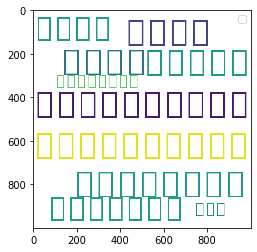

In [108]:

from PIL import Image
import matplotlib.pyplot as plt
wc = WordCloud(background_color="white",width=1000,height=1000, max_words=10,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(tfidf.vocabulary_)
plt.imshow(wc)
plt.legend()